In [1]:

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [2]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb

from util import get_clones


#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)

#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 


class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(DecoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) # 多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数



class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
   

In [4]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, v0, tb, X_f, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        #`numpy.concatenate`是一个用于数组拼接的函数。它可以将多个数组沿指定的轴拼接在一起，形成一个新的数组：numpy.concatenate((a1,a2, ...), axis=0)其中，`a1,a2, ...`是需要拼接的数组（只能接受数组或序列类型的参数，且参数形状必须相同），可以是多个。`axis`参数用于指定拼接的轴向，`axis=0`表示沿着第一个轴（即行）进行拼接，不指定`axis`参数默认值是0。
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值
        
        #Python使用self关键字来表示类的实例。当在类的方法中定义一个变量时，例如lb和ub，这些变量只在该方法内部可见，也就是说它们的作用域仅限于该方法。当方法执行完毕后，这些变量就会被销毁，无法在其他方法中访问它们。但如果希望在类的其他方法中也能访问这些变量就需要将它们保存为类的实例属性。这就是self.lb和self.ub的作用。
            #通过将lb和ub赋值给self.lb和self.ub，就可以在类的其他方法中通过self.lb和self.ub来访问这些值。总的来说，self.lb和self.ub是类的实例属性，它们的作用域是整个类，而不仅仅是定义它们的方法。
        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)

        X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_lb = make_time_sequence(X_lb, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
        X_ub = make_time_sequence(X_ub, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)


        self.x0 = torch.tensor(X0[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1)
        self.t0 = torch.tensor(X0[:,:, 1:2], requires_grad=True).float().to(device) #(点的数量，序列长度，1)

        self.x_lb = torch.tensor(X_lb[:,:, 0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,:, 1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,:, 0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,:, 1:2], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。
        self.v0 = torch.tensor(v0).float().to(device)


        
        
        # deep neural networks
        self.dnn = DNN(d_out=2, d_hidden=512, d_model=32, N=1, heads=2).to(device) 



        # optimizers: using the same settings，这里是使用pytorch库进行优化的部分
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        # self.optimizer_LBFGS = torch.optim.LBFGS(
        #     self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重、偏置以及两个新加的变量）
        #     lr=1.0,  #学习率设置为1
        #     max_iter=50000,  #最大迭代次数为50000
        #     max_eval=50000,  #最大评估次数为50000
        #     history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
        #     tolerance_grad=1e-5,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
        #     tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
        #     line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        # )
        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe')
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差
    
    #输入是两个(点的数量，序列长度，1)
    def net_uv_error(self, x, t):  
        uv = self.dnn(torch.cat([x, t], dim=-1))  #输出(点的数量，序列长度，2)
        u=uv[:,:, 0:1]
        v=uv[:,:, 1:2]

        return u,v #输出两个(点的数量，序列长度，1)


    #输入是两个(点的数量，序列长度，1)     
    def net_uv(self, x, t):  
        uv = self.dnn(torch.cat([x, t], dim=-1))  #输出(点的数量，序列长度，2)
        u=uv[:,:, 0:1] #(点的数量，序列长度，1)
        v=uv[:,:, 1:2]

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        v_x = torch.autograd.grad(
            v, x, 
            grad_outputs=torch.ones_like(v),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,v,u_x,v_x #四个形状均为(点的数量，序列长度，1)


    #输入是两个(点的数量，序列长度，1)
    def net_f_uv(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,v,u_x,v_x=self.net_uv(x,t) #四个形状均为(点的数量，序列长度，1)
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        v_t = torch.autograd.grad(
            v, t, 
            grad_outputs=torch.ones_like(v),
            retain_graph=True,
            create_graph=True
        )[0]
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        v_xx = torch.autograd.grad(
            v_x, x, 
            grad_outputs=torch.ones_like(v_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f_u=u_t+0.5*v_xx+(u**2+v**2)*v    #计算f_u,定义见论文
        f_v=v_t-0.5*u_xx-(u**2+v**2)*u   #计算f_v,定义见论文
        return f_u, f_v  #(点的数量，序列长度，1)


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, v0_pred, _ , _ = self.net_uv(self.x0, self.t0) #(点的数量，序列长度，1)
        u_lb_pred, v_lb_pred, u_x_lb_pred, v_x_lb_pred = self.net_uv(self.x_lb, self.t_lb) ##(点的数量，序列长度，1)
        u_ub_pred, v_ub_pred, u_x_ub_pred, v_x_ub_pred = self.net_uv(self.x_ub, self.t_ub) ##(点的数量，序列长度，1)
        u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
        v0_pred = v0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)

        f_u_pred, f_v_pred = self.net_f_uv(self.x_f, self.t_f) ##(点的数量，序列长度，1)

        loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((self.v0 - v0_pred) ** 2) + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((v_lb_pred - v_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean((v_x_lb_pred - v_x_ub_pred) ** 2) + \
                    torch.mean(f_u_pred ** 2) + \
                    torch.mean(f_v_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        # #record the test error\
        # self.dnn.eval()
        # with torch.no_grad():
        #     u_real_pred, v_real_pred= self.net_uv_error(self.x_star, self.t_star)
        #     h_real_pred = torch.sqrt(u_real_pred**2 + v_real_pred**2)

        # error_u_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
        # error_v_test = torch.norm(self.v_star - v_real_pred, 2) / torch.norm(self.v_star, 2)
        # error_h_test = torch.norm(self.h_star - h_real_pred, 2) / torch.norm(self.h_star, 2)
        
        # self.test_error.append(torch.tensor([error_u_test.item(), error_v_test.item(), error_h_test.item()]))

        # # 计算 MAE
        # mae = torch.mean(torch.abs(self.h_star - h_real_pred))
        # # 计算 MSE
        # mse = torch.mean((self.h_star - h_real_pred) ** 2)
        # # 记录 MAE 和 MSE
        # self.test_error_mae.append(mae)
        # self.test_error_mse.append(mse)
        

        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train()#将神经网络设置为训练模式而不是评估模式
            u0_pred, v0_pred, _ , _ = self.net_uv(self.x0, self.t0) #(点的数量，序列长度，1)
            u_lb_pred, v_lb_pred, u_x_lb_pred, v_x_lb_pred = self.net_uv(self.x_lb, self.t_lb) ##(点的数量，序列长度，1)
            u_ub_pred, v_ub_pred, u_x_ub_pred, v_x_ub_pred = self.net_uv(self.x_ub, self.t_ub) ##(点的数量，序列长度，1)
            u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
            v0_pred = v0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)



            f_u_pred, f_v_pred = self.net_f_uv(self.x_f, self.t_f) ##(点的数量，序列长度，1)

            loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((self.v0 - v0_pred) ** 2) + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((v_lb_pred - v_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean((v_x_lb_pred - v_x_ub_pred) ** 2) + \
                    torch.mean(f_u_pred ** 2) + \
                    torch.mean(f_v_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中
            

            # #record the test error
            # self.dnn.eval()
            # with torch.no_grad():
            #     u_real_pred, v_real_pred = self.net_uv_error(self.x_star, self.t_star)
            #     h_real_pred = torch.sqrt(u_real_pred**2 + v_real_pred**2)

            # error_u_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
            # error_v_test = torch.norm(self.v_star - v_real_pred, 2) / torch.norm(self.v_star, 2)
            # error_h_test = torch.norm(self.h_star - h_real_pred, 2) / torch.norm(self.h_star, 2)
            
            # self.test_error.append(torch.tensor([error_u_test.item(), error_v_test.item(), error_h_test.item()]))

            # # 计算 MAE和MSE
            # mae = torch.mean(torch.abs(self.h_star - h_real_pred))
            # mse = torch.mean((self.h_star - h_real_pred) ** 2)
            # # 记录 MAE 和 MSE
            # self.test_error_mae.append(mae)
            # self.test_error_mse.append(mse)



        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    

    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u, v = self.net_uv_error(x, t) #形状均为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
            v = v[:,0:1].reshape(-1,1) #将v的形状从(点的数量，序列长度，1)变为(点的数量，1)
            v = v.detach().cpu().numpy() #将张量u和f先从
        return u, v
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
            
        f_u, f_v = self.net_f_uv(x, t) #(点的数量，序列长度，1)
        f_u = torch.mean(f_u, dim=1).reshape(-1,1) #对f_u在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        f_v = torch.mean(f_v, dim=1).reshape(-1,1) #对f_v在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差

        f_u = f_u.detach().cpu().numpy()
        f_v = f_v.detach().cpu().numpy()

        f = np.sqrt(f_u**2 + f_v**2) #计算每个点的残差，形状为(点的数量，1)
        return f
    
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)


In [5]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [6]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    distances = distances.flatten()







    # #chunchaos方法
    # num_elements_to_average = 20
    # # 提取最后 20 个元素
    # last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # # 存储每个时间步（列表中的每个元素）的混沌度分数
    # step_chaos_scores = []
    # # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    # for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
    #     # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
    #     difference_step = step_xs - step_xs1 # 计算差异
    #     # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
    #     # 假设使用 NumPy 进行计算
    #     step_scores = np.linalg.norm(difference_step, axis=(1, 2))
    #     # 将这 N_f_new 个分数添加到列表中
    #     step_chaos_scores.append(step_scores)

    # # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    # all_step_scores = np.stack(step_chaos_scores)
    # # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # # 沿着时间步轴 (axis=0) 求平均
    # distances = np.mean(all_step_scores, axis=0)
    # # 结果形状是 (N_f_new,)







    return distances

In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 21, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [1]

#设置噪声值为0 
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-5.0, 0.0])
ub = np.array([5.0, np.pi/2])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 100
N_b = 100
N_f = 2500

#读取名为NLS.mat的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改    
data = scipy.io.loadmat('../data/NLS.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = data['uu'] #从data字典中取出变量uu的值，并赋值给Exact
Exact_u = np.real(Exact)  #取Exact的实部，赋值给Exact_u
Exact_v = np.imag(Exact)  #取Exact的虚部，赋值给Exact_v
Exact_h = np.sqrt(Exact_u**2 + Exact_v**2) #计算复数uu的|uu|
#生成一个二位网络，X和T是输出的二维数组
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact_u.T.flatten()[:,None] #先对Exact_u进行转置，然后使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组
v_star = Exact_v.T.flatten()[:,None] #同上，比如Exact_v是m*n二维数组，Exact_v.T是n*m二维数组，Exact_v.T.flatten()是一个长度为n*m的一维数组，Exact_v.T.flatten()[:,None]是一个(n*m)*1的三维数组
h_star = Exact_h.T.flatten()[:,None]
#上面五行代码的意义见Numpy库的索引的介绍


###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
#从所有的初值边界值训练基础数据中选取N_u=100个点
idx_x = np.linspace(0, x.shape[0] - 1, N0, dtype=int) #生成一个等差数列，从0到X的行数，间隔为1，赋值给idx_x
# idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
u0 = Exact_u[idx_x,0:1]
v0 = Exact_v[idx_x,0:1]
#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.linspace(0, t.shape[0] - 1, N_b, dtype=int) #生成一个等差数列，从0到t的行数，间隔为1，赋值给idx_t
# idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]



error = [] #创建一个空列表，用于存储误差值
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

for seed in seeds:
    set_seed(seed) #设置随机数种子
    # --- 1. 参数设置 ---
    nIter = 10000 #设置迭代次数为10000
    nIterLBFGS = 500 #设置LBFGS迭代次数为500
    # ... 其他参数 ...

    # --- 2. 初始化 ---
    N_f_1 = N_f // 20
    X_f_train = lb + (ub - lb) * lhs(2, N_f_1)


    #开始训练


    #创建PINN模型并输入各种参数        
    model = PhysicsInformedNN(x0, u0, v0, tb, X_f_train, lb, ub)

    # 【新】创建巨大、固定的候选点池
    N_f_candidate = N_f * 2
    X_f_candidate = lb + (ub - lb) * lhs(2, N_f_candidate)
    is_point_selected_mask = np.zeros(N_f_candidate, dtype=bool) #布尔掩码，形状是(N_f_candidate,)，初始值为False，表示所有点都未被选择
    

    # --- 3. 初始训练 ---
    start_time = time.time()
    model.train(nIter // 20, 0)

    # --- 4. 主动学习循环 ---
    # 计算总轮数,这里是19
    num_active_rounds = (nIter - nIter // 20) // (nIter // 20)
    # 每轮训练中记录的检查点数量，其实就是后面的T
    num_checkpoints_per_round = 10
    # 两次检查点之间的训练迭代次数
    epochs_between_checkpoints = (nIter // 20) // num_checkpoints_per_round

    # 用于存储每一轮最终预测的全局历史
    global_final_predictions = []

    for i in range(num_active_rounds):        
        # a. 训练并记录预测历史
        prediction_history = []
        # 记录当前模型在整个候选池上的预测输出
        
        for j in range(num_checkpoints_per_round):
            model.train(epochs_between_checkpoints, 0)
            
            # 记录当前模型在整个候选池上的预测输出
            u_predictions,v_predictions = model.predict(X_f_candidate) # 返回 (N, 1) 的Numpy数组
            predictions = np.sqrt(u_predictions**2 + v_predictions**2) # 计算模（平方和的平方根），得到 (N, 1) 的Numpy数组
            # prediction_history.append(predictions.flatten()) # 存为一维数组，每个元素形状为 (N, ) 
            prediction_history.append(predictions) # 存为二维数组，每个元素形状为 (N, 1)
        local_prediction_history = prediction_history

        # b. 计算不稳定性分数 g(x) = Σ v_t * a_t(x)
        # 将历史记录转为矩阵 (T+1, N_candidates,1)
        local_history_matrix = np.array(local_prediction_history)
        T_local, num_candidates, _ = local_history_matrix.shape #T表示共存储了多少个模型的预测结果，num_candidates表示候选点的数量

        # 获取最终预测u_T(x)
        local_final_prediction = local_history_matrix[-1, :, :] # (N_candidates, 1) 的数组

        # 计算不一致性矩阵 a_t(x) = |u_t(x) - u_T(x)|
        # 利用 NumPy 的广播机制高效计算，具体为(T, N_candidates,1)-(N_candidates,1)（相当于用T个元素分别和最后一个元素相减）,最后得到的形状是(T, N_candidates)
        # disagreement_matrix_A = np.abs(prediction_history_matrix - final_prediction_vec)
        local_disagreement = np.linalg.norm(local_history_matrix - local_final_prediction, ord=2, axis=-1)

        # 计算时间权重向量 v_t = (t/T)^k
        t_local = np.arange(1, T_local + 1) #形状是(T,)的数组
        k_local = 1.0  # 权重指数，可以作为超参数调整
        v_local = (t_local / T_local) ** k_local #形状是(T,)

        # 计算最终不稳定性分数 g(x)
        # g = V^T * A (矩阵乘法概念)
        # 实际操作：将权重向量V变形以进行逐元素乘法，然后在时间轴上求和
        # v_local（也就是V）的形状是(T,)，local_disagreement（也就是A）的形状是(T, N_candidates)
        # V[:, np.newaxis] 将V变为 (T, 1)，可以与A进行广播乘法
        g_micro = np.sum(v_local[:, np.newaxis] * local_disagreement, axis=0) #求和前形状为 (T, N_candidates)，求和后形状为(N_candidates,)

        
        # c. 更新并计算【宏观不稳定性 g_macro】
        # ------------------------------------------------------------------
        # 将本轮的最终预测加入全局历史列表
        global_final_predictions.append(local_final_prediction)
        
        g_macro = np.zeros(num_candidates) # 如果历史太短，宏观不稳定性为0
        
        # 只有当全局历史足够长时（至少有两次最终预测），计算才有意义
        if len(global_final_predictions) > 1:
            global_history_matrix = np.array(global_final_predictions)
            T_global, _, _ = global_history_matrix.shape # T_global 是当前的主动学习轮数 i+1
            
            # 使用全局最新的预测作为基准
            global_final_prediction = global_history_matrix[-1, :, :]
            
            # 计算宏观不一致性
            global_disagreement = np.linalg.norm(global_history_matrix - global_final_prediction, ord=2, axis=-1)
            
            # 【宏观 t, k】
            t_global = np.arange(1, T_global + 1)
            k_macro = 2.0 # 宏观时间尺度上，可以给后期变化更大的惩罚，所以k可以更大
            v_global = (t_global / T_global) ** k_macro
            
            # 计算宏观不稳定性分数
            g_macro = np.sum(v_global[:, np.newaxis] * global_disagreement, axis=0)


        # d. 融合分数
        # ------------------------------------------------------------------
        # 在融合前，对两种分数进行归一化，使其尺度相当，避免其中一个主导
        # 这是一个很好的实践，可以防止数值问题
        if np.std(g_micro) > 1e-6:
            g_micro_norm = (g_micro - np.mean(g_micro)) / np.std(g_micro)
        else:
            g_micro_norm = np.zeros_like(g_micro)

        if np.std(g_macro) > 1e-6:
            g_macro_norm = (g_macro - np.mean(g_macro)) / np.std(g_macro)
        else:
            g_macro_norm = np.zeros_like(g_macro)
            
        # 设置融合权重
        w_micro = 0.5
        w_macro = 0.5
        
        instability_scores_g = w_micro * g_micro_norm + w_macro * g_macro_norm



        batch_size = N_f_candidate // 10 # 设置批处理大小为候选点数量的十分之一，避免显存爆炸
        all_residuals = [] # 创建一个空列表来存储每个批次的残差结果


        # 循环处理每个批次
        for i in range(0, N_f_candidate, batch_size):
            # 获取当前批次的数据
            X_batch = X_f_candidate[i : i + batch_size]
            
            # 对当前批次计算残差
            # model.residual 内部的计算量大大减小，不会爆显存了
            residual_batch = model.residual(X_batch) # 返回 (batch_size, 1) 的 NumPy 数组
            
            # 将当前批次的结果添加到列表中
            all_residuals.append(residual_batch)

        # 将所有批次的结果拼接成一个大的 NumPy 数组
        residual = np.vstack(all_residuals) # vstack 用于垂直堆叠

        # --- 后续处理不变 ---
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        # 将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()



        #进行归一化
        epsilon = 1e-5
        
        norm_residual = np.linalg.norm(abs_residual)
        if norm_residual > epsilon:
            abs_residual = abs_residual / norm_residual
        else:
            abs_residual = np.zeros_like(abs_residual)
        # norm_distances = np.linalg.norm(distances)
        # if norm_distances > epsilon:
        #     distances = distances / norm_distances
        # else:
        #     distances = np.zeros_like(distances)

        norm_instability = np.linalg.norm(instability_scores_g)
        if norm_instability > epsilon:
            instability_scores_g = instability_scores_g / norm_instability
        else:
            instability_scores_g = np.zeros_like(instability_scores_g)

        xinxi = abs_residual + instability_scores_g #将残差和不稳定性分数相加，得到新的分数


        # e. 选择新的点
        # 屏蔽已选中的点，防止重复选择
        xinxi[is_point_selected_mask] = -1.0
        
        # 找出分数最高的 N_f_1 个点的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:]
        
        # 提取新点
        X_f_train_topk = X_f_candidate[topk_indices]
        
        # f. 更新训练集和掩码
        X_f_train = np.vstack((X_f_train, X_f_train_topk))
        is_point_selected_mask[topk_indices] = True


        # e. 更新模型内部的配位点
        X_f = make_time_sequence(X_f_train, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        
        #配位点数据
        model.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)



    model.train(0,nIterLBFGS) #使用LBFGS训练500次
    
    elapsed = time.time() - start_time                
    #打印训练所需时间
    print('Training time: %.4f' % (elapsed))



    #每一个seed训练好之后，用训练好的模型进行预测，得到测试误差

    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred, v_pred = model.predict(X_star)
    #计算u_pred和v_pred的模（平方和的平方根），赋值给h_pred
    h_pred = np.sqrt(u_pred**2 + v_pred**2)
    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)
    error_v = np.linalg.norm(v_star-v_pred,2)/np.linalg.norm(v_star,2)
    error_h = np.linalg.norm(h_star-h_pred,2)/np.linalg.norm(h_star,2)
    #打印误差
    # print('Error u: %e' % (error_u))
    # print('Error v: %e' % (error_v))
    print('Error h: %e' % (error_h))

    #将误差添加到error_h列表中

    #计算误差（基于2范数）        
    error.append(error_h) #计算误差，然后将误差添加到error_u列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(h_star - h_pred))
    mse = np.mean((h_star - h_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE
    print(f'当前为第{i}次循环，种子为{seed}')





#使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
V_pred = griddata(X_star, v_pred.flatten(), (X, T), method='cubic')
H_pred = griddata(X_star, h_pred.flatten(), (X, T), method='cubic')


H_star = griddata(X_star, h_star.flatten(), (X, T), method='cubic') #同上，将X_star和h_star插值到网格上，得到H_star

Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:41,  4.93it/s]

Adam:   1%|          | 3/500 [00:00<00:51,  9.63it/s]

Adam:   1%|          | 5/500 [00:00<00:41, 12.06it/s]

Adam:   1%|▏         | 7/500 [00:00<00:38, 12.77it/s]

Adam:   2%|▏         | 9/500 [00:00<00:36, 13.45it/s]

Adam:   2%|▏         | 11/500 [00:00<00:34, 13.99it/s]

Adam:   3%|▎         | 13/500 [00:01<00:34, 13.92it/s]

Adam:   3%|▎         | 15/500 [00:01<00:35, 13.80it/s]

Adam:   3%|▎         | 17/500 [00:01<00:34, 13.91it/s]

Adam:   4%|▍         | 19/500 [00:01<00:33, 14.53it/s]

Adam:   4%|▍         | 21/500 [00:01<00:33, 14.31it/s]

Adam:   5%|▍         | 23/500 [00:01<00:33, 14.41it/s]

Adam:   5%|▌         | 25/500 [00:01<00:32, 14.64it/s]

Adam:   5%|▌         | 27/500 [00:01<00:32, 14.38it/s]

Adam:   6%|▌         | 29/500 [00:02<00:33, 14.10it/s]

Adam:   6%|▌         | 31/500 [00:02<00:33, 13.91it/s]

Adam:   7%|▋         | 33/500 [00:02<00:31, 14.62it/s]

Adam:   7%|▋         | 35/500 [00:02<00:32, 14.39it/s]

Adam:   7%|▋         | 37/500 [00:02<00:32, 14.35it/s]

Adam:   8%|▊         | 39/500 [00:02<00:31, 14.79it/s]

Adam:   8%|▊         | 41/500 [00:02<00:31, 14.44it/s]

Adam:   9%|▊         | 43/500 [00:03<00:32, 14.11it/s]

Adam:   9%|▉         | 45/500 [00:03<00:32, 14.15it/s]

Adam:   9%|▉         | 47/500 [00:03<00:30, 14.67it/s]

Adam:  10%|▉         | 49/500 [00:03<00:31, 14.39it/s]

Adam:  10%|█         | 51/500 [00:03<00:31, 14.47it/s]

Adam:  11%|█         | 53/500 [00:03<00:30, 14.70it/s]

Adam:  11%|█         | 55/500 [00:03<00:30, 14.41it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:31, 14.14it/s]

Adam:  12%|█▏        | 59/500 [00:04<00:31, 14.02it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:30, 14.38it/s]

Adam:  13%|█▎        | 63/500 [00:04<00:30, 14.13it/s]

Adam:  13%|█▎        | 65/500 [00:04<00:31, 13.90it/s]

Adam:  13%|█▎        | 67/500 [00:04<00:31, 13.85it/s]

Adam:  14%|█▍        | 69/500 [00:04<00:29, 14.47it/s]

Adam:  14%|█▍        | 71/500 [00:05<00:30, 14.23it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:30, 14.07it/s]

Adam:  15%|█▌        | 75/500 [00:05<00:30, 14.05it/s]

Adam:  15%|█▌        | 77/500 [00:05<00:28, 14.64it/s]

Adam:  16%|█▌        | 79/500 [00:05<00:29, 14.37it/s]

Adam:  16%|█▌        | 81/500 [00:05<00:29, 14.26it/s]

Adam:  17%|█▋        | 83/500 [00:05<00:28, 14.72it/s]

Adam:  17%|█▋        | 85/500 [00:06<00:28, 14.33it/s]

Adam:  17%|█▋        | 87/500 [00:06<00:29, 14.09it/s]

Adam:  18%|█▊        | 89/500 [00:06<00:29, 14.05it/s]

Adam:  18%|█▊        | 91/500 [00:06<00:28, 14.50it/s]

Adam:  19%|█▊        | 93/500 [00:06<00:28, 14.21it/s]

Adam:  19%|█▉        | 95/500 [00:06<00:29, 13.91it/s]

Adam:  19%|█▉        | 97/500 [00:06<00:27, 14.49it/s]

Adam:  20%|█▉        | 99/500 [00:07<00:28, 14.15it/s]

Adam:  20%|██        | 101/500 [00:07<00:29, 13.63it/s]

Adam:  21%|██        | 103/500 [00:07<00:29, 13.62it/s]

Adam:  21%|██        | 105/500 [00:07<00:28, 13.66it/s]

Adam:  21%|██▏       | 107/500 [00:07<00:28, 13.83it/s]

Adam:  22%|██▏       | 109/500 [00:07<00:27, 14.30it/s]

Adam:  22%|██▏       | 111/500 [00:07<00:27, 14.04it/s]

Adam:  23%|██▎       | 113/500 [00:08<00:27, 13.95it/s]

Adam:  23%|██▎       | 115/500 [00:08<00:28, 13.60it/s]

Adam:  23%|██▎       | 117/500 [00:08<00:28, 13.57it/s]

Adam:  24%|██▍       | 119/500 [00:08<00:26, 14.27it/s]

Adam:  24%|██▍       | 121/500 [00:08<00:26, 14.07it/s]

Adam:  25%|██▍       | 123/500 [00:08<00:27, 13.93it/s]

Adam:  25%|██▌       | 125/500 [00:08<00:27, 13.87it/s]

Adam:  25%|██▌       | 127/500 [00:09<00:26, 14.34it/s]

Adam:  26%|██▌       | 129/500 [00:09<00:26, 14.08it/s]

Adam:  26%|██▌       | 131/500 [00:09<00:26, 14.00it/s]

Adam:  27%|██▋       | 133/500 [00:09<00:25, 14.21it/s]

Adam:  27%|██▋       | 135/500 [00:09<00:25, 14.46it/s]

Adam:  27%|██▋       | 137/500 [00:09<00:26, 13.91it/s]

Adam:  28%|██▊       | 139/500 [00:09<00:26, 13.50it/s]

Adam:  28%|██▊       | 141/500 [00:10<00:26, 13.46it/s]

Adam:  29%|██▊       | 143/500 [00:10<00:27, 13.04it/s]

Adam:  29%|██▉       | 145/500 [00:10<00:27, 13.04it/s]

Adam:  29%|██▉       | 147/500 [00:10<00:26, 13.11it/s]

Adam:  30%|██▉       | 149/500 [00:10<00:26, 13.39it/s]

Adam:  30%|███       | 151/500 [00:10<00:25, 13.85it/s]

Adam:  31%|███       | 153/500 [00:10<00:25, 13.74it/s]

Adam:  31%|███       | 155/500 [00:11<00:25, 13.53it/s]

Adam:  31%|███▏      | 157/500 [00:11<00:25, 13.54it/s]

Adam:  32%|███▏      | 159/500 [00:11<00:24, 13.72it/s]

Adam:  32%|███▏      | 161/500 [00:11<00:23, 14.20it/s]

Adam:  33%|███▎      | 163/500 [00:11<00:24, 14.04it/s]

Adam:  33%|███▎      | 165/500 [00:11<00:24, 13.74it/s]

Adam:  33%|███▎      | 167/500 [00:12<00:25, 13.01it/s]

Adam:  34%|███▍      | 169/500 [00:12<00:25, 13.03it/s]

Adam:  34%|███▍      | 171/500 [00:12<00:24, 13.21it/s]

Adam:  35%|███▍      | 173/500 [00:12<00:24, 13.34it/s]

Adam:  35%|███▌      | 175/500 [00:12<00:23, 13.63it/s]

Adam:  35%|███▌      | 177/500 [00:12<00:22, 14.12it/s]

Adam:  36%|███▌      | 179/500 [00:12<00:22, 14.06it/s]

Adam:  36%|███▌      | 181/500 [00:12<00:21, 14.60it/s]

Adam:  37%|███▋      | 183/500 [00:13<00:22, 14.27it/s]

Adam:  37%|███▋      | 185/500 [00:13<00:22, 14.06it/s]

Adam:  37%|███▋      | 187/500 [00:13<00:23, 13.61it/s]

Adam:  38%|███▊      | 189/500 [00:13<00:23, 13.37it/s]

Adam:  38%|███▊      | 191/500 [00:13<00:23, 13.35it/s]

Adam:  39%|███▊      | 193/500 [00:13<00:22, 13.51it/s]

Adam:  39%|███▉      | 195/500 [00:14<00:21, 14.12it/s]

Adam:  39%|███▉      | 197/500 [00:14<00:21, 14.00it/s]

Adam:  40%|███▉      | 199/500 [00:14<00:21, 13.99it/s]

Adam:  40%|████      | 201/500 [00:14<00:20, 14.60it/s]

Adam:  41%|████      | 203/500 [00:14<00:21, 14.13it/s]

Adam:  41%|████      | 205/500 [00:14<00:21, 13.97it/s]

Adam:  41%|████▏     | 207/500 [00:14<00:21, 13.62it/s]

Adam:  42%|████▏     | 209/500 [00:15<00:21, 13.46it/s]

Adam:  42%|████▏     | 211/500 [00:15<00:21, 13.59it/s]

Adam:  43%|████▎     | 213/500 [00:15<00:20, 14.31it/s]

Adam:  43%|████▎     | 215/500 [00:15<00:20, 14.14it/s]

Adam:  43%|████▎     | 217/500 [00:15<00:20, 13.95it/s]

Adam:  44%|████▍     | 219/500 [00:15<00:19, 14.51it/s]

Adam:  44%|████▍     | 221/500 [00:15<00:19, 14.22it/s]

Adam:  45%|████▍     | 223/500 [00:16<00:19, 13.96it/s]

Adam:  45%|████▌     | 225/500 [00:16<00:20, 13.34it/s]

Adam:  45%|████▌     | 227/500 [00:16<00:20, 13.41it/s]

Adam:  46%|████▌     | 229/500 [00:16<00:20, 13.49it/s]

Adam:  46%|████▌     | 231/500 [00:16<00:19, 13.75it/s]

Adam:  47%|████▋     | 233/500 [00:16<00:18, 14.20it/s]

Adam:  47%|████▋     | 235/500 [00:16<00:18, 14.07it/s]

Adam:  47%|████▋     | 237/500 [00:17<00:18, 14.15it/s]

Adam:  48%|████▊     | 239/500 [00:17<00:18, 14.49it/s]

Adam:  48%|████▊     | 241/500 [00:17<00:18, 14.18it/s]

Adam:  49%|████▊     | 243/500 [00:17<00:18, 14.05it/s]

Adam:  49%|████▉     | 245/500 [00:17<00:17, 14.18it/s]

Adam:  49%|████▉     | 247/500 [00:17<00:17, 14.32it/s]

Adam:  50%|████▉     | 249/500 [00:17<00:17, 14.02it/s]

Adam:  50%|█████     | 251/500 [00:18<00:18, 13.65it/s]

Adam:  51%|█████     | 253/500 [00:18<00:18, 13.51it/s]

Adam:  51%|█████     | 255/500 [00:18<00:17, 13.69it/s]

Adam:  51%|█████▏    | 257/500 [00:18<00:16, 14.31it/s]

Adam:  52%|█████▏    | 259/500 [00:18<00:17, 14.07it/s]

Adam:  52%|█████▏    | 261/500 [00:18<00:17, 13.85it/s]

Adam:  53%|█████▎    | 263/500 [00:18<00:17, 13.86it/s]

Adam:  53%|█████▎    | 265/500 [00:19<00:16, 14.50it/s]

Adam:  53%|█████▎    | 267/500 [00:19<00:16, 14.15it/s]

Adam:  54%|█████▍    | 269/500 [00:19<00:16, 14.00it/s]

Adam:  54%|█████▍    | 271/500 [00:19<00:15, 14.65it/s]

Adam:  55%|█████▍    | 273/500 [00:19<00:15, 14.31it/s]

Adam:  55%|█████▌    | 275/500 [00:19<00:16, 14.06it/s]

Adam:  55%|█████▌    | 277/500 [00:19<00:16, 13.40it/s]

Adam:  56%|█████▌    | 279/500 [00:20<00:16, 13.27it/s]

Adam:  56%|█████▌    | 281/500 [00:20<00:16, 13.21it/s]

Adam:  57%|█████▋    | 283/500 [00:20<00:16, 13.21it/s]

Adam:  57%|█████▋    | 285/500 [00:20<00:16, 13.33it/s]

Adam:  57%|█████▋    | 287/500 [00:20<00:15, 13.58it/s]

Adam:  58%|█████▊    | 289/500 [00:20<00:14, 14.19it/s]

Adam:  58%|█████▊    | 291/500 [00:20<00:14, 13.98it/s]

Adam:  59%|█████▊    | 293/500 [00:21<00:14, 14.55it/s]

Adam:  59%|█████▉    | 295/500 [00:21<00:14, 14.29it/s]

Adam:  59%|█████▉    | 297/500 [00:21<00:14, 14.09it/s]

Adam:  60%|█████▉    | 299/500 [00:21<00:14, 14.02it/s]

Adam:  60%|██████    | 301/500 [00:21<00:13, 14.58it/s]

Adam:  61%|██████    | 303/500 [00:21<00:13, 14.29it/s]

Adam:  61%|██████    | 305/500 [00:21<00:13, 14.06it/s]

Adam:  61%|██████▏   | 307/500 [00:22<00:14, 13.64it/s]

Adam:  62%|██████▏   | 309/500 [00:22<00:13, 13.66it/s]

Adam:  62%|██████▏   | 311/500 [00:22<00:13, 14.38it/s]

Adam:  63%|██████▎   | 313/500 [00:22<00:13, 13.96it/s]

Adam:  63%|██████▎   | 315/500 [00:22<00:13, 13.87it/s]

Adam:  63%|██████▎   | 317/500 [00:22<00:13, 13.58it/s]

Adam:  64%|██████▍   | 319/500 [00:22<00:13, 13.67it/s]

Adam:  64%|██████▍   | 321/500 [00:23<00:12, 14.38it/s]

Adam:  65%|██████▍   | 323/500 [00:23<00:12, 14.16it/s]

Adam:  65%|██████▌   | 325/500 [00:23<00:12, 14.15it/s]

Adam:  65%|██████▌   | 327/500 [00:23<00:11, 14.57it/s]

Adam:  66%|██████▌   | 329/500 [00:23<00:12, 14.24it/s]

Adam:  66%|██████▌   | 331/500 [00:23<00:12, 13.80it/s]

Adam:  67%|██████▋   | 333/500 [00:23<00:12, 13.75it/s]

Adam:  67%|██████▋   | 335/500 [00:24<00:11, 13.89it/s]

Adam:  67%|██████▋   | 337/500 [00:24<00:11, 14.37it/s]

Adam:  68%|██████▊   | 339/500 [00:24<00:11, 14.00it/s]

Adam:  68%|██████▊   | 341/500 [00:24<00:11, 14.01it/s]

Adam:  69%|██████▊   | 343/500 [00:24<00:11, 13.68it/s]

Adam:  69%|██████▉   | 345/500 [00:24<00:11, 13.61it/s]

Adam:  69%|██████▉   | 347/500 [00:24<00:10, 14.13it/s]

Adam:  70%|██████▉   | 349/500 [00:25<00:11, 13.65it/s]

Adam:  70%|███████   | 351/500 [00:25<00:11, 13.41it/s]

Adam:  71%|███████   | 353/500 [00:25<00:10, 13.49it/s]

Adam:  71%|███████   | 355/500 [00:25<00:10, 13.21it/s]

Adam:  71%|███████▏  | 357/500 [00:25<00:10, 13.01it/s]

Adam:  72%|███████▏  | 359/500 [00:25<00:10, 13.07it/s]

Adam:  72%|███████▏  | 361/500 [00:25<00:10, 13.15it/s]

Adam:  73%|███████▎  | 363/500 [00:26<00:10, 13.19it/s]

Adam:  73%|███████▎  | 365/500 [00:26<00:10, 13.38it/s]

Adam:  73%|███████▎  | 367/500 [00:26<00:09, 14.10it/s]

Adam:  74%|███████▍  | 369/500 [00:26<00:09, 13.99it/s]

Adam:  74%|███████▍  | 371/500 [00:26<00:09, 14.08it/s]

Adam:  75%|███████▍  | 373/500 [00:26<00:08, 14.50it/s]

Adam:  75%|███████▌  | 375/500 [00:26<00:08, 14.22it/s]

Adam:  75%|███████▌  | 377/500 [00:27<00:08, 13.72it/s]

Adam:  76%|███████▌  | 379/500 [00:27<00:08, 13.64it/s]

Adam:  76%|███████▌  | 381/500 [00:27<00:08, 13.71it/s]

Adam:  77%|███████▋  | 383/500 [00:27<00:08, 13.26it/s]

Adam:  77%|███████▋  | 385/500 [00:27<00:08, 13.31it/s]

Adam:  77%|███████▋  | 387/500 [00:27<00:08, 14.08it/s]

Adam:  78%|███████▊  | 389/500 [00:27<00:07, 13.88it/s]

Adam:  78%|███████▊  | 391/500 [00:28<00:08, 13.62it/s]

Adam:  79%|███████▊  | 393/500 [00:28<00:07, 13.43it/s]

Adam:  79%|███████▉  | 395/500 [00:28<00:08, 13.07it/s]

Adam:  79%|███████▉  | 397/500 [00:28<00:07, 13.10it/s]

Adam:  80%|███████▉  | 399/500 [00:28<00:07, 13.23it/s]

Adam:  80%|████████  | 401/500 [00:28<00:07, 13.93it/s]

Adam:  81%|████████  | 403/500 [00:29<00:07, 13.78it/s]

Adam:  81%|████████  | 405/500 [00:29<00:06, 13.76it/s]

Adam:  81%|████████▏ | 407/500 [00:29<00:06, 13.66it/s]

Adam:  82%|████████▏ | 409/500 [00:29<00:06, 13.77it/s]

Adam:  82%|████████▏ | 411/500 [00:29<00:06, 14.38it/s]

Adam:  83%|████████▎ | 413/500 [00:29<00:06, 13.62it/s]

Adam:  83%|████████▎ | 415/500 [00:29<00:06, 13.59it/s]

Adam:  83%|████████▎ | 417/500 [00:30<00:06, 13.43it/s]

Adam:  84%|████████▍ | 419/500 [00:30<00:06, 13.46it/s]

Adam:  84%|████████▍ | 421/500 [00:30<00:05, 13.46it/s]

Adam:  85%|████████▍ | 423/500 [00:30<00:05, 14.15it/s]

Adam:  85%|████████▌ | 425/500 [00:30<00:05, 13.89it/s]

Adam:  85%|████████▌ | 427/500 [00:30<00:05, 13.84it/s]

Adam:  86%|████████▌ | 429/500 [00:30<00:05, 13.62it/s]

Adam:  86%|████████▌ | 431/500 [00:31<00:05, 13.65it/s]

Adam:  87%|████████▋ | 433/500 [00:31<00:04, 13.80it/s]

Adam:  87%|████████▋ | 435/500 [00:31<00:04, 14.01it/s]

Adam:  87%|████████▋ | 437/500 [00:31<00:04, 13.73it/s]

Adam:  88%|████████▊ | 439/500 [00:31<00:04, 13.61it/s]

Adam:  88%|████████▊ | 441/500 [00:31<00:04, 13.39it/s]

Adam:  89%|████████▊ | 443/500 [00:31<00:04, 13.60it/s]

Adam:  89%|████████▉ | 445/500 [00:32<00:03, 14.24it/s]

Adam:  89%|████████▉ | 447/500 [00:32<00:03, 13.75it/s]

Adam:  90%|████████▉ | 449/500 [00:32<00:03, 13.36it/s]

Adam:  90%|█████████ | 451/500 [00:32<00:03, 13.16it/s]

Adam:  91%|█████████ | 453/500 [00:32<00:03, 13.33it/s]

Adam:  91%|█████████ | 455/500 [00:32<00:03, 13.35it/s]

Adam:  91%|█████████▏| 457/500 [00:33<00:03, 13.49it/s]

Adam:  92%|█████████▏| 459/500 [00:33<00:03, 13.47it/s]

Adam:  92%|█████████▏| 461/500 [00:33<00:02, 14.00it/s]

Adam:  93%|█████████▎| 463/500 [00:33<00:02, 13.82it/s]

Adam:  93%|█████████▎| 465/500 [00:33<00:02, 13.73it/s]

Adam:  93%|█████████▎| 467/500 [00:33<00:02, 13.91it/s]

Adam:  94%|█████████▍| 469/500 [00:33<00:02, 13.27it/s]

Adam:  94%|█████████▍| 471/500 [00:34<00:02, 13.07it/s]

Adam:  95%|█████████▍| 473/500 [00:34<00:02, 13.32it/s]

Adam:  95%|█████████▌| 475/500 [00:34<00:01, 14.00it/s]

Adam:  95%|█████████▌| 477/500 [00:34<00:01, 13.52it/s]

Adam:  96%|█████████▌| 479/500 [00:34<00:01, 13.46it/s]

Adam:  96%|█████████▌| 481/500 [00:34<00:01, 13.25it/s]

Adam:  97%|█████████▋| 483/500 [00:34<00:01, 13.36it/s]

Adam:  97%|█████████▋| 485/500 [00:35<00:01, 13.42it/s]

Adam:  97%|█████████▋| 487/500 [00:35<00:00, 13.30it/s]

Adam:  98%|█████████▊| 489/500 [00:35<00:00, 12.65it/s]

Adam:  98%|█████████▊| 491/500 [00:35<00:00, 12.89it/s]

Adam:  99%|█████████▊| 493/500 [00:35<00:00, 13.12it/s]

Adam:  99%|█████████▉| 495/500 [00:35<00:00, 13.43it/s]

Adam:  99%|█████████▉| 497/500 [00:35<00:00, 14.04it/s]

Adam: 100%|█████████▉| 499/500 [00:36<00:00, 13.90it/s]

Adam: 100%|██████████| 500/500 [00:36<00:00, 13.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.71it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.86it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.89it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.80it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.00it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.84it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.85it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.90it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 11.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.41it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.48it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.52it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.54it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.57it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.52it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.45it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.57it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.57it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.53it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.54it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.40it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.28it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.40it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.10it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.61it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.08it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.90it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.01it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.09it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.76it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.17it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.12it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.07it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.12it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.57it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.99it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.02it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.09it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.50it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.05it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.09it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.14it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.10it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.11it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.15it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.18it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.62it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.65it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.37it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.34it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.37it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.44it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.36it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.03it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.37it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.38it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.38it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.31it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.47it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.69it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.92it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.84it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.43it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.25it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.84it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.95it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.51it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.87it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.38it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.09it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.38it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.98it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.93it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.09it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.45it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.39it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.33it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.64it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.89it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.84it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.89it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.81it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.93it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.81it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.86it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.92it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.78it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.82it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.97it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.84it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.89it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.88it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.80it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.92it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.87it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.59it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.86it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.99it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.93it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.82it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.95it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.89it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.87it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.86it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.93it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.94it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.91it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.43it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.51it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.52it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.83it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.38it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.45it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.31it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.44it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.47it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.30it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.47it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.55it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.41it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.48it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.40it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.38it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.44it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.42it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.44it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.43it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.47it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.74it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.45it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.42it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.44it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.32it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.29it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.99it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.42it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.84it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.51it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.48it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.40it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.73it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.92it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.93it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.13it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.86it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.84it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.12it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.32it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.40it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.07it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.31it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.12it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.22it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.17it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.77it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.93it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.14it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.30it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.33it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.94it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.95it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.02it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.13it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.17it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.03it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.92it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.99it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.03it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.95it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.83it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.90it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.18it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.25it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.16it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.22it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.14it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.21it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.18it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.02it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.97it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.09it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.33it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.71it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.87it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.17it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.12it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.10it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.97it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.13it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.32it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.14it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.98it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.01it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.92it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.28it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.86it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.46it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.50it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.85it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.80it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.14it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.14it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.85it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.36it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.08it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.88it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.04it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.17it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.24it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.88it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.91it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.91it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.90it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.91it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.90it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.76it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.71it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.50it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.55it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.54it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.49it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.62it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.67it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.85it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.77it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.60it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.33it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.51it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.50it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.84it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.60it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.70it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.77it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.82it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.77it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.86it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.60it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.77it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.47it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.57it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.70it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.77it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.50it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.69it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.87it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.72it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.87it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.59it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.72it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.82it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.85it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.75it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.57it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.68it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.75it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.73it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.80it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.57it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.73it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.86it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.55it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.71it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.88it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.72it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.86it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.81it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.82it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.80it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.84it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.82it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.71it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.78it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.80it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.86it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.61it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.85it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.61it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.80it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.81it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.71it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.58it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.81it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.95it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.58it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.62it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.82it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.56it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.83it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.61it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.74it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.84it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.59it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.19it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.96it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.05it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.22it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.20it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.26it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.17it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.12it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.26it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.43it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.29it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.36it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.35it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.08it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.92it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.81it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.55it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.30it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.16it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.32it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.48it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.16it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.24it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.49it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.34it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.37it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.64it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.36it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.15it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.27it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.34it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.38it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.35it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.40it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.13it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.23it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.31it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.33it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.22it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.48it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.35it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.63it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.32it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.16it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.27it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.09it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.12it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.99it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.15it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.22it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.03it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.98it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.12it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.31it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.17it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.41it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.53it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.09it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.25it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.50it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.10it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.48it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.05it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.13it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.22it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.47it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.23it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.08it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.07it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.20it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.44it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.19it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.02it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.26it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.25it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.50it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.10it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.98it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.18it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.42it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.10it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.47it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.18it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.14it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.39it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.57it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.02it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.31it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.36it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.62it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.10it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.07it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.35it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.38it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.07it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.91it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.09it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.00it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.13it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.14it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.35it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.10it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.13it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.14it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.50it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.11it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.28it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.08it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.14it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.24it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.09it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.19it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.34it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.36it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.54it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.32it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.10it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.21it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.21it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.29it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.33it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.50it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.96it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.93it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.08it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.28it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.24it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.43it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.32it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.12it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.98it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.28it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.41it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.43it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.41it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.11it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.06it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.28it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.06it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.11it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.21it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.01it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.18it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.49it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.51it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.54it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.89it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.09it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.94it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.85it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.94it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.00it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.03it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.99it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.12it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.13it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.13it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.98it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.84it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.93it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.07it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.20it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.82it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.99it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.92it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.90it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.98it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.15it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.98it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.16it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.15it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.15it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.19it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.94it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.81it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.89it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.77it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.73it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.95it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.00it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.17it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.93it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.71it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.76it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.99it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.52it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.56it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.78it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.83it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.99it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.09it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.92it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.67it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.93it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.99it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.11it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.89it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.90it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.98it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.01it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.18it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.70it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.74it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.85it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.92it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.03it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.10it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.70it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.58it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.77it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.79it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.90it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.01it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.00it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.84it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.97it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.00it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.80it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.75it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.84it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.01it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.17it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.91it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.76it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.84it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.81it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.99it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.08it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.75it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.68it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.82it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.93it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.00it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.56it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.76it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.05it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.16it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.82it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.94it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.08it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.95it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.83it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.96it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.07it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.12it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.76it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.73it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.92it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.97it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.16it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.93it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.76it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.00it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.16it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.93it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.72it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.43it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.74it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.98it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.13it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.91it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.78it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.53it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.75it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.84it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.10it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.75it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.87it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.96it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.91it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.16it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.81it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.00it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.23it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.86it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.52it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.10it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.98it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.96it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.76it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.67it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.80it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.89it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.97it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.14it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.93it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.83it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.96it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.05it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.24it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.94it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.05it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.08it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.19it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.64it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.62it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.74it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.96it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.87it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.71it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.87it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.88it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.98it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.03it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.07it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.76it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.68it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.84it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.95it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.96it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.91it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.79it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.75it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.83it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.92it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.93it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.97it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.75it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.96it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.99it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.90it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.77it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.10it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.98it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.91it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.62it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.81it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.89it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.13it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.91it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.07it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.09it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.84it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.94it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.02it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.73it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.68it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.77it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.87it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.00it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.06it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.87it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.72it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.73it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.00it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.28it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.82it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.16it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.93it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.81it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.91it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.01it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.09it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.93it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.91it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.00it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.13it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.26it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.98it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.80it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.72it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.84it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.98it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.69it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.89it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.36it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.32it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.25it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.25it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.68it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.74it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.69it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.47it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.37it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.26it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.19it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.20it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.18it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.25it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.29it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.32it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.45it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.65it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.74it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.68it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.36it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.32it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.22it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.19it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.44it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.55it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.64it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.84it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.64it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.50it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.39it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.35it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.32it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.30it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.29it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.32it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.37it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.52it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.61it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.72it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.64it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.64it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.64it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.54it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.49it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.56it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.64it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.69it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.69it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.53it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.44it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.39it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.36it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.34it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.32it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.33it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.33it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.34it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.48it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.61it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.65it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.72it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.85it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.44it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.34it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.26it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.23it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.39it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.22it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.23it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.42it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.54it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.63it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.67it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.87it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.73it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.43it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.33it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.32it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.19it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.25it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.27it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.37it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.66it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.70it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.86it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.72it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.58it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.41it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.35it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.19it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.44it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.69it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.57it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.41it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.43it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.56it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.58it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.61it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.65it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.75it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.57it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.38it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.32it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.28it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.39it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.51it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.59it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.67it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.69it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.79it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.64it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.50it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.42it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.33it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.29it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.27it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.26it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.25it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.36it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.51it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.60it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.69it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.75it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.65it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.31it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.24it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.19it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.19it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.20it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.22it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.13it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.22it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.27it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.25it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.25it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.21it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.62it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.71it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.45it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.41it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.41it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.61it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.80it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.48it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.44it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.29it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.25it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.22it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.54it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.62it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.67it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.83it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.66it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.44it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.38it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.33it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.25it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.35it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.53it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.61it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.69it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.67it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.78it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.73it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.45it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.28it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.21it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.26it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.40it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.51it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.61it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.67it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.71it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.54it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.63it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.69it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.71it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.74it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.90it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.74it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.57it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.47it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.41it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.36it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.38it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.64it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.69it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.73it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.85it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.64it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.51it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.39it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.32it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.25it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.63it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.66it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.82it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.38it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.35it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.33it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.21it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.21it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.21it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.16it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.17it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.18it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.18it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.18it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.20it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.17it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.19it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.22it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.21it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.23it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.23it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.27it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.29it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.29it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.34it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.47it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.60it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.41it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.21it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.19it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.23it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.27it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.34it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.42it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.67it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.73it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.77it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.59it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.48it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.48it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.60it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.63it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.71it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.69it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.88it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.57it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.46it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.39it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.37it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.34it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.33it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.22it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.19it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.25it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.26it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.27it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.21it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.21it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.03it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.08it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.03it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.08it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.08it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.03it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.07it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.04it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.07it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.07it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.01it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.05it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.03it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.07it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.07it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.07it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.07it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.11it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.08it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.08it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.08it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.08it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.07it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.08it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.07it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.07it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.07it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.07it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.07it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.07it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.07it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.99it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.98it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.03it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.04it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.09it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.08it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.04it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.01it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.03it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.01it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.00it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.00it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.01it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.03it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.03it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.02it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.08it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.04it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.04it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.07it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.07it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.03it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.05it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.11it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.02it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.02it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.97it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.97it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.01it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.02it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.04it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.04it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.08it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.98it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.02it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.09it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.07it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.07it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.05it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.08it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.03it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.08it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.07it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.10it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.03it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.03it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.03it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.10it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.10it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.07it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.94it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.94it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.94it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.94it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.94it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.94it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.94it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.94it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.94it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.89it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.94it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.94it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.94it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.94it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.94it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.94it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.94it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.94it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.94it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.94it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.94it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.90it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.89it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.94it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.94it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.90it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.94it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.94it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.90it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.94it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.94it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.92it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.95it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.95it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.94it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.90it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.90it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.95it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.94it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.95it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.95it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.95it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.94it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.94it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.96it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.94it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.94it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.94it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.91it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.89it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.90it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.94it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.94it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.94it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.94it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.89it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:05<41:44,  5.02s/it]

LBFGS:   0%|          | 2/500 [00:09<39:16,  4.73s/it]

LBFGS:   1%|          | 3/500 [00:14<41:41,  5.03s/it]

LBFGS:   1%|          | 4/500 [00:20<44:55,  5.43s/it]

LBFGS:   1%|          | 5/500 [00:27<48:19,  5.86s/it]

LBFGS:   1%|          | 6/500 [00:34<51:05,  6.21s/it]

LBFGS:   1%|▏         | 7/500 [00:41<52:14,  6.36s/it]

LBFGS:   2%|▏         | 8/500 [00:48<53:28,  6.52s/it]

LBFGS:   2%|▏         | 9/500 [00:54<53:46,  6.57s/it]

LBFGS:   2%|▏         | 10/500 [01:01<53:54,  6.60s/it]

LBFGS:   2%|▏         | 11/500 [01:08<54:13,  6.65s/it]

LBFGS:   2%|▏         | 12/500 [01:14<54:09,  6.66s/it]

LBFGS:   3%|▎         | 13/500 [01:21<54:35,  6.72s/it]

LBFGS:   3%|▎         | 14/500 [01:28<54:19,  6.71s/it]

LBFGS:   3%|▎         | 15/500 [01:34<53:35,  6.63s/it]

LBFGS:   3%|▎         | 16/500 [01:41<54:05,  6.71s/it]

LBFGS:   3%|▎         | 17/500 [01:48<53:52,  6.69s/it]

LBFGS:   4%|▎         | 18/500 [01:55<53:43,  6.69s/it]

LBFGS:   4%|▍         | 19/500 [02:02<54:48,  6.84s/it]

LBFGS:   4%|▍         | 20/500 [02:09<54:46,  6.85s/it]

LBFGS:   4%|▍         | 21/500 [02:15<54:46,  6.86s/it]

LBFGS:   4%|▍         | 22/500 [02:23<55:44,  7.00s/it]

LBFGS:   5%|▍         | 23/500 [02:30<55:19,  6.96s/it]

LBFGS:   5%|▍         | 24/500 [02:36<54:46,  6.90s/it]

LBFGS:   5%|▌         | 25/500 [02:43<54:52,  6.93s/it]

LBFGS:   5%|▌         | 26/500 [02:51<55:30,  7.03s/it]

LBFGS:   5%|▌         | 27/500 [02:58<55:41,  7.06s/it]

LBFGS:   6%|▌         | 28/500 [03:05<55:09,  7.01s/it]

LBFGS:   6%|▌         | 29/500 [03:12<55:14,  7.04s/it]

LBFGS:   6%|▌         | 30/500 [03:18<54:15,  6.93s/it]

LBFGS:   6%|▌         | 31/500 [03:25<53:49,  6.89s/it]

LBFGS:   6%|▋         | 32/500 [03:33<54:55,  7.04s/it]

LBFGS:   7%|▋         | 33/500 [03:40<54:39,  7.02s/it]

LBFGS:   7%|▋         | 34/500 [03:47<54:14,  6.98s/it]

LBFGS:   7%|▋         | 35/500 [03:54<55:23,  7.15s/it]

LBFGS:   7%|▋         | 36/500 [04:01<54:35,  7.06s/it]

LBFGS:   7%|▋         | 37/500 [04:08<54:06,  7.01s/it]

LBFGS:   8%|▊         | 38/500 [04:15<54:40,  7.10s/it]

LBFGS:   8%|▊         | 39/500 [04:22<54:36,  7.11s/it]

LBFGS:   8%|▊         | 40/500 [04:30<54:56,  7.17s/it]

LBFGS:   8%|▊         | 41/500 [04:37<55:09,  7.21s/it]

LBFGS:   8%|▊         | 42/500 [04:44<54:46,  7.18s/it]

LBFGS:   9%|▊         | 43/500 [04:51<54:40,  7.18s/it]

LBFGS:   9%|▉         | 44/500 [04:58<53:53,  7.09s/it]

LBFGS:   9%|▉         | 45/500 [05:05<53:43,  7.09s/it]

LBFGS:   9%|▉         | 46/500 [05:12<54:07,  7.15s/it]

LBFGS:   9%|▉         | 47/500 [05:19<53:24,  7.07s/it]

LBFGS:  10%|▉         | 48/500 [05:26<52:49,  7.01s/it]

LBFGS:  10%|▉         | 49/500 [05:33<53:07,  7.07s/it]

LBFGS:  10%|█         | 50/500 [05:40<52:37,  7.02s/it]

LBFGS:  10%|█         | 51/500 [05:47<52:11,  6.97s/it]

LBFGS:  10%|█         | 52/500 [05:54<51:40,  6.92s/it]

LBFGS:  11%|█         | 53/500 [06:01<52:24,  7.03s/it]

LBFGS:  11%|█         | 54/500 [06:08<51:30,  6.93s/it]

LBFGS:  11%|█         | 55/500 [06:15<50:49,  6.85s/it]

LBFGS:  11%|█         | 56/500 [06:22<50:46,  6.86s/it]

LBFGS:  11%|█▏        | 57/500 [06:28<50:43,  6.87s/it]

LBFGS:  12%|█▏        | 58/500 [06:35<51:04,  6.93s/it]

LBFGS:  12%|█▏        | 59/500 [06:43<51:19,  6.98s/it]

LBFGS:  12%|█▏        | 60/500 [06:49<50:30,  6.89s/it]

LBFGS:  12%|█▏        | 61/500 [06:56<50:45,  6.94s/it]

LBFGS:  12%|█▏        | 62/500 [07:03<50:37,  6.94s/it]

LBFGS:  13%|█▎        | 63/500 [07:10<50:51,  6.98s/it]

LBFGS:  13%|█▎        | 64/500 [07:17<50:59,  7.02s/it]

LBFGS:  13%|█▎        | 65/500 [07:24<50:08,  6.92s/it]

LBFGS:  13%|█▎        | 66/500 [07:31<49:16,  6.81s/it]

LBFGS:  13%|█▎        | 67/500 [07:38<49:16,  6.83s/it]

LBFGS:  14%|█▎        | 68/500 [07:45<50:51,  7.06s/it]

LBFGS:  14%|█▍        | 69/500 [07:52<50:08,  6.98s/it]

LBFGS:  14%|█▍        | 70/500 [07:59<50:16,  7.02s/it]

LBFGS:  14%|█▍        | 71/500 [08:06<49:24,  6.91s/it]

LBFGS:  14%|█▍        | 72/500 [08:12<49:01,  6.87s/it]

LBFGS:  15%|█▍        | 73/500 [08:19<48:56,  6.88s/it]

LBFGS:  15%|█▍        | 74/500 [08:26<48:50,  6.88s/it]

LBFGS:  15%|█▌        | 75/500 [08:33<48:18,  6.82s/it]

LBFGS:  15%|█▌        | 76/500 [08:40<48:19,  6.84s/it]

LBFGS:  15%|█▌        | 77/500 [08:47<48:16,  6.85s/it]

LBFGS:  16%|█▌        | 78/500 [08:54<48:26,  6.89s/it]

LBFGS:  16%|█▌        | 79/500 [09:01<49:38,  7.07s/it]

LBFGS:  16%|█▌        | 80/500 [09:08<49:07,  7.02s/it]

LBFGS:  16%|█▌        | 81/500 [09:15<48:58,  7.01s/it]

LBFGS:  16%|█▋        | 82/500 [09:22<47:57,  6.88s/it]

LBFGS:  17%|█▋        | 83/500 [09:29<48:24,  6.97s/it]

LBFGS:  17%|█▋        | 84/500 [09:35<46:53,  6.76s/it]

LBFGS:  17%|█▋        | 85/500 [09:40<43:01,  6.22s/it]

LBFGS:  17%|█▋        | 86/500 [09:46<41:29,  6.01s/it]

LBFGS:  17%|█▋        | 87/500 [09:51<39:56,  5.80s/it]

LBFGS:  18%|█▊        | 88/500 [09:56<38:30,  5.61s/it]

LBFGS:  18%|█▊        | 89/500 [10:01<37:56,  5.54s/it]

LBFGS:  18%|█▊        | 90/500 [10:07<37:14,  5.45s/it]

LBFGS:  18%|█▊        | 91/500 [10:12<36:18,  5.33s/it]

LBFGS:  18%|█▊        | 92/500 [10:17<35:39,  5.24s/it]

LBFGS:  19%|█▊        | 93/500 [10:22<35:23,  5.22s/it]

LBFGS:  19%|█▉        | 94/500 [10:27<35:21,  5.22s/it]

LBFGS:  19%|█▉        | 95/500 [10:32<35:24,  5.24s/it]

LBFGS:  19%|█▉        | 96/500 [10:37<34:35,  5.14s/it]

LBFGS:  19%|█▉        | 97/500 [10:43<35:52,  5.34s/it]

LBFGS:  20%|█▉        | 98/500 [10:49<36:07,  5.39s/it]

LBFGS:  20%|█▉        | 99/500 [10:54<36:00,  5.39s/it]

LBFGS:  20%|██        | 100/500 [11:00<36:18,  5.45s/it]

LBFGS:  20%|██        | 101/500 [11:05<36:14,  5.45s/it]

LBFGS:  20%|██        | 102/500 [11:06<27:59,  4.22s/it]

LBFGS:  21%|██        | 103/500 [11:08<21:58,  3.32s/it]

LBFGS:  21%|██        | 104/500 [11:09<17:46,  2.69s/it]

LBFGS:  21%|██        | 105/500 [11:10<14:50,  2.25s/it]

LBFGS:  21%|██        | 106/500 [11:11<12:57,  1.97s/it]

LBFGS:  21%|██▏       | 107/500 [11:13<11:27,  1.75s/it]

LBFGS:  22%|██▏       | 108/500 [11:14<10:23,  1.59s/it]

LBFGS:  22%|██▏       | 109/500 [11:15<09:52,  1.52s/it]

LBFGS:  22%|██▏       | 110/500 [11:16<09:17,  1.43s/it]

LBFGS:  22%|██▏       | 111/500 [11:18<08:51,  1.37s/it]

LBFGS:  22%|██▏       | 112/500 [11:19<08:34,  1.32s/it]

LBFGS:  23%|██▎       | 113/500 [11:20<08:33,  1.33s/it]

LBFGS:  23%|██▎       | 114/500 [11:21<08:22,  1.30s/it]

LBFGS:  23%|██▎       | 115/500 [11:23<08:12,  1.28s/it]

LBFGS:  23%|██▎       | 116/500 [11:24<08:16,  1.29s/it]

LBFGS:  23%|██▎       | 117/500 [11:25<08:08,  1.28s/it]

LBFGS:  24%|██▎       | 118/500 [11:26<08:01,  1.26s/it]

LBFGS:  24%|██▍       | 119/500 [11:28<07:57,  1.25s/it]

LBFGS:  24%|██▍       | 120/500 [11:29<08:03,  1.27s/it]

LBFGS:  24%|██▍       | 121/500 [11:30<07:57,  1.26s/it]

LBFGS:  24%|██▍       | 122/500 [11:31<07:52,  1.25s/it]

LBFGS:  25%|██▍       | 123/500 [11:33<07:49,  1.24s/it]

LBFGS:  25%|██▍       | 124/500 [11:34<07:46,  1.24s/it]

LBFGS:  25%|██▌       | 125/500 [11:35<07:55,  1.27s/it]

LBFGS:  25%|██▌       | 126/500 [11:36<07:49,  1.25s/it]

LBFGS:  25%|██▌       | 127/500 [11:38<07:56,  1.28s/it]

LBFGS:  26%|██▌       | 128/500 [11:39<08:01,  1.29s/it]

LBFGS:  26%|██▌       | 129/500 [11:40<08:04,  1.31s/it]

LBFGS:  26%|██▌       | 130/500 [11:42<07:56,  1.29s/it]

LBFGS:  26%|██▌       | 131/500 [11:43<07:59,  1.30s/it]

LBFGS:  26%|██▋       | 132/500 [11:44<07:49,  1.28s/it]

LBFGS:  27%|██▋       | 133/500 [11:45<07:43,  1.26s/it]

LBFGS:  27%|██▋       | 134/500 [11:47<07:38,  1.25s/it]

LBFGS:  27%|██▋       | 135/500 [11:48<07:34,  1.25s/it]

LBFGS:  27%|██▋       | 136/500 [11:49<07:43,  1.27s/it]

LBFGS:  27%|██▋       | 137/500 [11:51<07:48,  1.29s/it]

LBFGS:  28%|██▊       | 138/500 [11:52<07:42,  1.28s/it]

LBFGS:  28%|██▊       | 139/500 [11:53<07:36,  1.26s/it]

LBFGS:  28%|██▊       | 140/500 [11:54<07:43,  1.29s/it]

LBFGS:  28%|██▊       | 141/500 [11:56<07:35,  1.27s/it]

LBFGS:  28%|██▊       | 142/500 [11:57<07:30,  1.26s/it]

LBFGS:  29%|██▊       | 143/500 [11:58<07:26,  1.25s/it]

LBFGS:  29%|██▉       | 144/500 [11:59<07:22,  1.24s/it]

LBFGS:  29%|██▉       | 145/500 [12:01<07:20,  1.24s/it]

LBFGS:  29%|██▉       | 146/500 [12:02<07:18,  1.24s/it]

LBFGS:  29%|██▉       | 147/500 [12:03<07:35,  1.29s/it]

LBFGS:  30%|██▉       | 148/500 [12:04<07:17,  1.24s/it]

LBFGS:  30%|██▉       | 149/500 [12:06<07:24,  1.27s/it]

LBFGS:  30%|███       | 150/500 [12:07<07:18,  1.25s/it]

LBFGS:  30%|███       | 151/500 [12:08<07:15,  1.25s/it]

LBFGS:  30%|███       | 152/500 [12:09<07:20,  1.26s/it]

LBFGS:  31%|███       | 153/500 [12:11<07:14,  1.25s/it]

LBFGS:  31%|███       | 154/500 [12:12<07:10,  1.24s/it]

LBFGS:  31%|███       | 155/500 [12:13<07:07,  1.24s/it]

LBFGS:  31%|███       | 156/500 [12:14<07:04,  1.23s/it]

LBFGS:  31%|███▏      | 157/500 [12:16<07:02,  1.23s/it]

LBFGS:  32%|███▏      | 158/500 [12:17<07:11,  1.26s/it]

LBFGS:  32%|███▏      | 159/500 [12:18<07:07,  1.25s/it]

LBFGS:  32%|███▏      | 160/500 [12:19<07:15,  1.28s/it]

LBFGS:  32%|███▏      | 161/500 [12:21<07:09,  1.27s/it]

LBFGS:  32%|███▏      | 162/500 [12:22<07:13,  1.28s/it]

LBFGS:  33%|███▎      | 163/500 [12:23<07:18,  1.30s/it]

LBFGS:  33%|███▎      | 164/500 [12:25<07:10,  1.28s/it]

LBFGS:  33%|███▎      | 165/500 [12:26<07:15,  1.30s/it]

LBFGS:  33%|███▎      | 166/500 [12:27<07:05,  1.27s/it]

LBFGS:  33%|███▎      | 167/500 [12:29<07:10,  1.29s/it]

LBFGS:  34%|███▎      | 168/500 [12:30<07:03,  1.27s/it]

LBFGS:  34%|███▍      | 169/500 [12:31<06:57,  1.26s/it]

LBFGS:  34%|███▍      | 170/500 [12:32<07:03,  1.28s/it]

LBFGS:  34%|███▍      | 171/500 [12:34<06:55,  1.26s/it]

LBFGS:  34%|███▍      | 172/500 [12:35<06:59,  1.28s/it]

LBFGS:  35%|███▍      | 173/500 [12:36<06:53,  1.26s/it]

LBFGS:  35%|███▍      | 174/500 [12:37<06:49,  1.26s/it]

LBFGS:  35%|███▌      | 175/500 [12:39<06:49,  1.26s/it]

LBFGS:  35%|███▌      | 176/500 [12:40<06:51,  1.27s/it]

LBFGS:  35%|███▌      | 177/500 [12:41<06:46,  1.26s/it]

LBFGS:  36%|███▌      | 178/500 [12:42<06:50,  1.27s/it]

LBFGS:  36%|███▌      | 179/500 [12:44<06:45,  1.26s/it]

LBFGS:  36%|███▌      | 180/500 [12:45<06:50,  1.28s/it]

LBFGS:  36%|███▌      | 181/500 [12:46<06:43,  1.26s/it]

LBFGS:  36%|███▋      | 182/500 [12:47<06:37,  1.25s/it]

LBFGS:  37%|███▋      | 183/500 [12:49<06:34,  1.24s/it]

LBFGS:  37%|███▋      | 184/500 [12:50<06:42,  1.27s/it]

LBFGS:  37%|███▋      | 185/500 [12:51<06:45,  1.29s/it]

LBFGS:  37%|███▋      | 186/500 [12:53<06:39,  1.27s/it]

LBFGS:  37%|███▋      | 187/500 [12:54<06:34,  1.26s/it]

LBFGS:  38%|███▊      | 188/500 [12:55<06:39,  1.28s/it]

LBFGS:  38%|███▊      | 189/500 [12:56<06:33,  1.27s/it]

LBFGS:  38%|███▊      | 190/500 [12:58<06:38,  1.28s/it]

LBFGS:  38%|███▊      | 191/500 [12:59<06:31,  1.27s/it]

LBFGS:  38%|███▊      | 192/500 [13:00<06:26,  1.26s/it]

LBFGS:  39%|███▊      | 193/500 [13:01<06:32,  1.28s/it]

LBFGS:  39%|███▉      | 194/500 [13:03<06:26,  1.26s/it]

LBFGS:  39%|███▉      | 195/500 [13:04<06:22,  1.26s/it]

LBFGS:  39%|███▉      | 196/500 [13:05<06:28,  1.28s/it]

LBFGS:  39%|███▉      | 197/500 [13:06<06:21,  1.26s/it]

LBFGS:  40%|███▉      | 198/500 [13:08<06:17,  1.25s/it]

LBFGS:  40%|███▉      | 199/500 [13:09<06:21,  1.27s/it]

LBFGS:  40%|████      | 200/500 [13:10<06:16,  1.26s/it]

LBFGS:  40%|████      | 201/500 [13:11<06:03,  1.22s/it]

LBFGS:  40%|████      | 202/500 [13:13<06:13,  1.25s/it]

LBFGS:  41%|████      | 203/500 [13:14<06:29,  1.31s/it]

LBFGS:  41%|████      | 204/500 [13:15<06:28,  1.31s/it]

LBFGS:  41%|████      | 205/500 [13:17<06:19,  1.29s/it]

LBFGS:  41%|████      | 206/500 [13:18<06:13,  1.27s/it]

LBFGS:  41%|████▏     | 207/500 [13:19<06:17,  1.29s/it]

LBFGS:  42%|████▏     | 208/500 [13:20<06:10,  1.27s/it]

LBFGS:  42%|████▏     | 209/500 [13:22<06:05,  1.26s/it]

LBFGS:  42%|████▏     | 210/500 [13:23<06:11,  1.28s/it]

LBFGS:  42%|████▏     | 211/500 [13:24<06:06,  1.27s/it]

LBFGS:  42%|████▏     | 212/500 [13:26<06:06,  1.27s/it]

LBFGS:  43%|████▎     | 213/500 [13:27<06:05,  1.27s/it]

LBFGS:  43%|████▎     | 214/500 [13:28<06:09,  1.29s/it]

LBFGS:  43%|████▎     | 215/500 [13:29<06:02,  1.27s/it]

LBFGS:  43%|████▎     | 216/500 [13:31<05:57,  1.26s/it]

LBFGS:  43%|████▎     | 217/500 [13:32<05:53,  1.25s/it]

LBFGS:  44%|████▎     | 218/500 [13:33<05:50,  1.24s/it]

LBFGS:  44%|████▍     | 219/500 [13:34<05:55,  1.27s/it]

LBFGS:  44%|████▍     | 220/500 [13:36<05:51,  1.26s/it]

LBFGS:  44%|████▍     | 221/500 [13:37<05:56,  1.28s/it]

LBFGS:  44%|████▍     | 222/500 [13:38<05:51,  1.26s/it]

LBFGS:  45%|████▍     | 223/500 [13:39<05:46,  1.25s/it]

LBFGS:  45%|████▍     | 224/500 [13:41<05:51,  1.27s/it]

LBFGS:  45%|████▌     | 225/500 [13:42<05:46,  1.26s/it]

LBFGS:  45%|████▌     | 226/500 [13:43<05:42,  1.25s/it]

LBFGS:  45%|████▌     | 227/500 [13:44<05:39,  1.24s/it]

LBFGS:  46%|████▌     | 228/500 [13:46<05:37,  1.24s/it]

LBFGS:  46%|████▌     | 229/500 [13:47<05:43,  1.27s/it]

LBFGS:  46%|████▌     | 230/500 [13:48<05:46,  1.28s/it]

LBFGS:  46%|████▌     | 231/500 [13:50<05:40,  1.27s/it]

LBFGS:  46%|████▋     | 232/500 [13:51<05:36,  1.25s/it]

LBFGS:  47%|████▋     | 233/500 [13:52<05:32,  1.25s/it]

LBFGS:  47%|████▋     | 234/500 [13:53<05:37,  1.27s/it]

LBFGS:  47%|████▋     | 235/500 [13:55<05:33,  1.26s/it]

LBFGS:  47%|████▋     | 236/500 [13:56<05:30,  1.25s/it]

LBFGS:  47%|████▋     | 237/500 [13:57<05:34,  1.27s/it]

LBFGS:  48%|████▊     | 238/500 [13:58<05:29,  1.26s/it]

LBFGS:  48%|████▊     | 239/500 [14:00<05:34,  1.28s/it]

LBFGS:  48%|████▊     | 240/500 [14:01<05:28,  1.26s/it]

LBFGS:  48%|████▊     | 241/500 [14:02<05:25,  1.26s/it]

LBFGS:  48%|████▊     | 242/500 [14:03<05:21,  1.25s/it]

LBFGS:  49%|████▊     | 243/500 [14:05<05:19,  1.24s/it]

LBFGS:  49%|████▉     | 244/500 [14:06<05:23,  1.26s/it]

LBFGS:  49%|████▉     | 245/500 [14:07<05:19,  1.25s/it]

LBFGS:  49%|████▉     | 246/500 [14:08<05:24,  1.28s/it]

LBFGS:  49%|████▉     | 247/500 [14:10<05:19,  1.26s/it]

LBFGS:  50%|████▉     | 248/500 [14:11<05:23,  1.28s/it]

LBFGS:  50%|████▉     | 249/500 [14:12<05:25,  1.30s/it]

LBFGS:  50%|█████     | 250/500 [14:14<05:18,  1.27s/it]

LBFGS:  50%|█████     | 251/500 [14:15<05:14,  1.26s/it]

LBFGS:  50%|█████     | 252/500 [14:16<05:18,  1.29s/it]

LBFGS:  51%|█████     | 253/500 [14:17<05:13,  1.27s/it]

LBFGS:  51%|█████     | 254/500 [14:19<05:16,  1.29s/it]

LBFGS:  51%|█████     | 255/500 [14:20<05:10,  1.27s/it]

LBFGS:  51%|█████     | 256/500 [14:21<05:05,  1.25s/it]

LBFGS:  51%|█████▏    | 257/500 [14:22<05:02,  1.24s/it]

LBFGS:  52%|█████▏    | 258/500 [14:24<04:59,  1.24s/it]

LBFGS:  52%|█████▏    | 259/500 [14:25<04:58,  1.24s/it]

LBFGS:  52%|█████▏    | 260/500 [14:26<05:02,  1.26s/it]

LBFGS:  52%|█████▏    | 261/500 [14:27<04:59,  1.25s/it]

LBFGS:  52%|█████▏    | 262/500 [14:29<05:02,  1.27s/it]

LBFGS:  53%|█████▎    | 263/500 [14:30<04:51,  1.23s/it]

LBFGS:  53%|█████▎    | 264/500 [14:31<04:50,  1.23s/it]

LBFGS:  53%|█████▎    | 265/500 [14:32<04:55,  1.26s/it]

LBFGS:  53%|█████▎    | 266/500 [14:34<04:52,  1.25s/it]

LBFGS:  53%|█████▎    | 267/500 [14:35<04:48,  1.24s/it]

LBFGS:  54%|█████▎    | 268/500 [14:36<04:48,  1.24s/it]

LBFGS:  54%|█████▍    | 269/500 [14:37<04:54,  1.28s/it]

LBFGS:  54%|█████▍    | 270/500 [14:39<04:56,  1.29s/it]

LBFGS:  54%|█████▍    | 271/500 [14:40<04:57,  1.30s/it]

LBFGS:  54%|█████▍    | 272/500 [14:41<04:44,  1.25s/it]

LBFGS:  55%|█████▍    | 273/500 [14:42<04:42,  1.24s/it]

LBFGS:  55%|█████▍    | 274/500 [14:44<04:46,  1.27s/it]

LBFGS:  55%|█████▌    | 275/500 [14:45<04:49,  1.28s/it]

LBFGS:  55%|█████▌    | 276/500 [14:46<04:43,  1.27s/it]

LBFGS:  55%|█████▌    | 277/500 [14:48<04:40,  1.26s/it]

LBFGS:  56%|█████▌    | 278/500 [14:49<04:44,  1.28s/it]

LBFGS:  56%|█████▌    | 279/500 [14:50<04:38,  1.26s/it]

LBFGS:  56%|█████▌    | 280/500 [14:51<04:41,  1.28s/it]

LBFGS:  56%|█████▌    | 281/500 [14:53<04:36,  1.26s/it]

LBFGS:  56%|█████▋    | 282/500 [14:54<04:40,  1.29s/it]

LBFGS:  57%|█████▋    | 283/500 [14:55<04:35,  1.27s/it]

LBFGS:  57%|█████▋    | 284/500 [14:56<04:30,  1.25s/it]

LBFGS:  57%|█████▋    | 285/500 [14:58<04:34,  1.28s/it]

LBFGS:  57%|█████▋    | 286/500 [14:59<04:30,  1.26s/it]

LBFGS:  57%|█████▋    | 287/500 [15:00<04:34,  1.29s/it]

LBFGS:  58%|█████▊    | 288/500 [15:02<04:29,  1.27s/it]

LBFGS:  58%|█████▊    | 289/500 [15:03<04:31,  1.29s/it]

LBFGS:  58%|█████▊    | 290/500 [15:04<04:33,  1.30s/it]

LBFGS:  58%|█████▊    | 291/500 [15:05<04:27,  1.28s/it]

LBFGS:  58%|█████▊    | 292/500 [15:07<04:23,  1.26s/it]

LBFGS:  59%|█████▊    | 293/500 [15:08<04:25,  1.28s/it]

LBFGS:  59%|█████▉    | 294/500 [15:09<04:20,  1.27s/it]

LBFGS:  59%|█████▉    | 295/500 [15:10<04:17,  1.25s/it]

LBFGS:  59%|█████▉    | 296/500 [15:12<04:20,  1.28s/it]

LBFGS:  59%|█████▉    | 297/500 [15:13<04:23,  1.30s/it]

LBFGS:  60%|█████▉    | 298/500 [15:14<04:18,  1.28s/it]

LBFGS:  60%|█████▉    | 299/500 [15:16<04:14,  1.27s/it]

LBFGS:  60%|██████    | 300/500 [15:17<04:17,  1.29s/it]

LBFGS:  60%|██████    | 301/500 [15:18<04:12,  1.27s/it]

LBFGS:  60%|██████    | 302/500 [15:20<04:14,  1.29s/it]

LBFGS:  61%|██████    | 303/500 [15:21<04:03,  1.24s/it]

LBFGS:  61%|██████    | 304/500 [15:22<04:08,  1.27s/it]

LBFGS:  61%|██████    | 305/500 [15:23<04:05,  1.26s/it]

LBFGS:  61%|██████    | 306/500 [15:24<04:01,  1.25s/it]

LBFGS:  61%|██████▏   | 307/500 [15:26<03:59,  1.24s/it]

LBFGS:  62%|██████▏   | 308/500 [15:27<04:03,  1.27s/it]

LBFGS:  62%|██████▏   | 309/500 [15:28<03:59,  1.25s/it]

LBFGS:  62%|██████▏   | 310/500 [15:29<03:57,  1.25s/it]

LBFGS:  62%|██████▏   | 311/500 [15:31<03:59,  1.27s/it]

LBFGS:  62%|██████▏   | 312/500 [15:32<03:56,  1.26s/it]

LBFGS:  63%|██████▎   | 313/500 [15:33<03:53,  1.25s/it]

LBFGS:  63%|██████▎   | 314/500 [15:34<03:51,  1.24s/it]

LBFGS:  63%|██████▎   | 315/500 [15:36<03:54,  1.27s/it]

LBFGS:  63%|██████▎   | 316/500 [15:37<03:52,  1.26s/it]

LBFGS:  63%|██████▎   | 317/500 [15:38<03:52,  1.27s/it]

LBFGS:  64%|██████▎   | 318/500 [15:40<03:55,  1.29s/it]

LBFGS:  64%|██████▍   | 319/500 [15:41<03:50,  1.27s/it]

LBFGS:  64%|██████▍   | 320/500 [15:42<03:53,  1.30s/it]

LBFGS:  64%|██████▍   | 321/500 [15:44<03:54,  1.31s/it]

LBFGS:  64%|██████▍   | 322/500 [15:45<03:48,  1.29s/it]

LBFGS:  65%|██████▍   | 323/500 [15:46<03:44,  1.27s/it]

LBFGS:  65%|██████▍   | 324/500 [15:47<03:41,  1.26s/it]

LBFGS:  65%|██████▌   | 325/500 [15:49<03:43,  1.28s/it]

LBFGS:  65%|██████▌   | 326/500 [15:50<03:45,  1.30s/it]

LBFGS:  65%|██████▌   | 327/500 [15:51<03:45,  1.31s/it]

LBFGS:  66%|██████▌   | 328/500 [15:52<03:40,  1.28s/it]

LBFGS:  66%|██████▌   | 329/500 [15:54<03:36,  1.27s/it]

LBFGS:  66%|██████▌   | 330/500 [15:55<03:33,  1.26s/it]

LBFGS:  66%|██████▌   | 331/500 [15:56<03:35,  1.28s/it]

LBFGS:  66%|██████▋   | 332/500 [15:57<03:31,  1.26s/it]

LBFGS:  67%|██████▋   | 333/500 [15:59<03:29,  1.25s/it]

LBFGS:  67%|██████▋   | 334/500 [16:00<03:31,  1.28s/it]

LBFGS:  67%|██████▋   | 335/500 [16:01<03:28,  1.26s/it]

LBFGS:  67%|██████▋   | 336/500 [16:03<03:25,  1.25s/it]

LBFGS:  67%|██████▋   | 337/500 [16:04<03:27,  1.27s/it]

LBFGS:  68%|██████▊   | 338/500 [16:05<03:23,  1.26s/it]

LBFGS:  68%|██████▊   | 339/500 [16:06<03:20,  1.24s/it]

LBFGS:  68%|██████▊   | 340/500 [16:08<03:19,  1.24s/it]

LBFGS:  68%|██████▊   | 341/500 [16:09<03:21,  1.27s/it]

LBFGS:  68%|██████▊   | 342/500 [16:10<03:22,  1.28s/it]

LBFGS:  69%|██████▊   | 343/500 [16:11<03:18,  1.27s/it]

LBFGS:  69%|██████▉   | 344/500 [16:13<03:15,  1.25s/it]

LBFGS:  69%|██████▉   | 345/500 [16:14<03:12,  1.24s/it]

LBFGS:  69%|██████▉   | 346/500 [16:15<03:10,  1.24s/it]

LBFGS:  69%|██████▉   | 347/500 [16:16<03:08,  1.23s/it]

LBFGS:  70%|██████▉   | 348/500 [16:18<03:11,  1.26s/it]

LBFGS:  70%|██████▉   | 349/500 [16:19<03:09,  1.25s/it]

LBFGS:  70%|███████   | 350/500 [16:20<03:07,  1.25s/it]

LBFGS:  70%|███████   | 351/500 [16:21<03:09,  1.27s/it]

LBFGS:  70%|███████   | 352/500 [16:23<03:06,  1.26s/it]

LBFGS:  71%|███████   | 353/500 [16:24<03:07,  1.28s/it]

LBFGS:  71%|███████   | 354/500 [16:25<03:04,  1.26s/it]

LBFGS:  71%|███████   | 355/500 [16:26<03:01,  1.25s/it]

LBFGS:  71%|███████   | 356/500 [16:28<02:59,  1.24s/it]

LBFGS:  71%|███████▏  | 357/500 [16:29<03:01,  1.27s/it]

LBFGS:  72%|███████▏  | 358/500 [16:30<03:02,  1.29s/it]

LBFGS:  72%|███████▏  | 359/500 [16:32<02:58,  1.27s/it]

LBFGS:  72%|███████▏  | 360/500 [16:33<02:55,  1.25s/it]

LBFGS:  72%|███████▏  | 361/500 [16:34<02:52,  1.24s/it]

LBFGS:  72%|███████▏  | 362/500 [16:35<02:51,  1.24s/it]

LBFGS:  73%|███████▎  | 363/500 [16:37<02:53,  1.27s/it]

LBFGS:  73%|███████▎  | 364/500 [16:38<02:50,  1.25s/it]

LBFGS:  73%|███████▎  | 365/500 [16:39<02:47,  1.24s/it]

LBFGS:  73%|███████▎  | 366/500 [16:40<02:46,  1.24s/it]

LBFGS:  73%|███████▎  | 367/500 [16:41<02:44,  1.24s/it]

LBFGS:  74%|███████▎  | 368/500 [16:43<02:46,  1.26s/it]

LBFGS:  74%|███████▍  | 369/500 [16:44<02:43,  1.25s/it]

LBFGS:  74%|███████▍  | 370/500 [16:45<02:45,  1.27s/it]

LBFGS:  74%|███████▍  | 371/500 [16:47<02:42,  1.26s/it]

LBFGS:  74%|███████▍  | 372/500 [16:48<02:39,  1.25s/it]

LBFGS:  75%|███████▍  | 373/500 [16:49<02:37,  1.24s/it]

LBFGS:  75%|███████▍  | 374/500 [16:50<02:39,  1.27s/it]

LBFGS:  75%|███████▌  | 375/500 [16:52<02:36,  1.26s/it]

LBFGS:  75%|███████▌  | 376/500 [16:53<02:38,  1.28s/it]

LBFGS:  75%|███████▌  | 377/500 [16:54<02:35,  1.26s/it]

LBFGS:  76%|███████▌  | 378/500 [16:55<02:32,  1.25s/it]

LBFGS:  76%|███████▌  | 379/500 [16:57<02:34,  1.27s/it]

LBFGS:  76%|███████▌  | 380/500 [16:58<02:27,  1.23s/it]

LBFGS:  76%|███████▌  | 381/500 [16:59<02:26,  1.23s/it]

LBFGS:  76%|███████▋  | 382/500 [17:00<02:25,  1.23s/it]

LBFGS:  77%|███████▋  | 383/500 [17:02<02:27,  1.26s/it]

LBFGS:  77%|███████▋  | 384/500 [17:03<02:28,  1.28s/it]

LBFGS:  77%|███████▋  | 385/500 [17:04<02:25,  1.26s/it]

LBFGS:  77%|███████▋  | 386/500 [17:05<02:23,  1.26s/it]

LBFGS:  77%|███████▋  | 387/500 [17:07<02:24,  1.28s/it]

LBFGS:  78%|███████▊  | 388/500 [17:08<02:21,  1.26s/it]

LBFGS:  78%|███████▊  | 389/500 [17:09<02:22,  1.28s/it]

LBFGS:  78%|███████▊  | 390/500 [17:10<02:19,  1.27s/it]

LBFGS:  78%|███████▊  | 391/500 [17:12<02:20,  1.29s/it]

LBFGS:  78%|███████▊  | 392/500 [17:13<02:20,  1.30s/it]

LBFGS:  79%|███████▊  | 393/500 [17:14<02:16,  1.28s/it]

LBFGS:  79%|███████▉  | 394/500 [17:16<02:16,  1.29s/it]

LBFGS:  79%|███████▉  | 395/500 [17:17<02:13,  1.27s/it]

LBFGS:  79%|███████▉  | 396/500 [17:18<02:07,  1.23s/it]

LBFGS:  79%|███████▉  | 397/500 [17:19<02:06,  1.23s/it]

LBFGS:  80%|███████▉  | 398/500 [17:21<02:08,  1.26s/it]

LBFGS:  80%|███████▉  | 399/500 [17:22<02:05,  1.25s/it]

LBFGS:  80%|████████  | 400/500 [17:23<02:07,  1.27s/it]

LBFGS:  80%|████████  | 401/500 [17:24<02:04,  1.26s/it]

LBFGS:  80%|████████  | 402/500 [17:26<02:05,  1.28s/it]

LBFGS:  81%|████████  | 403/500 [17:27<02:02,  1.26s/it]

LBFGS:  81%|████████  | 404/500 [17:28<02:00,  1.25s/it]

LBFGS:  81%|████████  | 405/500 [17:29<01:58,  1.25s/it]

LBFGS:  81%|████████  | 406/500 [17:31<01:56,  1.24s/it]

LBFGS:  81%|████████▏ | 407/500 [17:32<01:55,  1.24s/it]

LBFGS:  82%|████████▏ | 408/500 [17:33<01:53,  1.24s/it]

LBFGS:  82%|████████▏ | 409/500 [17:34<01:52,  1.24s/it]

LBFGS:  82%|████████▏ | 410/500 [17:36<01:53,  1.26s/it]

LBFGS:  82%|████████▏ | 411/500 [17:37<01:51,  1.25s/it]

LBFGS:  82%|████████▏ | 412/500 [17:38<01:52,  1.28s/it]

LBFGS:  83%|████████▎ | 413/500 [17:39<01:50,  1.27s/it]

LBFGS:  83%|████████▎ | 414/500 [17:41<01:50,  1.28s/it]

LBFGS:  83%|████████▎ | 415/500 [17:42<01:47,  1.26s/it]

LBFGS:  83%|████████▎ | 416/500 [17:43<01:45,  1.25s/it]

LBFGS:  83%|████████▎ | 417/500 [17:45<01:46,  1.28s/it]

LBFGS:  84%|████████▎ | 418/500 [17:46<01:43,  1.27s/it]

LBFGS:  84%|████████▍ | 419/500 [17:47<01:44,  1.28s/it]

LBFGS:  84%|████████▍ | 420/500 [17:48<01:43,  1.30s/it]

LBFGS:  84%|████████▍ | 421/500 [17:50<01:40,  1.27s/it]

LBFGS:  84%|████████▍ | 422/500 [17:51<01:38,  1.26s/it]

LBFGS:  85%|████████▍ | 423/500 [17:52<01:39,  1.29s/it]

LBFGS:  85%|████████▍ | 424/500 [17:53<01:36,  1.27s/it]

LBFGS:  85%|████████▌ | 425/500 [17:55<01:36,  1.29s/it]

LBFGS:  85%|████████▌ | 426/500 [17:56<01:34,  1.27s/it]

LBFGS:  85%|████████▌ | 427/500 [17:57<01:32,  1.26s/it]

LBFGS:  86%|████████▌ | 428/500 [17:58<01:30,  1.25s/it]

LBFGS:  86%|████████▌ | 429/500 [18:00<01:28,  1.24s/it]

LBFGS:  86%|████████▌ | 430/500 [18:01<01:26,  1.24s/it]

LBFGS:  86%|████████▌ | 431/500 [18:02<01:27,  1.26s/it]

LBFGS:  86%|████████▋ | 432/500 [18:04<01:25,  1.25s/it]

LBFGS:  87%|████████▋ | 433/500 [18:05<01:25,  1.28s/it]

LBFGS:  87%|████████▋ | 434/500 [18:06<01:23,  1.26s/it]

LBFGS:  87%|████████▋ | 435/500 [18:07<01:21,  1.25s/it]

LBFGS:  87%|████████▋ | 436/500 [18:09<01:19,  1.24s/it]

LBFGS:  87%|████████▋ | 437/500 [18:10<01:18,  1.24s/it]

LBFGS:  88%|████████▊ | 438/500 [18:11<01:16,  1.24s/it]

LBFGS:  88%|████████▊ | 439/500 [18:12<01:17,  1.26s/it]

LBFGS:  88%|████████▊ | 440/500 [18:14<01:15,  1.25s/it]

LBFGS:  88%|████████▊ | 441/500 [18:15<01:15,  1.27s/it]

LBFGS:  88%|████████▊ | 442/500 [18:16<01:12,  1.26s/it]

LBFGS:  89%|████████▊ | 443/500 [18:17<01:11,  1.25s/it]

LBFGS:  89%|████████▉ | 444/500 [18:19<01:09,  1.24s/it]

LBFGS:  89%|████████▉ | 445/500 [18:20<01:09,  1.27s/it]

LBFGS:  89%|████████▉ | 446/500 [18:21<01:09,  1.29s/it]

LBFGS:  89%|████████▉ | 447/500 [18:23<01:08,  1.30s/it]

LBFGS:  90%|████████▉ | 448/500 [18:24<01:06,  1.28s/it]

LBFGS:  90%|████████▉ | 449/500 [18:25<01:04,  1.26s/it]

LBFGS:  90%|█████████ | 450/500 [18:26<01:04,  1.29s/it]

LBFGS:  90%|█████████ | 451/500 [18:28<01:02,  1.27s/it]

LBFGS:  90%|█████████ | 452/500 [18:29<01:01,  1.28s/it]

LBFGS:  91%|█████████ | 453/500 [18:30<00:59,  1.27s/it]

LBFGS:  91%|█████████ | 454/500 [18:31<00:57,  1.26s/it]

LBFGS:  91%|█████████ | 455/500 [18:33<00:56,  1.25s/it]

LBFGS:  91%|█████████ | 456/500 [18:34<00:56,  1.27s/it]

LBFGS:  91%|█████████▏| 457/500 [18:35<00:55,  1.29s/it]

LBFGS:  92%|█████████▏| 458/500 [18:36<00:53,  1.27s/it]

LBFGS:  92%|█████████▏| 459/500 [18:38<00:51,  1.26s/it]

LBFGS:  92%|█████████▏| 460/500 [18:39<00:51,  1.28s/it]

LBFGS:  92%|█████████▏| 461/500 [18:40<00:49,  1.27s/it]

LBFGS:  92%|█████████▏| 462/500 [18:42<00:48,  1.28s/it]

LBFGS:  93%|█████████▎| 463/500 [18:43<00:46,  1.27s/it]

LBFGS:  93%|█████████▎| 464/500 [18:44<00:46,  1.29s/it]

LBFGS:  93%|█████████▎| 465/500 [18:45<00:44,  1.27s/it]

LBFGS:  93%|█████████▎| 466/500 [18:47<00:42,  1.26s/it]

LBFGS:  93%|█████████▎| 467/500 [18:48<00:42,  1.28s/it]

LBFGS:  94%|█████████▎| 468/500 [18:49<00:40,  1.26s/it]

LBFGS:  94%|█████████▍| 469/500 [18:50<00:38,  1.26s/it]

LBFGS:  94%|█████████▍| 470/500 [18:52<00:37,  1.25s/it]

LBFGS:  94%|█████████▍| 471/500 [18:53<00:36,  1.24s/it]

LBFGS:  94%|█████████▍| 472/500 [18:54<00:35,  1.27s/it]

LBFGS:  95%|█████████▍| 473/500 [18:55<00:34,  1.29s/it]

LBFGS:  95%|█████████▍| 474/500 [18:57<00:32,  1.27s/it]

LBFGS:  95%|█████████▌| 475/500 [18:58<00:31,  1.26s/it]

LBFGS:  95%|█████████▌| 476/500 [18:59<00:30,  1.28s/it]

LBFGS:  95%|█████████▌| 477/500 [19:01<00:29,  1.29s/it]

LBFGS:  96%|█████████▌| 478/500 [19:02<00:27,  1.27s/it]

LBFGS:  96%|█████████▌| 479/500 [19:03<00:26,  1.26s/it]

LBFGS:  96%|█████████▌| 480/500 [19:04<00:25,  1.25s/it]

LBFGS:  96%|█████████▌| 481/500 [19:06<00:24,  1.28s/it]

LBFGS:  96%|█████████▋| 482/500 [19:07<00:22,  1.26s/it]

LBFGS:  97%|█████████▋| 483/500 [19:08<00:21,  1.28s/it]

LBFGS:  97%|█████████▋| 484/500 [19:09<00:20,  1.27s/it]

LBFGS:  97%|█████████▋| 485/500 [19:11<00:18,  1.26s/it]

LBFGS:  97%|█████████▋| 486/500 [19:12<00:17,  1.28s/it]

LBFGS:  97%|█████████▋| 487/500 [19:13<00:16,  1.26s/it]

LBFGS:  98%|█████████▊| 488/500 [19:14<00:15,  1.25s/it]

LBFGS:  98%|█████████▊| 489/500 [19:16<00:14,  1.28s/it]

LBFGS:  98%|█████████▊| 490/500 [19:17<00:13,  1.33s/it]

LBFGS:  98%|█████████▊| 491/500 [19:18<00:11,  1.30s/it]

LBFGS:  98%|█████████▊| 492/500 [19:20<00:10,  1.28s/it]

LBFGS:  99%|█████████▊| 493/500 [19:21<00:09,  1.29s/it]

LBFGS:  99%|█████████▉| 494/500 [19:22<00:07,  1.27s/it]

LBFGS:  99%|█████████▉| 495/500 [19:23<00:06,  1.26s/it]

LBFGS:  99%|█████████▉| 496/500 [19:25<00:04,  1.25s/it]

LBFGS:  99%|█████████▉| 497/500 [19:26<00:03,  1.24s/it]

LBFGS: 100%|█████████▉| 498/500 [19:27<00:02,  1.27s/it]

LBFGS: 100%|█████████▉| 499/500 [19:28<00:01,  1.25s/it]

LBFGS: 100%|██████████| 500/500 [19:30<00:00,  1.25s/it]

LBFGS: 100%|██████████| 500/500 [19:30<00:00,  2.34s/it]

Training time: 2408.6657


Error h: 1.300692e-01
MAE: 5.865268e-02
MSE: 1.353316e-02
当前为第4501次循环，种子为0


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:38, 12.81it/s]

Adam:   1%|          | 4/500 [00:00<00:37, 13.14it/s]

Adam:   1%|          | 6/500 [00:00<00:36, 13.55it/s]

Adam:   2%|▏         | 8/500 [00:00<00:36, 13.40it/s]

Adam:   2%|▏         | 10/500 [00:00<00:34, 14.11it/s]

Adam:   2%|▏         | 12/500 [00:00<00:33, 14.60it/s]

Adam:   3%|▎         | 14/500 [00:01<00:34, 13.99it/s]

Adam:   3%|▎         | 16/500 [00:01<00:35, 13.72it/s]

Adam:   4%|▎         | 18/500 [00:01<00:33, 14.26it/s]

Adam:   4%|▍         | 20/500 [00:01<00:34, 13.93it/s]

Adam:   4%|▍         | 22/500 [00:01<00:33, 14.12it/s]

Adam:   5%|▍         | 24/500 [00:01<00:34, 13.82it/s]

Adam:   5%|▌         | 26/500 [00:01<00:34, 13.60it/s]

Adam:   6%|▌         | 28/500 [00:02<00:33, 14.03it/s]

Adam:   6%|▌         | 30/500 [00:02<00:34, 13.56it/s]

Adam:   6%|▋         | 32/500 [00:02<00:33, 14.09it/s]

Adam:   7%|▋         | 34/500 [00:02<00:32, 14.54it/s]

Adam:   7%|▋         | 36/500 [00:02<00:34, 13.55it/s]

Adam:   8%|▊         | 38/500 [00:02<00:34, 13.34it/s]

Adam:   8%|▊         | 40/500 [00:02<00:33, 13.92it/s]

Adam:   8%|▊         | 42/500 [00:03<00:33, 13.64it/s]

Adam:   9%|▉         | 44/500 [00:03<00:32, 13.90it/s]

Adam:   9%|▉         | 46/500 [00:03<00:31, 14.27it/s]

Adam:  10%|▉         | 48/500 [00:03<00:32, 13.98it/s]

Adam:  10%|█         | 50/500 [00:03<00:31, 14.35it/s]

Adam:  10%|█         | 52/500 [00:03<00:31, 14.02it/s]

Adam:  11%|█         | 54/500 [00:03<00:30, 14.39it/s]

Adam:  11%|█         | 56/500 [00:04<00:31, 14.06it/s]

Adam:  12%|█▏        | 58/500 [00:04<00:30, 14.36it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:31, 14.03it/s]

Adam:  12%|█▏        | 62/500 [00:04<00:30, 14.44it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:31, 13.99it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:32, 13.50it/s]

Adam:  14%|█▎        | 68/500 [00:04<00:30, 14.02it/s]

Adam:  14%|█▍        | 70/500 [00:05<00:30, 14.26it/s]

Adam:  14%|█▍        | 72/500 [00:05<00:30, 13.93it/s]

Adam:  15%|█▍        | 74/500 [00:05<00:29, 14.25it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:30, 13.81it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:30, 14.00it/s]

Adam:  16%|█▌        | 80/500 [00:05<00:30, 13.71it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:30, 13.66it/s]

Adam:  17%|█▋        | 84/500 [00:06<00:29, 14.12it/s]

Adam:  17%|█▋        | 86/500 [00:06<00:29, 14.22it/s]

Adam:  18%|█▊        | 88/500 [00:06<00:29, 13.93it/s]

Adam:  18%|█▊        | 90/500 [00:06<00:28, 14.23it/s]

Adam:  18%|█▊        | 92/500 [00:06<00:28, 14.34it/s]

Adam:  19%|█▉        | 94/500 [00:06<00:28, 14.45it/s]

Adam:  19%|█▉        | 96/500 [00:06<00:28, 14.05it/s]

Adam:  20%|█▉        | 98/500 [00:07<00:29, 13.68it/s]

Adam:  20%|██        | 100/500 [00:07<00:28, 13.94it/s]

Adam:  20%|██        | 102/500 [00:07<00:27, 14.38it/s]

Adam:  21%|██        | 104/500 [00:07<00:28, 13.83it/s]

Adam:  21%|██        | 106/500 [00:07<00:28, 13.62it/s]

Adam:  22%|██▏       | 108/500 [00:07<00:28, 13.80it/s]

Adam:  22%|██▏       | 110/500 [00:07<00:27, 14.18it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:27, 13.90it/s]

Adam:  23%|██▎       | 114/500 [00:08<00:28, 13.61it/s]

Adam:  23%|██▎       | 116/500 [00:08<00:27, 14.02it/s]

Adam:  24%|██▎       | 118/500 [00:08<00:26, 14.31it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:27, 14.04it/s]

Adam:  24%|██▍       | 122/500 [00:08<00:26, 14.31it/s]

Adam:  25%|██▍       | 124/500 [00:08<00:27, 13.74it/s]

Adam:  25%|██▌       | 126/500 [00:09<00:27, 13.48it/s]

Adam:  26%|██▌       | 128/500 [00:09<00:27, 13.42it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:27, 13.39it/s]

Adam:  26%|██▋       | 132/500 [00:09<00:28, 13.06it/s]

Adam:  27%|██▋       | 134/500 [00:09<00:27, 13.09it/s]

Adam:  27%|██▋       | 136/500 [00:09<00:26, 13.60it/s]

Adam:  28%|██▊       | 138/500 [00:09<00:25, 13.96it/s]

Adam:  28%|██▊       | 140/500 [00:10<00:25, 13.88it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:26, 13.69it/s]

Adam:  29%|██▉       | 144/500 [00:10<00:24, 14.26it/s]

Adam:  29%|██▉       | 146/500 [00:10<00:24, 14.59it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:24, 14.15it/s]

Adam:  30%|███       | 150/500 [00:10<00:24, 14.48it/s]

Adam:  30%|███       | 152/500 [00:10<00:23, 14.78it/s]

Adam:  31%|███       | 154/500 [00:11<00:24, 14.30it/s]

Adam:  31%|███       | 156/500 [00:11<00:23, 14.61it/s]

Adam:  32%|███▏      | 158/500 [00:11<00:23, 14.87it/s]

Adam:  32%|███▏      | 160/500 [00:11<00:23, 14.41it/s]

Adam:  32%|███▏      | 162/500 [00:11<00:24, 13.76it/s]

Adam:  33%|███▎      | 164/500 [00:11<00:23, 14.03it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:24, 13.72it/s]

Adam:  34%|███▎      | 168/500 [00:12<00:23, 14.19it/s]

Adam:  34%|███▍      | 170/500 [00:12<00:23, 13.91it/s]

Adam:  34%|███▍      | 172/500 [00:12<00:23, 13.70it/s]

Adam:  35%|███▍      | 174/500 [00:12<00:22, 14.20it/s]

Adam:  35%|███▌      | 176/500 [00:12<00:22, 14.54it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:23, 13.70it/s]

Adam:  36%|███▌      | 180/500 [00:12<00:23, 13.61it/s]

Adam:  36%|███▋      | 182/500 [00:13<00:22, 14.09it/s]

Adam:  37%|███▋      | 184/500 [00:13<00:23, 13.74it/s]

Adam:  37%|███▋      | 186/500 [00:13<00:22, 14.18it/s]

Adam:  38%|███▊      | 188/500 [00:13<00:23, 13.52it/s]

Adam:  38%|███▊      | 190/500 [00:13<00:22, 13.52it/s]

Adam:  38%|███▊      | 192/500 [00:13<00:22, 13.85it/s]

Adam:  39%|███▉      | 194/500 [00:13<00:21, 14.32it/s]

Adam:  39%|███▉      | 196/500 [00:14<00:21, 13.98it/s]

Adam:  40%|███▉      | 198/500 [00:14<00:21, 14.33it/s]

Adam:  40%|████      | 200/500 [00:14<00:20, 14.57it/s]

Adam:  40%|████      | 202/500 [00:14<00:20, 14.22it/s]

Adam:  41%|████      | 204/500 [00:14<00:21, 13.64it/s]

Adam:  41%|████      | 206/500 [00:14<00:20, 14.01it/s]

Adam:  42%|████▏     | 208/500 [00:14<00:20, 14.40it/s]

Adam:  42%|████▏     | 210/500 [00:15<00:20, 14.02it/s]

Adam:  42%|████▏     | 212/500 [00:15<00:20, 14.40it/s]

Adam:  43%|████▎     | 214/500 [00:15<00:20, 14.03it/s]

Adam:  43%|████▎     | 216/500 [00:15<00:19, 14.45it/s]

Adam:  44%|████▎     | 218/500 [00:15<00:20, 13.90it/s]

Adam:  44%|████▍     | 220/500 [00:15<00:20, 13.92it/s]

Adam:  44%|████▍     | 222/500 [00:15<00:19, 13.95it/s]

Adam:  45%|████▍     | 224/500 [00:16<00:19, 14.29it/s]

Adam:  45%|████▌     | 226/500 [00:16<00:19, 14.00it/s]

Adam:  46%|████▌     | 228/500 [00:16<00:19, 14.31it/s]

Adam:  46%|████▌     | 230/500 [00:16<00:18, 14.54it/s]

Adam:  46%|████▋     | 232/500 [00:16<00:19, 13.99it/s]

Adam:  47%|████▋     | 234/500 [00:16<00:19, 13.86it/s]

Adam:  47%|████▋     | 236/500 [00:16<00:18, 14.34it/s]

Adam:  48%|████▊     | 238/500 [00:16<00:18, 14.48it/s]

Adam:  48%|████▊     | 240/500 [00:17<00:18, 13.80it/s]

Adam:  48%|████▊     | 242/500 [00:17<00:18, 13.61it/s]

Adam:  49%|████▉     | 244/500 [00:17<00:18, 14.09it/s]

Adam:  49%|████▉     | 246/500 [00:17<00:18, 13.67it/s]

Adam:  50%|████▉     | 248/500 [00:17<00:18, 13.32it/s]

Adam:  50%|█████     | 250/500 [00:17<00:18, 13.79it/s]

Adam:  50%|█████     | 252/500 [00:18<00:18, 13.56it/s]

Adam:  51%|█████     | 254/500 [00:18<00:17, 14.02it/s]

Adam:  51%|█████     | 256/500 [00:18<00:17, 13.95it/s]

Adam:  52%|█████▏    | 258/500 [00:18<00:16, 14.31it/s]

Adam:  52%|█████▏    | 260/500 [00:18<00:17, 14.00it/s]

Adam:  52%|█████▏    | 262/500 [00:18<00:16, 14.36it/s]

Adam:  53%|█████▎    | 264/500 [00:18<00:16, 14.59it/s]

Adam:  53%|█████▎    | 266/500 [00:19<00:16, 14.23it/s]

Adam:  54%|█████▎    | 268/500 [00:19<00:16, 13.84it/s]

Adam:  54%|█████▍    | 270/500 [00:19<00:16, 14.30it/s]

Adam:  54%|█████▍    | 272/500 [00:19<00:15, 14.64it/s]

Adam:  55%|█████▍    | 274/500 [00:19<00:16, 14.03it/s]

Adam:  55%|█████▌    | 276/500 [00:19<00:16, 13.80it/s]

Adam:  56%|█████▌    | 278/500 [00:19<00:15, 14.02it/s]

Adam:  56%|█████▌    | 280/500 [00:19<00:15, 14.27it/s]

Adam:  56%|█████▋    | 282/500 [00:20<00:15, 13.85it/s]

Adam:  57%|█████▋    | 284/500 [00:20<00:16, 13.23it/s]

Adam:  57%|█████▋    | 286/500 [00:20<00:15, 13.72it/s]

Adam:  58%|█████▊    | 288/500 [00:20<00:14, 14.15it/s]

Adam:  58%|█████▊    | 290/500 [00:20<00:14, 14.01it/s]

Adam:  58%|█████▊    | 292/500 [00:20<00:15, 13.45it/s]

Adam:  59%|█████▉    | 294/500 [00:21<00:14, 13.94it/s]

Adam:  59%|█████▉    | 296/500 [00:21<00:14, 13.65it/s]

Adam:  60%|█████▉    | 298/500 [00:21<00:14, 14.00it/s]

Adam:  60%|██████    | 300/500 [00:21<00:14, 13.69it/s]

Adam:  60%|██████    | 302/500 [00:21<00:14, 13.99it/s]

Adam:  61%|██████    | 304/500 [00:21<00:14, 13.41it/s]

Adam:  61%|██████    | 306/500 [00:21<00:14, 13.22it/s]

Adam:  62%|██████▏   | 308/500 [00:22<00:13, 13.83it/s]

Adam:  62%|██████▏   | 310/500 [00:22<00:13, 13.66it/s]

Adam:  62%|██████▏   | 312/500 [00:22<00:13, 13.73it/s]

Adam:  63%|██████▎   | 314/500 [00:22<00:13, 13.64it/s]

Adam:  63%|██████▎   | 316/500 [00:22<00:13, 13.78it/s]

Adam:  64%|██████▎   | 318/500 [00:22<00:13, 13.61it/s]

Adam:  64%|██████▍   | 320/500 [00:22<00:13, 13.66it/s]

Adam:  64%|██████▍   | 322/500 [00:23<00:12, 13.76it/s]

Adam:  65%|██████▍   | 324/500 [00:23<00:12, 14.10it/s]

Adam:  65%|██████▌   | 326/500 [00:23<00:12, 13.83it/s]

Adam:  66%|██████▌   | 328/500 [00:23<00:12, 13.69it/s]

Adam:  66%|██████▌   | 330/500 [00:23<00:12, 13.93it/s]

Adam:  66%|██████▋   | 332/500 [00:23<00:11, 14.33it/s]

Adam:  67%|██████▋   | 334/500 [00:23<00:11, 13.95it/s]

Adam:  67%|██████▋   | 336/500 [00:24<00:11, 14.02it/s]

Adam:  68%|██████▊   | 338/500 [00:24<00:11, 13.98it/s]

Adam:  68%|██████▊   | 340/500 [00:24<00:11, 14.32it/s]

Adam:  68%|██████▊   | 342/500 [00:24<00:11, 13.93it/s]

Adam:  69%|██████▉   | 344/500 [00:24<00:10, 14.33it/s]

Adam:  69%|██████▉   | 346/500 [00:24<00:10, 14.56it/s]

Adam:  70%|██████▉   | 348/500 [00:24<00:10, 14.16it/s]

Adam:  70%|███████   | 350/500 [00:25<00:10, 14.42it/s]

Adam:  70%|███████   | 352/500 [00:25<00:10, 14.72it/s]

Adam:  71%|███████   | 354/500 [00:25<00:10, 14.28it/s]

Adam:  71%|███████   | 356/500 [00:25<00:10, 14.01it/s]

Adam:  72%|███████▏  | 358/500 [00:25<00:09, 14.41it/s]

Adam:  72%|███████▏  | 360/500 [00:25<00:09, 14.50it/s]

Adam:  72%|███████▏  | 362/500 [00:25<00:10, 13.80it/s]

Adam:  73%|███████▎  | 364/500 [00:26<00:10, 13.46it/s]

Adam:  73%|███████▎  | 366/500 [00:26<00:10, 13.29it/s]

Adam:  74%|███████▎  | 368/500 [00:26<00:09, 13.85it/s]

Adam:  74%|███████▍  | 370/500 [00:26<00:09, 14.23it/s]

Adam:  74%|███████▍  | 372/500 [00:26<00:09, 13.79it/s]

Adam:  75%|███████▍  | 374/500 [00:26<00:09, 13.67it/s]

Adam:  75%|███████▌  | 376/500 [00:26<00:08, 14.11it/s]

Adam:  76%|███████▌  | 378/500 [00:27<00:08, 14.39it/s]

Adam:  76%|███████▌  | 380/500 [00:27<00:08, 14.01it/s]

Adam:  76%|███████▋  | 382/500 [00:27<00:08, 14.39it/s]

Adam:  77%|███████▋  | 384/500 [00:27<00:08, 14.06it/s]

Adam:  77%|███████▋  | 386/500 [00:27<00:07, 14.45it/s]

Adam:  78%|███████▊  | 388/500 [00:27<00:07, 14.07it/s]

Adam:  78%|███████▊  | 390/500 [00:27<00:07, 13.79it/s]

Adam:  78%|███████▊  | 392/500 [00:28<00:07, 13.99it/s]

Adam:  79%|███████▉  | 394/500 [00:28<00:07, 14.39it/s]

Adam:  79%|███████▉  | 396/500 [00:28<00:07, 14.01it/s]

Adam:  80%|███████▉  | 398/500 [00:28<00:07, 14.35it/s]

Adam:  80%|████████  | 400/500 [00:28<00:07, 13.87it/s]

Adam:  80%|████████  | 402/500 [00:28<00:06, 14.21it/s]

Adam:  81%|████████  | 404/500 [00:28<00:07, 13.71it/s]

Adam:  81%|████████  | 406/500 [00:29<00:07, 13.40it/s]

Adam:  82%|████████▏ | 408/500 [00:29<00:06, 13.68it/s]

Adam:  82%|████████▏ | 410/500 [00:29<00:06, 14.12it/s]

Adam:  82%|████████▏ | 412/500 [00:29<00:06, 13.86it/s]

Adam:  83%|████████▎ | 414/500 [00:29<00:06, 14.07it/s]

Adam:  83%|████████▎ | 416/500 [00:29<00:06, 13.98it/s]

Adam:  84%|████████▎ | 418/500 [00:29<00:05, 14.19it/s]

Adam:  84%|████████▍ | 420/500 [00:30<00:05, 13.66it/s]

Adam:  84%|████████▍ | 422/500 [00:30<00:05, 13.50it/s]

Adam:  85%|████████▍ | 424/500 [00:30<00:05, 13.25it/s]

Adam:  85%|████████▌ | 426/500 [00:30<00:05, 13.70it/s]

Adam:  86%|████████▌ | 428/500 [00:30<00:05, 13.45it/s]

Adam:  86%|████████▌ | 430/500 [00:30<00:05, 13.81it/s]

Adam:  86%|████████▋ | 432/500 [00:30<00:04, 13.62it/s]

Adam:  87%|████████▋ | 434/500 [00:31<00:04, 14.12it/s]

Adam:  87%|████████▋ | 436/500 [00:31<00:04, 14.49it/s]

Adam:  88%|████████▊ | 438/500 [00:31<00:04, 14.04it/s]

Adam:  88%|████████▊ | 440/500 [00:31<00:04, 14.40it/s]

Adam:  88%|████████▊ | 442/500 [00:31<00:04, 14.16it/s]

Adam:  89%|████████▉ | 444/500 [00:31<00:03, 14.28it/s]

Adam:  89%|████████▉ | 446/500 [00:31<00:03, 13.93it/s]

Adam:  90%|████████▉ | 448/500 [00:32<00:03, 14.30it/s]

Adam:  90%|█████████ | 450/500 [00:32<00:03, 14.63it/s]

Adam:  90%|█████████ | 452/500 [00:32<00:03, 14.03it/s]

Adam:  91%|█████████ | 454/500 [00:32<00:03, 13.69it/s]

Adam:  91%|█████████ | 456/500 [00:32<00:03, 14.08it/s]

Adam:  92%|█████████▏| 458/500 [00:32<00:02, 14.29it/s]

Adam:  92%|█████████▏| 460/500 [00:32<00:02, 13.94it/s]

Adam:  92%|█████████▏| 462/500 [00:33<00:02, 13.54it/s]

Adam:  93%|█████████▎| 464/500 [00:33<00:02, 14.02it/s]

Adam:  93%|█████████▎| 466/500 [00:33<00:02, 14.35it/s]

Adam:  94%|█████████▎| 468/500 [00:33<00:02, 13.74it/s]

Adam:  94%|█████████▍| 470/500 [00:33<00:02, 13.57it/s]

Adam:  94%|█████████▍| 472/500 [00:33<00:02, 13.88it/s]

Adam:  95%|█████████▍| 474/500 [00:33<00:01, 13.46it/s]

Adam:  95%|█████████▌| 476/500 [00:34<00:01, 13.77it/s]

Adam:  96%|█████████▌| 478/500 [00:34<00:01, 13.52it/s]

Adam:  96%|█████████▌| 480/500 [00:34<00:01, 13.47it/s]

Adam:  96%|█████████▋| 482/500 [00:34<00:01, 13.54it/s]

Adam:  97%|█████████▋| 484/500 [00:34<00:01, 13.77it/s]

Adam:  97%|█████████▋| 486/500 [00:34<00:00, 14.22it/s]

Adam:  98%|█████████▊| 488/500 [00:34<00:00, 13.84it/s]

Adam:  98%|█████████▊| 490/500 [00:35<00:00, 14.20it/s]

Adam:  98%|█████████▊| 492/500 [00:35<00:00, 13.92it/s]

Adam:  99%|█████████▉| 494/500 [00:35<00:00, 14.22it/s]

Adam:  99%|█████████▉| 496/500 [00:35<00:00, 13.69it/s]

Adam: 100%|█████████▉| 498/500 [00:35<00:00, 13.53it/s]

Adam: 100%|██████████| 500/500 [00:35<00:00, 13.92it/s]

Adam: 100%|██████████| 500/500 [00:35<00:00, 13.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.71it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.21it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.40it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.30it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.36it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.07it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.93it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.80it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.61it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.22it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.58it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.64it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.73it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.76it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.09it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.05it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.80it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.69it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.66it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.17it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.10it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.90it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.17it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 10.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.77it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.06it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.97it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.76it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.60it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.37it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.03it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.36it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.22it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.64it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.47it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.20it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.23it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.33it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.35it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.41it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.40it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.20it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.22it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.25it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.25it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.26it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.98it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.55it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.45it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.39it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.62it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.40it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.27it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.74it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.64it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.39it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.34it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.44it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.18it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.24it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.26it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.31it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.96it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.52it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.48it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.42it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.26it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.31it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.34it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.92it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.56it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.43it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.35it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.39it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.03it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.03it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.00it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.06it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.93it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.21it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.93it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.09it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.04it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.97it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.68it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.94it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.87it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.61it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.60it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.66it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.25it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.87it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.30it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.63it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.31it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  8.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 11.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 12.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 13.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:00, 13.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.80it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.84it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.53it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.12it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.85it/s]

Adam:  20%|██        | 10/50 [00:02<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.37it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]

Adam:  30%|███       | 15/50 [00:03<00:09,  3.66it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:08,  4.15it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.68it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.54it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.77it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  6.00it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:07,  3.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.54it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.94it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.47it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.59it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.72it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.07it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  4.81it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  3.84it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:04,  4.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.57it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.09it/s]

Adam:  70%|███████   | 35/50 [00:07<00:02,  5.49it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  6.33it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  6.42it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:01,  6.27it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  6.19it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.04it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.82it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.87it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.94it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  7.27it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.28it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.00it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.89it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.49it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.35it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.39it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.30it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.38it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.93it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.69it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.90it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.54it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.41it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.37it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.41it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.87it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.51it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.50it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.49it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.53it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.40it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.82it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.39it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.42it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.36it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.95it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.39it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.50it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.98it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.43it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.39it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.94it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.85it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.27it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.52it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.87it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.46it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.87it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.36it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.22it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.82it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.83it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02, 10.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:00, 12.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 11.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 12.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.38it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.51it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.58it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 12.74it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.38it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.54it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.65it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.72it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.78it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.80it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.80it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.80it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.85it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.88it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  6.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:04,  6.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  5.95it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.91it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.79it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.77it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.98it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.14it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.27it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.09it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.17it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.21it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.39it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.17it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.25it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.12it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.23it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.13it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.05it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.99it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.14it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.27it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.17it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.00it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.01it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.15it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.49it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.94it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.07it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.96it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.22it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.37it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.35it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.29it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.50it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.48it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.84it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.47it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.11it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.35it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.01it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.08it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.29it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.50it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.07it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.28it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.53it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.20it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.98it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.92it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.07it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.20it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.00it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.92it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.73it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.88it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.96it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.02it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.84it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.92it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.00it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.05it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.00it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.13it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.21it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.98it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.83it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.88it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.93it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.01it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.17it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.93it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.78it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.59it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.55it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.76it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.80it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.98it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.14it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.91it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.73it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.78it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.91it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.02it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.13it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.67it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.57it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.53it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.73it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.86it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.94it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.12it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.90it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.77it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.68it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.82it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.95it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.02it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.16it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.96it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.47it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.46it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.48it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.36it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.41it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.55it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.82it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.11it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.73it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.63it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.61it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.76it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.86it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.00it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.82it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.74it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.74it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.91it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.01it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.06it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.83it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.72it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.69it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.81it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.55it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.53it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.55it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.64it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.16it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.96it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.06it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.18it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.99it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.13it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.92it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.80it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.91it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.98it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.11it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.18it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.89it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.81it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.96it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.10it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.29it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.89it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.46it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.75it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.87it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.08it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.69it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.82it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.90it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.98it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.08it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.13it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.15it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.75it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.87it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.96it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.88it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.76it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.70it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.94it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.02it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.02it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.80it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.70it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.72it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.84it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.00it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.11it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.95it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.12it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.86it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.51it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.49it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.81it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.91it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.08it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.71it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.64it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.62it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.86it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.00it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.20it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.99it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.78it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.65it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.80it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.91it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.99it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.57it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.52it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.10it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.60it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.51it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.49it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.51it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.73it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.07it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.90it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.81it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.98it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.04it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.72it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.83it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.04it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.15it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.90it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.72it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.61it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.56it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.63it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.81it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.91it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.00it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.10it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.88it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.63it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.52it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.87it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.15it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.73it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.50it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.43it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.40it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.46it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.67it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.84it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.92it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.09it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.88it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.89it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.97it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.98it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.19it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.98it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.77it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.72it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.85it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.03it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.52it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.47it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.75it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.62it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.95it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.81it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.73it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.58it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.72it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.82it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.14it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.90it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.75it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.81it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.85it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.95it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  6.17it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.96it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.74it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.64it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.57it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.61it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.75it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.55it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.72it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.64it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.04it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.41it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.41it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.42it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.33it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.37it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.85it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.89it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.74it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.51it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.40it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.59it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.52it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.55it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.67it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.54it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.72it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.86it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.05it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.87it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.71it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.67it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.73it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.99it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.03it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.69it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.34it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  3.92it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  4.33it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  4.76it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:01<01:05,  1.34s/it]

Adam:   4%|▍         | 2/50 [00:01<00:33,  1.42it/s]

Adam:   6%|▌         | 3/50 [00:01<00:21,  2.14it/s]

Adam:   8%|▊         | 4/50 [00:01<00:16,  2.79it/s]

Adam:  10%|█         | 5/50 [00:02<00:13,  3.37it/s]

Adam:  12%|█▏        | 6/50 [00:02<00:16,  2.72it/s]

Adam:  14%|█▍        | 7/50 [00:02<00:13,  3.23it/s]

Adam:  16%|█▌        | 8/50 [00:03<00:12,  3.49it/s]

Adam:  18%|█▊        | 9/50 [00:03<00:11,  3.65it/s]

Adam:  20%|██        | 10/50 [00:03<00:10,  3.87it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:09,  4.31it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:08,  4.68it/s]

Adam:  26%|██▌       | 13/50 [00:04<00:14,  2.57it/s]

Adam:  28%|██▊       | 14/50 [00:04<00:11,  3.11it/s]

Adam:  30%|███       | 15/50 [00:05<00:09,  3.54it/s]

Adam:  32%|███▏      | 16/50 [00:06<00:18,  1.86it/s]

Adam:  34%|███▍      | 17/50 [00:06<00:14,  2.31it/s]

Adam:  36%|███▌      | 18/50 [00:06<00:11,  2.77it/s]

Adam:  38%|███▊      | 19/50 [00:06<00:09,  3.22it/s]

Adam:  40%|████      | 20/50 [00:06<00:08,  3.63it/s]

Adam:  42%|████▏     | 21/50 [00:07<00:07,  3.99it/s]

Adam:  44%|████▍     | 22/50 [00:07<00:11,  2.38it/s]

Adam:  46%|████▌     | 23/50 [00:08<00:09,  2.85it/s]

Adam:  48%|████▊     | 24/50 [00:08<00:07,  3.29it/s]

Adam:  50%|█████     | 25/50 [00:08<00:06,  3.69it/s]

Adam:  52%|█████▏    | 26/50 [00:08<00:05,  4.04it/s]

Adam:  54%|█████▍    | 27/50 [00:08<00:05,  4.32it/s]

Adam:  56%|█████▌    | 28/50 [00:09<00:04,  4.55it/s]

Adam:  58%|█████▊    | 29/50 [00:09<00:04,  4.72it/s]

Adam:  60%|██████    | 30/50 [00:09<00:04,  4.85it/s]

Adam:  62%|██████▏   | 31/50 [00:09<00:04,  4.70it/s]

Adam:  64%|██████▍   | 32/50 [00:09<00:03,  5.09it/s]

Adam:  66%|██████▌   | 33/50 [00:10<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:10<00:03,  5.18it/s]

Adam:  70%|███████   | 35/50 [00:10<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:10<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:10<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:11<00:02,  5.13it/s]

Adam:  78%|███████▊  | 39/50 [00:11<00:02,  5.16it/s]

Adam:  80%|████████  | 40/50 [00:11<00:01,  5.18it/s]

Adam:  82%|████████▏ | 41/50 [00:11<00:01,  5.18it/s]

Adam:  84%|████████▍ | 42/50 [00:11<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:12<00:01,  4.21it/s]

Adam:  88%|████████▊ | 44/50 [00:12<00:01,  3.76it/s]

Adam:  90%|█████████ | 45/50 [00:12<00:01,  3.38it/s]

Adam:  92%|█████████▏| 46/50 [00:13<00:01,  3.40it/s]

Adam:  94%|█████████▍| 47/50 [00:13<00:00,  3.51it/s]

Adam:  96%|█████████▌| 48/50 [00:13<00:00,  3.76it/s]

Adam:  98%|█████████▊| 49/50 [00:13<00:00,  4.05it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  4.01it/s]

Adam: 100%|██████████| 50/50 [00:14<00:00,  3.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:11,  3.93it/s]

Adam:   8%|▊         | 4/50 [00:01<00:11,  3.89it/s]

Adam:  10%|█         | 5/50 [00:01<00:10,  4.16it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:10,  4.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:10,  4.02it/s]

Adam:  16%|█▌        | 8/50 [00:02<00:10,  3.82it/s]

Adam:  18%|█▊        | 9/50 [00:02<00:15,  2.66it/s]

Adam:  20%|██        | 10/50 [00:02<00:14,  2.84it/s]

Adam:  22%|██▏       | 11/50 [00:03<00:11,  3.34it/s]

Adam:  24%|██▍       | 12/50 [00:03<00:10,  3.52it/s]

Adam:  26%|██▌       | 13/50 [00:03<00:09,  3.78it/s]

Adam:  28%|██▊       | 14/50 [00:03<00:09,  3.68it/s]

Adam:  30%|███       | 15/50 [00:04<00:09,  3.82it/s]

Adam:  32%|███▏      | 16/50 [00:04<00:10,  3.37it/s]

Adam:  34%|███▍      | 17/50 [00:04<00:08,  3.68it/s]

Adam:  36%|███▌      | 18/50 [00:04<00:08,  3.85it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:07,  4.08it/s]

Adam:  40%|████      | 20/50 [00:05<00:06,  4.54it/s]

Adam:  42%|████▏     | 21/50 [00:05<00:06,  4.55it/s]

Adam:  44%|████▍     | 22/50 [00:05<00:06,  4.49it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:06,  4.23it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:06,  4.09it/s]

Adam:  50%|█████     | 25/50 [00:06<00:07,  3.56it/s]

Adam:  52%|█████▏    | 26/50 [00:06<00:05,  4.02it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:05,  4.44it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:04,  4.78it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:04,  5.08it/s]

Adam:  60%|██████    | 30/50 [00:07<00:03,  5.18it/s]

Adam:  62%|██████▏   | 31/50 [00:07<00:03,  5.14it/s]

Adam:  64%|██████▍   | 32/50 [00:07<00:03,  5.13it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:08<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:08<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:08<00:02,  5.19it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  5.19it/s]

Adam:  80%|████████  | 40/50 [00:09<00:01,  5.20it/s]

Adam:  82%|████████▏ | 41/50 [00:09<00:01,  5.14it/s]

Adam:  84%|████████▍ | 42/50 [00:09<00:01,  5.14it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  5.12it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  5.14it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:00,  5.11it/s]

Adam:  92%|█████████▏| 46/50 [00:10<00:00,  5.07it/s]

Adam:  94%|█████████▍| 47/50 [00:10<00:00,  5.09it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  5.13it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  5.11it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.38it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.51it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.62it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.53it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.27it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.26it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.18it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.15it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.17it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.21it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.23it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.27it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.36it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.47it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.57it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.71it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.75it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.74it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.61it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.47it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.36it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.27it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.24it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.16it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.30it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.51it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.72it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.55it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.43it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.29it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.28it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.19it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.14it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.01it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.22it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.24it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.23it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.22it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.20it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.16it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.15it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.12it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.12it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.13it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.15it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.15it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.15it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.13it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.11it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.12it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.14it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.29it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.47it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.57it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.62it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.55it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.37it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.22it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.21it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.24it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.23it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.12it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.09it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.09it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.12it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.12it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.13it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.14it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.14it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.11it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.12it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.13it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.15it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.14it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.14it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.14it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.14it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.64it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.79it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.36it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.29it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.21it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.14it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.12it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.11it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.08it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.10it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.15it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.10it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.08it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.10it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.30it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.56it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.70it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.91it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.74it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.57it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.44it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.38it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.33it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.29it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.81it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.85it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.11it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.31it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.57it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.52it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.41it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.23it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.13it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.14it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.14it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.13it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.18it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.36it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.52it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.61it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.69it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.85it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.69it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.53it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.31it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.22it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.21it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.22it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.23it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.23it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.23it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.21it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.16it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.16it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.16it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.17it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.17it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.14it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.14it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.15it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.35it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.49it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.59it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:03,  5.80it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.63it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.49it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.36it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.22it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.20it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.14it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.13it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.14it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.13it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.14it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.25it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.40it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.51it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.56it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.64it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.66it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.52it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.43it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.49it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.57it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.49it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.51it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.37it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.27it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.26it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.19it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.15it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.13it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.12it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.12it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.12it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.14it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.15it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.13it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.13it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.09it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.09it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.10it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.12it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.13it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.13it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.14it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.13it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.14it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.12it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.13it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.13it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.14it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.15it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.16it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.19it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.12it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.15it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.15it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.15it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.14it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.16it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.16it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.17it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.16it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.15it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.16it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.16it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.15it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.16it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.16it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.14it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.14it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.11it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.16it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.03it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.03it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.00it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.01it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.07it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.98it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.99it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.99it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.02it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.33it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:03,  4.52it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.63it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.71it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.78it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.85it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.85it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.07it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.10it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.08it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  5.00it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.95it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.98it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.01it/s]

Adam:  30%|███       | 15/50 [00:03<00:06,  5.01it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.01it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.03it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.03it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.04it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.08it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.98it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.00it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.02it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.03it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  5.00it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.02it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.98it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.99it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.01it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.02it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.99it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.02it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.99it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.00it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.01it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.00it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.94it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.96it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.98it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.99it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.99it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.02it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.00it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.01it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.02it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.01it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.00it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.01it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.02it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.02it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.02it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.02it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.03it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.03it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.99it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.98it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.98it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.98it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.99it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.99it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.99it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.97it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.00it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  5.00it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.96it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.98it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.96it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.99it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.95it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.96it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.97it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.98it/s]

Adam:  40%|████      | 20/50 [00:04<00:05,  5.00it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.01it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:05<00:04,  5.00it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.02it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.02it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.03it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.03it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.94it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.98it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.99it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.02it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.03it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.08it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.17it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.52it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.36it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.11it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.08it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.35it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.37it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.49it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.51it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.63it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.53it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.37it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.26it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.19it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.14it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.11it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.10it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.09it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.07it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.01it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.01it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.98it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  5.00it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.01it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.99it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.00it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.00it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.02it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.02it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.02it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.02it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.01it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.02it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.02it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  5.00it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.02it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.02it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.00it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.01it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.01it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.99it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.02it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.03it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.04it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.01it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.02it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.01it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.02it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.08it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.34it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.37it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.46it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.43it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.46it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.60it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.45it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.22it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.14it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.14it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.02it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.03it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.01it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.03it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.99it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.99it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.99it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.00it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.03it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.03it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.03it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.00it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.04it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.96it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:07,  4.96it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.98it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.01it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.00it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.02it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.00it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.01it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.02it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.03it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.03it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.07it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.08it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.01it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.01it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.99it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.14it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.18it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.14it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.98it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.97it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.90it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.88it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.88it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.88it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.89it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.88it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.87it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.87it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  4.86it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.88it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.88it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.88it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.90it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.87it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.88it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.88it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.89it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.87it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.97it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.86it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.88it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:08,  4.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.78it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.98it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:04<00:05,  5.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.26it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.12it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.99it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.95it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.88it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.87it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.89it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.89it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.86it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.87it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.86it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.86it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.88it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.88it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.89it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.85it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.88it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.87it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.88it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.83it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.82it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.79it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.81it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.84it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.78it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.69it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.70it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.77it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:08,  4.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:08,  4.33it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.47it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.57it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.68it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.72it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:06,  4.79it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.78it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.83it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.85it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.87it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.83it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.85it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.85it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.86it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.87it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.87it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.89it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.86it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.86it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.84it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.84it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.85it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.87it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.85it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.83it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.85it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.90it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.88it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.84it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.87it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.81it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.85it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.88it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.83it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.85it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.92it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.88it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.88it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.88it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.90it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.90it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.79it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.85it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.86it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.86it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.89it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.90it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.88it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.87it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.88it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.87it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.89it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.90it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.87it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.87it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.87it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.90it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.53it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.22it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:05,  4.55it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.68it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.76it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.81it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.82it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.84it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.84it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.83it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.76it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.83it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.84it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.84it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.85it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.87it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.87it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.87it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.86it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.84it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.84it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.87it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.86it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.83it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.87it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.81it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.77it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.80it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.85it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.83it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.79it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.80it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.77it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.81it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.83it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.82it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.83it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.83it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.83it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.82it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.84it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.83it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.79it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.80it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.83it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.84it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.86it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.86it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.87it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.87it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.87it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.88it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.85it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.85it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.86it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.80it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.83it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.83it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.84it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:15,  3.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:10,  4.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.68it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.85it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.86it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.81it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.86it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.86it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.88it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.89it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.89it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.88it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.88it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.89it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.90it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.90it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.88it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.90it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.89it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.85it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.86it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.87it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.88it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.86it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.89it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:08,  4.26it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.43it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.54it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:07,  4.66it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.73it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.78it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.81it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.83it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.85it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.86it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.87it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.88it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.88it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.87it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.87it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.88it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.88it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.86it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.85it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.86it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.86it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.88it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.87it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.88it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.88it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.89it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.89it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.89it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.88it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.89it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.87it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.98it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.88it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.88it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.86it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.89it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.88it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.87it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.87it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.87it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.83it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.84it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.88it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.84it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.88it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.86it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.85it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.88it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.87it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.85it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.25it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:04,  4.42it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.54it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.65it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.70it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.75it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.77it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.82it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.81it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.82it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.85it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.85it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.85it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.88it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.89it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.90it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.90it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.90it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.84it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.85it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:08,  4.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.86it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.89it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.89it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:07,  4.82it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.86it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.83it/s]

Adam:  38%|███▊      | 19/50 [00:04<00:07,  4.17it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.36it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:06,  4.52it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:06,  4.62it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.71it/s]

Adam:  48%|████▊     | 24/50 [00:05<00:05,  4.79it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.82it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.86it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.86it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.87it/s]

Adam:  58%|█████▊    | 29/50 [00:06<00:04,  4.90it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.90it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.87it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.88it/s]

Adam:  68%|██████▊   | 34/50 [00:07<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.84it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.84it/s]

Adam:  78%|███████▊  | 39/50 [00:08<00:02,  4.86it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.87it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.86it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.86it/s]

Adam:  88%|████████▊ | 44/50 [00:09<00:01,  4.87it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.84it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.86it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.85it/s]

Adam:  98%|█████████▊| 49/50 [00:10<00:00,  4.85it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.84it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:05<44:06,  5.30s/it]

LBFGS:   0%|          | 2/500 [00:10<42:23,  5.11s/it]

LBFGS:   1%|          | 3/500 [00:15<43:27,  5.25s/it]

LBFGS:   1%|          | 4/500 [00:22<47:06,  5.70s/it]

LBFGS:   1%|          | 5/500 [00:28<49:25,  5.99s/it]

LBFGS:   1%|          | 6/500 [00:35<51:43,  6.28s/it]

LBFGS:   1%|▏         | 7/500 [00:42<52:48,  6.43s/it]

LBFGS:   2%|▏         | 8/500 [00:48<53:27,  6.52s/it]

LBFGS:   2%|▏         | 9/500 [00:55<53:51,  6.58s/it]

LBFGS:   2%|▏         | 10/500 [01:02<53:47,  6.59s/it]

LBFGS:   2%|▏         | 11/500 [01:09<54:25,  6.68s/it]

LBFGS:   2%|▏         | 12/500 [01:16<54:59,  6.76s/it]

LBFGS:   3%|▎         | 13/500 [01:22<54:48,  6.75s/it]

LBFGS:   3%|▎         | 14/500 [01:29<54:21,  6.71s/it]

LBFGS:   3%|▎         | 15/500 [01:36<54:15,  6.71s/it]

LBFGS:   3%|▎         | 16/500 [01:43<54:54,  6.81s/it]

LBFGS:   3%|▎         | 17/500 [01:50<56:36,  7.03s/it]

LBFGS:   4%|▎         | 18/500 [01:57<56:45,  7.07s/it]

LBFGS:   4%|▍         | 19/500 [02:05<57:16,  7.14s/it]

LBFGS:   4%|▍         | 20/500 [02:12<56:38,  7.08s/it]

LBFGS:   4%|▍         | 21/500 [02:18<55:38,  6.97s/it]

LBFGS:   4%|▍         | 22/500 [02:25<55:39,  6.99s/it]

LBFGS:   5%|▍         | 23/500 [02:32<55:53,  7.03s/it]

LBFGS:   5%|▍         | 24/500 [02:39<55:31,  7.00s/it]

LBFGS:   5%|▌         | 25/500 [02:46<55:14,  6.98s/it]

LBFGS:   5%|▌         | 26/500 [02:53<54:58,  6.96s/it]

LBFGS:   5%|▌         | 27/500 [03:01<55:48,  7.08s/it]

LBFGS:   6%|▌         | 28/500 [03:08<55:26,  7.05s/it]

LBFGS:   6%|▌         | 29/500 [03:15<55:32,  7.08s/it]

LBFGS:   6%|▌         | 30/500 [03:22<55:10,  7.04s/it]

LBFGS:   6%|▌         | 31/500 [03:29<55:23,  7.09s/it]

LBFGS:   6%|▋         | 32/500 [03:36<55:24,  7.10s/it]

LBFGS:   7%|▋         | 33/500 [03:43<55:56,  7.19s/it]

LBFGS:   7%|▋         | 34/500 [03:50<55:11,  7.11s/it]

LBFGS:   7%|▋         | 35/500 [03:57<55:11,  7.12s/it]

LBFGS:   7%|▋         | 36/500 [04:05<56:32,  7.31s/it]

LBFGS:   7%|▋         | 37/500 [04:13<57:17,  7.42s/it]

LBFGS:   8%|▊         | 38/500 [04:21<57:51,  7.51s/it]

LBFGS:   8%|▊         | 39/500 [04:28<57:52,  7.53s/it]

LBFGS:   8%|▊         | 40/500 [04:36<57:56,  7.56s/it]

LBFGS:   8%|▊         | 41/500 [04:43<57:40,  7.54s/it]

LBFGS:   8%|▊         | 42/500 [04:50<56:29,  7.40s/it]

LBFGS:   9%|▊         | 43/500 [04:58<57:12,  7.51s/it]

LBFGS:   9%|▉         | 44/500 [05:05<55:59,  7.37s/it]

LBFGS:   9%|▉         | 45/500 [05:13<56:20,  7.43s/it]

LBFGS:   9%|▉         | 46/500 [05:20<55:46,  7.37s/it]

LBFGS:   9%|▉         | 47/500 [05:28<56:16,  7.45s/it]

LBFGS:  10%|▉         | 48/500 [05:35<56:21,  7.48s/it]

LBFGS:  10%|▉         | 49/500 [05:43<57:35,  7.66s/it]

LBFGS:  10%|█         | 50/500 [05:51<58:09,  7.75s/it]

LBFGS:  10%|█         | 51/500 [05:58<56:39,  7.57s/it]

LBFGS:  10%|█         | 52/500 [06:13<1:11:54,  9.63s/it]

LBFGS:  11%|█         | 53/500 [06:20<1:07:09,  9.01s/it]

LBFGS:  11%|█         | 54/500 [06:27<1:02:34,  8.42s/it]

LBFGS:  11%|█         | 55/500 [06:36<1:02:50,  8.47s/it]

LBFGS:  11%|█         | 56/500 [06:38<47:53,  6.47s/it]  

LBFGS:  11%|█▏        | 57/500 [06:40<37:26,  5.07s/it]

LBFGS:  12%|█▏        | 58/500 [06:41<30:08,  4.09s/it]

LBFGS:  12%|█▏        | 59/500 [06:43<25:02,  3.41s/it]

LBFGS:  12%|█▏        | 60/500 [06:45<21:27,  2.93s/it]

LBFGS:  12%|█▏        | 61/500 [06:47<18:57,  2.59s/it]

LBFGS:  12%|█▏        | 62/500 [06:49<17:11,  2.36s/it]

LBFGS:  13%|█▎        | 63/500 [06:50<15:56,  2.19s/it]

LBFGS:  13%|█▎        | 64/500 [06:52<15:03,  2.07s/it]

LBFGS:  13%|█▎        | 65/500 [06:54<14:26,  1.99s/it]

LBFGS:  13%|█▎        | 66/500 [06:56<14:00,  1.94s/it]

LBFGS:  13%|█▎        | 67/500 [06:58<13:54,  1.93s/it]

LBFGS:  14%|█▎        | 68/500 [07:00<14:02,  1.95s/it]

LBFGS:  14%|█▍        | 69/500 [07:02<13:55,  1.94s/it]

LBFGS:  14%|█▍        | 70/500 [07:04<13:44,  1.92s/it]

LBFGS:  14%|█▍        | 71/500 [07:06<13:45,  1.92s/it]

LBFGS:  14%|█▍        | 72/500 [07:07<13:52,  1.95s/it]

LBFGS:  15%|█▍        | 73/500 [07:10<14:14,  2.00s/it]

LBFGS:  15%|█▍        | 74/500 [07:12<14:28,  2.04s/it]

LBFGS:  15%|█▌        | 75/500 [07:14<13:58,  1.97s/it]

LBFGS:  15%|█▌        | 76/500 [07:15<13:48,  1.95s/it]

LBFGS:  15%|█▌        | 77/500 [07:17<13:40,  1.94s/it]

LBFGS:  16%|█▌        | 78/500 [07:19<13:34,  1.93s/it]

LBFGS:  16%|█▌        | 79/500 [07:21<13:42,  1.95s/it]

LBFGS:  16%|█▌        | 80/500 [07:23<13:46,  1.97s/it]

LBFGS:  16%|█▌        | 81/500 [07:25<13:49,  1.98s/it]

LBFGS:  16%|█▋        | 82/500 [07:27<14:04,  2.02s/it]

LBFGS:  17%|█▋        | 83/500 [07:29<13:36,  1.96s/it]

LBFGS:  17%|█▋        | 84/500 [07:31<13:40,  1.97s/it]

LBFGS:  17%|█▋        | 85/500 [07:33<14:01,  2.03s/it]

LBFGS:  17%|█▋        | 86/500 [07:36<14:18,  2.07s/it]

LBFGS:  17%|█▋        | 87/500 [07:38<14:21,  2.09s/it]

LBFGS:  18%|█▊        | 88/500 [07:40<13:55,  2.03s/it]

LBFGS:  18%|█▊        | 89/500 [07:41<13:38,  1.99s/it]

LBFGS:  18%|█▊        | 90/500 [07:43<13:26,  1.97s/it]

LBFGS:  18%|█▊        | 91/500 [07:45<13:17,  1.95s/it]

LBFGS:  18%|█▊        | 92/500 [07:47<12:58,  1.91s/it]

LBFGS:  19%|█▊        | 93/500 [07:49<12:44,  1.88s/it]

LBFGS:  19%|█▉        | 94/500 [07:51<12:33,  1.86s/it]

LBFGS:  19%|█▉        | 95/500 [07:53<12:38,  1.87s/it]

LBFGS:  19%|█▉        | 96/500 [07:55<12:38,  1.88s/it]

LBFGS:  19%|█▉        | 97/500 [07:56<12:29,  1.86s/it]

LBFGS:  20%|█▉        | 98/500 [07:58<12:32,  1.87s/it]

LBFGS:  20%|█▉        | 99/500 [08:00<12:21,  1.85s/it]

LBFGS:  20%|██        | 100/500 [08:02<12:13,  1.83s/it]

LBFGS:  20%|██        | 101/500 [08:04<12:08,  1.83s/it]

LBFGS:  20%|██        | 102/500 [08:05<12:03,  1.82s/it]

LBFGS:  21%|██        | 103/500 [08:07<11:59,  1.81s/it]

LBFGS:  21%|██        | 104/500 [08:09<11:57,  1.81s/it]

LBFGS:  21%|██        | 105/500 [08:11<11:54,  1.81s/it]

LBFGS:  21%|██        | 106/500 [08:13<12:04,  1.84s/it]

LBFGS:  21%|██▏       | 107/500 [08:15<12:10,  1.86s/it]

LBFGS:  22%|██▏       | 108/500 [08:17<12:25,  1.90s/it]

LBFGS:  22%|██▏       | 109/500 [08:18<12:12,  1.87s/it]

LBFGS:  22%|██▏       | 110/500 [08:20<12:01,  1.85s/it]

LBFGS:  22%|██▏       | 111/500 [08:22<11:54,  1.84s/it]

LBFGS:  22%|██▏       | 112/500 [08:24<11:47,  1.82s/it]

LBFGS:  23%|██▎       | 113/500 [08:26<11:42,  1.81s/it]

LBFGS:  23%|██▎       | 114/500 [08:27<11:38,  1.81s/it]

LBFGS:  23%|██▎       | 115/500 [08:29<11:47,  1.84s/it]

LBFGS:  23%|██▎       | 116/500 [08:31<11:43,  1.83s/it]

LBFGS:  23%|██▎       | 117/500 [08:33<11:39,  1.83s/it]

LBFGS:  24%|██▎       | 118/500 [08:35<11:34,  1.82s/it]

LBFGS:  24%|██▍       | 119/500 [08:37<11:30,  1.81s/it]

LBFGS:  24%|██▍       | 120/500 [08:38<11:27,  1.81s/it]

LBFGS:  24%|██▍       | 121/500 [08:40<11:24,  1.81s/it]

LBFGS:  24%|██▍       | 122/500 [08:42<11:21,  1.80s/it]

LBFGS:  25%|██▍       | 123/500 [08:44<11:18,  1.80s/it]

LBFGS:  25%|██▍       | 124/500 [08:46<11:16,  1.80s/it]

LBFGS:  25%|██▌       | 125/500 [08:47<11:13,  1.80s/it]

LBFGS:  25%|██▌       | 126/500 [08:49<11:12,  1.80s/it]

LBFGS:  25%|██▌       | 127/500 [08:51<11:10,  1.80s/it]

LBFGS:  26%|██▌       | 128/500 [08:53<11:08,  1.80s/it]

LBFGS:  26%|██▌       | 129/500 [08:55<11:06,  1.80s/it]

LBFGS:  26%|██▌       | 130/500 [08:56<11:05,  1.80s/it]

LBFGS:  26%|██▌       | 131/500 [08:58<11:04,  1.80s/it]

LBFGS:  26%|██▋       | 132/500 [09:00<11:04,  1.81s/it]

LBFGS:  27%|██▋       | 133/500 [09:02<11:13,  1.84s/it]

LBFGS:  27%|██▋       | 134/500 [09:04<11:19,  1.86s/it]

LBFGS:  27%|██▋       | 135/500 [09:06<11:11,  1.84s/it]

LBFGS:  27%|██▋       | 136/500 [09:07<11:06,  1.83s/it]

LBFGS:  27%|██▋       | 137/500 [09:09<11:02,  1.82s/it]

LBFGS:  28%|██▊       | 138/500 [09:11<10:56,  1.81s/it]

LBFGS:  28%|██▊       | 139/500 [09:13<10:52,  1.81s/it]

LBFGS:  28%|██▊       | 140/500 [09:15<10:39,  1.78s/it]

LBFGS:  28%|██▊       | 141/500 [09:16<10:40,  1.78s/it]

LBFGS:  28%|██▊       | 142/500 [09:18<10:39,  1.79s/it]

LBFGS:  29%|██▊       | 143/500 [09:20<10:38,  1.79s/it]

LBFGS:  29%|██▉       | 144/500 [09:22<10:38,  1.79s/it]

LBFGS:  29%|██▉       | 145/500 [09:24<10:37,  1.80s/it]

LBFGS:  29%|██▉       | 146/500 [09:25<10:48,  1.83s/it]

LBFGS:  29%|██▉       | 147/500 [09:27<10:43,  1.82s/it]

LBFGS:  30%|██▉       | 148/500 [09:29<10:40,  1.82s/it]

LBFGS:  30%|██▉       | 149/500 [09:31<10:36,  1.81s/it]

LBFGS:  30%|███       | 150/500 [09:33<10:33,  1.81s/it]

LBFGS:  30%|███       | 151/500 [09:34<10:31,  1.81s/it]

LBFGS:  30%|███       | 152/500 [09:36<10:30,  1.81s/it]

LBFGS:  31%|███       | 153/500 [09:38<10:27,  1.81s/it]

LBFGS:  31%|███       | 154/500 [09:40<10:24,  1.81s/it]

LBFGS:  31%|███       | 155/500 [09:42<10:22,  1.80s/it]

LBFGS:  31%|███       | 156/500 [09:43<10:20,  1.80s/it]

LBFGS:  31%|███▏      | 157/500 [09:45<10:19,  1.80s/it]

LBFGS:  32%|███▏      | 158/500 [09:47<10:16,  1.80s/it]

LBFGS:  32%|███▏      | 159/500 [09:49<10:14,  1.80s/it]

LBFGS:  32%|███▏      | 160/500 [09:51<10:12,  1.80s/it]

LBFGS:  32%|███▏      | 161/500 [09:52<10:10,  1.80s/it]

LBFGS:  32%|███▏      | 162/500 [09:54<10:19,  1.83s/it]

LBFGS:  33%|███▎      | 163/500 [09:56<10:25,  1.86s/it]

LBFGS:  33%|███▎      | 164/500 [09:58<10:29,  1.87s/it]

LBFGS:  33%|███▎      | 165/500 [10:00<10:19,  1.85s/it]

LBFGS:  33%|███▎      | 166/500 [10:02<10:12,  1.84s/it]

LBFGS:  33%|███▎      | 167/500 [10:04<10:07,  1.82s/it]

LBFGS:  34%|███▎      | 168/500 [10:05<10:03,  1.82s/it]

LBFGS:  34%|███▍      | 169/500 [10:07<10:00,  1.81s/it]

LBFGS:  34%|███▍      | 170/500 [10:09<09:56,  1.81s/it]

LBFGS:  34%|███▍      | 171/500 [10:11<09:54,  1.81s/it]

LBFGS:  34%|███▍      | 172/500 [10:13<09:51,  1.80s/it]

LBFGS:  35%|███▍      | 173/500 [10:14<09:49,  1.80s/it]

LBFGS:  35%|███▍      | 174/500 [10:16<09:57,  1.83s/it]

LBFGS:  35%|███▌      | 175/500 [10:18<09:52,  1.82s/it]

LBFGS:  35%|███▌      | 176/500 [10:20<09:49,  1.82s/it]

LBFGS:  35%|███▌      | 177/500 [10:22<09:45,  1.81s/it]

LBFGS:  36%|███▌      | 178/500 [10:24<09:42,  1.81s/it]

LBFGS:  36%|███▌      | 179/500 [10:25<09:40,  1.81s/it]

LBFGS:  36%|███▌      | 180/500 [10:27<09:38,  1.81s/it]

LBFGS:  36%|███▌      | 181/500 [10:29<09:36,  1.81s/it]

LBFGS:  36%|███▋      | 182/500 [10:31<09:34,  1.81s/it]

LBFGS:  37%|███▋      | 183/500 [10:33<09:31,  1.80s/it]

LBFGS:  37%|███▋      | 184/500 [10:34<09:29,  1.80s/it]

LBFGS:  37%|███▋      | 185/500 [10:36<09:27,  1.80s/it]

LBFGS:  37%|███▋      | 186/500 [10:38<09:26,  1.80s/it]

LBFGS:  37%|███▋      | 187/500 [10:40<09:24,  1.80s/it]

LBFGS:  38%|███▊      | 188/500 [10:42<09:22,  1.80s/it]

LBFGS:  38%|███▊      | 189/500 [10:43<09:20,  1.80s/it]

LBFGS:  38%|███▊      | 190/500 [10:45<09:19,  1.80s/it]

LBFGS:  38%|███▊      | 191/500 [10:47<09:17,  1.81s/it]

LBFGS:  38%|███▊      | 192/500 [10:49<09:25,  1.83s/it]

LBFGS:  39%|███▊      | 193/500 [10:51<09:30,  1.86s/it]

LBFGS:  39%|███▉      | 194/500 [10:53<09:23,  1.84s/it]

LBFGS:  39%|███▉      | 195/500 [10:54<09:18,  1.83s/it]

LBFGS:  39%|███▉      | 196/500 [10:56<09:14,  1.83s/it]

LBFGS:  39%|███▉      | 197/500 [10:58<09:11,  1.82s/it]

LBFGS:  40%|███▉      | 198/500 [11:00<09:08,  1.82s/it]

LBFGS:  40%|███▉      | 199/500 [11:02<09:05,  1.81s/it]

LBFGS:  40%|████      | 200/500 [11:04<09:12,  1.84s/it]

LBFGS:  40%|████      | 201/500 [11:05<09:07,  1.83s/it]

LBFGS:  40%|████      | 202/500 [11:07<09:03,  1.82s/it]

LBFGS:  41%|████      | 203/500 [11:09<08:59,  1.82s/it]

LBFGS:  41%|████      | 204/500 [11:11<08:56,  1.81s/it]

LBFGS:  41%|████      | 205/500 [11:13<08:54,  1.81s/it]

LBFGS:  41%|████      | 206/500 [11:14<08:52,  1.81s/it]

LBFGS:  41%|████▏     | 207/500 [11:16<08:49,  1.81s/it]

LBFGS:  42%|████▏     | 208/500 [11:18<08:48,  1.81s/it]

LBFGS:  42%|████▏     | 209/500 [11:20<08:45,  1.81s/it]

LBFGS:  42%|████▏     | 210/500 [11:22<08:44,  1.81s/it]

LBFGS:  42%|████▏     | 211/500 [11:23<08:41,  1.80s/it]

LBFGS:  42%|████▏     | 212/500 [11:25<08:39,  1.80s/it]

LBFGS:  43%|████▎     | 213/500 [11:27<08:27,  1.77s/it]

LBFGS:  43%|████▎     | 214/500 [11:29<08:28,  1.78s/it]

LBFGS:  43%|████▎     | 215/500 [11:31<08:29,  1.79s/it]

LBFGS:  43%|████▎     | 216/500 [11:32<08:29,  1.79s/it]

LBFGS:  43%|████▎     | 217/500 [11:34<08:28,  1.80s/it]

LBFGS:  44%|████▎     | 218/500 [11:36<08:27,  1.80s/it]

LBFGS:  44%|████▍     | 219/500 [11:38<08:25,  1.80s/it]

LBFGS:  44%|████▍     | 220/500 [11:40<08:22,  1.80s/it]

LBFGS:  44%|████▍     | 221/500 [11:41<08:21,  1.80s/it]

LBFGS:  44%|████▍     | 222/500 [11:43<08:20,  1.80s/it]

LBFGS:  45%|████▍     | 223/500 [11:45<08:18,  1.80s/it]

LBFGS:  45%|████▍     | 224/500 [11:47<08:16,  1.80s/it]

LBFGS:  45%|████▌     | 225/500 [11:49<08:14,  1.80s/it]

LBFGS:  45%|████▌     | 226/500 [11:50<08:13,  1.80s/it]

LBFGS:  45%|████▌     | 227/500 [11:52<08:11,  1.80s/it]

LBFGS:  46%|████▌     | 228/500 [11:54<08:10,  1.80s/it]

LBFGS:  46%|████▌     | 229/500 [11:56<08:08,  1.80s/it]

LBFGS:  46%|████▌     | 230/500 [11:58<08:06,  1.80s/it]

LBFGS:  46%|████▌     | 231/500 [11:59<08:04,  1.80s/it]

LBFGS:  46%|████▋     | 232/500 [12:01<08:02,  1.80s/it]

LBFGS:  47%|████▋     | 233/500 [12:03<08:00,  1.80s/it]

LBFGS:  47%|████▋     | 234/500 [12:05<07:59,  1.80s/it]

LBFGS:  47%|████▋     | 235/500 [12:07<07:58,  1.80s/it]

LBFGS:  47%|████▋     | 236/500 [12:08<07:56,  1.80s/it]

LBFGS:  47%|████▋     | 237/500 [12:10<07:54,  1.80s/it]

LBFGS:  48%|████▊     | 238/500 [12:12<07:53,  1.81s/it]

LBFGS:  48%|████▊     | 239/500 [12:14<07:51,  1.80s/it]

LBFGS:  48%|████▊     | 240/500 [12:16<07:49,  1.80s/it]

LBFGS:  48%|████▊     | 241/500 [12:17<07:47,  1.80s/it]

LBFGS:  48%|████▊     | 242/500 [12:19<07:45,  1.80s/it]

LBFGS:  49%|████▊     | 243/500 [12:21<07:43,  1.80s/it]

LBFGS:  49%|████▉     | 244/500 [12:23<07:42,  1.80s/it]

LBFGS:  49%|████▉     | 245/500 [12:25<07:39,  1.80s/it]

LBFGS:  49%|████▉     | 246/500 [12:26<07:37,  1.80s/it]

LBFGS:  49%|████▉     | 247/500 [12:28<07:35,  1.80s/it]

LBFGS:  50%|████▉     | 248/500 [12:30<07:33,  1.80s/it]

LBFGS:  50%|████▉     | 249/500 [12:32<07:32,  1.80s/it]

LBFGS:  50%|█████     | 250/500 [12:34<07:31,  1.81s/it]

LBFGS:  50%|█████     | 251/500 [12:35<07:28,  1.80s/it]

LBFGS:  50%|█████     | 252/500 [12:37<07:27,  1.81s/it]

LBFGS:  51%|█████     | 253/500 [12:39<07:18,  1.77s/it]

LBFGS:  51%|█████     | 254/500 [12:41<07:18,  1.78s/it]

LBFGS:  51%|█████     | 255/500 [12:43<07:18,  1.79s/it]

LBFGS:  51%|█████     | 256/500 [12:44<07:17,  1.79s/it]

LBFGS:  51%|█████▏    | 257/500 [12:46<07:16,  1.80s/it]

LBFGS:  52%|█████▏    | 258/500 [12:48<07:15,  1.80s/it]

LBFGS:  52%|█████▏    | 259/500 [12:50<07:14,  1.80s/it]

LBFGS:  52%|█████▏    | 260/500 [12:52<07:12,  1.80s/it]

LBFGS:  52%|█████▏    | 261/500 [12:53<07:10,  1.80s/it]

LBFGS:  52%|█████▏    | 262/500 [12:55<07:09,  1.80s/it]

LBFGS:  53%|█████▎    | 263/500 [12:57<07:07,  1.80s/it]

LBFGS:  53%|█████▎    | 264/500 [12:59<07:05,  1.80s/it]

LBFGS:  53%|█████▎    | 265/500 [13:01<07:04,  1.81s/it]

LBFGS:  53%|█████▎    | 266/500 [13:02<07:01,  1.80s/it]

LBFGS:  53%|█████▎    | 267/500 [13:04<06:59,  1.80s/it]

LBFGS:  54%|█████▎    | 268/500 [13:06<06:57,  1.80s/it]

LBFGS:  54%|█████▍    | 269/500 [13:08<06:55,  1.80s/it]

LBFGS:  54%|█████▍    | 270/500 [13:10<06:54,  1.80s/it]

LBFGS:  54%|█████▍    | 271/500 [13:11<06:52,  1.80s/it]

LBFGS:  54%|█████▍    | 272/500 [13:13<06:50,  1.80s/it]

LBFGS:  55%|█████▍    | 273/500 [13:15<06:48,  1.80s/it]

LBFGS:  55%|█████▍    | 274/500 [13:17<06:46,  1.80s/it]

LBFGS:  55%|█████▌    | 275/500 [13:19<06:45,  1.80s/it]

LBFGS:  55%|█████▌    | 276/500 [13:20<06:43,  1.80s/it]

LBFGS:  55%|█████▌    | 277/500 [13:22<06:41,  1.80s/it]

LBFGS:  56%|█████▌    | 278/500 [13:24<06:39,  1.80s/it]

LBFGS:  56%|█████▌    | 279/500 [13:26<06:38,  1.80s/it]

LBFGS:  56%|█████▌    | 280/500 [13:28<06:36,  1.80s/it]

LBFGS:  56%|█████▌    | 281/500 [13:29<06:34,  1.80s/it]

LBFGS:  56%|█████▋    | 282/500 [13:31<06:32,  1.80s/it]

LBFGS:  57%|█████▋    | 283/500 [13:33<06:30,  1.80s/it]

LBFGS:  57%|█████▋    | 284/500 [13:35<06:29,  1.80s/it]

LBFGS:  57%|█████▋    | 285/500 [13:37<06:27,  1.80s/it]

LBFGS:  57%|█████▋    | 286/500 [13:38<06:25,  1.80s/it]

LBFGS:  57%|█████▋    | 287/500 [13:40<06:23,  1.80s/it]

LBFGS:  58%|█████▊    | 288/500 [13:42<06:21,  1.80s/it]

LBFGS:  58%|█████▊    | 289/500 [13:44<06:20,  1.80s/it]

LBFGS:  58%|█████▊    | 290/500 [13:46<06:20,  1.81s/it]

LBFGS:  58%|█████▊    | 291/500 [13:47<06:15,  1.80s/it]

LBFGS:  58%|█████▊    | 292/500 [13:49<06:14,  1.80s/it]

LBFGS:  59%|█████▊    | 293/500 [13:51<06:12,  1.80s/it]

LBFGS:  59%|█████▉    | 294/500 [13:53<06:10,  1.80s/it]

LBFGS:  59%|█████▉    | 295/500 [13:55<06:08,  1.80s/it]

LBFGS:  59%|█████▉    | 296/500 [13:56<06:06,  1.80s/it]

LBFGS:  59%|█████▉    | 297/500 [13:58<06:04,  1.80s/it]

LBFGS:  60%|█████▉    | 298/500 [14:00<06:03,  1.80s/it]

LBFGS:  60%|█████▉    | 299/500 [14:02<06:01,  1.80s/it]

LBFGS:  60%|██████    | 300/500 [14:04<05:59,  1.80s/it]

LBFGS:  60%|██████    | 301/500 [14:05<05:57,  1.80s/it]

LBFGS:  60%|██████    | 302/500 [14:07<05:56,  1.80s/it]

LBFGS:  61%|██████    | 303/500 [14:09<05:54,  1.80s/it]

LBFGS:  61%|██████    | 304/500 [14:11<05:53,  1.80s/it]

LBFGS:  61%|██████    | 305/500 [14:13<05:51,  1.80s/it]

LBFGS:  61%|██████    | 306/500 [14:14<05:49,  1.80s/it]

LBFGS:  61%|██████▏   | 307/500 [14:16<05:47,  1.80s/it]

LBFGS:  62%|██████▏   | 308/500 [14:18<05:45,  1.80s/it]

LBFGS:  62%|██████▏   | 309/500 [14:20<05:44,  1.80s/it]

LBFGS:  62%|██████▏   | 310/500 [14:22<05:42,  1.80s/it]

LBFGS:  62%|██████▏   | 311/500 [14:23<05:40,  1.80s/it]

LBFGS:  62%|██████▏   | 312/500 [14:25<05:38,  1.80s/it]

LBFGS:  63%|██████▎   | 313/500 [14:27<05:36,  1.80s/it]

LBFGS:  63%|██████▎   | 314/500 [14:29<05:34,  1.80s/it]

LBFGS:  63%|██████▎   | 315/500 [14:31<05:32,  1.80s/it]

LBFGS:  63%|██████▎   | 316/500 [14:32<05:30,  1.80s/it]

LBFGS:  63%|██████▎   | 317/500 [14:34<05:29,  1.80s/it]

LBFGS:  64%|██████▎   | 318/500 [14:36<05:27,  1.80s/it]

LBFGS:  64%|██████▍   | 319/500 [14:38<05:25,  1.80s/it]

LBFGS:  64%|██████▍   | 320/500 [14:40<05:23,  1.80s/it]

LBFGS:  64%|██████▍   | 321/500 [14:41<05:22,  1.80s/it]

LBFGS:  64%|██████▍   | 322/500 [14:43<05:21,  1.80s/it]

LBFGS:  65%|██████▍   | 323/500 [14:45<05:19,  1.80s/it]

LBFGS:  65%|██████▍   | 324/500 [14:47<05:17,  1.80s/it]

LBFGS:  65%|██████▌   | 325/500 [14:49<05:15,  1.80s/it]

LBFGS:  65%|██████▌   | 326/500 [14:50<05:13,  1.80s/it]

LBFGS:  65%|██████▌   | 327/500 [14:52<05:11,  1.80s/it]

LBFGS:  66%|██████▌   | 328/500 [14:54<05:09,  1.80s/it]

LBFGS:  66%|██████▌   | 329/500 [14:56<05:07,  1.80s/it]

LBFGS:  66%|██████▌   | 330/500 [14:58<05:06,  1.80s/it]

LBFGS:  66%|██████▌   | 331/500 [14:59<05:04,  1.80s/it]

LBFGS:  66%|██████▋   | 332/500 [15:01<04:57,  1.77s/it]

LBFGS:  67%|██████▋   | 333/500 [15:03<04:57,  1.78s/it]

LBFGS:  67%|██████▋   | 334/500 [15:05<04:56,  1.79s/it]

LBFGS:  67%|██████▋   | 335/500 [15:07<04:56,  1.79s/it]

LBFGS:  67%|██████▋   | 336/500 [15:08<04:54,  1.80s/it]

LBFGS:  67%|██████▋   | 337/500 [15:10<04:53,  1.80s/it]

LBFGS:  68%|██████▊   | 338/500 [15:12<04:51,  1.80s/it]

LBFGS:  68%|██████▊   | 339/500 [15:14<04:49,  1.80s/it]

LBFGS:  68%|██████▊   | 340/500 [15:16<04:48,  1.80s/it]

LBFGS:  68%|██████▊   | 341/500 [15:17<04:46,  1.80s/it]

LBFGS:  68%|██████▊   | 342/500 [15:19<04:44,  1.80s/it]

LBFGS:  69%|██████▊   | 343/500 [15:21<04:42,  1.80s/it]

LBFGS:  69%|██████▉   | 344/500 [15:23<04:40,  1.80s/it]

LBFGS:  69%|██████▉   | 345/500 [15:25<04:39,  1.80s/it]

LBFGS:  69%|██████▉   | 346/500 [15:26<04:37,  1.80s/it]

LBFGS:  69%|██████▉   | 347/500 [15:28<04:35,  1.80s/it]

LBFGS:  70%|██████▉   | 348/500 [15:30<04:33,  1.80s/it]

LBFGS:  70%|██████▉   | 349/500 [15:32<04:31,  1.80s/it]

LBFGS:  70%|███████   | 350/500 [15:34<04:30,  1.80s/it]

LBFGS:  70%|███████   | 351/500 [15:35<04:28,  1.80s/it]

LBFGS:  70%|███████   | 352/500 [15:37<04:26,  1.80s/it]

LBFGS:  71%|███████   | 353/500 [15:39<04:24,  1.80s/it]

LBFGS:  71%|███████   | 354/500 [15:41<04:22,  1.80s/it]

LBFGS:  71%|███████   | 355/500 [15:43<04:21,  1.80s/it]

LBFGS:  71%|███████   | 356/500 [15:44<04:19,  1.80s/it]

LBFGS:  71%|███████▏  | 357/500 [15:46<04:17,  1.80s/it]

LBFGS:  72%|███████▏  | 358/500 [15:48<04:15,  1.80s/it]

LBFGS:  72%|███████▏  | 359/500 [15:50<04:13,  1.80s/it]

LBFGS:  72%|███████▏  | 360/500 [15:52<04:11,  1.80s/it]

LBFGS:  72%|███████▏  | 361/500 [15:53<04:09,  1.80s/it]

LBFGS:  72%|███████▏  | 362/500 [15:55<04:08,  1.80s/it]

LBFGS:  73%|███████▎  | 363/500 [15:57<04:06,  1.80s/it]

LBFGS:  73%|███████▎  | 364/500 [15:59<04:05,  1.80s/it]

LBFGS:  73%|███████▎  | 365/500 [16:01<04:03,  1.80s/it]

LBFGS:  73%|███████▎  | 366/500 [16:02<04:02,  1.81s/it]

LBFGS:  73%|███████▎  | 367/500 [16:04<04:01,  1.81s/it]

LBFGS:  74%|███████▎  | 368/500 [16:06<03:59,  1.81s/it]

LBFGS:  74%|███████▍  | 369/500 [16:08<03:56,  1.81s/it]

LBFGS:  74%|███████▍  | 370/500 [16:10<03:55,  1.81s/it]

LBFGS:  74%|███████▍  | 371/500 [16:12<03:57,  1.84s/it]

LBFGS:  74%|███████▍  | 372/500 [16:14<04:28,  2.10s/it]

LBFGS:  75%|███████▍  | 373/500 [16:17<04:42,  2.23s/it]

LBFGS:  75%|███████▍  | 374/500 [16:19<04:51,  2.31s/it]

LBFGS:  75%|███████▌  | 375/500 [16:23<05:34,  2.68s/it]

LBFGS:  75%|███████▌  | 376/500 [16:28<07:18,  3.53s/it]

LBFGS:  75%|███████▌  | 377/500 [16:33<07:45,  3.78s/it]

LBFGS:  76%|███████▌  | 378/500 [16:37<07:58,  3.93s/it]

LBFGS:  76%|███████▌  | 379/500 [16:41<08:11,  4.06s/it]

LBFGS:  76%|███████▌  | 380/500 [16:45<07:54,  3.95s/it]

LBFGS:  76%|███████▌  | 381/500 [16:47<06:34,  3.31s/it]

LBFGS:  76%|███████▋  | 382/500 [16:49<05:37,  2.86s/it]

LBFGS:  77%|███████▋  | 383/500 [16:50<04:58,  2.55s/it]

LBFGS:  77%|███████▋  | 384/500 [16:52<04:29,  2.32s/it]

LBFGS:  77%|███████▋  | 385/500 [16:54<04:09,  2.17s/it]

LBFGS:  77%|███████▋  | 386/500 [16:56<03:55,  2.06s/it]

LBFGS:  77%|███████▋  | 387/500 [16:58<03:44,  1.98s/it]

LBFGS:  78%|███████▊  | 388/500 [16:59<03:35,  1.93s/it]

LBFGS:  78%|███████▊  | 389/500 [17:01<03:29,  1.89s/it]

LBFGS:  78%|███████▊  | 390/500 [17:03<03:25,  1.86s/it]

LBFGS:  78%|███████▊  | 391/500 [17:05<03:17,  1.81s/it]

LBFGS:  78%|███████▊  | 392/500 [17:07<03:15,  1.81s/it]

LBFGS:  79%|███████▊  | 393/500 [17:09<03:17,  1.84s/it]

LBFGS:  79%|███████▉  | 394/500 [17:10<03:10,  1.80s/it]

LBFGS:  79%|███████▉  | 395/500 [17:12<03:09,  1.80s/it]

LBFGS:  79%|███████▉  | 396/500 [17:14<03:07,  1.80s/it]

LBFGS:  79%|███████▉  | 397/500 [17:16<03:06,  1.81s/it]

LBFGS:  80%|███████▉  | 398/500 [17:17<03:04,  1.81s/it]

LBFGS:  80%|███████▉  | 399/500 [17:19<03:02,  1.81s/it]

LBFGS:  80%|████████  | 400/500 [17:21<03:00,  1.81s/it]

LBFGS:  80%|████████  | 401/500 [17:23<02:58,  1.80s/it]

LBFGS:  80%|████████  | 402/500 [17:25<02:56,  1.80s/it]

LBFGS:  81%|████████  | 403/500 [17:26<02:54,  1.80s/it]

LBFGS:  81%|████████  | 404/500 [17:28<02:52,  1.80s/it]

LBFGS:  81%|████████  | 405/500 [17:30<02:51,  1.80s/it]

LBFGS:  81%|████████  | 406/500 [17:32<02:49,  1.80s/it]

LBFGS:  81%|████████▏ | 407/500 [17:34<02:47,  1.80s/it]

LBFGS:  82%|████████▏ | 408/500 [17:35<02:46,  1.80s/it]

LBFGS:  82%|████████▏ | 409/500 [17:37<02:44,  1.80s/it]

LBFGS:  82%|████████▏ | 410/500 [17:39<02:42,  1.80s/it]

LBFGS:  82%|████████▏ | 411/500 [17:41<02:40,  1.80s/it]

LBFGS:  82%|████████▏ | 412/500 [17:43<02:38,  1.80s/it]

LBFGS:  83%|████████▎ | 413/500 [17:44<02:36,  1.80s/it]

LBFGS:  83%|████████▎ | 414/500 [17:46<02:34,  1.80s/it]

LBFGS:  83%|████████▎ | 415/500 [17:48<02:32,  1.80s/it]

LBFGS:  83%|████████▎ | 416/500 [17:50<02:30,  1.80s/it]

LBFGS:  83%|████████▎ | 417/500 [17:52<02:29,  1.80s/it]

LBFGS:  84%|████████▎ | 418/500 [17:53<02:24,  1.77s/it]

LBFGS:  84%|████████▍ | 419/500 [17:55<02:23,  1.77s/it]

LBFGS:  84%|████████▍ | 420/500 [17:57<02:22,  1.79s/it]

LBFGS:  84%|████████▍ | 421/500 [17:59<02:21,  1.79s/it]

LBFGS:  84%|████████▍ | 422/500 [18:01<02:19,  1.79s/it]

LBFGS:  85%|████████▍ | 423/500 [18:02<02:18,  1.79s/it]

LBFGS:  85%|████████▍ | 424/500 [18:04<02:16,  1.80s/it]

LBFGS:  85%|████████▌ | 425/500 [18:06<02:14,  1.80s/it]

LBFGS:  85%|████████▌ | 426/500 [18:08<02:12,  1.80s/it]

LBFGS:  85%|████████▌ | 427/500 [18:10<02:11,  1.80s/it]

LBFGS:  86%|████████▌ | 428/500 [18:11<02:09,  1.80s/it]

LBFGS:  86%|████████▌ | 429/500 [18:13<02:07,  1.80s/it]

LBFGS:  86%|████████▌ | 430/500 [18:15<02:06,  1.80s/it]

LBFGS:  86%|████████▌ | 431/500 [18:17<02:04,  1.80s/it]

LBFGS:  86%|████████▋ | 432/500 [18:19<02:02,  1.80s/it]

LBFGS:  87%|████████▋ | 433/500 [18:20<02:00,  1.81s/it]

LBFGS:  87%|████████▋ | 434/500 [18:22<01:59,  1.80s/it]

LBFGS:  87%|████████▋ | 435/500 [18:24<01:57,  1.80s/it]

LBFGS:  87%|████████▋ | 436/500 [18:26<01:55,  1.80s/it]

LBFGS:  87%|████████▋ | 437/500 [18:28<01:53,  1.80s/it]

LBFGS:  88%|████████▊ | 438/500 [18:29<01:51,  1.80s/it]

LBFGS:  88%|████████▊ | 439/500 [18:31<01:49,  1.80s/it]

LBFGS:  88%|████████▊ | 440/500 [18:33<01:49,  1.82s/it]

LBFGS:  88%|████████▊ | 441/500 [18:35<01:49,  1.85s/it]

LBFGS:  88%|████████▊ | 442/500 [18:37<01:46,  1.83s/it]

LBFGS:  89%|████████▊ | 443/500 [18:39<01:43,  1.82s/it]

LBFGS:  89%|████████▉ | 444/500 [18:40<01:41,  1.81s/it]

LBFGS:  89%|████████▉ | 445/500 [18:42<01:39,  1.81s/it]

LBFGS:  89%|████████▉ | 446/500 [18:44<01:37,  1.80s/it]

LBFGS:  89%|████████▉ | 447/500 [18:46<01:35,  1.80s/it]

LBFGS:  90%|████████▉ | 448/500 [18:48<01:33,  1.80s/it]

LBFGS:  90%|████████▉ | 449/500 [18:49<01:31,  1.80s/it]

LBFGS:  90%|█████████ | 450/500 [18:51<01:30,  1.80s/it]

LBFGS:  90%|█████████ | 451/500 [18:53<01:28,  1.80s/it]

LBFGS:  90%|█████████ | 452/500 [18:55<01:26,  1.80s/it]

LBFGS:  91%|█████████ | 453/500 [18:57<01:24,  1.80s/it]

LBFGS:  91%|█████████ | 454/500 [18:58<01:22,  1.80s/it]

LBFGS:  91%|█████████ | 455/500 [19:00<01:21,  1.80s/it]

LBFGS:  91%|█████████ | 456/500 [19:02<01:19,  1.80s/it]

LBFGS:  91%|█████████▏| 457/500 [19:04<01:17,  1.80s/it]

LBFGS:  92%|█████████▏| 458/500 [19:06<01:15,  1.81s/it]

LBFGS:  92%|█████████▏| 459/500 [19:07<01:14,  1.81s/it]

LBFGS:  92%|█████████▏| 460/500 [19:09<01:12,  1.81s/it]

LBFGS:  92%|█████████▏| 461/500 [19:11<01:10,  1.81s/it]

LBFGS:  92%|█████████▏| 462/500 [19:13<01:08,  1.81s/it]

LBFGS:  93%|█████████▎| 463/500 [19:15<01:06,  1.80s/it]

LBFGS:  93%|█████████▎| 464/500 [19:16<01:05,  1.81s/it]

LBFGS:  93%|█████████▎| 465/500 [19:18<01:03,  1.81s/it]

LBFGS:  93%|█████████▎| 466/500 [19:20<01:01,  1.81s/it]

LBFGS:  93%|█████████▎| 467/500 [19:22<00:59,  1.81s/it]

LBFGS:  94%|█████████▎| 468/500 [19:24<00:57,  1.80s/it]

LBFGS:  94%|█████████▍| 469/500 [19:26<00:56,  1.83s/it]

LBFGS:  94%|█████████▍| 470/500 [19:27<00:54,  1.83s/it]

LBFGS:  94%|█████████▍| 471/500 [19:29<00:52,  1.82s/it]

LBFGS:  94%|█████████▍| 472/500 [19:31<00:52,  1.87s/it]

LBFGS:  95%|█████████▍| 473/500 [19:33<00:50,  1.85s/it]

LBFGS:  95%|█████████▍| 474/500 [19:35<00:47,  1.84s/it]

LBFGS:  95%|█████████▌| 475/500 [19:37<00:45,  1.83s/it]

LBFGS:  95%|█████████▌| 476/500 [19:38<00:43,  1.82s/it]

LBFGS:  95%|█████████▌| 477/500 [19:40<00:41,  1.79s/it]

LBFGS:  96%|█████████▌| 478/500 [19:42<00:39,  1.80s/it]

LBFGS:  96%|█████████▌| 479/500 [19:44<00:37,  1.81s/it]

LBFGS:  96%|█████████▌| 480/500 [19:46<00:36,  1.81s/it]

LBFGS:  96%|█████████▌| 481/500 [19:47<00:34,  1.80s/it]

LBFGS:  96%|█████████▋| 482/500 [19:49<00:33,  1.84s/it]

LBFGS:  97%|█████████▋| 483/500 [19:51<00:31,  1.83s/it]

LBFGS:  97%|█████████▋| 484/500 [19:53<00:29,  1.82s/it]

LBFGS:  97%|█████████▋| 485/500 [19:55<00:27,  1.82s/it]

LBFGS:  97%|█████████▋| 486/500 [19:57<00:25,  1.85s/it]

LBFGS:  97%|█████████▋| 487/500 [19:58<00:23,  1.84s/it]

LBFGS:  98%|█████████▊| 488/500 [20:00<00:21,  1.83s/it]

LBFGS:  98%|█████████▊| 489/500 [20:02<00:20,  1.83s/it]

LBFGS:  98%|█████████▊| 490/500 [20:04<00:18,  1.84s/it]

LBFGS:  98%|█████████▊| 491/500 [20:06<00:16,  1.83s/it]

LBFGS:  98%|█████████▊| 492/500 [20:08<00:14,  1.82s/it]

LBFGS:  99%|█████████▊| 493/500 [20:09<00:12,  1.79s/it]

LBFGS:  99%|█████████▉| 494/500 [20:11<00:10,  1.76s/it]

LBFGS:  99%|█████████▉| 495/500 [20:13<00:08,  1.77s/it]

LBFGS:  99%|█████████▉| 496/500 [20:15<00:07,  1.78s/it]

LBFGS:  99%|█████████▉| 497/500 [20:16<00:05,  1.79s/it]

LBFGS: 100%|█████████▉| 498/500 [20:18<00:03,  1.79s/it]

LBFGS: 100%|█████████▉| 499/500 [20:20<00:01,  1.79s/it]

LBFGS: 100%|██████████| 500/500 [20:22<00:00,  1.83s/it]

LBFGS: 100%|██████████| 500/500 [20:22<00:00,  2.44s/it]

Training time: 2395.3099
Error h: 3.387762e-01
MAE: 1.406068e-01
MSE: 9.180712e-02
当前为第4501次循环，种子为1


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<00:55,  8.96it/s]

Adam:   1%|          | 3/500 [00:00<00:42, 11.59it/s]

Adam:   1%|          | 5/500 [00:00<00:37, 13.23it/s]

Adam:   1%|▏         | 7/500 [00:00<00:34, 14.12it/s]

Adam:   2%|▏         | 9/500 [00:00<00:35, 13.64it/s]

Adam:   2%|▏         | 11/500 [00:00<00:36, 13.25it/s]

Adam:   3%|▎         | 13/500 [00:00<00:35, 13.76it/s]

Adam:   3%|▎         | 15/500 [00:01<00:35, 13.63it/s]

Adam:   3%|▎         | 17/500 [00:01<00:34, 14.18it/s]

Adam:   4%|▍         | 19/500 [00:01<00:35, 13.66it/s]

Adam:   4%|▍         | 21/500 [00:01<00:36, 12.98it/s]

Adam:   5%|▍         | 23/500 [00:01<00:36, 12.92it/s]

Adam:   5%|▌         | 25/500 [00:01<00:35, 13.34it/s]

Adam:   5%|▌         | 27/500 [00:02<00:34, 13.80it/s]

Adam:   6%|▌         | 29/500 [00:02<00:35, 13.46it/s]

Adam:   6%|▌         | 31/500 [00:02<00:34, 13.44it/s]

Adam:   7%|▋         | 33/500 [00:02<00:33, 14.01it/s]

Adam:   7%|▋         | 35/500 [00:02<00:32, 14.44it/s]

Adam:   7%|▋         | 37/500 [00:02<00:33, 13.87it/s]

Adam:   8%|▊         | 39/500 [00:02<00:32, 14.21it/s]

Adam:   8%|▊         | 41/500 [00:03<00:33, 13.64it/s]

Adam:   9%|▊         | 43/500 [00:03<00:32, 13.94it/s]

Adam:   9%|▉         | 45/500 [00:03<00:33, 13.60it/s]

Adam:   9%|▉         | 47/500 [00:03<00:32, 14.10it/s]

Adam:  10%|▉         | 49/500 [00:03<00:32, 14.00it/s]

Adam:  10%|█         | 51/500 [00:03<00:31, 14.40it/s]

Adam:  11%|█         | 53/500 [00:03<00:31, 14.17it/s]

Adam:  11%|█         | 55/500 [00:04<00:31, 14.07it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:30, 14.34it/s]

Adam:  12%|█▏        | 59/500 [00:04<00:31, 13.99it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:31, 14.14it/s]

Adam:  13%|█▎        | 63/500 [00:04<00:31, 14.08it/s]

Adam:  13%|█▎        | 65/500 [00:04<00:30, 14.32it/s]

Adam:  13%|█▎        | 67/500 [00:04<00:31, 13.96it/s]

Adam:  14%|█▍        | 69/500 [00:05<00:30, 13.93it/s]

Adam:  14%|█▍        | 71/500 [00:05<00:30, 13.91it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:29, 14.28it/s]

Adam:  15%|█▌        | 75/500 [00:05<00:30, 13.83it/s]

Adam:  15%|█▌        | 77/500 [00:05<00:30, 13.92it/s]

Adam:  16%|█▌        | 79/500 [00:05<00:29, 14.06it/s]

Adam:  16%|█▌        | 81/500 [00:05<00:31, 13.26it/s]

Adam:  17%|█▋        | 83/500 [00:06<00:30, 13.62it/s]

Adam:  17%|█▋        | 85/500 [00:06<00:30, 13.47it/s]

Adam:  17%|█▋        | 87/500 [00:06<00:30, 13.76it/s]

Adam:  18%|█▊        | 89/500 [00:06<00:28, 14.20it/s]

Adam:  18%|█▊        | 91/500 [00:06<00:29, 13.90it/s]

Adam:  19%|█▊        | 93/500 [00:06<00:28, 14.32it/s]

Adam:  19%|█▉        | 95/500 [00:06<00:28, 14.07it/s]

Adam:  19%|█▉        | 97/500 [00:07<00:27, 14.39it/s]

Adam:  20%|█▉        | 99/500 [00:07<00:28, 14.01it/s]

Adam:  20%|██        | 101/500 [00:07<00:29, 13.36it/s]

Adam:  21%|██        | 103/500 [00:07<00:28, 13.94it/s]

Adam:  21%|██        | 105/500 [00:07<00:27, 14.14it/s]

Adam:  21%|██▏       | 107/500 [00:07<00:28, 13.77it/s]

Adam:  22%|██▏       | 109/500 [00:07<00:28, 13.64it/s]

Adam:  22%|██▏       | 111/500 [00:08<00:28, 13.64it/s]

Adam:  23%|██▎       | 113/500 [00:08<00:27, 14.15it/s]

Adam:  23%|██▎       | 115/500 [00:08<00:26, 14.39it/s]

Adam:  23%|██▎       | 117/500 [00:08<00:27, 13.96it/s]

Adam:  24%|██▍       | 119/500 [00:08<00:26, 14.37it/s]

Adam:  24%|██▍       | 121/500 [00:08<00:25, 14.60it/s]

Adam:  25%|██▍       | 123/500 [00:08<00:26, 14.14it/s]

Adam:  25%|██▌       | 125/500 [00:09<00:26, 14.35it/s]

Adam:  25%|██▌       | 127/500 [00:09<00:26, 14.25it/s]

Adam:  26%|██▌       | 129/500 [00:09<00:25, 14.51it/s]

Adam:  26%|██▌       | 131/500 [00:09<00:26, 13.94it/s]

Adam:  27%|██▋       | 133/500 [00:09<00:25, 14.22it/s]

Adam:  27%|██▋       | 135/500 [00:09<00:25, 14.54it/s]

Adam:  27%|██▋       | 137/500 [00:09<00:26, 13.92it/s]

Adam:  28%|██▊       | 139/500 [00:10<00:26, 13.73it/s]

Adam:  28%|██▊       | 141/500 [00:10<00:25, 14.20it/s]

Adam:  29%|██▊       | 143/500 [00:10<00:24, 14.42it/s]

Adam:  29%|██▉       | 145/500 [00:10<00:25, 13.90it/s]

Adam:  29%|██▉       | 147/500 [00:10<00:25, 13.75it/s]

Adam:  30%|██▉       | 149/500 [00:10<00:24, 14.21it/s]

Adam:  30%|███       | 151/500 [00:10<00:24, 14.49it/s]

Adam:  31%|███       | 153/500 [00:10<00:24, 13.95it/s]

Adam:  31%|███       | 155/500 [00:11<00:25, 13.76it/s]

Adam:  31%|███▏      | 157/500 [00:11<00:24, 14.15it/s]

Adam:  32%|███▏      | 159/500 [00:11<00:23, 14.39it/s]

Adam:  32%|███▏      | 161/500 [00:11<00:24, 13.87it/s]

Adam:  33%|███▎      | 163/500 [00:11<00:24, 13.65it/s]

Adam:  33%|███▎      | 165/500 [00:11<00:23, 14.09it/s]

Adam:  33%|███▎      | 167/500 [00:11<00:23, 14.34it/s]

Adam:  34%|███▍      | 169/500 [00:12<00:23, 14.06it/s]

Adam:  34%|███▍      | 171/500 [00:12<00:23, 13.87it/s]

Adam:  35%|███▍      | 173/500 [00:12<00:22, 14.25it/s]

Adam:  35%|███▌      | 175/500 [00:12<00:22, 14.59it/s]

Adam:  35%|███▌      | 177/500 [00:12<00:22, 14.09it/s]

Adam:  36%|███▌      | 179/500 [00:12<00:23, 13.73it/s]

Adam:  36%|███▌      | 181/500 [00:12<00:22, 14.02it/s]

Adam:  37%|███▋      | 183/500 [00:13<00:22, 14.35it/s]

Adam:  37%|███▋      | 185/500 [00:13<00:22, 13.84it/s]

Adam:  37%|███▋      | 187/500 [00:13<00:22, 13.67it/s]

Adam:  38%|███▊      | 189/500 [00:13<00:22, 14.13it/s]

Adam:  38%|███▊      | 191/500 [00:13<00:21, 14.48it/s]

Adam:  39%|███▊      | 193/500 [00:13<00:21, 14.11it/s]

Adam:  39%|███▉      | 195/500 [00:13<00:21, 14.42it/s]

Adam:  39%|███▉      | 197/500 [00:14<00:21, 13.96it/s]

Adam:  40%|███▉      | 199/500 [00:14<00:21, 13.80it/s]

Adam:  40%|████      | 201/500 [00:14<00:20, 14.26it/s]

Adam:  41%|████      | 203/500 [00:14<00:21, 13.93it/s]

Adam:  41%|████      | 205/500 [00:14<00:20, 14.32it/s]

Adam:  41%|████▏     | 207/500 [00:14<00:20, 14.56it/s]

Adam:  42%|████▏     | 209/500 [00:14<00:20, 14.00it/s]

Adam:  42%|████▏     | 211/500 [00:15<00:21, 13.26it/s]

Adam:  43%|████▎     | 213/500 [00:15<00:21, 13.27it/s]

Adam:  43%|████▎     | 215/500 [00:15<00:20, 13.68it/s]

Adam:  43%|████▎     | 217/500 [00:15<00:20, 13.63it/s]

Adam:  44%|████▍     | 219/500 [00:15<00:19, 14.11it/s]

Adam:  44%|████▍     | 221/500 [00:15<00:20, 13.77it/s]

Adam:  45%|████▍     | 223/500 [00:15<00:19, 14.07it/s]

Adam:  45%|████▌     | 225/500 [00:16<00:19, 14.46it/s]

Adam:  45%|████▌     | 227/500 [00:16<00:19, 13.92it/s]

Adam:  46%|████▌     | 229/500 [00:16<00:20, 13.35it/s]

Adam:  46%|████▌     | 231/500 [00:16<00:19, 13.73it/s]

Adam:  47%|████▋     | 233/500 [00:16<00:19, 13.84it/s]

Adam:  47%|████▋     | 235/500 [00:16<00:18, 14.10it/s]

Adam:  47%|████▋     | 237/500 [00:17<00:18, 13.87it/s]

Adam:  48%|████▊     | 239/500 [00:17<00:18, 14.26it/s]

Adam:  48%|████▊     | 241/500 [00:17<00:17, 14.60it/s]

Adam:  49%|████▊     | 243/500 [00:17<00:18, 14.19it/s]

Adam:  49%|████▉     | 245/500 [00:17<00:17, 14.47it/s]

Adam:  49%|████▉     | 247/500 [00:17<00:17, 14.70it/s]

Adam:  50%|████▉     | 249/500 [00:17<00:17, 14.08it/s]

Adam:  50%|█████     | 251/500 [00:17<00:18, 13.69it/s]

Adam:  51%|█████     | 253/500 [00:18<00:17, 14.11it/s]

Adam:  51%|█████     | 255/500 [00:18<00:17, 13.97it/s]

Adam:  51%|█████▏    | 257/500 [00:18<00:17, 14.29it/s]

Adam:  52%|█████▏    | 259/500 [00:18<00:16, 14.39it/s]

Adam:  52%|█████▏    | 261/500 [00:18<00:16, 14.19it/s]

Adam:  53%|█████▎    | 263/500 [00:18<00:16, 14.46it/s]

Adam:  53%|█████▎    | 265/500 [00:18<00:16, 13.96it/s]

Adam:  53%|█████▎    | 267/500 [00:19<00:16, 14.19it/s]

Adam:  54%|█████▍    | 269/500 [00:19<00:16, 13.90it/s]

Adam:  54%|█████▍    | 271/500 [00:19<00:16, 14.24it/s]

Adam:  55%|█████▍    | 273/500 [00:19<00:16, 13.92it/s]

Adam:  55%|█████▌    | 275/500 [00:19<00:16, 13.96it/s]

Adam:  55%|█████▌    | 277/500 [00:19<00:16, 13.78it/s]

Adam:  56%|█████▌    | 279/500 [00:19<00:16, 13.59it/s]

Adam:  56%|█████▌    | 281/500 [00:20<00:15, 14.02it/s]

Adam:  57%|█████▋    | 283/500 [00:20<00:15, 13.69it/s]

Adam:  57%|█████▋    | 285/500 [00:20<00:15, 14.05it/s]

Adam:  57%|█████▋    | 287/500 [00:20<00:15, 13.53it/s]

Adam:  58%|█████▊    | 289/500 [00:20<00:15, 13.94it/s]

Adam:  58%|█████▊    | 291/500 [00:20<00:15, 13.37it/s]

Adam:  59%|█████▊    | 293/500 [00:20<00:14, 13.88it/s]

Adam:  59%|█████▉    | 295/500 [00:21<00:15, 13.50it/s]

Adam:  59%|█████▉    | 297/500 [00:21<00:14, 13.99it/s]

Adam:  60%|█████▉    | 299/500 [00:21<00:14, 14.14it/s]

Adam:  60%|██████    | 301/500 [00:21<00:14, 13.71it/s]

Adam:  61%|██████    | 303/500 [00:21<00:14, 13.98it/s]

Adam:  61%|██████    | 305/500 [00:21<00:14, 13.63it/s]

Adam:  61%|██████▏   | 307/500 [00:22<00:14, 13.55it/s]

Adam:  62%|██████▏   | 309/500 [00:22<00:13, 13.92it/s]

Adam:  62%|██████▏   | 311/500 [00:22<00:13, 14.26it/s]

Adam:  63%|██████▎   | 313/500 [00:22<00:13, 13.93it/s]

Adam:  63%|██████▎   | 315/500 [00:22<00:13, 14.15it/s]

Adam:  63%|██████▎   | 317/500 [00:22<00:13, 13.65it/s]

Adam:  64%|██████▍   | 319/500 [00:22<00:13, 13.89it/s]

Adam:  64%|██████▍   | 321/500 [00:23<00:13, 13.51it/s]

Adam:  65%|██████▍   | 323/500 [00:23<00:13, 13.48it/s]

Adam:  65%|██████▌   | 325/500 [00:23<00:12, 14.05it/s]

Adam:  65%|██████▌   | 327/500 [00:23<00:12, 14.35it/s]

Adam:  66%|██████▌   | 329/500 [00:23<00:12, 13.88it/s]

Adam:  66%|██████▌   | 331/500 [00:23<00:11, 14.15it/s]

Adam:  67%|██████▋   | 333/500 [00:23<00:12, 13.84it/s]

Adam:  67%|██████▋   | 335/500 [00:24<00:11, 14.15it/s]

Adam:  67%|██████▋   | 337/500 [00:24<00:11, 13.96it/s]

Adam:  68%|██████▊   | 339/500 [00:24<00:11, 13.52it/s]

Adam:  68%|██████▊   | 341/500 [00:24<00:12, 13.04it/s]

Adam:  69%|██████▊   | 343/500 [00:24<00:11, 13.21it/s]

Adam:  69%|██████▉   | 345/500 [00:24<00:11, 13.27it/s]

Adam:  69%|██████▉   | 347/500 [00:24<00:11, 13.71it/s]

Adam:  70%|██████▉   | 349/500 [00:25<00:11, 13.31it/s]

Adam:  70%|███████   | 351/500 [00:25<00:11, 13.31it/s]

Adam:  71%|███████   | 353/500 [00:25<00:10, 13.77it/s]

Adam:  71%|███████   | 355/500 [00:25<00:10, 14.16it/s]

Adam:  71%|███████▏  | 357/500 [00:25<00:10, 13.97it/s]

Adam:  72%|███████▏  | 359/500 [00:25<00:10, 13.89it/s]

Adam:  72%|███████▏  | 361/500 [00:25<00:10, 13.89it/s]

Adam:  73%|███████▎  | 363/500 [00:26<00:09, 14.27it/s]

Adam:  73%|███████▎  | 365/500 [00:26<00:09, 13.89it/s]

Adam:  73%|███████▎  | 367/500 [00:26<00:09, 13.51it/s]

Adam:  74%|███████▍  | 369/500 [00:26<00:09, 14.07it/s]

Adam:  74%|███████▍  | 371/500 [00:26<00:08, 14.39it/s]

Adam:  75%|███████▍  | 373/500 [00:26<00:09, 14.03it/s]

Adam:  75%|███████▌  | 375/500 [00:26<00:08, 14.19it/s]

Adam:  75%|███████▌  | 377/500 [00:27<00:08, 13.83it/s]

Adam:  76%|███████▌  | 379/500 [00:27<00:08, 14.22it/s]

Adam:  76%|███████▌  | 381/500 [00:27<00:08, 13.90it/s]

Adam:  77%|███████▋  | 383/500 [00:27<00:08, 14.25it/s]

Adam:  77%|███████▋  | 385/500 [00:27<00:07, 14.49it/s]

Adam:  77%|███████▋  | 387/500 [00:27<00:08, 14.12it/s]

Adam:  78%|███████▊  | 389/500 [00:27<00:08, 13.56it/s]

Adam:  78%|███████▊  | 391/500 [00:28<00:07, 13.98it/s]

Adam:  79%|███████▊  | 393/500 [00:28<00:07, 14.14it/s]

Adam:  79%|███████▉  | 395/500 [00:28<00:07, 13.72it/s]

Adam:  79%|███████▉  | 397/500 [00:28<00:07, 13.49it/s]

Adam:  80%|███████▉  | 399/500 [00:28<00:07, 13.19it/s]

Adam:  80%|████████  | 401/500 [00:28<00:07, 13.59it/s]

Adam:  81%|████████  | 403/500 [00:28<00:06, 14.03it/s]

Adam:  81%|████████  | 405/500 [00:29<00:06, 13.57it/s]

Adam:  81%|████████▏ | 407/500 [00:29<00:06, 13.49it/s]

Adam:  82%|████████▏ | 409/500 [00:29<00:06, 13.87it/s]

Adam:  82%|████████▏ | 411/500 [00:29<00:06, 13.34it/s]

Adam:  83%|████████▎ | 413/500 [00:29<00:06, 13.83it/s]

Adam:  83%|████████▎ | 415/500 [00:29<00:06, 13.57it/s]

Adam:  83%|████████▎ | 417/500 [00:29<00:05, 13.87it/s]

Adam:  84%|████████▍ | 419/500 [00:30<00:05, 13.70it/s]

Adam:  84%|████████▍ | 421/500 [00:30<00:05, 13.59it/s]

Adam:  85%|████████▍ | 423/500 [00:30<00:05, 14.00it/s]

Adam:  85%|████████▌ | 425/500 [00:30<00:05, 13.79it/s]

Adam:  85%|████████▌ | 427/500 [00:30<00:05, 14.09it/s]

Adam:  86%|████████▌ | 429/500 [00:30<00:04, 14.30it/s]

Adam:  86%|████████▌ | 431/500 [00:30<00:04, 13.88it/s]

Adam:  87%|████████▋ | 433/500 [00:31<00:04, 13.78it/s]

Adam:  87%|████████▋ | 435/500 [00:31<00:04, 13.16it/s]

Adam:  87%|████████▋ | 437/500 [00:31<00:04, 13.75it/s]

Adam:  88%|████████▊ | 439/500 [00:31<00:04, 14.20it/s]

Adam:  88%|████████▊ | 441/500 [00:31<00:04, 13.85it/s]

Adam:  89%|████████▊ | 443/500 [00:31<00:04, 13.53it/s]

Adam:  89%|████████▉ | 445/500 [00:31<00:03, 13.86it/s]

Adam:  89%|████████▉ | 447/500 [00:32<00:03, 14.22it/s]

Adam:  90%|████████▉ | 449/500 [00:32<00:03, 13.87it/s]

Adam:  90%|█████████ | 451/500 [00:32<00:03, 13.21it/s]

Adam:  91%|█████████ | 453/500 [00:32<00:03, 13.65it/s]

Adam:  91%|█████████ | 455/500 [00:32<00:03, 14.11it/s]

Adam:  91%|█████████▏| 457/500 [00:32<00:03, 13.75it/s]

Adam:  92%|█████████▏| 459/500 [00:33<00:03, 13.54it/s]

Adam:  92%|█████████▏| 461/500 [00:33<00:02, 13.07it/s]

Adam:  93%|█████████▎| 463/500 [00:33<00:02, 13.48it/s]

Adam:  93%|█████████▎| 465/500 [00:33<00:02, 13.95it/s]

Adam:  93%|█████████▎| 467/500 [00:33<00:02, 13.71it/s]

Adam:  94%|█████████▍| 469/500 [00:33<00:02, 13.65it/s]

Adam:  94%|█████████▍| 471/500 [00:33<00:02, 13.89it/s]

Adam:  95%|█████████▍| 473/500 [00:34<00:01, 13.61it/s]

Adam:  95%|█████████▌| 475/500 [00:34<00:01, 14.01it/s]

Adam:  95%|█████████▌| 477/500 [00:34<00:01, 13.45it/s]

Adam:  96%|█████████▌| 479/500 [00:34<00:01, 13.95it/s]

Adam:  96%|█████████▌| 481/500 [00:34<00:01, 13.89it/s]

Adam:  97%|█████████▋| 483/500 [00:34<00:01, 14.21it/s]

Adam:  97%|█████████▋| 485/500 [00:34<00:01, 13.47it/s]

Adam:  97%|█████████▋| 487/500 [00:35<00:00, 13.39it/s]

Adam:  98%|█████████▊| 489/500 [00:35<00:00, 13.83it/s]

Adam:  98%|█████████▊| 491/500 [00:35<00:00, 14.12it/s]

Adam:  99%|█████████▊| 493/500 [00:35<00:00, 13.84it/s]

Adam:  99%|█████████▉| 495/500 [00:35<00:00, 14.23it/s]

Adam:  99%|█████████▉| 497/500 [00:35<00:00, 13.80it/s]

Adam: 100%|█████████▉| 499/500 [00:35<00:00, 13.99it/s]

Adam: 100%|██████████| 500/500 [00:35<00:00, 13.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 15.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 16.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 16.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.13it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.46it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.87it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.15it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.84it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.84it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.87it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.20it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.10it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.37it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.79it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.26it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.21it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.18it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.23it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.22it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.21it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.23it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.18it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.21it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.20it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.12it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.15it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.17it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.75it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.80it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.75it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.84it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.59it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.73it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.77it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.64it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.61it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.89it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.75it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.80it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.53it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.75it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.76it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.78it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.74it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.76it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.78it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.82it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.85it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.82it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.60it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.76it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.63it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.81it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.81it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.72it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.78it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.77it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.81it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.83it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.66it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.68it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.74it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.97it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.27it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.43it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.40it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.41it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.33it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.38it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.45it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.44it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.44it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.16it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.34it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.47it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.45it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.42it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.40it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.41it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.47it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.37it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.40it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.42it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.47it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.42it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.28it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.46it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.44it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.41it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.17it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.43it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.45it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.43it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.29it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.16it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.01it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.99it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.10it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.05it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.08it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.07it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.67it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.95it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.03it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.98it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.15it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.76it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.02it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.02it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.04it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.90it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.83it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.71it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.90it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.18it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.02it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.03it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.96it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.02it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.04it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.06it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.10it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.98it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.03it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.04it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.28it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.99it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.08it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.02it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.97it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.38it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.00it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.35it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.96it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.55it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.50it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.36it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.31it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.79it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.50it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.72it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.31it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.34it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.31it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.92it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.89it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.84it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.91it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.01it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.83it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.82it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.93it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.96it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.84it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.49it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.79it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.83it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.87it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.92it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.85it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.47it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.88it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.86it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.87it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.88it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.88it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.87it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.92it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.90it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.91it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.89it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.93it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.85it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.44it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.87it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.50it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.40it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.49it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.32it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.35it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.55it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.54it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.28it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.53it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.53it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.40it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.74it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.40it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.54it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.42it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.33it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.37it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.42it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.42it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.46it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.42it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.40it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.38it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.50it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.47it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.86it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.43it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.41it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.46it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.52it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.40it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.42it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.42it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.34it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.49it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.98it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.87it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.38it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.03it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.86it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.01it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.13it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.98it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.44it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.19it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.10it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.85it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.98it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.01it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.89it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.27it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.96it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.42it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.06it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.12it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.40it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.01it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.25it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.00it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.97it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.17it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.91it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.14it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.85it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.35it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.97it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.87it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.04it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.84it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.88it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.99it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.14it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.86it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.01it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.35it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.01it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.89it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.14it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.91it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.05it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.00it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.97it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.83it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.25it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.97it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.17it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.89it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.14it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.87it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.27it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.86it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.17it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.87it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.85it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.43it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.85it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.03it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.03it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.14it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.93it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.16it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.92it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.97it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.00it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.50it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.45it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.67it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.87it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.64it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.34it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.22it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.41it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.63it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.35it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.50it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.47it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.36it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.21it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.68it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.58it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.58it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.53it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.73it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.53it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.79it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.71it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.82it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.76it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.52it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.38it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.73it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.42it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.35it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.67it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.99it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.57it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.75it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.49it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.52it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.87it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.61it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.50it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.40it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.23it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.23it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.33it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.79it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.50it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.73it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.43it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.33it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.55it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.58it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.63it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.43it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.45it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.34it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.51it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.92it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.45it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.42it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.68it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.46it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.59it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.58it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.36it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.36it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.62it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.75it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.52it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.63it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.88it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.59it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.64it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.43it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.51it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.80it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.85it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.63it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.71it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.39it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.84it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.69it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.77it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.50it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.22it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.45it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.61it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.43it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.47it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.73it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.43it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.69it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.75it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.51it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.38it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.58it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.49it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.81it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.74it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.56it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.84it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.57it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.46it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.61it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.98it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.37it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.39it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.14it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.49it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.36it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.56it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.29it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.28it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.25it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.10it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.24it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.32it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.26it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.08it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.93it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.11it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.12it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.00it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.18it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.08it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.15it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.04it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.97it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.86it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.69it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.93it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.04it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.19it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.97it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.14it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.03it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.96it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.32it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.35it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.45it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.97it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.13it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.25it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.17it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.03it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.30it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.13it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.47it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.21it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.14it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.49it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.15it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.26it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.33it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.46it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.25it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.21it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.58it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.09it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.14it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.47it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.21it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.20it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.32it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.53it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.27it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.16it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.28it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.42it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.27it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.17it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.24it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.53it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.27it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.17it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.49it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.23it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.46it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.21it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.21it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.08it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.12it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.23it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.34it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.09it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.16it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.48it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.97it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.08it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.84it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.03it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.17it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.04it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.26it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.49it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.17it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.46it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.67it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.34it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.10it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.01it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.15it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.21it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.49it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.95it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.11it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.10it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.00it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.47it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.28it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.47it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.23it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.38it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.45it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.24it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.30it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.16it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.36it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.52it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.26it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.14it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.26it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.49it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.24it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.05it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.11it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.25it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.49it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.20it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.84it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.03it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.01it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.14it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.27it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.27it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.19it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.37it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.41it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.33it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.10it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.41it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.19it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.11it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.65it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.09it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.22it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.45it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.02it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.14it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.25it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.02it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.00it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.20it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.14it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.25it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.35it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.52it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.18it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.10it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.99it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.16it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.24it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.22it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.32it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.38it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.59it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.54it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.71it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.10it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.84it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.94it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.81it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.82it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.91it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.99it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.11it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.90it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.76it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.85it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.95it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.98it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.12it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.90it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.81it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.01it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.09it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.29it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.03it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.91it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.00it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.04it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.37it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.81it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.71it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.83it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.13it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.01it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.10it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.76it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.70it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.84it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.93it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.00it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.15it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.92it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.71it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.82it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.96it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.96it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.09it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.90it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.54it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.51it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.54it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.71it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.84it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.91it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.11it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.04it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.68it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.82it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.92it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.00it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.16it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.79it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.92it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.99it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.08it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.87it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.69it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.47it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.49it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.67it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.72it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.86it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.99it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.97it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.81it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.73it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.76it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.85it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.86it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.72it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.68it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.19it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.74it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.91it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.00it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.77it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.63it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.52it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.51it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.37it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.41it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.37it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.47it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.70it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.04it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.69it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.81it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.67it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.70it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.57it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.54it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.20it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.69it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.55it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.72it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.82it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.88it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.72it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.59it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.49it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.67it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.81it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.87it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.01it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.81it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.71it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.66it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.81it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.96it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.02it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.11it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.83it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.69it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.59it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.73it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.79it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.12it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.80it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.94it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.84it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.93it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.09it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.92it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.75it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.70it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.82it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.87it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.98it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.12it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.90it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.97it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.10it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.18it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.79it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.73it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.86it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.00it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.70it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.69it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.73it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.52it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.11it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.90it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.63it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.57it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.52it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.52it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.82it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.92it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.90it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.00it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.80it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.67it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.64it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.75it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.92it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.12it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.91it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.80it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.75it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.87it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.95it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.70it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.83it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  6.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.75it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.82it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.92it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.77it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.66it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.57it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.86it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.95it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.11it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.89it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.77it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.73it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.64it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.84it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.06it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.21it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.82it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.73it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.88it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.97it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.01it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.15it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.92it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.72it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.62it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.56it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.72it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.88it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.08it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.70it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.16it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.78it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.74it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.95it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.08it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.75it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.61it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.61it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.76it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.15it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.92it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.72it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.82it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.89it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.94it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.15it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.96it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.77it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.65it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.62it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.79it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.89it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.97it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.45it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.70it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.58it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.81it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.10it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.73it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.90it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.01it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.11it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.72it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.68it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.83it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.96it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.77it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.71it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.68it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.82it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.93it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.02it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.66it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.53it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.50it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.51it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.74it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.97it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.76it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.27it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.19it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.15it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.18it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.18it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.15it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.14it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.15it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.14it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.14it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.16it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.23it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.27it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.39it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.60it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.62it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.69it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.81it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.50it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.45it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.40it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.42it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.54it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.78it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.23it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.15it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.11it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.12it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.12it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.14it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.16it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.16it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.18it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.19it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.20it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.25it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.24it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.26it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.36it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.67it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.74it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.85it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.64it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.50it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.41it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.69it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.34it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.22it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.18it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.22it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.15it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.19it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.16it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.24it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.45it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.55it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.61it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.77it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.83it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.65it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.46it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.35it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.32it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.28it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.27it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.33it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.55it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.68it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.72it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.85it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.16it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.19it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.25it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.27it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.69it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.85it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.68it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.50it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.39it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.33it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.27it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.20it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.32it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.46it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.56it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.63it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.71it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.78it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.62it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.47it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.37it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.30it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.25it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.22it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.25it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.32it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.47it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.57it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.70it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.10it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.15it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.16it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.17it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.14it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.13it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.16it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.17it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.25it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.42it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.54it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.62it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.67it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.84it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.66it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.40it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.32it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.27it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.24it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.20it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.18it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.18it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.18it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.19it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.16it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.15it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.40it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.50it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.60it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.67it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.83it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.44it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.37it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.33it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.17it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.15it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.16it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.13it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.13it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.15it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.18it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.29it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.48it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.50it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.70it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.69it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.80it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.59it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.46it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.37it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.30it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.42it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.54it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.63it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.68it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.87it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.66it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.47it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.37it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.29it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.21it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.22it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.22it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.14it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.16it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.13it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.14it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.13it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.13it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.13it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.22it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.23it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.14it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.15it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.17it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.13it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.14it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.15it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.16it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.19it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.14it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.16it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.16it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.13it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.14it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.15it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.16it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.18it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.16it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.16it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.16it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.14it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.15it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.15it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.16it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.15it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.18it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.16it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.13it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.14it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.14it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.15it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.13it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.15it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.20it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.12it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.14it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.15it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.14it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.14it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.21it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.21it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.19it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.14it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.15it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.17it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.16it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.15it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.16it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.17it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.15it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.14it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.15it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.15it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.18it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.13it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.13it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.14it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.16it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.16it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.16it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.21it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.24it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.28it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.36it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.51it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.62it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.69it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.72it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.81it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.60it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.45it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.36it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.28it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.09it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.04it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.04it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.04it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.98it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.00it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.01it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.02it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.02it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.02it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.01it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.02it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.02it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.03it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.00it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.02it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  4.98it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.01it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.03it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.04it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.03it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.03it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.03it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.03it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.03it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.00it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.00it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.01it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.02it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.07it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.13it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.35it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.40it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.13it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.08it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.12it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.13it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.01it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.07it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.00it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.01it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.01it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.00it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.02it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.01it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.02it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.03it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.03it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.04it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.03it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.03it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.03it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.03it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.03it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.02it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.01it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.04it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.01it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.02it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.00it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.00it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.02it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.03it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.03it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.03it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.03it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.08it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.07it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.05it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.99it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.98it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.00it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.01it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.02it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.07it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.09it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.03it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.02it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.02it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.99it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.01it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.03it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.03it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.01it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.02it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.07it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.08it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.10it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.03it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.02it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.02it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.04it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.01it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.03it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.03it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.02it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.02it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.02it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.02it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.02it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.04it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.02it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.04it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.08it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.02it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.02it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.00it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.00it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.00it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.01it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.01it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.02it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.03it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.03it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.03it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.02it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.03it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.02it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.01it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.00it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.01it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.03it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.00it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.00it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.00it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.00it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  5.00it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.00it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.99it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.97it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.98it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  5.00it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.01it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.02it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.03it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.03it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.04it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.04it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.00it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.00it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.01it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.00it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.03it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.07it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.03it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.01it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.02it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.03it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.11it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.27it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.34it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.40it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.42it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.42it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.45it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.48it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.56it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.37it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.26it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.19it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.15it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.12it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.09it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.08it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.07it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.10it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.09it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.90it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.90it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.90it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.89it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.87it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.88it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.90it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.89it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.90it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.89it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.92it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.90it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.90it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.90it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.90it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.89it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.90it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.90it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.90it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.88it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.90it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.90it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.89it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.90it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.91it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.90it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.90it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.90it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.92it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.90it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.89it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.90it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.89it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.89it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.88it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.88it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.88it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.88it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.89it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.89it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.89it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.90it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.90it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.89it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.90it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.90it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.89it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.90it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.90it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.90it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.90it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.90it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.90it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.90it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.91it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.89it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.90it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.90it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.89it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.90it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.92it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.90it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.90it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.91it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.90it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.89it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.89it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.89it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.90it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.90it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.90it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.89it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.86it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.87it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.89it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.90it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.89it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.86it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:09,  4.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.89it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.89it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.90it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.90it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.90it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.89it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.89it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.90it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.89it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.90it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.89it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.90it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.90it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.90it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.90it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.90it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.91it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.91it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.90it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.89it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.90it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.88it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.90it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.89it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.90it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.89it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.89it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.91it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.91it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.91it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.90it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.90it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.90it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.90it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.90it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.89it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.90it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.90it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.90it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.90it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.89it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.89it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.85it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.87it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.90it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.90it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<40:46,  4.90s/it]

LBFGS:   0%|          | 2/500 [00:09<38:26,  4.63s/it]

LBFGS:   1%|          | 3/500 [00:14<40:48,  4.93s/it]

LBFGS:   1%|          | 4/500 [00:20<44:34,  5.39s/it]

LBFGS:   1%|          | 5/500 [00:27<47:23,  5.74s/it]

LBFGS:   1%|          | 6/500 [00:33<49:57,  6.07s/it]

LBFGS:   1%|▏         | 7/500 [00:40<51:32,  6.27s/it]

LBFGS:   2%|▏         | 8/500 [00:47<52:12,  6.37s/it]

LBFGS:   2%|▏         | 9/500 [00:53<52:43,  6.44s/it]

LBFGS:   2%|▏         | 10/500 [01:00<52:29,  6.43s/it]

LBFGS:   2%|▏         | 11/500 [01:06<52:32,  6.45s/it]

LBFGS:   2%|▏         | 12/500 [01:13<52:34,  6.46s/it]

LBFGS:   3%|▎         | 13/500 [01:19<52:47,  6.50s/it]

LBFGS:   3%|▎         | 14/500 [01:26<53:01,  6.55s/it]

LBFGS:   3%|▎         | 15/500 [01:32<52:51,  6.54s/it]

LBFGS:   3%|▎         | 16/500 [01:39<52:50,  6.55s/it]

LBFGS:   3%|▎         | 17/500 [01:45<52:46,  6.56s/it]

LBFGS:   4%|▎         | 18/500 [01:52<52:42,  6.56s/it]

LBFGS:   4%|▍         | 19/500 [01:59<52:24,  6.54s/it]

LBFGS:   4%|▍         | 20/500 [02:05<52:25,  6.55s/it]

LBFGS:   4%|▍         | 21/500 [02:12<52:41,  6.60s/it]

LBFGS:   4%|▍         | 22/500 [02:18<52:35,  6.60s/it]

LBFGS:   5%|▍         | 23/500 [02:25<52:42,  6.63s/it]

LBFGS:   5%|▍         | 24/500 [02:32<52:59,  6.68s/it]

LBFGS:   5%|▌         | 25/500 [02:39<53:11,  6.72s/it]

LBFGS:   5%|▌         | 26/500 [02:46<53:32,  6.78s/it]

LBFGS:   5%|▌         | 27/500 [02:52<53:00,  6.72s/it]

LBFGS:   6%|▌         | 28/500 [02:59<53:20,  6.78s/it]

LBFGS:   6%|▌         | 29/500 [03:06<52:44,  6.72s/it]

LBFGS:   6%|▌         | 30/500 [03:13<53:05,  6.78s/it]

LBFGS:   6%|▌         | 31/500 [03:19<52:48,  6.76s/it]

LBFGS:   6%|▋         | 32/500 [03:26<52:47,  6.77s/it]

LBFGS:   7%|▋         | 33/500 [03:33<52:14,  6.71s/it]

LBFGS:   7%|▋         | 34/500 [03:39<52:05,  6.71s/it]

LBFGS:   7%|▋         | 35/500 [03:46<51:42,  6.67s/it]

LBFGS:   7%|▋         | 36/500 [03:53<52:09,  6.74s/it]

LBFGS:   7%|▋         | 37/500 [04:00<51:56,  6.73s/it]

LBFGS:   8%|▊         | 38/500 [04:06<51:30,  6.69s/it]

LBFGS:   8%|▊         | 39/500 [04:13<51:22,  6.69s/it]

LBFGS:   8%|▊         | 40/500 [04:20<51:16,  6.69s/it]

LBFGS:   8%|▊         | 41/500 [04:26<50:56,  6.66s/it]

LBFGS:   8%|▊         | 42/500 [04:33<50:49,  6.66s/it]

LBFGS:   9%|▊         | 43/500 [04:40<50:49,  6.67s/it]

LBFGS:   9%|▉         | 44/500 [04:46<51:16,  6.75s/it]

LBFGS:   9%|▉         | 45/500 [04:53<51:02,  6.73s/it]

LBFGS:   9%|▉         | 46/500 [05:00<51:02,  6.75s/it]

LBFGS:   9%|▉         | 47/500 [05:06<50:24,  6.68s/it]

LBFGS:  10%|▉         | 48/500 [05:13<50:50,  6.75s/it]

LBFGS:  10%|▉         | 49/500 [05:20<51:06,  6.80s/it]

LBFGS:  10%|█         | 50/500 [05:25<47:25,  6.32s/it]

LBFGS:  10%|█         | 51/500 [05:32<47:55,  6.40s/it]

LBFGS:  10%|█         | 52/500 [05:39<48:43,  6.53s/it]

LBFGS:  11%|█         | 53/500 [05:46<49:28,  6.64s/it]

LBFGS:  11%|█         | 54/500 [05:53<49:30,  6.66s/it]

LBFGS:  11%|█         | 55/500 [05:59<49:29,  6.67s/it]

LBFGS:  11%|█         | 56/500 [06:06<49:51,  6.74s/it]

LBFGS:  11%|█▏        | 57/500 [06:13<49:39,  6.73s/it]

LBFGS:  12%|█▏        | 58/500 [06:19<49:16,  6.69s/it]

LBFGS:  12%|█▏        | 59/500 [06:26<48:42,  6.63s/it]

LBFGS:  12%|█▏        | 60/500 [06:33<48:45,  6.65s/it]

LBFGS:  12%|█▏        | 61/500 [06:40<49:38,  6.78s/it]

LBFGS:  12%|█▏        | 62/500 [06:46<49:07,  6.73s/it]

LBFGS:  13%|█▎        | 63/500 [06:53<48:56,  6.72s/it]

LBFGS:  13%|█▎        | 64/500 [07:00<48:47,  6.71s/it]

LBFGS:  13%|█▎        | 65/500 [07:07<49:33,  6.84s/it]

LBFGS:  13%|█▎        | 66/500 [07:14<49:36,  6.86s/it]

LBFGS:  13%|█▎        | 67/500 [07:21<49:49,  6.90s/it]

LBFGS:  14%|█▎        | 68/500 [07:28<50:06,  6.96s/it]

LBFGS:  14%|█▍        | 69/500 [07:35<50:17,  7.00s/it]

LBFGS:  14%|█▍        | 70/500 [07:41<49:02,  6.84s/it]

LBFGS:  14%|█▍        | 71/500 [07:47<46:48,  6.55s/it]

LBFGS:  14%|█▍        | 72/500 [07:54<47:30,  6.66s/it]

LBFGS:  15%|█▍        | 73/500 [08:01<47:44,  6.71s/it]

LBFGS:  15%|█▍        | 74/500 [08:08<48:55,  6.89s/it]

LBFGS:  15%|█▌        | 75/500 [08:10<37:05,  5.24s/it]

LBFGS:  15%|█▌        | 76/500 [08:11<28:36,  4.05s/it]

LBFGS:  15%|█▌        | 77/500 [08:12<22:54,  3.25s/it]

LBFGS:  16%|█▌        | 78/500 [08:14<18:53,  2.69s/it]

LBFGS:  16%|█▌        | 79/500 [08:15<16:05,  2.29s/it]

LBFGS:  16%|█▌        | 80/500 [08:16<14:07,  2.02s/it]

LBFGS:  16%|█▌        | 81/500 [08:18<12:44,  1.83s/it]

LBFGS:  16%|█▋        | 82/500 [08:19<11:47,  1.69s/it]

LBFGS:  17%|█▋        | 83/500 [08:21<11:07,  1.60s/it]

LBFGS:  17%|█▋        | 84/500 [08:22<10:37,  1.53s/it]

LBFGS:  17%|█▋        | 85/500 [08:23<10:16,  1.49s/it]

LBFGS:  17%|█▋        | 86/500 [08:25<10:02,  1.45s/it]

LBFGS:  17%|█▋        | 87/500 [08:26<09:51,  1.43s/it]

LBFGS:  18%|█▊        | 88/500 [08:28<09:44,  1.42s/it]

LBFGS:  18%|█▊        | 89/500 [08:29<09:38,  1.41s/it]

LBFGS:  18%|█▊        | 90/500 [08:30<09:32,  1.40s/it]

LBFGS:  18%|█▊        | 91/500 [08:32<09:28,  1.39s/it]

LBFGS:  18%|█▊        | 92/500 [08:33<09:26,  1.39s/it]

LBFGS:  19%|█▊        | 93/500 [08:34<09:24,  1.39s/it]

LBFGS:  19%|█▉        | 94/500 [08:36<09:22,  1.38s/it]

LBFGS:  19%|█▉        | 95/500 [08:37<09:19,  1.38s/it]

LBFGS:  19%|█▉        | 96/500 [08:39<09:17,  1.38s/it]

LBFGS:  19%|█▉        | 97/500 [08:40<09:15,  1.38s/it]

LBFGS:  20%|█▉        | 98/500 [08:41<09:14,  1.38s/it]

LBFGS:  20%|█▉        | 99/500 [08:43<09:12,  1.38s/it]

LBFGS:  20%|██        | 100/500 [08:44<09:10,  1.38s/it]

LBFGS:  20%|██        | 101/500 [08:45<08:56,  1.35s/it]

LBFGS:  20%|██        | 102/500 [08:47<08:59,  1.36s/it]

LBFGS:  21%|██        | 103/500 [08:48<08:48,  1.33s/it]

LBFGS:  21%|██        | 104/500 [08:49<08:51,  1.34s/it]

LBFGS:  21%|██        | 105/500 [08:51<08:54,  1.35s/it]

LBFGS:  21%|██        | 106/500 [08:52<08:55,  1.36s/it]

LBFGS:  21%|██▏       | 107/500 [08:53<08:55,  1.36s/it]

LBFGS:  22%|██▏       | 108/500 [08:55<08:55,  1.37s/it]

LBFGS:  22%|██▏       | 109/500 [08:56<08:55,  1.37s/it]

LBFGS:  22%|██▏       | 110/500 [08:58<08:54,  1.37s/it]

LBFGS:  22%|██▏       | 111/500 [08:59<08:53,  1.37s/it]

LBFGS:  22%|██▏       | 112/500 [09:00<08:53,  1.37s/it]

LBFGS:  23%|██▎       | 113/500 [09:02<08:52,  1.38s/it]

LBFGS:  23%|██▎       | 114/500 [09:03<08:52,  1.38s/it]

LBFGS:  23%|██▎       | 115/500 [09:04<08:50,  1.38s/it]

LBFGS:  23%|██▎       | 116/500 [09:06<08:49,  1.38s/it]

LBFGS:  23%|██▎       | 117/500 [09:07<09:00,  1.41s/it]

LBFGS:  24%|██▎       | 118/500 [09:09<08:55,  1.40s/it]

LBFGS:  24%|██▍       | 119/500 [09:10<08:51,  1.40s/it]

LBFGS:  24%|██▍       | 120/500 [09:11<08:48,  1.39s/it]

LBFGS:  24%|██▍       | 121/500 [09:13<08:45,  1.39s/it]

LBFGS:  24%|██▍       | 122/500 [09:14<08:42,  1.38s/it]

LBFGS:  25%|██▍       | 123/500 [09:16<08:41,  1.38s/it]

LBFGS:  25%|██▍       | 124/500 [09:17<08:39,  1.38s/it]

LBFGS:  25%|██▌       | 125/500 [09:18<08:37,  1.38s/it]

LBFGS:  25%|██▌       | 126/500 [09:20<08:49,  1.41s/it]

LBFGS:  25%|██▌       | 127/500 [09:21<08:45,  1.41s/it]

LBFGS:  26%|██▌       | 128/500 [09:23<08:40,  1.40s/it]

LBFGS:  26%|██▌       | 129/500 [09:24<08:47,  1.42s/it]

LBFGS:  26%|██▌       | 130/500 [09:26<08:41,  1.41s/it]

LBFGS:  26%|██▌       | 131/500 [09:27<08:37,  1.40s/it]

LBFGS:  26%|██▋       | 132/500 [09:28<08:33,  1.40s/it]

LBFGS:  27%|██▋       | 133/500 [09:30<08:29,  1.39s/it]

LBFGS:  27%|██▋       | 134/500 [09:31<08:38,  1.42s/it]

LBFGS:  27%|██▋       | 135/500 [09:32<08:32,  1.40s/it]

LBFGS:  27%|██▋       | 136/500 [09:34<08:28,  1.40s/it]

LBFGS:  27%|██▋       | 137/500 [09:35<08:25,  1.39s/it]

LBFGS:  28%|██▊       | 138/500 [09:37<08:21,  1.39s/it]

LBFGS:  28%|██▊       | 139/500 [09:38<08:18,  1.38s/it]

LBFGS:  28%|██▊       | 140/500 [09:39<08:16,  1.38s/it]

LBFGS:  28%|██▊       | 141/500 [09:41<08:15,  1.38s/it]

LBFGS:  28%|██▊       | 142/500 [09:42<08:13,  1.38s/it]

LBFGS:  29%|██▊       | 143/500 [09:44<08:11,  1.38s/it]

LBFGS:  29%|██▉       | 144/500 [09:45<08:09,  1.38s/it]

LBFGS:  29%|██▉       | 145/500 [09:46<08:08,  1.38s/it]

LBFGS:  29%|██▉       | 146/500 [09:48<08:07,  1.38s/it]

LBFGS:  29%|██▉       | 147/500 [09:49<08:05,  1.38s/it]

LBFGS:  30%|██▉       | 148/500 [09:50<08:04,  1.38s/it]

LBFGS:  30%|██▉       | 149/500 [09:52<08:02,  1.38s/it]

LBFGS:  30%|███       | 150/500 [09:53<08:01,  1.38s/it]

LBFGS:  30%|███       | 151/500 [09:55<08:00,  1.38s/it]

LBFGS:  30%|███       | 152/500 [09:56<07:59,  1.38s/it]

LBFGS:  31%|███       | 153/500 [09:57<07:57,  1.38s/it]

LBFGS:  31%|███       | 154/500 [09:59<07:56,  1.38s/it]

LBFGS:  31%|███       | 155/500 [10:00<07:55,  1.38s/it]

LBFGS:  31%|███       | 156/500 [10:01<07:55,  1.38s/it]

LBFGS:  31%|███▏      | 157/500 [10:03<07:53,  1.38s/it]

LBFGS:  32%|███▏      | 158/500 [10:04<07:51,  1.38s/it]

LBFGS:  32%|███▏      | 159/500 [10:06<07:50,  1.38s/it]

LBFGS:  32%|███▏      | 160/500 [10:07<07:48,  1.38s/it]

LBFGS:  32%|███▏      | 161/500 [10:08<07:47,  1.38s/it]

LBFGS:  32%|███▏      | 162/500 [10:10<07:45,  1.38s/it]

LBFGS:  33%|███▎      | 163/500 [10:11<07:45,  1.38s/it]

LBFGS:  33%|███▎      | 164/500 [10:12<07:43,  1.38s/it]

LBFGS:  33%|███▎      | 165/500 [10:14<07:42,  1.38s/it]

LBFGS:  33%|███▎      | 166/500 [10:15<07:41,  1.38s/it]

LBFGS:  33%|███▎      | 167/500 [10:17<07:40,  1.38s/it]

LBFGS:  34%|███▎      | 168/500 [10:18<07:38,  1.38s/it]

LBFGS:  34%|███▍      | 169/500 [10:19<07:36,  1.38s/it]

LBFGS:  34%|███▍      | 170/500 [10:21<07:35,  1.38s/it]

LBFGS:  34%|███▍      | 171/500 [10:22<07:33,  1.38s/it]

LBFGS:  34%|███▍      | 172/500 [10:23<07:32,  1.38s/it]

LBFGS:  35%|███▍      | 173/500 [10:25<07:30,  1.38s/it]

LBFGS:  35%|███▍      | 174/500 [10:26<07:28,  1.38s/it]

LBFGS:  35%|███▌      | 175/500 [10:28<07:27,  1.38s/it]

LBFGS:  35%|███▌      | 176/500 [10:29<07:26,  1.38s/it]

LBFGS:  35%|███▌      | 177/500 [10:30<07:14,  1.35s/it]

LBFGS:  36%|███▌      | 178/500 [10:32<07:16,  1.36s/it]

LBFGS:  36%|███▌      | 179/500 [10:33<07:06,  1.33s/it]

LBFGS:  36%|███▌      | 180/500 [10:34<06:59,  1.31s/it]

LBFGS:  36%|███▌      | 181/500 [10:36<07:04,  1.33s/it]

LBFGS:  36%|███▋      | 182/500 [10:37<07:08,  1.35s/it]

LBFGS:  37%|███▋      | 183/500 [10:38<07:09,  1.36s/it]

LBFGS:  37%|███▋      | 184/500 [10:40<07:10,  1.36s/it]

LBFGS:  37%|███▋      | 185/500 [10:41<07:10,  1.37s/it]

LBFGS:  37%|███▋      | 186/500 [10:42<07:09,  1.37s/it]

LBFGS:  37%|███▋      | 187/500 [10:44<07:09,  1.37s/it]

LBFGS:  38%|███▊      | 188/500 [10:45<07:08,  1.37s/it]

LBFGS:  38%|███▊      | 189/500 [10:47<07:06,  1.37s/it]

LBFGS:  38%|███▊      | 190/500 [10:48<07:06,  1.37s/it]

LBFGS:  38%|███▊      | 191/500 [10:49<06:56,  1.35s/it]

LBFGS:  38%|███▊      | 192/500 [10:51<06:58,  1.36s/it]

LBFGS:  39%|███▊      | 193/500 [10:52<06:49,  1.33s/it]

LBFGS:  39%|███▉      | 194/500 [10:53<06:52,  1.35s/it]

LBFGS:  39%|███▉      | 195/500 [10:55<06:44,  1.32s/it]

LBFGS:  39%|███▉      | 196/500 [10:56<06:47,  1.34s/it]

LBFGS:  39%|███▉      | 197/500 [10:57<06:49,  1.35s/it]

LBFGS:  40%|███▉      | 198/500 [10:59<06:50,  1.36s/it]

LBFGS:  40%|███▉      | 199/500 [11:00<06:50,  1.37s/it]

LBFGS:  40%|████      | 200/500 [11:01<06:50,  1.37s/it]

LBFGS:  40%|████      | 201/500 [11:03<06:51,  1.37s/it]

LBFGS:  40%|████      | 202/500 [11:04<06:50,  1.38s/it]

LBFGS:  41%|████      | 203/500 [11:06<06:49,  1.38s/it]

LBFGS:  41%|████      | 204/500 [11:07<06:48,  1.38s/it]

LBFGS:  41%|████      | 205/500 [11:08<06:46,  1.38s/it]

LBFGS:  41%|████      | 206/500 [11:10<06:45,  1.38s/it]

LBFGS:  41%|████▏     | 207/500 [11:11<06:44,  1.38s/it]

LBFGS:  42%|████▏     | 208/500 [11:12<06:42,  1.38s/it]

LBFGS:  42%|████▏     | 209/500 [11:14<06:41,  1.38s/it]

LBFGS:  42%|████▏     | 210/500 [11:15<06:39,  1.38s/it]

LBFGS:  42%|████▏     | 211/500 [11:17<06:38,  1.38s/it]

LBFGS:  42%|████▏     | 212/500 [11:18<06:37,  1.38s/it]

LBFGS:  43%|████▎     | 213/500 [11:19<06:36,  1.38s/it]

LBFGS:  43%|████▎     | 214/500 [11:21<06:34,  1.38s/it]

LBFGS:  43%|████▎     | 215/500 [11:22<06:32,  1.38s/it]

LBFGS:  43%|████▎     | 216/500 [11:24<06:31,  1.38s/it]

LBFGS:  43%|████▎     | 217/500 [11:25<06:30,  1.38s/it]

LBFGS:  44%|████▎     | 218/500 [11:26<06:20,  1.35s/it]

LBFGS:  44%|████▍     | 219/500 [11:28<06:21,  1.36s/it]

LBFGS:  44%|████▍     | 220/500 [11:29<06:21,  1.36s/it]

LBFGS:  44%|████▍     | 221/500 [11:30<06:21,  1.37s/it]

LBFGS:  44%|████▍     | 222/500 [11:32<06:21,  1.37s/it]

LBFGS:  45%|████▍     | 223/500 [11:33<06:20,  1.37s/it]

LBFGS:  45%|████▍     | 224/500 [11:34<06:19,  1.38s/it]

LBFGS:  45%|████▌     | 225/500 [11:36<06:18,  1.38s/it]

LBFGS:  45%|████▌     | 226/500 [11:37<06:16,  1.38s/it]

LBFGS:  45%|████▌     | 227/500 [11:39<06:15,  1.38s/it]

LBFGS:  46%|████▌     | 228/500 [11:40<06:14,  1.38s/it]

LBFGS:  46%|████▌     | 229/500 [11:41<06:13,  1.38s/it]

LBFGS:  46%|████▌     | 230/500 [11:43<06:11,  1.38s/it]

LBFGS:  46%|████▌     | 231/500 [11:44<06:11,  1.38s/it]

LBFGS:  46%|████▋     | 232/500 [11:45<06:09,  1.38s/it]

LBFGS:  47%|████▋     | 233/500 [11:47<06:08,  1.38s/it]

LBFGS:  47%|████▋     | 234/500 [11:48<06:07,  1.38s/it]

LBFGS:  47%|████▋     | 235/500 [11:50<05:57,  1.35s/it]

LBFGS:  47%|████▋     | 236/500 [11:51<05:50,  1.33s/it]

LBFGS:  47%|████▋     | 237/500 [11:52<05:52,  1.34s/it]

LBFGS:  48%|████▊     | 238/500 [11:54<05:54,  1.35s/it]

LBFGS:  48%|████▊     | 239/500 [11:55<05:46,  1.33s/it]

LBFGS:  48%|████▊     | 240/500 [11:56<05:49,  1.35s/it]

LBFGS:  48%|████▊     | 241/500 [11:58<05:51,  1.36s/it]

LBFGS:  48%|████▊     | 242/500 [11:59<05:51,  1.36s/it]

LBFGS:  49%|████▊     | 243/500 [12:00<05:51,  1.37s/it]

LBFGS:  49%|████▉     | 244/500 [12:02<05:51,  1.37s/it]

LBFGS:  49%|████▉     | 245/500 [12:03<05:49,  1.37s/it]

LBFGS:  49%|████▉     | 246/500 [12:04<05:49,  1.37s/it]

LBFGS:  49%|████▉     | 247/500 [12:06<05:39,  1.34s/it]

LBFGS:  50%|████▉     | 248/500 [12:07<05:40,  1.35s/it]

LBFGS:  50%|████▉     | 249/500 [12:09<05:41,  1.36s/it]

LBFGS:  50%|█████     | 250/500 [12:10<05:41,  1.37s/it]

LBFGS:  50%|█████     | 251/500 [12:11<05:41,  1.37s/it]

LBFGS:  50%|█████     | 252/500 [12:13<05:40,  1.37s/it]

LBFGS:  51%|█████     | 253/500 [12:14<05:39,  1.37s/it]

LBFGS:  51%|█████     | 254/500 [12:15<05:38,  1.37s/it]

LBFGS:  51%|█████     | 255/500 [12:17<05:37,  1.38s/it]

LBFGS:  51%|█████     | 256/500 [12:18<05:35,  1.38s/it]

LBFGS:  51%|█████▏    | 257/500 [12:20<05:34,  1.38s/it]

LBFGS:  52%|█████▏    | 258/500 [12:21<05:33,  1.38s/it]

LBFGS:  52%|█████▏    | 259/500 [12:22<05:32,  1.38s/it]

LBFGS:  52%|█████▏    | 260/500 [12:24<05:23,  1.35s/it]

LBFGS:  52%|█████▏    | 261/500 [12:25<05:18,  1.33s/it]

LBFGS:  52%|█████▏    | 262/500 [12:26<05:12,  1.31s/it]

LBFGS:  53%|█████▎    | 263/500 [12:28<05:15,  1.33s/it]

LBFGS:  53%|█████▎    | 264/500 [12:29<05:17,  1.35s/it]

LBFGS:  53%|█████▎    | 265/500 [12:30<05:18,  1.36s/it]

LBFGS:  53%|█████▎    | 266/500 [12:32<05:19,  1.36s/it]

LBFGS:  53%|█████▎    | 267/500 [12:33<05:19,  1.37s/it]

LBFGS:  54%|█████▎    | 268/500 [12:34<05:18,  1.37s/it]

LBFGS:  54%|█████▍    | 269/500 [12:36<05:17,  1.37s/it]

LBFGS:  54%|█████▍    | 270/500 [12:37<05:16,  1.37s/it]

LBFGS:  54%|█████▍    | 271/500 [12:39<05:14,  1.38s/it]

LBFGS:  54%|█████▍    | 272/500 [12:40<05:13,  1.38s/it]

LBFGS:  55%|█████▍    | 273/500 [12:41<05:12,  1.38s/it]

LBFGS:  55%|█████▍    | 274/500 [12:43<05:11,  1.38s/it]

LBFGS:  55%|█████▌    | 275/500 [12:44<05:09,  1.38s/it]

LBFGS:  55%|█████▌    | 276/500 [12:45<05:08,  1.38s/it]

LBFGS:  55%|█████▌    | 277/500 [12:47<05:07,  1.38s/it]

LBFGS:  56%|█████▌    | 278/500 [12:48<05:05,  1.38s/it]

LBFGS:  56%|█████▌    | 279/500 [12:50<05:04,  1.38s/it]

LBFGS:  56%|█████▌    | 280/500 [12:51<05:02,  1.38s/it]

LBFGS:  56%|█████▌    | 281/500 [12:52<05:01,  1.38s/it]

LBFGS:  56%|█████▋    | 282/500 [12:54<05:00,  1.38s/it]

LBFGS:  57%|█████▋    | 283/500 [12:55<04:58,  1.38s/it]

LBFGS:  57%|█████▋    | 284/500 [12:56<04:56,  1.37s/it]

LBFGS:  57%|█████▋    | 285/500 [12:58<04:55,  1.37s/it]

LBFGS:  57%|█████▋    | 286/500 [12:59<04:54,  1.38s/it]

LBFGS:  57%|█████▋    | 287/500 [13:01<04:53,  1.38s/it]

LBFGS:  58%|█████▊    | 288/500 [13:02<04:52,  1.38s/it]

LBFGS:  58%|█████▊    | 289/500 [13:03<04:50,  1.38s/it]

LBFGS:  58%|█████▊    | 290/500 [13:05<04:49,  1.38s/it]

LBFGS:  58%|█████▊    | 291/500 [13:06<04:47,  1.38s/it]

LBFGS:  58%|█████▊    | 292/500 [13:07<04:46,  1.38s/it]

LBFGS:  59%|█████▊    | 293/500 [13:09<04:44,  1.38s/it]

LBFGS:  59%|█████▉    | 294/500 [13:10<04:43,  1.38s/it]

LBFGS:  59%|█████▉    | 295/500 [13:12<04:42,  1.38s/it]

LBFGS:  59%|█████▉    | 296/500 [13:13<04:40,  1.38s/it]

LBFGS:  59%|█████▉    | 297/500 [13:14<04:39,  1.38s/it]

LBFGS:  60%|█████▉    | 298/500 [13:16<04:38,  1.38s/it]

LBFGS:  60%|█████▉    | 299/500 [13:17<04:36,  1.38s/it]

LBFGS:  60%|██████    | 300/500 [13:18<04:35,  1.38s/it]

LBFGS:  60%|██████    | 301/500 [13:20<04:34,  1.38s/it]

LBFGS:  60%|██████    | 302/500 [13:21<04:34,  1.39s/it]

LBFGS:  61%|██████    | 303/500 [13:23<04:33,  1.39s/it]

LBFGS:  61%|██████    | 304/500 [13:24<04:33,  1.39s/it]

LBFGS:  61%|██████    | 305/500 [13:25<04:26,  1.37s/it]

LBFGS:  61%|██████    | 306/500 [13:27<04:28,  1.38s/it]

LBFGS:  61%|██████▏   | 307/500 [13:28<04:23,  1.37s/it]

LBFGS:  62%|██████▏   | 308/500 [13:30<04:24,  1.38s/it]

LBFGS:  62%|██████▏   | 309/500 [13:31<04:19,  1.36s/it]

LBFGS:  62%|██████▏   | 310/500 [13:32<04:16,  1.35s/it]

LBFGS:  62%|██████▏   | 311/500 [13:33<04:13,  1.34s/it]

LBFGS:  62%|██████▏   | 312/500 [13:35<04:11,  1.34s/it]

LBFGS:  63%|██████▎   | 313/500 [13:36<04:09,  1.33s/it]

LBFGS:  63%|██████▎   | 314/500 [13:37<04:01,  1.30s/it]

LBFGS:  63%|██████▎   | 315/500 [13:38<03:49,  1.24s/it]

LBFGS:  63%|██████▎   | 316/500 [13:40<03:44,  1.22s/it]

LBFGS:  63%|██████▎   | 317/500 [13:41<03:37,  1.19s/it]

LBFGS:  64%|██████▎   | 318/500 [13:42<03:28,  1.14s/it]

LBFGS:  64%|██████▍   | 319/500 [13:43<03:26,  1.14s/it]

LBFGS:  64%|██████▍   | 320/500 [13:44<03:23,  1.13s/it]

LBFGS:  64%|██████▍   | 321/500 [13:45<03:21,  1.13s/it]

LBFGS:  64%|██████▍   | 322/500 [13:46<03:14,  1.09s/it]

LBFGS:  65%|██████▍   | 323/500 [13:47<03:14,  1.10s/it]

LBFGS:  65%|██████▍   | 324/500 [13:48<03:09,  1.07s/it]

LBFGS:  65%|██████▌   | 325/500 [13:50<03:16,  1.12s/it]

LBFGS:  65%|██████▌   | 326/500 [13:51<03:14,  1.12s/it]

LBFGS:  65%|██████▌   | 327/500 [13:52<03:13,  1.12s/it]

LBFGS:  66%|██████▌   | 328/500 [13:53<03:12,  1.12s/it]

LBFGS:  66%|██████▌   | 329/500 [13:54<03:11,  1.12s/it]

LBFGS:  66%|██████▌   | 330/500 [13:55<03:10,  1.12s/it]

LBFGS:  66%|██████▌   | 331/500 [13:56<03:08,  1.12s/it]

LBFGS:  66%|██████▋   | 332/500 [13:57<03:07,  1.12s/it]

LBFGS:  67%|██████▋   | 333/500 [13:58<03:06,  1.12s/it]

LBFGS:  67%|██████▋   | 334/500 [13:59<02:59,  1.08s/it]

LBFGS:  67%|██████▋   | 335/500 [14:00<02:55,  1.06s/it]

LBFGS:  67%|██████▋   | 336/500 [14:02<02:56,  1.08s/it]

LBFGS:  67%|██████▋   | 337/500 [14:03<02:56,  1.09s/it]

LBFGS:  68%|██████▊   | 338/500 [14:04<02:52,  1.07s/it]

LBFGS:  68%|██████▊   | 339/500 [14:05<02:53,  1.08s/it]

LBFGS:  68%|██████▊   | 340/500 [14:06<02:49,  1.06s/it]

LBFGS:  68%|██████▊   | 341/500 [14:07<02:51,  1.08s/it]

LBFGS:  68%|██████▊   | 342/500 [14:08<02:52,  1.09s/it]

LBFGS:  69%|██████▊   | 343/500 [14:09<02:53,  1.10s/it]

LBFGS:  69%|██████▉   | 344/500 [14:10<02:52,  1.11s/it]

LBFGS:  69%|██████▉   | 345/500 [14:11<02:47,  1.08s/it]

LBFGS:  69%|██████▉   | 346/500 [14:12<02:47,  1.09s/it]

LBFGS:  69%|██████▉   | 347/500 [14:13<02:43,  1.07s/it]

LBFGS:  70%|██████▉   | 348/500 [14:15<02:44,  1.08s/it]

LBFGS:  70%|██████▉   | 349/500 [14:16<02:45,  1.10s/it]

LBFGS:  70%|███████   | 350/500 [14:17<02:45,  1.10s/it]

LBFGS:  70%|███████   | 351/500 [14:18<02:41,  1.08s/it]

LBFGS:  70%|███████   | 352/500 [14:19<02:40,  1.08s/it]

LBFGS:  71%|███████   | 353/500 [14:20<02:40,  1.09s/it]

LBFGS:  71%|███████   | 354/500 [14:21<02:40,  1.10s/it]

LBFGS:  71%|███████   | 355/500 [14:22<02:36,  1.08s/it]

LBFGS:  71%|███████   | 356/500 [14:23<02:35,  1.08s/it]

LBFGS:  71%|███████▏  | 357/500 [14:24<02:35,  1.09s/it]

LBFGS:  72%|███████▏  | 358/500 [14:26<02:36,  1.10s/it]

LBFGS:  72%|███████▏  | 359/500 [14:27<02:35,  1.10s/it]

LBFGS:  72%|███████▏  | 360/500 [14:28<02:30,  1.07s/it]

LBFGS:  72%|███████▏  | 361/500 [14:29<02:31,  1.09s/it]

LBFGS:  72%|███████▏  | 362/500 [14:30<02:31,  1.10s/it]

LBFGS:  73%|███████▎  | 363/500 [14:31<02:27,  1.07s/it]

LBFGS:  73%|███████▎  | 364/500 [14:32<02:27,  1.09s/it]

LBFGS:  73%|███████▎  | 365/500 [14:33<02:32,  1.13s/it]

LBFGS:  73%|███████▎  | 366/500 [14:34<02:26,  1.09s/it]

LBFGS:  73%|███████▎  | 367/500 [14:35<02:26,  1.10s/it]

LBFGS:  74%|███████▎  | 368/500 [14:36<02:21,  1.07s/it]

LBFGS:  74%|███████▍  | 369/500 [14:38<02:26,  1.12s/it]

LBFGS:  74%|███████▍  | 370/500 [14:39<02:25,  1.12s/it]

LBFGS:  74%|███████▍  | 371/500 [14:40<02:24,  1.12s/it]

LBFGS:  74%|███████▍  | 372/500 [14:41<02:23,  1.12s/it]

LBFGS:  75%|███████▍  | 373/500 [14:42<02:24,  1.14s/it]

LBFGS:  75%|███████▍  | 374/500 [14:43<02:20,  1.12s/it]

LBFGS:  75%|███████▌  | 375/500 [14:44<02:23,  1.15s/it]

LBFGS:  75%|███████▌  | 376/500 [14:45<02:17,  1.11s/it]

LBFGS:  75%|███████▌  | 377/500 [14:47<02:16,  1.11s/it]

LBFGS:  76%|███████▌  | 378/500 [14:48<02:16,  1.12s/it]

LBFGS:  76%|███████▌  | 379/500 [14:49<02:14,  1.11s/it]

LBFGS:  76%|███████▌  | 380/500 [14:50<02:14,  1.12s/it]

LBFGS:  76%|███████▌  | 381/500 [14:51<02:12,  1.11s/it]

LBFGS:  76%|███████▋  | 382/500 [14:52<02:11,  1.11s/it]

LBFGS:  77%|███████▋  | 383/500 [14:53<02:10,  1.12s/it]

LBFGS:  77%|███████▋  | 384/500 [14:54<02:06,  1.09s/it]

LBFGS:  77%|███████▋  | 385/500 [14:55<02:05,  1.10s/it]

LBFGS:  77%|███████▋  | 386/500 [14:57<02:08,  1.13s/it]

LBFGS:  77%|███████▋  | 387/500 [14:58<02:07,  1.13s/it]

LBFGS:  78%|███████▊  | 388/500 [14:59<02:02,  1.09s/it]

LBFGS:  78%|███████▊  | 389/500 [15:00<02:01,  1.10s/it]

LBFGS:  78%|███████▊  | 390/500 [15:01<02:01,  1.10s/it]

LBFGS:  78%|███████▊  | 391/500 [15:02<02:00,  1.11s/it]

LBFGS:  78%|███████▊  | 392/500 [15:03<01:59,  1.11s/it]

LBFGS:  79%|███████▊  | 393/500 [15:04<01:55,  1.08s/it]

LBFGS:  79%|███████▉  | 394/500 [15:05<01:56,  1.09s/it]

LBFGS:  79%|███████▉  | 395/500 [15:07<01:58,  1.13s/it]

LBFGS:  79%|███████▉  | 396/500 [15:08<01:54,  1.10s/it]

LBFGS:  79%|███████▉  | 397/500 [15:09<01:53,  1.10s/it]

LBFGS:  80%|███████▉  | 398/500 [15:10<01:52,  1.11s/it]

LBFGS:  80%|███████▉  | 399/500 [15:11<01:48,  1.08s/it]

LBFGS:  80%|████████  | 400/500 [15:12<01:48,  1.09s/it]

LBFGS:  80%|████████  | 401/500 [15:13<01:48,  1.10s/it]

LBFGS:  80%|████████  | 402/500 [15:14<01:45,  1.07s/it]

LBFGS:  81%|████████  | 403/500 [15:15<01:44,  1.08s/it]

LBFGS:  81%|████████  | 404/500 [15:16<01:45,  1.10s/it]

LBFGS:  81%|████████  | 405/500 [15:17<01:44,  1.10s/it]

LBFGS:  81%|████████  | 406/500 [15:18<01:41,  1.08s/it]

LBFGS:  81%|████████▏ | 407/500 [15:20<01:41,  1.09s/it]

LBFGS:  82%|████████▏ | 408/500 [15:21<01:43,  1.13s/it]

LBFGS:  82%|████████▏ | 409/500 [15:22<01:42,  1.13s/it]

LBFGS:  82%|████████▏ | 410/500 [15:23<01:40,  1.12s/it]

LBFGS:  82%|████████▏ | 411/500 [15:24<01:36,  1.09s/it]

LBFGS:  82%|████████▏ | 412/500 [15:25<01:36,  1.09s/it]

LBFGS:  83%|████████▎ | 413/500 [15:26<01:33,  1.07s/it]

LBFGS:  83%|████████▎ | 414/500 [15:27<01:33,  1.08s/it]

LBFGS:  83%|████████▎ | 415/500 [15:28<01:32,  1.09s/it]

LBFGS:  83%|████████▎ | 416/500 [15:30<01:32,  1.10s/it]

LBFGS:  83%|████████▎ | 417/500 [15:31<01:29,  1.08s/it]

LBFGS:  84%|████████▎ | 418/500 [15:32<01:29,  1.09s/it]

LBFGS:  84%|████████▍ | 419/500 [15:33<01:26,  1.06s/it]

LBFGS:  84%|████████▍ | 420/500 [15:34<01:28,  1.11s/it]

LBFGS:  84%|████████▍ | 421/500 [15:35<01:27,  1.11s/it]

LBFGS:  84%|████████▍ | 422/500 [15:36<01:26,  1.11s/it]

LBFGS:  85%|████████▍ | 423/500 [15:37<01:28,  1.15s/it]

LBFGS:  85%|████████▍ | 424/500 [15:38<01:26,  1.14s/it]

LBFGS:  85%|████████▌ | 425/500 [15:40<01:25,  1.13s/it]

LBFGS:  85%|████████▌ | 426/500 [15:41<01:25,  1.16s/it]

LBFGS:  85%|████████▌ | 427/500 [15:42<01:23,  1.15s/it]

LBFGS:  86%|████████▌ | 428/500 [15:43<01:21,  1.14s/it]

LBFGS:  86%|████████▌ | 429/500 [15:44<01:18,  1.11s/it]

LBFGS:  86%|████████▌ | 430/500 [15:45<01:19,  1.13s/it]

LBFGS:  86%|████████▌ | 431/500 [15:46<01:15,  1.10s/it]

LBFGS:  86%|████████▋ | 432/500 [15:47<01:15,  1.11s/it]

LBFGS:  87%|████████▋ | 433/500 [15:49<01:14,  1.11s/it]

LBFGS:  87%|████████▋ | 434/500 [15:50<01:11,  1.08s/it]

LBFGS:  87%|████████▋ | 435/500 [15:51<01:10,  1.09s/it]

LBFGS:  87%|████████▋ | 436/500 [15:52<01:10,  1.10s/it]

LBFGS:  87%|████████▋ | 437/500 [15:53<01:09,  1.11s/it]

LBFGS:  88%|████████▊ | 438/500 [15:54<01:08,  1.11s/it]

LBFGS:  88%|████████▊ | 439/500 [15:55<01:07,  1.11s/it]

LBFGS:  88%|████████▊ | 440/500 [15:56<01:06,  1.12s/it]

LBFGS:  88%|████████▊ | 441/500 [15:57<01:05,  1.11s/it]

LBFGS:  88%|████████▊ | 442/500 [15:58<01:04,  1.11s/it]

LBFGS:  89%|████████▊ | 443/500 [16:00<01:05,  1.15s/it]

LBFGS:  89%|████████▉ | 444/500 [16:01<01:03,  1.14s/it]

LBFGS:  89%|████████▉ | 445/500 [16:02<01:02,  1.14s/it]

LBFGS:  89%|████████▉ | 446/500 [16:03<01:02,  1.16s/it]

LBFGS:  89%|████████▉ | 447/500 [16:04<01:00,  1.15s/it]

LBFGS:  90%|████████▉ | 448/500 [16:05<00:59,  1.14s/it]

LBFGS:  90%|████████▉ | 449/500 [16:06<00:56,  1.10s/it]

LBFGS:  90%|█████████ | 450/500 [16:08<00:55,  1.11s/it]

LBFGS:  90%|█████████ | 451/500 [16:09<00:55,  1.14s/it]

LBFGS:  90%|█████████ | 452/500 [16:10<00:54,  1.13s/it]

LBFGS:  91%|█████████ | 453/500 [16:11<00:51,  1.10s/it]

LBFGS:  91%|█████████ | 454/500 [16:12<00:50,  1.10s/it]

LBFGS:  91%|█████████ | 455/500 [16:13<00:49,  1.11s/it]

LBFGS:  91%|█████████ | 456/500 [16:14<00:49,  1.13s/it]

LBFGS:  91%|█████████▏| 457/500 [16:15<00:47,  1.11s/it]

LBFGS:  92%|█████████▏| 458/500 [16:16<00:46,  1.11s/it]

LBFGS:  92%|█████████▏| 459/500 [16:18<00:44,  1.08s/it]

LBFGS:  92%|█████████▏| 460/500 [16:19<00:43,  1.09s/it]

LBFGS:  92%|█████████▏| 461/500 [16:20<00:42,  1.10s/it]

LBFGS:  92%|█████████▏| 462/500 [16:21<00:42,  1.11s/it]

LBFGS:  93%|█████████▎| 463/500 [16:22<00:42,  1.14s/it]

LBFGS:  93%|█████████▎| 464/500 [16:23<00:39,  1.10s/it]

LBFGS:  93%|█████████▎| 465/500 [16:24<00:38,  1.11s/it]

LBFGS:  93%|█████████▎| 466/500 [16:25<00:38,  1.13s/it]

LBFGS:  93%|█████████▎| 467/500 [16:26<00:36,  1.11s/it]

LBFGS:  94%|█████████▎| 468/500 [16:28<00:35,  1.11s/it]

LBFGS:  94%|█████████▍| 469/500 [16:29<00:34,  1.10s/it]

LBFGS:  94%|█████████▍| 470/500 [16:30<00:32,  1.08s/it]

LBFGS:  94%|█████████▍| 471/500 [16:31<00:31,  1.09s/it]

LBFGS:  94%|█████████▍| 472/500 [16:32<00:31,  1.14s/it]

LBFGS:  95%|█████████▍| 473/500 [16:33<00:30,  1.13s/it]

LBFGS:  95%|█████████▍| 474/500 [16:34<00:30,  1.16s/it]

LBFGS:  95%|█████████▌| 475/500 [16:35<00:28,  1.15s/it]

LBFGS:  95%|█████████▌| 476/500 [16:37<00:27,  1.14s/it]

LBFGS:  95%|█████████▌| 477/500 [16:38<00:25,  1.10s/it]

LBFGS:  96%|█████████▌| 478/500 [16:39<00:25,  1.14s/it]

LBFGS:  96%|█████████▌| 479/500 [16:40<00:23,  1.13s/it]

LBFGS:  96%|█████████▌| 480/500 [16:41<00:22,  1.13s/it]

LBFGS:  96%|█████████▌| 481/500 [16:42<00:21,  1.13s/it]

LBFGS:  96%|█████████▋| 482/500 [16:43<00:20,  1.13s/it]

LBFGS:  97%|█████████▋| 483/500 [16:44<00:19,  1.12s/it]

LBFGS:  97%|█████████▋| 484/500 [16:46<00:18,  1.14s/it]

LBFGS:  97%|█████████▋| 485/500 [16:47<00:16,  1.11s/it]

LBFGS:  97%|█████████▋| 486/500 [16:48<00:15,  1.08s/it]

LBFGS:  97%|█████████▋| 487/500 [16:49<00:14,  1.09s/it]

LBFGS:  98%|█████████▊| 488/500 [16:50<00:13,  1.14s/it]

LBFGS:  98%|█████████▊| 489/500 [16:51<00:12,  1.13s/it]

LBFGS:  98%|█████████▊| 490/500 [16:52<00:11,  1.16s/it]

LBFGS:  98%|█████████▊| 491/500 [16:53<00:10,  1.12s/it]

LBFGS:  98%|█████████▊| 492/500 [16:55<00:09,  1.14s/it]

LBFGS:  99%|█████████▊| 493/500 [16:56<00:07,  1.13s/it]

LBFGS:  99%|█████████▉| 494/500 [16:57<00:06,  1.13s/it]

LBFGS:  99%|█████████▉| 495/500 [16:58<00:05,  1.13s/it]

LBFGS:  99%|█████████▉| 496/500 [16:59<00:04,  1.12s/it]

LBFGS:  99%|█████████▉| 497/500 [17:00<00:03,  1.12s/it]

LBFGS: 100%|█████████▉| 498/500 [17:01<00:02,  1.12s/it]

LBFGS: 100%|█████████▉| 499/500 [17:02<00:01,  1.10s/it]

LBFGS: 100%|██████████| 500/500 [17:04<00:00,  1.12s/it]

LBFGS: 100%|██████████| 500/500 [17:04<00:00,  2.05s/it]

Training time: 2246.4433
Error h: 2.026287e-01
MAE: 8.897407e-02
MSE: 3.284373e-02
当前为第4501次循环，种子为12


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:05<48:30,  5.83s/it]

Adam:   1%|          | 3/500 [00:05<13:01,  1.57s/it]

Adam:   1%|          | 5/500 [00:06<06:38,  1.24it/s]

Adam:   1%|▏         | 7/500 [00:06<04:04,  2.02it/s]

Adam:   2%|▏         | 9/500 [00:06<02:43,  3.01it/s]

Adam:   2%|▏         | 11/500 [00:06<01:57,  4.15it/s]

Adam:   3%|▎         | 13/500 [00:06<01:30,  5.38it/s]

Adam:   3%|▎         | 15/500 [00:06<01:12,  6.72it/s]

Adam:   3%|▎         | 17/500 [00:07<01:01,  7.90it/s]

Adam:   4%|▍         | 19/500 [00:07<00:54,  8.86it/s]

Adam:   4%|▍         | 21/500 [00:07<00:47, 10.13it/s]

Adam:   5%|▍         | 23/500 [00:07<00:43, 10.90it/s]

Adam:   5%|▌         | 25/500 [00:07<00:41, 11.48it/s]

Adam:   5%|▌         | 27/500 [00:07<00:38, 12.36it/s]

Adam:   6%|▌         | 29/500 [00:07<00:35, 13.17it/s]

Adam:   6%|▌         | 31/500 [00:08<00:35, 13.32it/s]

Adam:   7%|▋         | 33/500 [00:08<00:33, 13.84it/s]

Adam:   7%|▋         | 35/500 [00:08<00:32, 14.29it/s]

Adam:   7%|▋         | 37/500 [00:08<00:33, 13.96it/s]

Adam:   8%|▊         | 39/500 [00:08<00:32, 14.34it/s]

Adam:   8%|▊         | 41/500 [00:08<00:33, 13.87it/s]

Adam:   9%|▊         | 43/500 [00:08<00:32, 13.98it/s]

Adam:   9%|▉         | 45/500 [00:09<00:33, 13.68it/s]

Adam:   9%|▉         | 47/500 [00:09<00:33, 13.45it/s]

Adam:  10%|▉         | 49/500 [00:09<00:32, 14.01it/s]

Adam:  10%|█         | 51/500 [00:09<00:31, 14.41it/s]

Adam:  11%|█         | 53/500 [00:09<00:31, 14.03it/s]

Adam:  11%|█         | 55/500 [00:09<00:31, 14.35it/s]

Adam:  11%|█▏        | 57/500 [00:09<00:32, 13.63it/s]

Adam:  12%|█▏        | 59/500 [00:10<00:31, 13.81it/s]

Adam:  12%|█▏        | 61/500 [00:10<00:32, 13.33it/s]

Adam:  13%|█▎        | 63/500 [00:10<00:33, 12.94it/s]

Adam:  13%|█▎        | 65/500 [00:10<00:32, 13.55it/s]

Adam:  13%|█▎        | 67/500 [00:10<00:31, 13.96it/s]

Adam:  14%|█▍        | 69/500 [00:10<00:31, 13.75it/s]

Adam:  14%|█▍        | 71/500 [00:10<00:31, 13.67it/s]

Adam:  15%|█▍        | 73/500 [00:11<00:30, 14.13it/s]

Adam:  15%|█▌        | 75/500 [00:11<00:29, 14.51it/s]

Adam:  15%|█▌        | 77/500 [00:11<00:29, 14.14it/s]

Adam:  16%|█▌        | 79/500 [00:11<00:30, 13.95it/s]

Adam:  16%|█▌        | 81/500 [00:11<00:30, 13.60it/s]

Adam:  17%|█▋        | 83/500 [00:11<00:30, 13.58it/s]

Adam:  17%|█▋        | 85/500 [00:11<00:29, 14.10it/s]

Adam:  17%|█▋        | 87/500 [00:12<00:29, 13.89it/s]

Adam:  18%|█▊        | 89/500 [00:12<00:28, 14.25it/s]

Adam:  18%|█▊        | 91/500 [00:12<00:28, 14.57it/s]

Adam:  19%|█▊        | 93/500 [00:12<00:29, 13.86it/s]

Adam:  19%|█▉        | 95/500 [00:12<00:29, 13.70it/s]

Adam:  19%|█▉        | 97/500 [00:12<00:28, 14.00it/s]

Adam:  20%|█▉        | 99/500 [00:12<00:28, 14.26it/s]

Adam:  20%|██        | 101/500 [00:13<00:28, 13.98it/s]

Adam:  21%|██        | 103/500 [00:13<00:27, 14.24it/s]

Adam:  21%|██        | 105/500 [00:13<00:27, 14.58it/s]

Adam:  21%|██▏       | 107/500 [00:13<00:27, 14.17it/s]

Adam:  22%|██▏       | 109/500 [00:13<00:29, 13.21it/s]

Adam:  22%|██▏       | 111/500 [00:13<00:29, 13.27it/s]

Adam:  23%|██▎       | 113/500 [00:13<00:28, 13.63it/s]

Adam:  23%|██▎       | 115/500 [00:14<00:27, 14.06it/s]

Adam:  23%|██▎       | 117/500 [00:14<00:27, 13.90it/s]

Adam:  24%|██▍       | 119/500 [00:14<00:26, 14.14it/s]

Adam:  24%|██▍       | 121/500 [00:14<00:26, 14.31it/s]

Adam:  25%|██▍       | 123/500 [00:14<00:26, 13.99it/s]

Adam:  25%|██▌       | 125/500 [00:14<00:26, 14.32it/s]

Adam:  25%|██▌       | 127/500 [00:14<00:26, 13.98it/s]

Adam:  26%|██▌       | 129/500 [00:15<00:25, 14.31it/s]

Adam:  26%|██▌       | 131/500 [00:15<00:26, 14.00it/s]

Adam:  27%|██▋       | 133/500 [00:15<00:26, 13.72it/s]

Adam:  27%|██▋       | 135/500 [00:15<00:26, 13.86it/s]

Adam:  27%|██▋       | 137/500 [00:15<00:26, 13.79it/s]

Adam:  28%|██▊       | 139/500 [00:15<00:25, 14.14it/s]

Adam:  28%|██▊       | 141/500 [00:15<00:26, 13.71it/s]

Adam:  29%|██▊       | 143/500 [00:16<00:27, 13.17it/s]

Adam:  29%|██▉       | 145/500 [00:16<00:27, 13.11it/s]

Adam:  29%|██▉       | 147/500 [00:16<00:25, 13.65it/s]

Adam:  30%|██▉       | 149/500 [00:16<00:25, 14.03it/s]

Adam:  30%|███       | 151/500 [00:16<00:25, 13.81it/s]

Adam:  31%|███       | 153/500 [00:16<00:24, 14.23it/s]

Adam:  31%|███       | 155/500 [00:16<00:23, 14.48it/s]

Adam:  31%|███▏      | 157/500 [00:17<00:24, 14.06it/s]

Adam:  32%|███▏      | 159/500 [00:17<00:24, 13.85it/s]

Adam:  32%|███▏      | 161/500 [00:17<00:23, 14.27it/s]

Adam:  33%|███▎      | 163/500 [00:17<00:23, 14.47it/s]

Adam:  33%|███▎      | 165/500 [00:17<00:24, 13.79it/s]

Adam:  33%|███▎      | 167/500 [00:17<00:25, 13.19it/s]

Adam:  34%|███▍      | 169/500 [00:17<00:24, 13.75it/s]

Adam:  34%|███▍      | 171/500 [00:18<00:23, 14.24it/s]

Adam:  35%|███▍      | 173/500 [00:18<00:23, 13.91it/s]

Adam:  35%|███▌      | 175/500 [00:18<00:22, 14.33it/s]

Adam:  35%|███▌      | 177/500 [00:18<00:22, 14.53it/s]

Adam:  36%|███▌      | 179/500 [00:18<00:22, 14.02it/s]

Adam:  36%|███▌      | 181/500 [00:18<00:22, 13.91it/s]

Adam:  37%|███▋      | 183/500 [00:18<00:22, 14.29it/s]

Adam:  37%|███▋      | 185/500 [00:19<00:21, 14.52it/s]

Adam:  37%|███▋      | 187/500 [00:19<00:22, 14.09it/s]

Adam:  38%|███▊      | 189/500 [00:19<00:22, 13.96it/s]

Adam:  38%|███▊      | 191/500 [00:19<00:22, 13.92it/s]

Adam:  39%|███▊      | 193/500 [00:19<00:22, 13.53it/s]

Adam:  39%|███▉      | 195/500 [00:19<00:22, 13.67it/s]

Adam:  39%|███▉      | 197/500 [00:19<00:22, 13.29it/s]

Adam:  40%|███▉      | 199/500 [00:20<00:22, 13.29it/s]

Adam:  40%|████      | 201/500 [00:20<00:22, 13.22it/s]

Adam:  41%|████      | 203/500 [00:20<00:22, 13.25it/s]

Adam:  41%|████      | 205/500 [00:20<00:21, 13.63it/s]

Adam:  41%|████▏     | 207/500 [00:20<00:22, 13.31it/s]

Adam:  42%|████▏     | 209/500 [00:20<00:21, 13.23it/s]

Adam:  42%|████▏     | 211/500 [00:20<00:21, 13.65it/s]

Adam:  43%|████▎     | 213/500 [00:21<00:21, 13.51it/s]

Adam:  43%|████▎     | 215/500 [00:21<00:20, 13.98it/s]

Adam:  43%|████▎     | 217/500 [00:21<00:20, 13.77it/s]

Adam:  44%|████▍     | 219/500 [00:21<00:19, 14.20it/s]

Adam:  44%|████▍     | 221/500 [00:21<00:19, 14.47it/s]

Adam:  45%|████▍     | 223/500 [00:21<00:19, 14.10it/s]

Adam:  45%|████▌     | 225/500 [00:21<00:19, 14.36it/s]

Adam:  45%|████▌     | 227/500 [00:22<00:18, 14.61it/s]

Adam:  46%|████▌     | 229/500 [00:22<00:19, 14.21it/s]

Adam:  46%|████▌     | 231/500 [00:22<00:19, 13.96it/s]

Adam:  47%|████▋     | 233/500 [00:22<00:18, 14.36it/s]

Adam:  47%|████▋     | 235/500 [00:22<00:18, 14.56it/s]

Adam:  47%|████▋     | 237/500 [00:22<00:18, 14.13it/s]

Adam:  48%|████▊     | 239/500 [00:22<00:18, 14.41it/s]

Adam:  48%|████▊     | 241/500 [00:23<00:18, 13.98it/s]

Adam:  49%|████▊     | 243/500 [00:23<00:18, 14.24it/s]

Adam:  49%|████▉     | 245/500 [00:23<00:18, 13.67it/s]

Adam:  49%|████▉     | 247/500 [00:23<00:17, 14.16it/s]

Adam:  50%|████▉     | 249/500 [00:23<00:18, 13.86it/s]

Adam:  50%|█████     | 251/500 [00:23<00:18, 13.69it/s]

Adam:  51%|█████     | 253/500 [00:23<00:17, 14.10it/s]

Adam:  51%|█████     | 255/500 [00:24<00:18, 13.57it/s]

Adam:  51%|█████▏    | 257/500 [00:24<00:18, 13.45it/s]

Adam:  52%|█████▏    | 259/500 [00:24<00:17, 13.94it/s]

Adam:  52%|█████▏    | 261/500 [00:24<00:16, 14.26it/s]

Adam:  53%|█████▎    | 263/500 [00:24<00:17, 13.82it/s]

Adam:  53%|█████▎    | 265/500 [00:24<00:16, 14.06it/s]

Adam:  53%|█████▎    | 267/500 [00:24<00:17, 13.70it/s]

Adam:  54%|█████▍    | 269/500 [00:25<00:16, 13.65it/s]

Adam:  54%|█████▍    | 271/500 [00:25<00:16, 13.53it/s]

Adam:  55%|█████▍    | 273/500 [00:25<00:16, 13.58it/s]

Adam:  55%|█████▌    | 275/500 [00:25<00:16, 14.05it/s]

Adam:  55%|█████▌    | 277/500 [00:25<00:15, 14.32it/s]

Adam:  56%|█████▌    | 279/500 [00:25<00:15, 14.03it/s]

Adam:  56%|█████▌    | 281/500 [00:25<00:15, 13.89it/s]

Adam:  57%|█████▋    | 283/500 [00:26<00:15, 13.97it/s]

Adam:  57%|█████▋    | 285/500 [00:26<00:15, 14.20it/s]

Adam:  57%|█████▋    | 287/500 [00:26<00:15, 13.89it/s]

Adam:  58%|█████▊    | 289/500 [00:26<00:14, 14.27it/s]

Adam:  58%|█████▊    | 291/500 [00:26<00:14, 14.37it/s]

Adam:  59%|█████▊    | 293/500 [00:26<00:14, 13.90it/s]

Adam:  59%|█████▉    | 295/500 [00:26<00:15, 13.46it/s]

Adam:  59%|█████▉    | 297/500 [00:27<00:14, 13.89it/s]

Adam:  60%|█████▉    | 299/500 [00:27<00:14, 14.28it/s]

Adam:  60%|██████    | 301/500 [00:27<00:14, 13.89it/s]

Adam:  61%|██████    | 303/500 [00:27<00:14, 13.78it/s]

Adam:  61%|██████    | 305/500 [00:27<00:14, 13.81it/s]

Adam:  61%|██████▏   | 307/500 [00:27<00:13, 14.08it/s]

Adam:  62%|██████▏   | 309/500 [00:27<00:13, 13.78it/s]

Adam:  62%|██████▏   | 311/500 [00:28<00:14, 13.48it/s]

Adam:  63%|██████▎   | 313/500 [00:28<00:13, 13.82it/s]

Adam:  63%|██████▎   | 315/500 [00:28<00:13, 13.72it/s]

Adam:  63%|██████▎   | 317/500 [00:28<00:13, 14.07it/s]

Adam:  64%|██████▍   | 319/500 [00:28<00:13, 13.83it/s]

Adam:  64%|██████▍   | 321/500 [00:28<00:12, 14.24it/s]

Adam:  65%|██████▍   | 323/500 [00:28<00:12, 14.58it/s]

Adam:  65%|██████▌   | 325/500 [00:29<00:12, 14.13it/s]

Adam:  65%|██████▌   | 327/500 [00:29<00:12, 14.10it/s]

Adam:  66%|██████▌   | 329/500 [00:29<00:12, 14.05it/s]

Adam:  66%|██████▌   | 331/500 [00:29<00:11, 14.34it/s]

Adam:  67%|██████▋   | 333/500 [00:29<00:11, 13.96it/s]

Adam:  67%|██████▋   | 335/500 [00:29<00:11, 14.34it/s]

Adam:  67%|██████▋   | 337/500 [00:29<00:11, 14.56it/s]

Adam:  68%|██████▊   | 339/500 [00:30<00:11, 14.13it/s]

Adam:  68%|██████▊   | 341/500 [00:30<00:10, 14.46it/s]

Adam:  69%|██████▊   | 343/500 [00:30<00:10, 14.72it/s]

Adam:  69%|██████▉   | 345/500 [00:30<00:10, 14.32it/s]

Adam:  69%|██████▉   | 347/500 [00:30<00:11, 13.89it/s]

Adam:  70%|██████▉   | 349/500 [00:30<00:10, 14.27it/s]

Adam:  70%|███████   | 351/500 [00:30<00:10, 14.52it/s]

Adam:  71%|███████   | 353/500 [00:31<00:10, 14.02it/s]

Adam:  71%|███████   | 355/500 [00:31<00:10, 14.30it/s]

Adam:  71%|███████▏  | 357/500 [00:31<00:10, 14.14it/s]

Adam:  72%|███████▏  | 359/500 [00:31<00:09, 14.50it/s]

Adam:  72%|███████▏  | 361/500 [00:31<00:09, 14.02it/s]

Adam:  73%|███████▎  | 363/500 [00:31<00:09, 14.37it/s]

Adam:  73%|███████▎  | 365/500 [00:31<00:09, 14.59it/s]

Adam:  73%|███████▎  | 367/500 [00:32<00:09, 13.79it/s]

Adam:  74%|███████▍  | 369/500 [00:32<00:09, 13.44it/s]

Adam:  74%|███████▍  | 371/500 [00:32<00:09, 13.30it/s]

Adam:  75%|███████▍  | 373/500 [00:32<00:09, 13.85it/s]

Adam:  75%|███████▌  | 375/500 [00:32<00:08, 13.93it/s]

Adam:  75%|███████▌  | 377/500 [00:32<00:08, 13.74it/s]

Adam:  76%|███████▌  | 379/500 [00:32<00:08, 13.58it/s]

Adam:  76%|███████▌  | 381/500 [00:33<00:08, 13.86it/s]

Adam:  77%|███████▋  | 383/500 [00:33<00:08, 14.27it/s]

Adam:  77%|███████▋  | 385/500 [00:33<00:08, 13.92it/s]

Adam:  77%|███████▋  | 387/500 [00:33<00:07, 14.25it/s]

Adam:  78%|███████▊  | 389/500 [00:33<00:07, 14.51it/s]

Adam:  78%|███████▊  | 391/500 [00:33<00:07, 13.97it/s]

Adam:  79%|███████▊  | 393/500 [00:33<00:07, 13.85it/s]

Adam:  79%|███████▉  | 395/500 [00:34<00:07, 14.29it/s]

Adam:  79%|███████▉  | 397/500 [00:34<00:07, 14.50it/s]

Adam:  80%|███████▉  | 399/500 [00:34<00:07, 14.02it/s]

Adam:  80%|████████  | 401/500 [00:34<00:06, 14.22it/s]

Adam:  81%|████████  | 403/500 [00:34<00:06, 13.89it/s]

Adam:  81%|████████  | 405/500 [00:34<00:06, 14.19it/s]

Adam:  81%|████████▏ | 407/500 [00:34<00:06, 13.80it/s]

Adam:  82%|████████▏ | 409/500 [00:35<00:06, 14.23it/s]

Adam:  82%|████████▏ | 411/500 [00:35<00:06, 14.51it/s]

Adam:  83%|████████▎ | 413/500 [00:35<00:06, 13.95it/s]

Adam:  83%|████████▎ | 415/500 [00:35<00:06, 13.72it/s]

Adam:  83%|████████▎ | 417/500 [00:35<00:05, 13.98it/s]

Adam:  84%|████████▍ | 419/500 [00:35<00:06, 13.49it/s]

Adam:  84%|████████▍ | 421/500 [00:35<00:05, 13.97it/s]

Adam:  85%|████████▍ | 423/500 [00:36<00:05, 13.75it/s]

Adam:  85%|████████▌ | 425/500 [00:36<00:05, 14.04it/s]

Adam:  85%|████████▌ | 427/500 [00:36<00:05, 13.45it/s]

Adam:  86%|████████▌ | 429/500 [00:36<00:05, 13.45it/s]

Adam:  86%|████████▌ | 431/500 [00:36<00:05, 12.78it/s]

Adam:  87%|████████▋ | 433/500 [00:36<00:05, 13.29it/s]

Adam:  87%|████████▋ | 435/500 [00:37<00:04, 13.26it/s]

Adam:  87%|████████▋ | 437/500 [00:37<00:04, 13.71it/s]

Adam:  88%|████████▊ | 439/500 [00:37<00:04, 14.10it/s]

Adam:  88%|████████▊ | 441/500 [00:37<00:04, 13.84it/s]

Adam:  89%|████████▊ | 443/500 [00:37<00:04, 14.22it/s]

Adam:  89%|████████▉ | 445/500 [00:37<00:03, 14.05it/s]

Adam:  89%|████████▉ | 447/500 [00:37<00:03, 14.33it/s]

Adam:  90%|████████▉ | 449/500 [00:37<00:03, 14.02it/s]

Adam:  90%|█████████ | 451/500 [00:38<00:03, 14.31it/s]

Adam:  91%|█████████ | 453/500 [00:38<00:03, 14.53it/s]

Adam:  91%|█████████ | 455/500 [00:38<00:03, 14.14it/s]

Adam:  91%|█████████▏| 457/500 [00:38<00:03, 13.60it/s]

Adam:  92%|█████████▏| 459/500 [00:38<00:03, 13.53it/s]

Adam:  92%|█████████▏| 461/500 [00:38<00:02, 13.58it/s]

Adam:  93%|█████████▎| 463/500 [00:38<00:02, 13.95it/s]

Adam:  93%|█████████▎| 465/500 [00:39<00:02, 13.73it/s]

Adam:  93%|█████████▎| 467/500 [00:39<00:02, 14.12it/s]

Adam:  94%|█████████▍| 469/500 [00:39<00:02, 13.69it/s]

Adam:  94%|█████████▍| 471/500 [00:39<00:02, 14.06it/s]

Adam:  95%|█████████▍| 473/500 [00:39<00:02, 13.39it/s]

Adam:  95%|█████████▌| 475/500 [00:39<00:01, 13.25it/s]

Adam:  95%|█████████▌| 477/500 [00:40<00:01, 13.86it/s]

Adam:  96%|█████████▌| 479/500 [00:40<00:01, 14.26it/s]

Adam:  96%|█████████▌| 481/500 [00:40<00:01, 13.76it/s]

Adam:  97%|█████████▋| 483/500 [00:40<00:01, 13.57it/s]

Adam:  97%|█████████▋| 485/500 [00:40<00:01, 13.32it/s]

Adam:  97%|█████████▋| 487/500 [00:40<00:00, 13.71it/s]

Adam:  98%|█████████▊| 489/500 [00:40<00:00, 13.84it/s]

Adam:  98%|█████████▊| 491/500 [00:41<00:00, 13.48it/s]

Adam:  99%|█████████▊| 493/500 [00:41<00:00, 13.33it/s]

Adam:  99%|█████████▉| 495/500 [00:41<00:00, 13.66it/s]

Adam:  99%|█████████▉| 497/500 [00:41<00:00, 14.15it/s]

Adam: 100%|█████████▉| 499/500 [00:41<00:00, 13.88it/s]

Adam: 100%|██████████| 500/500 [00:41<00:00, 12.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 12.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 13.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 12.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.68it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.30it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.63it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.88it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.11it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.61it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.99it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.11it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.55it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.53it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.80it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.35it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.01it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.03it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.82it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.12it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.23it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.60it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.22it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.74it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.94it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.50it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.94it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.17it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.66it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.02it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.18it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.69it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.08it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.03it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.22it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.69it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.09it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.28it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.14it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.57it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.72it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.30it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.66it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.00it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.79it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.08it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.35it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.01it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.21it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.60it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.62it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.32it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.06it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.29it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.78it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.17it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.56it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.98it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.28it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.39it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.83it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.66it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.25it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 10.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.17it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.34it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.63it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.94it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.03it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.72it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.95it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.99it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.97it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.12it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.71it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.97it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.76it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.34it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.15it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.52it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.82it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.02it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.70it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.72it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.20it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.75it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.59it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.28it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.61it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.89it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.48it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.05it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.84it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.21it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.19it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.21it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.18it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.22it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.56it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.30it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.88it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.07it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.03it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.80it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.46it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.13it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.60it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.06it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.74it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.58it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.76it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.03it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.43it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.45it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.51it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.56it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.74it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.67it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.65it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.35it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.29it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.82it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.96it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.10it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.30it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.70it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.03it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.22it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.49it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.19it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.05it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.59it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.76it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.41it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.40it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.13it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.72it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.10it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.63it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.70it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.77it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.61it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.42it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.90it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.20it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.16it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.55it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.09it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.40it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.59it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.65it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.04it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.15it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.51it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.02it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.44it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.47it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.74it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03, 10.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.75it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.49it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.65it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.39it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.39it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.40it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.83it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.43it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.89it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.05it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03, 10.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.44it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.72it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.13it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.54it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.73it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.84it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.72it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.72it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.39it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.47it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.84it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.64it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.53it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.44it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.40it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.39it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.02it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.99it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.80it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.02it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.41it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.32it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.03it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.94it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.88it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.99it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.92it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.87it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.80it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.01it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  8.32it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.53it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.28it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.49it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.40it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.44it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.30it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.50it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.86it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.26it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.41it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.53it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.61it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.45it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.49it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.51it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.45it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.89it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.39it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.53it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.46it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.93it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.40it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.96it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.23it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.37it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.37it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  6.90it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.31it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.53it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.87it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.38it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.36it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.03it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.49it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.18it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.87it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.85it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.14it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.31it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.93it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.99it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.82it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.96it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.84it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.92it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.83it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.98it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.81it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.12it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.86it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.49it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.68it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.99it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.99it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.05it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.35it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.36it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.38it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.24it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.04it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.85it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.91it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.88it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.50it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.84it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.94it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.45it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.48it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.32it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.99it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.53it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.81it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.13it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.88it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.20it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.95it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.98it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.98it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.24it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.97it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.05it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.09it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.19it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.92it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.18it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.87it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.19it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.93it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.20it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.80it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.01it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.83it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.17it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.94it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.17it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.86it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.19it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.70it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.51it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.00it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.75it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.09it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.69it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.88it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.24it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.53it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.30it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.42it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.78it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.58it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.01it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.11it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.87it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.91it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.99it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.97it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.01it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.07it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.83it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.20it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.94it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.92it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.21it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.95it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.98it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.25it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.82it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.04it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.44it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.05it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.03it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.84it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.64it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.16it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.91it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.97it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.26it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.00it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.02it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.83it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.00it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.80it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.17it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.84it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.69it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.49it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.20it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.30it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.99it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.18it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.93it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.20it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.69it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.90it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.92it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.23it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.38it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.43it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.31it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.03it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.00it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.92it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.95it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.25it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.02it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.25it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.01it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.30it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.92it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.23it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.98it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.99it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.98it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.29it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.03it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.26it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.11it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.87it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.94it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.22it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.98it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.26it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.00it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.62it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.10it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.18it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.99it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.76it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.34it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.98it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.42it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.93it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.57it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.91it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.92it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.95it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.00it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.04it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.03it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.43it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.74it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.96it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.67it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.05it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.07it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.77it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.05it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.76it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.80it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.76it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.48it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.00it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.92it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.01it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.03it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.27it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.76it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.46it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.89it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.96it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.60it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.37it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.12it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.70it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.43it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.58it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.00it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.00it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.04it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.66it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.02it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.29it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.75it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.63it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.99it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.38it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.38it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.14it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.44it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.88it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.55it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.94it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.64it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.99it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.70it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.73it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.04it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.02it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.71it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.00it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.71it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.75it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.06it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.66it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.78it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.50it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.91it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.69it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.01it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.72it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.01it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.41it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.21it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.70it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.36it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.02it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.21it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.72it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.44it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.26it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.14it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.07it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.01it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.72it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.76it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.76it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.48it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.66it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.03it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.73it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.00it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.70it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.64it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.01it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.74it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.65it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.91it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.13it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.82it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.08it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.19it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.78it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.50it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.53it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.30it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.80it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.53it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.59it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.97it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.67it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.92it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.96it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.20it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.88it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.14it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.10it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.77it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.07it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.98it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.74it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.48it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.66it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.06it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.74it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.03it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.74it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.06it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.77it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.76it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.02it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.76it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.68it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.73it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.05it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.64it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.01it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.41it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.10it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.80it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.10it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.09it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.75it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.78it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.08it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.78it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.06it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.76it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.28it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.80it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.91it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.60it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.98it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.73it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.02it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.72it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.05it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.07it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.76it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.07it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.07it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.77it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.15it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.69it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.87it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.58it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.95it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.76it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.76it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.07it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.76it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.07it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.04it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.20it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.70it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.43it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.20it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.43it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.96it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.27it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.66it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.92it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.73it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.04it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<32:52,  3.95s/it]

LBFGS:   0%|          | 2/500 [00:07<33:06,  3.99s/it]

LBFGS:   1%|          | 3/500 [00:12<34:35,  4.18s/it]

LBFGS:   1%|          | 4/500 [00:17<36:20,  4.40s/it]

LBFGS:   1%|          | 5/500 [00:22<37:52,  4.59s/it]

LBFGS:   1%|          | 6/500 [00:26<38:46,  4.71s/it]

LBFGS:   1%|▏         | 7/500 [00:31<39:19,  4.79s/it]

LBFGS:   2%|▏         | 8/500 [00:36<39:56,  4.87s/it]

LBFGS:   2%|▏         | 9/500 [00:42<40:23,  4.94s/it]

LBFGS:   2%|▏         | 10/500 [00:47<40:32,  4.96s/it]

LBFGS:   2%|▏         | 11/500 [00:52<40:42,  4.99s/it]

LBFGS:   2%|▏         | 12/500 [00:57<40:30,  4.98s/it]

LBFGS:   3%|▎         | 13/500 [01:02<41:11,  5.07s/it]

LBFGS:   3%|▎         | 14/500 [01:08<43:31,  5.37s/it]

LBFGS:   3%|▎         | 15/500 [01:14<44:32,  5.51s/it]

LBFGS:   3%|▎         | 16/500 [01:20<46:20,  5.74s/it]

LBFGS:   3%|▎         | 17/500 [01:26<46:57,  5.83s/it]

LBFGS:   4%|▎         | 18/500 [01:32<47:38,  5.93s/it]

LBFGS:   4%|▍         | 19/500 [01:38<47:33,  5.93s/it]

LBFGS:   4%|▍         | 20/500 [01:44<47:17,  5.91s/it]

LBFGS:   4%|▍         | 21/500 [01:50<47:28,  5.95s/it]

LBFGS:   4%|▍         | 22/500 [01:56<47:52,  6.01s/it]

LBFGS:   5%|▍         | 23/500 [02:02<47:05,  5.92s/it]

LBFGS:   5%|▍         | 24/500 [02:08<47:31,  5.99s/it]

LBFGS:   5%|▌         | 25/500 [02:14<47:16,  5.97s/it]

LBFGS:   5%|▌         | 26/500 [02:20<46:48,  5.92s/it]

LBFGS:   5%|▌         | 27/500 [02:26<47:00,  5.96s/it]

LBFGS:   6%|▌         | 28/500 [02:32<47:05,  5.99s/it]

LBFGS:   6%|▌         | 29/500 [02:38<46:54,  5.98s/it]

LBFGS:   6%|▌         | 30/500 [02:44<46:26,  5.93s/it]

LBFGS:   6%|▌         | 31/500 [02:50<46:38,  5.97s/it]

LBFGS:   6%|▋         | 32/500 [02:56<47:17,  6.06s/it]

LBFGS:   7%|▋         | 33/500 [03:02<47:10,  6.06s/it]

LBFGS:   7%|▋         | 34/500 [03:08<46:46,  6.02s/it]

LBFGS:   7%|▋         | 35/500 [03:14<46:26,  5.99s/it]

LBFGS:   7%|▋         | 36/500 [03:20<46:28,  6.01s/it]

LBFGS:   7%|▋         | 37/500 [03:26<46:58,  6.09s/it]

LBFGS:   8%|▊         | 38/500 [03:32<46:59,  6.10s/it]

LBFGS:   8%|▊         | 39/500 [03:39<48:31,  6.32s/it]

LBFGS:   8%|▊         | 40/500 [03:45<48:03,  6.27s/it]

LBFGS:   8%|▊         | 41/500 [03:52<48:25,  6.33s/it]

LBFGS:   8%|▊         | 42/500 [03:58<47:24,  6.21s/it]

LBFGS:   9%|▊         | 43/500 [04:04<47:26,  6.23s/it]

LBFGS:   9%|▉         | 44/500 [04:10<47:09,  6.21s/it]

LBFGS:   9%|▉         | 45/500 [04:17<47:29,  6.26s/it]

LBFGS:   9%|▉         | 46/500 [04:23<48:10,  6.37s/it]

LBFGS:   9%|▉         | 47/500 [04:29<47:21,  6.27s/it]

LBFGS:  10%|▉         | 48/500 [04:35<46:59,  6.24s/it]

LBFGS:  10%|▉         | 49/500 [04:42<47:13,  6.28s/it]

LBFGS:  10%|█         | 50/500 [04:48<47:21,  6.32s/it]

LBFGS:  10%|█         | 51/500 [04:54<46:40,  6.24s/it]

LBFGS:  10%|█         | 52/500 [05:01<46:37,  6.24s/it]

LBFGS:  11%|█         | 53/500 [05:07<46:05,  6.19s/it]

LBFGS:  11%|█         | 54/500 [05:13<45:23,  6.11s/it]

LBFGS:  11%|█         | 55/500 [05:19<45:25,  6.12s/it]

LBFGS:  11%|█         | 56/500 [05:25<46:03,  6.22s/it]

LBFGS:  11%|█▏        | 57/500 [05:31<45:47,  6.20s/it]

LBFGS:  12%|█▏        | 58/500 [05:38<46:02,  6.25s/it]

LBFGS:  12%|█▏        | 59/500 [05:44<45:44,  6.22s/it]

LBFGS:  12%|█▏        | 60/500 [05:48<40:51,  5.57s/it]

LBFGS:  12%|█▏        | 61/500 [05:50<33:36,  4.59s/it]

LBFGS:  12%|█▏        | 62/500 [05:53<28:35,  3.92s/it]

LBFGS:  13%|█▎        | 63/500 [05:55<25:04,  3.44s/it]

LBFGS:  13%|█▎        | 64/500 [05:57<22:44,  3.13s/it]

LBFGS:  13%|█▎        | 65/500 [06:00<21:20,  2.94s/it]

LBFGS:  13%|█▎        | 66/500 [06:02<19:55,  2.76s/it]

LBFGS:  13%|█▎        | 67/500 [06:04<19:07,  2.65s/it]

LBFGS:  14%|█▎        | 68/500 [06:07<18:34,  2.58s/it]

LBFGS:  14%|█▍        | 69/500 [06:09<17:55,  2.50s/it]

LBFGS:  14%|█▍        | 70/500 [06:12<17:41,  2.47s/it]

LBFGS:  14%|█▍        | 71/500 [06:14<17:44,  2.48s/it]

LBFGS:  14%|█▍        | 72/500 [06:16<17:17,  2.42s/it]

LBFGS:  15%|█▍        | 73/500 [06:19<17:12,  2.42s/it]

LBFGS:  15%|█▍        | 74/500 [06:21<17:08,  2.41s/it]

LBFGS:  15%|█▌        | 75/500 [06:24<17:05,  2.41s/it]

LBFGS:  15%|█▌        | 76/500 [06:26<17:01,  2.41s/it]

LBFGS:  15%|█▌        | 77/500 [06:28<16:57,  2.41s/it]

LBFGS:  16%|█▌        | 78/500 [06:31<16:42,  2.38s/it]

LBFGS:  16%|█▌        | 79/500 [06:33<16:42,  2.38s/it]

LBFGS:  16%|█▌        | 80/500 [06:36<16:46,  2.40s/it]

LBFGS:  16%|█▌        | 81/500 [06:38<16:44,  2.40s/it]

LBFGS:  16%|█▋        | 82/500 [06:40<16:56,  2.43s/it]

LBFGS:  17%|█▋        | 83/500 [06:43<16:37,  2.39s/it]

LBFGS:  17%|█▋        | 84/500 [06:45<16:36,  2.40s/it]

LBFGS:  17%|█▋        | 85/500 [06:48<16:34,  2.40s/it]

LBFGS:  17%|█▋        | 86/500 [06:50<16:32,  2.40s/it]

LBFGS:  17%|█▋        | 87/500 [06:52<16:19,  2.37s/it]

LBFGS:  18%|█▊        | 88/500 [06:55<16:07,  2.35s/it]

LBFGS:  18%|█▊        | 89/500 [06:57<16:24,  2.40s/it]

LBFGS:  18%|█▊        | 90/500 [06:59<16:10,  2.37s/it]

LBFGS:  18%|█▊        | 91/500 [07:02<16:12,  2.38s/it]

LBFGS:  18%|█▊        | 92/500 [07:04<16:00,  2.36s/it]

LBFGS:  19%|█▊        | 93/500 [07:06<16:04,  2.37s/it]

LBFGS:  19%|█▉        | 94/500 [07:09<16:18,  2.41s/it]

LBFGS:  19%|█▉        | 95/500 [07:11<16:16,  2.41s/it]

LBFGS:  19%|█▉        | 96/500 [07:14<16:29,  2.45s/it]

LBFGS:  19%|█▉        | 97/500 [07:17<17:10,  2.56s/it]

LBFGS:  20%|█▉        | 98/500 [07:19<17:21,  2.59s/it]

LBFGS:  20%|█▉        | 99/500 [07:22<16:51,  2.52s/it]

LBFGS:  20%|██        | 100/500 [07:24<17:04,  2.56s/it]

LBFGS:  20%|██        | 101/500 [07:27<16:45,  2.52s/it]

LBFGS:  20%|██        | 102/500 [07:29<16:33,  2.50s/it]

LBFGS:  21%|██        | 103/500 [07:32<16:07,  2.44s/it]

LBFGS:  21%|██        | 104/500 [07:34<16:43,  2.54s/it]

LBFGS:  21%|██        | 105/500 [07:37<16:42,  2.54s/it]

LBFGS:  21%|██        | 106/500 [07:39<16:33,  2.52s/it]

LBFGS:  21%|██▏       | 107/500 [07:42<16:21,  2.50s/it]

LBFGS:  22%|██▏       | 108/500 [07:44<16:21,  2.50s/it]

LBFGS:  22%|██▏       | 109/500 [07:47<16:20,  2.51s/it]

LBFGS:  22%|██▏       | 110/500 [07:49<15:53,  2.45s/it]

LBFGS:  22%|██▏       | 111/500 [07:52<15:49,  2.44s/it]

LBFGS:  22%|██▏       | 112/500 [07:54<15:31,  2.40s/it]

LBFGS:  23%|██▎       | 113/500 [07:56<15:47,  2.45s/it]

LBFGS:  23%|██▎       | 114/500 [07:59<15:42,  2.44s/it]

LBFGS:  23%|██▎       | 115/500 [08:02<16:14,  2.53s/it]

LBFGS:  23%|██▎       | 116/500 [08:04<16:42,  2.61s/it]

LBFGS:  23%|██▎       | 117/500 [08:09<20:24,  3.20s/it]

LBFGS:  24%|██▎       | 118/500 [08:16<27:14,  4.28s/it]

LBFGS:  24%|██▍       | 119/500 [08:23<32:10,  5.07s/it]

LBFGS:  24%|██▍       | 120/500 [08:30<36:00,  5.69s/it]

LBFGS:  24%|██▍       | 121/500 [08:37<38:12,  6.05s/it]

LBFGS:  24%|██▍       | 122/500 [08:43<39:19,  6.24s/it]

LBFGS:  25%|██▍       | 123/500 [08:51<41:07,  6.54s/it]

LBFGS:  25%|██▍       | 124/500 [08:58<41:42,  6.66s/it]

LBFGS:  25%|██▌       | 125/500 [09:04<42:06,  6.74s/it]

LBFGS:  25%|██▌       | 126/500 [09:12<42:55,  6.89s/it]

LBFGS:  25%|██▌       | 127/500 [09:19<43:05,  6.93s/it]

LBFGS:  26%|██▌       | 128/500 [09:26<43:08,  6.96s/it]

LBFGS:  26%|██▌       | 129/500 [09:32<42:30,  6.88s/it]

LBFGS:  26%|██▌       | 130/500 [09:39<42:29,  6.89s/it]

LBFGS:  26%|██▌       | 131/500 [09:46<42:23,  6.89s/it]

LBFGS:  26%|██▋       | 132/500 [09:53<42:18,  6.90s/it]

LBFGS:  27%|██▋       | 133/500 [10:00<42:11,  6.90s/it]

LBFGS:  27%|██▋       | 134/500 [10:07<42:05,  6.90s/it]

LBFGS:  27%|██▋       | 135/500 [10:14<41:58,  6.90s/it]

LBFGS:  27%|██▋       | 136/500 [10:21<41:20,  6.81s/it]

LBFGS:  27%|██▋       | 137/500 [10:27<40:59,  6.78s/it]

LBFGS:  28%|██▊       | 138/500 [10:34<40:54,  6.78s/it]

LBFGS:  28%|██▊       | 139/500 [10:41<40:39,  6.76s/it]

LBFGS:  28%|██▊       | 140/500 [10:47<40:15,  6.71s/it]

LBFGS:  28%|██▊       | 141/500 [10:54<39:58,  6.68s/it]

LBFGS:  28%|██▊       | 142/500 [11:01<40:40,  6.82s/it]

LBFGS:  29%|██▊       | 143/500 [11:08<40:33,  6.82s/it]

LBFGS:  29%|██▉       | 144/500 [11:15<40:28,  6.82s/it]

LBFGS:  29%|██▉       | 145/500 [11:22<41:05,  6.95s/it]

LBFGS:  29%|██▉       | 146/500 [11:30<42:22,  7.18s/it]

LBFGS:  29%|██▉       | 147/500 [11:37<42:43,  7.26s/it]

LBFGS:  30%|██▉       | 148/500 [11:44<41:30,  7.08s/it]

LBFGS:  30%|██▉       | 149/500 [11:50<40:46,  6.97s/it]

LBFGS:  30%|███       | 150/500 [11:58<41:54,  7.18s/it]

LBFGS:  30%|███       | 151/500 [12:05<41:18,  7.10s/it]

LBFGS:  30%|███       | 152/500 [12:12<41:12,  7.11s/it]

LBFGS:  31%|███       | 153/500 [12:19<40:57,  7.08s/it]

LBFGS:  31%|███       | 154/500 [12:26<40:46,  7.07s/it]

LBFGS:  31%|███       | 155/500 [12:33<40:03,  6.97s/it]

LBFGS:  31%|███       | 156/500 [12:41<41:01,  7.16s/it]

LBFGS:  31%|███▏      | 157/500 [12:48<41:44,  7.30s/it]

LBFGS:  32%|███▏      | 158/500 [12:55<40:36,  7.12s/it]

LBFGS:  32%|███▏      | 159/500 [13:02<40:20,  7.10s/it]

LBFGS:  32%|███▏      | 160/500 [13:09<40:08,  7.08s/it]

LBFGS:  32%|███▏      | 161/500 [13:16<39:56,  7.07s/it]

LBFGS:  32%|███▏      | 162/500 [13:23<39:57,  7.09s/it]

LBFGS:  33%|███▎      | 163/500 [13:30<39:53,  7.10s/it]

LBFGS:  33%|███▎      | 164/500 [13:38<40:23,  7.21s/it]

LBFGS:  33%|███▎      | 165/500 [13:45<40:39,  7.28s/it]

LBFGS:  33%|███▎      | 166/500 [13:52<39:34,  7.11s/it]

LBFGS:  33%|███▎      | 167/500 [14:00<40:33,  7.31s/it]

LBFGS:  34%|███▎      | 168/500 [14:08<41:20,  7.47s/it]

LBFGS:  34%|███▍      | 169/500 [14:15<40:29,  7.34s/it]

LBFGS:  34%|███▍      | 170/500 [14:21<39:30,  7.18s/it]

LBFGS:  34%|███▍      | 171/500 [14:29<39:26,  7.19s/it]

LBFGS:  34%|███▍      | 172/500 [14:36<38:55,  7.12s/it]

LBFGS:  35%|███▍      | 173/500 [14:43<38:59,  7.15s/it]

LBFGS:  35%|███▍      | 174/500 [14:45<29:58,  5.52s/it]

LBFGS:  35%|███▌      | 175/500 [14:46<23:33,  4.35s/it]

LBFGS:  35%|███▌      | 176/500 [14:48<19:08,  3.55s/it]

LBFGS:  35%|███▌      | 177/500 [14:49<16:04,  2.99s/it]

LBFGS:  36%|███▌      | 178/500 [14:51<14:06,  2.63s/it]

LBFGS:  36%|███▌      | 179/500 [14:53<12:44,  2.38s/it]

LBFGS:  36%|███▌      | 180/500 [14:55<11:26,  2.14s/it]

LBFGS:  36%|███▌      | 181/500 [14:56<10:42,  2.01s/it]

LBFGS:  36%|███▋      | 182/500 [14:58<10:10,  1.92s/it]

LBFGS:  37%|███▋      | 183/500 [15:00<09:39,  1.83s/it]

LBFGS:  37%|███▋      | 184/500 [15:01<09:31,  1.81s/it]

LBFGS:  37%|███▋      | 185/500 [15:03<09:19,  1.78s/it]

LBFGS:  37%|███▋      | 186/500 [15:05<09:30,  1.82s/it]

LBFGS:  37%|███▋      | 187/500 [15:07<09:17,  1.78s/it]

LBFGS:  38%|███▊      | 188/500 [15:08<08:57,  1.72s/it]

LBFGS:  38%|███▊      | 189/500 [15:10<08:43,  1.68s/it]

LBFGS:  38%|███▊      | 190/500 [15:12<08:32,  1.65s/it]

LBFGS:  38%|███▊      | 191/500 [15:13<08:26,  1.64s/it]

LBFGS:  38%|███▊      | 192/500 [15:15<08:20,  1.62s/it]

LBFGS:  39%|███▊      | 193/500 [15:16<08:15,  1.61s/it]

LBFGS:  39%|███▉      | 194/500 [15:18<08:15,  1.62s/it]

LBFGS:  39%|███▉      | 195/500 [15:20<08:24,  1.65s/it]

LBFGS:  39%|███▉      | 196/500 [15:21<08:27,  1.67s/it]

LBFGS:  39%|███▉      | 197/500 [15:23<08:18,  1.64s/it]

LBFGS:  40%|███▉      | 198/500 [15:25<08:30,  1.69s/it]

LBFGS:  40%|███▉      | 199/500 [15:26<08:19,  1.66s/it]

LBFGS:  40%|████      | 200/500 [15:28<08:31,  1.71s/it]

LBFGS:  40%|████      | 201/500 [15:30<08:23,  1.68s/it]

LBFGS:  40%|████      | 202/500 [15:32<08:28,  1.71s/it]

LBFGS:  41%|████      | 203/500 [15:33<08:16,  1.67s/it]

LBFGS:  41%|████      | 204/500 [15:35<08:07,  1.65s/it]

LBFGS:  41%|████      | 205/500 [15:36<08:02,  1.63s/it]

LBFGS:  41%|████      | 206/500 [15:38<08:03,  1.64s/it]

LBFGS:  41%|████▏     | 207/500 [15:40<07:57,  1.63s/it]

LBFGS:  42%|████▏     | 208/500 [15:41<07:52,  1.62s/it]

LBFGS:  42%|████▏     | 209/500 [15:43<07:48,  1.61s/it]

LBFGS:  42%|████▏     | 210/500 [15:44<07:45,  1.61s/it]

LBFGS:  42%|████▏     | 211/500 [15:46<07:43,  1.60s/it]

LBFGS:  42%|████▏     | 212/500 [15:48<08:01,  1.67s/it]

LBFGS:  43%|████▎     | 213/500 [15:50<08:11,  1.71s/it]

LBFGS:  43%|████▎     | 214/500 [15:51<08:12,  1.72s/it]

LBFGS:  43%|████▎     | 215/500 [15:53<08:04,  1.70s/it]

LBFGS:  43%|████▎     | 216/500 [15:55<08:15,  1.74s/it]

LBFGS:  43%|████▎     | 217/500 [15:56<08:01,  1.70s/it]

LBFGS:  44%|████▎     | 218/500 [15:58<08:05,  1.72s/it]

LBFGS:  44%|████▍     | 219/500 [16:00<08:21,  1.78s/it]

LBFGS:  44%|████▍     | 220/500 [16:02<08:27,  1.81s/it]

LBFGS:  44%|████▍     | 221/500 [16:04<08:26,  1.82s/it]

LBFGS:  44%|████▍     | 222/500 [16:05<08:06,  1.75s/it]

LBFGS:  45%|████▍     | 223/500 [16:07<08:00,  1.73s/it]

LBFGS:  45%|████▍     | 224/500 [16:09<07:55,  1.72s/it]

LBFGS:  45%|████▌     | 225/500 [16:11<07:51,  1.71s/it]

LBFGS:  45%|████▌     | 226/500 [16:12<08:03,  1.76s/it]

LBFGS:  45%|████▌     | 227/500 [16:14<07:53,  1.73s/it]

LBFGS:  46%|████▌     | 228/500 [16:16<08:01,  1.77s/it]

LBFGS:  46%|████▌     | 229/500 [16:18<07:45,  1.72s/it]

LBFGS:  46%|████▌     | 230/500 [16:19<07:42,  1.71s/it]

LBFGS:  46%|████▌     | 231/500 [16:21<07:39,  1.71s/it]

LBFGS:  46%|████▋     | 232/500 [16:23<07:36,  1.71s/it]

LBFGS:  47%|████▋     | 233/500 [16:24<07:26,  1.67s/it]

LBFGS:  47%|████▋     | 234/500 [16:26<07:18,  1.65s/it]

LBFGS:  47%|████▋     | 235/500 [16:28<07:30,  1.70s/it]

LBFGS:  47%|████▋     | 236/500 [16:29<07:36,  1.73s/it]

LBFGS:  47%|████▋     | 237/500 [16:31<07:32,  1.72s/it]

LBFGS:  48%|████▊     | 238/500 [16:33<07:22,  1.69s/it]

LBFGS:  48%|████▊     | 239/500 [16:34<07:21,  1.69s/it]

LBFGS:  48%|████▊     | 240/500 [16:36<07:24,  1.71s/it]

LBFGS:  48%|████▊     | 241/500 [16:38<07:24,  1.72s/it]

LBFGS:  48%|████▊     | 242/500 [16:40<07:29,  1.74s/it]

LBFGS:  49%|████▊     | 243/500 [16:42<07:36,  1.78s/it]

LBFGS:  49%|████▉     | 244/500 [16:43<07:40,  1.80s/it]

LBFGS:  49%|████▉     | 245/500 [16:45<07:30,  1.77s/it]

LBFGS:  49%|████▉     | 246/500 [16:47<07:30,  1.78s/it]

LBFGS:  49%|████▉     | 247/500 [16:49<07:26,  1.76s/it]

LBFGS:  50%|████▉     | 248/500 [16:50<07:23,  1.76s/it]

LBFGS:  50%|████▉     | 249/500 [16:52<07:25,  1.77s/it]

LBFGS:  50%|█████     | 250/500 [16:54<07:17,  1.75s/it]

LBFGS:  50%|█████     | 251/500 [16:56<07:19,  1.77s/it]

LBFGS:  50%|█████     | 252/500 [16:58<07:21,  1.78s/it]

LBFGS:  51%|█████     | 253/500 [16:59<07:13,  1.75s/it]

LBFGS:  51%|█████     | 254/500 [17:01<07:07,  1.74s/it]

LBFGS:  51%|█████     | 255/500 [17:03<07:03,  1.73s/it]

LBFGS:  51%|█████     | 256/500 [17:04<07:06,  1.75s/it]

LBFGS:  51%|█████▏    | 257/500 [17:06<07:09,  1.77s/it]

LBFGS:  52%|█████▏    | 258/500 [17:08<07:02,  1.74s/it]

LBFGS:  52%|█████▏    | 259/500 [17:10<07:11,  1.79s/it]

LBFGS:  52%|█████▏    | 260/500 [17:12<07:10,  1.79s/it]

LBFGS:  52%|█████▏    | 261/500 [17:13<06:54,  1.74s/it]

LBFGS:  52%|█████▏    | 262/500 [17:15<06:42,  1.69s/it]

LBFGS:  53%|█████▎    | 263/500 [17:16<06:34,  1.66s/it]

LBFGS:  53%|█████▎    | 264/500 [17:18<06:26,  1.64s/it]

LBFGS:  53%|█████▎    | 265/500 [17:20<06:21,  1.62s/it]

LBFGS:  53%|█████▎    | 266/500 [17:21<06:17,  1.61s/it]

LBFGS:  53%|█████▎    | 267/500 [17:23<06:13,  1.61s/it]

LBFGS:  54%|█████▎    | 268/500 [17:24<06:11,  1.60s/it]

LBFGS:  54%|█████▍    | 269/500 [17:26<06:08,  1.60s/it]

LBFGS:  54%|█████▍    | 270/500 [17:28<06:06,  1.59s/it]

LBFGS:  54%|█████▍    | 271/500 [17:29<06:03,  1.59s/it]

LBFGS:  54%|█████▍    | 272/500 [17:31<06:02,  1.59s/it]

LBFGS:  55%|█████▍    | 273/500 [17:32<06:00,  1.59s/it]

LBFGS:  55%|█████▍    | 274/500 [17:34<05:58,  1.59s/it]

LBFGS:  55%|█████▌    | 275/500 [17:35<05:56,  1.59s/it]

LBFGS:  55%|█████▌    | 276/500 [17:37<05:55,  1.59s/it]

LBFGS:  55%|█████▌    | 277/500 [17:39<05:53,  1.59s/it]

LBFGS:  56%|█████▌    | 278/500 [17:40<05:52,  1.59s/it]

LBFGS:  56%|█████▌    | 279/500 [17:42<05:51,  1.59s/it]

LBFGS:  56%|█████▌    | 280/500 [17:43<05:49,  1.59s/it]

LBFGS:  56%|█████▌    | 281/500 [17:45<05:47,  1.59s/it]

LBFGS:  56%|█████▋    | 282/500 [17:47<05:45,  1.59s/it]

LBFGS:  57%|█████▋    | 283/500 [17:48<05:43,  1.58s/it]

LBFGS:  57%|█████▋    | 284/500 [17:50<05:42,  1.58s/it]

LBFGS:  57%|█████▋    | 285/500 [17:51<05:40,  1.58s/it]

LBFGS:  57%|█████▋    | 286/500 [17:53<05:39,  1.59s/it]

LBFGS:  57%|█████▋    | 287/500 [17:55<05:38,  1.59s/it]

LBFGS:  58%|█████▊    | 288/500 [17:56<05:36,  1.59s/it]

LBFGS:  58%|█████▊    | 289/500 [17:58<05:35,  1.59s/it]

LBFGS:  58%|█████▊    | 290/500 [17:59<05:33,  1.59s/it]

LBFGS:  58%|█████▊    | 291/500 [18:01<05:31,  1.59s/it]

LBFGS:  58%|█████▊    | 292/500 [18:02<05:30,  1.59s/it]

LBFGS:  59%|█████▊    | 293/500 [18:04<05:28,  1.59s/it]

LBFGS:  59%|█████▉    | 294/500 [18:06<05:26,  1.59s/it]

LBFGS:  59%|█████▉    | 295/500 [18:07<05:25,  1.59s/it]

LBFGS:  59%|█████▉    | 296/500 [18:09<05:23,  1.59s/it]

LBFGS:  59%|█████▉    | 297/500 [18:10<05:22,  1.59s/it]

LBFGS:  60%|█████▉    | 298/500 [18:12<05:20,  1.59s/it]

LBFGS:  60%|█████▉    | 299/500 [18:14<05:18,  1.59s/it]

LBFGS:  60%|██████    | 300/500 [18:15<05:17,  1.59s/it]

LBFGS:  60%|██████    | 301/500 [18:17<05:16,  1.59s/it]

LBFGS:  60%|██████    | 302/500 [18:18<05:14,  1.59s/it]

LBFGS:  61%|██████    | 303/500 [18:20<05:12,  1.59s/it]

LBFGS:  61%|██████    | 304/500 [18:22<05:11,  1.59s/it]

LBFGS:  61%|██████    | 305/500 [18:23<05:09,  1.59s/it]

LBFGS:  61%|██████    | 306/500 [18:25<05:07,  1.59s/it]

LBFGS:  61%|██████▏   | 307/500 [18:26<05:06,  1.59s/it]

LBFGS:  62%|██████▏   | 308/500 [18:28<05:05,  1.59s/it]

LBFGS:  62%|██████▏   | 309/500 [18:29<05:03,  1.59s/it]

LBFGS:  62%|██████▏   | 310/500 [18:31<04:56,  1.56s/it]

LBFGS:  62%|██████▏   | 311/500 [18:33<04:57,  1.57s/it]

LBFGS:  62%|██████▏   | 312/500 [18:34<04:56,  1.58s/it]

LBFGS:  63%|██████▎   | 313/500 [18:36<04:55,  1.58s/it]

LBFGS:  63%|██████▎   | 314/500 [18:37<04:54,  1.59s/it]

LBFGS:  63%|██████▎   | 315/500 [18:39<04:53,  1.59s/it]

LBFGS:  63%|██████▎   | 316/500 [18:40<04:52,  1.59s/it]

LBFGS:  63%|██████▎   | 317/500 [18:42<04:50,  1.59s/it]

LBFGS:  64%|██████▎   | 318/500 [18:44<04:49,  1.59s/it]

LBFGS:  64%|██████▍   | 319/500 [18:45<04:47,  1.59s/it]

LBFGS:  64%|██████▍   | 320/500 [18:47<04:45,  1.59s/it]

LBFGS:  64%|██████▍   | 321/500 [18:48<04:44,  1.59s/it]

LBFGS:  64%|██████▍   | 322/500 [18:50<04:42,  1.59s/it]

LBFGS:  65%|██████▍   | 323/500 [18:52<04:40,  1.59s/it]

LBFGS:  65%|██████▍   | 324/500 [18:53<04:39,  1.59s/it]

LBFGS:  65%|██████▌   | 325/500 [18:55<04:38,  1.59s/it]

LBFGS:  65%|██████▌   | 326/500 [18:56<04:31,  1.56s/it]

LBFGS:  65%|██████▌   | 327/500 [18:58<04:31,  1.57s/it]

LBFGS:  66%|██████▌   | 328/500 [18:59<04:30,  1.57s/it]

LBFGS:  66%|██████▌   | 329/500 [19:01<04:29,  1.58s/it]

LBFGS:  66%|██████▌   | 330/500 [19:03<04:28,  1.58s/it]

LBFGS:  66%|██████▌   | 331/500 [19:04<04:28,  1.59s/it]

LBFGS:  66%|██████▋   | 332/500 [19:06<04:26,  1.59s/it]

LBFGS:  67%|██████▋   | 333/500 [19:07<04:24,  1.59s/it]

LBFGS:  67%|██████▋   | 334/500 [19:09<04:23,  1.59s/it]

LBFGS:  67%|██████▋   | 335/500 [19:11<04:21,  1.59s/it]

LBFGS:  67%|██████▋   | 336/500 [19:12<04:20,  1.59s/it]

LBFGS:  67%|██████▋   | 337/500 [19:14<04:18,  1.59s/it]

LBFGS:  68%|██████▊   | 338/500 [19:15<04:17,  1.59s/it]

LBFGS:  68%|██████▊   | 339/500 [19:17<04:15,  1.59s/it]

LBFGS:  68%|██████▊   | 340/500 [19:19<04:13,  1.59s/it]

LBFGS:  68%|██████▊   | 341/500 [19:20<04:12,  1.59s/it]

LBFGS:  68%|██████▊   | 342/500 [19:22<04:10,  1.59s/it]

LBFGS:  69%|██████▊   | 343/500 [19:23<04:04,  1.56s/it]

LBFGS:  69%|██████▉   | 344/500 [19:25<04:04,  1.57s/it]

LBFGS:  69%|██████▉   | 345/500 [19:26<04:04,  1.58s/it]

LBFGS:  69%|██████▉   | 346/500 [19:28<04:03,  1.58s/it]

LBFGS:  69%|██████▉   | 347/500 [19:30<04:01,  1.58s/it]

LBFGS:  70%|██████▉   | 348/500 [19:31<04:00,  1.59s/it]

LBFGS:  70%|██████▉   | 349/500 [19:33<03:59,  1.58s/it]

LBFGS:  70%|███████   | 350/500 [19:34<03:57,  1.58s/it]

LBFGS:  70%|███████   | 351/500 [19:36<03:56,  1.58s/it]

LBFGS:  70%|███████   | 352/500 [19:37<03:54,  1.58s/it]

LBFGS:  71%|███████   | 353/500 [19:39<03:53,  1.59s/it]

LBFGS:  71%|███████   | 354/500 [19:41<03:51,  1.59s/it]

LBFGS:  71%|███████   | 355/500 [19:42<03:50,  1.59s/it]

LBFGS:  71%|███████   | 356/500 [19:44<03:48,  1.59s/it]

LBFGS:  71%|███████▏  | 357/500 [19:45<03:47,  1.59s/it]

LBFGS:  72%|███████▏  | 358/500 [19:47<03:45,  1.59s/it]

LBFGS:  72%|███████▏  | 359/500 [19:49<03:44,  1.59s/it]

LBFGS:  72%|███████▏  | 360/500 [19:50<03:42,  1.59s/it]

LBFGS:  72%|███████▏  | 361/500 [19:52<03:40,  1.59s/it]

LBFGS:  72%|███████▏  | 362/500 [19:53<03:39,  1.59s/it]

LBFGS:  73%|███████▎  | 363/500 [19:55<03:37,  1.59s/it]

LBFGS:  73%|███████▎  | 364/500 [19:57<03:36,  1.59s/it]

LBFGS:  73%|███████▎  | 365/500 [19:58<03:34,  1.59s/it]

LBFGS:  73%|███████▎  | 366/500 [20:00<03:33,  1.59s/it]

LBFGS:  73%|███████▎  | 367/500 [20:01<03:31,  1.59s/it]

LBFGS:  74%|███████▎  | 368/500 [20:03<03:33,  1.62s/it]

LBFGS:  74%|███████▍  | 369/500 [20:05<03:34,  1.64s/it]

LBFGS:  74%|███████▍  | 370/500 [20:06<03:34,  1.65s/it]

LBFGS:  74%|███████▍  | 371/500 [20:08<03:38,  1.69s/it]

LBFGS:  74%|███████▍  | 372/500 [20:10<03:41,  1.73s/it]

LBFGS:  75%|███████▍  | 373/500 [20:12<03:48,  1.80s/it]

LBFGS:  75%|███████▍  | 374/500 [20:14<03:56,  1.88s/it]

LBFGS:  75%|███████▌  | 375/500 [20:16<03:44,  1.80s/it]

LBFGS:  75%|███████▌  | 376/500 [20:18<03:46,  1.83s/it]

LBFGS:  75%|███████▌  | 377/500 [20:19<03:43,  1.81s/it]

LBFGS:  76%|███████▌  | 378/500 [20:21<03:36,  1.77s/it]

LBFGS:  76%|███████▌  | 379/500 [20:23<03:42,  1.84s/it]

LBFGS:  76%|███████▌  | 380/500 [20:25<03:39,  1.83s/it]

LBFGS:  76%|███████▌  | 381/500 [20:26<03:33,  1.80s/it]

LBFGS:  76%|███████▋  | 382/500 [20:28<03:30,  1.78s/it]

LBFGS:  77%|███████▋  | 383/500 [20:30<03:21,  1.72s/it]

LBFGS:  77%|███████▋  | 384/500 [20:31<03:15,  1.68s/it]

LBFGS:  77%|███████▋  | 385/500 [20:33<03:10,  1.66s/it]

LBFGS:  77%|███████▋  | 386/500 [20:35<03:06,  1.64s/it]

LBFGS:  77%|███████▋  | 387/500 [20:36<03:03,  1.62s/it]

LBFGS:  78%|███████▊  | 388/500 [20:38<03:00,  1.61s/it]

LBFGS:  78%|███████▊  | 389/500 [20:39<02:58,  1.61s/it]

LBFGS:  78%|███████▊  | 390/500 [20:41<02:56,  1.60s/it]

LBFGS:  78%|███████▊  | 391/500 [20:43<02:53,  1.60s/it]

LBFGS:  78%|███████▊  | 392/500 [20:44<02:52,  1.59s/it]

LBFGS:  79%|███████▊  | 393/500 [20:46<02:50,  1.59s/it]

LBFGS:  79%|███████▉  | 394/500 [20:47<02:48,  1.59s/it]

LBFGS:  79%|███████▉  | 395/500 [20:49<02:46,  1.59s/it]

LBFGS:  79%|███████▉  | 396/500 [20:50<02:45,  1.59s/it]

LBFGS:  79%|███████▉  | 397/500 [20:52<02:43,  1.59s/it]

LBFGS:  80%|███████▉  | 398/500 [20:54<02:42,  1.59s/it]

LBFGS:  80%|███████▉  | 399/500 [20:55<02:40,  1.59s/it]

LBFGS:  80%|████████  | 400/500 [20:57<02:38,  1.59s/it]

LBFGS:  80%|████████  | 401/500 [20:58<02:37,  1.59s/it]

LBFGS:  80%|████████  | 402/500 [21:00<02:35,  1.59s/it]

LBFGS:  81%|████████  | 403/500 [21:02<02:34,  1.59s/it]

LBFGS:  81%|████████  | 404/500 [21:03<02:32,  1.59s/it]

LBFGS:  81%|████████  | 405/500 [21:05<02:31,  1.59s/it]

LBFGS:  81%|████████  | 406/500 [21:06<02:29,  1.59s/it]

LBFGS:  81%|████████▏ | 407/500 [21:08<02:27,  1.59s/it]

LBFGS:  82%|████████▏ | 408/500 [21:10<02:26,  1.59s/it]

LBFGS:  82%|████████▏ | 409/500 [21:11<02:24,  1.59s/it]

LBFGS:  82%|████████▏ | 410/500 [21:13<02:22,  1.59s/it]

LBFGS:  82%|████████▏ | 411/500 [21:14<02:21,  1.59s/it]

LBFGS:  82%|████████▏ | 412/500 [21:16<02:19,  1.59s/it]

LBFGS:  83%|████████▎ | 413/500 [21:17<02:18,  1.59s/it]

LBFGS:  83%|████████▎ | 414/500 [21:19<02:16,  1.59s/it]

LBFGS:  83%|████████▎ | 415/500 [21:21<02:21,  1.67s/it]

LBFGS:  83%|████████▎ | 416/500 [21:23<02:19,  1.66s/it]

LBFGS:  83%|████████▎ | 417/500 [21:24<02:20,  1.70s/it]

LBFGS:  84%|████████▎ | 418/500 [21:26<02:19,  1.70s/it]

LBFGS:  84%|████████▍ | 419/500 [21:28<02:16,  1.69s/it]

LBFGS:  84%|████████▍ | 420/500 [21:29<02:12,  1.66s/it]

LBFGS:  84%|████████▍ | 421/500 [21:31<02:09,  1.64s/it]

LBFGS:  84%|████████▍ | 422/500 [21:33<02:06,  1.62s/it]

LBFGS:  85%|████████▍ | 423/500 [21:34<02:04,  1.61s/it]

LBFGS:  85%|████████▍ | 424/500 [21:36<02:02,  1.61s/it]

LBFGS:  85%|████████▌ | 425/500 [21:37<02:00,  1.60s/it]

LBFGS:  85%|████████▌ | 426/500 [21:39<01:58,  1.60s/it]

LBFGS:  85%|████████▌ | 427/500 [21:41<02:00,  1.66s/it]

LBFGS:  86%|████████▌ | 428/500 [21:42<01:58,  1.64s/it]

LBFGS:  86%|████████▌ | 429/500 [21:44<01:55,  1.62s/it]

LBFGS:  86%|████████▌ | 430/500 [21:45<01:52,  1.61s/it]

LBFGS:  86%|████████▌ | 431/500 [21:47<01:50,  1.61s/it]

LBFGS:  86%|████████▋ | 432/500 [21:49<01:51,  1.63s/it]

LBFGS:  87%|████████▋ | 433/500 [21:50<01:48,  1.62s/it]

LBFGS:  87%|████████▋ | 434/500 [21:52<01:46,  1.61s/it]

LBFGS:  87%|████████▋ | 435/500 [21:53<01:44,  1.60s/it]

LBFGS:  87%|████████▋ | 436/500 [21:55<01:42,  1.60s/it]

LBFGS:  87%|████████▋ | 437/500 [21:57<01:40,  1.60s/it]

LBFGS:  88%|████████▊ | 438/500 [21:58<01:38,  1.60s/it]

LBFGS:  88%|████████▊ | 439/500 [22:00<01:37,  1.59s/it]

LBFGS:  88%|████████▊ | 440/500 [22:01<01:35,  1.59s/it]

LBFGS:  88%|████████▊ | 441/500 [22:03<01:33,  1.59s/it]

LBFGS:  88%|████████▊ | 442/500 [22:05<01:32,  1.59s/it]

LBFGS:  89%|████████▊ | 443/500 [22:06<01:30,  1.59s/it]

LBFGS:  89%|████████▉ | 444/500 [22:08<01:28,  1.59s/it]

LBFGS:  89%|████████▉ | 445/500 [22:09<01:27,  1.59s/it]

LBFGS:  89%|████████▉ | 446/500 [22:11<01:25,  1.59s/it]

LBFGS:  89%|████████▉ | 447/500 [22:13<01:24,  1.59s/it]

LBFGS:  90%|████████▉ | 448/500 [22:14<01:22,  1.59s/it]

LBFGS:  90%|████████▉ | 449/500 [22:16<01:21,  1.59s/it]

LBFGS:  90%|█████████ | 450/500 [22:17<01:19,  1.59s/it]

LBFGS:  90%|█████████ | 451/500 [22:19<01:17,  1.59s/it]

LBFGS:  90%|█████████ | 452/500 [22:20<01:14,  1.55s/it]

LBFGS:  91%|█████████ | 453/500 [22:22<01:13,  1.56s/it]

LBFGS:  91%|█████████ | 454/500 [22:24<01:12,  1.57s/it]

LBFGS:  91%|█████████ | 455/500 [22:25<01:10,  1.58s/it]

LBFGS:  91%|█████████ | 456/500 [22:27<01:09,  1.58s/it]

LBFGS:  91%|█████████▏| 457/500 [22:28<01:09,  1.62s/it]

LBFGS:  92%|█████████▏| 458/500 [22:30<01:07,  1.61s/it]

LBFGS:  92%|█████████▏| 459/500 [22:32<01:07,  1.63s/it]

LBFGS:  92%|█████████▏| 460/500 [22:33<01:04,  1.62s/it]

LBFGS:  92%|█████████▏| 461/500 [22:35<01:02,  1.61s/it]

LBFGS:  92%|█████████▏| 462/500 [22:36<01:00,  1.60s/it]

LBFGS:  93%|█████████▎| 463/500 [22:38<00:59,  1.60s/it]

LBFGS:  93%|█████████▎| 464/500 [22:40<00:57,  1.60s/it]

LBFGS:  93%|█████████▎| 465/500 [22:41<00:55,  1.59s/it]

LBFGS:  93%|█████████▎| 466/500 [22:43<00:54,  1.59s/it]

LBFGS:  93%|█████████▎| 467/500 [22:44<00:52,  1.59s/it]

LBFGS:  94%|█████████▎| 468/500 [22:46<00:50,  1.59s/it]

LBFGS:  94%|█████████▍| 469/500 [22:48<00:49,  1.59s/it]

LBFGS:  94%|█████████▍| 470/500 [22:49<00:47,  1.59s/it]

LBFGS:  94%|█████████▍| 471/500 [22:51<00:45,  1.59s/it]

LBFGS:  94%|█████████▍| 472/500 [22:52<00:44,  1.59s/it]

LBFGS:  95%|█████████▍| 473/500 [22:54<00:42,  1.59s/it]

LBFGS:  95%|█████████▍| 474/500 [22:56<00:41,  1.58s/it]

LBFGS:  95%|█████████▌| 475/500 [22:57<00:39,  1.58s/it]

LBFGS:  95%|█████████▌| 476/500 [22:59<00:38,  1.59s/it]

LBFGS:  95%|█████████▌| 477/500 [23:00<00:36,  1.59s/it]

LBFGS:  96%|█████████▌| 478/500 [23:02<00:34,  1.59s/it]

LBFGS:  96%|█████████▌| 479/500 [23:03<00:33,  1.59s/it]

LBFGS:  96%|█████████▌| 480/500 [23:05<00:31,  1.59s/it]

LBFGS:  96%|█████████▌| 481/500 [23:07<00:30,  1.59s/it]

LBFGS:  96%|█████████▋| 482/500 [23:08<00:28,  1.59s/it]

LBFGS:  97%|█████████▋| 483/500 [23:10<00:26,  1.59s/it]

LBFGS:  97%|█████████▋| 484/500 [23:11<00:25,  1.59s/it]

LBFGS:  97%|█████████▋| 485/500 [23:13<00:23,  1.59s/it]

LBFGS:  97%|█████████▋| 486/500 [23:15<00:22,  1.59s/it]

LBFGS:  97%|█████████▋| 487/500 [23:16<00:20,  1.59s/it]

LBFGS:  98%|█████████▊| 488/500 [23:18<00:19,  1.59s/it]

LBFGS:  98%|█████████▊| 489/500 [23:19<00:17,  1.56s/it]

LBFGS:  98%|█████████▊| 490/500 [23:21<00:15,  1.57s/it]

LBFGS:  98%|█████████▊| 491/500 [23:22<00:14,  1.57s/it]

LBFGS:  98%|█████████▊| 492/500 [23:24<00:12,  1.55s/it]

LBFGS:  99%|█████████▊| 493/500 [23:25<00:10,  1.56s/it]

LBFGS:  99%|█████████▉| 494/500 [23:27<00:09,  1.57s/it]

LBFGS:  99%|█████████▉| 495/500 [23:29<00:07,  1.57s/it]

LBFGS:  99%|█████████▉| 496/500 [23:30<00:06,  1.58s/it]

LBFGS:  99%|█████████▉| 497/500 [23:32<00:04,  1.58s/it]

LBFGS: 100%|█████████▉| 498/500 [23:33<00:03,  1.58s/it]

LBFGS: 100%|█████████▉| 499/500 [23:35<00:01,  1.58s/it]

LBFGS: 100%|██████████| 500/500 [23:37<00:00,  1.58s/it]

LBFGS: 100%|██████████| 500/500 [23:37<00:00,  2.83s/it]

Training time: 2460.7283
Error h: 3.727033e-01
MAE: 2.105447e-01
MSE: 1.111161e-01
当前为第4501次循环，种子为21


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:07,  7.40it/s]

Adam:   1%|          | 3/500 [00:00<00:47, 10.57it/s]

Adam:   1%|          | 5/500 [00:00<00:39, 12.63it/s]

Adam:   1%|▏         | 7/500 [00:00<00:38, 12.84it/s]

Adam:   2%|▏         | 9/500 [00:00<00:37, 12.99it/s]

Adam:   2%|▏         | 11/500 [00:00<00:37, 12.96it/s]

Adam:   3%|▎         | 13/500 [00:01<00:37, 13.12it/s]

Adam:   3%|▎         | 15/500 [00:01<00:36, 13.28it/s]

Adam:   3%|▎         | 17/500 [00:01<00:34, 13.85it/s]

Adam:   4%|▍         | 19/500 [00:01<00:35, 13.66it/s]

Adam:   4%|▍         | 21/500 [00:01<00:35, 13.35it/s]

Adam:   5%|▍         | 23/500 [00:01<00:37, 12.89it/s]

Adam:   5%|▌         | 25/500 [00:01<00:36, 12.94it/s]

Adam:   5%|▌         | 27/500 [00:02<00:36, 12.85it/s]

Adam:   6%|▌         | 29/500 [00:02<00:36, 12.83it/s]

Adam:   6%|▌         | 31/500 [00:02<00:36, 12.97it/s]

Adam:   7%|▋         | 33/500 [00:02<00:35, 13.01it/s]

Adam:   7%|▋         | 35/500 [00:02<00:35, 13.12it/s]

Adam:   7%|▋         | 37/500 [00:02<00:35, 12.93it/s]

Adam:   8%|▊         | 39/500 [00:03<00:36, 12.65it/s]

Adam:   8%|▊         | 41/500 [00:03<00:35, 12.87it/s]

Adam:   9%|▊         | 43/500 [00:03<00:35, 12.92it/s]

Adam:   9%|▉         | 45/500 [00:03<00:35, 12.64it/s]

Adam:   9%|▉         | 47/500 [00:03<00:35, 12.78it/s]

Adam:  10%|▉         | 49/500 [00:03<00:34, 12.97it/s]

Adam:  10%|█         | 51/500 [00:03<00:35, 12.81it/s]

Adam:  11%|█         | 53/500 [00:04<00:34, 12.99it/s]

Adam:  11%|█         | 55/500 [00:04<00:33, 13.10it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:34, 12.83it/s]

Adam:  12%|█▏        | 59/500 [00:04<00:34, 12.81it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:34, 12.74it/s]

Adam:  13%|█▎        | 63/500 [00:04<00:34, 12.81it/s]

Adam:  13%|█▎        | 65/500 [00:05<00:35, 12.15it/s]

Adam:  13%|█▎        | 67/500 [00:05<00:34, 12.66it/s]

Adam:  14%|█▍        | 69/500 [00:05<00:33, 12.74it/s]

Adam:  14%|█▍        | 71/500 [00:05<00:33, 12.67it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:33, 12.59it/s]

Adam:  15%|█▌        | 75/500 [00:05<00:33, 12.77it/s]

Adam:  15%|█▌        | 77/500 [00:06<00:33, 12.79it/s]

Adam:  16%|█▌        | 79/500 [00:06<00:33, 12.50it/s]

Adam:  16%|█▌        | 81/500 [00:06<00:32, 12.75it/s]

Adam:  17%|█▋        | 83/500 [00:06<00:32, 12.95it/s]

Adam:  17%|█▋        | 85/500 [00:06<00:31, 13.02it/s]

Adam:  17%|█▋        | 87/500 [00:06<00:31, 13.07it/s]

Adam:  18%|█▊        | 89/500 [00:06<00:31, 13.12it/s]

Adam:  18%|█▊        | 91/500 [00:07<00:29, 13.67it/s]

Adam:  19%|█▊        | 93/500 [00:07<00:30, 13.51it/s]

Adam:  19%|█▉        | 95/500 [00:07<00:30, 13.24it/s]

Adam:  19%|█▉        | 97/500 [00:07<00:30, 13.10it/s]

Adam:  20%|█▉        | 99/500 [00:07<00:31, 12.89it/s]

Adam:  20%|██        | 101/500 [00:07<00:30, 12.90it/s]

Adam:  21%|██        | 103/500 [00:07<00:30, 13.00it/s]

Adam:  21%|██        | 105/500 [00:08<00:30, 12.99it/s]

Adam:  21%|██▏       | 107/500 [00:08<00:30, 13.06it/s]

Adam:  22%|██▏       | 109/500 [00:08<00:30, 12.88it/s]

Adam:  22%|██▏       | 111/500 [00:08<00:30, 12.89it/s]

Adam:  23%|██▎       | 113/500 [00:08<00:29, 13.05it/s]

Adam:  23%|██▎       | 115/500 [00:08<00:29, 13.11it/s]

Adam:  23%|██▎       | 117/500 [00:09<00:28, 13.62it/s]

Adam:  24%|██▍       | 119/500 [00:09<00:28, 13.56it/s]

Adam:  24%|██▍       | 121/500 [00:09<00:28, 13.27it/s]

Adam:  25%|██▍       | 123/500 [00:09<00:28, 13.12it/s]

Adam:  25%|██▌       | 125/500 [00:09<00:28, 13.06it/s]

Adam:  25%|██▌       | 127/500 [00:09<00:29, 12.55it/s]

Adam:  26%|██▌       | 129/500 [00:09<00:29, 12.77it/s]

Adam:  26%|██▌       | 131/500 [00:10<00:29, 12.49it/s]

Adam:  27%|██▋       | 133/500 [00:10<00:28, 12.88it/s]

Adam:  27%|██▋       | 135/500 [00:10<00:28, 12.83it/s]

Adam:  27%|██▋       | 137/500 [00:10<00:28, 12.65it/s]

Adam:  28%|██▊       | 139/500 [00:10<00:28, 12.81it/s]

Adam:  28%|██▊       | 141/500 [00:10<00:27, 12.94it/s]

Adam:  29%|██▊       | 143/500 [00:11<00:27, 13.07it/s]

Adam:  29%|██▉       | 145/500 [00:11<00:27, 13.03it/s]

Adam:  29%|██▉       | 147/500 [00:11<00:26, 13.14it/s]

Adam:  30%|██▉       | 149/500 [00:11<00:25, 13.76it/s]

Adam:  30%|███       | 151/500 [00:11<00:25, 13.70it/s]

Adam:  31%|███       | 153/500 [00:11<00:25, 13.51it/s]

Adam:  31%|███       | 155/500 [00:11<00:25, 13.42it/s]

Adam:  31%|███▏      | 157/500 [00:12<00:26, 13.09it/s]

Adam:  32%|███▏      | 159/500 [00:12<00:26, 13.10it/s]

Adam:  32%|███▏      | 161/500 [00:12<00:25, 13.12it/s]

Adam:  33%|███▎      | 163/500 [00:12<00:27, 12.48it/s]

Adam:  33%|███▎      | 165/500 [00:12<00:26, 12.61it/s]

Adam:  33%|███▎      | 167/500 [00:12<00:26, 12.61it/s]

Adam:  34%|███▍      | 169/500 [00:13<00:26, 12.64it/s]

Adam:  34%|███▍      | 171/500 [00:13<00:26, 12.57it/s]

Adam:  35%|███▍      | 173/500 [00:13<00:26, 12.56it/s]

Adam:  35%|███▌      | 175/500 [00:13<00:26, 12.47it/s]

Adam:  35%|███▌      | 177/500 [00:13<00:25, 12.69it/s]

Adam:  36%|███▌      | 179/500 [00:13<00:25, 12.79it/s]

Adam:  36%|███▌      | 181/500 [00:14<00:25, 12.50it/s]

Adam:  37%|███▋      | 183/500 [00:14<00:25, 12.50it/s]

Adam:  37%|███▋      | 185/500 [00:14<00:24, 12.68it/s]

Adam:  37%|███▋      | 187/500 [00:14<00:24, 12.82it/s]

Adam:  38%|███▊      | 189/500 [00:14<00:25, 12.41it/s]

Adam:  38%|███▊      | 191/500 [00:14<00:24, 12.59it/s]

Adam:  39%|███▊      | 193/500 [00:14<00:24, 12.38it/s]

Adam:  39%|███▉      | 195/500 [00:15<00:24, 12.60it/s]

Adam:  39%|███▉      | 197/500 [00:15<00:24, 12.47it/s]

Adam:  40%|███▉      | 199/500 [00:15<00:23, 12.59it/s]

Adam:  40%|████      | 201/500 [00:15<00:23, 12.79it/s]

Adam:  41%|████      | 203/500 [00:15<00:22, 12.95it/s]

Adam:  41%|████      | 205/500 [00:15<00:22, 12.96it/s]

Adam:  41%|████▏     | 207/500 [00:16<00:22, 12.98it/s]

Adam:  42%|████▏     | 209/500 [00:16<00:22, 13.11it/s]

Adam:  42%|████▏     | 211/500 [00:16<00:21, 13.39it/s]

Adam:  43%|████▎     | 213/500 [00:16<00:21, 13.41it/s]

Adam:  43%|████▎     | 215/500 [00:16<00:21, 13.39it/s]

Adam:  43%|████▎     | 217/500 [00:16<00:21, 13.24it/s]

Adam:  44%|████▍     | 219/500 [00:16<00:21, 13.21it/s]

Adam:  44%|████▍     | 221/500 [00:17<00:21, 13.24it/s]

Adam:  45%|████▍     | 223/500 [00:17<00:20, 13.21it/s]

Adam:  45%|████▌     | 225/500 [00:17<00:20, 13.30it/s]

Adam:  45%|████▌     | 227/500 [00:17<00:21, 12.93it/s]

Adam:  46%|████▌     | 229/500 [00:17<00:20, 13.10it/s]

Adam:  46%|████▌     | 231/500 [00:17<00:20, 13.10it/s]

Adam:  47%|████▋     | 233/500 [00:18<00:19, 13.64it/s]

Adam:  47%|████▋     | 235/500 [00:18<00:19, 13.48it/s]

Adam:  47%|████▋     | 237/500 [00:18<00:19, 13.28it/s]

Adam:  48%|████▊     | 239/500 [00:18<00:20, 12.95it/s]

Adam:  48%|████▊     | 241/500 [00:18<00:20, 12.80it/s]

Adam:  49%|████▊     | 243/500 [00:18<00:19, 12.85it/s]

Adam:  49%|████▉     | 245/500 [00:18<00:19, 12.97it/s]

Adam:  49%|████▉     | 247/500 [00:19<00:19, 13.08it/s]

Adam:  50%|████▉     | 249/500 [00:19<00:19, 13.18it/s]

Adam:  50%|█████     | 251/500 [00:19<00:18, 13.31it/s]

Adam:  51%|█████     | 253/500 [00:19<00:18, 13.47it/s]

Adam:  51%|█████     | 255/500 [00:19<00:18, 13.09it/s]

Adam:  51%|█████▏    | 257/500 [00:19<00:17, 13.54it/s]

Adam:  52%|█████▏    | 259/500 [00:19<00:18, 13.34it/s]

Adam:  52%|█████▏    | 261/500 [00:20<00:18, 13.19it/s]

Adam:  53%|█████▎    | 263/500 [00:20<00:18, 13.00it/s]

Adam:  53%|█████▎    | 265/500 [00:20<00:18, 13.05it/s]

Adam:  53%|█████▎    | 267/500 [00:20<00:18, 12.83it/s]

Adam:  54%|█████▍    | 269/500 [00:20<00:17, 12.94it/s]

Adam:  54%|█████▍    | 271/500 [00:20<00:17, 13.05it/s]

Adam:  55%|█████▍    | 273/500 [00:21<00:17, 13.05it/s]

Adam:  55%|█████▌    | 275/500 [00:21<00:16, 13.59it/s]

Adam:  55%|█████▌    | 277/500 [00:21<00:16, 13.58it/s]

Adam:  56%|█████▌    | 279/500 [00:21<00:16, 13.23it/s]

Adam:  56%|█████▌    | 281/500 [00:21<00:16, 13.19it/s]

Adam:  57%|█████▋    | 283/500 [00:21<00:16, 13.25it/s]

Adam:  57%|█████▋    | 285/500 [00:21<00:15, 13.80it/s]

Adam:  57%|█████▋    | 287/500 [00:22<00:15, 13.65it/s]

Adam:  58%|█████▊    | 289/500 [00:22<00:15, 13.39it/s]

Adam:  58%|█████▊    | 291/500 [00:22<00:16, 13.05it/s]

Adam:  59%|█████▊    | 293/500 [00:22<00:15, 13.13it/s]

Adam:  59%|█████▉    | 295/500 [00:22<00:15, 13.07it/s]

Adam:  59%|█████▉    | 297/500 [00:22<00:15, 13.14it/s]

Adam:  60%|█████▉    | 299/500 [00:23<00:14, 13.66it/s]

Adam:  60%|██████    | 301/500 [00:23<00:14, 13.57it/s]

Adam:  61%|██████    | 303/500 [00:23<00:14, 13.49it/s]

Adam:  61%|██████    | 305/500 [00:23<00:14, 13.19it/s]

Adam:  61%|██████▏   | 307/500 [00:23<00:14, 13.27it/s]

Adam:  62%|██████▏   | 309/500 [00:23<00:14, 13.36it/s]

Adam:  62%|██████▏   | 311/500 [00:23<00:13, 13.73it/s]

Adam:  63%|██████▎   | 313/500 [00:24<00:13, 13.52it/s]

Adam:  63%|██████▎   | 315/500 [00:24<00:14, 13.18it/s]

Adam:  63%|██████▎   | 317/500 [00:24<00:13, 13.17it/s]

Adam:  64%|██████▍   | 319/500 [00:24<00:13, 13.18it/s]

Adam:  64%|██████▍   | 321/500 [00:24<00:13, 12.90it/s]

Adam:  65%|██████▍   | 323/500 [00:24<00:13, 13.02it/s]

Adam:  65%|██████▌   | 325/500 [00:24<00:13, 13.00it/s]

Adam:  65%|██████▌   | 327/500 [00:25<00:13, 12.47it/s]

Adam:  66%|██████▌   | 329/500 [00:25<00:13, 12.46it/s]

Adam:  66%|██████▌   | 331/500 [00:25<00:13, 12.39it/s]

Adam:  67%|██████▋   | 333/500 [00:25<00:13, 12.52it/s]

Adam:  67%|██████▋   | 335/500 [00:25<00:13, 12.64it/s]

Adam:  67%|██████▋   | 337/500 [00:25<00:12, 13.33it/s]

Adam:  68%|██████▊   | 339/500 [00:26<00:11, 13.57it/s]

Adam:  68%|██████▊   | 341/500 [00:26<00:10, 14.51it/s]

Adam:  69%|██████▊   | 343/500 [00:26<00:11, 14.20it/s]

Adam:  69%|██████▉   | 345/500 [00:26<00:10, 14.82it/s]

Adam:  69%|██████▉   | 347/500 [00:26<00:10, 14.91it/s]

Adam:  70%|██████▉   | 349/500 [00:26<00:10, 14.54it/s]

Adam:  70%|███████   | 351/500 [00:26<00:09, 15.01it/s]

Adam:  71%|███████   | 353/500 [00:26<00:09, 15.02it/s]

Adam:  71%|███████   | 355/500 [00:27<00:09, 14.96it/s]

Adam:  71%|███████▏  | 357/500 [00:27<00:09, 15.60it/s]

Adam:  72%|███████▏  | 359/500 [00:27<00:09, 15.49it/s]

Adam:  72%|███████▏  | 361/500 [00:27<00:09, 15.30it/s]

Adam:  73%|███████▎  | 363/500 [00:27<00:08, 15.53it/s]

Adam:  73%|███████▎  | 365/500 [00:27<00:08, 15.43it/s]

Adam:  73%|███████▎  | 367/500 [00:27<00:08, 15.19it/s]

Adam:  74%|███████▍  | 369/500 [00:28<00:08, 15.39it/s]

Adam:  74%|███████▍  | 371/500 [00:28<00:08, 15.03it/s]

Adam:  75%|███████▍  | 373/500 [00:28<00:08, 14.78it/s]

Adam:  75%|███████▌  | 375/500 [00:28<00:08, 15.37it/s]

Adam:  75%|███████▌  | 377/500 [00:28<00:08, 15.08it/s]

Adam:  76%|███████▌  | 379/500 [00:28<00:08, 14.70it/s]

Adam:  76%|███████▌  | 381/500 [00:28<00:08, 14.79it/s]

Adam:  77%|███████▋  | 383/500 [00:28<00:07, 14.87it/s]

Adam:  77%|███████▋  | 385/500 [00:29<00:07, 14.43it/s]

Adam:  77%|███████▋  | 387/500 [00:29<00:07, 14.81it/s]

Adam:  78%|███████▊  | 389/500 [00:29<00:07, 14.73it/s]

Adam:  78%|███████▊  | 391/500 [00:29<00:07, 14.26it/s]

Adam:  79%|███████▊  | 393/500 [00:29<00:07, 14.03it/s]

Adam:  79%|███████▉  | 395/500 [00:29<00:07, 14.19it/s]

Adam:  79%|███████▉  | 397/500 [00:29<00:06, 14.75it/s]

Adam:  80%|███████▉  | 399/500 [00:30<00:06, 14.86it/s]

Adam:  80%|████████  | 401/500 [00:30<00:06, 14.64it/s]

Adam:  81%|████████  | 403/500 [00:30<00:06, 15.20it/s]

Adam:  81%|████████  | 405/500 [00:30<00:06, 15.07it/s]

Adam:  81%|████████▏ | 407/500 [00:30<00:06, 14.63it/s]

Adam:  82%|████████▏ | 409/500 [00:30<00:06, 14.62it/s]

Adam:  82%|████████▏ | 411/500 [00:30<00:05, 14.98it/s]

Adam:  83%|████████▎ | 413/500 [00:31<00:05, 15.14it/s]

Adam:  83%|████████▎ | 415/500 [00:31<00:05, 14.86it/s]

Adam:  83%|████████▎ | 417/500 [00:31<00:05, 14.65it/s]

Adam:  84%|████████▍ | 419/500 [00:31<00:05, 14.32it/s]

Adam:  84%|████████▍ | 421/500 [00:31<00:05, 13.81it/s]

Adam:  85%|████████▍ | 423/500 [00:31<00:05, 13.63it/s]

Adam:  85%|████████▌ | 425/500 [00:31<00:05, 13.57it/s]

Adam:  85%|████████▌ | 427/500 [00:32<00:05, 14.06it/s]

Adam:  86%|████████▌ | 429/500 [00:32<00:05, 13.81it/s]

Adam:  86%|████████▌ | 431/500 [00:32<00:05, 13.24it/s]

Adam:  87%|████████▋ | 433/500 [00:32<00:05, 13.02it/s]

Adam:  87%|████████▋ | 435/500 [00:32<00:05, 12.82it/s]

Adam:  87%|████████▋ | 437/500 [00:32<00:04, 12.95it/s]

Adam:  88%|████████▊ | 439/500 [00:32<00:04, 12.84it/s]

Adam:  88%|████████▊ | 441/500 [00:33<00:04, 12.70it/s]

Adam:  89%|████████▊ | 443/500 [00:33<00:04, 12.51it/s]

Adam:  89%|████████▉ | 445/500 [00:33<00:04, 12.50it/s]

Adam:  89%|████████▉ | 447/500 [00:33<00:04, 12.72it/s]

Adam:  90%|████████▉ | 449/500 [00:33<00:03, 12.86it/s]

Adam:  90%|█████████ | 451/500 [00:33<00:03, 13.00it/s]

Adam:  91%|█████████ | 453/500 [00:34<00:03, 13.54it/s]

Adam:  91%|█████████ | 455/500 [00:34<00:03, 13.59it/s]

Adam:  91%|█████████▏| 457/500 [00:34<00:03, 13.26it/s]

Adam:  92%|█████████▏| 459/500 [00:34<00:03, 13.07it/s]

Adam:  92%|█████████▏| 461/500 [00:34<00:03, 12.95it/s]

Adam:  93%|█████████▎| 463/500 [00:34<00:02, 12.90it/s]

Adam:  93%|█████████▎| 465/500 [00:34<00:02, 12.99it/s]

Adam:  93%|█████████▎| 467/500 [00:35<00:02, 13.04it/s]

Adam:  94%|█████████▍| 469/500 [00:35<00:02, 12.92it/s]

Adam:  94%|█████████▍| 471/500 [00:35<00:02, 13.00it/s]

Adam:  95%|█████████▍| 473/500 [00:35<00:02, 13.05it/s]

Adam:  95%|█████████▌| 475/500 [00:35<00:01, 13.01it/s]

Adam:  95%|█████████▌| 477/500 [00:35<00:01, 13.57it/s]

Adam:  96%|█████████▌| 479/500 [00:36<00:01, 13.57it/s]

Adam:  96%|█████████▌| 481/500 [00:36<00:01, 13.45it/s]

Adam:  97%|█████████▋| 483/500 [00:36<00:01, 13.10it/s]

Adam:  97%|█████████▋| 485/500 [00:36<00:01, 13.07it/s]

Adam:  97%|█████████▋| 487/500 [00:36<00:00, 13.00it/s]

Adam:  98%|█████████▊| 489/500 [00:36<00:00, 13.10it/s]

Adam:  98%|█████████▊| 491/500 [00:36<00:00, 13.63it/s]

Adam:  99%|█████████▊| 493/500 [00:37<00:00, 13.67it/s]

Adam:  99%|█████████▉| 495/500 [00:37<00:00, 13.54it/s]

Adam:  99%|█████████▉| 497/500 [00:37<00:00, 12.92it/s]

Adam: 100%|█████████▉| 499/500 [00:37<00:00, 12.93it/s]

Adam: 100%|██████████| 500/500 [00:37<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.88it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 13.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.72it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.71it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.63it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.17it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.76it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.68it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.20it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.19it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.09it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.07it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.11it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.13it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.12it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.18it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.13it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.18it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.19it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.21it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.21it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.71it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.75it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.72it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.72it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.73it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.77it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.60it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.80it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.75it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.77it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.74it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.78it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.75it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.45it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.84it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.75it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.63it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.34it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.37it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.40it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.41it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.42it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.44it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.31it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.47it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.45it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.30it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.45it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.50it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.45it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.40it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.39it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.38it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.41it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.45it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.33it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.51it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.47it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.50it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.41it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.20it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.66it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.57it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.50it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.46it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.48it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.42it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.43it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.47it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.41it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.47it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.38it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.28it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.26it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.28it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.15it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.04it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.33it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.41it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.37it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.44it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.43it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.46it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.35it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.52it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.40it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.38it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.10it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.20it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 12.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 12.00it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.77it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.07it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.33it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.39it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.64it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.80it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.33it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.44it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.33it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.69it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.42it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.47it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.80it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.92it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.24it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.07it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.08it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.08it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.94it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.66it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.94it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.02it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.03it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.10it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.76it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.96it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.90it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.97it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.65it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.78it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.71it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.72it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.01it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.09it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.14it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.84it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.40it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.42it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.13it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.83it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.42it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.99it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 11.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.75it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.37it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.48it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.51it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.58it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.37it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.32it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.69it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.13it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.91it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.93it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.33it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.47it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.20it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.43it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.02it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.44it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.38it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.95it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.36it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.82it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.30it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.37it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.88it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.82it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.43it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.87it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.89it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.90it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.82it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.82it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.87it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.87it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.84it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.82it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.35it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.88it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.26it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.81it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.89it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.87it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.18it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.40it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.92it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.78it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.89it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.92it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.82it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.58it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.86it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.86it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.56it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.83it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.49it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.50it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.44it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.83it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.84it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.89it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.87it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.84it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.85it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.87it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.87it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.84it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.92it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.47it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.83it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.91it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.91it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.18it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.81it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.85it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.89it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.43it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.53it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.53it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.36it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.28it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.83it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.35it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.49it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.34it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.42it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.53it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.48it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00, 10.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.13it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.72it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.55it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.36it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.82it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.47it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  7.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.37it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.93it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.51it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.49it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.42it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.75it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.40it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.23it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.39it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.36it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.35it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.76it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.99it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.36it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.40it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.38it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.39it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.37it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.53it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.51it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.86it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.89it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.89it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.85it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.57it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.23it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.51it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:04,  6.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.53it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.88it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.89it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.03it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.97it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.43it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.82it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.37it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.43it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.36it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.44it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.49it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.17it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.35it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.28it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.45it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.49it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.42it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.12it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.43it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.20it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.17it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.83it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.48it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.37it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.28it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.50it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.44it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  6.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.41it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.51it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.31it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.87it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.89it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.22it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.12it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.12it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.72it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.81it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.99it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.53it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.57it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.90it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.50it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.88it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.52it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.27it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.96it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.98it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.81it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.83it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.22it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.99it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.27it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.38it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.46it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.92it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.49it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.42it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.98it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.17it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.13it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.41it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  7.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.86it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.41it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.07it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.29it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.17it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.77it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.58it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.13it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.53it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.40it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.32it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.38it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.42it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.00it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.26it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.96it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.10it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.10it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.16it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.16it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.89it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.17it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.77it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.01it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.86it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.13it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.30it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.01it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.60it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.96it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.99it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.23it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.28it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.92it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.37it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.45it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:06,  6.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.82it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.29it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.97it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.36it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.48it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.37it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.99it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:02,  5.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.09it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.24it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.72it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  5.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.41it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.89it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.05it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.02it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.38it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.09it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.37it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.42it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.48it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.39it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.49it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.17it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.66it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.41it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.31it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.39it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.49it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  5.96it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.32it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.49it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.40it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.44it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.30it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.85it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.25it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.98it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:02,  5.90it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.06it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.88it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.97it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.61it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.99it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.42it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.06it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.03it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.88it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.28it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.10it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.81it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.21it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.96it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.30it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.44it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.91it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.72it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.87it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.82it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.84it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.52it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.58it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.51it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.23it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.84it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.31it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.34it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.53it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.19it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.23it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.98it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.84it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.00it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.43it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.15it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.37it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.37it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.10it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.20it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.88it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.60it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.29it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.91it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.62it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.83it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.31it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.39it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.42it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.12it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.64it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.89it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.20it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.88it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.44it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.53it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.22it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.89it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.63it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.35it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.99it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.19it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.87it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.13it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.10it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.78it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.15it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.83it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.12it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:06,  6.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.41it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.13it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.37it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.02it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.21it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.88it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.33it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.87it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.46it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.87it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.15it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.13it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.59it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.20it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.38it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.00it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.05it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.74it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.40it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.22it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.76it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.50it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.14it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.18it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.87it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.18it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.96it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.99it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.49it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.71it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.32it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.02it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.07it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.27it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.72it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.46it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.82it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.92it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.63it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.92it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.57it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.93it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.58it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.01it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.70it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.02it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.72it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.10it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.32it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.96it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.32it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.81it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.52it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.97it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.34it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.50it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.92it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.99it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.70it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.73it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.62it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.37it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.73it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.38it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.24it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.92it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.14it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.10it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.08it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.65it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.39it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.64it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.98it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.66it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.00it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.29it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.12it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.94it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.71it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.05it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.65it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.39it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.63it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.84it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.09it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.93it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.35it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.40it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.16it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.81it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.04it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.03it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.05it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.05it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.05it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.73it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.01it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.37it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.82it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.91it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.61it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.98it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.91it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.36it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.86it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.03it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.73it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.10it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.80it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.48it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.35it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.00it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.19it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.86it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.81it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.06it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.75it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.09it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.78it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.79it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.07it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.76it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.10it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.69it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.07it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.99it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.70it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.63it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.38it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.80it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.91it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.63it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.00it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.60it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.28it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.93it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.74it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.48it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.47it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.57it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.83it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.51it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.57it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.87it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.94it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.64it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.97it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.62it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.97it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.68it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.01it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.71it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.02it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.71it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.10it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.75it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.07it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.72it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<30:03,  3.61s/it]

LBFGS:   0%|          | 2/500 [00:07<29:14,  3.52s/it]

LBFGS:   1%|          | 3/500 [00:10<30:37,  3.70s/it]

LBFGS:   1%|          | 4/500 [00:15<32:01,  3.87s/it]

LBFGS:   1%|          | 5/500 [00:19<33:04,  4.01s/it]

LBFGS:   1%|          | 6/500 [00:24<35:36,  4.32s/it]

LBFGS:   1%|▏         | 7/500 [00:29<36:50,  4.48s/it]

LBFGS:   2%|▏         | 8/500 [00:34<37:55,  4.63s/it]

LBFGS:   2%|▏         | 9/500 [00:39<38:53,  4.75s/it]

LBFGS:   2%|▏         | 10/500 [00:43<38:34,  4.72s/it]

LBFGS:   2%|▏         | 11/500 [00:48<38:21,  4.71s/it]

LBFGS:   2%|▏         | 12/500 [00:52<37:37,  4.63s/it]

LBFGS:   3%|▎         | 13/500 [00:57<36:23,  4.48s/it]

LBFGS:   3%|▎         | 14/500 [01:01<36:39,  4.53s/it]

LBFGS:   3%|▎         | 15/500 [01:06<37:14,  4.61s/it]

LBFGS:   3%|▎         | 16/500 [01:11<38:10,  4.73s/it]

LBFGS:   3%|▎         | 17/500 [01:16<38:44,  4.81s/it]

LBFGS:   4%|▎         | 18/500 [01:20<37:02,  4.61s/it]

LBFGS:   4%|▍         | 19/500 [01:25<36:46,  4.59s/it]

LBFGS:   4%|▍         | 20/500 [01:30<37:49,  4.73s/it]

LBFGS:   4%|▍         | 21/500 [01:35<38:06,  4.77s/it]

LBFGS:   4%|▍         | 22/500 [01:40<38:37,  4.85s/it]

LBFGS:   5%|▍         | 23/500 [01:44<38:24,  4.83s/it]

LBFGS:   5%|▍         | 24/500 [01:49<38:33,  4.86s/it]

LBFGS:   5%|▌         | 25/500 [01:55<39:49,  5.03s/it]

LBFGS:   5%|▌         | 26/500 [02:00<39:09,  4.96s/it]

LBFGS:   5%|▌         | 27/500 [02:05<39:19,  4.99s/it]

LBFGS:   6%|▌         | 28/500 [02:10<39:24,  5.01s/it]

LBFGS:   6%|▌         | 29/500 [02:15<39:54,  5.08s/it]

LBFGS:   6%|▌         | 30/500 [02:20<39:42,  5.07s/it]

LBFGS:   6%|▌         | 31/500 [02:25<40:09,  5.14s/it]

LBFGS:   6%|▋         | 32/500 [02:30<40:03,  5.14s/it]

LBFGS:   7%|▋         | 33/500 [02:35<39:47,  5.11s/it]

LBFGS:   7%|▋         | 34/500 [02:41<40:04,  5.16s/it]

LBFGS:   7%|▋         | 35/500 [02:46<39:15,  5.06s/it]

LBFGS:   7%|▋         | 36/500 [02:51<39:09,  5.06s/it]

LBFGS:   7%|▋         | 37/500 [02:56<39:36,  5.13s/it]

LBFGS:   8%|▊         | 38/500 [03:01<39:38,  5.15s/it]

LBFGS:   8%|▊         | 39/500 [03:06<39:51,  5.19s/it]

LBFGS:   8%|▊         | 40/500 [03:12<39:59,  5.22s/it]

LBFGS:   8%|▊         | 41/500 [03:17<39:32,  5.17s/it]

LBFGS:   8%|▊         | 42/500 [03:22<39:23,  5.16s/it]

LBFGS:   9%|▊         | 43/500 [03:27<39:52,  5.23s/it]

LBFGS:   9%|▉         | 44/500 [03:32<39:23,  5.18s/it]

LBFGS:   9%|▉         | 45/500 [03:38<39:29,  5.21s/it]

LBFGS:   9%|▉         | 46/500 [03:43<39:35,  5.23s/it]

LBFGS:   9%|▉         | 47/500 [03:48<39:36,  5.25s/it]

LBFGS:  10%|▉         | 48/500 [03:53<38:47,  5.15s/it]

LBFGS:  10%|▉         | 49/500 [03:58<38:39,  5.14s/it]

LBFGS:  10%|█         | 50/500 [04:03<38:37,  5.15s/it]

LBFGS:  10%|█         | 51/500 [04:08<38:18,  5.12s/it]

LBFGS:  10%|█         | 52/500 [04:13<38:03,  5.10s/it]

LBFGS:  11%|█         | 53/500 [04:19<38:26,  5.16s/it]

LBFGS:  11%|█         | 54/500 [04:24<37:51,  5.09s/it]

LBFGS:  11%|█         | 55/500 [04:28<37:06,  5.00s/it]

LBFGS:  11%|█         | 56/500 [04:34<37:18,  5.04s/it]

LBFGS:  11%|█▏        | 57/500 [04:39<37:13,  5.04s/it]

LBFGS:  12%|█▏        | 58/500 [04:44<37:24,  5.08s/it]

LBFGS:  12%|█▏        | 59/500 [04:49<37:43,  5.13s/it]

LBFGS:  12%|█▏        | 60/500 [04:54<37:58,  5.18s/it]

LBFGS:  12%|█▏        | 61/500 [04:59<37:06,  5.07s/it]

LBFGS:  12%|█▏        | 62/500 [05:05<37:59,  5.20s/it]

LBFGS:  13%|█▎        | 63/500 [05:10<37:20,  5.13s/it]

LBFGS:  13%|█▎        | 64/500 [05:15<37:04,  5.10s/it]

LBFGS:  13%|█▎        | 65/500 [05:20<37:22,  5.15s/it]

LBFGS:  13%|█▎        | 66/500 [05:25<37:17,  5.15s/it]

LBFGS:  13%|█▎        | 67/500 [05:30<36:54,  5.11s/it]

LBFGS:  14%|█▎        | 68/500 [05:35<36:56,  5.13s/it]

LBFGS:  14%|█▍        | 69/500 [05:40<36:38,  5.10s/it]

LBFGS:  14%|█▍        | 70/500 [05:45<36:41,  5.12s/it]

LBFGS:  14%|█▍        | 71/500 [05:50<36:09,  5.06s/it]

LBFGS:  14%|█▍        | 72/500 [05:56<36:17,  5.09s/it]

LBFGS:  15%|█▍        | 73/500 [06:01<36:12,  5.09s/it]

LBFGS:  15%|█▍        | 74/500 [06:06<36:30,  5.14s/it]

LBFGS:  15%|█▌        | 75/500 [06:11<35:58,  5.08s/it]

LBFGS:  15%|█▌        | 76/500 [06:16<36:05,  5.11s/it]

LBFGS:  15%|█▌        | 77/500 [06:21<35:21,  5.02s/it]

LBFGS:  16%|█▌        | 78/500 [06:26<35:09,  5.00s/it]

LBFGS:  16%|█▌        | 79/500 [06:31<34:45,  4.95s/it]

LBFGS:  16%|█▌        | 80/500 [06:35<34:18,  4.90s/it]

LBFGS:  16%|█▌        | 81/500 [06:41<34:42,  4.97s/it]

LBFGS:  16%|█▋        | 82/500 [06:46<34:36,  4.97s/it]

LBFGS:  17%|█▋        | 83/500 [06:51<34:53,  5.02s/it]

LBFGS:  17%|█▋        | 84/500 [06:56<35:05,  5.06s/it]

LBFGS:  17%|█▋        | 85/500 [07:02<36:38,  5.30s/it]

LBFGS:  17%|█▋        | 86/500 [07:06<35:28,  5.14s/it]

LBFGS:  17%|█▋        | 87/500 [07:11<34:54,  5.07s/it]

LBFGS:  18%|█▊        | 88/500 [07:16<34:38,  5.04s/it]

LBFGS:  18%|█▊        | 89/500 [07:22<35:24,  5.17s/it]

LBFGS:  18%|█▊        | 90/500 [07:27<34:50,  5.10s/it]

LBFGS:  18%|█▊        | 91/500 [07:32<34:59,  5.13s/it]

LBFGS:  18%|█▊        | 92/500 [07:37<34:23,  5.06s/it]

LBFGS:  19%|█▊        | 93/500 [07:41<33:13,  4.90s/it]

LBFGS:  19%|█▉        | 94/500 [07:46<33:35,  4.96s/it]

LBFGS:  19%|█▉        | 95/500 [07:52<34:21,  5.09s/it]

LBFGS:  19%|█▉        | 96/500 [07:57<33:58,  5.05s/it]

LBFGS:  19%|█▉        | 97/500 [08:02<33:50,  5.04s/it]

LBFGS:  20%|█▉        | 98/500 [08:07<33:54,  5.06s/it]

LBFGS:  20%|█▉        | 99/500 [08:12<34:11,  5.12s/it]

LBFGS:  20%|██        | 100/500 [08:17<33:13,  4.98s/it]

LBFGS:  20%|██        | 101/500 [08:22<32:52,  4.94s/it]

LBFGS:  20%|██        | 102/500 [08:26<32:23,  4.88s/it]

LBFGS:  21%|██        | 103/500 [08:32<33:21,  5.04s/it]

LBFGS:  21%|██        | 104/500 [08:37<33:10,  5.03s/it]

LBFGS:  21%|██        | 105/500 [08:42<33:14,  5.05s/it]

LBFGS:  21%|██        | 106/500 [08:47<32:53,  5.01s/it]

LBFGS:  21%|██▏       | 107/500 [08:52<32:59,  5.04s/it]

LBFGS:  22%|██▏       | 108/500 [08:57<32:12,  4.93s/it]

LBFGS:  22%|██▏       | 109/500 [09:01<31:44,  4.87s/it]

LBFGS:  22%|██▏       | 110/500 [09:06<31:34,  4.86s/it]

LBFGS:  22%|██▏       | 111/500 [09:11<31:17,  4.83s/it]

LBFGS:  22%|██▏       | 112/500 [09:16<31:04,  4.81s/it]

LBFGS:  23%|██▎       | 113/500 [09:21<31:20,  4.86s/it]

LBFGS:  23%|██▎       | 114/500 [09:25<30:46,  4.78s/it]

LBFGS:  23%|██▎       | 115/500 [09:30<31:17,  4.88s/it]

LBFGS:  23%|██▎       | 116/500 [09:35<31:05,  4.86s/it]

LBFGS:  23%|██▎       | 117/500 [09:39<29:40,  4.65s/it]

LBFGS:  24%|██▎       | 118/500 [09:44<29:18,  4.60s/it]

LBFGS:  24%|██▍       | 119/500 [09:49<29:49,  4.70s/it]

LBFGS:  24%|██▍       | 120/500 [09:54<31:41,  5.00s/it]

LBFGS:  24%|██▍       | 121/500 [10:00<31:52,  5.05s/it]

LBFGS:  24%|██▍       | 122/500 [10:05<33:03,  5.25s/it]

LBFGS:  25%|██▍       | 123/500 [10:11<33:46,  5.37s/it]

LBFGS:  25%|██▍       | 124/500 [10:16<33:32,  5.35s/it]

LBFGS:  25%|██▌       | 125/500 [10:21<33:06,  5.30s/it]

LBFGS:  25%|██▌       | 126/500 [10:27<33:27,  5.37s/it]

LBFGS:  25%|██▌       | 127/500 [10:32<33:00,  5.31s/it]

LBFGS:  26%|██▌       | 128/500 [10:36<30:02,  4.85s/it]

LBFGS:  26%|██▌       | 129/500 [10:40<28:47,  4.66s/it]

LBFGS:  26%|██▌       | 130/500 [10:45<29:53,  4.85s/it]

LBFGS:  26%|██▌       | 131/500 [10:51<30:09,  4.90s/it]

LBFGS:  26%|██▋       | 132/500 [10:56<31:09,  5.08s/it]

LBFGS:  27%|██▋       | 133/500 [11:01<30:43,  5.02s/it]

LBFGS:  27%|██▋       | 134/500 [11:06<30:28,  5.00s/it]

LBFGS:  27%|██▋       | 135/500 [11:10<29:46,  4.90s/it]

LBFGS:  27%|██▋       | 136/500 [11:16<31:12,  5.14s/it]

LBFGS:  27%|██▋       | 137/500 [11:21<30:53,  5.11s/it]

LBFGS:  28%|██▊       | 138/500 [11:27<31:12,  5.17s/it]

LBFGS:  28%|██▊       | 139/500 [11:32<32:06,  5.34s/it]

LBFGS:  28%|██▊       | 140/500 [11:38<32:08,  5.36s/it]

LBFGS:  28%|██▊       | 141/500 [11:43<31:52,  5.33s/it]

LBFGS:  28%|██▊       | 142/500 [11:48<31:20,  5.25s/it]

LBFGS:  29%|██▊       | 143/500 [11:54<31:48,  5.35s/it]

LBFGS:  29%|██▉       | 144/500 [11:59<32:33,  5.49s/it]

LBFGS:  29%|██▉       | 145/500 [12:04<31:42,  5.36s/it]

LBFGS:  29%|██▉       | 146/500 [12:10<31:29,  5.34s/it]

LBFGS:  29%|██▉       | 147/500 [12:16<32:59,  5.61s/it]

LBFGS:  30%|██▉       | 148/500 [12:22<33:49,  5.77s/it]

LBFGS:  30%|██▉       | 149/500 [12:27<31:50,  5.44s/it]

LBFGS:  30%|███       | 150/500 [12:32<31:05,  5.33s/it]

LBFGS:  30%|███       | 151/500 [12:38<31:51,  5.48s/it]

LBFGS:  30%|███       | 152/500 [12:44<33:41,  5.81s/it]

LBFGS:  31%|███       | 153/500 [12:50<33:32,  5.80s/it]

LBFGS:  31%|███       | 154/500 [12:55<32:25,  5.62s/it]

LBFGS:  31%|███       | 155/500 [13:01<32:14,  5.61s/it]

LBFGS:  31%|███       | 156/500 [13:06<31:26,  5.49s/it]

LBFGS:  31%|███▏      | 157/500 [13:11<30:16,  5.30s/it]

LBFGS:  32%|███▏      | 158/500 [13:16<29:46,  5.22s/it]

LBFGS:  32%|███▏      | 159/500 [13:21<29:02,  5.11s/it]

LBFGS:  32%|███▏      | 160/500 [13:26<29:04,  5.13s/it]

LBFGS:  32%|███▏      | 161/500 [13:31<29:36,  5.24s/it]

LBFGS:  32%|███▏      | 162/500 [13:37<29:32,  5.24s/it]

LBFGS:  33%|███▎      | 163/500 [13:43<30:25,  5.42s/it]

LBFGS:  33%|███▎      | 164/500 [13:47<29:18,  5.23s/it]

LBFGS:  33%|███▎      | 165/500 [13:53<29:26,  5.27s/it]

LBFGS:  33%|███▎      | 166/500 [13:58<28:48,  5.18s/it]

LBFGS:  33%|███▎      | 167/500 [14:03<28:16,  5.10s/it]

LBFGS:  34%|███▎      | 168/500 [14:08<29:02,  5.25s/it]

LBFGS:  34%|███▍      | 169/500 [14:14<29:31,  5.35s/it]

LBFGS:  34%|███▍      | 170/500 [14:19<29:08,  5.30s/it]

LBFGS:  34%|███▍      | 171/500 [14:24<28:47,  5.25s/it]

LBFGS:  34%|███▍      | 172/500 [14:30<29:43,  5.44s/it]

LBFGS:  35%|███▍      | 173/500 [14:35<28:48,  5.29s/it]

LBFGS:  35%|███▍      | 174/500 [14:40<28:09,  5.18s/it]

LBFGS:  35%|███▌      | 175/500 [14:45<27:52,  5.15s/it]

LBFGS:  35%|███▌      | 176/500 [14:50<27:36,  5.11s/it]

LBFGS:  35%|███▌      | 177/500 [14:55<27:56,  5.19s/it]

LBFGS:  36%|███▌      | 178/500 [15:00<27:02,  5.04s/it]

LBFGS:  36%|███▌      | 179/500 [15:04<25:56,  4.85s/it]

LBFGS:  36%|███▌      | 180/500 [15:09<25:35,  4.80s/it]

LBFGS:  36%|███▌      | 181/500 [15:15<27:08,  5.10s/it]

LBFGS:  36%|███▋      | 182/500 [15:20<27:35,  5.21s/it]

LBFGS:  37%|███▋      | 183/500 [15:26<27:59,  5.30s/it]

LBFGS:  37%|███▋      | 184/500 [15:31<27:50,  5.29s/it]

LBFGS:  37%|███▋      | 185/500 [15:36<27:21,  5.21s/it]

LBFGS:  37%|███▋      | 186/500 [15:41<27:10,  5.19s/it]

LBFGS:  37%|███▋      | 187/500 [15:46<26:48,  5.14s/it]

LBFGS:  38%|███▊      | 188/500 [15:52<27:58,  5.38s/it]

LBFGS:  38%|███▊      | 189/500 [15:58<27:48,  5.36s/it]

LBFGS:  38%|███▊      | 190/500 [16:03<27:22,  5.30s/it]

LBFGS:  38%|███▊      | 191/500 [16:09<28:11,  5.47s/it]

LBFGS:  38%|███▊      | 192/500 [16:14<28:02,  5.46s/it]

LBFGS:  39%|███▊      | 193/500 [16:19<27:30,  5.38s/it]

LBFGS:  39%|███▉      | 194/500 [16:25<28:10,  5.53s/it]

LBFGS:  39%|███▉      | 195/500 [16:31<29:10,  5.74s/it]

LBFGS:  39%|███▉      | 196/500 [16:36<28:02,  5.53s/it]

LBFGS:  39%|███▉      | 197/500 [16:42<28:35,  5.66s/it]

LBFGS:  40%|███▉      | 198/500 [16:48<28:02,  5.57s/it]

LBFGS:  40%|███▉      | 199/500 [16:53<27:03,  5.39s/it]

LBFGS:  40%|████      | 200/500 [16:58<27:03,  5.41s/it]

LBFGS:  40%|████      | 201/500 [17:04<27:13,  5.46s/it]

LBFGS:  40%|████      | 202/500 [17:09<27:07,  5.46s/it]

LBFGS:  41%|████      | 203/500 [17:15<27:14,  5.50s/it]

LBFGS:  41%|████      | 204/500 [17:21<27:52,  5.65s/it]

LBFGS:  41%|████      | 205/500 [17:26<26:46,  5.44s/it]

LBFGS:  41%|████      | 206/500 [17:31<26:53,  5.49s/it]

LBFGS:  41%|████▏     | 207/500 [17:37<27:27,  5.62s/it]

LBFGS:  42%|████▏     | 208/500 [17:43<27:32,  5.66s/it]

LBFGS:  42%|████▏     | 209/500 [17:49<27:27,  5.66s/it]

LBFGS:  42%|████▏     | 210/500 [17:54<26:38,  5.51s/it]

LBFGS:  42%|████▏     | 211/500 [17:59<26:17,  5.46s/it]

LBFGS:  42%|████▏     | 212/500 [18:05<26:11,  5.46s/it]

LBFGS:  43%|████▎     | 213/500 [18:10<25:20,  5.30s/it]

LBFGS:  43%|████▎     | 214/500 [18:15<24:53,  5.22s/it]

LBFGS:  43%|████▎     | 215/500 [18:20<24:28,  5.15s/it]

LBFGS:  43%|████▎     | 216/500 [18:25<25:04,  5.30s/it]

LBFGS:  43%|████▎     | 217/500 [18:30<24:20,  5.16s/it]

LBFGS:  44%|████▎     | 218/500 [18:35<23:57,  5.10s/it]

LBFGS:  44%|████▍     | 219/500 [18:40<23:14,  4.96s/it]

LBFGS:  44%|████▍     | 220/500 [18:45<23:21,  5.01s/it]

LBFGS:  44%|████▍     | 221/500 [18:50<23:43,  5.10s/it]

LBFGS:  44%|████▍     | 222/500 [18:55<24:00,  5.18s/it]

LBFGS:  45%|████▍     | 223/500 [19:01<24:04,  5.22s/it]

LBFGS:  45%|████▍     | 224/500 [19:06<23:32,  5.12s/it]

LBFGS:  45%|████▌     | 225/500 [19:11<23:39,  5.16s/it]

LBFGS:  45%|████▌     | 226/500 [19:16<23:06,  5.06s/it]

LBFGS:  45%|████▌     | 227/500 [19:21<23:07,  5.08s/it]

LBFGS:  46%|████▌     | 228/500 [19:26<22:52,  5.05s/it]

LBFGS:  46%|████▌     | 229/500 [19:31<22:43,  5.03s/it]

LBFGS:  46%|████▌     | 230/500 [19:36<23:02,  5.12s/it]

LBFGS:  46%|████▌     | 231/500 [19:42<23:41,  5.29s/it]

LBFGS:  46%|████▋     | 232/500 [19:47<23:39,  5.30s/it]

LBFGS:  47%|████▋     | 233/500 [19:53<24:07,  5.42s/it]

LBFGS:  47%|████▋     | 234/500 [19:58<23:31,  5.30s/it]

LBFGS:  47%|████▋     | 235/500 [20:03<23:28,  5.32s/it]

LBFGS:  47%|████▋     | 236/500 [20:08<22:44,  5.17s/it]

LBFGS:  47%|████▋     | 237/500 [20:14<23:21,  5.33s/it]

LBFGS:  48%|████▊     | 238/500 [20:18<22:15,  5.10s/it]

LBFGS:  48%|████▊     | 239/500 [20:23<21:01,  4.83s/it]

LBFGS:  48%|████▊     | 240/500 [20:29<22:45,  5.25s/it]

LBFGS:  48%|████▊     | 241/500 [20:34<22:40,  5.25s/it]

LBFGS:  48%|████▊     | 242/500 [20:39<22:43,  5.29s/it]

LBFGS:  49%|████▊     | 243/500 [20:45<22:46,  5.32s/it]

LBFGS:  49%|████▉     | 244/500 [20:51<24:23,  5.72s/it]

LBFGS:  49%|████▉     | 245/500 [20:57<23:40,  5.57s/it]

LBFGS:  49%|████▉     | 246/500 [21:03<24:08,  5.70s/it]

LBFGS:  49%|████▉     | 247/500 [21:08<24:11,  5.74s/it]

LBFGS:  50%|████▉     | 248/500 [21:14<24:02,  5.72s/it]

LBFGS:  50%|████▉     | 249/500 [21:21<25:14,  6.03s/it]

LBFGS:  50%|█████     | 250/500 [21:27<24:50,  5.96s/it]

LBFGS:  50%|█████     | 251/500 [21:33<25:32,  6.15s/it]

LBFGS:  50%|█████     | 252/500 [21:37<22:57,  5.56s/it]

LBFGS:  51%|█████     | 253/500 [21:39<17:54,  4.35s/it]

LBFGS:  51%|█████     | 254/500 [21:41<14:22,  3.51s/it]

LBFGS:  51%|█████     | 255/500 [21:42<12:03,  2.95s/it]

LBFGS:  51%|█████     | 256/500 [21:44<10:27,  2.57s/it]

LBFGS:  51%|█████▏    | 257/500 [21:46<09:17,  2.29s/it]

LBFGS:  52%|█████▏    | 258/500 [21:47<08:24,  2.09s/it]

LBFGS:  52%|█████▏    | 259/500 [21:49<08:30,  2.12s/it]

LBFGS:  52%|█████▏    | 260/500 [21:51<07:49,  1.96s/it]

LBFGS:  52%|█████▏    | 261/500 [21:52<07:20,  1.84s/it]

LBFGS:  52%|█████▏    | 262/500 [21:55<08:08,  2.05s/it]

LBFGS:  53%|█████▎    | 263/500 [21:56<07:24,  1.87s/it]

LBFGS:  53%|█████▎    | 264/500 [21:58<06:52,  1.75s/it]

LBFGS:  53%|█████▎    | 265/500 [21:59<06:28,  1.66s/it]

LBFGS:  53%|█████▎    | 266/500 [22:01<06:19,  1.62s/it]

LBFGS:  53%|█████▎    | 267/500 [22:03<06:20,  1.63s/it]

LBFGS:  54%|█████▎    | 268/500 [22:04<06:26,  1.67s/it]

LBFGS:  54%|█████▍    | 269/500 [22:06<06:50,  1.78s/it]

LBFGS:  54%|█████▍    | 270/500 [22:08<06:48,  1.78s/it]

LBFGS:  54%|█████▍    | 271/500 [22:10<06:25,  1.68s/it]

LBFGS:  54%|█████▍    | 272/500 [22:11<06:00,  1.58s/it]

LBFGS:  55%|█████▍    | 273/500 [22:12<05:44,  1.52s/it]

LBFGS:  55%|█████▍    | 274/500 [22:14<05:44,  1.53s/it]

LBFGS:  55%|█████▌    | 275/500 [22:15<05:38,  1.51s/it]

LBFGS:  55%|█████▌    | 276/500 [22:17<05:41,  1.52s/it]

LBFGS:  55%|█████▌    | 277/500 [22:19<05:47,  1.56s/it]

LBFGS:  56%|█████▌    | 278/500 [22:20<05:48,  1.57s/it]

LBFGS:  56%|█████▌    | 279/500 [22:22<05:44,  1.56s/it]

LBFGS:  56%|█████▌    | 280/500 [22:23<05:36,  1.53s/it]

LBFGS:  56%|█████▌    | 281/500 [22:25<05:25,  1.49s/it]

LBFGS:  56%|█████▋    | 282/500 [22:26<05:14,  1.44s/it]

LBFGS:  57%|█████▋    | 283/500 [22:27<04:58,  1.38s/it]

LBFGS:  57%|█████▋    | 284/500 [22:28<04:54,  1.36s/it]

LBFGS:  57%|█████▋    | 285/500 [22:30<05:05,  1.42s/it]

LBFGS:  57%|█████▋    | 286/500 [22:32<05:20,  1.50s/it]

LBFGS:  57%|█████▋    | 287/500 [22:33<05:36,  1.58s/it]

LBFGS:  58%|█████▊    | 288/500 [22:35<05:36,  1.59s/it]

LBFGS:  58%|█████▊    | 289/500 [22:36<05:25,  1.54s/it]

LBFGS:  58%|█████▊    | 290/500 [22:38<05:11,  1.48s/it]

LBFGS:  58%|█████▊    | 291/500 [22:39<05:00,  1.44s/it]

LBFGS:  58%|█████▊    | 292/500 [22:40<04:53,  1.41s/it]

LBFGS:  59%|█████▊    | 293/500 [22:42<04:53,  1.42s/it]

LBFGS:  59%|█████▉    | 294/500 [22:43<04:46,  1.39s/it]

LBFGS:  59%|█████▉    | 295/500 [22:44<04:32,  1.33s/it]

LBFGS:  59%|█████▉    | 296/500 [22:46<04:32,  1.33s/it]

LBFGS:  59%|█████▉    | 297/500 [22:47<04:24,  1.30s/it]

LBFGS:  60%|█████▉    | 298/500 [22:48<04:27,  1.32s/it]

LBFGS:  60%|█████▉    | 299/500 [22:50<04:23,  1.31s/it]

LBFGS:  60%|██████    | 300/500 [22:51<04:30,  1.35s/it]

LBFGS:  60%|██████    | 301/500 [22:52<04:21,  1.31s/it]

LBFGS:  60%|██████    | 302/500 [22:54<04:21,  1.32s/it]

LBFGS:  61%|██████    | 303/500 [22:55<04:20,  1.32s/it]

LBFGS:  61%|██████    | 304/500 [22:56<04:18,  1.32s/it]

LBFGS:  61%|██████    | 305/500 [22:58<04:15,  1.31s/it]

LBFGS:  61%|██████    | 306/500 [22:59<04:12,  1.30s/it]

LBFGS:  61%|██████▏   | 307/500 [23:00<04:13,  1.31s/it]

LBFGS:  62%|██████▏   | 308/500 [23:02<04:12,  1.32s/it]

LBFGS:  62%|██████▏   | 309/500 [23:03<04:06,  1.29s/it]

LBFGS:  62%|██████▏   | 310/500 [23:04<04:08,  1.31s/it]

LBFGS:  62%|██████▏   | 311/500 [23:05<04:02,  1.28s/it]

LBFGS:  62%|██████▏   | 312/500 [23:07<04:03,  1.30s/it]

LBFGS:  63%|██████▎   | 313/500 [23:08<04:05,  1.31s/it]

LBFGS:  63%|██████▎   | 314/500 [23:09<04:00,  1.29s/it]

LBFGS:  63%|██████▎   | 315/500 [23:11<04:01,  1.31s/it]

LBFGS:  63%|██████▎   | 316/500 [23:12<04:01,  1.31s/it]

LBFGS:  63%|██████▎   | 317/500 [23:13<04:01,  1.32s/it]

LBFGS:  64%|██████▎   | 318/500 [23:14<03:55,  1.29s/it]

LBFGS:  64%|██████▍   | 319/500 [23:16<03:50,  1.27s/it]

LBFGS:  64%|██████▍   | 320/500 [23:17<03:47,  1.26s/it]

LBFGS:  64%|██████▍   | 321/500 [23:18<03:50,  1.29s/it]

LBFGS:  64%|██████▍   | 322/500 [23:20<03:52,  1.31s/it]

LBFGS:  65%|██████▍   | 323/500 [23:21<03:52,  1.31s/it]

LBFGS:  65%|██████▍   | 324/500 [23:22<03:47,  1.29s/it]

LBFGS:  65%|██████▌   | 325/500 [23:24<03:49,  1.31s/it]

LBFGS:  65%|██████▌   | 326/500 [23:25<03:48,  1.31s/it]

LBFGS:  65%|██████▌   | 327/500 [23:26<03:48,  1.32s/it]

LBFGS:  66%|██████▌   | 328/500 [23:27<03:43,  1.30s/it]

LBFGS:  66%|██████▌   | 329/500 [23:29<03:43,  1.31s/it]

LBFGS:  66%|██████▌   | 330/500 [23:30<03:39,  1.29s/it]

LBFGS:  66%|██████▌   | 331/500 [23:31<03:39,  1.30s/it]

LBFGS:  66%|██████▋   | 332/500 [23:33<03:34,  1.28s/it]

LBFGS:  67%|██████▋   | 333/500 [23:34<03:36,  1.30s/it]

LBFGS:  67%|██████▋   | 334/500 [23:35<03:37,  1.31s/it]

LBFGS:  67%|██████▋   | 335/500 [23:37<03:37,  1.32s/it]

LBFGS:  67%|██████▋   | 336/500 [23:38<03:34,  1.31s/it]

LBFGS:  67%|██████▋   | 337/500 [23:39<03:37,  1.34s/it]

LBFGS:  68%|██████▊   | 338/500 [23:41<03:36,  1.34s/it]

LBFGS:  68%|██████▊   | 339/500 [23:42<03:32,  1.32s/it]

LBFGS:  68%|██████▊   | 340/500 [23:43<03:34,  1.34s/it]

LBFGS:  68%|██████▊   | 341/500 [23:45<03:37,  1.37s/it]

LBFGS:  68%|██████▊   | 342/500 [23:46<03:43,  1.41s/it]

LBFGS:  69%|██████▊   | 343/500 [23:48<03:46,  1.44s/it]

LBFGS:  69%|██████▉   | 344/500 [23:49<03:48,  1.46s/it]

LBFGS:  69%|██████▉   | 345/500 [23:51<03:49,  1.48s/it]

LBFGS:  69%|██████▉   | 346/500 [23:52<03:50,  1.49s/it]

LBFGS:  69%|██████▉   | 347/500 [23:54<03:50,  1.50s/it]

LBFGS:  70%|██████▉   | 348/500 [23:55<03:45,  1.48s/it]

LBFGS:  70%|██████▉   | 349/500 [23:57<03:42,  1.47s/it]

LBFGS:  70%|███████   | 350/500 [23:58<03:40,  1.47s/it]

LBFGS:  70%|███████   | 351/500 [24:00<03:40,  1.48s/it]

LBFGS:  70%|███████   | 352/500 [24:01<03:40,  1.49s/it]

LBFGS:  71%|███████   | 353/500 [24:03<03:40,  1.50s/it]

LBFGS:  71%|███████   | 354/500 [24:04<03:40,  1.51s/it]

LBFGS:  71%|███████   | 355/500 [24:06<03:40,  1.52s/it]

LBFGS:  71%|███████   | 356/500 [24:07<03:34,  1.49s/it]

LBFGS:  71%|███████▏  | 357/500 [24:09<03:38,  1.53s/it]

LBFGS:  72%|███████▏  | 358/500 [24:10<03:36,  1.53s/it]

LBFGS:  72%|███████▏  | 359/500 [24:12<03:39,  1.56s/it]

LBFGS:  72%|███████▏  | 360/500 [24:14<03:36,  1.55s/it]

LBFGS:  72%|███████▏  | 361/500 [24:15<03:32,  1.53s/it]

LBFGS:  72%|███████▏  | 362/500 [24:17<03:28,  1.51s/it]

LBFGS:  73%|███████▎  | 363/500 [24:18<03:31,  1.54s/it]

LBFGS:  73%|███████▎  | 364/500 [24:20<03:24,  1.50s/it]

LBFGS:  73%|███████▎  | 365/500 [24:21<03:24,  1.51s/it]

LBFGS:  73%|███████▎  | 366/500 [24:23<03:23,  1.52s/it]

LBFGS:  73%|███████▎  | 367/500 [24:24<03:22,  1.52s/it]

LBFGS:  74%|███████▎  | 368/500 [24:26<03:17,  1.49s/it]

LBFGS:  74%|███████▍  | 369/500 [24:27<03:20,  1.53s/it]

LBFGS:  74%|███████▍  | 370/500 [24:29<03:18,  1.53s/it]

LBFGS:  74%|███████▍  | 371/500 [24:30<03:17,  1.53s/it]

LBFGS:  74%|███████▍  | 372/500 [24:32<03:15,  1.53s/it]

LBFGS:  75%|███████▍  | 373/500 [24:33<03:14,  1.53s/it]

LBFGS:  75%|███████▍  | 374/500 [24:35<03:09,  1.50s/it]

LBFGS:  75%|███████▌  | 375/500 [24:36<03:12,  1.54s/it]

LBFGS:  75%|███████▌  | 376/500 [24:38<03:13,  1.56s/it]

LBFGS:  75%|███████▌  | 377/500 [24:39<03:10,  1.55s/it]

LBFGS:  76%|███████▌  | 378/500 [24:41<03:08,  1.54s/it]

LBFGS:  76%|███████▌  | 379/500 [24:42<03:03,  1.52s/it]

LBFGS:  76%|███████▌  | 380/500 [24:44<03:04,  1.54s/it]

LBFGS:  76%|███████▌  | 381/500 [24:46<03:06,  1.56s/it]

LBFGS:  76%|███████▋  | 382/500 [24:47<03:03,  1.55s/it]

LBFGS:  77%|███████▋  | 383/500 [24:49<03:00,  1.54s/it]

LBFGS:  77%|███████▋  | 384/500 [24:50<02:57,  1.53s/it]

LBFGS:  77%|███████▋  | 385/500 [24:52<02:56,  1.54s/it]

LBFGS:  77%|███████▋  | 386/500 [24:53<02:54,  1.53s/it]

LBFGS:  77%|███████▋  | 387/500 [24:55<02:56,  1.56s/it]

LBFGS:  78%|███████▊  | 388/500 [24:56<02:53,  1.55s/it]

LBFGS:  78%|███████▊  | 389/500 [24:58<02:49,  1.53s/it]

LBFGS:  78%|███████▊  | 390/500 [25:00<02:49,  1.54s/it]

LBFGS:  78%|███████▊  | 391/500 [25:01<02:47,  1.53s/it]

LBFGS:  78%|███████▊  | 392/500 [25:03<02:45,  1.53s/it]

LBFGS:  79%|███████▊  | 393/500 [25:04<02:46,  1.56s/it]

LBFGS:  79%|███████▉  | 394/500 [25:06<02:41,  1.52s/it]

LBFGS:  79%|███████▉  | 395/500 [25:07<02:39,  1.52s/it]

LBFGS:  79%|███████▉  | 396/500 [25:09<02:37,  1.52s/it]

LBFGS:  79%|███████▉  | 397/500 [25:10<02:36,  1.52s/it]

LBFGS:  80%|███████▉  | 398/500 [25:12<02:38,  1.56s/it]

LBFGS:  80%|███████▉  | 399/500 [25:13<02:36,  1.55s/it]

LBFGS:  80%|████████  | 400/500 [25:15<02:32,  1.53s/it]

LBFGS:  80%|████████  | 401/500 [25:16<02:32,  1.54s/it]

LBFGS:  80%|████████  | 402/500 [25:18<02:30,  1.53s/it]

LBFGS:  81%|████████  | 403/500 [25:19<02:28,  1.53s/it]

LBFGS:  81%|████████  | 404/500 [25:21<02:26,  1.53s/it]

LBFGS:  81%|████████  | 405/500 [25:22<02:24,  1.53s/it]

LBFGS:  81%|████████  | 406/500 [25:24<02:20,  1.50s/it]

LBFGS:  81%|████████▏ | 407/500 [25:25<02:19,  1.50s/it]

LBFGS:  82%|████████▏ | 408/500 [25:27<02:21,  1.54s/it]

LBFGS:  82%|████████▏ | 409/500 [25:29<02:19,  1.53s/it]

LBFGS:  82%|████████▏ | 410/500 [25:30<02:17,  1.53s/it]

LBFGS:  82%|████████▏ | 411/500 [25:32<02:16,  1.53s/it]

LBFGS:  82%|████████▏ | 412/500 [25:33<02:12,  1.51s/it]

LBFGS:  83%|████████▎ | 413/500 [25:35<02:13,  1.53s/it]

LBFGS:  83%|████████▎ | 414/500 [25:36<02:11,  1.53s/it]

LBFGS:  83%|████████▎ | 415/500 [25:38<02:12,  1.56s/it]

LBFGS:  83%|████████▎ | 416/500 [25:39<02:10,  1.55s/it]

LBFGS:  83%|████████▎ | 417/500 [25:41<02:07,  1.54s/it]

LBFGS:  84%|████████▎ | 418/500 [25:42<02:03,  1.50s/it]

LBFGS:  84%|████████▍ | 419/500 [25:44<02:04,  1.54s/it]

LBFGS:  84%|████████▍ | 420/500 [25:45<02:05,  1.57s/it]

LBFGS:  84%|████████▍ | 421/500 [25:47<02:02,  1.55s/it]

LBFGS:  84%|████████▍ | 422/500 [25:48<01:58,  1.52s/it]

LBFGS:  85%|████████▍ | 423/500 [25:50<01:59,  1.55s/it]

LBFGS:  85%|████████▍ | 424/500 [25:52<01:57,  1.54s/it]

LBFGS:  85%|████████▌ | 425/500 [25:53<01:57,  1.57s/it]

LBFGS:  85%|████████▌ | 426/500 [25:55<01:55,  1.55s/it]

LBFGS:  85%|████████▌ | 427/500 [25:56<01:50,  1.52s/it]

LBFGS:  86%|████████▌ | 428/500 [25:58<01:51,  1.55s/it]

LBFGS:  86%|████████▌ | 429/500 [25:59<01:49,  1.54s/it]

LBFGS:  86%|████████▌ | 430/500 [26:01<01:47,  1.54s/it]

LBFGS:  86%|████████▌ | 431/500 [26:02<01:45,  1.53s/it]

LBFGS:  86%|████████▋ | 432/500 [26:04<01:44,  1.53s/it]

LBFGS:  87%|████████▋ | 433/500 [26:05<01:40,  1.50s/it]

LBFGS:  87%|████████▋ | 434/500 [26:07<01:41,  1.53s/it]

LBFGS:  87%|████████▋ | 435/500 [26:08<01:37,  1.49s/it]

LBFGS:  87%|████████▋ | 436/500 [26:10<01:36,  1.50s/it]

LBFGS:  87%|████████▋ | 437/500 [26:11<01:35,  1.51s/it]

LBFGS:  88%|████████▊ | 438/500 [26:13<01:33,  1.51s/it]

LBFGS:  88%|████████▊ | 439/500 [26:14<01:32,  1.52s/it]

LBFGS:  88%|████████▊ | 440/500 [26:16<01:31,  1.52s/it]

LBFGS:  88%|████████▊ | 441/500 [26:17<01:29,  1.52s/it]

LBFGS:  88%|████████▊ | 442/500 [26:19<01:28,  1.52s/it]

LBFGS:  89%|████████▊ | 443/500 [26:21<01:26,  1.52s/it]

LBFGS:  89%|████████▉ | 444/500 [26:22<01:25,  1.52s/it]

LBFGS:  89%|████████▉ | 445/500 [26:24<01:23,  1.52s/it]

LBFGS:  89%|████████▉ | 446/500 [26:25<01:20,  1.50s/it]

LBFGS:  89%|████████▉ | 447/500 [26:27<01:19,  1.50s/it]

LBFGS:  90%|████████▉ | 448/500 [26:28<01:18,  1.51s/it]

LBFGS:  90%|████████▉ | 449/500 [26:30<01:16,  1.51s/it]

LBFGS:  90%|█████████ | 450/500 [26:31<01:15,  1.51s/it]

LBFGS:  90%|█████████ | 451/500 [26:33<01:14,  1.52s/it]

LBFGS:  90%|█████████ | 452/500 [26:34<01:13,  1.52s/it]

LBFGS:  91%|█████████ | 453/500 [26:36<01:11,  1.52s/it]

LBFGS:  91%|█████████ | 454/500 [26:37<01:09,  1.52s/it]

LBFGS:  91%|█████████ | 455/500 [26:39<01:08,  1.52s/it]

LBFGS:  91%|█████████ | 456/500 [26:40<01:08,  1.56s/it]

LBFGS:  91%|█████████▏| 457/500 [26:42<01:06,  1.55s/it]

LBFGS:  92%|█████████▏| 458/500 [26:43<01:03,  1.51s/it]

LBFGS:  92%|█████████▏| 459/500 [26:45<01:01,  1.51s/it]

LBFGS:  92%|█████████▏| 460/500 [26:46<01:00,  1.51s/it]

LBFGS:  92%|█████████▏| 461/500 [26:48<00:58,  1.51s/it]

LBFGS:  92%|█████████▏| 462/500 [26:49<00:57,  1.52s/it]

LBFGS:  93%|█████████▎| 463/500 [26:51<00:56,  1.52s/it]

LBFGS:  93%|█████████▎| 464/500 [26:52<00:54,  1.52s/it]

LBFGS:  93%|█████████▎| 465/500 [26:54<00:52,  1.50s/it]

LBFGS:  93%|█████████▎| 466/500 [26:55<00:51,  1.52s/it]

LBFGS:  93%|█████████▎| 467/500 [26:57<00:50,  1.52s/it]

LBFGS:  94%|█████████▎| 468/500 [26:58<00:48,  1.52s/it]

LBFGS:  94%|█████████▍| 469/500 [27:00<00:48,  1.55s/it]

LBFGS:  94%|█████████▍| 470/500 [27:02<00:45,  1.53s/it]

LBFGS:  94%|█████████▍| 471/500 [27:03<00:44,  1.54s/it]

LBFGS:  94%|█████████▍| 472/500 [27:05<00:43,  1.57s/it]

LBFGS:  95%|█████████▍| 473/500 [27:06<00:41,  1.55s/it]

LBFGS:  95%|█████████▍| 474/500 [27:08<00:40,  1.55s/it]

LBFGS:  95%|█████████▌| 475/500 [27:09<00:37,  1.49s/it]

LBFGS:  95%|█████████▌| 476/500 [27:10<00:30,  1.27s/it]

LBFGS:  95%|█████████▌| 477/500 [27:11<00:25,  1.12s/it]

LBFGS:  96%|█████████▌| 478/500 [27:11<00:22,  1.01s/it]

LBFGS:  96%|█████████▌| 479/500 [27:12<00:19,  1.07it/s]

LBFGS:  96%|█████████▌| 480/500 [27:13<00:17,  1.13it/s]

LBFGS:  96%|█████████▌| 481/500 [27:14<00:16,  1.19it/s]

LBFGS:  96%|█████████▋| 482/500 [27:14<00:14,  1.23it/s]

LBFGS:  97%|█████████▋| 483/500 [27:15<00:13,  1.26it/s]

LBFGS:  97%|█████████▋| 484/500 [27:16<00:12,  1.27it/s]

LBFGS:  97%|█████████▋| 485/500 [27:17<00:11,  1.28it/s]

LBFGS:  97%|█████████▋| 486/500 [27:18<00:10,  1.29it/s]

LBFGS:  97%|█████████▋| 487/500 [27:18<00:09,  1.31it/s]

LBFGS:  98%|█████████▊| 488/500 [27:19<00:09,  1.32it/s]

LBFGS:  98%|█████████▊| 489/500 [27:20<00:08,  1.32it/s]

LBFGS:  98%|█████████▊| 490/500 [27:21<00:07,  1.31it/s]

LBFGS:  98%|█████████▊| 491/500 [27:21<00:06,  1.32it/s]

LBFGS:  98%|█████████▊| 492/500 [27:22<00:06,  1.32it/s]

LBFGS:  99%|█████████▊| 493/500 [27:23<00:05,  1.32it/s]

LBFGS:  99%|█████████▉| 494/500 [27:24<00:04,  1.33it/s]

LBFGS:  99%|█████████▉| 495/500 [27:24<00:03,  1.33it/s]

LBFGS:  99%|█████████▉| 496/500 [27:25<00:03,  1.33it/s]

LBFGS:  99%|█████████▉| 497/500 [27:26<00:02,  1.33it/s]

LBFGS: 100%|█████████▉| 498/500 [27:27<00:01,  1.34it/s]

LBFGS: 100%|█████████▉| 499/500 [27:27<00:00,  1.32it/s]

LBFGS: 100%|██████████| 500/500 [27:28<00:00,  1.33it/s]

LBFGS: 100%|██████████| 500/500 [27:28<00:00,  3.30s/it]

Training time: 2737.3152
Error h: 3.505958e-01
MAE: 1.554077e-01
MSE: 9.832500e-02
当前为第4501次循环，种子为123


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:15,  6.65it/s]

Adam:   1%|          | 3/500 [00:00<00:40, 12.19it/s]

Adam:   1%|          | 5/500 [00:00<00:33, 14.68it/s]

Adam:   1%|▏         | 7/500 [00:00<00:30, 16.11it/s]

Adam:   2%|▏         | 9/500 [00:00<00:29, 16.83it/s]

Adam:   2%|▏         | 11/500 [00:00<00:27, 17.53it/s]

Adam:   3%|▎         | 13/500 [00:00<00:27, 17.94it/s]

Adam:   3%|▎         | 15/500 [00:00<00:26, 18.18it/s]

Adam:   3%|▎         | 17/500 [00:01<00:26, 18.43it/s]

Adam:   4%|▍         | 19/500 [00:01<00:25, 18.53it/s]

Adam:   4%|▍         | 21/500 [00:01<00:25, 18.59it/s]

Adam:   5%|▍         | 23/500 [00:01<00:25, 18.55it/s]

Adam:   5%|▌         | 25/500 [00:01<00:25, 18.62it/s]

Adam:   5%|▌         | 27/500 [00:01<00:25, 18.40it/s]

Adam:   6%|▌         | 29/500 [00:01<00:25, 18.52it/s]

Adam:   6%|▌         | 31/500 [00:01<00:25, 18.60it/s]

Adam:   7%|▋         | 33/500 [00:01<00:25, 18.60it/s]

Adam:   7%|▋         | 35/500 [00:01<00:25, 18.54it/s]

Adam:   7%|▋         | 37/500 [00:02<00:25, 18.21it/s]

Adam:   8%|▊         | 39/500 [00:02<00:25, 18.26it/s]

Adam:   8%|▊         | 41/500 [00:02<00:25, 18.29it/s]

Adam:   9%|▊         | 43/500 [00:02<00:25, 18.12it/s]

Adam:   9%|▉         | 45/500 [00:02<00:24, 18.20it/s]

Adam:   9%|▉         | 47/500 [00:02<00:24, 18.13it/s]

Adam:  10%|▉         | 49/500 [00:02<00:24, 18.13it/s]

Adam:  10%|█         | 51/500 [00:02<00:24, 18.27it/s]

Adam:  11%|█         | 53/500 [00:02<00:24, 18.32it/s]

Adam:  11%|█         | 55/500 [00:03<00:24, 17.95it/s]

Adam:  11%|█▏        | 57/500 [00:03<00:24, 18.06it/s]

Adam:  12%|█▏        | 59/500 [00:03<00:24, 18.14it/s]

Adam:  12%|█▏        | 61/500 [00:03<00:24, 18.24it/s]

Adam:  13%|█▎        | 63/500 [00:03<00:24, 18.02it/s]

Adam:  13%|█▎        | 65/500 [00:03<00:24, 17.69it/s]

Adam:  13%|█▎        | 67/500 [00:03<00:24, 17.59it/s]

Adam:  14%|█▍        | 69/500 [00:03<00:24, 17.92it/s]

Adam:  14%|█▍        | 71/500 [00:03<00:23, 18.07it/s]

Adam:  15%|█▍        | 73/500 [00:04<00:23, 18.12it/s]

Adam:  15%|█▌        | 75/500 [00:04<00:23, 18.41it/s]

Adam:  15%|█▌        | 77/500 [00:04<00:22, 18.58it/s]

Adam:  16%|█▌        | 79/500 [00:04<00:22, 18.31it/s]

Adam:  16%|█▌        | 81/500 [00:04<00:22, 18.48it/s]

Adam:  17%|█▋        | 83/500 [00:04<00:22, 18.59it/s]

Adam:  17%|█▋        | 85/500 [00:04<00:22, 18.37it/s]

Adam:  17%|█▋        | 87/500 [00:04<00:22, 18.38it/s]

Adam:  18%|█▊        | 89/500 [00:04<00:22, 18.37it/s]

Adam:  18%|█▊        | 91/500 [00:05<00:22, 18.57it/s]

Adam:  19%|█▊        | 93/500 [00:05<00:21, 18.74it/s]

Adam:  19%|█▉        | 95/500 [00:05<00:21, 18.72it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:21, 18.56it/s]

Adam:  20%|█▉        | 99/500 [00:05<00:21, 18.36it/s]

Adam:  20%|██        | 101/500 [00:05<00:21, 18.22it/s]

Adam:  21%|██        | 103/500 [00:05<00:21, 18.28it/s]

Adam:  21%|██        | 105/500 [00:05<00:21, 17.99it/s]

Adam:  21%|██▏       | 107/500 [00:05<00:21, 18.11it/s]

Adam:  22%|██▏       | 109/500 [00:06<00:21, 18.20it/s]

Adam:  22%|██▏       | 111/500 [00:06<00:21, 18.10it/s]

Adam:  23%|██▎       | 113/500 [00:06<00:21, 18.21it/s]

Adam:  23%|██▎       | 115/500 [00:06<00:21, 18.03it/s]

Adam:  23%|██▎       | 117/500 [00:06<00:21, 18.19it/s]

Adam:  24%|██▍       | 119/500 [00:06<00:21, 18.14it/s]

Adam:  24%|██▍       | 121/500 [00:06<00:20, 18.28it/s]

Adam:  25%|██▍       | 123/500 [00:06<00:20, 18.40it/s]

Adam:  25%|██▌       | 125/500 [00:06<00:20, 18.34it/s]

Adam:  25%|██▌       | 127/500 [00:07<00:20, 18.41it/s]

Adam:  26%|██▌       | 129/500 [00:07<00:20, 18.41it/s]

Adam:  26%|██▌       | 131/500 [00:07<00:20, 18.45it/s]

Adam:  27%|██▋       | 133/500 [00:07<00:19, 18.42it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:19, 18.45it/s]

Adam:  27%|██▋       | 137/500 [00:07<00:19, 18.40it/s]

Adam:  28%|██▊       | 139/500 [00:07<00:19, 18.26it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:19, 18.32it/s]

Adam:  29%|██▊       | 143/500 [00:07<00:19, 18.33it/s]

Adam:  29%|██▉       | 145/500 [00:08<00:19, 18.33it/s]

Adam:  29%|██▉       | 147/500 [00:08<00:19, 18.03it/s]

Adam:  30%|██▉       | 149/500 [00:08<00:19, 18.17it/s]

Adam:  30%|███       | 151/500 [00:08<00:19, 17.95it/s]

Adam:  31%|███       | 153/500 [00:08<00:19, 17.97it/s]

Adam:  31%|███       | 155/500 [00:08<00:19, 18.00it/s]

Adam:  31%|███▏      | 157/500 [00:08<00:18, 18.13it/s]

Adam:  32%|███▏      | 159/500 [00:08<00:18, 18.06it/s]

Adam:  32%|███▏      | 161/500 [00:08<00:18, 18.10it/s]

Adam:  33%|███▎      | 163/500 [00:09<00:18, 18.16it/s]

Adam:  33%|███▎      | 165/500 [00:09<00:18, 18.38it/s]

Adam:  33%|███▎      | 167/500 [00:09<00:18, 18.48it/s]

Adam:  34%|███▍      | 169/500 [00:09<00:17, 18.51it/s]

Adam:  34%|███▍      | 171/500 [00:09<00:17, 18.45it/s]

Adam:  35%|███▍      | 173/500 [00:09<00:17, 18.59it/s]

Adam:  35%|███▌      | 175/500 [00:09<00:17, 18.47it/s]

Adam:  35%|███▌      | 177/500 [00:09<00:17, 18.46it/s]

Adam:  36%|███▌      | 179/500 [00:09<00:17, 18.37it/s]

Adam:  36%|███▌      | 181/500 [00:09<00:17, 18.25it/s]

Adam:  37%|███▋      | 183/500 [00:10<00:17, 18.25it/s]

Adam:  37%|███▋      | 185/500 [00:10<00:17, 18.22it/s]

Adam:  37%|███▋      | 187/500 [00:10<00:17, 18.29it/s]

Adam:  38%|███▊      | 189/500 [00:10<00:17, 18.29it/s]

Adam:  38%|███▊      | 191/500 [00:10<00:16, 18.28it/s]

Adam:  39%|███▊      | 193/500 [00:10<00:16, 18.07it/s]

Adam:  39%|███▉      | 195/500 [00:10<00:17, 17.61it/s]

Adam:  39%|███▉      | 197/500 [00:10<00:17, 17.80it/s]

Adam:  40%|███▉      | 199/500 [00:10<00:16, 17.91it/s]

Adam:  40%|████      | 201/500 [00:11<00:16, 18.01it/s]

Adam:  41%|████      | 203/500 [00:11<00:16, 18.13it/s]

Adam:  41%|████      | 205/500 [00:11<00:16, 17.84it/s]

Adam:  41%|████▏     | 207/500 [00:11<00:16, 18.01it/s]

Adam:  42%|████▏     | 209/500 [00:11<00:16, 18.15it/s]

Adam:  42%|████▏     | 211/500 [00:11<00:15, 18.15it/s]

Adam:  43%|████▎     | 213/500 [00:11<00:15, 18.23it/s]

Adam:  43%|████▎     | 215/500 [00:11<00:15, 17.98it/s]

Adam:  43%|████▎     | 217/500 [00:11<00:16, 17.65it/s]

Adam:  44%|████▍     | 219/500 [00:12<00:19, 14.43it/s]

Adam:  44%|████▍     | 221/500 [00:12<00:18, 15.28it/s]

Adam:  45%|████▍     | 223/500 [00:12<00:17, 16.21it/s]

Adam:  45%|████▌     | 225/500 [00:12<00:16, 16.75it/s]

Adam:  45%|████▌     | 227/500 [00:12<00:15, 17.10it/s]

Adam:  46%|████▌     | 229/500 [00:12<00:15, 17.42it/s]

Adam:  46%|████▌     | 231/500 [00:12<00:15, 17.70it/s]

Adam:  47%|████▋     | 233/500 [00:12<00:14, 17.86it/s]

Adam:  47%|████▋     | 235/500 [00:13<00:14, 18.01it/s]

Adam:  47%|████▋     | 237/500 [00:13<00:15, 17.50it/s]

Adam:  48%|████▊     | 239/500 [00:13<00:14, 17.74it/s]

Adam:  48%|████▊     | 241/500 [00:13<00:14, 17.95it/s]

Adam:  49%|████▊     | 243/500 [00:13<00:14, 18.07it/s]

Adam:  49%|████▉     | 245/500 [00:13<00:14, 18.00it/s]

Adam:  49%|████▉     | 247/500 [00:13<00:13, 18.22it/s]

Adam:  50%|████▉     | 249/500 [00:13<00:13, 18.32it/s]

Adam:  50%|█████     | 251/500 [00:13<00:13, 18.24it/s]

Adam:  51%|█████     | 253/500 [00:14<00:13, 18.21it/s]

Adam:  51%|█████     | 255/500 [00:14<00:13, 18.04it/s]

Adam:  51%|█████▏    | 257/500 [00:14<00:13, 18.21it/s]

Adam:  52%|█████▏    | 259/500 [00:14<00:13, 18.17it/s]

Adam:  52%|█████▏    | 261/500 [00:14<00:12, 18.45it/s]

Adam:  53%|█████▎    | 263/500 [00:14<00:13, 18.00it/s]

Adam:  53%|█████▎    | 265/500 [00:14<00:13, 17.19it/s]

Adam:  53%|█████▎    | 267/500 [00:14<00:13, 16.97it/s]

Adam:  54%|█████▍    | 269/500 [00:14<00:13, 17.32it/s]

Adam:  54%|█████▍    | 271/500 [00:15<00:13, 17.56it/s]

Adam:  55%|█████▍    | 273/500 [00:15<00:12, 17.78it/s]

Adam:  55%|█████▌    | 275/500 [00:15<00:12, 17.92it/s]

Adam:  55%|█████▌    | 277/500 [00:15<00:12, 17.90it/s]

Adam:  56%|█████▌    | 279/500 [00:15<00:12, 18.06it/s]

Adam:  56%|█████▌    | 281/500 [00:15<00:12, 18.17it/s]

Adam:  57%|█████▋    | 283/500 [00:15<00:11, 18.38it/s]

Adam:  57%|█████▋    | 285/500 [00:15<00:11, 18.47it/s]

Adam:  57%|█████▋    | 287/500 [00:15<00:11, 18.54it/s]

Adam:  58%|█████▊    | 289/500 [00:16<00:11, 18.47it/s]

Adam:  58%|█████▊    | 291/500 [00:16<00:11, 18.30it/s]

Adam:  59%|█████▊    | 293/500 [00:16<00:11, 18.42it/s]

Adam:  59%|█████▉    | 295/500 [00:16<00:11, 18.06it/s]

Adam:  59%|█████▉    | 297/500 [00:16<00:11, 18.14it/s]

Adam:  60%|█████▉    | 299/500 [00:16<00:11, 18.14it/s]

Adam:  60%|██████    | 301/500 [00:16<00:10, 18.28it/s]

Adam:  61%|██████    | 303/500 [00:16<00:10, 18.36it/s]

Adam:  61%|██████    | 305/500 [00:16<00:10, 18.06it/s]

Adam:  61%|██████▏   | 307/500 [00:17<00:10, 18.09it/s]

Adam:  62%|██████▏   | 309/500 [00:17<00:10, 18.29it/s]

Adam:  62%|██████▏   | 311/500 [00:17<00:10, 18.44it/s]

Adam:  63%|██████▎   | 313/500 [00:17<00:10, 18.40it/s]

Adam:  63%|██████▎   | 315/500 [00:17<00:10, 18.39it/s]

Adam:  63%|██████▎   | 317/500 [00:17<00:09, 18.37it/s]

Adam:  64%|██████▍   | 319/500 [00:17<00:09, 18.36it/s]

Adam:  64%|██████▍   | 321/500 [00:17<00:09, 18.40it/s]

Adam:  65%|██████▍   | 323/500 [00:17<00:09, 18.37it/s]

Adam:  65%|██████▌   | 325/500 [00:18<00:09, 18.32it/s]

Adam:  65%|██████▌   | 327/500 [00:18<00:09, 18.48it/s]

Adam:  66%|██████▌   | 329/500 [00:18<00:09, 18.28it/s]

Adam:  66%|██████▌   | 331/500 [00:18<00:09, 18.24it/s]

Adam:  67%|██████▋   | 333/500 [00:18<00:09, 18.25it/s]

Adam:  67%|██████▋   | 335/500 [00:18<00:09, 18.30it/s]

Adam:  67%|██████▋   | 337/500 [00:18<00:08, 18.47it/s]

Adam:  68%|██████▊   | 339/500 [00:18<00:08, 18.42it/s]

Adam:  68%|██████▊   | 341/500 [00:18<00:08, 18.41it/s]

Adam:  69%|██████▊   | 343/500 [00:19<00:08, 18.30it/s]

Adam:  69%|██████▉   | 345/500 [00:19<00:08, 18.33it/s]

Adam:  69%|██████▉   | 347/500 [00:19<00:09, 16.99it/s]

Adam:  70%|██████▉   | 349/500 [00:19<00:08, 17.35it/s]

Adam:  70%|███████   | 351/500 [00:19<00:08, 17.62it/s]

Adam:  71%|███████   | 353/500 [00:19<00:08, 17.81it/s]

Adam:  71%|███████   | 355/500 [00:19<00:08, 17.96it/s]

Adam:  71%|███████▏  | 357/500 [00:19<00:07, 18.07it/s]

Adam:  72%|███████▏  | 359/500 [00:19<00:07, 18.12it/s]

Adam:  72%|███████▏  | 361/500 [00:20<00:07, 18.18it/s]

Adam:  73%|███████▎  | 363/500 [00:20<00:07, 18.25it/s]

Adam:  73%|███████▎  | 365/500 [00:20<00:07, 18.30it/s]

Adam:  73%|███████▎  | 367/500 [00:20<00:07, 18.27it/s]

Adam:  74%|███████▍  | 369/500 [00:20<00:07, 18.30it/s]

Adam:  74%|███████▍  | 371/500 [00:20<00:07, 18.33it/s]

Adam:  75%|███████▍  | 373/500 [00:20<00:06, 18.28it/s]

Adam:  75%|███████▌  | 375/500 [00:20<00:06, 18.28it/s]

Adam:  75%|███████▌  | 377/500 [00:20<00:06, 18.28it/s]

Adam:  76%|███████▌  | 379/500 [00:21<00:06, 18.33it/s]

Adam:  76%|███████▌  | 381/500 [00:21<00:06, 18.39it/s]

Adam:  77%|███████▋  | 383/500 [00:21<00:06, 18.07it/s]

Adam:  77%|███████▋  | 385/500 [00:21<00:06, 17.90it/s]

Adam:  77%|███████▋  | 387/500 [00:21<00:06, 17.56it/s]

Adam:  78%|███████▊  | 389/500 [00:21<00:06, 17.34it/s]

Adam:  78%|███████▊  | 391/500 [00:21<00:06, 17.66it/s]

Adam:  79%|███████▊  | 393/500 [00:21<00:05, 17.89it/s]

Adam:  79%|███████▉  | 395/500 [00:21<00:05, 18.00it/s]

Adam:  79%|███████▉  | 397/500 [00:22<00:05, 18.21it/s]

Adam:  80%|███████▉  | 399/500 [00:22<00:05, 18.34it/s]

Adam:  80%|████████  | 401/500 [00:22<00:05, 18.35it/s]

Adam:  81%|████████  | 403/500 [00:22<00:05, 18.34it/s]

Adam:  81%|████████  | 405/500 [00:22<00:05, 18.29it/s]

Adam:  81%|████████▏ | 407/500 [00:22<00:05, 18.31it/s]

Adam:  82%|████████▏ | 409/500 [00:22<00:05, 18.18it/s]

Adam:  82%|████████▏ | 411/500 [00:22<00:04, 17.99it/s]

Adam:  83%|████████▎ | 413/500 [00:22<00:04, 17.82it/s]

Adam:  83%|████████▎ | 415/500 [00:23<00:04, 17.91it/s]

Adam:  83%|████████▎ | 417/500 [00:23<00:04, 18.07it/s]

Adam:  84%|████████▍ | 419/500 [00:23<00:04, 18.16it/s]

Adam:  84%|████████▍ | 421/500 [00:23<00:04, 18.23it/s]

Adam:  85%|████████▍ | 423/500 [00:23<00:04, 18.24it/s]

Adam:  85%|████████▌ | 425/500 [00:23<00:04, 18.25it/s]

Adam:  85%|████████▌ | 427/500 [00:23<00:03, 18.30it/s]

Adam:  86%|████████▌ | 429/500 [00:23<00:03, 18.29it/s]

Adam:  86%|████████▌ | 431/500 [00:23<00:03, 18.20it/s]

Adam:  87%|████████▋ | 433/500 [00:23<00:03, 18.18it/s]

Adam:  87%|████████▋ | 435/500 [00:24<00:03, 18.26it/s]

Adam:  87%|████████▋ | 437/500 [00:24<00:03, 18.00it/s]

Adam:  88%|████████▊ | 439/500 [00:24<00:03, 18.09it/s]

Adam:  88%|████████▊ | 441/500 [00:24<00:03, 18.16it/s]

Adam:  89%|████████▊ | 443/500 [00:24<00:03, 18.10it/s]

Adam:  89%|████████▉ | 445/500 [00:24<00:03, 17.96it/s]

Adam:  89%|████████▉ | 447/500 [00:24<00:02, 18.09it/s]

Adam:  90%|████████▉ | 449/500 [00:24<00:02, 18.14it/s]

Adam:  90%|█████████ | 451/500 [00:24<00:02, 18.08it/s]

Adam:  91%|█████████ | 453/500 [00:25<00:02, 18.16it/s]

Adam:  91%|█████████ | 455/500 [00:25<00:02, 18.18it/s]

Adam:  91%|█████████▏| 457/500 [00:25<00:02, 18.16it/s]

Adam:  92%|█████████▏| 459/500 [00:25<00:02, 18.25it/s]

Adam:  92%|█████████▏| 461/500 [00:25<00:02, 18.33it/s]

Adam:  93%|█████████▎| 463/500 [00:25<00:02, 18.32it/s]

Adam:  93%|█████████▎| 465/500 [00:25<00:01, 18.32it/s]

Adam:  93%|█████████▎| 467/500 [00:25<00:01, 18.17it/s]

Adam:  94%|█████████▍| 469/500 [00:25<00:01, 18.18it/s]

Adam:  94%|█████████▍| 471/500 [00:26<00:01, 18.23it/s]

Adam:  95%|█████████▍| 473/500 [00:26<00:01, 18.21it/s]

Adam:  95%|█████████▌| 475/500 [00:26<00:01, 18.19it/s]

Adam:  95%|█████████▌| 477/500 [00:26<00:01, 18.21it/s]

Adam:  96%|█████████▌| 479/500 [00:26<00:01, 18.26it/s]

Adam:  96%|█████████▌| 481/500 [00:26<00:01, 18.15it/s]

Adam:  97%|█████████▋| 483/500 [00:26<00:00, 18.07it/s]

Adam:  97%|█████████▋| 485/500 [00:26<00:00, 18.07it/s]

Adam:  97%|█████████▋| 487/500 [00:26<00:00, 18.06it/s]

Adam:  98%|█████████▊| 489/500 [00:27<00:00, 18.13it/s]

Adam:  98%|█████████▊| 491/500 [00:27<00:00, 18.22it/s]

Adam:  99%|█████████▊| 493/500 [00:27<00:00, 18.18it/s]

Adam:  99%|█████████▉| 495/500 [00:27<00:00, 18.04it/s]

Adam:  99%|█████████▉| 497/500 [00:27<00:00, 16.33it/s]

Adam: 100%|█████████▉| 499/500 [00:27<00:00, 15.33it/s]

Adam: 100%|██████████| 500/500 [00:27<00:00, 18.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.42it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.48it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.56it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.52it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.57it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.57it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.57it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.56it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.57it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.12it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.81it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.81it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.75it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.68it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.75it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.88it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.83it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04, 10.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.84it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.79it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.82it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.76it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.77it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.83it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.75it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.84it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.80it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.81it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.60it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.72it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.83it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.70it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.50it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.04it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.10it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.06it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.04it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.10it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.06it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.14it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.05it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.02it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.06it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.13it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.17it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.04it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.08it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.08it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.05it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.03it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.18it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.01it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.02it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.02it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.08it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.02it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.15it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.02it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.14it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.02it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.23it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.23it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.14it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.18it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.47it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.95it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.58it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.11it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.86it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.43it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.03it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.92it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.82it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.05it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.05it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.90it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.38it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.41it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.94it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.83it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.92it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.21it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.39it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.34it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.88it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.36it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.33it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.05it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.94it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.35it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.32it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.40it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.36it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  6.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  6.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.92it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.82it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.34it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.36it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.63it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  8.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.28it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.87it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.34it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.86it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.85it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.05it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.34it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.38it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.90it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.91it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.86it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.88it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.87it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.89it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.59it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.86it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.84it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.85it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.47it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.89it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.87it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.88it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.86it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.88it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.85it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.86it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.84it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.54it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.93it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.54it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.90it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.87it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.45it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.85it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.93it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.89it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.83it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.95it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.83it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  6.91it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.98it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.79it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.47it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.91it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.90it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.89it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.86it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.89it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.61it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.86it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.83it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.47it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.30it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.47it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.35it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.45it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.43it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.82it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.90it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.44it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.29it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.39it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.54it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.47it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.43it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.49it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.36it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.61it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.38it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.37it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.39it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.38it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.47it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.34it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.45it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.42it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.77it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.42it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.80it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.50it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.45it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.39it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.35it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.75it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.37it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.53it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.30it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.48it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.37it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.44it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.32it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.74it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.54it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.38it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.95it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.37it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.18it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.36it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.54it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.44it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.54it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.35it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.39it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.35it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.50it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.50it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.43it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.36it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.37it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.52it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.84it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.42it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.88it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.17it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.42it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.31it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.35it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.53it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.59it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.29it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.46it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.34it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.40it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.38it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.41it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.46it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.79it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.33it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.40it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.45it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.54it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.39it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.36it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.85it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.96it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.01it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.18it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.84it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.35it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.96it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.24it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.94it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.16it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.35it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.85it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.91it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.34it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.01it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.93it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.04it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.23it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.93it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.88it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.91it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.07it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.92it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.02it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.14it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.81it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.95it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.88it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.33it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.00it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.35it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.00it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.93it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.94it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.44it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.82it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.98it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.93it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.89it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.23it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.97it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.95it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.29it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.01it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.39it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.12it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.99it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.35it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.01it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.51it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.94it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  7.00it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.92it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.36it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.07it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.07it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.98it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.90it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.78it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.74it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.85it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.98it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.99it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.74it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.91it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.16it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.19it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.92it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.00it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.98it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.11it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.84it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.34it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.13it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.15it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.90it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.82it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.35it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.02it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.08it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.89it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.05it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.98it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.84it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.82it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.98it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.06it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.03it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.83it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.00it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.95it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.97it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.46it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.10it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.96it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.09it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.16it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.23it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.11it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.88it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.22it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.13it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:02,  7.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.23it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.31it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.97it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.92it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.90it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  7.00it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.18it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.07it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.12it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.43it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.57it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.65it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.79it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.55it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.54it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.86it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.15it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.76it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.56it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.75it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.34it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.12it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.46it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.55it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.50it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.34it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.53it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.65it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.44it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.66it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.69it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.35it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.29it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.47it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.55it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.67it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.68it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.55it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.78it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.47it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.65it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.61it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.80it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.53it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.72it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.54it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.83it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.74it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.84it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.60it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.75it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.67it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.74it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.65it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:12,  3.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:10,  4.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.02it/s]

Adam:  10%|█         | 5/50 [00:01<00:08,  5.29it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.43it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.30it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:05,  6.48it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.60it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.77it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.60it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.69it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.90it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.77it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.86it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.49it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.52it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.65it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.50it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.71it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.72it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.44it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.83it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.68it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.81it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.56it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.63it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.88it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.60it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.46it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.54it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.99it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.53it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.56it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.47it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.68it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.82it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.50it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.85it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.76it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.71it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.42it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.41it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.51it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.72it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.32it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.46it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.66it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.45it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.59it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.68it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.80it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.49it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.54it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.39it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.65it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.68it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.48it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.49it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.81it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.80it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.74it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.48it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.36it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.44it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.39it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.31it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.58it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.40it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.35it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.49it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.62it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.39it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.21it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.38it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.46it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.62it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.14it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.10it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.78it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.21it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.45it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.68it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.01it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.22it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.09it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.06it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.13it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.37it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.42it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.31it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.27it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.43it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.62it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.41it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.23it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.36it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.44it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.58it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.43it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.31it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.48it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.50it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.76it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.51it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.15it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.18it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.61it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.36it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.52it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.52it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.34it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.20it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.40it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.68it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.38it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.55it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.61it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.73it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.82it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.54it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.73it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.83it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.81it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.22it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.20it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.13it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.25it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.08it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.49it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.21it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.95it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.19it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.03it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.98it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.48it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.24it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.13it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.25it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.51it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.46it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.10it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.32it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.50it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.56it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.10it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.01it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.36it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.05it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.07it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.42it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.36it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.14it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.03it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.15it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.21it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.90it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.21it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.44it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.21it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.06it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.21it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.25it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.35it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.34it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  5.96it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.95it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.15it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.39it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.37it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.31it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.06it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.99it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.13it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.10it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.22it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.97it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.99it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.36it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.13it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.93it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.00it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.68it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.72it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.90it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.79it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.11it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.02it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.41it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.24it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.03it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.88it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.84it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.03it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.18it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.39it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.19it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.08it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.31it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.25it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.09it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.22it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.31it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.27it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.11it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.36it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.12it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.33it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.11it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.32it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.52it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.12it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.04it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.19it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.50it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.24it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.24it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.31it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.26it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.12it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.33it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.53it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.21it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.05it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.00it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.25it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.28it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.33it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.32it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.48it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.33it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.15it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.20it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.39it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.16it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.04it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.19it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.49it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.11it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.23it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.13it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.25it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.36it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.36it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.15it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.34it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.53it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.27it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.25it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.31it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.53it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.27it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.12it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.34it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.56it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.27it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.12it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.33it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.57it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.12it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.32it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.27it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.29it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.37it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.36it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.40it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.37it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.20it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.30it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.51it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.11it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.53it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.12it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.25it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.33it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.55it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.29it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.14it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.19it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.44it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.35it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.36it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.15it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.12it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.32it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.55it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.28it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.26it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.55it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.27it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.12it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.32it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.27it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.11it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.32it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.10it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.22it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.40it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.98it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.09it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.02it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.48it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.10it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.18it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.35it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.14it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.34it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.34it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.16it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.58it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.11it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.31it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.76it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.69it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.83it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.99it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.04it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.95it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.79it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.72it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.84it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.94it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.62it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.89it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.97it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.15it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.92it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.73it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.95it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.01it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.93it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.73it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.86it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.95it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.71it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.84it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.95it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.01it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.80it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.76it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.00it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.78it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.73it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.92it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.00it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.80it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.73it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.99it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.16it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.93it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.75it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.88it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.03it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.15it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.64it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.79it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.79it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.74it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.86it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.99it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.11it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.89it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.83it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.98it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.17it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.95it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.79it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.64it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.77it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.89it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.93it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.14it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.93it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.80it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.75it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.85it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.94it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.01it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.16it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.94it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.81it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.99it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.82it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.75it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.95it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.92it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  6.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.80it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.73it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.94it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.77it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.67it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.63it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.74it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.96it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.14it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.92it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.77it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.71it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.84it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.93it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.00it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.18it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.94it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.72it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.65it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.58it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.54it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.68it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.82it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.91it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.81it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.72it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.00it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.81it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.74it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.87it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.01it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.90it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.76it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.66it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.64it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.89it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.97it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.12it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.72it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.95it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.01it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.17it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.93it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.79it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.72it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.84it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.51it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.11it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.76it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.00it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.94it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.90it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.98it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.14it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.70it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.83it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.93it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  6.00it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.93it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.79it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.71it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.83it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.93it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.00it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.15it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.96it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.70it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.81it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.92it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.99it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.15it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.89it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.05it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.11it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.90it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.98it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.03it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.18it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.96it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.75it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.67it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.61it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.91it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.15it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.91it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.72it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.66it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.63it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.79it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.90it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.98it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.15it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.99it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.02it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.80it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.98it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.11it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.89it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.76it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.70it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.93it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.93it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.79it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.87it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.96it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.02it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.94it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.80it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.74it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.97it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.18it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.98it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.80it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.72it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.90it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.98it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.73it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.88it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.99it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.69it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.51it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.51it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.83it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.93it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.10it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.89it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.71it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.84it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.00it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.16it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.79it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.73it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.95it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.01it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.16it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.93it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.79it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.70it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.84it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.00it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.17it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.92it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.78it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.70it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.83it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.84it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.73it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.12it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.89it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.72it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.93it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.81it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.00it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.13it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.73it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.94it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.80it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.73it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.84it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.93it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.01it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.16it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.93it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.71it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.93it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.00it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.17it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.92it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.74it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.26it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.28it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.31it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.31it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.31it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.31it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.31it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.34it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.48it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.58it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.65it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.84it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.66it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.51it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.40it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.33it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.28it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.22it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.21it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.19it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.19it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.25it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.40it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.52it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.61it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.68it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.85it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.71it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.55it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.44it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.26it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.57it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.66it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.71it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.43it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.33it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.27it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.15it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.17it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.18it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.19it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.24it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.26it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.28it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.29it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.31it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.63it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.71it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.86it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.69it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.42it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.38it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.32it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.28it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.22it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.19it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.24it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.23it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.40it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.53it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.61it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.59it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.39it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.34it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.26it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.25it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.22it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.21it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.23it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.26it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.27it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.28it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.25it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.26it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.27it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.27it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.28it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.25it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.25it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.25it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.19it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.18it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.20it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.20it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.19it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.24it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.25it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.26it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.26it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.27it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.27it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.27it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.25it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.24it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.23it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.23it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.20it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.20it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.20it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.17it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.19it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.19it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.20it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.19it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.19it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.20it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.21it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.22it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.22it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.23it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.24it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.24it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.24it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.24it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.24it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.23it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.19it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.19it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.20it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.20it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.19it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.15it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.15it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.15it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.15it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.15it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.14it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.17it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.19it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.19it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.21it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.22it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.22it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.22it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.24it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.25it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.26it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.19it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.15it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.15it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.14it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.15it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.14it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.15it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.15it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.16it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.22it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.22it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.21it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.19it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.21it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.22it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.23it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.19it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.19it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.17it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.18it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.21it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.23it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.26it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.28it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.66it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.71it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.64it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.41it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.32it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.28it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.25it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.22it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.21it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.21it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.21it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.21it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.23it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.24it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.17it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.16it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.16it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.16it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.16it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.15it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.17it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.18it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.19it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.26it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.26it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.22it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.20it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.22it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.23it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.20it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.20it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.16it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.16it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.16it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.14it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.15it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.14it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.14it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.15it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.18it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.15it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.16it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.17it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.15it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.16it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.17it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.18it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.19it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.17it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.17it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.18it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.20it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.20it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.18it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.17it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.23it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.25it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.25it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.25it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.26it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.24it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.18it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.17it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.18it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.16it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.17it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.19it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.16it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.17it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.08it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.03it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.03it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.03it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.04it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.03it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.04it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.06it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.07it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.07it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.07it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.11it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.08it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.06it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.04it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.97it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.99it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.03it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.96it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.99it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.01it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.02it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.07it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.04it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.03it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.03it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.03it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.03it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.03it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.04it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.08it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.04it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.04it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.04it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.09it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.07it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.07it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.06it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.08it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.08it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.05it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.03it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.04it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.04it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.11it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.08it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.06it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:09,  4.97it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.91it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.91it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.94it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.94it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.94it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.94it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.91it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.91it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.90it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.94it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.94it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.94it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.94it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.91it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.91it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.91it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.91it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.91it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.90it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.91it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.91it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.91it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.91it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.91it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.91it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.94it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.94it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.94it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.91it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.90it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.94it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.94it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.90it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.90it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.89it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.89it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.89it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.89it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.85it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.86it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.88it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.88it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.90it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.90it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<40:40,  4.89s/it]

LBFGS:   0%|          | 2/500 [00:09<38:27,  4.63s/it]

LBFGS:   1%|          | 3/500 [00:14<41:24,  5.00s/it]

LBFGS:   1%|          | 4/500 [00:21<46:45,  5.66s/it]

LBFGS:   1%|          | 5/500 [00:28<49:44,  6.03s/it]

LBFGS:   1%|          | 6/500 [00:34<51:09,  6.21s/it]

LBFGS:   1%|▏         | 7/500 [00:41<52:16,  6.36s/it]

LBFGS:   2%|▏         | 8/500 [00:47<52:41,  6.43s/it]

LBFGS:   2%|▏         | 9/500 [00:54<53:12,  6.50s/it]

LBFGS:   2%|▏         | 10/500 [01:01<53:31,  6.55s/it]

LBFGS:   2%|▏         | 11/500 [01:07<53:41,  6.59s/it]

LBFGS:   2%|▏         | 12/500 [01:14<54:17,  6.68s/it]

LBFGS:   3%|▎         | 13/500 [01:21<54:39,  6.73s/it]

LBFGS:   3%|▎         | 14/500 [01:27<52:28,  6.48s/it]

LBFGS:   3%|▎         | 15/500 [01:34<52:42,  6.52s/it]

LBFGS:   3%|▎         | 16/500 [01:40<52:57,  6.57s/it]

LBFGS:   3%|▎         | 17/500 [01:47<53:06,  6.60s/it]

LBFGS:   4%|▎         | 18/500 [01:54<52:55,  6.59s/it]

LBFGS:   4%|▍         | 19/500 [02:00<53:31,  6.68s/it]

LBFGS:   4%|▍         | 20/500 [02:07<53:54,  6.74s/it]

LBFGS:   4%|▍         | 21/500 [02:14<54:23,  6.81s/it]

LBFGS:   4%|▍         | 22/500 [02:21<53:41,  6.74s/it]

LBFGS:   5%|▍         | 23/500 [02:27<51:25,  6.47s/it]

LBFGS:   5%|▍         | 24/500 [02:33<50:04,  6.31s/it]

LBFGS:   5%|▌         | 25/500 [02:39<51:05,  6.45s/it]

LBFGS:   5%|▌         | 26/500 [02:46<51:33,  6.53s/it]

LBFGS:   5%|▌         | 27/500 [02:52<50:52,  6.45s/it]

LBFGS:   6%|▌         | 28/500 [02:59<51:03,  6.49s/it]

LBFGS:   6%|▌         | 29/500 [03:04<48:02,  6.12s/it]

LBFGS:   6%|▌         | 30/500 [03:10<47:31,  6.07s/it]

LBFGS:   6%|▌         | 31/500 [03:17<48:30,  6.21s/it]

LBFGS:   6%|▋         | 32/500 [03:23<48:05,  6.17s/it]

LBFGS:   7%|▋         | 33/500 [03:29<48:34,  6.24s/it]

LBFGS:   7%|▋         | 34/500 [03:36<49:58,  6.43s/it]

LBFGS:   7%|▋         | 35/500 [03:43<51:23,  6.63s/it]

LBFGS:   7%|▋         | 36/500 [03:50<51:19,  6.64s/it]

LBFGS:   7%|▋         | 37/500 [03:57<51:56,  6.73s/it]

LBFGS:   8%|▊         | 38/500 [04:04<52:10,  6.78s/it]

LBFGS:   8%|▊         | 39/500 [04:11<52:17,  6.81s/it]

LBFGS:   8%|▊         | 40/500 [04:17<50:48,  6.63s/it]

LBFGS:   8%|▊         | 41/500 [04:23<49:25,  6.46s/it]

LBFGS:   8%|▊         | 42/500 [04:29<49:07,  6.43s/it]

LBFGS:   9%|▊         | 43/500 [04:36<49:02,  6.44s/it]

LBFGS:   9%|▉         | 44/500 [04:42<48:26,  6.37s/it]

LBFGS:   9%|▉         | 45/500 [04:49<49:13,  6.49s/it]

LBFGS:   9%|▉         | 46/500 [04:55<49:31,  6.55s/it]

LBFGS:   9%|▉         | 47/500 [05:02<49:28,  6.55s/it]

LBFGS:  10%|▉         | 48/500 [05:08<49:10,  6.53s/it]

LBFGS:  10%|▉         | 49/500 [05:15<49:09,  6.54s/it]

LBFGS:  10%|█         | 50/500 [05:22<49:48,  6.64s/it]

LBFGS:  10%|█         | 51/500 [05:29<50:12,  6.71s/it]

LBFGS:  10%|█         | 52/500 [05:36<50:57,  6.82s/it]

LBFGS:  11%|█         | 53/500 [05:43<51:39,  6.93s/it]

LBFGS:  11%|█         | 54/500 [05:50<51:54,  6.98s/it]

LBFGS:  11%|█         | 55/500 [05:57<51:08,  6.89s/it]

LBFGS:  11%|█         | 56/500 [06:04<52:23,  7.08s/it]

LBFGS:  11%|█▏        | 57/500 [06:11<50:56,  6.90s/it]

LBFGS:  12%|█▏        | 58/500 [06:18<51:15,  6.96s/it]

LBFGS:  12%|█▏        | 59/500 [06:24<50:17,  6.84s/it]

LBFGS:  12%|█▏        | 60/500 [06:32<51:52,  7.07s/it]

LBFGS:  12%|█▏        | 61/500 [06:39<51:21,  7.02s/it]

LBFGS:  12%|█▏        | 62/500 [06:46<51:27,  7.05s/it]

LBFGS:  13%|█▎        | 63/500 [06:52<49:10,  6.75s/it]

LBFGS:  13%|█▎        | 64/500 [06:59<50:02,  6.89s/it]

LBFGS:  13%|█▎        | 65/500 [07:06<50:22,  6.95s/it]

LBFGS:  13%|█▎        | 66/500 [07:14<50:33,  6.99s/it]

LBFGS:  13%|█▎        | 67/500 [07:20<50:11,  6.96s/it]

LBFGS:  14%|█▎        | 68/500 [07:28<51:16,  7.12s/it]

LBFGS:  14%|█▍        | 69/500 [07:35<50:11,  6.99s/it]

LBFGS:  14%|█▍        | 70/500 [07:42<50:17,  7.02s/it]

LBFGS:  14%|█▍        | 71/500 [07:49<50:19,  7.04s/it]

LBFGS:  14%|█▍        | 72/500 [07:55<49:25,  6.93s/it]

LBFGS:  15%|█▍        | 73/500 [08:02<48:24,  6.80s/it]

LBFGS:  15%|█▍        | 74/500 [08:09<48:54,  6.89s/it]

LBFGS:  15%|█▌        | 75/500 [08:16<49:06,  6.93s/it]

LBFGS:  15%|█▌        | 76/500 [08:23<48:52,  6.92s/it]

LBFGS:  15%|█▌        | 77/500 [08:30<48:41,  6.91s/it]

LBFGS:  16%|█▌        | 78/500 [08:37<49:24,  7.02s/it]

LBFGS:  16%|█▌        | 79/500 [08:44<48:06,  6.86s/it]

LBFGS:  16%|█▌        | 80/500 [08:50<48:03,  6.87s/it]

LBFGS:  16%|█▌        | 81/500 [08:58<48:25,  6.94s/it]

LBFGS:  16%|█▋        | 82/500 [09:05<48:38,  6.98s/it]

LBFGS:  17%|█▋        | 83/500 [09:11<47:53,  6.89s/it]

LBFGS:  17%|█▋        | 84/500 [09:18<48:10,  6.95s/it]

LBFGS:  17%|█▋        | 85/500 [09:25<47:54,  6.93s/it]

LBFGS:  17%|█▋        | 86/500 [09:32<47:42,  6.91s/it]

LBFGS:  17%|█▋        | 87/500 [09:39<47:56,  6.97s/it]

LBFGS:  18%|█▊        | 88/500 [09:46<47:15,  6.88s/it]

LBFGS:  18%|█▊        | 89/500 [09:53<47:20,  6.91s/it]

LBFGS:  18%|█▊        | 90/500 [09:59<45:31,  6.66s/it]

LBFGS:  18%|█▊        | 91/500 [10:06<45:22,  6.66s/it]

LBFGS:  18%|█▊        | 92/500 [10:11<43:27,  6.39s/it]

LBFGS:  19%|█▊        | 93/500 [10:17<40:57,  6.04s/it]

LBFGS:  19%|█▉        | 94/500 [10:22<38:52,  5.74s/it]

LBFGS:  19%|█▉        | 95/500 [10:27<37:35,  5.57s/it]

LBFGS:  19%|█▉        | 96/500 [10:32<36:41,  5.45s/it]

LBFGS:  19%|█▉        | 97/500 [10:37<36:37,  5.45s/it]

LBFGS:  20%|█▉        | 98/500 [10:43<36:36,  5.46s/it]

LBFGS:  20%|█▉        | 99/500 [10:48<36:03,  5.40s/it]

LBFGS:  20%|██        | 100/500 [10:54<36:25,  5.46s/it]

LBFGS:  20%|██        | 101/500 [10:59<35:26,  5.33s/it]

LBFGS:  20%|██        | 102/500 [11:04<35:27,  5.35s/it]

LBFGS:  21%|██        | 103/500 [11:10<35:15,  5.33s/it]

LBFGS:  21%|██        | 104/500 [11:15<34:36,  5.24s/it]

LBFGS:  21%|██        | 105/500 [11:20<35:12,  5.35s/it]

LBFGS:  21%|██        | 106/500 [11:25<34:58,  5.33s/it]

LBFGS:  21%|██▏       | 107/500 [11:31<34:33,  5.28s/it]

LBFGS:  22%|██▏       | 108/500 [11:36<34:55,  5.35s/it]

LBFGS:  22%|██▏       | 109/500 [11:41<34:41,  5.32s/it]

LBFGS:  22%|██▏       | 110/500 [11:46<34:01,  5.24s/it]

LBFGS:  22%|██▏       | 111/500 [11:51<33:33,  5.18s/it]

LBFGS:  22%|██▏       | 112/500 [11:57<33:36,  5.20s/it]

LBFGS:  23%|██▎       | 113/500 [12:02<33:23,  5.18s/it]

LBFGS:  23%|██▎       | 114/500 [12:07<33:11,  5.16s/it]

LBFGS:  23%|██▎       | 115/500 [12:12<33:30,  5.22s/it]

LBFGS:  23%|██▎       | 116/500 [12:18<33:28,  5.23s/it]

LBFGS:  23%|██▎       | 117/500 [12:23<33:40,  5.28s/it]

LBFGS:  24%|██▎       | 118/500 [12:28<33:32,  5.27s/it]

LBFGS:  24%|██▍       | 119/500 [12:33<33:15,  5.24s/it]

LBFGS:  24%|██▍       | 120/500 [12:39<33:11,  5.24s/it]

LBFGS:  24%|██▍       | 121/500 [12:44<33:20,  5.28s/it]

LBFGS:  24%|██▍       | 122/500 [12:49<33:12,  5.27s/it]

LBFGS:  25%|██▍       | 123/500 [12:54<32:53,  5.24s/it]

LBFGS:  25%|██▍       | 124/500 [13:00<32:38,  5.21s/it]

LBFGS:  25%|██▌       | 125/500 [13:05<32:41,  5.23s/it]

LBFGS:  25%|██▌       | 126/500 [13:10<32:15,  5.17s/it]

LBFGS:  25%|██▌       | 127/500 [13:15<32:08,  5.17s/it]

LBFGS:  26%|██▌       | 128/500 [13:20<32:13,  5.20s/it]

LBFGS:  26%|██▌       | 129/500 [13:26<32:41,  5.29s/it]

LBFGS:  26%|██▌       | 130/500 [13:31<33:07,  5.37s/it]

LBFGS:  26%|██▌       | 131/500 [13:36<32:13,  5.24s/it]

LBFGS:  26%|██▋       | 132/500 [13:41<31:31,  5.14s/it]

LBFGS:  27%|██▋       | 133/500 [13:46<31:27,  5.14s/it]

LBFGS:  27%|██▋       | 134/500 [13:52<31:33,  5.17s/it]

LBFGS:  27%|██▋       | 135/500 [13:57<31:27,  5.17s/it]

LBFGS:  27%|██▋       | 136/500 [14:02<31:43,  5.23s/it]

LBFGS:  27%|██▋       | 137/500 [14:08<32:30,  5.37s/it]

LBFGS:  28%|██▊       | 138/500 [14:13<32:24,  5.37s/it]

LBFGS:  28%|██▊       | 139/500 [14:18<32:06,  5.34s/it]

LBFGS:  28%|██▊       | 140/500 [14:24<32:03,  5.34s/it]

LBFGS:  28%|██▊       | 141/500 [14:30<32:56,  5.50s/it]

LBFGS:  28%|██▊       | 142/500 [14:31<25:31,  4.28s/it]

LBFGS:  29%|██▊       | 143/500 [14:32<20:03,  3.37s/it]

LBFGS:  29%|██▉       | 144/500 [14:34<16:23,  2.76s/it]

LBFGS:  29%|██▉       | 145/500 [14:35<13:58,  2.36s/it]

LBFGS:  29%|██▉       | 146/500 [14:36<11:56,  2.02s/it]

LBFGS:  29%|██▉       | 147/500 [14:38<10:39,  1.81s/it]

LBFGS:  30%|██▉       | 148/500 [14:39<09:36,  1.64s/it]

LBFGS:  30%|██▉       | 149/500 [14:40<09:02,  1.54s/it]

LBFGS:  30%|███       | 150/500 [14:41<08:26,  1.45s/it]

LBFGS:  30%|███       | 151/500 [14:43<08:01,  1.38s/it]

LBFGS:  30%|███       | 152/500 [14:44<07:44,  1.34s/it]

LBFGS:  31%|███       | 153/500 [14:45<07:32,  1.30s/it]

LBFGS:  31%|███       | 154/500 [14:46<07:33,  1.31s/it]

LBFGS:  31%|███       | 155/500 [14:48<07:23,  1.29s/it]

LBFGS:  31%|███       | 156/500 [14:49<07:25,  1.30s/it]

LBFGS:  31%|███▏      | 157/500 [14:50<07:17,  1.27s/it]

LBFGS:  32%|███▏      | 158/500 [14:51<07:10,  1.26s/it]

LBFGS:  32%|███▏      | 159/500 [14:53<07:06,  1.25s/it]

LBFGS:  32%|███▏      | 160/500 [14:54<07:02,  1.24s/it]

LBFGS:  32%|███▏      | 161/500 [14:55<07:09,  1.27s/it]

LBFGS:  32%|███▏      | 162/500 [14:56<07:03,  1.25s/it]

LBFGS:  33%|███▎      | 163/500 [14:58<06:59,  1.24s/it]

LBFGS:  33%|███▎      | 164/500 [14:59<06:56,  1.24s/it]

LBFGS:  33%|███▎      | 165/500 [15:00<06:54,  1.24s/it]

LBFGS:  33%|███▎      | 166/500 [15:01<07:01,  1.26s/it]

LBFGS:  33%|███▎      | 167/500 [15:03<06:56,  1.25s/it]

LBFGS:  34%|███▎      | 168/500 [15:04<06:53,  1.24s/it]

LBFGS:  34%|███▍      | 169/500 [15:05<06:50,  1.24s/it]

LBFGS:  34%|███▍      | 170/500 [15:06<06:48,  1.24s/it]

LBFGS:  34%|███▍      | 171/500 [15:08<06:46,  1.23s/it]

LBFGS:  34%|███▍      | 172/500 [15:09<06:53,  1.26s/it]

LBFGS:  35%|███▍      | 173/500 [15:10<06:49,  1.25s/it]

LBFGS:  35%|███▍      | 174/500 [15:11<06:45,  1.24s/it]

LBFGS:  35%|███▌      | 175/500 [15:13<06:42,  1.24s/it]

LBFGS:  35%|███▌      | 176/500 [15:14<06:40,  1.24s/it]

LBFGS:  35%|███▌      | 177/500 [15:15<06:47,  1.26s/it]

LBFGS:  36%|███▌      | 178/500 [15:16<06:42,  1.25s/it]

LBFGS:  36%|███▌      | 179/500 [15:18<06:38,  1.24s/it]

LBFGS:  36%|███▌      | 180/500 [15:19<06:36,  1.24s/it]

LBFGS:  36%|███▌      | 181/500 [15:20<06:34,  1.24s/it]

LBFGS:  36%|███▋      | 182/500 [15:21<06:40,  1.26s/it]

LBFGS:  37%|███▋      | 183/500 [15:23<06:35,  1.25s/it]

LBFGS:  37%|███▋      | 184/500 [15:24<06:32,  1.24s/it]

LBFGS:  37%|███▋      | 185/500 [15:25<06:29,  1.24s/it]

LBFGS:  37%|███▋      | 186/500 [15:26<06:27,  1.23s/it]

LBFGS:  37%|███▋      | 187/500 [15:27<06:25,  1.23s/it]

LBFGS:  38%|███▊      | 188/500 [15:29<06:32,  1.26s/it]

LBFGS:  38%|███▊      | 189/500 [15:30<06:28,  1.25s/it]

LBFGS:  38%|███▊      | 190/500 [15:31<06:34,  1.27s/it]

LBFGS:  38%|███▊      | 191/500 [15:33<06:29,  1.26s/it]

LBFGS:  38%|███▊      | 192/500 [15:34<06:25,  1.25s/it]

LBFGS:  39%|███▊      | 193/500 [15:35<06:30,  1.27s/it]

LBFGS:  39%|███▉      | 194/500 [15:36<06:15,  1.23s/it]

LBFGS:  39%|███▉      | 195/500 [15:37<06:13,  1.23s/it]

LBFGS:  39%|███▉      | 196/500 [15:39<06:12,  1.22s/it]

LBFGS:  39%|███▉      | 197/500 [15:40<06:20,  1.25s/it]

LBFGS:  40%|███▉      | 198/500 [15:41<06:06,  1.21s/it]

LBFGS:  40%|███▉      | 199/500 [15:42<06:14,  1.24s/it]

LBFGS:  40%|████      | 200/500 [15:44<06:12,  1.24s/it]

LBFGS:  40%|████      | 201/500 [15:45<06:18,  1.27s/it]

LBFGS:  40%|████      | 202/500 [15:46<06:13,  1.25s/it]

LBFGS:  41%|████      | 203/500 [15:47<06:10,  1.25s/it]

LBFGS:  41%|████      | 204/500 [15:49<06:15,  1.27s/it]

LBFGS:  41%|████      | 205/500 [15:50<06:09,  1.25s/it]

LBFGS:  41%|████      | 206/500 [15:51<06:07,  1.25s/it]

LBFGS:  41%|████▏     | 207/500 [15:52<06:04,  1.24s/it]

LBFGS:  42%|████▏     | 208/500 [15:54<06:01,  1.24s/it]

LBFGS:  42%|████▏     | 209/500 [15:55<06:07,  1.26s/it]

LBFGS:  42%|████▏     | 210/500 [15:56<06:03,  1.25s/it]

LBFGS:  42%|████▏     | 211/500 [15:57<06:00,  1.25s/it]

LBFGS:  42%|████▏     | 212/500 [15:59<05:57,  1.24s/it]

LBFGS:  43%|████▎     | 213/500 [16:00<06:03,  1.27s/it]

LBFGS:  43%|████▎     | 214/500 [16:01<06:07,  1.29s/it]

LBFGS:  43%|████▎     | 215/500 [16:03<06:00,  1.27s/it]

LBFGS:  43%|████▎     | 216/500 [16:04<05:55,  1.25s/it]

LBFGS:  43%|████▎     | 217/500 [16:05<05:52,  1.24s/it]

LBFGS:  44%|████▎     | 218/500 [16:06<05:49,  1.24s/it]

LBFGS:  44%|████▍     | 219/500 [16:08<05:47,  1.24s/it]

LBFGS:  44%|████▍     | 220/500 [16:09<05:51,  1.26s/it]

LBFGS:  44%|████▍     | 221/500 [16:10<05:48,  1.25s/it]

LBFGS:  44%|████▍     | 222/500 [16:11<05:48,  1.25s/it]

LBFGS:  45%|████▍     | 223/500 [16:12<05:41,  1.23s/it]

LBFGS:  45%|████▍     | 224/500 [16:14<05:48,  1.26s/it]

LBFGS:  45%|████▌     | 225/500 [16:15<05:43,  1.25s/it]

LBFGS:  45%|████▌     | 226/500 [16:16<05:40,  1.24s/it]

LBFGS:  45%|████▌     | 227/500 [16:18<05:38,  1.24s/it]

LBFGS:  46%|████▌     | 228/500 [16:19<05:36,  1.24s/it]

LBFGS:  46%|████▌     | 229/500 [16:20<05:34,  1.23s/it]

LBFGS:  46%|████▌     | 230/500 [16:21<05:40,  1.26s/it]

LBFGS:  46%|████▌     | 231/500 [16:23<05:36,  1.25s/it]

LBFGS:  46%|████▋     | 232/500 [16:24<05:33,  1.25s/it]

LBFGS:  47%|████▋     | 233/500 [16:25<05:31,  1.24s/it]

LBFGS:  47%|████▋     | 234/500 [16:26<05:29,  1.24s/it]

LBFGS:  47%|████▋     | 235/500 [16:28<05:34,  1.26s/it]

LBFGS:  47%|████▋     | 236/500 [16:29<05:30,  1.25s/it]

LBFGS:  47%|████▋     | 237/500 [16:30<05:35,  1.28s/it]

LBFGS:  48%|████▊     | 238/500 [16:31<05:30,  1.26s/it]

LBFGS:  48%|████▊     | 239/500 [16:33<05:34,  1.28s/it]

LBFGS:  48%|████▊     | 240/500 [16:34<05:28,  1.26s/it]

LBFGS:  48%|████▊     | 241/500 [16:35<05:24,  1.25s/it]

LBFGS:  48%|████▊     | 242/500 [16:36<05:28,  1.27s/it]

LBFGS:  49%|████▊     | 243/500 [16:38<05:23,  1.26s/it]

LBFGS:  49%|████▉     | 244/500 [16:39<05:20,  1.25s/it]

LBFGS:  49%|████▉     | 245/500 [16:40<05:17,  1.24s/it]

LBFGS:  49%|████▉     | 246/500 [16:41<05:21,  1.27s/it]

LBFGS:  49%|████▉     | 247/500 [16:43<05:17,  1.25s/it]

LBFGS:  50%|████▉     | 248/500 [16:44<05:21,  1.28s/it]

LBFGS:  50%|████▉     | 249/500 [16:45<05:16,  1.26s/it]

LBFGS:  50%|█████     | 250/500 [16:46<05:11,  1.25s/it]

LBFGS:  50%|█████     | 251/500 [16:48<05:09,  1.24s/it]

LBFGS:  50%|█████     | 252/500 [16:49<05:13,  1.27s/it]

LBFGS:  51%|█████     | 253/500 [16:50<05:09,  1.25s/it]

LBFGS:  51%|█████     | 254/500 [16:51<05:06,  1.25s/it]

LBFGS:  51%|█████     | 255/500 [16:53<05:11,  1.27s/it]

LBFGS:  51%|█████     | 256/500 [16:54<05:06,  1.26s/it]

LBFGS:  51%|█████▏    | 257/500 [16:55<05:10,  1.28s/it]

LBFGS:  52%|█████▏    | 258/500 [16:57<05:04,  1.26s/it]

LBFGS:  52%|█████▏    | 259/500 [16:58<05:00,  1.25s/it]

LBFGS:  52%|█████▏    | 260/500 [16:59<04:58,  1.24s/it]

LBFGS:  52%|█████▏    | 261/500 [17:00<04:56,  1.24s/it]

LBFGS:  52%|█████▏    | 262/500 [17:02<05:00,  1.26s/it]

LBFGS:  53%|█████▎    | 263/500 [17:03<04:56,  1.25s/it]

LBFGS:  53%|█████▎    | 264/500 [17:04<04:53,  1.24s/it]

LBFGS:  53%|█████▎    | 265/500 [17:05<04:50,  1.24s/it]

LBFGS:  53%|█████▎    | 266/500 [17:06<04:49,  1.24s/it]

LBFGS:  53%|█████▎    | 267/500 [17:08<04:54,  1.26s/it]

LBFGS:  54%|█████▎    | 268/500 [17:09<04:50,  1.25s/it]

LBFGS:  54%|█████▍    | 269/500 [17:10<04:54,  1.27s/it]

LBFGS:  54%|█████▍    | 270/500 [17:12<04:49,  1.26s/it]

LBFGS:  54%|█████▍    | 271/500 [17:13<04:46,  1.25s/it]

LBFGS:  54%|█████▍    | 272/500 [17:14<04:50,  1.27s/it]

LBFGS:  55%|█████▍    | 273/500 [17:15<04:45,  1.26s/it]

LBFGS:  55%|█████▍    | 274/500 [17:17<04:42,  1.25s/it]

LBFGS:  55%|█████▌    | 275/500 [17:18<04:39,  1.24s/it]

LBFGS:  55%|█████▌    | 276/500 [17:19<04:39,  1.25s/it]

LBFGS:  55%|█████▌    | 277/500 [17:20<04:34,  1.23s/it]

LBFGS:  56%|█████▌    | 278/500 [17:22<04:39,  1.26s/it]

LBFGS:  56%|█████▌    | 279/500 [17:23<04:35,  1.25s/it]

LBFGS:  56%|█████▌    | 280/500 [17:24<04:33,  1.24s/it]

LBFGS:  56%|█████▌    | 281/500 [17:25<04:37,  1.27s/it]

LBFGS:  56%|█████▋    | 282/500 [17:27<04:33,  1.25s/it]

LBFGS:  57%|█████▋    | 283/500 [17:28<04:30,  1.24s/it]

LBFGS:  57%|█████▋    | 284/500 [17:29<04:33,  1.27s/it]

LBFGS:  57%|█████▋    | 285/500 [17:30<04:29,  1.25s/it]

LBFGS:  57%|█████▋    | 286/500 [17:32<04:26,  1.24s/it]

LBFGS:  57%|█████▋    | 287/500 [17:33<04:24,  1.24s/it]

LBFGS:  58%|█████▊    | 288/500 [17:34<04:28,  1.27s/it]

LBFGS:  58%|█████▊    | 289/500 [17:35<04:30,  1.28s/it]

LBFGS:  58%|█████▊    | 290/500 [17:37<04:25,  1.27s/it]

LBFGS:  58%|█████▊    | 291/500 [17:38<04:32,  1.30s/it]

LBFGS:  58%|█████▊    | 292/500 [17:39<04:28,  1.29s/it]

LBFGS:  59%|█████▊    | 293/500 [17:40<04:22,  1.27s/it]

LBFGS:  59%|█████▉    | 294/500 [17:42<04:25,  1.29s/it]

LBFGS:  59%|█████▉    | 295/500 [17:43<04:24,  1.29s/it]

LBFGS:  59%|█████▉    | 296/500 [17:44<04:21,  1.28s/it]

LBFGS:  59%|█████▉    | 297/500 [17:46<04:22,  1.29s/it]

LBFGS:  60%|█████▉    | 298/500 [17:47<04:29,  1.34s/it]

LBFGS:  60%|█████▉    | 299/500 [17:48<04:28,  1.34s/it]

LBFGS:  60%|██████    | 300/500 [17:50<04:27,  1.34s/it]

LBFGS:  60%|██████    | 301/500 [17:51<04:22,  1.32s/it]

LBFGS:  60%|██████    | 302/500 [17:52<04:17,  1.30s/it]

LBFGS:  61%|██████    | 303/500 [17:54<04:17,  1.31s/it]

LBFGS:  61%|██████    | 304/500 [17:55<04:11,  1.28s/it]

LBFGS:  61%|██████    | 305/500 [17:56<04:12,  1.29s/it]

LBFGS:  61%|██████    | 306/500 [17:57<04:06,  1.27s/it]

LBFGS:  61%|██████▏   | 307/500 [17:59<04:12,  1.31s/it]

LBFGS:  62%|██████▏   | 308/500 [18:00<04:14,  1.32s/it]

LBFGS:  62%|██████▏   | 309/500 [18:02<04:12,  1.32s/it]

LBFGS:  62%|██████▏   | 310/500 [18:03<04:11,  1.33s/it]

LBFGS:  62%|██████▏   | 311/500 [18:04<04:10,  1.33s/it]

LBFGS:  62%|██████▏   | 312/500 [18:05<04:04,  1.30s/it]

LBFGS:  63%|██████▎   | 313/500 [18:07<04:03,  1.30s/it]

LBFGS:  63%|██████▎   | 314/500 [18:08<04:03,  1.31s/it]

LBFGS:  63%|██████▎   | 315/500 [18:09<03:56,  1.28s/it]

LBFGS:  63%|██████▎   | 316/500 [18:11<03:56,  1.28s/it]

LBFGS:  63%|██████▎   | 317/500 [18:12<03:54,  1.28s/it]

LBFGS:  64%|██████▎   | 318/500 [18:13<03:54,  1.29s/it]

LBFGS:  64%|██████▍   | 319/500 [18:14<03:48,  1.26s/it]

LBFGS:  64%|██████▍   | 320/500 [18:16<03:45,  1.25s/it]

LBFGS:  64%|██████▍   | 321/500 [18:17<03:45,  1.26s/it]

LBFGS:  64%|██████▍   | 322/500 [18:18<03:49,  1.29s/it]

LBFGS:  65%|██████▍   | 323/500 [18:20<03:51,  1.31s/it]

LBFGS:  65%|██████▍   | 324/500 [18:21<03:51,  1.31s/it]

LBFGS:  65%|██████▌   | 325/500 [18:22<03:45,  1.29s/it]

LBFGS:  65%|██████▌   | 326/500 [18:23<03:46,  1.30s/it]

LBFGS:  65%|██████▌   | 327/500 [18:25<03:41,  1.28s/it]

LBFGS:  66%|██████▌   | 328/500 [18:26<03:47,  1.32s/it]

LBFGS:  66%|██████▌   | 329/500 [18:27<03:41,  1.29s/it]

LBFGS:  66%|██████▌   | 330/500 [18:29<03:39,  1.29s/it]

LBFGS:  66%|██████▌   | 331/500 [18:30<03:37,  1.28s/it]

LBFGS:  66%|██████▋   | 332/500 [18:31<03:37,  1.30s/it]

LBFGS:  67%|██████▋   | 333/500 [18:33<03:43,  1.34s/it]

LBFGS:  67%|██████▋   | 334/500 [18:34<03:41,  1.33s/it]

LBFGS:  67%|██████▋   | 335/500 [18:35<03:40,  1.33s/it]

LBFGS:  67%|██████▋   | 336/500 [18:37<03:44,  1.37s/it]

LBFGS:  67%|██████▋   | 337/500 [18:38<03:45,  1.39s/it]

LBFGS:  68%|██████▊   | 338/500 [18:39<03:41,  1.37s/it]

LBFGS:  68%|██████▊   | 339/500 [18:41<03:38,  1.36s/it]

LBFGS:  68%|██████▊   | 340/500 [18:42<03:40,  1.38s/it]

LBFGS:  68%|██████▊   | 341/500 [18:44<03:36,  1.36s/it]

LBFGS:  68%|██████▊   | 342/500 [18:45<03:33,  1.35s/it]

LBFGS:  69%|██████▊   | 343/500 [18:46<03:31,  1.35s/it]

LBFGS:  69%|██████▉   | 344/500 [18:48<03:29,  1.34s/it]

LBFGS:  69%|██████▉   | 345/500 [18:49<03:27,  1.34s/it]

LBFGS:  69%|██████▉   | 346/500 [18:50<03:25,  1.33s/it]

LBFGS:  69%|██████▉   | 347/500 [18:52<03:24,  1.33s/it]

LBFGS:  70%|██████▉   | 348/500 [18:53<03:27,  1.37s/it]

LBFGS:  70%|██████▉   | 349/500 [18:54<03:30,  1.39s/it]

LBFGS:  70%|███████   | 350/500 [18:56<03:36,  1.44s/it]

LBFGS:  70%|███████   | 351/500 [18:57<03:34,  1.44s/it]

LBFGS:  70%|███████   | 352/500 [18:59<03:34,  1.45s/it]

LBFGS:  71%|███████   | 353/500 [19:00<03:27,  1.41s/it]

LBFGS:  71%|███████   | 354/500 [19:02<03:27,  1.42s/it]

LBFGS:  71%|███████   | 355/500 [19:03<03:22,  1.39s/it]

LBFGS:  71%|███████   | 356/500 [19:04<03:13,  1.34s/it]

LBFGS:  71%|███████▏  | 357/500 [19:06<03:11,  1.34s/it]

LBFGS:  72%|███████▏  | 358/500 [19:07<03:09,  1.34s/it]

LBFGS:  72%|███████▏  | 359/500 [19:08<03:08,  1.33s/it]

LBFGS:  72%|███████▏  | 360/500 [19:10<03:06,  1.33s/it]

LBFGS:  72%|███████▏  | 361/500 [19:11<03:04,  1.33s/it]

LBFGS:  72%|███████▏  | 362/500 [19:12<03:03,  1.33s/it]

LBFGS:  73%|███████▎  | 363/500 [19:14<03:02,  1.33s/it]

LBFGS:  73%|███████▎  | 364/500 [19:15<03:01,  1.33s/it]

LBFGS:  73%|███████▎  | 365/500 [19:16<03:04,  1.36s/it]

LBFGS:  73%|███████▎  | 366/500 [19:18<03:01,  1.35s/it]

LBFGS:  73%|███████▎  | 367/500 [19:19<02:58,  1.34s/it]

LBFGS:  74%|███████▎  | 368/500 [19:20<02:52,  1.31s/it]

LBFGS:  74%|███████▍  | 369/500 [19:21<02:47,  1.28s/it]

LBFGS:  74%|███████▍  | 370/500 [19:23<02:44,  1.27s/it]

LBFGS:  74%|███████▍  | 371/500 [19:24<02:41,  1.25s/it]

LBFGS:  74%|███████▍  | 372/500 [19:25<02:43,  1.27s/it]

LBFGS:  75%|███████▍  | 373/500 [19:26<02:40,  1.26s/it]

LBFGS:  75%|███████▍  | 374/500 [19:28<02:37,  1.25s/it]

LBFGS:  75%|███████▌  | 375/500 [19:29<02:39,  1.27s/it]

LBFGS:  75%|███████▌  | 376/500 [19:30<02:36,  1.26s/it]

LBFGS:  75%|███████▌  | 377/500 [19:31<02:33,  1.25s/it]

LBFGS:  76%|███████▌  | 378/500 [19:33<02:31,  1.24s/it]

LBFGS:  76%|███████▌  | 379/500 [19:34<02:33,  1.27s/it]

LBFGS:  76%|███████▌  | 380/500 [19:35<02:30,  1.25s/it]

LBFGS:  76%|███████▌  | 381/500 [19:36<02:28,  1.24s/it]

LBFGS:  76%|███████▋  | 382/500 [19:38<02:25,  1.24s/it]

LBFGS:  77%|███████▋  | 383/500 [19:39<02:24,  1.23s/it]

LBFGS:  77%|███████▋  | 384/500 [19:40<02:23,  1.23s/it]

LBFGS:  77%|███████▋  | 385/500 [19:41<02:21,  1.23s/it]

LBFGS:  77%|███████▋  | 386/500 [19:43<02:19,  1.23s/it]

LBFGS:  77%|███████▋  | 387/500 [19:44<02:18,  1.22s/it]

LBFGS:  78%|███████▊  | 388/500 [19:45<02:20,  1.25s/it]

LBFGS:  78%|███████▊  | 389/500 [19:46<02:18,  1.24s/it]

LBFGS:  78%|███████▊  | 390/500 [19:48<02:16,  1.24s/it]

LBFGS:  78%|███████▊  | 391/500 [19:49<02:14,  1.23s/it]

LBFGS:  78%|███████▊  | 392/500 [19:50<02:13,  1.23s/it]

LBFGS:  79%|███████▊  | 393/500 [19:51<02:14,  1.26s/it]

LBFGS:  79%|███████▉  | 394/500 [19:52<02:12,  1.25s/it]

LBFGS:  79%|███████▉  | 395/500 [19:54<02:09,  1.24s/it]

LBFGS:  79%|███████▉  | 396/500 [19:55<02:08,  1.23s/it]

LBFGS:  79%|███████▉  | 397/500 [19:56<02:06,  1.23s/it]

LBFGS:  80%|███████▉  | 398/500 [19:57<02:05,  1.23s/it]

LBFGS:  80%|███████▉  | 399/500 [19:59<02:06,  1.26s/it]

LBFGS:  80%|████████  | 400/500 [20:00<02:07,  1.28s/it]

LBFGS:  80%|████████  | 401/500 [20:01<02:05,  1.26s/it]

LBFGS:  80%|████████  | 402/500 [20:02<02:02,  1.25s/it]

LBFGS:  81%|████████  | 403/500 [20:04<02:06,  1.31s/it]

LBFGS:  81%|████████  | 404/500 [20:05<02:03,  1.28s/it]

LBFGS:  81%|████████  | 405/500 [20:06<02:03,  1.30s/it]

LBFGS:  81%|████████  | 406/500 [20:08<01:59,  1.28s/it]

LBFGS:  81%|████████▏ | 407/500 [20:09<01:57,  1.26s/it]

LBFGS:  82%|████████▏ | 408/500 [20:10<02:04,  1.35s/it]

LBFGS:  82%|████████▏ | 409/500 [20:12<02:05,  1.38s/it]

LBFGS:  82%|████████▏ | 410/500 [20:13<02:04,  1.39s/it]

LBFGS:  82%|████████▏ | 411/500 [20:15<01:57,  1.32s/it]

LBFGS:  82%|████████▏ | 412/500 [20:16<01:55,  1.31s/it]

LBFGS:  83%|████████▎ | 413/500 [20:17<01:51,  1.28s/it]

LBFGS:  83%|████████▎ | 414/500 [20:18<01:51,  1.30s/it]

LBFGS:  83%|████████▎ | 415/500 [20:20<01:48,  1.27s/it]

LBFGS:  83%|████████▎ | 416/500 [20:21<01:45,  1.26s/it]

LBFGS:  83%|████████▎ | 417/500 [20:22<01:43,  1.25s/it]

LBFGS:  84%|████████▎ | 418/500 [20:23<01:44,  1.28s/it]

LBFGS:  84%|████████▍ | 419/500 [20:25<01:44,  1.29s/it]

LBFGS:  84%|████████▍ | 420/500 [20:26<01:41,  1.27s/it]

LBFGS:  84%|████████▍ | 421/500 [20:27<01:39,  1.25s/it]

LBFGS:  84%|████████▍ | 422/500 [20:28<01:37,  1.24s/it]

LBFGS:  85%|████████▍ | 423/500 [20:30<01:35,  1.24s/it]

LBFGS:  85%|████████▍ | 424/500 [20:31<01:33,  1.23s/it]

LBFGS:  85%|████████▌ | 425/500 [20:32<01:32,  1.23s/it]

LBFGS:  85%|████████▌ | 426/500 [20:33<01:31,  1.23s/it]

LBFGS:  85%|████████▌ | 427/500 [20:34<01:29,  1.23s/it]

LBFGS:  86%|████████▌ | 428/500 [20:36<01:30,  1.26s/it]

LBFGS:  86%|████████▌ | 429/500 [20:37<01:28,  1.25s/it]

LBFGS:  86%|████████▌ | 430/500 [20:38<01:28,  1.27s/it]

LBFGS:  86%|████████▌ | 431/500 [20:40<01:26,  1.26s/it]

LBFGS:  86%|████████▋ | 432/500 [20:41<01:24,  1.25s/it]

LBFGS:  87%|████████▋ | 433/500 [20:42<01:22,  1.24s/it]

LBFGS:  87%|████████▋ | 434/500 [20:43<01:21,  1.23s/it]

LBFGS:  87%|████████▋ | 435/500 [20:45<01:21,  1.26s/it]

LBFGS:  87%|████████▋ | 436/500 [20:46<01:20,  1.25s/it]

LBFGS:  87%|████████▋ | 437/500 [20:47<01:20,  1.27s/it]

LBFGS:  88%|████████▊ | 438/500 [20:48<01:18,  1.26s/it]

LBFGS:  88%|████████▊ | 439/500 [20:50<01:16,  1.25s/it]

LBFGS:  88%|████████▊ | 440/500 [20:51<01:18,  1.30s/it]

LBFGS:  88%|████████▊ | 441/500 [20:52<01:15,  1.28s/it]

LBFGS:  88%|████████▊ | 442/500 [20:53<01:13,  1.26s/it]

LBFGS:  89%|████████▊ | 443/500 [20:55<01:11,  1.25s/it]

LBFGS:  89%|████████▉ | 444/500 [20:56<01:11,  1.27s/it]

LBFGS:  89%|████████▉ | 445/500 [20:57<01:10,  1.29s/it]

LBFGS:  89%|████████▉ | 446/500 [20:59<01:08,  1.27s/it]

LBFGS:  89%|████████▉ | 447/500 [21:00<01:06,  1.25s/it]

LBFGS:  90%|████████▉ | 448/500 [21:01<01:04,  1.24s/it]

LBFGS:  90%|████████▉ | 449/500 [21:02<01:03,  1.24s/it]

LBFGS:  90%|█████████ | 450/500 [21:03<01:01,  1.24s/it]

LBFGS:  90%|█████████ | 451/500 [21:05<01:01,  1.26s/it]

LBFGS:  90%|█████████ | 452/500 [21:06<00:59,  1.25s/it]

LBFGS:  91%|█████████ | 453/500 [21:07<00:58,  1.24s/it]

LBFGS:  91%|█████████ | 454/500 [21:08<00:56,  1.24s/it]

LBFGS:  91%|█████████ | 455/500 [21:10<00:55,  1.24s/it]

LBFGS:  91%|█████████ | 456/500 [21:11<00:55,  1.26s/it]

LBFGS:  91%|█████████▏| 457/500 [21:12<00:54,  1.26s/it]

LBFGS:  92%|█████████▏| 458/500 [21:13<00:52,  1.24s/it]

LBFGS:  92%|█████████▏| 459/500 [21:15<00:50,  1.24s/it]

LBFGS:  92%|█████████▏| 460/500 [21:16<00:49,  1.23s/it]

LBFGS:  92%|█████████▏| 461/500 [21:17<00:49,  1.26s/it]

LBFGS:  92%|█████████▏| 462/500 [21:18<00:47,  1.25s/it]

LBFGS:  93%|█████████▎| 463/500 [21:20<00:45,  1.24s/it]

LBFGS:  93%|█████████▎| 464/500 [21:21<00:44,  1.24s/it]

LBFGS:  93%|█████████▎| 465/500 [21:22<00:43,  1.23s/it]

LBFGS:  93%|█████████▎| 466/500 [21:23<00:42,  1.26s/it]

LBFGS:  93%|█████████▎| 467/500 [21:25<00:42,  1.28s/it]

LBFGS:  94%|█████████▎| 468/500 [21:26<00:40,  1.27s/it]

LBFGS:  94%|█████████▍| 469/500 [21:27<00:39,  1.28s/it]

LBFGS:  94%|█████████▍| 470/500 [21:29<00:37,  1.27s/it]

LBFGS:  94%|█████████▍| 471/500 [21:30<00:36,  1.25s/it]

LBFGS:  94%|█████████▍| 472/500 [21:31<00:34,  1.25s/it]

LBFGS:  95%|█████████▍| 473/500 [21:32<00:34,  1.27s/it]

LBFGS:  95%|█████████▍| 474/500 [21:34<00:32,  1.26s/it]

LBFGS:  95%|█████████▌| 475/500 [21:35<00:31,  1.26s/it]

LBFGS:  95%|█████████▌| 476/500 [21:36<00:29,  1.24s/it]

LBFGS:  95%|█████████▌| 477/500 [21:37<00:29,  1.26s/it]

LBFGS:  96%|█████████▌| 478/500 [21:39<00:27,  1.25s/it]

LBFGS:  96%|█████████▌| 479/500 [21:40<00:26,  1.24s/it]

LBFGS:  96%|█████████▌| 480/500 [21:41<00:25,  1.27s/it]

LBFGS:  96%|█████████▌| 481/500 [21:42<00:23,  1.26s/it]

LBFGS:  96%|█████████▋| 482/500 [21:44<00:22,  1.25s/it]

LBFGS:  97%|█████████▋| 483/500 [21:45<00:21,  1.27s/it]

LBFGS:  97%|█████████▋| 484/500 [21:46<00:20,  1.26s/it]

LBFGS:  97%|█████████▋| 485/500 [21:47<00:18,  1.25s/it]

LBFGS:  97%|█████████▋| 486/500 [21:49<00:17,  1.24s/it]

LBFGS:  97%|█████████▋| 487/500 [21:50<00:16,  1.27s/it]

LBFGS:  98%|█████████▊| 488/500 [21:51<00:15,  1.26s/it]

LBFGS:  98%|█████████▊| 489/500 [21:53<00:14,  1.34s/it]

LBFGS:  98%|█████████▊| 490/500 [21:54<00:13,  1.34s/it]

LBFGS:  98%|█████████▊| 491/500 [21:55<00:12,  1.33s/it]

LBFGS:  98%|█████████▊| 492/500 [21:57<00:11,  1.41s/it]

LBFGS:  99%|█████████▊| 493/500 [21:58<00:09,  1.42s/it]

LBFGS:  99%|█████████▉| 494/500 [22:00<00:08,  1.43s/it]

LBFGS:  99%|█████████▉| 495/500 [22:01<00:07,  1.49s/it]

LBFGS:  99%|█████████▉| 496/500 [22:03<00:05,  1.45s/it]

LBFGS:  99%|█████████▉| 497/500 [22:04<00:04,  1.38s/it]

LBFGS: 100%|█████████▉| 498/500 [22:05<00:02,  1.33s/it]

LBFGS: 100%|█████████▉| 499/500 [22:06<00:01,  1.30s/it]

LBFGS: 100%|██████████| 500/500 [22:08<00:00,  1.28s/it]

LBFGS: 100%|██████████| 500/500 [22:08<00:00,  2.66s/it]

Training time: 2571.9475
Error h: 4.765927e-02
MAE: 2.146831e-02
MSE: 1.816960e-03
当前为第4501次循环，种子为321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:39, 12.58it/s]

Adam:   1%|          | 4/500 [00:00<00:34, 14.26it/s]

Adam:   1%|          | 6/500 [00:00<00:35, 13.98it/s]

Adam:   2%|▏         | 8/500 [00:00<00:33, 14.77it/s]

Adam:   2%|▏         | 10/500 [00:00<00:32, 15.09it/s]

Adam:   2%|▏         | 12/500 [00:00<00:33, 14.61it/s]

Adam:   3%|▎         | 14/500 [00:00<00:32, 15.04it/s]

Adam:   3%|▎         | 16/500 [00:01<00:31, 15.21it/s]

Adam:   4%|▎         | 18/500 [00:01<00:33, 14.49it/s]

Adam:   4%|▍         | 20/500 [00:01<00:34, 13.94it/s]

Adam:   4%|▍         | 22/500 [00:01<00:32, 14.53it/s]

Adam:   5%|▍         | 24/500 [00:01<00:32, 14.84it/s]

Adam:   5%|▌         | 26/500 [00:01<00:32, 14.41it/s]

Adam:   6%|▌         | 28/500 [00:01<00:31, 14.82it/s]

Adam:   6%|▌         | 30/500 [00:02<00:31, 15.10it/s]

Adam:   6%|▋         | 32/500 [00:02<00:31, 14.65it/s]

Adam:   7%|▋         | 34/500 [00:02<00:31, 14.92it/s]

Adam:   7%|▋         | 36/500 [00:02<00:30, 15.20it/s]

Adam:   8%|▊         | 38/500 [00:02<00:31, 14.64it/s]

Adam:   8%|▊         | 40/500 [00:02<00:30, 14.90it/s]

Adam:   8%|▊         | 42/500 [00:02<00:30, 15.13it/s]

Adam:   9%|▉         | 44/500 [00:02<00:31, 14.66it/s]

Adam:   9%|▉         | 46/500 [00:03<00:30, 14.96it/s]

Adam:  10%|▉         | 48/500 [00:03<00:29, 15.18it/s]

Adam:  10%|█         | 50/500 [00:03<00:31, 14.47it/s]

Adam:  10%|█         | 52/500 [00:03<00:30, 14.86it/s]

Adam:  11%|█         | 54/500 [00:03<00:29, 15.13it/s]

Adam:  11%|█         | 56/500 [00:03<00:30, 14.65it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:29, 14.97it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:29, 15.16it/s]

Adam:  12%|█▏        | 62/500 [00:04<00:30, 14.56it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:29, 14.85it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:28, 15.12it/s]

Adam:  14%|█▎        | 68/500 [00:04<00:29, 14.68it/s]

Adam:  14%|█▍        | 70/500 [00:04<00:28, 15.05it/s]

Adam:  14%|█▍        | 72/500 [00:04<00:28, 15.24it/s]

Adam:  15%|█▍        | 74/500 [00:05<00:29, 14.66it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:28, 14.98it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:27, 15.20it/s]

Adam:  16%|█▌        | 80/500 [00:05<00:29, 14.39it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:29, 14.07it/s]

Adam:  17%|█▋        | 84/500 [00:05<00:28, 14.56it/s]

Adam:  17%|█▋        | 86/500 [00:05<00:27, 14.86it/s]

Adam:  18%|█▊        | 88/500 [00:05<00:28, 14.41it/s]

Adam:  18%|█▊        | 90/500 [00:06<00:27, 14.71it/s]

Adam:  18%|█▊        | 92/500 [00:06<00:27, 15.04it/s]

Adam:  19%|█▉        | 94/500 [00:06<00:28, 14.46it/s]

Adam:  19%|█▉        | 96/500 [00:06<00:27, 14.90it/s]

Adam:  20%|█▉        | 98/500 [00:06<00:26, 15.09it/s]

Adam:  20%|██        | 100/500 [00:06<00:27, 14.57it/s]

Adam:  20%|██        | 102/500 [00:06<00:26, 14.83it/s]

Adam:  21%|██        | 104/500 [00:07<00:26, 15.09it/s]

Adam:  21%|██        | 106/500 [00:07<00:27, 14.59it/s]

Adam:  22%|██▏       | 108/500 [00:07<00:26, 14.85it/s]

Adam:  22%|██▏       | 110/500 [00:07<00:25, 15.09it/s]

Adam:  22%|██▏       | 112/500 [00:07<00:26, 14.53it/s]

Adam:  23%|██▎       | 114/500 [00:07<00:25, 14.97it/s]

Adam:  23%|██▎       | 116/500 [00:07<00:25, 15.14it/s]

Adam:  24%|██▎       | 118/500 [00:07<00:26, 14.68it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:25, 15.01it/s]

Adam:  24%|██▍       | 122/500 [00:08<00:24, 15.18it/s]

Adam:  25%|██▍       | 124/500 [00:08<00:25, 14.52it/s]

Adam:  25%|██▌       | 126/500 [00:08<00:25, 14.84it/s]

Adam:  26%|██▌       | 128/500 [00:08<00:24, 15.11it/s]

Adam:  26%|██▌       | 130/500 [00:08<00:25, 14.52it/s]

Adam:  26%|██▋       | 132/500 [00:08<00:24, 14.78it/s]

Adam:  27%|██▋       | 134/500 [00:09<00:25, 14.31it/s]

Adam:  27%|██▋       | 136/500 [00:09<00:24, 14.68it/s]

Adam:  28%|██▊       | 138/500 [00:09<00:25, 14.12it/s]

Adam:  28%|██▊       | 140/500 [00:09<00:24, 14.58it/s]

Adam:  28%|██▊       | 142/500 [00:09<00:24, 14.87it/s]

Adam:  29%|██▉       | 144/500 [00:09<00:24, 14.38it/s]

Adam:  29%|██▉       | 146/500 [00:09<00:25, 14.06it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:24, 14.47it/s]

Adam:  30%|███       | 150/500 [00:10<00:23, 14.80it/s]

Adam:  30%|███       | 152/500 [00:10<00:24, 14.29it/s]

Adam:  31%|███       | 154/500 [00:10<00:23, 14.68it/s]

Adam:  31%|███       | 156/500 [00:10<00:22, 15.04it/s]

Adam:  32%|███▏      | 158/500 [00:10<00:23, 14.33it/s]

Adam:  32%|███▏      | 160/500 [00:10<00:24, 13.98it/s]

Adam:  32%|███▏      | 162/500 [00:11<00:23, 14.46it/s]

Adam:  33%|███▎      | 164/500 [00:11<00:22, 14.81it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:23, 14.32it/s]

Adam:  34%|███▎      | 168/500 [00:11<00:22, 14.62it/s]

Adam:  34%|███▍      | 170/500 [00:11<00:22, 14.91it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:22, 14.41it/s]

Adam:  35%|███▍      | 174/500 [00:11<00:23, 13.87it/s]

Adam:  35%|███▌      | 176/500 [00:11<00:22, 14.47it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:21, 14.80it/s]

Adam:  36%|███▌      | 180/500 [00:12<00:22, 14.43it/s]

Adam:  36%|███▋      | 182/500 [00:12<00:21, 14.71it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:21, 15.00it/s]

Adam:  37%|███▋      | 186/500 [00:12<00:21, 14.48it/s]

Adam:  38%|███▊      | 188/500 [00:12<00:21, 14.81it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:20, 15.05it/s]

Adam:  38%|███▊      | 192/500 [00:13<00:21, 14.52it/s]

Adam:  39%|███▉      | 194/500 [00:13<00:21, 14.18it/s]

Adam:  39%|███▉      | 196/500 [00:13<00:20, 14.55it/s]

Adam:  40%|███▉      | 198/500 [00:13<00:20, 14.87it/s]

Adam:  40%|████      | 200/500 [00:13<00:20, 14.44it/s]

Adam:  40%|████      | 202/500 [00:13<00:20, 14.89it/s]

Adam:  41%|████      | 204/500 [00:13<00:19, 15.09it/s]

Adam:  41%|████      | 206/500 [00:14<00:20, 14.42it/s]

Adam:  42%|████▏     | 208/500 [00:14<00:19, 14.83it/s]

Adam:  42%|████▏     | 210/500 [00:14<00:20, 14.31it/s]

Adam:  42%|████▏     | 212/500 [00:14<00:19, 14.68it/s]

Adam:  43%|████▎     | 214/500 [00:14<00:20, 14.25it/s]

Adam:  43%|████▎     | 216/500 [00:14<00:19, 14.73it/s]

Adam:  44%|████▎     | 218/500 [00:14<00:18, 14.95it/s]

Adam:  44%|████▍     | 220/500 [00:14<00:19, 14.44it/s]

Adam:  44%|████▍     | 222/500 [00:15<00:18, 14.80it/s]

Adam:  45%|████▍     | 224/500 [00:15<00:18, 15.00it/s]

Adam:  45%|████▌     | 226/500 [00:15<00:18, 14.44it/s]

Adam:  46%|████▌     | 228/500 [00:15<00:18, 14.79it/s]

Adam:  46%|████▌     | 230/500 [00:15<00:17, 15.02it/s]

Adam:  46%|████▋     | 232/500 [00:15<00:18, 14.48it/s]

Adam:  47%|████▋     | 234/500 [00:15<00:17, 14.81it/s]

Adam:  47%|████▋     | 236/500 [00:16<00:17, 15.07it/s]

Adam:  48%|████▊     | 238/500 [00:16<00:18, 14.50it/s]

Adam:  48%|████▊     | 240/500 [00:16<00:17, 14.84it/s]

Adam:  48%|████▊     | 242/500 [00:16<00:17, 14.35it/s]

Adam:  49%|████▉     | 244/500 [00:16<00:17, 14.72it/s]

Adam:  49%|████▉     | 246/500 [00:16<00:17, 14.32it/s]

Adam:  50%|████▉     | 248/500 [00:16<00:17, 14.69it/s]

Adam:  50%|█████     | 250/500 [00:17<00:17, 14.33it/s]

Adam:  50%|█████     | 252/500 [00:17<00:16, 14.69it/s]

Adam:  51%|█████     | 254/500 [00:17<00:17, 14.34it/s]

Adam:  51%|█████     | 256/500 [00:17<00:16, 14.66it/s]

Adam:  52%|█████▏    | 258/500 [00:17<00:16, 14.98it/s]

Adam:  52%|█████▏    | 260/500 [00:17<00:16, 14.49it/s]

Adam:  52%|█████▏    | 262/500 [00:17<00:16, 14.81it/s]

Adam:  53%|█████▎    | 264/500 [00:17<00:15, 15.09it/s]

Adam:  53%|█████▎    | 266/500 [00:18<00:16, 14.55it/s]

Adam:  54%|█████▎    | 268/500 [00:18<00:15, 14.85it/s]

Adam:  54%|█████▍    | 270/500 [00:18<00:15, 15.10it/s]

Adam:  54%|█████▍    | 272/500 [00:18<00:15, 14.57it/s]

Adam:  55%|█████▍    | 274/500 [00:18<00:15, 14.89it/s]

Adam:  55%|█████▌    | 276/500 [00:18<00:15, 14.41it/s]

Adam:  56%|█████▌    | 278/500 [00:18<00:15, 14.76it/s]

Adam:  56%|█████▌    | 280/500 [00:19<00:15, 14.32it/s]

Adam:  56%|█████▋    | 282/500 [00:19<00:15, 14.05it/s]

Adam:  57%|█████▋    | 284/500 [00:19<00:14, 14.52it/s]

Adam:  57%|█████▋    | 286/500 [00:19<00:14, 14.82it/s]

Adam:  58%|█████▊    | 288/500 [00:19<00:14, 14.33it/s]

Adam:  58%|█████▊    | 290/500 [00:19<00:14, 14.73it/s]

Adam:  58%|█████▊    | 292/500 [00:19<00:13, 14.98it/s]

Adam:  59%|█████▉    | 294/500 [00:20<00:14, 14.42it/s]

Adam:  59%|█████▉    | 296/500 [00:20<00:13, 14.72it/s]

Adam:  60%|█████▉    | 298/500 [00:20<00:13, 15.00it/s]

Adam:  60%|██████    | 300/500 [00:20<00:13, 14.48it/s]

Adam:  60%|██████    | 302/500 [00:20<00:13, 14.84it/s]

Adam:  61%|██████    | 304/500 [00:20<00:13, 15.06it/s]

Adam:  61%|██████    | 306/500 [00:20<00:13, 14.49it/s]

Adam:  62%|██████▏   | 308/500 [00:20<00:13, 14.65it/s]

Adam:  62%|██████▏   | 310/500 [00:21<00:13, 14.38it/s]

Adam:  62%|██████▏   | 312/500 [00:21<00:12, 14.75it/s]

Adam:  63%|██████▎   | 314/500 [00:21<00:13, 14.00it/s]

Adam:  63%|██████▎   | 316/500 [00:21<00:13, 13.96it/s]

Adam:  64%|██████▎   | 318/500 [00:21<00:12, 14.92it/s]

Adam:  64%|██████▍   | 320/500 [00:21<00:12, 14.71it/s]

Adam:  64%|██████▍   | 322/500 [00:21<00:12, 14.29it/s]

Adam:  65%|██████▍   | 324/500 [00:22<00:12, 14.62it/s]

Adam:  65%|██████▌   | 326/500 [00:22<00:11, 14.87it/s]

Adam:  66%|██████▌   | 328/500 [00:22<00:11, 14.37it/s]

Adam:  66%|██████▌   | 330/500 [00:22<00:11, 14.78it/s]

Adam:  66%|██████▋   | 332/500 [00:22<00:11, 15.03it/s]

Adam:  67%|██████▋   | 334/500 [00:22<00:11, 14.48it/s]

Adam:  67%|██████▋   | 336/500 [00:22<00:11, 14.70it/s]

Adam:  68%|██████▊   | 338/500 [00:23<00:10, 14.98it/s]

Adam:  68%|██████▊   | 340/500 [00:23<00:11, 14.47it/s]

Adam:  68%|██████▊   | 342/500 [00:23<00:11, 14.08it/s]

Adam:  69%|██████▉   | 344/500 [00:23<00:10, 14.42it/s]

Adam:  69%|██████▉   | 346/500 [00:23<00:10, 14.09it/s]

Adam:  70%|██████▉   | 348/500 [00:23<00:10, 14.49it/s]

Adam:  70%|███████   | 350/500 [00:23<00:10, 14.19it/s]

Adam:  70%|███████   | 352/500 [00:24<00:10, 14.56it/s]

Adam:  71%|███████   | 354/500 [00:24<00:09, 14.89it/s]

Adam:  71%|███████   | 356/500 [00:24<00:10, 14.23it/s]

Adam:  72%|███████▏  | 358/500 [00:24<00:10, 13.89it/s]

Adam:  72%|███████▏  | 360/500 [00:24<00:09, 14.36it/s]

Adam:  72%|███████▏  | 362/500 [00:24<00:09, 14.74it/s]

Adam:  73%|███████▎  | 364/500 [00:24<00:09, 14.26it/s]

Adam:  73%|███████▎  | 366/500 [00:24<00:09, 14.35it/s]

Adam:  74%|███████▎  | 368/500 [00:25<00:08, 14.74it/s]

Adam:  74%|███████▍  | 370/500 [00:25<00:09, 14.36it/s]

Adam:  74%|███████▍  | 372/500 [00:25<00:09, 13.61it/s]

Adam:  75%|███████▍  | 374/500 [00:25<00:08, 14.18it/s]

Adam:  75%|███████▌  | 376/500 [00:25<00:08, 14.60it/s]

Adam:  76%|███████▌  | 378/500 [00:25<00:08, 14.23it/s]

Adam:  76%|███████▌  | 380/500 [00:25<00:08, 14.60it/s]

Adam:  76%|███████▋  | 382/500 [00:26<00:07, 14.88it/s]

Adam:  77%|███████▋  | 384/500 [00:26<00:08, 14.37it/s]

Adam:  77%|███████▋  | 386/500 [00:26<00:07, 14.68it/s]

Adam:  78%|███████▊  | 388/500 [00:26<00:07, 14.12it/s]

Adam:  78%|███████▊  | 390/500 [00:26<00:07, 14.51it/s]

Adam:  78%|███████▊  | 392/500 [00:26<00:07, 14.14it/s]

Adam:  79%|███████▉  | 394/500 [00:26<00:07, 14.50it/s]

Adam:  79%|███████▉  | 396/500 [00:27<00:07, 14.78it/s]

Adam:  80%|███████▉  | 398/500 [00:27<00:07, 14.32it/s]

Adam:  80%|████████  | 400/500 [00:27<00:07, 13.67it/s]

Adam:  80%|████████  | 402/500 [00:27<00:06, 14.24it/s]

Adam:  81%|████████  | 404/500 [00:27<00:06, 14.66it/s]

Adam:  81%|████████  | 406/500 [00:27<00:06, 14.25it/s]

Adam:  82%|████████▏ | 408/500 [00:27<00:06, 14.06it/s]

Adam:  82%|████████▏ | 410/500 [00:28<00:06, 14.61it/s]

Adam:  82%|████████▏ | 412/500 [00:28<00:05, 14.89it/s]

Adam:  83%|████████▎ | 414/500 [00:28<00:05, 14.45it/s]

Adam:  83%|████████▎ | 416/500 [00:28<00:05, 14.79it/s]

Adam:  84%|████████▎ | 418/500 [00:28<00:05, 15.07it/s]

Adam:  84%|████████▍ | 420/500 [00:28<00:05, 14.51it/s]

Adam:  84%|████████▍ | 422/500 [00:28<00:05, 14.83it/s]

Adam:  85%|████████▍ | 424/500 [00:28<00:05, 15.03it/s]

Adam:  85%|████████▌ | 426/500 [00:29<00:05, 14.51it/s]

Adam:  86%|████████▌ | 428/500 [00:29<00:04, 14.87it/s]

Adam:  86%|████████▌ | 430/500 [00:29<00:04, 15.08it/s]

Adam:  86%|████████▋ | 432/500 [00:29<00:04, 14.49it/s]

Adam:  87%|████████▋ | 434/500 [00:29<00:04, 14.83it/s]

Adam:  87%|████████▋ | 436/500 [00:29<00:04, 15.08it/s]

Adam:  88%|████████▊ | 438/500 [00:29<00:04, 14.52it/s]

Adam:  88%|████████▊ | 440/500 [00:30<00:04, 14.85it/s]

Adam:  88%|████████▊ | 442/500 [00:30<00:03, 15.11it/s]

Adam:  89%|████████▉ | 444/500 [00:30<00:03, 14.53it/s]

Adam:  89%|████████▉ | 446/500 [00:30<00:03, 14.84it/s]

Adam:  90%|████████▉ | 448/500 [00:30<00:03, 15.06it/s]

Adam:  90%|█████████ | 450/500 [00:30<00:03, 14.51it/s]

Adam:  90%|█████████ | 452/500 [00:30<00:03, 14.04it/s]

Adam:  91%|█████████ | 454/500 [00:31<00:03, 14.42it/s]

Adam:  91%|█████████ | 456/500 [00:31<00:02, 14.79it/s]

Adam:  92%|█████████▏| 458/500 [00:31<00:02, 14.27it/s]

Adam:  92%|█████████▏| 460/500 [00:31<00:02, 14.39it/s]

Adam:  92%|█████████▏| 462/500 [00:31<00:02, 14.29it/s]

Adam:  93%|█████████▎| 464/500 [00:31<00:02, 14.71it/s]

Adam:  93%|█████████▎| 466/500 [00:31<00:02, 14.37it/s]

Adam:  94%|█████████▎| 468/500 [00:31<00:02, 14.70it/s]

Adam:  94%|█████████▍| 470/500 [00:32<00:02, 14.99it/s]

Adam:  94%|█████████▍| 472/500 [00:32<00:01, 14.47it/s]

Adam:  95%|█████████▍| 474/500 [00:32<00:01, 14.05it/s]

Adam:  95%|█████████▌| 476/500 [00:32<00:01, 14.48it/s]

Adam:  96%|█████████▌| 478/500 [00:32<00:01, 14.80it/s]

Adam:  96%|█████████▌| 480/500 [00:32<00:01, 14.36it/s]

Adam:  96%|█████████▋| 482/500 [00:32<00:01, 14.75it/s]

Adam:  97%|█████████▋| 484/500 [00:33<00:01, 15.02it/s]

Adam:  97%|█████████▋| 486/500 [00:33<00:00, 14.44it/s]

Adam:  98%|█████████▊| 488/500 [00:33<00:00, 14.72it/s]

Adam:  98%|█████████▊| 490/500 [00:33<00:00, 14.26it/s]

Adam:  98%|█████████▊| 492/500 [00:33<00:00, 14.65it/s]

Adam:  99%|█████████▉| 494/500 [00:33<00:00, 14.24it/s]

Adam:  99%|█████████▉| 496/500 [00:33<00:00, 14.58it/s]

Adam: 100%|█████████▉| 498/500 [00:34<00:00, 14.84it/s]

Adam: 100%|██████████| 500/500 [00:34<00:00, 14.33it/s]

Adam: 100%|██████████| 500/500 [00:34<00:00, 14.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.95it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.78it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.93it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.96it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 16.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.48it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.70it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.75it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 12.79it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.68it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.64it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 13.15it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 13.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.75it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 13.15it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.49it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.76it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 13.21it/s]

Adam:  74%|███████▍  | 37/50 [00:02<00:01, 12.53it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.57it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 13.31it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.61it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.85it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 13.22it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.99it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.73it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.81it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.63it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.83it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.81it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.56it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.73it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.08it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.53it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.76it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.29it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.66it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.84it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.76it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.73it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.74it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.14it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.27it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.77it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.21it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.05it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.26it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.78it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.26it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.39it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.92it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.30it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.41it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.08it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.41it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.93it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.31it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.96it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.89it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.13it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.72it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.16it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.36it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.05it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.33it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.87it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.22it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.96it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.29it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.40it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.39it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.73it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.43it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.86it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.92it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.89it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.70it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.49it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.90it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.40it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.61it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.72it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.39it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.44it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.69it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.89it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.49it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.50it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.90it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.50it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.64it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.28it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.77it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.45it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.74it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.44it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.67it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.74it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.41it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.84it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.50it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.91it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.01it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.33it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.96it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.34it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.39it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.30it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.68it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.99it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.92it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.35it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.33it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.97it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.37it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.37it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.83it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.30it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.32it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.89it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.80it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.83it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.34it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.35it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.93it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.23it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.58it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.90it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.88it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.09it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.50it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.02it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.05it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.65it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.37it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.99it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.75it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.88it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.01it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.14it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.07it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.57it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.42it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.16it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.42it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.57it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.05it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.41it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.02it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.43it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.13it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.16it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.78it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.50it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.49it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.78it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.78it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.89it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.89it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.87it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.83it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.87it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.40it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.45it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.40it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.43it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.28it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.41it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.44it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.47it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.39it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.45it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.43it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.43it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.45it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.31it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.37it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.42it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.46it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.43it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.40it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.37it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.42it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.37it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.41it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.46it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.38it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.41it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.98it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.90it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.91it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.99it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.87it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  9.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.96it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.42it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.49it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.36it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.02it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.33it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.84it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.91it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.06it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.84it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.39it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.42it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.77it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.13it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.87it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.05it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.88it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.92it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.07it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.54it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.22it/s]

Adam:  70%|███████   | 35/50 [00:05<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.99it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.33it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.49it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.09it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.14it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.59it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.98it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.80it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.03it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.28it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.48it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.64it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.33it/s]

Adam:  70%|███████   | 35/50 [00:05<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.01it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.38it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.07it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.57it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.67it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.63it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.03it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.29it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.94it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.89it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.94it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.68it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.77it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.19it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.89it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.71it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.38it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.98it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.35it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.14it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.23it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.88it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.80it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.43it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.42it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.92it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.04it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.19it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.21it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.64it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.08it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.88it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.22it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.94it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.79it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.35it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.44it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.02it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.14it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.87it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.92it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.76it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.93it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.66it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.96it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.19it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.24it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.69it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.51it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.97it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.97it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.41it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.66it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.94it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.73it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.97it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.86it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.89it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.39it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.47it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.60it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.67it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.35it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.12it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.94it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.28it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.30it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.61it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.04it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.83it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  7.14it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.19it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.96it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.04it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.83it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.12it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.19it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.66it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.49it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.09it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.21it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.27it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.58it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.37it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.90it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.34it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.48it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.39it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.83it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.91it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.60it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.19it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.28it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.60it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.14it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.85it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.66it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.53it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.13it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.10it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.62it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.14it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.85it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.13it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.52it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.15it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.33it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.49it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.91it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.36it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.44it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.05it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.79it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.48it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.37it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.02it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.26it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.35it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.41it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.86it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.72it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.27it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.35it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.84it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.69it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.20it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.27it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.92it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.37it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.57it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.50it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.18it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.92it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.20it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.22it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.17it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.40it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.12it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.84it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.07it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.20it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.03it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.62it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.12it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.83it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.81it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.90it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.30it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.61it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.23it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.16it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.38it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.29it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.13it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.96it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  6.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.25it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.34it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.63it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.16it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.54it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.18it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.89it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.71it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.56it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.49it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.17it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.10it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.45it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.60it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.28it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.84it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.96it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  5.84it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.87it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.63it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.20it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.51it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.17it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.45it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.11it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.61it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.54it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.13it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.85it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.98it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.38it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.76it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.16it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.72it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.96it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.45it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.09it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.12it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.88it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.97it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.97it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.15it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.66it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.17it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.85it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.81it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.45it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.19it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.52it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.68it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.01it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.33it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.45it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.95it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.45it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.09it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.11it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.58it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.12it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.70it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.45it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.09it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.38it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.40it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.09it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.43it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.43it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.60it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.25it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.40it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.85it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.32it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.53it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.20it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.16it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.63it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.19it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.93it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  7.30it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.67it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.24it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.40it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.45it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.59it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.42it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.64it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.81it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.38it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.82it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.56it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.37it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.27it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.37it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.48it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.97it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.15it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.77it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.52it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.36it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.25it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.19it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.70it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.48it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.34it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.25it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:02,  5.12it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.98it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.67it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.46it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.33it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.24it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.13it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.98it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.66it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.75it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.12it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.98it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.67it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.46it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.32it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.23it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.13it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.98it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.45it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.41it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.23it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.83it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.39it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.23it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.81it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.55it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.38it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.26it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.18it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.12it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.96it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.44it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.31it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.22it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.12it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.97it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.67it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.47it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.41it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.69it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.32it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.13it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.11it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.97it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.66it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.31it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.21it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.15it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.12it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.96it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.66it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.46it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.33it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.24it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.19it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.14it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.00it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.68it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.47it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.32it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.22it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.16it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.13it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.98it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.67it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.83it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.43it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.15it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.81it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.61it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.00it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.71it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.01it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.98it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.69it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.82it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.87it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.63it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.47it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.12it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.65it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.73it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.53it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.61it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.10it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.89it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.82it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.56it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.88it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.14it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.78it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.53it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.36it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.93it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.64it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.41it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.24it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.17it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.13it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.98it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.47it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.12it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.98it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.68it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.56it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.36it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.91it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.61it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.42it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.31it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  6.16it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.77it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.51it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.36it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.26it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.14it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.99it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.67it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.46it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.31it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.22it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.16it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.12it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.97it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.10it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.45it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.15it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.11it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.43it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.22it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.15it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.65it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.47it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.38it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.23it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.83it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.58it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.44it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.27it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  6.71it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.11it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.53it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  6.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.72it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.53it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.03it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.90it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.99it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.70it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.03it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.00it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.94it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.73it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.14it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.77it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.54it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.70it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:06,  5.23it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.68it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.32it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.25it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.82it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.89it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.44it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.97it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.67it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.82it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.26it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.85it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.58it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.40it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  6.25it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.84it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.58it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.45it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.28it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.85it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.59it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.41it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.25it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.84it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.57it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.39it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.28it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.21it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.15it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.98it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.98it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.29it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.45it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.31it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.97it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.67it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.46it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.16it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.98it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.69it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.80it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.11it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.74it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.37it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.21it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.80it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.54it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.36it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.25it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.19it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.13it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.63it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.78it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.54it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.38it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.29it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.53it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.61it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.03it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.01it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.30it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.22it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.46it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.32it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.16it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.98it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.67it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.46it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.13it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.99it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.67it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.46it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.25it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.43it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.54it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.91it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.74it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.50it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.35it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.30it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.08it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:00,  6.07it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.68it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.48it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.34it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.31it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.15it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:07,  5.33it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.24it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.46it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.32it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.12it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.97it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.66it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.46it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.33it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.16it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.13it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.99it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.67it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.45it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.31it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.23it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.15it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.22it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.60it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.42it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.30it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.69it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.72it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.81it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.62it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.06it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.71it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.49it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.34it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.24it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.90it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.39it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.74it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.45it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.37it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  5.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.80it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.50it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.30it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.17it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.09it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.02it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.95it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.76it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.47it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.28it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.15it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.07it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.02it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.97it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.29it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.99it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.49it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.30it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.08it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.03it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.99it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.88it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.89it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.82it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.95it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.28it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.18it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.41it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.85it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.54it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.11it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.68it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.41it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.12it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.00it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.81it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.51it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.31it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.18it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.09it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.02it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.98it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.16it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.07it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.01it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.98it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.78it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.49it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.30it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.08it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.03it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.00it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.80it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.91it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.99it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.50it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.30it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.18it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.08it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.49it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.17it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.08it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.03it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.99it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:03,  5.79it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.50it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.16it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.08it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.79it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.50it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.31it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.01it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.98it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.78it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.49it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  6.03it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.66it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.41it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.25it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  6.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.64it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.89it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.02it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.98it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.79it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.49it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.30it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.08it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.29it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.08it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.02it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.99it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:03,  5.79it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.51it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.18it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.09it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.99it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.79it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.48it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.09it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.03it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  5.00it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.80it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.50it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.31it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.09it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.03it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.99it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.50it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.99it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.31it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.09it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.03it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.00it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.80it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.08it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.79it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.50it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.30it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.08it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.50it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.09it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.80it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.30it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.09it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.98it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.77it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.49it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.57it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.31it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.61it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.38it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.18it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.44it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.14it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.82it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.08it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.79it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.49it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.30it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.29it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.36it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.73it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  6.48it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.92it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.57it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.35it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.11it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.06it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.53it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.32it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.19it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.10it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.04it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  4.99it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.52it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.30it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.01it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.08it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.49it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.17it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.09it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.98it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.78it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.48it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.30it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.17it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.08it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.02it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.99it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.49it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.16it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.08it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.80it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.30it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.08it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.99it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.79it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.50it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.58it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.99it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.81it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.09it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.03it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.80it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.50it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.30it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.08it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.02it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.98it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.79it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.49it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.29it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.08it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.03it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  4.99it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.79it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.50it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.30it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.12it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.59it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.36it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  6.14it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.71it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.44it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.32it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.95it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.60it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.37it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.15it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.70it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.43it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.90it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.51it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.01it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.98it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.49it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.16it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.08it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.80it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.50it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.28it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.16it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.08it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.02it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  4.99it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.77it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.48it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.29it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.08it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.99it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.80it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.51it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.31it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.18it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.09it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.79it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.49it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.30it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.08it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.02it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.44it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  6.15it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.78it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  7.38it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.04it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.04it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.04it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:02<19:21,  2.33s/it]

LBFGS:   0%|          | 2/500 [00:04<18:54,  2.28s/it]

LBFGS:   1%|          | 3/500 [00:06<18:47,  2.27s/it]

LBFGS:   1%|          | 4/500 [00:09<19:10,  2.32s/it]

LBFGS:   1%|          | 5/500 [00:11<19:21,  2.35s/it]

LBFGS:   1%|          | 6/500 [00:13<19:13,  2.34s/it]

LBFGS:   1%|▏         | 7/500 [00:18<25:16,  3.08s/it]

LBFGS:   2%|▏         | 8/500 [00:25<34:33,  4.21s/it]

LBFGS:   2%|▏         | 9/500 [00:31<40:44,  4.98s/it]

LBFGS:   2%|▏         | 10/500 [00:38<44:52,  5.50s/it]

LBFGS:   2%|▏         | 11/500 [00:45<47:41,  5.85s/it]

LBFGS:   2%|▏         | 12/500 [00:51<49:34,  6.10s/it]

LBFGS:   3%|▎         | 13/500 [00:58<50:51,  6.27s/it]

LBFGS:   3%|▎         | 14/500 [01:05<51:42,  6.38s/it]

LBFGS:   3%|▎         | 15/500 [01:11<52:45,  6.53s/it]

LBFGS:   3%|▎         | 16/500 [01:18<53:28,  6.63s/it]

LBFGS:   3%|▎         | 17/500 [01:25<53:25,  6.64s/it]

LBFGS:   4%|▎         | 18/500 [01:32<53:21,  6.64s/it]

LBFGS:   4%|▍         | 19/500 [01:38<53:17,  6.65s/it]

LBFGS:   4%|▍         | 20/500 [01:45<53:43,  6.71s/it]

LBFGS:   4%|▍         | 21/500 [01:52<53:59,  6.76s/it]

LBFGS:   4%|▍         | 22/500 [01:59<54:09,  6.80s/it]

LBFGS:   5%|▍         | 23/500 [02:06<53:42,  6.76s/it]

LBFGS:   5%|▍         | 24/500 [02:12<53:51,  6.79s/it]

LBFGS:   5%|▌         | 25/500 [02:19<53:56,  6.81s/it]

LBFGS:   5%|▌         | 26/500 [02:26<53:57,  6.83s/it]

LBFGS:   5%|▌         | 27/500 [02:34<55:26,  7.03s/it]

LBFGS:   6%|▌         | 28/500 [02:41<55:55,  7.11s/it]

LBFGS:   6%|▌         | 29/500 [02:48<55:14,  7.04s/it]

LBFGS:   6%|▌         | 30/500 [02:55<55:42,  7.11s/it]

LBFGS:   6%|▌         | 31/500 [03:02<56:00,  7.17s/it]

LBFGS:   6%|▋         | 32/500 [03:09<55:11,  7.08s/it]

LBFGS:   7%|▋         | 33/500 [03:16<55:05,  7.08s/it]

LBFGS:   7%|▋         | 34/500 [03:23<54:29,  7.02s/it]

LBFGS:   7%|▋         | 35/500 [03:30<54:01,  6.97s/it]

LBFGS:   7%|▋         | 36/500 [03:37<53:40,  6.94s/it]

LBFGS:   7%|▋         | 37/500 [03:44<53:24,  6.92s/it]

LBFGS:   8%|▊         | 38/500 [03:51<53:54,  7.00s/it]

LBFGS:   8%|▊         | 39/500 [03:58<53:59,  7.03s/it]

LBFGS:   8%|▊         | 40/500 [04:05<53:58,  7.04s/it]

LBFGS:   8%|▊         | 41/500 [04:12<53:57,  7.05s/it]

LBFGS:   8%|▊         | 42/500 [04:19<53:53,  7.06s/it]

LBFGS:   9%|▊         | 43/500 [04:26<53:21,  7.01s/it]

LBFGS:   9%|▉         | 44/500 [04:33<53:23,  7.03s/it]

LBFGS:   9%|▉         | 45/500 [04:40<52:56,  6.98s/it]

LBFGS:   9%|▉         | 46/500 [04:47<53:04,  7.01s/it]

LBFGS:   9%|▉         | 47/500 [04:55<53:34,  7.10s/it]

LBFGS:  10%|▉         | 48/500 [05:01<52:58,  7.03s/it]

LBFGS:  10%|▉         | 49/500 [05:08<52:29,  6.98s/it]

LBFGS:  10%|█         | 50/500 [05:15<52:35,  7.01s/it]

LBFGS:  10%|█         | 51/500 [05:23<53:35,  7.16s/it]

LBFGS:  10%|█         | 52/500 [05:30<52:22,  7.01s/it]

LBFGS:  11%|█         | 53/500 [05:37<52:23,  7.03s/it]

LBFGS:  11%|█         | 54/500 [05:44<53:03,  7.14s/it]

LBFGS:  11%|█         | 55/500 [05:51<51:51,  6.99s/it]

LBFGS:  11%|█         | 56/500 [05:58<52:21,  7.08s/it]

LBFGS:  11%|█▏        | 57/500 [06:05<52:17,  7.08s/it]

LBFGS:  12%|█▏        | 58/500 [06:12<52:09,  7.08s/it]

LBFGS:  12%|█▏        | 59/500 [06:19<52:02,  7.08s/it]

LBFGS:  12%|█▏        | 60/500 [06:26<51:55,  7.08s/it]

LBFGS:  12%|█▏        | 61/500 [06:33<50:52,  6.95s/it]

LBFGS:  12%|█▏        | 62/500 [06:40<50:06,  6.86s/it]

LBFGS:  13%|█▎        | 63/500 [06:47<50:27,  6.93s/it]

LBFGS:  13%|█▎        | 64/500 [06:54<50:40,  6.97s/it]

LBFGS:  13%|█▎        | 65/500 [07:00<49:52,  6.88s/it]

LBFGS:  13%|█▎        | 66/500 [07:08<50:12,  6.94s/it]

LBFGS:  13%|█▎        | 67/500 [07:15<50:23,  6.98s/it]

LBFGS:  14%|█▎        | 68/500 [07:21<49:34,  6.89s/it]

LBFGS:  14%|█▍        | 69/500 [07:28<49:52,  6.94s/it]

LBFGS:  14%|█▍        | 70/500 [07:35<49:09,  6.86s/it]

LBFGS:  14%|█▍        | 71/500 [07:42<49:30,  6.92s/it]

LBFGS:  14%|█▍        | 72/500 [07:49<50:10,  7.03s/it]

LBFGS:  15%|█▍        | 73/500 [07:56<50:10,  7.05s/it]

LBFGS:  15%|█▍        | 74/500 [08:04<50:06,  7.06s/it]

LBFGS:  15%|█▌        | 75/500 [08:11<50:03,  7.07s/it]

LBFGS:  15%|█▌        | 76/500 [08:18<49:31,  7.01s/it]

LBFGS:  15%|█▌        | 77/500 [08:25<49:33,  7.03s/it]

LBFGS:  16%|█▌        | 78/500 [08:31<49:07,  6.99s/it]

LBFGS:  16%|█▌        | 79/500 [08:38<48:46,  6.95s/it]

LBFGS:  16%|█▌        | 80/500 [08:45<48:29,  6.93s/it]

LBFGS:  16%|█▌        | 81/500 [08:52<48:42,  6.97s/it]

LBFGS:  16%|█▋        | 82/500 [08:59<48:21,  6.94s/it]

LBFGS:  17%|█▋        | 83/500 [09:06<48:32,  6.98s/it]

LBFGS:  17%|█▋        | 84/500 [09:13<48:21,  6.97s/it]

LBFGS:  17%|█▋        | 85/500 [09:20<48:03,  6.95s/it]

LBFGS:  17%|█▋        | 86/500 [09:27<48:12,  6.99s/it]

LBFGS:  17%|█▋        | 87/500 [09:34<47:51,  6.95s/it]

LBFGS:  18%|█▊        | 88/500 [09:41<48:25,  7.05s/it]

LBFGS:  18%|█▊        | 89/500 [09:48<48:22,  7.06s/it]

LBFGS:  18%|█▊        | 90/500 [09:55<47:52,  7.01s/it]

LBFGS:  18%|█▊        | 91/500 [10:03<48:19,  7.09s/it]

LBFGS:  18%|█▊        | 92/500 [10:10<48:25,  7.12s/it]

LBFGS:  19%|█▊        | 93/500 [10:17<48:14,  7.11s/it]

LBFGS:  19%|█▉        | 94/500 [10:24<48:03,  7.10s/it]

LBFGS:  19%|█▉        | 95/500 [10:31<47:03,  6.97s/it]

LBFGS:  19%|█▉        | 96/500 [10:38<47:10,  7.01s/it]

LBFGS:  19%|█▉        | 97/500 [10:44<46:33,  6.93s/it]

LBFGS:  20%|█▉        | 98/500 [10:51<46:19,  6.92s/it]

LBFGS:  20%|█▉        | 99/500 [10:58<46:08,  6.90s/it]

LBFGS:  20%|██        | 100/500 [11:05<45:58,  6.90s/it]

LBFGS:  20%|██        | 101/500 [11:12<45:23,  6.83s/it]

LBFGS:  20%|██        | 102/500 [11:19<46:25,  7.00s/it]

LBFGS:  21%|██        | 103/500 [11:26<45:39,  6.90s/it]

LBFGS:  21%|██        | 104/500 [11:33<45:29,  6.89s/it]

LBFGS:  21%|██        | 105/500 [11:40<45:44,  6.95s/it]

LBFGS:  21%|██        | 106/500 [11:47<46:18,  7.05s/it]

LBFGS:  21%|██▏       | 107/500 [11:54<45:48,  6.99s/it]

LBFGS:  22%|██▏       | 108/500 [12:01<45:03,  6.90s/it]

LBFGS:  22%|██▏       | 109/500 [12:08<46:07,  7.08s/it]

LBFGS:  22%|██▏       | 110/500 [12:15<45:12,  6.95s/it]

LBFGS:  22%|██▏       | 111/500 [12:22<46:32,  7.18s/it]

LBFGS:  22%|██▏       | 112/500 [12:30<46:14,  7.15s/it]

LBFGS:  23%|██▎       | 113/500 [12:36<45:36,  7.07s/it]

LBFGS:  23%|██▎       | 114/500 [12:44<46:19,  7.20s/it]

LBFGS:  23%|██▎       | 115/500 [12:51<45:58,  7.17s/it]

LBFGS:  23%|██▎       | 116/500 [12:58<45:18,  7.08s/it]

LBFGS:  23%|██▎       | 117/500 [13:05<44:47,  7.02s/it]

LBFGS:  24%|██▎       | 118/500 [13:12<44:23,  6.97s/it]

LBFGS:  24%|██▍       | 119/500 [13:19<44:29,  7.01s/it]

LBFGS:  24%|██▍       | 120/500 [13:25<43:43,  6.90s/it]

LBFGS:  24%|██▍       | 121/500 [13:32<43:56,  6.96s/it]

LBFGS:  24%|██▍       | 122/500 [13:40<44:03,  6.99s/it]

LBFGS:  25%|██▍       | 123/500 [13:47<44:30,  7.08s/it]

LBFGS:  25%|██▍       | 124/500 [13:54<44:23,  7.08s/it]

LBFGS:  25%|██▌       | 125/500 [14:01<43:52,  7.02s/it]

LBFGS:  25%|██▌       | 126/500 [14:08<44:51,  7.20s/it]

LBFGS:  25%|██▌       | 127/500 [14:15<44:31,  7.16s/it]

LBFGS:  26%|██▌       | 128/500 [14:23<44:39,  7.20s/it]

LBFGS:  26%|██▌       | 129/500 [14:30<44:19,  7.17s/it]

LBFGS:  26%|██▌       | 130/500 [14:37<44:38,  7.24s/it]

LBFGS:  26%|██▌       | 131/500 [14:45<44:38,  7.26s/it]

LBFGS:  26%|██▋       | 132/500 [14:52<44:35,  7.27s/it]

LBFGS:  27%|██▋       | 133/500 [14:59<44:53,  7.34s/it]

LBFGS:  27%|██▋       | 134/500 [15:07<44:41,  7.33s/it]

LBFGS:  27%|██▋       | 135/500 [15:14<43:44,  7.19s/it]

LBFGS:  27%|██▋       | 136/500 [15:21<43:48,  7.22s/it]

LBFGS:  27%|██▋       | 137/500 [15:28<43:03,  7.12s/it]

LBFGS:  28%|██▊       | 138/500 [15:35<42:30,  7.04s/it]

LBFGS:  28%|██▊       | 139/500 [15:41<42:04,  6.99s/it]

LBFGS:  28%|██▊       | 140/500 [15:48<41:34,  6.93s/it]

LBFGS:  28%|██▊       | 141/500 [15:55<40:58,  6.85s/it]

LBFGS:  28%|██▊       | 142/500 [16:02<40:54,  6.86s/it]

LBFGS:  29%|██▊       | 143/500 [16:09<40:50,  6.87s/it]

LBFGS:  29%|██▉       | 144/500 [16:16<40:57,  6.90s/it]

LBFGS:  29%|██▉       | 145/500 [16:23<41:09,  6.96s/it]

LBFGS:  29%|██▉       | 146/500 [16:30<40:53,  6.93s/it]

LBFGS:  29%|██▉       | 147/500 [16:37<41:25,  7.04s/it]

LBFGS:  30%|██▉       | 148/500 [16:44<41:22,  7.05s/it]

LBFGS:  30%|██▉       | 149/500 [16:51<41:19,  7.06s/it]

LBFGS:  30%|███       | 150/500 [16:58<41:37,  7.13s/it]

LBFGS:  30%|███       | 151/500 [17:05<41:02,  7.06s/it]

LBFGS:  30%|███       | 152/500 [17:13<41:45,  7.20s/it]

LBFGS:  31%|███       | 153/500 [17:20<41:11,  7.12s/it]

LBFGS:  31%|███       | 154/500 [17:26<40:16,  6.98s/it]

LBFGS:  31%|███       | 155/500 [17:33<39:26,  6.86s/it]

LBFGS:  31%|███       | 156/500 [17:40<39:42,  6.93s/it]

LBFGS:  31%|███▏      | 157/500 [17:47<40:13,  7.04s/it]

LBFGS:  32%|███▏      | 158/500 [17:55<40:32,  7.11s/it]

LBFGS:  32%|███▏      | 159/500 [18:01<40:01,  7.04s/it]

LBFGS:  32%|███▏      | 160/500 [18:09<39:58,  7.05s/it]

LBFGS:  32%|███▏      | 161/500 [18:15<39:21,  6.97s/it]

LBFGS:  32%|███▏      | 162/500 [18:22<39:04,  6.94s/it]

LBFGS:  33%|███▎      | 163/500 [18:29<39:12,  6.98s/it]

LBFGS:  33%|███▎      | 164/500 [18:36<39:15,  7.01s/it]

LBFGS:  33%|███▎      | 165/500 [18:43<39:17,  7.04s/it]

LBFGS:  33%|███▎      | 166/500 [18:51<39:14,  7.05s/it]

LBFGS:  33%|███▎      | 167/500 [18:57<38:50,  7.00s/it]

LBFGS:  34%|███▎      | 168/500 [19:05<39:12,  7.09s/it]

LBFGS:  34%|███▍      | 169/500 [19:11<38:23,  6.96s/it]

LBFGS:  34%|███▍      | 170/500 [19:18<38:28,  7.00s/it]

LBFGS:  34%|███▍      | 171/500 [19:25<38:20,  6.99s/it]

LBFGS:  34%|███▍      | 172/500 [19:32<37:40,  6.89s/it]

LBFGS:  35%|███▍      | 173/500 [19:39<37:31,  6.89s/it]

LBFGS:  35%|███▍      | 174/500 [19:46<37:24,  6.88s/it]

LBFGS:  35%|███▌      | 175/500 [19:53<37:16,  6.88s/it]

LBFGS:  35%|███▌      | 176/500 [20:00<37:49,  7.01s/it]

LBFGS:  35%|███▌      | 177/500 [20:07<37:30,  6.97s/it]

LBFGS:  36%|███▌      | 178/500 [20:14<37:34,  7.00s/it]

LBFGS:  36%|███▌      | 179/500 [20:21<37:15,  6.96s/it]

LBFGS:  36%|███▌      | 180/500 [20:28<36:59,  6.94s/it]

LBFGS:  36%|███▌      | 181/500 [20:35<36:46,  6.92s/it]

LBFGS:  36%|███▋      | 182/500 [20:42<37:15,  7.03s/it]

LBFGS:  37%|███▋      | 183/500 [20:49<37:33,  7.11s/it]

LBFGS:  37%|███▋      | 184/500 [20:56<37:03,  7.04s/it]

LBFGS:  37%|███▋      | 185/500 [21:03<36:40,  6.99s/it]

LBFGS:  37%|███▋      | 186/500 [21:10<36:22,  6.95s/it]

LBFGS:  37%|███▋      | 187/500 [21:17<36:08,  6.93s/it]

LBFGS:  38%|███▊      | 188/500 [21:24<36:15,  6.97s/it]

LBFGS:  38%|███▊      | 189/500 [21:31<36:38,  7.07s/it]

LBFGS:  38%|███▊      | 190/500 [21:38<36:32,  7.07s/it]

LBFGS:  38%|███▊      | 191/500 [21:45<35:47,  6.95s/it]

LBFGS:  38%|███▊      | 192/500 [21:51<35:14,  6.87s/it]

LBFGS:  39%|███▊      | 193/500 [21:59<36:06,  7.06s/it]

LBFGS:  39%|███▉      | 194/500 [22:06<35:42,  7.00s/it]

LBFGS:  39%|███▉      | 195/500 [22:13<35:23,  6.96s/it]

LBFGS:  39%|███▉      | 196/500 [22:20<35:46,  7.06s/it]

LBFGS:  39%|███▉      | 197/500 [22:27<36:00,  7.13s/it]

LBFGS:  40%|███▉      | 198/500 [22:34<35:11,  6.99s/it]

LBFGS:  40%|███▉      | 199/500 [22:41<35:21,  7.05s/it]

LBFGS:  40%|████      | 200/500 [22:48<34:58,  7.00s/it]

LBFGS:  40%|████      | 201/500 [22:55<35:00,  7.03s/it]

LBFGS:  40%|████      | 202/500 [23:02<34:40,  6.98s/it]

LBFGS:  41%|████      | 203/500 [23:09<35:20,  7.14s/it]

LBFGS:  41%|████      | 204/500 [23:16<34:49,  7.06s/it]

LBFGS:  41%|████      | 205/500 [23:24<35:22,  7.19s/it]

LBFGS:  41%|████      | 206/500 [23:31<34:46,  7.10s/it]

LBFGS:  41%|████▏     | 207/500 [23:38<34:38,  7.09s/it]

LBFGS:  42%|████▏     | 208/500 [23:45<35:08,  7.22s/it]

LBFGS:  42%|████▏     | 209/500 [23:52<34:48,  7.18s/it]

LBFGS:  42%|████▏     | 210/500 [23:59<34:15,  7.09s/it]

LBFGS:  42%|████▏     | 211/500 [24:06<33:50,  7.03s/it]

LBFGS:  42%|████▏     | 212/500 [24:13<33:21,  6.95s/it]

LBFGS:  43%|████▎     | 213/500 [24:20<33:25,  6.99s/it]

LBFGS:  43%|████▎     | 214/500 [24:27<33:27,  7.02s/it]

LBFGS:  43%|████▎     | 215/500 [24:34<33:07,  6.97s/it]

LBFGS:  43%|████▎     | 216/500 [24:41<33:10,  7.01s/it]

LBFGS:  43%|████▎     | 217/500 [24:48<33:09,  7.03s/it]

LBFGS:  44%|████▎     | 218/500 [24:55<32:48,  6.98s/it]

LBFGS:  44%|████▍     | 219/500 [25:02<32:50,  7.01s/it]

LBFGS:  44%|████▍     | 220/500 [25:09<32:14,  6.91s/it]

LBFGS:  44%|████▍     | 221/500 [25:16<32:40,  7.03s/it]

LBFGS:  44%|████▍     | 222/500 [25:23<32:38,  7.04s/it]

LBFGS:  45%|████▍     | 223/500 [25:30<31:59,  6.93s/it]

LBFGS:  45%|████▍     | 224/500 [25:37<31:40,  6.89s/it]

LBFGS:  45%|████▌     | 225/500 [25:43<31:34,  6.89s/it]

LBFGS:  45%|████▌     | 226/500 [25:50<31:09,  6.82s/it]

LBFGS:  45%|████▌     | 227/500 [25:57<31:40,  6.96s/it]

LBFGS:  46%|████▌     | 228/500 [26:04<31:09,  6.87s/it]

LBFGS:  46%|████▌     | 229/500 [26:11<31:03,  6.87s/it]

LBFGS:  46%|████▌     | 230/500 [26:18<30:56,  6.88s/it]

LBFGS:  46%|████▌     | 231/500 [26:25<31:07,  6.94s/it]

LBFGS:  46%|████▋     | 232/500 [26:32<31:37,  7.08s/it]

LBFGS:  47%|████▋     | 233/500 [26:39<31:14,  7.02s/it]

LBFGS:  47%|████▋     | 234/500 [26:46<30:22,  6.85s/it]

LBFGS:  47%|████▋     | 235/500 [26:53<30:51,  6.99s/it]

LBFGS:  47%|████▋     | 236/500 [27:00<31:01,  7.05s/it]

LBFGS:  47%|████▋     | 237/500 [27:08<31:38,  7.22s/it]

LBFGS:  48%|████▊     | 238/500 [27:15<31:21,  7.18s/it]

LBFGS:  48%|████▊     | 239/500 [27:22<30:51,  7.09s/it]

LBFGS:  48%|████▊     | 240/500 [27:28<30:11,  6.97s/it]

LBFGS:  48%|████▊     | 241/500 [27:36<30:14,  7.00s/it]

LBFGS:  48%|████▊     | 242/500 [27:43<30:03,  6.99s/it]

LBFGS:  49%|████▊     | 243/500 [27:50<30:07,  7.03s/it]

LBFGS:  49%|████▉     | 244/500 [27:55<28:10,  6.60s/it]

LBFGS:  49%|████▉     | 245/500 [28:00<25:54,  6.10s/it]

LBFGS:  49%|████▉     | 246/500 [28:06<24:59,  5.90s/it]

LBFGS:  49%|████▉     | 247/500 [28:11<23:55,  5.68s/it]

LBFGS:  50%|████▉     | 248/500 [28:16<23:07,  5.51s/it]

LBFGS:  50%|████▉     | 249/500 [28:21<22:35,  5.40s/it]

LBFGS:  50%|█████     | 250/500 [28:26<22:11,  5.32s/it]

LBFGS:  50%|█████     | 251/500 [28:31<21:44,  5.24s/it]

LBFGS:  50%|█████     | 252/500 [28:36<21:16,  5.15s/it]

LBFGS:  51%|█████     | 253/500 [28:42<21:28,  5.22s/it]

LBFGS:  51%|█████     | 254/500 [28:47<21:51,  5.33s/it]

LBFGS:  51%|█████     | 255/500 [28:52<21:25,  5.25s/it]

LBFGS:  51%|█████     | 256/500 [28:57<21:14,  5.22s/it]

LBFGS:  51%|█████▏    | 257/500 [29:03<21:28,  5.30s/it]

LBFGS:  52%|█████▏    | 258/500 [29:08<21:43,  5.39s/it]

LBFGS:  52%|█████▏    | 259/500 [29:14<21:45,  5.42s/it]

LBFGS:  52%|█████▏    | 260/500 [29:19<21:17,  5.32s/it]

LBFGS:  52%|█████▏    | 261/500 [29:24<20:58,  5.27s/it]

LBFGS:  52%|█████▏    | 262/500 [29:30<21:01,  5.30s/it]

LBFGS:  53%|█████▎    | 263/500 [29:35<21:24,  5.42s/it]

LBFGS:  53%|█████▎    | 264/500 [29:41<21:14,  5.40s/it]

LBFGS:  53%|█████▎    | 265/500 [29:46<20:42,  5.29s/it]

LBFGS:  53%|█████▎    | 266/500 [29:51<20:10,  5.17s/it]

LBFGS:  53%|█████▎    | 267/500 [29:56<20:27,  5.27s/it]

LBFGS:  54%|█████▎    | 268/500 [30:01<20:21,  5.26s/it]

LBFGS:  54%|█████▍    | 269/500 [30:07<20:22,  5.29s/it]

LBFGS:  54%|█████▍    | 270/500 [30:12<20:45,  5.41s/it]

LBFGS:  54%|█████▍    | 271/500 [30:17<20:12,  5.29s/it]

LBFGS:  54%|█████▍    | 272/500 [30:23<20:10,  5.31s/it]

LBFGS:  55%|█████▍    | 273/500 [30:27<19:31,  5.16s/it]

LBFGS:  55%|█████▍    | 274/500 [30:33<19:32,  5.19s/it]

LBFGS:  55%|█████▌    | 275/500 [30:38<19:24,  5.18s/it]

LBFGS:  55%|█████▌    | 276/500 [30:44<20:09,  5.40s/it]

LBFGS:  55%|█████▌    | 277/500 [30:49<19:46,  5.32s/it]

LBFGS:  56%|█████▌    | 278/500 [30:54<19:52,  5.37s/it]

LBFGS:  56%|█████▌    | 279/500 [31:00<19:44,  5.36s/it]

LBFGS:  56%|█████▌    | 280/500 [31:05<19:11,  5.23s/it]

LBFGS:  56%|█████▌    | 281/500 [31:10<19:15,  5.28s/it]

LBFGS:  56%|█████▋    | 282/500 [31:15<19:15,  5.30s/it]

LBFGS:  57%|█████▋    | 283/500 [31:20<18:51,  5.21s/it]

LBFGS:  57%|█████▋    | 284/500 [31:26<19:02,  5.29s/it]

LBFGS:  57%|█████▋    | 285/500 [31:31<18:47,  5.25s/it]

LBFGS:  57%|█████▋    | 286/500 [31:36<18:49,  5.28s/it]

LBFGS:  57%|█████▋    | 287/500 [31:41<18:21,  5.17s/it]

LBFGS:  58%|█████▊    | 288/500 [31:45<17:11,  4.86s/it]

LBFGS:  58%|█████▊    | 289/500 [31:47<13:09,  3.74s/it]

LBFGS:  58%|█████▊    | 290/500 [31:48<10:19,  2.95s/it]

LBFGS:  58%|█████▊    | 291/500 [31:49<08:14,  2.37s/it]

LBFGS:  58%|█████▊    | 292/500 [31:50<06:54,  1.99s/it]

LBFGS:  59%|█████▊    | 293/500 [31:51<05:57,  1.73s/it]

LBFGS:  59%|█████▉    | 294/500 [31:52<05:16,  1.54s/it]

LBFGS:  59%|█████▉    | 295/500 [31:53<04:43,  1.38s/it]

LBFGS:  59%|█████▉    | 296/500 [31:54<04:24,  1.30s/it]

LBFGS:  59%|█████▉    | 297/500 [31:55<04:06,  1.21s/it]

LBFGS:  60%|█████▉    | 298/500 [31:56<03:58,  1.18s/it]

LBFGS:  60%|█████▉    | 299/500 [31:57<03:47,  1.13s/it]

LBFGS:  60%|██████    | 300/500 [31:58<03:44,  1.12s/it]

LBFGS:  60%|██████    | 301/500 [31:59<03:42,  1.12s/it]

LBFGS:  60%|██████    | 302/500 [32:01<03:41,  1.12s/it]

LBFGS:  61%|██████    | 303/500 [32:02<03:33,  1.09s/it]

LBFGS:  61%|██████    | 304/500 [32:03<03:34,  1.09s/it]

LBFGS:  61%|██████    | 305/500 [32:04<03:28,  1.07s/it]

LBFGS:  61%|██████    | 306/500 [32:05<03:29,  1.08s/it]

LBFGS:  61%|██████▏   | 307/500 [32:06<03:30,  1.09s/it]

LBFGS:  62%|██████▏   | 308/500 [32:07<03:24,  1.07s/it]

LBFGS:  62%|██████▏   | 309/500 [32:08<03:26,  1.08s/it]

LBFGS:  62%|██████▏   | 310/500 [32:09<03:21,  1.06s/it]

LBFGS:  62%|██████▏   | 311/500 [32:10<03:23,  1.07s/it]

LBFGS:  62%|██████▏   | 312/500 [32:11<03:23,  1.08s/it]

LBFGS:  63%|██████▎   | 313/500 [32:12<03:24,  1.09s/it]

LBFGS:  63%|██████▎   | 314/500 [32:13<03:18,  1.07s/it]

LBFGS:  63%|██████▎   | 315/500 [32:15<03:19,  1.08s/it]

LBFGS:  63%|██████▎   | 316/500 [32:16<03:20,  1.09s/it]

LBFGS:  63%|██████▎   | 317/500 [32:17<03:20,  1.09s/it]

LBFGS:  64%|██████▎   | 318/500 [32:18<03:19,  1.10s/it]

LBFGS:  64%|██████▍   | 319/500 [32:19<03:13,  1.07s/it]

LBFGS:  64%|██████▍   | 320/500 [32:20<03:14,  1.08s/it]

LBFGS:  64%|██████▍   | 321/500 [32:21<03:09,  1.06s/it]

LBFGS:  64%|██████▍   | 322/500 [32:22<03:11,  1.07s/it]

LBFGS:  65%|██████▍   | 323/500 [32:23<03:06,  1.06s/it]

LBFGS:  65%|██████▍   | 324/500 [32:24<03:13,  1.10s/it]

LBFGS:  65%|██████▌   | 325/500 [32:25<03:08,  1.07s/it]

LBFGS:  65%|██████▌   | 326/500 [32:26<03:08,  1.08s/it]

LBFGS:  65%|██████▌   | 327/500 [32:27<03:03,  1.06s/it]

LBFGS:  66%|██████▌   | 328/500 [32:29<03:05,  1.08s/it]

LBFGS:  66%|██████▌   | 329/500 [32:30<03:00,  1.06s/it]

LBFGS:  66%|██████▌   | 330/500 [32:31<03:02,  1.07s/it]

LBFGS:  66%|██████▌   | 331/500 [32:32<03:03,  1.08s/it]

LBFGS:  66%|██████▋   | 332/500 [32:33<03:03,  1.09s/it]

LBFGS:  67%|██████▋   | 333/500 [32:34<03:03,  1.10s/it]

LBFGS:  67%|██████▋   | 334/500 [32:35<03:03,  1.10s/it]

LBFGS:  67%|██████▋   | 335/500 [32:36<02:57,  1.08s/it]

LBFGS:  67%|██████▋   | 336/500 [32:37<02:57,  1.08s/it]

LBFGS:  67%|██████▋   | 337/500 [32:38<02:58,  1.09s/it]

LBFGS:  68%|██████▊   | 338/500 [32:39<02:58,  1.10s/it]

LBFGS:  68%|██████▊   | 339/500 [32:41<02:57,  1.10s/it]

LBFGS:  68%|██████▊   | 340/500 [32:42<02:52,  1.08s/it]

LBFGS:  68%|██████▊   | 341/500 [32:43<02:52,  1.08s/it]

LBFGS:  68%|██████▊   | 342/500 [32:44<02:52,  1.09s/it]

LBFGS:  69%|██████▊   | 343/500 [32:45<02:47,  1.07s/it]

LBFGS:  69%|██████▉   | 344/500 [32:46<02:48,  1.08s/it]

LBFGS:  69%|██████▉   | 345/500 [32:47<02:48,  1.09s/it]

LBFGS:  69%|██████▉   | 346/500 [32:48<02:44,  1.07s/it]

LBFGS:  69%|██████▉   | 347/500 [32:49<02:45,  1.08s/it]

LBFGS:  70%|██████▉   | 348/500 [32:50<02:45,  1.09s/it]

LBFGS:  70%|██████▉   | 349/500 [32:51<02:45,  1.09s/it]

LBFGS:  70%|███████   | 350/500 [32:52<02:40,  1.07s/it]

LBFGS:  70%|███████   | 351/500 [32:54<02:41,  1.08s/it]

LBFGS:  70%|███████   | 352/500 [32:55<02:41,  1.09s/it]

LBFGS:  71%|███████   | 353/500 [32:56<02:41,  1.10s/it]

LBFGS:  71%|███████   | 354/500 [32:57<02:40,  1.10s/it]

LBFGS:  71%|███████   | 355/500 [32:58<02:35,  1.07s/it]

LBFGS:  71%|███████   | 356/500 [32:59<02:36,  1.09s/it]

LBFGS:  71%|███████▏  | 357/500 [33:00<02:36,  1.09s/it]

LBFGS:  72%|███████▏  | 358/500 [33:01<02:31,  1.07s/it]

LBFGS:  72%|███████▏  | 359/500 [33:02<02:32,  1.08s/it]

LBFGS:  72%|███████▏  | 360/500 [33:03<02:32,  1.09s/it]

LBFGS:  72%|███████▏  | 361/500 [33:04<02:28,  1.07s/it]

LBFGS:  72%|███████▏  | 362/500 [33:05<02:28,  1.08s/it]

LBFGS:  73%|███████▎  | 363/500 [33:06<02:24,  1.05s/it]

LBFGS:  73%|███████▎  | 364/500 [33:07<02:21,  1.04s/it]

LBFGS:  73%|███████▎  | 365/500 [33:09<02:23,  1.06s/it]

LBFGS:  73%|███████▎  | 366/500 [33:10<02:24,  1.07s/it]

LBFGS:  73%|███████▎  | 367/500 [33:11<02:24,  1.08s/it]

LBFGS:  74%|███████▎  | 368/500 [33:12<02:20,  1.06s/it]

LBFGS:  74%|███████▍  | 369/500 [33:13<02:21,  1.08s/it]

LBFGS:  74%|███████▍  | 370/500 [33:14<02:17,  1.06s/it]

LBFGS:  74%|███████▍  | 371/500 [33:15<02:18,  1.07s/it]

LBFGS:  74%|███████▍  | 372/500 [33:16<02:18,  1.08s/it]

LBFGS:  75%|███████▍  | 373/500 [33:17<02:14,  1.06s/it]

LBFGS:  75%|███████▍  | 374/500 [33:18<02:15,  1.08s/it]

LBFGS:  75%|███████▌  | 375/500 [33:19<02:16,  1.09s/it]

LBFGS:  75%|███████▌  | 376/500 [33:20<02:15,  1.09s/it]

LBFGS:  75%|███████▌  | 377/500 [33:22<02:15,  1.10s/it]

LBFGS:  76%|███████▌  | 378/500 [33:23<02:14,  1.10s/it]

LBFGS:  76%|███████▌  | 379/500 [33:24<02:10,  1.08s/it]

LBFGS:  76%|███████▌  | 380/500 [33:25<02:10,  1.09s/it]

LBFGS:  76%|███████▌  | 381/500 [33:26<02:10,  1.09s/it]

LBFGS:  76%|███████▋  | 382/500 [33:27<02:06,  1.07s/it]

LBFGS:  77%|███████▋  | 383/500 [33:28<02:06,  1.08s/it]

LBFGS:  77%|███████▋  | 384/500 [33:29<02:06,  1.09s/it]

LBFGS:  77%|███████▋  | 385/500 [33:30<02:02,  1.06s/it]

LBFGS:  77%|███████▋  | 386/500 [33:31<02:02,  1.08s/it]

LBFGS:  77%|███████▋  | 387/500 [33:32<01:58,  1.05s/it]

LBFGS:  78%|███████▊  | 388/500 [33:33<01:56,  1.04s/it]

LBFGS:  78%|███████▊  | 389/500 [33:34<01:57,  1.06s/it]

LBFGS:  78%|███████▊  | 390/500 [33:35<01:58,  1.07s/it]

LBFGS:  78%|███████▊  | 391/500 [33:37<01:58,  1.08s/it]

LBFGS:  78%|███████▊  | 392/500 [33:38<01:54,  1.06s/it]

LBFGS:  79%|███████▊  | 393/500 [33:39<01:55,  1.08s/it]

LBFGS:  79%|███████▉  | 394/500 [33:40<01:52,  1.06s/it]

LBFGS:  79%|███████▉  | 395/500 [33:41<01:52,  1.07s/it]

LBFGS:  79%|███████▉  | 396/500 [33:42<01:52,  1.08s/it]

LBFGS:  79%|███████▉  | 397/500 [33:43<01:49,  1.06s/it]

LBFGS:  80%|███████▉  | 398/500 [33:44<01:50,  1.08s/it]

LBFGS:  80%|███████▉  | 399/500 [33:45<01:49,  1.09s/it]

LBFGS:  80%|████████  | 400/500 [33:46<01:49,  1.10s/it]

LBFGS:  80%|████████  | 401/500 [33:47<01:48,  1.10s/it]

LBFGS:  80%|████████  | 402/500 [33:48<01:44,  1.07s/it]

LBFGS:  81%|████████  | 403/500 [33:49<01:44,  1.08s/it]

LBFGS:  81%|████████  | 404/500 [33:51<01:45,  1.09s/it]

LBFGS:  81%|████████  | 405/500 [33:52<01:41,  1.07s/it]

LBFGS:  81%|████████  | 406/500 [33:53<01:41,  1.08s/it]

LBFGS:  81%|████████▏ | 407/500 [33:54<01:42,  1.10s/it]

LBFGS:  82%|████████▏ | 408/500 [33:55<01:40,  1.09s/it]

LBFGS:  82%|████████▏ | 409/500 [33:56<01:39,  1.10s/it]

LBFGS:  82%|████████▏ | 410/500 [33:57<01:36,  1.07s/it]

LBFGS:  82%|████████▏ | 411/500 [33:58<01:36,  1.08s/it]

LBFGS:  82%|████████▏ | 412/500 [33:59<01:35,  1.09s/it]

LBFGS:  83%|████████▎ | 413/500 [34:00<01:35,  1.09s/it]

LBFGS:  83%|████████▎ | 414/500 [34:01<01:31,  1.07s/it]

LBFGS:  83%|████████▎ | 415/500 [34:02<01:31,  1.08s/it]

LBFGS:  83%|████████▎ | 416/500 [34:04<01:28,  1.06s/it]

LBFGS:  83%|████████▎ | 417/500 [34:05<01:29,  1.07s/it]

LBFGS:  84%|████████▎ | 418/500 [34:06<01:26,  1.06s/it]

LBFGS:  84%|████████▍ | 419/500 [34:07<01:28,  1.10s/it]

LBFGS:  84%|████████▍ | 420/500 [34:08<01:28,  1.10s/it]

LBFGS:  84%|████████▍ | 421/500 [34:09<01:24,  1.07s/it]

LBFGS:  84%|████████▍ | 422/500 [34:10<01:24,  1.08s/it]

LBFGS:  85%|████████▍ | 423/500 [34:11<01:24,  1.09s/it]

LBFGS:  85%|████████▍ | 424/500 [34:12<01:21,  1.07s/it]

LBFGS:  85%|████████▌ | 425/500 [34:13<01:23,  1.11s/it]

LBFGS:  85%|████████▌ | 426/500 [34:14<01:19,  1.08s/it]

LBFGS:  85%|████████▌ | 427/500 [34:16<01:19,  1.09s/it]

LBFGS:  86%|████████▌ | 428/500 [34:17<01:18,  1.09s/it]

LBFGS:  86%|████████▌ | 429/500 [34:18<01:15,  1.07s/it]

LBFGS:  86%|████████▌ | 430/500 [34:19<01:15,  1.08s/it]

LBFGS:  86%|████████▌ | 431/500 [34:20<01:14,  1.09s/it]

LBFGS:  86%|████████▋ | 432/500 [34:21<01:14,  1.09s/it]

LBFGS:  87%|████████▋ | 433/500 [34:22<01:13,  1.10s/it]

LBFGS:  87%|████████▋ | 434/500 [34:23<01:10,  1.07s/it]

LBFGS:  87%|████████▋ | 435/500 [34:24<01:10,  1.08s/it]

LBFGS:  87%|████████▋ | 436/500 [34:25<01:07,  1.06s/it]

LBFGS:  87%|████████▋ | 437/500 [34:26<01:07,  1.07s/it]

LBFGS:  88%|████████▊ | 438/500 [34:27<01:07,  1.08s/it]

LBFGS:  88%|████████▊ | 439/500 [34:28<01:04,  1.06s/it]

LBFGS:  88%|████████▊ | 440/500 [34:30<01:04,  1.08s/it]

LBFGS:  88%|████████▊ | 441/500 [34:31<01:04,  1.09s/it]

LBFGS:  88%|████████▊ | 442/500 [34:32<01:03,  1.09s/it]

LBFGS:  89%|████████▊ | 443/500 [34:33<01:02,  1.09s/it]

LBFGS:  89%|████████▉ | 444/500 [34:34<00:59,  1.07s/it]

LBFGS:  89%|████████▉ | 445/500 [34:35<00:59,  1.08s/it]

LBFGS:  89%|████████▉ | 446/500 [34:36<00:57,  1.06s/it]

LBFGS:  89%|████████▉ | 447/500 [34:37<00:56,  1.07s/it]

LBFGS:  90%|████████▉ | 448/500 [34:38<00:54,  1.06s/it]

LBFGS:  90%|████████▉ | 449/500 [34:39<00:56,  1.10s/it]

LBFGS:  90%|█████████ | 450/500 [34:40<00:53,  1.07s/it]

LBFGS:  90%|█████████ | 451/500 [34:41<00:53,  1.08s/it]

LBFGS:  90%|█████████ | 452/500 [34:43<00:52,  1.09s/it]

LBFGS:  91%|█████████ | 453/500 [34:44<00:50,  1.07s/it]

LBFGS:  91%|█████████ | 454/500 [34:45<00:49,  1.08s/it]

LBFGS:  91%|█████████ | 455/500 [34:46<00:48,  1.09s/it]

LBFGS:  91%|█████████ | 456/500 [34:47<00:46,  1.06s/it]

LBFGS:  91%|█████████▏| 457/500 [34:48<00:46,  1.08s/it]

LBFGS:  92%|█████████▏| 458/500 [34:49<00:44,  1.06s/it]

LBFGS:  92%|█████████▏| 459/500 [34:50<00:44,  1.07s/it]

LBFGS:  92%|█████████▏| 460/500 [34:51<00:43,  1.08s/it]

LBFGS:  92%|█████████▏| 461/500 [34:52<00:42,  1.09s/it]

LBFGS:  92%|█████████▏| 462/500 [34:53<00:41,  1.10s/it]

LBFGS:  93%|█████████▎| 463/500 [34:54<00:39,  1.07s/it]

LBFGS:  93%|█████████▎| 464/500 [34:55<00:38,  1.08s/it]

LBFGS:  93%|█████████▎| 465/500 [34:56<00:37,  1.06s/it]

LBFGS:  93%|█████████▎| 466/500 [34:58<00:36,  1.08s/it]

LBFGS:  93%|█████████▎| 467/500 [34:59<00:35,  1.08s/it]

LBFGS:  94%|█████████▎| 468/500 [35:00<00:33,  1.06s/it]

LBFGS:  94%|█████████▍| 469/500 [35:01<00:33,  1.07s/it]

LBFGS:  94%|█████████▍| 470/500 [35:02<00:32,  1.08s/it]

LBFGS:  94%|█████████▍| 471/500 [35:03<00:31,  1.09s/it]

LBFGS:  94%|█████████▍| 472/500 [35:04<00:30,  1.10s/it]

LBFGS:  95%|█████████▍| 473/500 [35:05<00:29,  1.10s/it]

LBFGS:  95%|█████████▍| 474/500 [35:06<00:28,  1.10s/it]

LBFGS:  95%|█████████▌| 475/500 [35:07<00:26,  1.08s/it]

LBFGS:  95%|█████████▌| 476/500 [35:08<00:26,  1.09s/it]

LBFGS:  95%|█████████▌| 477/500 [35:09<00:24,  1.06s/it]

LBFGS:  96%|█████████▌| 478/500 [35:11<00:23,  1.08s/it]

LBFGS:  96%|█████████▌| 479/500 [35:12<00:22,  1.08s/it]

LBFGS:  96%|█████████▌| 480/500 [35:13<00:21,  1.06s/it]

LBFGS:  96%|█████████▌| 481/500 [35:14<00:20,  1.08s/it]

LBFGS:  96%|█████████▋| 482/500 [35:15<00:19,  1.08s/it]

LBFGS:  97%|█████████▋| 483/500 [35:16<00:18,  1.06s/it]

LBFGS:  97%|█████████▋| 484/500 [35:17<00:17,  1.08s/it]

LBFGS:  97%|█████████▋| 485/500 [35:18<00:16,  1.09s/it]

LBFGS:  97%|█████████▋| 486/500 [35:19<00:15,  1.09s/it]

LBFGS:  97%|█████████▋| 487/500 [35:20<00:13,  1.07s/it]

LBFGS:  98%|█████████▊| 488/500 [35:21<00:12,  1.08s/it]

LBFGS:  98%|█████████▊| 489/500 [35:22<00:11,  1.06s/it]

LBFGS:  98%|█████████▊| 490/500 [35:23<00:10,  1.07s/it]

LBFGS:  98%|█████████▊| 491/500 [35:25<00:09,  1.08s/it]

LBFGS:  98%|█████████▊| 492/500 [35:26<00:08,  1.06s/it]

LBFGS:  99%|█████████▊| 493/500 [35:27<00:07,  1.07s/it]

LBFGS:  99%|█████████▉| 494/500 [35:28<00:06,  1.06s/it]

LBFGS:  99%|█████████▉| 495/500 [35:29<00:05,  1.07s/it]

LBFGS:  99%|█████████▉| 496/500 [35:30<00:04,  1.05s/it]

LBFGS:  99%|█████████▉| 497/500 [35:31<00:03,  1.07s/it]

LBFGS: 100%|█████████▉| 498/500 [35:32<00:02,  1.08s/it]

LBFGS: 100%|█████████▉| 499/500 [35:33<00:01,  1.09s/it]

LBFGS: 100%|██████████| 500/500 [35:34<00:00,  1.09s/it]

LBFGS: 100%|██████████| 500/500 [35:34<00:00,  4.27s/it]

Training time: 3185.9598
Error h: 4.149094e-01
MAE: 1.787695e-01
MSE: 1.377073e-01
当前为第4501次循环，种子为1234


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:40, 12.21it/s]

Adam:   1%|          | 4/500 [00:00<00:35, 14.10it/s]

Adam:   1%|          | 6/500 [00:00<00:35, 13.84it/s]

Adam:   2%|▏         | 8/500 [00:00<00:33, 14.61it/s]

Adam:   2%|▏         | 10/500 [00:00<00:34, 14.32it/s]

Adam:   2%|▏         | 12/500 [00:00<00:33, 14.68it/s]

Adam:   3%|▎         | 14/500 [00:00<00:33, 14.32it/s]

Adam:   3%|▎         | 16/500 [00:01<00:32, 14.86it/s]

Adam:   4%|▎         | 18/500 [00:01<00:31, 15.08it/s]

Adam:   4%|▍         | 20/500 [00:01<00:32, 14.69it/s]

Adam:   4%|▍         | 22/500 [00:01<00:31, 15.18it/s]

Adam:   5%|▍         | 24/500 [00:01<00:31, 15.34it/s]

Adam:   5%|▌         | 26/500 [00:01<00:31, 14.87it/s]

Adam:   6%|▌         | 28/500 [00:01<00:30, 15.23it/s]

Adam:   6%|▌         | 30/500 [00:02<00:30, 15.38it/s]

Adam:   6%|▋         | 32/500 [00:02<00:31, 14.89it/s]

Adam:   7%|▋         | 34/500 [00:02<00:31, 14.96it/s]

Adam:   7%|▋         | 36/500 [00:02<00:30, 15.22it/s]

Adam:   8%|▊         | 38/500 [00:02<00:31, 14.62it/s]

Adam:   8%|▊         | 40/500 [00:02<00:30, 14.92it/s]

Adam:   8%|▊         | 42/500 [00:02<00:30, 15.10it/s]

Adam:   9%|▉         | 44/500 [00:02<00:31, 14.55it/s]

Adam:   9%|▉         | 46/500 [00:03<00:30, 14.91it/s]

Adam:  10%|▉         | 48/500 [00:03<00:31, 14.51it/s]

Adam:  10%|█         | 50/500 [00:03<00:30, 14.80it/s]

Adam:  10%|█         | 52/500 [00:03<00:31, 14.41it/s]

Adam:  11%|█         | 54/500 [00:03<00:29, 14.88it/s]

Adam:  11%|█         | 56/500 [00:03<00:29, 15.09it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:30, 14.72it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:29, 15.12it/s]

Adam:  12%|█▏        | 62/500 [00:04<00:28, 15.28it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:29, 14.65it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:29, 14.96it/s]

Adam:  14%|█▎        | 68/500 [00:04<00:28, 15.14it/s]

Adam:  14%|█▍        | 70/500 [00:04<00:29, 14.44it/s]

Adam:  14%|█▍        | 72/500 [00:04<00:28, 14.83it/s]

Adam:  15%|█▍        | 74/500 [00:05<00:29, 14.34it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:28, 14.73it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:29, 14.36it/s]

Adam:  16%|█▌        | 80/500 [00:05<00:28, 14.80it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:27, 15.02it/s]

Adam:  17%|█▋        | 84/500 [00:05<00:28, 14.50it/s]

Adam:  17%|█▋        | 86/500 [00:05<00:27, 14.87it/s]

Adam:  18%|█▊        | 88/500 [00:05<00:27, 15.07it/s]

Adam:  18%|█▊        | 90/500 [00:06<00:28, 14.55it/s]

Adam:  18%|█▊        | 92/500 [00:06<00:28, 14.25it/s]

Adam:  19%|█▉        | 94/500 [00:06<00:27, 14.77it/s]

Adam:  19%|█▉        | 96/500 [00:06<00:27, 14.78it/s]

Adam:  20%|█▉        | 98/500 [00:06<00:28, 14.33it/s]

Adam:  20%|██        | 100/500 [00:06<00:27, 14.70it/s]

Adam:  20%|██        | 102/500 [00:06<00:26, 15.00it/s]

Adam:  21%|██        | 104/500 [00:07<00:27, 14.57it/s]

Adam:  21%|██        | 106/500 [00:07<00:26, 14.94it/s]

Adam:  22%|██▏       | 108/500 [00:07<00:25, 15.12it/s]

Adam:  22%|██▏       | 110/500 [00:07<00:26, 14.53it/s]

Adam:  22%|██▏       | 112/500 [00:07<00:26, 14.90it/s]

Adam:  23%|██▎       | 114/500 [00:07<00:25, 15.11it/s]

Adam:  23%|██▎       | 116/500 [00:07<00:26, 14.52it/s]

Adam:  24%|██▎       | 118/500 [00:07<00:25, 14.87it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:25, 15.10it/s]

Adam:  24%|██▍       | 122/500 [00:08<00:25, 14.59it/s]

Adam:  25%|██▍       | 124/500 [00:08<00:25, 14.94it/s]

Adam:  25%|██▌       | 126/500 [00:08<00:24, 15.14it/s]

Adam:  26%|██▌       | 128/500 [00:08<00:25, 14.53it/s]

Adam:  26%|██▌       | 130/500 [00:08<00:24, 14.81it/s]

Adam:  26%|██▋       | 132/500 [00:08<00:24, 15.06it/s]

Adam:  27%|██▋       | 134/500 [00:09<00:25, 14.52it/s]

Adam:  27%|██▋       | 136/500 [00:09<00:25, 14.27it/s]

Adam:  28%|██▊       | 138/500 [00:09<00:24, 14.73it/s]

Adam:  28%|██▊       | 140/500 [00:09<00:23, 15.03it/s]

Adam:  28%|██▊       | 142/500 [00:09<00:24, 14.47it/s]

Adam:  29%|██▉       | 144/500 [00:09<00:24, 14.79it/s]

Adam:  29%|██▉       | 146/500 [00:09<00:23, 15.03it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:24, 14.49it/s]

Adam:  30%|███       | 150/500 [00:10<00:23, 14.81it/s]

Adam:  30%|███       | 152/500 [00:10<00:24, 14.26it/s]

Adam:  31%|███       | 154/500 [00:10<00:23, 14.45it/s]

Adam:  31%|███       | 156/500 [00:10<00:24, 14.03it/s]

Adam:  32%|███▏      | 158/500 [00:10<00:23, 14.41it/s]

Adam:  32%|███▏      | 160/500 [00:10<00:24, 14.16it/s]

Adam:  32%|███▏      | 162/500 [00:10<00:23, 14.57it/s]

Adam:  33%|███▎      | 164/500 [00:11<00:23, 14.31it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:22, 14.67it/s]

Adam:  34%|███▎      | 168/500 [00:11<00:22, 14.94it/s]

Adam:  34%|███▍      | 170/500 [00:11<00:22, 14.41it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:22, 14.75it/s]

Adam:  35%|███▍      | 174/500 [00:11<00:21, 14.98it/s]

Adam:  35%|███▌      | 176/500 [00:11<00:22, 14.43it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:21, 14.75it/s]

Adam:  36%|███▌      | 180/500 [00:12<00:21, 15.01it/s]

Adam:  36%|███▋      | 182/500 [00:12<00:21, 14.48it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:21, 14.80it/s]

Adam:  37%|███▋      | 186/500 [00:12<00:20, 15.02it/s]

Adam:  38%|███▊      | 188/500 [00:12<00:21, 14.34it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:21, 14.10it/s]

Adam:  38%|███▊      | 192/500 [00:13<00:20, 14.77it/s]

Adam:  39%|███▉      | 194/500 [00:13<00:20, 14.98it/s]

Adam:  39%|███▉      | 196/500 [00:13<00:20, 14.53it/s]

Adam:  40%|███▉      | 198/500 [00:13<00:20, 14.99it/s]

Adam:  40%|████      | 200/500 [00:13<00:20, 14.72it/s]

Adam:  40%|████      | 202/500 [00:13<00:20, 14.80it/s]

Adam:  41%|████      | 204/500 [00:13<00:20, 14.39it/s]

Adam:  41%|████      | 206/500 [00:13<00:19, 14.83it/s]

Adam:  42%|████▏     | 208/500 [00:14<00:19, 15.06it/s]

Adam:  42%|████▏     | 210/500 [00:14<00:19, 14.57it/s]

Adam:  42%|████▏     | 212/500 [00:14<00:19, 14.80it/s]

Adam:  43%|████▎     | 214/500 [00:14<00:19, 15.04it/s]

Adam:  43%|████▎     | 216/500 [00:14<00:19, 14.46it/s]

Adam:  44%|████▎     | 218/500 [00:14<00:19, 14.55it/s]

Adam:  44%|████▍     | 220/500 [00:14<00:19, 14.33it/s]

Adam:  44%|████▍     | 222/500 [00:15<00:18, 14.67it/s]

Adam:  45%|████▍     | 224/500 [00:15<00:19, 14.39it/s]

Adam:  45%|████▌     | 226/500 [00:15<00:18, 14.89it/s]

Adam:  46%|████▌     | 228/500 [00:15<00:18, 15.10it/s]

Adam:  46%|████▌     | 230/500 [00:15<00:18, 14.62it/s]

Adam:  46%|████▋     | 232/500 [00:15<00:17, 14.96it/s]

Adam:  47%|████▋     | 234/500 [00:15<00:17, 15.16it/s]

Adam:  47%|████▋     | 236/500 [00:16<00:18, 14.62it/s]

Adam:  48%|████▊     | 238/500 [00:16<00:17, 15.02it/s]

Adam:  48%|████▊     | 240/500 [00:16<00:17, 15.20it/s]

Adam:  48%|████▊     | 242/500 [00:16<00:17, 14.59it/s]

Adam:  49%|████▉     | 244/500 [00:16<00:17, 14.62it/s]

Adam:  49%|████▉     | 246/500 [00:16<00:17, 14.47it/s]

Adam:  50%|████▉     | 248/500 [00:16<00:17, 14.66it/s]

Adam:  50%|█████     | 250/500 [00:16<00:17, 14.24it/s]

Adam:  50%|█████     | 252/500 [00:17<00:16, 14.63it/s]

Adam:  51%|█████     | 254/500 [00:17<00:16, 14.92it/s]

Adam:  51%|█████     | 256/500 [00:17<00:16, 14.45it/s]

Adam:  52%|█████▏    | 258/500 [00:17<00:16, 14.78it/s]

Adam:  52%|█████▏    | 260/500 [00:17<00:16, 14.97it/s]

Adam:  52%|█████▏    | 262/500 [00:17<00:16, 14.49it/s]

Adam:  53%|█████▎    | 264/500 [00:17<00:16, 14.12it/s]

Adam:  53%|█████▎    | 266/500 [00:18<00:16, 14.59it/s]

Adam:  54%|█████▎    | 268/500 [00:18<00:15, 14.87it/s]

Adam:  54%|█████▍    | 270/500 [00:18<00:15, 14.39it/s]

Adam:  54%|█████▍    | 272/500 [00:18<00:15, 14.52it/s]

Adam:  55%|█████▍    | 274/500 [00:18<00:15, 14.31it/s]

Adam:  55%|█████▌    | 276/500 [00:18<00:15, 14.64it/s]

Adam:  56%|█████▌    | 278/500 [00:18<00:15, 14.36it/s]

Adam:  56%|█████▌    | 280/500 [00:19<00:14, 14.82it/s]

Adam:  56%|█████▋    | 282/500 [00:19<00:14, 15.03it/s]

Adam:  57%|█████▋    | 284/500 [00:19<00:14, 14.52it/s]

Adam:  57%|█████▋    | 286/500 [00:19<00:14, 14.93it/s]

Adam:  58%|█████▊    | 288/500 [00:19<00:13, 15.15it/s]

Adam:  58%|█████▊    | 290/500 [00:19<00:14, 14.60it/s]

Adam:  58%|█████▊    | 292/500 [00:19<00:14, 14.79it/s]

Adam:  59%|█████▉    | 294/500 [00:19<00:13, 15.01it/s]

Adam:  59%|█████▉    | 296/500 [00:20<00:14, 14.45it/s]

Adam:  60%|█████▉    | 298/500 [00:20<00:14, 14.12it/s]

Adam:  60%|██████    | 300/500 [00:20<00:13, 14.59it/s]

Adam:  60%|██████    | 302/500 [00:20<00:13, 14.84it/s]

Adam:  61%|██████    | 304/500 [00:20<00:13, 14.40it/s]

Adam:  61%|██████    | 306/500 [00:20<00:13, 14.62it/s]

Adam:  62%|██████▏   | 308/500 [00:20<00:12, 14.95it/s]

Adam:  62%|██████▏   | 310/500 [00:21<00:13, 14.47it/s]

Adam:  62%|██████▏   | 312/500 [00:21<00:12, 14.79it/s]

Adam:  63%|██████▎   | 314/500 [00:21<00:12, 15.01it/s]

Adam:  63%|██████▎   | 316/500 [00:21<00:12, 14.48it/s]

Adam:  64%|██████▎   | 318/500 [00:21<00:12, 14.77it/s]

Adam:  64%|██████▍   | 320/500 [00:21<00:11, 15.01it/s]

Adam:  64%|██████▍   | 322/500 [00:21<00:12, 14.47it/s]

Adam:  65%|██████▍   | 324/500 [00:22<00:12, 14.13it/s]

Adam:  65%|██████▌   | 326/500 [00:22<00:11, 14.57it/s]

Adam:  66%|██████▌   | 328/500 [00:22<00:11, 14.82it/s]

Adam:  66%|██████▌   | 330/500 [00:22<00:11, 14.33it/s]

Adam:  66%|██████▋   | 332/500 [00:22<00:11, 14.71it/s]

Adam:  67%|██████▋   | 334/500 [00:22<00:11, 14.87it/s]

Adam:  67%|██████▋   | 336/500 [00:22<00:11, 14.41it/s]

Adam:  68%|██████▊   | 338/500 [00:23<00:11, 14.17it/s]

Adam:  68%|██████▊   | 340/500 [00:23<00:10, 14.79it/s]

Adam:  68%|██████▊   | 342/500 [00:23<00:10, 14.98it/s]

Adam:  69%|██████▉   | 344/500 [00:23<00:10, 14.57it/s]

Adam:  69%|██████▉   | 346/500 [00:23<00:10, 14.98it/s]

Adam:  70%|██████▉   | 348/500 [00:23<00:09, 15.21it/s]

Adam:  70%|███████   | 350/500 [00:23<00:10, 14.70it/s]

Adam:  70%|███████   | 352/500 [00:23<00:09, 15.02it/s]

Adam:  71%|███████   | 354/500 [00:24<00:09, 15.18it/s]

Adam:  71%|███████   | 356/500 [00:24<00:09, 14.59it/s]

Adam:  72%|███████▏  | 358/500 [00:24<00:09, 14.84it/s]

Adam:  72%|███████▏  | 360/500 [00:24<00:09, 14.37it/s]

Adam:  72%|███████▏  | 362/500 [00:24<00:09, 14.05it/s]

Adam:  73%|███████▎  | 364/500 [00:24<00:09, 14.46it/s]

Adam:  73%|███████▎  | 366/500 [00:24<00:09, 14.21it/s]

Adam:  74%|███████▎  | 368/500 [00:25<00:09, 13.98it/s]

Adam:  74%|███████▍  | 370/500 [00:25<00:09, 13.86it/s]

Adam:  74%|███████▍  | 372/500 [00:25<00:08, 14.35it/s]

Adam:  75%|███████▍  | 374/500 [00:25<00:08, 14.01it/s]

Adam:  75%|███████▌  | 376/500 [00:25<00:08, 14.48it/s]

Adam:  76%|███████▌  | 378/500 [00:25<00:08, 14.12it/s]

Adam:  76%|███████▌  | 380/500 [00:25<00:08, 13.93it/s]

Adam:  76%|███████▋  | 382/500 [00:26<00:08, 14.44it/s]

Adam:  77%|███████▋  | 384/500 [00:26<00:08, 14.14it/s]

Adam:  77%|███████▋  | 386/500 [00:26<00:08, 13.88it/s]

Adam:  78%|███████▊  | 388/500 [00:26<00:08, 13.80it/s]

Adam:  78%|███████▊  | 390/500 [00:26<00:07, 14.33it/s]

Adam:  78%|███████▊  | 392/500 [00:26<00:07, 14.05it/s]

Adam:  79%|███████▉  | 394/500 [00:26<00:07, 14.27it/s]

Adam:  79%|███████▉  | 396/500 [00:27<00:07, 14.11it/s]

Adam:  80%|███████▉  | 398/500 [00:27<00:07, 13.96it/s]

Adam:  80%|████████  | 400/500 [00:27<00:06, 14.46it/s]

Adam:  80%|████████  | 402/500 [00:27<00:07, 13.94it/s]

Adam:  81%|████████  | 404/500 [00:27<00:06, 13.72it/s]

Adam:  81%|████████  | 406/500 [00:27<00:06, 14.29it/s]

Adam:  82%|████████▏ | 408/500 [00:27<00:06, 13.99it/s]

Adam:  82%|████████▏ | 410/500 [00:28<00:06, 13.77it/s]

Adam:  82%|████████▏ | 412/500 [00:28<00:06, 14.29it/s]

Adam:  83%|████████▎ | 414/500 [00:28<00:06, 13.99it/s]

Adam:  83%|████████▎ | 416/500 [00:28<00:06, 13.80it/s]

Adam:  84%|████████▎ | 418/500 [00:28<00:06, 13.35it/s]

Adam:  84%|████████▍ | 420/500 [00:28<00:05, 13.96it/s]

Adam:  84%|████████▍ | 422/500 [00:28<00:05, 13.71it/s]

Adam:  85%|████████▍ | 424/500 [00:29<00:05, 14.28it/s]

Adam:  85%|████████▌ | 426/500 [00:29<00:05, 13.99it/s]

Adam:  86%|████████▌ | 428/500 [00:29<00:05, 13.78it/s]

Adam:  86%|████████▌ | 430/500 [00:29<00:05, 13.70it/s]

Adam:  86%|████████▋ | 432/500 [00:29<00:04, 13.70it/s]

Adam:  87%|████████▋ | 434/500 [00:29<00:04, 14.38it/s]

Adam:  87%|████████▋ | 436/500 [00:29<00:04, 14.71it/s]

Adam:  88%|████████▊ | 438/500 [00:30<00:04, 14.27it/s]

Adam:  88%|████████▊ | 440/500 [00:30<00:04, 14.01it/s]

Adam:  88%|████████▊ | 442/500 [00:30<00:04, 14.46it/s]

Adam:  89%|████████▉ | 444/500 [00:30<00:03, 14.13it/s]

Adam:  89%|████████▉ | 446/500 [00:30<00:03, 13.85it/s]

Adam:  90%|████████▉ | 448/500 [00:30<00:03, 14.34it/s]

Adam:  90%|█████████ | 450/500 [00:30<00:03, 14.05it/s]

Adam:  90%|█████████ | 452/500 [00:31<00:03, 13.88it/s]

Adam:  91%|█████████ | 454/500 [00:31<00:03, 14.40it/s]

Adam:  91%|█████████ | 456/500 [00:31<00:03, 13.98it/s]

Adam:  92%|█████████▏| 458/500 [00:31<00:03, 13.86it/s]

Adam:  92%|█████████▏| 460/500 [00:31<00:02, 13.88it/s]

Adam:  92%|█████████▏| 462/500 [00:31<00:02, 14.33it/s]

Adam:  93%|█████████▎| 464/500 [00:31<00:02, 14.10it/s]

Adam:  93%|█████████▎| 466/500 [00:32<00:02, 14.53it/s]

Adam:  94%|█████████▎| 468/500 [00:32<00:02, 14.18it/s]

Adam:  94%|█████████▍| 470/500 [00:32<00:02, 14.58it/s]

Adam:  94%|█████████▍| 472/500 [00:32<00:01, 14.23it/s]

Adam:  95%|█████████▍| 474/500 [00:32<00:01, 13.97it/s]

Adam:  95%|█████████▌| 476/500 [00:32<00:01, 13.80it/s]

Adam:  96%|█████████▌| 478/500 [00:32<00:01, 14.25it/s]

Adam:  96%|█████████▌| 480/500 [00:33<00:01, 14.06it/s]

Adam:  96%|█████████▋| 482/500 [00:33<00:01, 14.53it/s]

Adam:  97%|█████████▋| 484/500 [00:33<00:01, 14.16it/s]

Adam:  97%|█████████▋| 486/500 [00:33<00:01, 13.56it/s]

Adam:  98%|█████████▊| 488/500 [00:33<00:00, 13.49it/s]

Adam:  98%|█████████▊| 490/500 [00:33<00:00, 13.50it/s]

Adam:  98%|█████████▊| 492/500 [00:33<00:00, 14.04it/s]

Adam:  99%|█████████▉| 494/500 [00:34<00:00, 14.03it/s]

Adam:  99%|█████████▉| 496/500 [00:34<00:00, 14.36it/s]

Adam: 100%|█████████▉| 498/500 [00:34<00:00, 14.02it/s]

Adam: 100%|██████████| 500/500 [00:34<00:00, 13.87it/s]

Adam: 100%|██████████| 500/500 [00:34<00:00, 14.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.95it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.77it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.69it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.89it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.59it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.91it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.82it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.00it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.99it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.03it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.89it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.90it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.82it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.71it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.69it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.66it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 12.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 12.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.78it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.67it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.99it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.27it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.75it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.10it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.74it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.66it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.05it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.49it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.94it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.58it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.54it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.48it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.33it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.05it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.84it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.70it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.51it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.98it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.52it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.48it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.71it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.61it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.50it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.94it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.83it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.52it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.56it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.45it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.04it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.73it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.54it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.52it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.96it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.59it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.55it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.82it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.62it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.49it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.02it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.82it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.49it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.84it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.74it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.62it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.34it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.37it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.38it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.33it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.84it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.71it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.53it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.85it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.56it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.45it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.29it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.03it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.84it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.60it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.53it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.47it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.96it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.27it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.22it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.57it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.34it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.18it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.12it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.67it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.36it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.25it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.46it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.48it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.19it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.31it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.49it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.34it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.16it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.54it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.24it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.41it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.29it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.96it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.67it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.47it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.18it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.13it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.25it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.52it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.16it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.11it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.91it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.45it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.32it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.25it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.87it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.16it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.16it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.11it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.48it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.32it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.24it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.54it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.43it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.62it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.33it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.13it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.52it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.31it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.55it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.65it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.62it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.11it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.53it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.13it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.00it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.02it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.93it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.64it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.12it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.11it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.98it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.60it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.50it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.09it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.63it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.55it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.12it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.28it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01, 10.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01, 10.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.68it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02, 10.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.94it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.90it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.90it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.90it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.57it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.89it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.92it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.87it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.90it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.88it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.89it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.93it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.95it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.88it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.90it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.90it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.89it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.92it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.86it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.92it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.91it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.57it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.80it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.42it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.44it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.36it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.37it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.53it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.42it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.42it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.42it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.75it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.41it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.79it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.42it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.42it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.80it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.41it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.45it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.41it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.42it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.44it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.41it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.57it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.39it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.44it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.61it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.39it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.39it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.41it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.41it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.79it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.45it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.82it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.46it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.44it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.46it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.60it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.40it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.40it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.59it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.43it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.47it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.46it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.44it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.57it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.39it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.42it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.40it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.41it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.55it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.40it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.39it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.41it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.41it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.46it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.41it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.56it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.41it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.40it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.41it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.75it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.40it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.40it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.44it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.35it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.36it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.88it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.46it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.89it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.43it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.88it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.89it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.49it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.44it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.37it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.44it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.39it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.41it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.45it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.57it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.40it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.11it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.91it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.88it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.01it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.80it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.09it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.97it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.97it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.12it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.74it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.91it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.05it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.93it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.99it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.10it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.16it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.90it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.04it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.14it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.94it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.92it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.88it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.94it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.97it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.95it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.39it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.80it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.01it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.91it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.73it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.92it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.93it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.09it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.98it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.95it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.94it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.90it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.96it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.77it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.12it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.88it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.02it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.09it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.00it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.03it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.76it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.93it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.83it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.25it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.96it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.18it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.98it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.81it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.99it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.10it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.86it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.99it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.95it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.98it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.00it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.87it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.42it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.91it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.34it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.87it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.02it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.97it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.09it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.80it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.00it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.34it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.10it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.18it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  6.86it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.86it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.97it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.10it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.46it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.06it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.06it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.87it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.96it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.95it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.76it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.95it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.94it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.98it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.10it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.10it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.85it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.98it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.12it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.90it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.36it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.04it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.21it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.90it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.36it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.88it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.02it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.96it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.89it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.85it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.98it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.99it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.97it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.93it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.73it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.92it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.26it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.96it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.26it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.96it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.18it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.06it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.83it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.95it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  7.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.75it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.85it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.01it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.98it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.14it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.93it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.74it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.93it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.94it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.74it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.93it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.19it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.90it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.89it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.03it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.94it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.75it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.93it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.76it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.57it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.68it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.75it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.85it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.59it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.47it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.46it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.60it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.70it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.81it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.57it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.68it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.76it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.82it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.55it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.57it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.71it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.77it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.85it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.60it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.69it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.77it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.84it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.74it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.85it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.57it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.68it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.75it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.85it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.58it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.68it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.75it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.70it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.58it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.85it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.56it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.61it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.76it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.82it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.66it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.73it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.70it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.76it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.82it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.58it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.62it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.84it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.57it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.75it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.84it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.85it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.58it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.69it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.77it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.84it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.70it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.82it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.57it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.74it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.56it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.75it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.59it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.70it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.65it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.78it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.55it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.66it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.74it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.84it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.83it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.59it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.74it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.56it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.67it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.74it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.84it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.53it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.65it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.56it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.67it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.82it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.84it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.75it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.82it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.55it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.84it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.56it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.67it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.75it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.84it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.59it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.65it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.83it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.77it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.52it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.90it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.84it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.75it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.85it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.84it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.57it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.68it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.76it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.85it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.81it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.58it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.68it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.65it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.87it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.61it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.68it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.85it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.59it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.77it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.13it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.46it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.75it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.51it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.37it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.52it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.64it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.51it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.64it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.72it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.83it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.84it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.52it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.41it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.56it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.67it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.45it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.68it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.80it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.54it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.66it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.74it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.84it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.74it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.70it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.75it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.51it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.83it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.56it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.67it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.75it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.84it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.75it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.85it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.76it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.86it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.62it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.71it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.80it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.66it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.59it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.77it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.83it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.59it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.70it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.73it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.83it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.46it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.68it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.60it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.70it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.81it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.75it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.85it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.59it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.69it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.75it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.81it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.54it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.65it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.73it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.83it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.56it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.67it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.75it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.84it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.57it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.68it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.88it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.09it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.13it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.34it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.56it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.30it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.14it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.56it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.11it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.32it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.38it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.35it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.14it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.06it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.19it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.29it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.50it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.25it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.12it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.24it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.32it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.54it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.05it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.14it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.13it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.26it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.34it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.54it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.27it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.13it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.34it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.23it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.55it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.28it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.11it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.32it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.43it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.12it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.05it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.17it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.29it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.50it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.12it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.20it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.29it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.54it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.07it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.23it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.38it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.52it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.37it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.51it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.15it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.36it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.15it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.34it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.13it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.24it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.32it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.27it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.15it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.55it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.97it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.90it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.33it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.30it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.12it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.25it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.33it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.46it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.28it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.99it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.48it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.08it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.21it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.32it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.54it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.32it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.55it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.04it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.98it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.24it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.47it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.53it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.27it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.12it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.11it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.23it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.32it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.40it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.27it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.30it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.51it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.54it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.27it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.12it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.06it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.98it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.97it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.40it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.18it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.09it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.22it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.49it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.12it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.24it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.33it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.27it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.12it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.23it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.32it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.55it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.11it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.23it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.32it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.41it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.30it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.14it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.11it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.32it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.34it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.52it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.26it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.14it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.54it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.12it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.25it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.33it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.27it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.12it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.24it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.33it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.56it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.11it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.24it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.32it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.41it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.35it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.15it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.07it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.33it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.47it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.32it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.52it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.34it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.53it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.02it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.16it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.22it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.31it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.34it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.06it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.20it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.29it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.50it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.14it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.26it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.34it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.26it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.12it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.00it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.08it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.33it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.11it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.25it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.12it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.12it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.56it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.33it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.56it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.14it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.25it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.33it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.56it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.28it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.12it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.24it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.31it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.30it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.13it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.25it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.33it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.59it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.31it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.11it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.04it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.18it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.28it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.50it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.24it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.24it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.12it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.35it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.58it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.12it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.29it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.25it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.11it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.32it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.52it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.04it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.18it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.49it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.23it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.31it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.52it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.21it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.16it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.26it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.34it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.37it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.11it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.17it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.28it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.51it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.48it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.26it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.13it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.29it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.36it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.35it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.35it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.58it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.37it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.57it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.28it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.04it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.00it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.45it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.11it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.23it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.32it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.54it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.28it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.15it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.25it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.34it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.30it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.86it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.17it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.82it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.00it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.05it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.21it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.95it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.71it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.84it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.95it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.02it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.19it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.80it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.72it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.87it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.97it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.03it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.19it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.94it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.76it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.67it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.65it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.79it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.96it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.11it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.89it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.80it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.95it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.02it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.93it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.85it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.02it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.18it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.94it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.69it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.81it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.91it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.18it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.94it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.77it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.68it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.68it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.81it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.92it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.99it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.12it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.89it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.77it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.71it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.84it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.96it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.02it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.16it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.92it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.78it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.97it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  6.03it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.01it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.93it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.81it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.75it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.87it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.01it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.93it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.78it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.72it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.85it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.01it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.93it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.80it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.75it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.86it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.02it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.17it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.93it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.79it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.71it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.90it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.98it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.14it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.76it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.70it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.83it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.93it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.03it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.85it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.71it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.87it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.96it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.02it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.80it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.81it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.92it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.04it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.92it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.00it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.05it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.09it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.23it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.98it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.79it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.72it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.86it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.01it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.18it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.79it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.73it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.85it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.17it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.81it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.71it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.14it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.91it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.94it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.84it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  6.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.19it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.94it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.84it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.94it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.01it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.17it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.94it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.80it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.72it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.63it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.78it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.12it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.92it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.78it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.71it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.85it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.18it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.76it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.68it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.95it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.01it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.01it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.20it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.81it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.87it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.95it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.02it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.17it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.93it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.79it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.73it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.86it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.01it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.14it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.90it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.79it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.90it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.98it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.04it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.20it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.95it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.80it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.72it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.87it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.96it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.03it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.19it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.94it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.80it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.73it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.86it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.88it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.75it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.84it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.16it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.74it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.86it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.02it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  6.16it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.90it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.68it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.61it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.58it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.74it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.87it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.95it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.78it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.73it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.85it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.94it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.01it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.16it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.93it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.79it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.73it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.86it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.95it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.01it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.17it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.93it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.73it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.61it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.78it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.88it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.97it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.65it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.77it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.89it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.78it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.71it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.84it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.93it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.00it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.78it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.71it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.84it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.01it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.93it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.76it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.68it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.89it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.97it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.16it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.94it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.80it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.74it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.85it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.93it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.00it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.18it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.91it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.75it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.68it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.68it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.92it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.66it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.83it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.78it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.86it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.95it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.94it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.82it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.92it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  6.00it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.80it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.73it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.85it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.94it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.01it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.19it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.96it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.82it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.74it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.86it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.01it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.16it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.93it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.80it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.91it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.99it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.04it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.12it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.90it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.77it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.84it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.51it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.72it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.86it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.71it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.75it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.87it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.02it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.15it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.91it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.70it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.83it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.93it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.00it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.92it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.80it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.77it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.89it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.97it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  6.04it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.16it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.95it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.93it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.00it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  6.05it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  6.20it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.96it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.80it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.72it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.85it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  6.01it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.22it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:04<00:30,  1.17it/s]

Adam:  30%|███       | 15/50 [00:05<00:22,  1.54it/s]

Adam:  32%|███▏      | 16/50 [00:05<00:17,  1.96it/s]

Adam:  34%|███▍      | 17/50 [00:05<00:13,  2.41it/s]

Adam:  36%|███▌      | 18/50 [00:05<00:11,  2.87it/s]

Adam:  38%|███▊      | 19/50 [00:05<00:09,  3.31it/s]

Adam:  40%|████      | 20/50 [00:06<00:08,  3.72it/s]

Adam:  42%|████▏     | 21/50 [00:06<00:07,  4.06it/s]

Adam:  44%|████▍     | 22/50 [00:06<00:06,  4.35it/s]

Adam:  46%|████▌     | 23/50 [00:06<00:05,  4.54it/s]

Adam:  48%|████▊     | 24/50 [00:06<00:05,  4.72it/s]

Adam:  50%|█████     | 25/50 [00:06<00:05,  4.85it/s]

Adam:  52%|█████▏    | 26/50 [00:07<00:04,  4.95it/s]

Adam:  54%|█████▍    | 27/50 [00:07<00:04,  5.02it/s]

Adam:  56%|█████▌    | 28/50 [00:07<00:04,  5.08it/s]

Adam:  58%|█████▊    | 29/50 [00:07<00:04,  5.12it/s]

Adam:  60%|██████    | 30/50 [00:07<00:03,  5.13it/s]

Adam:  62%|██████▏   | 31/50 [00:08<00:03,  5.16it/s]

Adam:  64%|██████▍   | 32/50 [00:08<00:03,  5.17it/s]

Adam:  66%|██████▌   | 33/50 [00:08<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:08<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:08<00:02,  5.20it/s]

Adam:  72%|███████▏  | 36/50 [00:09<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:09<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:09<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:09<00:02,  5.17it/s]

Adam:  80%|████████  | 40/50 [00:09<00:01,  5.18it/s]

Adam:  82%|████████▏ | 41/50 [00:10<00:01,  5.16it/s]

Adam:  84%|████████▍ | 42/50 [00:10<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:10<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:10<00:01,  5.17it/s]

Adam:  90%|█████████ | 45/50 [00:10<00:00,  5.17it/s]

Adam:  92%|█████████▏| 46/50 [00:11<00:00,  5.18it/s]

Adam:  94%|█████████▍| 47/50 [00:11<00:00,  5.16it/s]

Adam:  96%|█████████▌| 48/50 [00:11<00:00,  5.17it/s]

Adam:  98%|█████████▊| 49/50 [00:11<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:11<00:00,  4.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.21it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.17it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.17it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.18it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.20it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.20it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.20it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.27it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.28it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.27it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.27it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.27it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.27it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.27it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.27it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.28it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.27it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.27it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.32it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.47it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.58it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.64it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.70it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.85it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.26it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.42it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.54it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.63it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.69it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.84it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.66it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.51it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.40it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.33it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.28it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.25it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.22it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.18it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.18it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.19it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.20it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.19it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.20it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.20it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.20it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.17it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.18it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.19it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.19it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.19it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.21it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.23it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.24it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.24it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.24it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.24it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.19it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.19it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.21it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.20it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.20it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.20it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.21it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.21it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.21it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.21it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.21it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.20it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.20it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.18it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.18it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.18it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.18it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.18it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.22it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.21it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.21it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.20it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.20it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.28it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.22it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.21it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.28it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.29it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.32it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.46it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.57it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.65it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.70it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.86it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.70it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.53it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.41it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.34it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.27it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.25it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.23it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.21it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.21it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.20it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.20it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.19it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.18it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.20it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.20it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.20it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.20it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.20it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.22it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.23it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.24it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.24it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.19it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.19it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.20it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.20it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.20it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.18it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.19it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.20it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.21it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.22it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.29it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.45it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.56it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.70it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.85it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.67it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.52it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.43it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.36it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.32it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.29it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.24it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.25it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.18it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.19it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.16it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.17it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.18it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.20it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.20it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.24it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.25it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.26it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.26it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.27it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.24it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.24it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.24it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.23it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.20it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.20it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.21it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.21it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.22it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.23it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.23it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.26it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.26it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.27it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.26it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.44it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.70it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.54it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.35it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.26it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.23it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.22it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.21it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.20it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.19it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.19it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.16it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.19it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.21it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.22it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.23it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.24it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.24it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.24it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.55it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.64it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.69it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.85it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.70it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.52it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.41it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.34it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.29it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.25it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.22it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.21it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.21it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.20it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.18it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.18it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.18it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.18it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.19it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.19it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.19it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.19it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.19it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.20it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.18it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.19it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.22it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.22it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.25it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.26it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.27it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.26it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.29it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.30it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.30it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.32it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.47it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.57it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.72it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.67it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.51it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.41it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.35it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.27it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.24it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.19it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.19it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.19it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.56it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.84it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.69it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.42it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.36it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.31it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.25it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.22it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.22it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.23it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.23it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.23it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.24it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.21it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.21it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.20it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.20it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.20it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.20it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.17it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.17it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.18it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.18it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.19it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.19it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.22it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.28it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.48it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.58it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.65it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.71it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.12it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.10it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.07it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.07it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.07it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.07it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.04it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.06it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.04it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.08it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.07it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.03it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.04it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.10it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.09it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.07it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.07it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.11it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.07it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.07it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.04it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.06it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.06it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.06it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.07it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.04it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.04it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.05it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.05it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.06it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.06it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.06it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.05it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.05it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.05it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.06it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.06it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.07it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.06it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.05it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.05it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.05it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.05it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.05it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.05it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.05it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.06it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.05it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.04it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.06it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.06it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.06it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.07it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.06it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.07it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.07it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.07it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.07it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.07it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.06it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.07it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.07it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.05it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.04it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.02it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.02it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.02it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.03it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.03it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.04it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.05it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.06it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.06it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.04it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.05it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.06it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.06it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.05it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.05it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.06it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.07it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.07it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.07it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.07it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.05it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.06it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.05it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.04it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.04it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.03it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.03it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.04it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.04it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.04it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.05it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.06it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.05it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.05it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.05it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.06it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.06it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.05it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.05it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.05it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.06it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.06it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.06it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.06it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.06it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.06it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.06it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.05it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.06it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.06it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.06it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  5.06it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.06it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.05it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.06it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.06it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  5.06it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.07it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.07it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.05it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.05it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  5.05it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.05it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.05it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.05it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.05it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  5.05it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.06it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.02it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.99it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.97it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.91it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.94it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.94it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.94it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.92it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.92it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.92it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.92it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.92it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.91it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.93it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.96it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.92it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.92it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.92it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.93it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.93it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.93it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.93it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.93it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.92it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.92it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.91it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.92it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.94it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.94it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.93it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.91it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.92it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.92it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.91it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.91it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.90it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.91it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.92it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.93it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.93it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.92it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.92it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.91it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.93it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.02it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.94it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.93it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.93it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.93it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.93it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.93it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.93it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.91it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.92it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.92it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.92it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.92it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.92it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.92it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.93it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.93it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.93it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.92it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.93it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.93it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.93it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.93it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.93it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.93it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.93it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.92it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.92it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.95it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.94it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  4.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.94it/s]

Adam:  20%|██        | 10/50 [00:02<00:08,  4.94it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.94it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.93it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.93it/s]

Adam:  30%|███       | 15/50 [00:03<00:07,  4.93it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.93it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.92it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.93it/s]

Adam:  40%|████      | 20/50 [00:04<00:06,  4.93it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  4.93it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.93it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  4.93it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.93it/s]

Adam:  50%|█████     | 25/50 [00:05<00:05,  4.93it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.92it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.91it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.92it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  4.91it/s]

Adam:  60%|██████    | 30/50 [00:06<00:04,  4.92it/s]

Adam:  62%|██████▏   | 31/50 [00:06<00:03,  4.92it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.93it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  4.92it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.92it/s]

Adam:  70%|███████   | 35/50 [00:07<00:03,  4.93it/s]

Adam:  72%|███████▏  | 36/50 [00:07<00:02,  4.93it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  4.92it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.91it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.91it/s]

Adam:  80%|████████  | 40/50 [00:08<00:02,  4.92it/s]

Adam:  82%|████████▏ | 41/50 [00:08<00:01,  4.92it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.92it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.92it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.92it/s]

Adam:  90%|█████████ | 45/50 [00:09<00:01,  4.91it/s]

Adam:  92%|█████████▏| 46/50 [00:09<00:00,  4.91it/s]

Adam:  94%|█████████▍| 47/50 [00:09<00:00,  4.92it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.92it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.92it/s]

Adam: 100%|██████████| 50/50 [00:10<00:00,  4.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<38:53,  4.68s/it]

LBFGS:   0%|          | 2/500 [00:09<38:35,  4.65s/it]

LBFGS:   1%|          | 3/500 [00:14<40:27,  4.88s/it]

LBFGS:   1%|          | 4/500 [00:20<45:18,  5.48s/it]

LBFGS:   1%|          | 5/500 [00:27<48:42,  5.90s/it]

LBFGS:   1%|          | 6/500 [00:34<50:44,  6.16s/it]

LBFGS:   1%|▏         | 7/500 [00:41<52:33,  6.40s/it]

LBFGS:   2%|▏         | 8/500 [00:47<53:09,  6.48s/it]

LBFGS:   2%|▏         | 9/500 [00:54<53:14,  6.51s/it]

LBFGS:   2%|▏         | 10/500 [01:00<53:33,  6.56s/it]

LBFGS:   2%|▏         | 11/500 [01:07<53:43,  6.59s/it]

LBFGS:   2%|▏         | 12/500 [01:14<53:48,  6.62s/it]

LBFGS:   3%|▎         | 13/500 [01:20<53:48,  6.63s/it]

LBFGS:   3%|▎         | 14/500 [01:27<53:48,  6.64s/it]

LBFGS:   3%|▎         | 15/500 [01:34<53:45,  6.65s/it]

LBFGS:   3%|▎         | 16/500 [01:40<53:40,  6.65s/it]

LBFGS:   3%|▎         | 17/500 [01:47<53:35,  6.66s/it]

LBFGS:   4%|▎         | 18/500 [01:54<54:00,  6.72s/it]

LBFGS:   4%|▍         | 19/500 [02:01<54:15,  6.77s/it]

LBFGS:   4%|▍         | 20/500 [02:08<53:54,  6.74s/it]

LBFGS:   4%|▍         | 21/500 [02:14<53:38,  6.72s/it]

LBFGS:   4%|▍         | 22/500 [02:21<53:25,  6.71s/it]

LBFGS:   5%|▍         | 23/500 [02:28<54:13,  6.82s/it]

LBFGS:   5%|▍         | 24/500 [02:35<55:14,  6.96s/it]

LBFGS:   5%|▌         | 25/500 [02:42<55:24,  7.00s/it]

LBFGS:   5%|▌         | 26/500 [02:49<55:00,  6.96s/it]

LBFGS:   5%|▌         | 27/500 [02:56<55:11,  7.00s/it]

LBFGS:   6%|▌         | 28/500 [03:03<54:33,  6.94s/it]

LBFGS:   6%|▌         | 29/500 [03:10<54:18,  6.92s/it]

LBFGS:   6%|▌         | 30/500 [03:17<54:36,  6.97s/it]

LBFGS:   6%|▌         | 31/500 [03:24<54:16,  6.94s/it]

LBFGS:   6%|▋         | 32/500 [03:31<54:29,  6.99s/it]

LBFGS:   7%|▋         | 33/500 [03:38<55:06,  7.08s/it]

LBFGS:   7%|▋         | 34/500 [03:45<54:32,  7.02s/it]

LBFGS:   7%|▋         | 35/500 [03:53<55:05,  7.11s/it]

LBFGS:   7%|▋         | 36/500 [04:00<55:24,  7.17s/it]

LBFGS:   7%|▋         | 37/500 [04:07<54:38,  7.08s/it]

LBFGS:   8%|▊         | 38/500 [04:14<54:33,  7.08s/it]

LBFGS:   8%|▊         | 39/500 [04:21<54:26,  7.08s/it]

LBFGS:   8%|▊         | 40/500 [04:28<53:22,  6.96s/it]

LBFGS:   8%|▊         | 41/500 [04:34<53:04,  6.94s/it]

LBFGS:   8%|▊         | 42/500 [04:42<53:48,  7.05s/it]

LBFGS:   9%|▊         | 43/500 [04:49<53:19,  7.00s/it]

LBFGS:   9%|▉         | 44/500 [04:55<52:26,  6.90s/it]

LBFGS:   9%|▉         | 45/500 [05:02<52:45,  6.96s/it]

LBFGS:   9%|▉         | 46/500 [05:10<52:56,  7.00s/it]

LBFGS:   9%|▉         | 47/500 [05:17<53:03,  7.03s/it]

LBFGS:  10%|▉         | 48/500 [05:24<53:33,  7.11s/it]

LBFGS:  10%|▉         | 49/500 [05:31<52:56,  7.04s/it]

LBFGS:  10%|█         | 50/500 [05:38<52:55,  7.06s/it]

LBFGS:  10%|█         | 51/500 [05:45<52:53,  7.07s/it]

LBFGS:  10%|█         | 52/500 [05:52<52:21,  7.01s/it]

LBFGS:  11%|█         | 53/500 [05:59<53:21,  7.16s/it]

LBFGS:  11%|█         | 54/500 [06:06<53:05,  7.14s/it]

LBFGS:  11%|█         | 55/500 [06:13<52:23,  7.06s/it]

LBFGS:  11%|█         | 56/500 [06:20<51:23,  6.95s/it]

LBFGS:  11%|█▏        | 57/500 [06:27<51:07,  6.92s/it]

LBFGS:  12%|█▏        | 58/500 [06:34<51:51,  7.04s/it]

LBFGS:  12%|█▏        | 59/500 [06:42<52:18,  7.12s/it]

LBFGS:  12%|█▏        | 60/500 [06:49<52:35,  7.17s/it]

LBFGS:  12%|█▏        | 61/500 [06:55<51:22,  7.02s/it]

LBFGS:  12%|█▏        | 62/500 [07:03<51:24,  7.04s/it]

LBFGS:  13%|█▎        | 63/500 [07:10<51:37,  7.09s/it]

LBFGS:  13%|█▎        | 64/500 [07:17<51:03,  7.03s/it]

LBFGS:  13%|█▎        | 65/500 [07:24<51:31,  7.11s/it]

LBFGS:  13%|█▎        | 66/500 [07:31<50:55,  7.04s/it]

LBFGS:  13%|█▎        | 67/500 [07:38<51:21,  7.12s/it]

LBFGS:  14%|█▎        | 68/500 [07:45<50:17,  6.99s/it]

LBFGS:  14%|█▍        | 69/500 [07:51<49:29,  6.89s/it]

LBFGS:  14%|█▍        | 70/500 [07:58<48:54,  6.82s/it]

LBFGS:  14%|█▍        | 71/500 [08:05<48:28,  6.78s/it]

LBFGS:  14%|█▍        | 72/500 [08:12<49:55,  7.00s/it]

LBFGS:  15%|█▍        | 73/500 [08:19<49:33,  6.96s/it]

LBFGS:  15%|█▍        | 74/500 [08:26<49:16,  6.94s/it]

LBFGS:  15%|█▌        | 75/500 [08:33<49:28,  6.98s/it]

LBFGS:  15%|█▌        | 76/500 [08:40<49:08,  6.95s/it]

LBFGS:  15%|█▌        | 77/500 [08:47<48:52,  6.93s/it]

LBFGS:  16%|█▌        | 78/500 [08:54<48:39,  6.92s/it]

LBFGS:  16%|█▌        | 79/500 [09:01<48:28,  6.91s/it]

LBFGS:  16%|█▌        | 80/500 [09:08<48:18,  6.90s/it]

LBFGS:  16%|█▌        | 81/500 [09:14<48:09,  6.90s/it]

LBFGS:  16%|█▋        | 82/500 [09:21<47:59,  6.89s/it]

LBFGS:  17%|█▋        | 83/500 [09:28<48:04,  6.92s/it]

LBFGS:  17%|█▋        | 84/500 [09:36<48:57,  7.06s/it]

LBFGS:  17%|█▋        | 85/500 [09:42<48:02,  6.95s/it]

LBFGS:  17%|█▋        | 86/500 [09:49<47:47,  6.93s/it]

LBFGS:  17%|█▋        | 87/500 [09:57<48:25,  7.04s/it]

LBFGS:  18%|█▊        | 88/500 [10:03<48:00,  6.99s/it]

LBFGS:  18%|█▊        | 89/500 [10:10<47:39,  6.96s/it]

LBFGS:  18%|█▊        | 90/500 [10:17<47:49,  7.00s/it]

LBFGS:  18%|█▊        | 91/500 [10:25<47:53,  7.03s/it]

LBFGS:  18%|█▊        | 92/500 [10:31<47:03,  6.92s/it]

LBFGS:  19%|█▊        | 93/500 [10:38<46:51,  6.91s/it]

LBFGS:  19%|█▉        | 94/500 [10:45<47:32,  7.03s/it]

LBFGS:  19%|█▉        | 95/500 [10:52<47:33,  7.04s/it]

LBFGS:  19%|█▉        | 96/500 [10:59<47:06,  7.00s/it]

LBFGS:  19%|█▉        | 97/500 [11:06<47:10,  7.02s/it]

LBFGS:  20%|█▉        | 98/500 [11:14<47:11,  7.04s/it]

LBFGS:  20%|█▉        | 99/500 [11:20<46:44,  6.99s/it]

LBFGS:  20%|██        | 100/500 [11:27<46:23,  6.96s/it]

LBFGS:  20%|██        | 101/500 [11:34<45:42,  6.87s/it]

LBFGS:  20%|██        | 102/500 [11:41<45:36,  6.87s/it]

LBFGS:  21%|██        | 103/500 [11:48<45:55,  6.94s/it]

LBFGS:  21%|██        | 104/500 [11:55<45:41,  6.92s/it]

LBFGS:  21%|██        | 105/500 [12:02<45:54,  6.97s/it]

LBFGS:  21%|██        | 106/500 [12:09<45:37,  6.95s/it]

LBFGS:  21%|██▏       | 107/500 [12:16<46:12,  7.05s/it]

LBFGS:  22%|██▏       | 108/500 [12:23<46:09,  7.07s/it]

LBFGS:  22%|██▏       | 109/500 [12:30<46:04,  7.07s/it]

LBFGS:  22%|██▏       | 110/500 [12:37<46:00,  7.08s/it]

LBFGS:  22%|██▏       | 111/500 [12:44<45:06,  6.96s/it]

LBFGS:  22%|██▏       | 112/500 [12:51<44:51,  6.94s/it]

LBFGS:  23%|██▎       | 113/500 [12:58<45:27,  7.05s/it]

LBFGS:  23%|██▎       | 114/500 [13:05<45:00,  7.00s/it]

LBFGS:  23%|██▎       | 115/500 [13:12<45:05,  7.03s/it]

LBFGS:  23%|██▎       | 116/500 [13:19<44:17,  6.92s/it]

LBFGS:  23%|██▎       | 117/500 [13:26<44:30,  6.97s/it]

LBFGS:  24%|██▎       | 118/500 [13:33<43:49,  6.88s/it]

LBFGS:  24%|██▍       | 119/500 [13:40<43:42,  6.88s/it]

LBFGS:  24%|██▍       | 120/500 [13:46<43:34,  6.88s/it]

LBFGS:  24%|██▍       | 121/500 [13:53<43:27,  6.88s/it]

LBFGS:  24%|██▍       | 122/500 [14:00<43:21,  6.88s/it]

LBFGS:  25%|██▍       | 123/500 [14:07<43:37,  6.94s/it]

LBFGS:  25%|██▍       | 124/500 [14:14<43:47,  6.99s/it]

LBFGS:  25%|██▌       | 125/500 [14:22<44:16,  7.08s/it]

LBFGS:  25%|██▌       | 126/500 [14:29<43:46,  7.02s/it]

LBFGS:  25%|██▌       | 127/500 [14:36<43:47,  7.04s/it]

LBFGS:  26%|██▌       | 128/500 [14:43<43:45,  7.06s/it]

LBFGS:  26%|██▌       | 129/500 [14:50<44:04,  7.13s/it]

LBFGS:  26%|██▌       | 130/500 [14:58<44:39,  7.24s/it]

LBFGS:  26%|██▌       | 131/500 [15:04<43:52,  7.13s/it]

LBFGS:  26%|██▋       | 132/500 [15:11<43:17,  7.06s/it]

LBFGS:  27%|██▋       | 133/500 [15:18<42:50,  7.00s/it]

LBFGS:  27%|██▋       | 134/500 [15:25<42:06,  6.90s/it]

LBFGS:  27%|██▋       | 135/500 [15:32<42:43,  7.02s/it]

LBFGS:  27%|██▋       | 136/500 [15:39<41:57,  6.92s/it]

LBFGS:  27%|██▋       | 137/500 [15:46<42:09,  6.97s/it]

LBFGS:  28%|██▊       | 138/500 [15:53<41:51,  6.94s/it]

LBFGS:  28%|██▊       | 139/500 [16:00<41:37,  6.92s/it]

LBFGS:  28%|██▊       | 140/500 [16:07<42:11,  7.03s/it]

LBFGS:  28%|██▊       | 141/500 [16:14<41:47,  6.98s/it]

LBFGS:  28%|██▊       | 142/500 [16:21<41:29,  6.95s/it]

LBFGS:  29%|██▊       | 143/500 [16:28<42:20,  7.12s/it]

LBFGS:  29%|██▉       | 144/500 [16:35<41:38,  7.02s/it]

LBFGS:  29%|██▉       | 145/500 [16:42<42:23,  7.16s/it]

LBFGS:  29%|██▉       | 146/500 [16:50<42:08,  7.14s/it]

LBFGS:  29%|██▉       | 147/500 [16:57<41:54,  7.12s/it]

LBFGS:  30%|██▉       | 148/500 [17:03<40:59,  6.99s/it]

LBFGS:  30%|██▉       | 149/500 [17:10<41:02,  7.01s/it]

LBFGS:  30%|███       | 150/500 [17:18<41:24,  7.10s/it]

LBFGS:  30%|███       | 151/500 [17:25<40:54,  7.03s/it]

LBFGS:  30%|███       | 152/500 [17:31<40:13,  6.94s/it]

LBFGS:  31%|███       | 153/500 [17:38<40:00,  6.92s/it]

LBFGS:  31%|███       | 154/500 [17:45<40:34,  7.04s/it]

LBFGS:  31%|███       | 155/500 [17:53<40:46,  7.09s/it]

LBFGS:  31%|███       | 156/500 [17:54<30:42,  5.36s/it]

LBFGS:  31%|███▏      | 157/500 [17:55<23:40,  4.14s/it]

LBFGS:  32%|███▏      | 158/500 [17:57<18:46,  3.29s/it]

LBFGS:  32%|███▏      | 159/500 [17:58<15:21,  2.70s/it]

LBFGS:  32%|███▏      | 160/500 [17:59<12:58,  2.29s/it]

LBFGS:  32%|███▏      | 161/500 [18:00<11:03,  1.96s/it]

LBFGS:  32%|███▏      | 162/500 [18:02<09:36,  1.71s/it]

LBFGS:  33%|███▎      | 163/500 [18:03<08:39,  1.54s/it]

LBFGS:  33%|███▎      | 164/500 [18:04<07:54,  1.41s/it]

LBFGS:  33%|███▎      | 165/500 [18:05<07:15,  1.30s/it]

LBFGS:  33%|███▎      | 166/500 [18:06<06:55,  1.24s/it]

LBFGS:  33%|███▎      | 167/500 [18:07<06:30,  1.17s/it]

LBFGS:  34%|███▎      | 168/500 [18:08<06:22,  1.15s/it]

LBFGS:  34%|███▍      | 169/500 [18:09<06:17,  1.14s/it]

LBFGS:  34%|███▍      | 170/500 [18:10<06:03,  1.10s/it]

LBFGS:  34%|███▍      | 171/500 [18:11<06:02,  1.10s/it]

LBFGS:  34%|███▍      | 172/500 [18:12<05:52,  1.08s/it]

LBFGS:  35%|███▍      | 173/500 [18:13<05:54,  1.09s/it]

LBFGS:  35%|███▍      | 174/500 [18:15<05:55,  1.09s/it]

LBFGS:  35%|███▌      | 175/500 [18:16<05:46,  1.07s/it]

LBFGS:  35%|███▌      | 176/500 [18:17<05:49,  1.08s/it]

LBFGS:  35%|███▌      | 177/500 [18:18<05:42,  1.06s/it]

LBFGS:  36%|███▌      | 178/500 [18:19<05:45,  1.07s/it]

LBFGS:  36%|███▌      | 179/500 [18:20<05:38,  1.05s/it]

LBFGS:  36%|███▌      | 180/500 [18:21<05:42,  1.07s/it]

LBFGS:  36%|███▌      | 181/500 [18:22<05:44,  1.08s/it]

LBFGS:  36%|███▋      | 182/500 [18:23<05:37,  1.06s/it]

LBFGS:  37%|███▋      | 183/500 [18:24<05:40,  1.07s/it]

LBFGS:  37%|███▋      | 184/500 [18:25<05:33,  1.06s/it]

LBFGS:  37%|███▋      | 185/500 [18:26<05:37,  1.07s/it]

LBFGS:  37%|███▋      | 186/500 [18:27<05:39,  1.08s/it]

LBFGS:  37%|███▋      | 187/500 [18:28<05:31,  1.06s/it]

LBFGS:  38%|███▊      | 188/500 [18:29<05:35,  1.08s/it]

LBFGS:  38%|███▊      | 189/500 [18:31<05:37,  1.09s/it]

LBFGS:  38%|███▊      | 190/500 [18:32<05:29,  1.06s/it]

LBFGS:  38%|███▊      | 191/500 [18:33<05:32,  1.08s/it]

LBFGS:  38%|███▊      | 192/500 [18:34<05:34,  1.08s/it]

LBFGS:  39%|███▊      | 193/500 [18:35<05:26,  1.06s/it]

LBFGS:  39%|███▉      | 194/500 [18:36<05:29,  1.08s/it]

LBFGS:  39%|███▉      | 195/500 [18:37<05:31,  1.09s/it]

LBFGS:  39%|███▉      | 196/500 [18:38<05:23,  1.06s/it]

LBFGS:  39%|███▉      | 197/500 [18:39<05:26,  1.08s/it]

LBFGS:  40%|███▉      | 198/500 [18:40<05:28,  1.09s/it]

LBFGS:  40%|███▉      | 199/500 [18:41<05:20,  1.06s/it]

LBFGS:  40%|████      | 200/500 [18:42<05:23,  1.08s/it]

LBFGS:  40%|████      | 201/500 [18:43<05:16,  1.06s/it]

LBFGS:  40%|████      | 202/500 [18:45<05:20,  1.07s/it]

LBFGS:  41%|████      | 203/500 [18:46<05:21,  1.08s/it]

LBFGS:  41%|████      | 204/500 [18:47<05:22,  1.09s/it]

LBFGS:  41%|████      | 205/500 [18:48<05:14,  1.07s/it]

LBFGS:  41%|████      | 206/500 [18:49<05:17,  1.08s/it]

LBFGS:  41%|████▏     | 207/500 [18:50<05:10,  1.06s/it]

LBFGS:  42%|████▏     | 208/500 [18:51<05:13,  1.07s/it]

LBFGS:  42%|████▏     | 209/500 [18:52<05:14,  1.08s/it]

LBFGS:  42%|████▏     | 210/500 [18:53<05:07,  1.06s/it]

LBFGS:  42%|████▏     | 211/500 [18:54<05:10,  1.08s/it]

LBFGS:  42%|████▏     | 212/500 [18:55<05:04,  1.06s/it]

LBFGS:  43%|████▎     | 213/500 [18:56<05:07,  1.07s/it]

LBFGS:  43%|████▎     | 214/500 [18:57<05:01,  1.05s/it]

LBFGS:  43%|████▎     | 215/500 [18:59<05:13,  1.10s/it]

LBFGS:  43%|████▎     | 216/500 [19:00<05:05,  1.07s/it]

LBFGS:  43%|████▎     | 217/500 [19:01<05:07,  1.09s/it]

LBFGS:  44%|████▎     | 218/500 [19:02<05:08,  1.09s/it]

LBFGS:  44%|████▍     | 219/500 [19:03<05:00,  1.07s/it]

LBFGS:  44%|████▍     | 220/500 [19:04<05:02,  1.08s/it]

LBFGS:  44%|████▍     | 221/500 [19:05<05:03,  1.09s/it]

LBFGS:  44%|████▍     | 222/500 [19:06<04:55,  1.06s/it]

LBFGS:  45%|████▍     | 223/500 [19:07<04:58,  1.08s/it]

LBFGS:  45%|████▍     | 224/500 [19:08<04:52,  1.06s/it]

LBFGS:  45%|████▌     | 225/500 [19:09<04:54,  1.07s/it]

LBFGS:  45%|████▌     | 226/500 [19:10<04:56,  1.08s/it]

LBFGS:  45%|████▌     | 227/500 [19:11<04:57,  1.09s/it]

LBFGS:  46%|████▌     | 228/500 [19:12<04:49,  1.07s/it]

LBFGS:  46%|████▌     | 229/500 [19:14<04:52,  1.08s/it]

LBFGS:  46%|████▌     | 230/500 [19:15<04:45,  1.06s/it]

LBFGS:  46%|████▌     | 231/500 [19:16<04:48,  1.07s/it]

LBFGS:  46%|████▋     | 232/500 [19:17<04:43,  1.06s/it]

LBFGS:  47%|████▋     | 233/500 [19:18<04:46,  1.07s/it]

LBFGS:  47%|████▋     | 234/500 [19:19<04:47,  1.08s/it]

LBFGS:  47%|████▋     | 235/500 [19:20<04:41,  1.06s/it]

LBFGS:  47%|████▋     | 236/500 [19:21<04:43,  1.07s/it]

LBFGS:  47%|████▋     | 237/500 [19:22<04:37,  1.06s/it]

LBFGS:  48%|████▊     | 238/500 [19:23<04:41,  1.07s/it]

LBFGS:  48%|████▊     | 239/500 [19:24<04:42,  1.08s/it]

LBFGS:  48%|████▊     | 240/500 [19:25<04:43,  1.09s/it]

LBFGS:  48%|████▊     | 241/500 [19:26<04:36,  1.07s/it]

LBFGS:  48%|████▊     | 242/500 [19:27<04:38,  1.08s/it]

LBFGS:  49%|████▊     | 243/500 [19:29<04:39,  1.09s/it]

LBFGS:  49%|████▉     | 244/500 [19:30<04:32,  1.07s/it]

LBFGS:  49%|████▉     | 245/500 [19:31<04:42,  1.11s/it]

LBFGS:  49%|████▉     | 246/500 [19:32<04:34,  1.08s/it]

LBFGS:  49%|████▉     | 247/500 [19:33<04:35,  1.09s/it]

LBFGS:  50%|████▉     | 248/500 [19:34<04:28,  1.07s/it]

LBFGS:  50%|████▉     | 249/500 [19:35<04:30,  1.08s/it]

LBFGS:  50%|█████     | 250/500 [19:36<04:24,  1.06s/it]

LBFGS:  50%|█████     | 251/500 [19:37<04:27,  1.07s/it]

LBFGS:  50%|█████     | 252/500 [19:38<04:29,  1.09s/it]

LBFGS:  51%|█████     | 253/500 [19:39<04:29,  1.09s/it]

LBFGS:  51%|█████     | 254/500 [19:41<04:30,  1.10s/it]

LBFGS:  51%|█████     | 255/500 [19:42<04:30,  1.10s/it]

LBFGS:  51%|█████     | 256/500 [19:43<04:29,  1.10s/it]

LBFGS:  51%|█████▏    | 257/500 [19:44<04:28,  1.10s/it]

LBFGS:  52%|█████▏    | 258/500 [19:45<04:27,  1.11s/it]

LBFGS:  52%|█████▏    | 259/500 [19:46<04:19,  1.08s/it]

LBFGS:  52%|█████▏    | 260/500 [19:47<04:20,  1.09s/it]

LBFGS:  52%|█████▏    | 261/500 [19:48<04:21,  1.09s/it]

LBFGS:  52%|█████▏    | 262/500 [19:49<04:21,  1.10s/it]

LBFGS:  53%|█████▎    | 263/500 [19:50<04:20,  1.10s/it]

LBFGS:  53%|█████▎    | 264/500 [19:51<04:13,  1.07s/it]

LBFGS:  53%|█████▎    | 265/500 [19:53<04:14,  1.08s/it]

LBFGS:  53%|█████▎    | 266/500 [19:54<04:15,  1.09s/it]

LBFGS:  53%|█████▎    | 267/500 [19:55<04:15,  1.10s/it]

LBFGS:  54%|█████▎    | 268/500 [19:56<04:08,  1.07s/it]

LBFGS:  54%|█████▍    | 269/500 [19:57<04:09,  1.08s/it]

LBFGS:  54%|█████▍    | 270/500 [19:58<04:10,  1.09s/it]

LBFGS:  54%|█████▍    | 271/500 [19:59<04:10,  1.10s/it]

LBFGS:  54%|█████▍    | 272/500 [20:00<04:04,  1.07s/it]

LBFGS:  55%|█████▍    | 273/500 [20:01<04:05,  1.08s/it]

LBFGS:  55%|█████▍    | 274/500 [20:02<04:06,  1.09s/it]

LBFGS:  55%|█████▌    | 275/500 [20:03<04:06,  1.09s/it]

LBFGS:  55%|█████▌    | 276/500 [20:04<03:59,  1.07s/it]

LBFGS:  55%|█████▌    | 277/500 [20:06<04:01,  1.08s/it]

LBFGS:  56%|█████▌    | 278/500 [20:07<03:55,  1.06s/it]

LBFGS:  56%|█████▌    | 279/500 [20:08<03:57,  1.07s/it]

LBFGS:  56%|█████▌    | 280/500 [20:09<03:52,  1.06s/it]

LBFGS:  56%|█████▌    | 281/500 [20:10<03:54,  1.07s/it]

LBFGS:  56%|█████▋    | 282/500 [20:11<03:55,  1.08s/it]

LBFGS:  57%|█████▋    | 283/500 [20:12<03:56,  1.09s/it]

LBFGS:  57%|█████▋    | 284/500 [20:13<03:50,  1.07s/it]

LBFGS:  57%|█████▋    | 285/500 [20:14<03:51,  1.08s/it]

LBFGS:  57%|█████▋    | 286/500 [20:15<03:46,  1.06s/it]

LBFGS:  57%|█████▋    | 287/500 [20:16<03:48,  1.07s/it]

LBFGS:  58%|█████▊    | 288/500 [20:17<03:49,  1.08s/it]

LBFGS:  58%|█████▊    | 289/500 [20:18<03:50,  1.09s/it]

LBFGS:  58%|█████▊    | 290/500 [20:19<03:44,  1.07s/it]

LBFGS:  58%|█████▊    | 291/500 [20:21<03:45,  1.08s/it]

LBFGS:  58%|█████▊    | 292/500 [20:22<03:46,  1.09s/it]

LBFGS:  59%|█████▊    | 293/500 [20:23<03:46,  1.09s/it]

LBFGS:  59%|█████▉    | 294/500 [20:24<03:40,  1.07s/it]

LBFGS:  59%|█████▉    | 295/500 [20:25<03:41,  1.08s/it]

LBFGS:  59%|█████▉    | 296/500 [20:26<03:42,  1.09s/it]

LBFGS:  59%|█████▉    | 297/500 [20:27<03:36,  1.07s/it]

LBFGS:  60%|█████▉    | 298/500 [20:28<03:37,  1.08s/it]

LBFGS:  60%|█████▉    | 299/500 [20:29<03:38,  1.09s/it]

LBFGS:  60%|██████    | 300/500 [20:30<03:38,  1.09s/it]

LBFGS:  60%|██████    | 301/500 [20:31<03:32,  1.07s/it]

LBFGS:  60%|██████    | 302/500 [20:32<03:34,  1.08s/it]

LBFGS:  61%|██████    | 303/500 [20:33<03:28,  1.06s/it]

LBFGS:  61%|██████    | 304/500 [20:35<03:30,  1.07s/it]

LBFGS:  61%|██████    | 305/500 [20:36<03:31,  1.09s/it]

LBFGS:  61%|██████    | 306/500 [20:37<03:31,  1.09s/it]

LBFGS:  61%|██████▏   | 307/500 [20:38<03:26,  1.07s/it]

LBFGS:  62%|██████▏   | 308/500 [20:39<03:27,  1.08s/it]

LBFGS:  62%|██████▏   | 309/500 [20:40<03:22,  1.06s/it]

LBFGS:  62%|██████▏   | 310/500 [20:41<03:24,  1.08s/it]

LBFGS:  62%|██████▏   | 311/500 [20:42<03:25,  1.09s/it]

LBFGS:  62%|██████▏   | 312/500 [20:43<03:25,  1.09s/it]

LBFGS:  63%|██████▎   | 313/500 [20:44<03:19,  1.07s/it]

LBFGS:  63%|██████▎   | 314/500 [20:45<03:21,  1.08s/it]

LBFGS:  63%|██████▎   | 315/500 [20:46<03:21,  1.09s/it]

LBFGS:  63%|██████▎   | 316/500 [20:48<03:16,  1.07s/it]

LBFGS:  63%|██████▎   | 317/500 [20:49<03:17,  1.08s/it]

LBFGS:  64%|██████▎   | 318/500 [20:50<03:17,  1.09s/it]

LBFGS:  64%|██████▍   | 319/500 [20:51<03:18,  1.09s/it]

LBFGS:  64%|██████▍   | 320/500 [20:52<03:17,  1.10s/it]

LBFGS:  64%|██████▍   | 321/500 [20:53<03:11,  1.07s/it]

LBFGS:  64%|██████▍   | 322/500 [20:54<03:12,  1.08s/it]

LBFGS:  65%|██████▍   | 323/500 [20:55<03:07,  1.06s/it]

LBFGS:  65%|██████▍   | 324/500 [20:56<03:09,  1.07s/it]

LBFGS:  65%|██████▌   | 325/500 [20:57<03:09,  1.09s/it]

LBFGS:  65%|██████▌   | 326/500 [20:58<03:05,  1.06s/it]

LBFGS:  65%|██████▌   | 327/500 [20:59<03:06,  1.08s/it]

LBFGS:  66%|██████▌   | 328/500 [21:01<03:07,  1.09s/it]

LBFGS:  66%|██████▌   | 329/500 [21:02<03:07,  1.09s/it]

LBFGS:  66%|██████▌   | 330/500 [21:03<03:06,  1.10s/it]

LBFGS:  66%|██████▌   | 331/500 [21:04<03:06,  1.10s/it]

LBFGS:  66%|██████▋   | 332/500 [21:05<03:05,  1.10s/it]

LBFGS:  67%|██████▋   | 333/500 [21:06<02:59,  1.08s/it]

LBFGS:  67%|██████▋   | 334/500 [21:07<03:00,  1.09s/it]

LBFGS:  67%|██████▋   | 335/500 [21:08<02:55,  1.06s/it]

LBFGS:  67%|██████▋   | 336/500 [21:09<02:56,  1.08s/it]

LBFGS:  67%|██████▋   | 337/500 [21:10<02:57,  1.09s/it]

LBFGS:  68%|██████▊   | 338/500 [21:11<02:57,  1.09s/it]

LBFGS:  68%|██████▊   | 339/500 [21:12<02:52,  1.07s/it]

LBFGS:  68%|██████▊   | 340/500 [21:14<02:53,  1.08s/it]

LBFGS:  68%|██████▊   | 341/500 [21:15<02:53,  1.09s/it]

LBFGS:  68%|██████▊   | 342/500 [21:16<02:53,  1.10s/it]

LBFGS:  69%|██████▊   | 343/500 [21:17<02:52,  1.10s/it]

LBFGS:  69%|██████▉   | 344/500 [21:18<02:47,  1.07s/it]

LBFGS:  69%|██████▉   | 345/500 [21:19<02:48,  1.08s/it]

LBFGS:  69%|██████▉   | 346/500 [21:20<02:43,  1.06s/it]

LBFGS:  69%|██████▉   | 347/500 [21:21<02:44,  1.08s/it]

LBFGS:  70%|██████▉   | 348/500 [21:22<02:45,  1.09s/it]

LBFGS:  70%|██████▉   | 349/500 [21:23<02:44,  1.09s/it]

LBFGS:  70%|███████   | 350/500 [21:24<02:44,  1.10s/it]

LBFGS:  70%|███████   | 351/500 [21:25<02:39,  1.07s/it]

LBFGS:  70%|███████   | 352/500 [21:27<02:40,  1.08s/it]

LBFGS:  71%|███████   | 353/500 [21:28<02:36,  1.06s/it]

LBFGS:  71%|███████   | 354/500 [21:29<02:37,  1.08s/it]

LBFGS:  71%|███████   | 355/500 [21:30<02:36,  1.08s/it]

LBFGS:  71%|███████   | 356/500 [21:31<02:36,  1.09s/it]

LBFGS:  71%|███████▏  | 357/500 [21:32<02:36,  1.10s/it]

LBFGS:  72%|███████▏  | 358/500 [21:33<02:36,  1.10s/it]

LBFGS:  72%|███████▏  | 359/500 [21:34<02:31,  1.08s/it]

LBFGS:  72%|███████▏  | 360/500 [21:35<02:32,  1.09s/it]

LBFGS:  72%|███████▏  | 361/500 [21:36<02:31,  1.09s/it]

LBFGS:  72%|███████▏  | 362/500 [21:37<02:31,  1.10s/it]

LBFGS:  73%|███████▎  | 363/500 [21:38<02:26,  1.07s/it]

LBFGS:  73%|███████▎  | 364/500 [21:40<02:27,  1.08s/it]

LBFGS:  73%|███████▎  | 365/500 [21:41<02:27,  1.09s/it]

LBFGS:  73%|███████▎  | 366/500 [21:42<02:26,  1.10s/it]

LBFGS:  73%|███████▎  | 367/500 [21:43<02:26,  1.10s/it]

LBFGS:  74%|███████▎  | 368/500 [21:44<02:21,  1.07s/it]

LBFGS:  74%|███████▍  | 369/500 [21:45<02:21,  1.08s/it]

LBFGS:  74%|███████▍  | 370/500 [21:46<02:21,  1.09s/it]

LBFGS:  74%|███████▍  | 371/500 [21:47<02:17,  1.07s/it]

LBFGS:  74%|███████▍  | 372/500 [21:48<02:18,  1.08s/it]

LBFGS:  75%|███████▍  | 373/500 [21:49<02:18,  1.09s/it]

LBFGS:  75%|███████▍  | 374/500 [21:50<02:17,  1.09s/it]

LBFGS:  75%|███████▌  | 375/500 [21:52<02:17,  1.10s/it]

LBFGS:  75%|███████▌  | 376/500 [21:53<02:13,  1.07s/it]

LBFGS:  75%|███████▌  | 377/500 [21:54<02:13,  1.08s/it]

LBFGS:  76%|███████▌  | 378/500 [21:55<02:09,  1.06s/it]

LBFGS:  76%|███████▌  | 379/500 [21:56<02:10,  1.08s/it]

LBFGS:  76%|███████▌  | 380/500 [21:57<02:10,  1.09s/it]

LBFGS:  76%|███████▌  | 381/500 [21:58<02:06,  1.06s/it]

LBFGS:  76%|███████▋  | 382/500 [21:59<02:07,  1.08s/it]

LBFGS:  77%|███████▋  | 383/500 [22:00<02:03,  1.06s/it]

LBFGS:  77%|███████▋  | 384/500 [22:01<02:04,  1.07s/it]

LBFGS:  77%|███████▋  | 385/500 [22:02<02:04,  1.08s/it]

LBFGS:  77%|███████▋  | 386/500 [22:03<02:04,  1.09s/it]

LBFGS:  77%|███████▋  | 387/500 [22:04<02:00,  1.07s/it]

LBFGS:  78%|███████▊  | 388/500 [22:06<02:01,  1.08s/it]

LBFGS:  78%|███████▊  | 389/500 [22:07<01:57,  1.06s/it]

LBFGS:  78%|███████▊  | 390/500 [22:08<01:58,  1.08s/it]

LBFGS:  78%|███████▊  | 391/500 [22:09<02:01,  1.12s/it]

LBFGS:  78%|███████▊  | 392/500 [22:10<01:57,  1.08s/it]

LBFGS:  79%|███████▊  | 393/500 [22:11<01:56,  1.09s/it]

LBFGS:  79%|███████▉  | 394/500 [22:12<01:53,  1.07s/it]

LBFGS:  79%|███████▉  | 395/500 [22:13<01:53,  1.08s/it]

LBFGS:  79%|███████▉  | 396/500 [22:14<01:53,  1.09s/it]

LBFGS:  79%|███████▉  | 397/500 [22:15<01:52,  1.10s/it]

LBFGS:  80%|███████▉  | 398/500 [22:16<01:52,  1.10s/it]

LBFGS:  80%|███████▉  | 399/500 [22:18<01:51,  1.10s/it]

LBFGS:  80%|████████  | 400/500 [22:19<01:50,  1.10s/it]

LBFGS:  80%|████████  | 401/500 [22:20<01:49,  1.11s/it]

LBFGS:  80%|████████  | 402/500 [22:21<01:45,  1.08s/it]

LBFGS:  81%|████████  | 403/500 [22:22<01:45,  1.09s/it]

LBFGS:  81%|████████  | 404/500 [22:23<01:44,  1.09s/it]

LBFGS:  81%|████████  | 405/500 [22:24<01:44,  1.10s/it]

LBFGS:  81%|████████  | 406/500 [22:25<01:40,  1.07s/it]

LBFGS:  81%|████████▏ | 407/500 [22:26<01:41,  1.09s/it]

LBFGS:  82%|████████▏ | 408/500 [22:27<01:40,  1.09s/it]

LBFGS:  82%|████████▏ | 409/500 [22:28<01:39,  1.10s/it]

LBFGS:  82%|████████▏ | 410/500 [22:30<01:38,  1.10s/it]

LBFGS:  82%|████████▏ | 411/500 [22:31<01:35,  1.07s/it]

LBFGS:  82%|████████▏ | 412/500 [22:32<01:35,  1.08s/it]

LBFGS:  83%|████████▎ | 413/500 [22:33<01:32,  1.06s/it]

LBFGS:  83%|████████▎ | 414/500 [22:34<01:32,  1.08s/it]

LBFGS:  83%|████████▎ | 415/500 [22:35<01:32,  1.09s/it]

LBFGS:  83%|████████▎ | 416/500 [22:36<01:31,  1.09s/it]

LBFGS:  83%|████████▎ | 417/500 [22:37<01:31,  1.10s/it]

LBFGS:  84%|████████▎ | 418/500 [22:38<01:27,  1.07s/it]

LBFGS:  84%|████████▍ | 419/500 [22:39<01:27,  1.08s/it]

LBFGS:  84%|████████▍ | 420/500 [22:40<01:24,  1.06s/it]

LBFGS:  84%|████████▍ | 421/500 [22:41<01:25,  1.08s/it]

LBFGS:  84%|████████▍ | 422/500 [22:42<01:24,  1.08s/it]

LBFGS:  85%|████████▍ | 423/500 [22:44<01:24,  1.09s/it]

LBFGS:  85%|████████▍ | 424/500 [22:45<01:21,  1.07s/it]

LBFGS:  85%|████████▌ | 425/500 [22:46<01:20,  1.08s/it]

LBFGS:  85%|████████▌ | 426/500 [22:47<01:20,  1.09s/it]

LBFGS:  85%|████████▌ | 427/500 [22:48<01:17,  1.07s/it]

LBFGS:  86%|████████▌ | 428/500 [22:49<01:17,  1.08s/it]

LBFGS:  86%|████████▌ | 429/500 [22:50<01:17,  1.09s/it]

LBFGS:  86%|████████▌ | 430/500 [22:51<01:16,  1.10s/it]

LBFGS:  86%|████████▌ | 431/500 [22:52<01:13,  1.07s/it]

LBFGS:  86%|████████▋ | 432/500 [22:53<01:13,  1.08s/it]

LBFGS:  87%|████████▋ | 433/500 [22:54<01:13,  1.09s/it]

LBFGS:  87%|████████▋ | 434/500 [22:55<01:12,  1.09s/it]

LBFGS:  87%|████████▋ | 435/500 [22:56<01:09,  1.07s/it]

LBFGS:  87%|████████▋ | 436/500 [22:58<01:09,  1.08s/it]

LBFGS:  87%|████████▋ | 437/500 [22:59<01:08,  1.09s/it]

LBFGS:  88%|████████▊ | 438/500 [23:00<01:06,  1.07s/it]

LBFGS:  88%|████████▊ | 439/500 [23:01<01:06,  1.08s/it]

LBFGS:  88%|████████▊ | 440/500 [23:02<01:06,  1.10s/it]

LBFGS:  88%|████████▊ | 441/500 [23:03<01:04,  1.09s/it]

LBFGS:  88%|████████▊ | 442/500 [23:04<01:01,  1.07s/it]

LBFGS:  89%|████████▊ | 443/500 [23:05<01:01,  1.08s/it]

LBFGS:  89%|████████▉ | 444/500 [23:06<00:59,  1.06s/it]

LBFGS:  89%|████████▉ | 445/500 [23:07<00:59,  1.07s/it]

LBFGS:  89%|████████▉ | 446/500 [23:08<00:58,  1.08s/it]

LBFGS:  89%|████████▉ | 447/500 [23:09<00:57,  1.09s/it]

LBFGS:  90%|████████▉ | 448/500 [23:11<00:55,  1.07s/it]

LBFGS:  90%|████████▉ | 449/500 [23:12<00:55,  1.08s/it]

LBFGS:  90%|█████████ | 450/500 [23:13<00:53,  1.06s/it]

LBFGS:  90%|█████████ | 451/500 [23:14<00:52,  1.08s/it]

LBFGS:  90%|█████████ | 452/500 [23:15<00:53,  1.12s/it]

LBFGS:  91%|█████████ | 453/500 [23:16<00:50,  1.08s/it]

LBFGS:  91%|█████████ | 454/500 [23:17<00:50,  1.09s/it]

LBFGS:  91%|█████████ | 455/500 [23:18<00:48,  1.07s/it]

LBFGS:  91%|█████████ | 456/500 [23:19<00:47,  1.08s/it]

LBFGS:  91%|█████████▏| 457/500 [23:20<00:45,  1.06s/it]

LBFGS:  92%|█████████▏| 458/500 [23:21<00:46,  1.10s/it]

LBFGS:  92%|█████████▏| 459/500 [23:23<00:45,  1.11s/it]

LBFGS:  92%|█████████▏| 460/500 [23:24<00:43,  1.08s/it]

LBFGS:  92%|█████████▏| 461/500 [23:25<00:42,  1.09s/it]

LBFGS:  92%|█████████▏| 462/500 [23:26<00:41,  1.09s/it]

LBFGS:  93%|█████████▎| 463/500 [23:27<00:40,  1.10s/it]

LBFGS:  93%|█████████▎| 464/500 [23:28<00:38,  1.07s/it]

LBFGS:  93%|█████████▎| 465/500 [23:29<00:37,  1.08s/it]

LBFGS:  93%|█████████▎| 466/500 [23:30<00:37,  1.09s/it]

LBFGS:  93%|█████████▎| 467/500 [23:31<00:36,  1.10s/it]

LBFGS:  94%|█████████▎| 468/500 [23:32<00:35,  1.10s/it]

LBFGS:  94%|█████████▍| 469/500 [23:33<00:34,  1.10s/it]

LBFGS:  94%|█████████▍| 470/500 [23:35<00:33,  1.11s/it]

LBFGS:  94%|█████████▍| 471/500 [23:36<00:32,  1.10s/it]

LBFGS:  94%|█████████▍| 472/500 [23:37<00:30,  1.08s/it]

LBFGS:  95%|█████████▍| 473/500 [23:38<00:29,  1.09s/it]

LBFGS:  95%|█████████▍| 474/500 [23:39<00:27,  1.06s/it]

LBFGS:  95%|█████████▌| 475/500 [23:40<00:26,  1.08s/it]

LBFGS:  95%|█████████▌| 476/500 [23:41<00:26,  1.09s/it]

LBFGS:  95%|█████████▌| 477/500 [23:42<00:25,  1.09s/it]

LBFGS:  96%|█████████▌| 478/500 [23:43<00:23,  1.07s/it]

LBFGS:  96%|█████████▌| 479/500 [23:44<00:22,  1.08s/it]

LBFGS:  96%|█████████▌| 480/500 [23:45<00:21,  1.09s/it]

LBFGS:  96%|█████████▌| 481/500 [23:46<00:20,  1.07s/it]

LBFGS:  96%|█████████▋| 482/500 [23:47<00:19,  1.08s/it]

LBFGS:  97%|█████████▋| 483/500 [23:49<00:18,  1.09s/it]

LBFGS:  97%|█████████▋| 484/500 [23:50<00:17,  1.10s/it]

LBFGS:  97%|█████████▋| 485/500 [23:51<00:16,  1.10s/it]

LBFGS:  97%|█████████▋| 486/500 [23:52<00:15,  1.10s/it]

LBFGS:  97%|█████████▋| 487/500 [23:53<00:14,  1.10s/it]

LBFGS:  98%|█████████▊| 488/500 [23:54<00:12,  1.08s/it]

LBFGS:  98%|█████████▊| 489/500 [23:55<00:11,  1.09s/it]

LBFGS:  98%|█████████▊| 490/500 [23:56<00:10,  1.09s/it]

LBFGS:  98%|█████████▊| 491/500 [23:57<00:09,  1.10s/it]

LBFGS:  98%|█████████▊| 492/500 [23:58<00:08,  1.10s/it]

LBFGS:  99%|█████████▊| 493/500 [23:59<00:07,  1.07s/it]

LBFGS:  99%|█████████▉| 494/500 [24:01<00:06,  1.09s/it]

LBFGS:  99%|█████████▉| 495/500 [24:02<00:05,  1.09s/it]

LBFGS:  99%|█████████▉| 496/500 [24:03<00:04,  1.10s/it]

LBFGS:  99%|█████████▉| 497/500 [24:04<00:03,  1.10s/it]

LBFGS: 100%|█████████▉| 498/500 [24:05<00:02,  1.11s/it]

LBFGS: 100%|█████████▉| 499/500 [24:06<00:01,  1.11s/it]

LBFGS: 100%|██████████| 500/500 [24:07<00:00,  1.11s/it]

LBFGS: 100%|██████████| 500/500 [24:07<00:00,  2.90s/it]

Training time: 2652.9537
Error h: 6.421945e-02
MAE: 3.083420e-02
MSE: 3.299010e-03
当前为第4501次循环，种子为4321


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:36, 13.75it/s]

Adam:   1%|          | 4/500 [00:00<00:36, 13.45it/s]

Adam:   1%|          | 6/500 [00:00<00:34, 14.36it/s]

Adam:   2%|▏         | 8/500 [00:00<00:33, 14.88it/s]

Adam:   2%|▏         | 10/500 [00:00<00:34, 14.35it/s]

Adam:   2%|▏         | 12/500 [00:00<00:32, 14.80it/s]

Adam:   3%|▎         | 14/500 [00:00<00:32, 15.06it/s]

Adam:   3%|▎         | 16/500 [00:01<00:33, 14.41it/s]

Adam:   4%|▎         | 18/500 [00:01<00:32, 14.79it/s]

Adam:   4%|▍         | 20/500 [00:01<00:33, 14.33it/s]

Adam:   4%|▍         | 22/500 [00:01<00:32, 14.70it/s]

Adam:   5%|▍         | 24/500 [00:01<00:33, 14.24it/s]

Adam:   5%|▌         | 26/500 [00:01<00:32, 14.74it/s]

Adam:   6%|▌         | 28/500 [00:01<00:32, 14.39it/s]

Adam:   6%|▌         | 30/500 [00:02<00:31, 14.81it/s]

Adam:   6%|▋         | 32/500 [00:02<00:32, 14.52it/s]

Adam:   7%|▋         | 34/500 [00:02<00:31, 14.91it/s]

Adam:   7%|▋         | 36/500 [00:02<00:30, 15.09it/s]

Adam:   8%|▊         | 38/500 [00:02<00:31, 14.60it/s]

Adam:   8%|▊         | 40/500 [00:02<00:30, 14.95it/s]

Adam:   8%|▊         | 42/500 [00:02<00:30, 15.17it/s]

Adam:   9%|▉         | 44/500 [00:03<00:31, 14.65it/s]

Adam:   9%|▉         | 46/500 [00:03<00:30, 15.03it/s]

Adam:  10%|▉         | 48/500 [00:03<00:29, 15.27it/s]

Adam:  10%|█         | 50/500 [00:03<00:31, 14.48it/s]

Adam:  10%|█         | 52/500 [00:03<00:31, 14.05it/s]

Adam:  11%|█         | 54/500 [00:03<00:30, 14.54it/s]

Adam:  11%|█         | 56/500 [00:03<00:29, 14.90it/s]

Adam:  12%|█▏        | 58/500 [00:03<00:30, 14.52it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:30, 14.22it/s]

Adam:  12%|█▏        | 62/500 [00:04<00:29, 14.89it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:28, 15.06it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:29, 14.66it/s]

Adam:  14%|█▎        | 68/500 [00:04<00:28, 15.00it/s]

Adam:  14%|█▍        | 70/500 [00:04<00:28, 15.24it/s]

Adam:  14%|█▍        | 72/500 [00:04<00:29, 14.71it/s]

Adam:  15%|█▍        | 74/500 [00:05<00:28, 15.01it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:27, 15.26it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:28, 14.63it/s]

Adam:  16%|█▌        | 80/500 [00:05<00:28, 14.97it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:27, 15.17it/s]

Adam:  17%|█▋        | 84/500 [00:05<00:28, 14.57it/s]

Adam:  17%|█▋        | 86/500 [00:05<00:27, 14.83it/s]

Adam:  18%|█▊        | 88/500 [00:05<00:27, 15.11it/s]

Adam:  18%|█▊        | 90/500 [00:06<00:28, 14.52it/s]

Adam:  18%|█▊        | 92/500 [00:06<00:28, 14.25it/s]

Adam:  19%|█▉        | 94/500 [00:06<00:27, 14.66it/s]

Adam:  19%|█▉        | 96/500 [00:06<00:27, 14.94it/s]

Adam:  20%|█▉        | 98/500 [00:06<00:27, 14.46it/s]

Adam:  20%|██        | 100/500 [00:06<00:26, 14.86it/s]

Adam:  20%|██        | 102/500 [00:06<00:26, 15.12it/s]

Adam:  21%|██        | 104/500 [00:07<00:27, 14.52it/s]

Adam:  21%|██        | 106/500 [00:07<00:26, 14.95it/s]

Adam:  22%|██▏       | 108/500 [00:07<00:25, 15.19it/s]

Adam:  22%|██▏       | 110/500 [00:07<00:26, 14.59it/s]

Adam:  22%|██▏       | 112/500 [00:07<00:26, 14.84it/s]

Adam:  23%|██▎       | 114/500 [00:07<00:25, 15.06it/s]

Adam:  23%|██▎       | 116/500 [00:07<00:26, 14.51it/s]

Adam:  24%|██▎       | 118/500 [00:08<00:25, 14.85it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:25, 15.13it/s]

Adam:  24%|██▍       | 122/500 [00:08<00:26, 14.53it/s]

Adam:  25%|██▍       | 124/500 [00:08<00:25, 14.86it/s]

Adam:  25%|██▌       | 126/500 [00:08<00:24, 15.08it/s]

Adam:  26%|██▌       | 128/500 [00:08<00:25, 14.50it/s]

Adam:  26%|██▌       | 130/500 [00:08<00:25, 14.76it/s]

Adam:  26%|██▋       | 132/500 [00:08<00:24, 14.95it/s]

Adam:  27%|██▋       | 134/500 [00:09<00:25, 14.51it/s]

Adam:  27%|██▋       | 136/500 [00:09<00:25, 14.33it/s]

Adam:  28%|██▊       | 138/500 [00:09<00:24, 14.86it/s]

Adam:  28%|██▊       | 140/500 [00:09<00:23, 15.03it/s]

Adam:  28%|██▊       | 142/500 [00:09<00:24, 14.58it/s]

Adam:  29%|██▉       | 144/500 [00:09<00:23, 15.01it/s]

Adam:  29%|██▉       | 146/500 [00:09<00:23, 15.19it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:23, 14.72it/s]

Adam:  30%|███       | 150/500 [00:10<00:23, 15.09it/s]

Adam:  30%|███       | 152/500 [00:10<00:22, 15.24it/s]

Adam:  31%|███       | 154/500 [00:10<00:23, 14.56it/s]

Adam:  31%|███       | 156/500 [00:10<00:24, 14.09it/s]

Adam:  32%|███▏      | 158/500 [00:10<00:23, 14.49it/s]

Adam:  32%|███▏      | 160/500 [00:10<00:24, 14.12it/s]

Adam:  32%|███▏      | 162/500 [00:10<00:23, 14.53it/s]

Adam:  33%|███▎      | 164/500 [00:11<00:23, 14.15it/s]

Adam:  33%|███▎      | 166/500 [00:11<00:23, 13.96it/s]

Adam:  34%|███▎      | 168/500 [00:11<00:22, 14.57it/s]

Adam:  34%|███▍      | 170/500 [00:11<00:22, 14.86it/s]

Adam:  34%|███▍      | 172/500 [00:11<00:22, 14.45it/s]

Adam:  35%|███▍      | 174/500 [00:11<00:21, 14.93it/s]

Adam:  35%|███▌      | 176/500 [00:11<00:21, 15.13it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:21, 14.69it/s]

Adam:  36%|███▌      | 180/500 [00:12<00:21, 15.01it/s]

Adam:  36%|███▋      | 182/500 [00:12<00:20, 15.24it/s]

Adam:  37%|███▋      | 184/500 [00:12<00:21, 14.63it/s]

Adam:  37%|███▋      | 186/500 [00:12<00:22, 14.13it/s]

Adam:  38%|███▊      | 188/500 [00:12<00:21, 14.56it/s]

Adam:  38%|███▊      | 190/500 [00:12<00:20, 14.84it/s]

Adam:  38%|███▊      | 192/500 [00:13<00:21, 14.37it/s]

Adam:  39%|███▉      | 194/500 [00:13<00:20, 14.72it/s]

Adam:  39%|███▉      | 196/500 [00:13<00:20, 15.07it/s]

Adam:  40%|███▉      | 198/500 [00:13<00:20, 14.56it/s]

Adam:  40%|████      | 200/500 [00:13<00:20, 14.37it/s]

Adam:  40%|████      | 202/500 [00:13<00:20, 14.87it/s]

Adam:  41%|████      | 204/500 [00:13<00:19, 15.08it/s]

Adam:  41%|████      | 206/500 [00:13<00:20, 14.62it/s]

Adam:  42%|████▏     | 208/500 [00:14<00:19, 14.98it/s]

Adam:  42%|████▏     | 210/500 [00:14<00:19, 15.21it/s]

Adam:  42%|████▏     | 212/500 [00:14<00:19, 14.60it/s]

Adam:  43%|████▎     | 214/500 [00:14<00:19, 14.92it/s]

Adam:  43%|████▎     | 216/500 [00:14<00:18, 15.08it/s]

Adam:  44%|████▎     | 218/500 [00:14<00:19, 14.50it/s]

Adam:  44%|████▍     | 220/500 [00:14<00:18, 14.80it/s]

Adam:  44%|████▍     | 222/500 [00:15<00:18, 15.04it/s]

Adam:  45%|████▍     | 224/500 [00:15<00:19, 14.48it/s]

Adam:  45%|████▌     | 226/500 [00:15<00:19, 14.20it/s]

Adam:  46%|████▌     | 228/500 [00:15<00:18, 14.65it/s]

Adam:  46%|████▌     | 230/500 [00:15<00:18, 14.86it/s]

Adam:  46%|████▋     | 232/500 [00:15<00:18, 14.25it/s]

Adam:  47%|████▋     | 234/500 [00:15<00:18, 14.08it/s]

Adam:  47%|████▋     | 236/500 [00:16<00:18, 14.43it/s]

Adam:  48%|████▊     | 238/500 [00:16<00:17, 14.82it/s]

Adam:  48%|████▊     | 240/500 [00:16<00:18, 14.34it/s]

Adam:  48%|████▊     | 242/500 [00:16<00:17, 14.75it/s]

Adam:  49%|████▉     | 244/500 [00:16<00:17, 15.02it/s]

Adam:  49%|████▉     | 246/500 [00:16<00:17, 14.51it/s]

Adam:  50%|████▉     | 248/500 [00:16<00:17, 14.80it/s]

Adam:  50%|█████     | 250/500 [00:16<00:16, 15.03it/s]

Adam:  50%|█████     | 252/500 [00:17<00:17, 14.47it/s]

Adam:  51%|█████     | 254/500 [00:17<00:16, 14.81it/s]

Adam:  51%|█████     | 256/500 [00:17<00:16, 15.06it/s]

Adam:  52%|█████▏    | 258/500 [00:17<00:16, 14.56it/s]

Adam:  52%|█████▏    | 260/500 [00:17<00:16, 14.90it/s]

Adam:  52%|█████▏    | 262/500 [00:17<00:16, 14.47it/s]

Adam:  53%|█████▎    | 264/500 [00:17<00:15, 14.84it/s]

Adam:  53%|█████▎    | 266/500 [00:18<00:16, 14.43it/s]

Adam:  54%|█████▎    | 268/500 [00:18<00:15, 14.91it/s]

Adam:  54%|█████▍    | 270/500 [00:18<00:15, 15.14it/s]

Adam:  54%|█████▍    | 272/500 [00:18<00:15, 14.67it/s]

Adam:  55%|█████▍    | 274/500 [00:18<00:15, 15.04it/s]

Adam:  55%|█████▌    | 276/500 [00:18<00:14, 15.17it/s]

Adam:  56%|█████▌    | 278/500 [00:18<00:15, 14.61it/s]

Adam:  56%|█████▌    | 280/500 [00:19<00:15, 14.31it/s]

Adam:  56%|█████▋    | 282/500 [00:19<00:14, 14.86it/s]

Adam:  57%|█████▋    | 284/500 [00:19<00:14, 15.02it/s]

Adam:  57%|█████▋    | 286/500 [00:19<00:14, 14.51it/s]

Adam:  58%|█████▊    | 288/500 [00:19<00:14, 14.87it/s]

Adam:  58%|█████▊    | 290/500 [00:19<00:13, 15.06it/s]

Adam:  58%|█████▊    | 292/500 [00:19<00:14, 14.55it/s]

Adam:  59%|█████▉    | 294/500 [00:19<00:14, 14.26it/s]

Adam:  59%|█████▉    | 296/500 [00:20<00:13, 14.75it/s]

Adam:  60%|█████▉    | 298/500 [00:20<00:13, 14.99it/s]

Adam:  60%|██████    | 300/500 [00:20<00:13, 14.53it/s]

Adam:  60%|██████    | 302/500 [00:20<00:13, 14.83it/s]

Adam:  61%|██████    | 304/500 [00:20<00:13, 15.05it/s]

Adam:  61%|██████    | 306/500 [00:20<00:13, 14.38it/s]

Adam:  62%|██████▏   | 308/500 [00:20<00:13, 14.16it/s]

Adam:  62%|██████▏   | 310/500 [00:21<00:13, 14.57it/s]

Adam:  62%|██████▏   | 312/500 [00:21<00:12, 14.93it/s]

Adam:  63%|██████▎   | 314/500 [00:21<00:12, 14.39it/s]

Adam:  63%|██████▎   | 316/500 [00:21<00:13, 14.08it/s]

Adam:  64%|██████▎   | 318/500 [00:21<00:12, 14.64it/s]

Adam:  64%|██████▍   | 320/500 [00:21<00:12, 14.97it/s]

Adam:  64%|██████▍   | 322/500 [00:21<00:12, 14.54it/s]

Adam:  65%|██████▍   | 324/500 [00:22<00:11, 14.99it/s]

Adam:  65%|██████▌   | 326/500 [00:22<00:11, 15.17it/s]

Adam:  66%|██████▌   | 328/500 [00:22<00:11, 14.58it/s]

Adam:  66%|██████▌   | 330/500 [00:22<00:11, 14.88it/s]

Adam:  66%|██████▋   | 332/500 [00:22<00:11, 15.12it/s]

Adam:  67%|██████▋   | 334/500 [00:22<00:11, 14.55it/s]

Adam:  67%|██████▋   | 336/500 [00:22<00:10, 14.92it/s]

Adam:  68%|██████▊   | 338/500 [00:22<00:10, 15.10it/s]

Adam:  68%|██████▊   | 340/500 [00:23<00:10, 14.56it/s]

Adam:  68%|██████▊   | 342/500 [00:23<00:11, 14.16it/s]

Adam:  69%|██████▉   | 344/500 [00:23<00:10, 14.44it/s]

Adam:  69%|██████▉   | 346/500 [00:23<00:10, 14.78it/s]

Adam:  70%|██████▉   | 348/500 [00:23<00:10, 14.35it/s]

Adam:  70%|███████   | 350/500 [00:23<00:10, 14.77it/s]

Adam:  70%|███████   | 352/500 [00:23<00:09, 14.99it/s]

Adam:  71%|███████   | 354/500 [00:24<00:10, 14.42it/s]

Adam:  71%|███████   | 356/500 [00:24<00:09, 14.79it/s]

Adam:  72%|███████▏  | 358/500 [00:24<00:09, 14.96it/s]

Adam:  72%|███████▏  | 360/500 [00:24<00:09, 14.49it/s]

Adam:  72%|███████▏  | 362/500 [00:24<00:09, 14.82it/s]

Adam:  73%|███████▎  | 364/500 [00:24<00:09, 14.24it/s]

Adam:  73%|███████▎  | 366/500 [00:24<00:09, 13.92it/s]

Adam:  74%|███████▎  | 368/500 [00:25<00:09, 14.39it/s]

Adam:  74%|███████▍  | 370/500 [00:25<00:09, 14.12it/s]

Adam:  74%|███████▍  | 372/500 [00:25<00:08, 14.51it/s]

Adam:  75%|███████▍  | 374/500 [00:25<00:08, 14.86it/s]

Adam:  75%|███████▌  | 376/500 [00:25<00:08, 14.33it/s]

Adam:  76%|███████▌  | 378/500 [00:25<00:08, 14.70it/s]

Adam:  76%|███████▌  | 380/500 [00:25<00:08, 14.95it/s]

Adam:  76%|███████▋  | 382/500 [00:25<00:08, 14.48it/s]

Adam:  77%|███████▋  | 384/500 [00:26<00:08, 14.13it/s]

Adam:  77%|███████▋  | 386/500 [00:26<00:07, 14.65it/s]

Adam:  78%|███████▊  | 388/500 [00:26<00:07, 14.94it/s]

Adam:  78%|███████▊  | 390/500 [00:26<00:07, 14.31it/s]

Adam:  78%|███████▊  | 392/500 [00:26<00:07, 14.74it/s]

Adam:  79%|███████▉  | 394/500 [00:26<00:07, 15.03it/s]

Adam:  79%|███████▉  | 396/500 [00:26<00:07, 14.43it/s]

Adam:  80%|███████▉  | 398/500 [00:27<00:06, 14.67it/s]

Adam:  80%|████████  | 400/500 [00:27<00:06, 14.87it/s]

Adam:  80%|████████  | 402/500 [00:27<00:06, 14.39it/s]

Adam:  81%|████████  | 404/500 [00:27<00:06, 14.74it/s]

Adam:  81%|████████  | 406/500 [00:27<00:06, 15.02it/s]

Adam:  82%|████████▏ | 408/500 [00:27<00:06, 14.51it/s]

Adam:  82%|████████▏ | 410/500 [00:27<00:06, 14.85it/s]

Adam:  82%|████████▏ | 412/500 [00:28<00:05, 15.11it/s]

Adam:  83%|████████▎ | 414/500 [00:28<00:05, 14.51it/s]

Adam:  83%|████████▎ | 416/500 [00:28<00:05, 14.93it/s]

Adam:  84%|████████▎ | 418/500 [00:28<00:05, 15.11it/s]

Adam:  84%|████████▍ | 420/500 [00:28<00:05, 14.51it/s]

Adam:  84%|████████▍ | 422/500 [00:28<00:05, 14.13it/s]

Adam:  85%|████████▍ | 424/500 [00:28<00:05, 14.55it/s]

Adam:  85%|████████▌ | 426/500 [00:28<00:04, 14.86it/s]

Adam:  86%|████████▌ | 428/500 [00:29<00:04, 14.41it/s]

Adam:  86%|████████▌ | 430/500 [00:29<00:04, 14.59it/s]

Adam:  86%|████████▋ | 432/500 [00:29<00:04, 14.20it/s]

Adam:  87%|████████▋ | 434/500 [00:29<00:04, 14.63it/s]

Adam:  87%|████████▋ | 436/500 [00:29<00:04, 14.22it/s]

Adam:  88%|████████▊ | 438/500 [00:29<00:04, 14.58it/s]

Adam:  88%|████████▊ | 440/500 [00:29<00:04, 14.86it/s]

Adam:  88%|████████▊ | 442/500 [00:30<00:04, 14.38it/s]

Adam:  89%|████████▉ | 444/500 [00:30<00:03, 14.68it/s]

Adam:  89%|████████▉ | 446/500 [00:30<00:03, 14.91it/s]

Adam:  90%|████████▉ | 448/500 [00:30<00:03, 14.41it/s]

Adam:  90%|█████████ | 450/500 [00:30<00:03, 14.22it/s]

Adam:  90%|█████████ | 452/500 [00:30<00:03, 14.58it/s]

Adam:  91%|█████████ | 454/500 [00:30<00:03, 14.77it/s]

Adam:  91%|█████████ | 456/500 [00:31<00:03, 14.22it/s]

Adam:  92%|█████████▏| 458/500 [00:31<00:02, 14.57it/s]

Adam:  92%|█████████▏| 460/500 [00:31<00:02, 14.87it/s]

Adam:  92%|█████████▏| 462/500 [00:31<00:02, 14.39it/s]

Adam:  93%|█████████▎| 464/500 [00:31<00:02, 14.20it/s]

Adam:  93%|█████████▎| 466/500 [00:31<00:02, 14.67it/s]

Adam:  94%|█████████▎| 468/500 [00:31<00:02, 14.97it/s]

Adam:  94%|█████████▍| 470/500 [00:32<00:02, 14.58it/s]

Adam:  94%|█████████▍| 472/500 [00:32<00:01, 14.95it/s]

Adam:  95%|█████████▍| 474/500 [00:32<00:01, 15.00it/s]

Adam:  95%|█████████▌| 476/500 [00:32<00:01, 14.48it/s]

Adam:  96%|█████████▌| 478/500 [00:32<00:01, 14.14it/s]

Adam:  96%|█████████▌| 480/500 [00:32<00:01, 14.72it/s]

Adam:  96%|█████████▋| 482/500 [00:32<00:01, 14.92it/s]

Adam:  97%|█████████▋| 484/500 [00:32<00:01, 14.50it/s]

Adam:  97%|█████████▋| 486/500 [00:33<00:00, 14.84it/s]

Adam:  98%|█████████▊| 488/500 [00:33<00:00, 15.12it/s]

Adam:  98%|█████████▊| 490/500 [00:33<00:00, 14.56it/s]

Adam:  98%|█████████▊| 492/500 [00:33<00:00, 14.95it/s]

Adam:  99%|█████████▉| 494/500 [00:33<00:00, 15.18it/s]

Adam:  99%|█████████▉| 496/500 [00:33<00:00, 14.58it/s]

Adam: 100%|█████████▉| 498/500 [00:33<00:00, 14.18it/s]

Adam: 100%|██████████| 500/500 [00:34<00:00, 14.63it/s]

Adam: 100%|██████████| 500/500 [00:34<00:00, 14.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 15.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.93it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.78it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.90it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.27it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.75it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.67it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.30it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.98it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.07it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.72it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.88it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.94it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.96it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.63it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.75it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 13.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.67it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.79it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.94it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.58it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.73it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.74it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.79it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.92it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.71it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.70it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.75it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 12.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.90it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.37it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.09it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.95it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.55it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.98it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.78it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.83it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.15it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.54it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.33it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 12.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.92it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.15it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.35it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.85it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.17it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 12.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.56it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.98it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.23it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.76it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.09it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.36it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.78it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.13it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.31it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.79it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 13.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 12.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.07it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.65it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:01, 12.51it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.96it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.27it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.74it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.07it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.78it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.13it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 12.30it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.84it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 12.15it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 12.35it/s]

Adam:  98%|█████████▊| 49/50 [00:03<00:00, 12.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.37it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 12.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.42it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.70it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.20it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.82it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.38it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.71it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.85it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 12.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.70it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.25it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.58it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.12it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.57it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.72it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.77it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04, 10.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.47it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.18it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 12.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.83it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.37it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.74it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.45it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.77it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.96it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.46it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.40it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 12.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 12.25it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.64it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.98it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.44it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.63it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 12.27it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 12.33it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.69it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.80it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.40it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 12.03it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.47it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 12.41it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 11.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.98it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.31it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 12.01it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.46it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.70it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 12.26it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.65it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.79it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 12.38it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.71it/s]

Adam:  94%|█████████▍| 47/50 [00:03<00:00, 11.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.54it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 12.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 12.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.28it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.57it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:02, 12.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.78it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 12.29it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.68it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.78it/s]

Adam:  70%|███████   | 35/50 [00:02<00:01, 11.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.43it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.55it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.28it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.41it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.23it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.55it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.70it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.39it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.93it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.14it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.73it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.17it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.90it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:02, 11.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.27it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.29it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.39it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.90it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.10it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.77it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.42it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 10.98it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.21it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.93it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.24it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.43it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.35it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.92it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.30it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.62it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.96it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.09it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.26it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.86it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.54it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.20it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.78it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.19it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.55it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:03, 11.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.37it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.95it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.34it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.96it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.32it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.90it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.13it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.71it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.16it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.27it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.11it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.60it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.89it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.94it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.42it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.85it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.43it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.31it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.75it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.82it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.22it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.07it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01,  9.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.58it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.99it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.54it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.87it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.53it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.92it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.97it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.51it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.70it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.36it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.63it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.76it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 11.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.78it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.44it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.83it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.84it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.67it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.80it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.78it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.33it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.13it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.37it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 11.07it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.60it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.68it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.76it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.66it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.90it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.70it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.86it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.54it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.10it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.24it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.04it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.10it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.31it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.99it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.76it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.10it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.18it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.82it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.08it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.24it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.92it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.38it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00,  9.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.23it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.37it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.98it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.02it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.00it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.39it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.24it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.75it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03, 10.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.74it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.04it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.75it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.45it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.47it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.71it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.29it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.83it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.44it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.95it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.10it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.82it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.49it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.47it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.82it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.54it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.05it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.00it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.91it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.91it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.87it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.91it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.34it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.57it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.54it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.52it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.55it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.32it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.32it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.52it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.33it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.54it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.51it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.32it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.34it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.32it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.31it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.32it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.30it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.31it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.32it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.26it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.28it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.28it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.85it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.91it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.85it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.91it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.96it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.81it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.96it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.83it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.95it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.86it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.82it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.91it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.97it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.88it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.82it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.89it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.96it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.82it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.97it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.85it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.91it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.94it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.94it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.96it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.86it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.90it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.94it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.83it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.96it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.94it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.94it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.94it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.95it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.94it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.82it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.93it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.96it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.84it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.93it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.92it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.87it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.92it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.94it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.94it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.94it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.83it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.90it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.94it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.94it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.96it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.95it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.53it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.40it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.63it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.56it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.53it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.25it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.23it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.59it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.38it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.54it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.52it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.35it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.13it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.11it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.15it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.22it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.95it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.34it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.80it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.81it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.55it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.84it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.43it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.68it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.37it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.88it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.86it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.98it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.55it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.38it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  7.00it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.67it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.57it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.68it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.94it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.85it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.15it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.90it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.98it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.27it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.74it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.43it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.83it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.03it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.14it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.17it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.00it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.49it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.94it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.90it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.93it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.46it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.98it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.28it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.70it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.04it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.52it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.21it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.97it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.55it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.87it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.53it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.98it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.40it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.54it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.51it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.14it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.97it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.91it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.55it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.81it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.48it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.36it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.10it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.85it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.81it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.56it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.97it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.56it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.81it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.85it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.49it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.59it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.46it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.06it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.75it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.09it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.20it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.62it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.63it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.60it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.90it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.16it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.65it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.03it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.88it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.42it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.00it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.08it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.06it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.18it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.22it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.82it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.82it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.28it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.47it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.10it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.54it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.21it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:08,  5.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.84it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.92it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.46it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.14it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.88it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.04it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.68it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.89it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.04it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.55it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.23it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.47it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.83it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.76it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.45it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.22it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.39it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.39it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.03it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.32it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.85it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.00it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.47it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  6.98it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.35it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.54it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.67it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.93it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.99it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.34it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.34it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.99it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.96it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.11it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.80it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.12it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.67it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.89it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.43it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.35it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.97it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.72it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.51it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.19it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.49it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.17it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.05it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.07it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.25it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.44it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.93it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.86it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.01it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.88it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.55it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.72it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.55it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.20it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.28it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.58it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.83it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.29it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.52it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.19it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.25it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.58it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.15it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.86it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.69it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.53it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.14it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.36it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.04it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.74it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.33it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.59it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.88it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.11it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.19it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.50it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.18it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.45it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.11it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.34it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.87it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.37it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.03it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.83it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.27it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.00it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.91it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.66it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.54it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  6.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.90it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.71it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.68it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.96it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.35it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.06it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.38it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:02,  6.41it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.59it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.27it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.51it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.54it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.13it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.85it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.58it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.73it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.25it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.69it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.86it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.34it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.97it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.74it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.68it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.91it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.34it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.88it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.98it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.08it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.79it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.31it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.20it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.46it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.16it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.39it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.21it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.53it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.72it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.71it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.23it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.90it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.70it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.90it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.67it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.23it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.93it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.09it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.47it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.04it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.79it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.63it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.49it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.08it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.82it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.17it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.61it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.14it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.85it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.14it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.49it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.47it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.13it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.90it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.30it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.01it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.36it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.57it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.59it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.19it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.91it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.42it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.34it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.37it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.01it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.42it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.94it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.43it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.01it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.62it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.15it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.86it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.54it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.14it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.24it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.58it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.83it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.81it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.90it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.29it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.59it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.21it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.47it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.12it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.88it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.96it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.01it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.23it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.53it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.16it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.11it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.64it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.16it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.01it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.99it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.35it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.83it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.79it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.99it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.90it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.58it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.15it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.04it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.07it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.41it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.66it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.54it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.91it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.34it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.99it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.01it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.54it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.09it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.80it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.30it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.54it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.19it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.93it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.31it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.55it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.08it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.99it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.72it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.16it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.26it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.43it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.05it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.26it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.22it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.66it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.19it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.89it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.65it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.54it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.95it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.43it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.07it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.85it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.28it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  5.99it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.92it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.97it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.33it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.59it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.21it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.01it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.71it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.20it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.88it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  5.68it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.77it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.94it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.66it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.93it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.52it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.08it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.90it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.00it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.80it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.02it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.05it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  6.13it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.48it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.41it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  6.09it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.88it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.26it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.99it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.48it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.92it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.41it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.05it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.82it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.67it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.43it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.16it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.10it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.45it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.23it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.17it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.12it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.09it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.21it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.89it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.62it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.43it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.31it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.22it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.17it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.13it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.57it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.79it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.55it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.39it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.29it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.21it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.15it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.11it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.97it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.45it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.32it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.23it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.13it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.11it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.97it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.45it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.06it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.45it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.15it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.11it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.44it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.31it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.23it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.14it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.10it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.95it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.61it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.43it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.31it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.22it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.17it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.13it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.11it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.96it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.65it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.45it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.32it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.23it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.17it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.13it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.10it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.96it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.65it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.45it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.16it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.12it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.10it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.95it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.45it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.33it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.74it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.49it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.32it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.13it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.98it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.67it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.46it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.38it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.23it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.83it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.57it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.40it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.35it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.97it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  6.26it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.83it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.57it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.40it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.28it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.21it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.16it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  6.02it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.69it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.48it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.34it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.25it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.18it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.13it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.10it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.96it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.66it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.45it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.32it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.23it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.17it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.14it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.12it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.97it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.65it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.45it/s]

Adam:  98%|█████████▊| 49/50 [00:08<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.23it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.76it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.49it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.12it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.10it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.65it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.45it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.32it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.22it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.16it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.12it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.09it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.95it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.64it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.45it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.23it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.16it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.12it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.10it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.65it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.45it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.33it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.24it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.17it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.13it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.10it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.96it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.65it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.44it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.31it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.22it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.16it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.13it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.10it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.96it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.65it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.45it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.31it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.22it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.17it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  5.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.36it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.24it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  5.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.67it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.46it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.12it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.10it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.96it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.65it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.31it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.22it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.16it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.12it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.10it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.95it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:04,  5.64it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.45it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.32it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.22it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.17it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.13it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.10it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.96it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.64it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.44it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.31it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.23it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.17it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.13it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.10it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.95it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.64it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.44it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.31it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.23it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.17it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.12it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.10it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.95it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.44it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.32it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.23it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.96it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.46it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.18it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.13it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.96it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.69it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.49it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.47it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.23it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.81it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.56it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.39it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.28it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  6.13it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.76it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.52it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.36it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.25it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.18it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.13it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.11it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.96it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.65it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.44it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.32it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.24it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.17it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.13it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.10it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.96it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.05it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.04it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.32it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.21it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.16it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.13it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.96it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.65it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.45it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.32it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.23it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.16it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.12it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.10it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.95it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.65it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.46it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.33it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.24it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.17it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.12it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.09it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.95it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.64it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.45it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.32it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.23it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.13it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.11it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.97it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.66it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.45it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.33it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.24it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.17it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.13it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.10it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.95it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.65it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.44it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.31it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.12it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.69it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.46it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.33it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.17it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.12it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.10it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.85it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.42it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.30it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.22it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.17it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.13it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.99it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:04,  5.67it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.45it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.33it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.24it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.14it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.11it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.96it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.65it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.46it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.30it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.22it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.13it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.10it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.96it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.65it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.45it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.32it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.23it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.17it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.13it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.10it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.96it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.65it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.44it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.31it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.22it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.16it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  5.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.35it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.97it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.66it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.46it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.13it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.10it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.95it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.64it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.45it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.30it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.21it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.12it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.10it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  5.96it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  5.65it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.45it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.32it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.23it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.17it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.12it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.10it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.96it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.65it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.46it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.32it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.23it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.13it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.11it/s]

Adam:  86%|████████▌ | 43/50 [00:07<00:01,  5.96it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.65it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.45it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.32it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.22it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.17it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.13it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.10it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  5.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.03it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.03it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.43it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.22it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.14it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.10it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.95it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.65it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.44it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.33it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.24it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.19it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.13it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.10it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.96it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.65it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.46it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.33it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.24it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.18it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.13it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.11it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.96it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.66it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.45it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.32it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.22it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.16it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.12it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.10it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.96it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.46it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.31it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.22it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.17it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.12it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.10it/s]

Adam:  96%|█████████▌| 48/50 [00:08<00:00,  5.95it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.65it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.46it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.95it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.56it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.99it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.97it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.73it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.47it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.09it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.01it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.97it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.78it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.50it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.31it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.18it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.09it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.04it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.99it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.77it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.49it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.09it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.03it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.98it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.97it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.78it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.48it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.30it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.17it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.08it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.03it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  4.99it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.97it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.77it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.49it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.30it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.18it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.09it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.03it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.38it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.20it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.10it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  4.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:08,  4.97it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:06,  5.80it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.50it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.31it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.17it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.08it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.03it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  4.99it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  4.95it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.76it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.48it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.30it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.18it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.09it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.04it/s]

Adam:  50%|█████     | 25/50 [00:04<00:05,  5.00it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  4.97it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:03,  5.78it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.49it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.30it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.18it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.09it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.04it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.00it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  4.97it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.78it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.49it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.30it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.18it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.09it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.03it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  4.99it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  4.97it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.78it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.49it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.30it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.18it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.09it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.03it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  4.99it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  4.96it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.16it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  5.07it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  4.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.51it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.31it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.19it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  5.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  5.04it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.00it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  4.98it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:05,  5.79it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:05,  5.50it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  5.31it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.18it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.09it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.04it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.00it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  4.97it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.78it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.49it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.30it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.18it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.09it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.04it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.00it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  4.97it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:02,  5.78it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:02,  5.49it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.29it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.17it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.08it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.03it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  4.99it/s]

Adam:  80%|████████  | 40/50 [00:07<00:02,  4.96it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.77it/s]

Adam:  84%|████████▍ | 42/50 [00:07<00:01,  5.48it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.30it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.18it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.10it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.05it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.00it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  4.98it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.78it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.49it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:01<00:09,  4.92it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:08,  4.92it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.49it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.16it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.07it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  5.03it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:07,  4.99it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:07,  4.98it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.43it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.62it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.40it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.25it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  5.14it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.07it/s]

Adam:  42%|████▏     | 21/50 [00:04<00:05,  5.01it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  4.99it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:04,  5.79it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:04,  5.49it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.30it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.18it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.09it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  5.04it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:04,  5.00it/s]

Adam:  60%|██████    | 30/50 [00:05<00:04,  4.98it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.79it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.47it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.29it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.17it/s]

Adam:  70%|███████   | 35/50 [00:06<00:02,  5.09it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  5.04it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.00it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  4.97it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:01,  5.78it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.50it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.31it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.19it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.10it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  5.04it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:01,  4.99it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  4.97it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.77it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.49it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.30it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  4.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:09,  4.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.94it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.55it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:08,  5.31it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:08,  5.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:08,  5.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.02it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  4.99it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:07,  4.96it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.77it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.48it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.29it/s]

Adam:  32%|███▏      | 16/50 [00:03<00:06,  5.17it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.09it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:06,  4.96it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.75it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.48it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.27it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.15it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.08it/s]

Adam:  52%|█████▏    | 26/50 [00:05<00:04,  5.02it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  4.99it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:04,  4.96it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:03,  5.75it/s]

Adam:  60%|██████    | 30/50 [00:05<00:03,  5.48it/s]

Adam:  62%|██████▏   | 31/50 [00:05<00:03,  5.30it/s]

Adam:  64%|██████▍   | 32/50 [00:06<00:03,  5.18it/s]

Adam:  66%|██████▌   | 33/50 [00:06<00:03,  5.09it/s]

Adam:  68%|██████▊   | 34/50 [00:06<00:03,  5.04it/s]

Adam:  70%|███████   | 35/50 [00:06<00:03,  4.99it/s]

Adam:  72%|███████▏  | 36/50 [00:06<00:02,  4.98it/s]

Adam:  74%|███████▍  | 37/50 [00:07<00:02,  5.78it/s]

Adam:  76%|███████▌  | 38/50 [00:07<00:02,  5.49it/s]

Adam:  78%|███████▊  | 39/50 [00:07<00:02,  5.31it/s]

Adam:  80%|████████  | 40/50 [00:07<00:01,  5.19it/s]

Adam:  82%|████████▏ | 41/50 [00:07<00:01,  5.10it/s]

Adam:  84%|████████▍ | 42/50 [00:08<00:01,  5.04it/s]

Adam:  86%|████████▌ | 43/50 [00:08<00:01,  5.00it/s]

Adam:  88%|████████▊ | 44/50 [00:08<00:01,  4.97it/s]

Adam:  90%|█████████ | 45/50 [00:08<00:00,  5.78it/s]

Adam:  92%|█████████▏| 46/50 [00:08<00:00,  5.49it/s]

Adam:  94%|█████████▍| 47/50 [00:08<00:00,  5.29it/s]

Adam:  96%|█████████▌| 48/50 [00:09<00:00,  5.17it/s]

Adam:  98%|█████████▊| 49/50 [00:09<00:00,  5.09it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.04it/s]

Adam: 100%|██████████| 50/50 [00:09<00:00,  5.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.09it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.41it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.52it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.09it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:07,  5.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:07,  5.23it/s]

Adam:  22%|██▏       | 11/50 [00:02<00:07,  5.13it/s]

Adam:  24%|██▍       | 12/50 [00:02<00:06,  5.94it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.59it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.37it/s]

Adam:  30%|███       | 15/50 [00:02<00:06,  5.22it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:06,  5.12it/s]

Adam:  34%|███▍      | 17/50 [00:03<00:06,  5.06it/s]

Adam:  36%|███▌      | 18/50 [00:03<00:06,  5.02it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:06,  4.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.80it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:05,  5.50it/s]

Adam:  44%|████▍     | 22/50 [00:04<00:05,  5.31it/s]

Adam:  46%|████▌     | 23/50 [00:04<00:05,  5.18it/s]

Adam:  48%|████▊     | 24/50 [00:04<00:05,  5.10it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.04it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.00it/s]

Adam:  54%|█████▍    | 27/50 [00:05<00:04,  5.46it/s]

Adam:  56%|█████▌    | 28/50 [00:05<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:05<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:05<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  8.66it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:01,  9.17it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  9.46it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:01,  9.56it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  9.66it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  9.74it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  9.80it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:00,  9.85it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:00,  9.89it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  9.95it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  9.98it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  9.98it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01, 10.00it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.02it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.03it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.05it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.37it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.98it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.01it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.01it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:04,  6.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:04,  6.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:04,  6.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  5.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:04,  5.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:04,  5.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:04,  5.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  5.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.35it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:03,  5.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:03,  5.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:03,  5.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.03it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.00it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  4.98it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:02,  4.97it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:02,  4.96it/s]

Adam:  80%|████████  | 40/50 [00:06<00:02,  4.95it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  4.95it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  4.94it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  4.94it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  4.94it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:01,  4.94it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  4.94it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  4.94it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  4.94it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  4.94it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:04<38:49,  4.67s/it]

LBFGS:   0%|          | 2/500 [00:09<37:31,  4.52s/it]

LBFGS:   1%|          | 3/500 [00:14<40:56,  4.94s/it]

LBFGS:   1%|          | 4/500 [00:20<44:50,  5.43s/it]

LBFGS:   1%|          | 5/500 [00:27<48:21,  5.86s/it]

LBFGS:   1%|          | 6/500 [00:33<50:29,  6.13s/it]

LBFGS:   1%|▏         | 7/500 [00:40<51:47,  6.30s/it]

LBFGS:   2%|▏         | 8/500 [00:47<52:35,  6.41s/it]

LBFGS:   2%|▏         | 9/500 [00:54<53:36,  6.55s/it]

LBFGS:   2%|▏         | 10/500 [01:00<53:47,  6.59s/it]

LBFGS:   2%|▏         | 11/500 [01:07<53:36,  6.58s/it]

LBFGS:   2%|▏         | 12/500 [01:14<53:41,  6.60s/it]

LBFGS:   3%|▎         | 13/500 [01:20<53:42,  6.62s/it]

LBFGS:   3%|▎         | 14/500 [01:27<54:12,  6.69s/it]

LBFGS:   3%|▎         | 15/500 [01:34<54:01,  6.68s/it]

LBFGS:   3%|▎         | 16/500 [01:40<53:48,  6.67s/it]

LBFGS:   3%|▎         | 17/500 [01:47<53:40,  6.67s/it]

LBFGS:   4%|▎         | 18/500 [01:54<53:32,  6.66s/it]

LBFGS:   4%|▍         | 19/500 [02:00<53:25,  6.66s/it]

LBFGS:   4%|▍         | 20/500 [02:07<53:48,  6.73s/it]

LBFGS:   4%|▍         | 21/500 [02:14<53:17,  6.68s/it]

LBFGS:   4%|▍         | 22/500 [02:20<53:09,  6.67s/it]

LBFGS:   5%|▍         | 23/500 [02:27<53:00,  6.67s/it]

LBFGS:   5%|▍         | 24/500 [02:34<53:06,  6.69s/it]

LBFGS:   5%|▌         | 25/500 [02:41<52:55,  6.68s/it]

LBFGS:   5%|▌         | 26/500 [02:47<53:14,  6.74s/it]

LBFGS:   5%|▌         | 27/500 [02:54<53:26,  6.78s/it]

LBFGS:   6%|▌         | 28/500 [03:01<54:02,  6.87s/it]

LBFGS:   6%|▌         | 29/500 [03:08<53:54,  6.87s/it]

LBFGS:   6%|▌         | 30/500 [03:15<54:16,  6.93s/it]

LBFGS:   6%|▌         | 31/500 [03:23<54:59,  7.04s/it]

LBFGS:   6%|▋         | 32/500 [03:29<54:29,  6.99s/it]

LBFGS:   7%|▋         | 33/500 [03:36<54:34,  7.01s/it]

LBFGS:   7%|▋         | 34/500 [03:43<54:07,  6.97s/it]

LBFGS:   7%|▋         | 35/500 [03:50<53:18,  6.88s/it]

LBFGS:   7%|▋         | 36/500 [03:57<53:09,  6.87s/it]

LBFGS:   7%|▋         | 37/500 [04:04<53:59,  7.00s/it]

LBFGS:   8%|▊         | 38/500 [04:11<54:03,  7.02s/it]

LBFGS:   8%|▊         | 39/500 [04:18<53:05,  6.91s/it]

LBFGS:   8%|▊         | 40/500 [04:25<52:52,  6.90s/it]

LBFGS:   8%|▊         | 41/500 [04:31<52:13,  6.83s/it]

LBFGS:   8%|▊         | 42/500 [04:38<52:11,  6.84s/it]

LBFGS:   9%|▊         | 43/500 [04:45<51:40,  6.78s/it]

LBFGS:   9%|▉         | 44/500 [04:52<52:13,  6.87s/it]

LBFGS:   9%|▉         | 45/500 [04:59<52:05,  6.87s/it]

LBFGS:   9%|▉         | 46/500 [05:06<51:30,  6.81s/it]

LBFGS:   9%|▉         | 47/500 [05:12<51:31,  6.82s/it]

LBFGS:  10%|▉         | 48/500 [05:19<51:31,  6.84s/it]

LBFGS:  10%|▉         | 49/500 [05:26<51:29,  6.85s/it]

LBFGS:  10%|█         | 50/500 [05:33<51:25,  6.86s/it]

LBFGS:  10%|█         | 51/500 [05:40<52:17,  6.99s/it]

LBFGS:  10%|█         | 52/500 [05:47<51:26,  6.89s/it]

LBFGS:  11%|█         | 53/500 [05:54<51:31,  6.92s/it]

LBFGS:  11%|█         | 54/500 [06:01<50:49,  6.84s/it]

LBFGS:  11%|█         | 55/500 [06:07<50:47,  6.85s/it]

LBFGS:  11%|█         | 56/500 [06:14<50:42,  6.85s/it]

LBFGS:  11%|█▏        | 57/500 [06:21<51:05,  6.92s/it]

LBFGS:  12%|█▏        | 58/500 [06:28<50:23,  6.84s/it]

LBFGS:  12%|█▏        | 59/500 [06:35<49:51,  6.78s/it]

LBFGS:  12%|█▏        | 60/500 [06:42<49:56,  6.81s/it]

LBFGS:  12%|█▏        | 61/500 [06:49<50:38,  6.92s/it]

LBFGS:  12%|█▏        | 62/500 [06:56<50:53,  6.97s/it]

LBFGS:  13%|█▎        | 63/500 [07:03<50:33,  6.94s/it]

LBFGS:  13%|█▎        | 64/500 [07:10<51:11,  7.05s/it]

LBFGS:  13%|█▎        | 65/500 [07:17<50:15,  6.93s/it]

LBFGS:  13%|█▎        | 66/500 [07:24<50:28,  6.98s/it]

LBFGS:  13%|█▎        | 67/500 [07:31<50:35,  7.01s/it]

LBFGS:  14%|█▎        | 68/500 [07:38<50:11,  6.97s/it]

LBFGS:  14%|█▍        | 69/500 [07:45<50:45,  7.07s/it]

LBFGS:  14%|█▍        | 70/500 [07:52<50:40,  7.07s/it]

LBFGS:  14%|█▍        | 71/500 [07:59<50:34,  7.07s/it]

LBFGS:  14%|█▍        | 72/500 [08:06<49:34,  6.95s/it]

LBFGS:  15%|█▍        | 73/500 [08:13<48:50,  6.86s/it]

LBFGS:  15%|█▍        | 74/500 [08:20<49:11,  6.93s/it]

LBFGS:  15%|█▌        | 75/500 [08:27<49:23,  6.97s/it]

LBFGS:  15%|█▌        | 76/500 [08:33<48:37,  6.88s/it]

LBFGS:  15%|█▌        | 77/500 [08:40<48:02,  6.82s/it]

LBFGS:  16%|█▌        | 78/500 [08:47<48:30,  6.90s/it]

LBFGS:  16%|█▌        | 79/500 [08:54<47:53,  6.83s/it]

LBFGS:  16%|█▌        | 80/500 [09:01<47:40,  6.81s/it]

LBFGS:  16%|█▌        | 81/500 [09:07<47:14,  6.77s/it]

LBFGS:  16%|█▋        | 82/500 [09:14<47:47,  6.86s/it]

LBFGS:  17%|█▋        | 83/500 [09:21<47:42,  6.86s/it]

LBFGS:  17%|█▋        | 84/500 [09:28<48:02,  6.93s/it]

LBFGS:  17%|█▋        | 85/500 [09:35<47:49,  6.91s/it]

LBFGS:  17%|█▋        | 86/500 [09:42<47:11,  6.84s/it]

LBFGS:  17%|█▋        | 87/500 [09:49<47:35,  6.91s/it]

LBFGS:  18%|█▊        | 88/500 [09:56<47:49,  6.96s/it]

LBFGS:  18%|█▊        | 89/500 [10:03<47:31,  6.94s/it]

LBFGS:  18%|█▊        | 90/500 [10:09<46:50,  6.86s/it]

LBFGS:  18%|█▊        | 91/500 [10:16<46:46,  6.86s/it]

LBFGS:  18%|█▊        | 92/500 [10:23<47:06,  6.93s/it]

LBFGS:  19%|█▊        | 93/500 [10:31<47:55,  7.06s/it]

LBFGS:  19%|█▉        | 94/500 [10:38<48:41,  7.20s/it]

LBFGS:  19%|█▉        | 95/500 [10:45<47:55,  7.10s/it]

LBFGS:  19%|█▉        | 96/500 [10:52<47:45,  7.09s/it]

LBFGS:  19%|█▉        | 97/500 [10:59<47:11,  7.03s/it]

LBFGS:  20%|█▉        | 98/500 [11:06<46:46,  6.98s/it]

LBFGS:  20%|█▉        | 99/500 [11:13<46:25,  6.95s/it]

LBFGS:  20%|██        | 100/500 [11:20<47:25,  7.11s/it]

LBFGS:  20%|██        | 101/500 [11:27<47:14,  7.10s/it]

LBFGS:  20%|██        | 102/500 [11:35<47:30,  7.16s/it]

LBFGS:  21%|██        | 103/500 [11:42<46:37,  7.05s/it]

LBFGS:  21%|██        | 104/500 [11:46<41:12,  6.24s/it]

LBFGS:  21%|██        | 105/500 [11:48<32:18,  4.91s/it]

LBFGS:  21%|██        | 106/500 [11:50<26:04,  3.97s/it]

LBFGS:  21%|██▏       | 107/500 [11:51<21:43,  3.32s/it]

LBFGS:  22%|██▏       | 108/500 [11:53<18:40,  2.86s/it]

LBFGS:  22%|██▏       | 109/500 [11:55<16:32,  2.54s/it]

LBFGS:  22%|██▏       | 110/500 [11:57<15:01,  2.31s/it]

LBFGS:  22%|██▏       | 111/500 [11:58<13:58,  2.16s/it]

LBFGS:  22%|██▏       | 112/500 [12:00<13:13,  2.05s/it]

LBFGS:  23%|██▎       | 113/500 [12:02<12:41,  1.97s/it]

LBFGS:  23%|██▎       | 114/500 [12:04<12:18,  1.91s/it]

LBFGS:  23%|██▎       | 115/500 [12:06<12:02,  1.88s/it]

LBFGS:  23%|██▎       | 116/500 [12:07<11:50,  1.85s/it]

LBFGS:  23%|██▎       | 117/500 [12:09<11:41,  1.83s/it]

LBFGS:  24%|██▎       | 118/500 [12:11<11:35,  1.82s/it]

LBFGS:  24%|██▍       | 119/500 [12:13<11:29,  1.81s/it]

LBFGS:  24%|██▍       | 120/500 [12:15<11:26,  1.81s/it]

LBFGS:  24%|██▍       | 121/500 [12:16<11:21,  1.80s/it]

LBFGS:  24%|██▍       | 122/500 [12:18<11:19,  1.80s/it]

LBFGS:  25%|██▍       | 123/500 [12:20<11:16,  1.79s/it]

LBFGS:  25%|██▍       | 124/500 [12:22<11:14,  1.79s/it]

LBFGS:  25%|██▌       | 125/500 [12:23<11:11,  1.79s/it]

LBFGS:  25%|██▌       | 126/500 [12:25<11:09,  1.79s/it]

LBFGS:  25%|██▌       | 127/500 [12:27<11:07,  1.79s/it]

LBFGS:  26%|██▌       | 128/500 [12:29<11:05,  1.79s/it]

LBFGS:  26%|██▌       | 129/500 [12:31<11:03,  1.79s/it]

LBFGS:  26%|██▌       | 130/500 [12:32<11:01,  1.79s/it]

LBFGS:  26%|██▌       | 131/500 [12:34<11:00,  1.79s/it]

LBFGS:  26%|██▋       | 132/500 [12:36<10:58,  1.79s/it]

LBFGS:  27%|██▋       | 133/500 [12:38<10:56,  1.79s/it]

LBFGS:  27%|██▋       | 134/500 [12:40<10:54,  1.79s/it]

LBFGS:  27%|██▋       | 135/500 [12:41<10:53,  1.79s/it]

LBFGS:  27%|██▋       | 136/500 [12:43<10:50,  1.79s/it]

LBFGS:  27%|██▋       | 137/500 [12:45<10:48,  1.79s/it]

LBFGS:  28%|██▊       | 138/500 [12:47<10:47,  1.79s/it]

LBFGS:  28%|██▊       | 139/500 [12:49<10:45,  1.79s/it]

LBFGS:  28%|██▊       | 140/500 [12:50<10:43,  1.79s/it]

LBFGS:  28%|██▊       | 141/500 [12:52<10:41,  1.79s/it]

LBFGS:  28%|██▊       | 142/500 [12:54<10:40,  1.79s/it]

LBFGS:  29%|██▊       | 143/500 [12:56<10:38,  1.79s/it]

LBFGS:  29%|██▉       | 144/500 [12:57<10:36,  1.79s/it]

LBFGS:  29%|██▉       | 145/500 [12:59<10:34,  1.79s/it]

LBFGS:  29%|██▉       | 146/500 [13:01<10:32,  1.79s/it]

LBFGS:  29%|██▉       | 147/500 [13:03<10:31,  1.79s/it]

LBFGS:  30%|██▉       | 148/500 [13:05<10:29,  1.79s/it]

LBFGS:  30%|██▉       | 149/500 [13:06<10:27,  1.79s/it]

LBFGS:  30%|███       | 150/500 [13:08<10:26,  1.79s/it]

LBFGS:  30%|███       | 151/500 [13:10<10:24,  1.79s/it]

LBFGS:  30%|███       | 152/500 [13:12<10:22,  1.79s/it]

LBFGS:  31%|███       | 153/500 [13:14<10:21,  1.79s/it]

LBFGS:  31%|███       | 154/500 [13:15<10:19,  1.79s/it]

LBFGS:  31%|███       | 155/500 [13:17<10:16,  1.79s/it]

LBFGS:  31%|███       | 156/500 [13:19<10:14,  1.79s/it]

LBFGS:  31%|███▏      | 157/500 [13:21<10:13,  1.79s/it]

LBFGS:  32%|███▏      | 158/500 [13:23<10:11,  1.79s/it]

LBFGS:  32%|███▏      | 159/500 [13:24<10:09,  1.79s/it]

LBFGS:  32%|███▏      | 160/500 [13:26<10:08,  1.79s/it]

LBFGS:  32%|███▏      | 161/500 [13:28<10:06,  1.79s/it]

LBFGS:  32%|███▏      | 162/500 [13:30<10:05,  1.79s/it]

LBFGS:  33%|███▎      | 163/500 [13:31<10:03,  1.79s/it]

LBFGS:  33%|███▎      | 164/500 [13:33<10:01,  1.79s/it]

LBFGS:  33%|███▎      | 165/500 [13:35<09:59,  1.79s/it]

LBFGS:  33%|███▎      | 166/500 [13:37<09:57,  1.79s/it]

LBFGS:  33%|███▎      | 167/500 [13:39<09:55,  1.79s/it]

LBFGS:  34%|███▎      | 168/500 [13:40<09:53,  1.79s/it]

LBFGS:  34%|███▍      | 169/500 [13:42<09:51,  1.79s/it]

LBFGS:  34%|███▍      | 170/500 [13:44<09:49,  1.79s/it]

LBFGS:  34%|███▍      | 171/500 [13:46<09:48,  1.79s/it]

LBFGS:  34%|███▍      | 172/500 [13:48<09:46,  1.79s/it]

LBFGS:  35%|███▍      | 173/500 [13:49<09:44,  1.79s/it]

LBFGS:  35%|███▍      | 174/500 [13:51<09:42,  1.79s/it]

LBFGS:  35%|███▌      | 175/500 [13:53<09:41,  1.79s/it]

LBFGS:  35%|███▌      | 176/500 [13:55<09:39,  1.79s/it]

LBFGS:  35%|███▌      | 177/500 [13:56<09:37,  1.79s/it]

LBFGS:  36%|███▌      | 178/500 [13:58<09:36,  1.79s/it]

LBFGS:  36%|███▌      | 179/500 [14:00<09:34,  1.79s/it]

LBFGS:  36%|███▌      | 180/500 [14:02<09:32,  1.79s/it]

LBFGS:  36%|███▌      | 181/500 [14:04<09:30,  1.79s/it]

LBFGS:  36%|███▋      | 182/500 [14:05<09:28,  1.79s/it]

LBFGS:  37%|███▋      | 183/500 [14:07<09:26,  1.79s/it]

LBFGS:  37%|███▋      | 184/500 [14:09<09:25,  1.79s/it]

LBFGS:  37%|███▋      | 185/500 [14:11<09:23,  1.79s/it]

LBFGS:  37%|███▋      | 186/500 [14:13<09:21,  1.79s/it]

LBFGS:  37%|███▋      | 187/500 [14:14<09:19,  1.79s/it]

LBFGS:  38%|███▊      | 188/500 [14:16<09:18,  1.79s/it]

LBFGS:  38%|███▊      | 189/500 [14:18<09:16,  1.79s/it]

LBFGS:  38%|███▊      | 190/500 [14:20<09:14,  1.79s/it]

LBFGS:  38%|███▊      | 191/500 [14:22<09:12,  1.79s/it]

LBFGS:  38%|███▊      | 192/500 [14:23<09:11,  1.79s/it]

LBFGS:  39%|███▊      | 193/500 [14:25<09:09,  1.79s/it]

LBFGS:  39%|███▉      | 194/500 [14:27<09:07,  1.79s/it]

LBFGS:  39%|███▉      | 195/500 [14:29<09:05,  1.79s/it]

LBFGS:  39%|███▉      | 196/500 [14:30<09:03,  1.79s/it]

LBFGS:  39%|███▉      | 197/500 [14:32<09:02,  1.79s/it]

LBFGS:  40%|███▉      | 198/500 [14:34<09:00,  1.79s/it]

LBFGS:  40%|███▉      | 199/500 [14:36<08:58,  1.79s/it]

LBFGS:  40%|████      | 200/500 [14:38<08:57,  1.79s/it]

LBFGS:  40%|████      | 201/500 [14:39<08:55,  1.79s/it]

LBFGS:  40%|████      | 202/500 [14:41<08:53,  1.79s/it]

LBFGS:  41%|████      | 203/500 [14:43<08:51,  1.79s/it]

LBFGS:  41%|████      | 204/500 [14:45<08:49,  1.79s/it]

LBFGS:  41%|████      | 205/500 [14:47<08:47,  1.79s/it]

LBFGS:  41%|████      | 206/500 [14:48<08:45,  1.79s/it]

LBFGS:  41%|████▏     | 207/500 [14:50<08:43,  1.79s/it]

LBFGS:  42%|████▏     | 208/500 [14:52<08:42,  1.79s/it]

LBFGS:  42%|████▏     | 209/500 [14:54<08:40,  1.79s/it]

LBFGS:  42%|████▏     | 210/500 [14:56<08:38,  1.79s/it]

LBFGS:  42%|████▏     | 211/500 [14:57<08:36,  1.79s/it]

LBFGS:  42%|████▏     | 212/500 [14:59<08:35,  1.79s/it]

LBFGS:  43%|████▎     | 213/500 [15:01<08:33,  1.79s/it]

LBFGS:  43%|████▎     | 214/500 [15:03<08:31,  1.79s/it]

LBFGS:  43%|████▎     | 215/500 [15:04<08:29,  1.79s/it]

LBFGS:  43%|████▎     | 216/500 [15:06<07:25,  1.57s/it]

LBFGS:  43%|████▎     | 217/500 [15:06<06:21,  1.35s/it]

LBFGS:  44%|████▎     | 218/500 [15:08<06:20,  1.35s/it]

LBFGS:  44%|████▍     | 219/500 [15:10<06:56,  1.48s/it]

LBFGS:  44%|████▍     | 220/500 [15:11<07:20,  1.57s/it]

LBFGS:  44%|████▍     | 221/500 [15:13<07:36,  1.64s/it]

LBFGS:  44%|████▍     | 222/500 [15:15<07:47,  1.68s/it]

LBFGS:  45%|████▍     | 223/500 [15:17<07:54,  1.71s/it]

LBFGS:  45%|████▍     | 224/500 [15:18<07:58,  1.73s/it]

LBFGS:  45%|████▌     | 225/500 [15:20<08:01,  1.75s/it]

LBFGS:  45%|████▌     | 226/500 [15:22<08:02,  1.76s/it]

LBFGS:  45%|████▌     | 227/500 [15:24<08:02,  1.77s/it]

LBFGS:  46%|████▌     | 228/500 [15:26<08:02,  1.77s/it]

LBFGS:  46%|████▌     | 229/500 [15:27<08:01,  1.78s/it]

LBFGS:  46%|████▌     | 230/500 [15:29<08:00,  1.78s/it]

LBFGS:  46%|████▌     | 231/500 [15:31<07:59,  1.78s/it]

LBFGS:  46%|████▋     | 232/500 [15:33<07:58,  1.78s/it]

LBFGS:  47%|████▋     | 233/500 [15:35<07:57,  1.79s/it]

LBFGS:  47%|████▋     | 234/500 [15:36<07:55,  1.79s/it]

LBFGS:  47%|████▋     | 235/500 [15:38<07:53,  1.79s/it]

LBFGS:  47%|████▋     | 236/500 [15:40<07:52,  1.79s/it]

LBFGS:  47%|████▋     | 237/500 [15:42<07:50,  1.79s/it]

LBFGS:  48%|████▊     | 238/500 [15:43<07:48,  1.79s/it]

LBFGS:  48%|████▊     | 239/500 [15:45<07:46,  1.79s/it]

LBFGS:  48%|████▊     | 240/500 [15:47<07:45,  1.79s/it]

LBFGS:  48%|████▊     | 241/500 [15:49<07:45,  1.80s/it]

LBFGS:  48%|████▊     | 242/500 [15:51<07:44,  1.80s/it]

LBFGS:  49%|████▊     | 243/500 [15:52<07:41,  1.80s/it]

LBFGS:  49%|████▉     | 244/500 [15:54<07:40,  1.80s/it]

LBFGS:  49%|████▉     | 245/500 [15:56<07:38,  1.80s/it]

LBFGS:  49%|████▉     | 246/500 [15:58<07:36,  1.80s/it]

LBFGS:  49%|████▉     | 247/500 [16:00<07:35,  1.80s/it]

LBFGS:  50%|████▉     | 248/500 [16:01<07:34,  1.80s/it]

LBFGS:  50%|████▉     | 249/500 [16:03<07:32,  1.80s/it]

LBFGS:  50%|█████     | 250/500 [16:05<07:29,  1.80s/it]

LBFGS:  50%|█████     | 251/500 [16:07<07:28,  1.80s/it]

LBFGS:  50%|█████     | 252/500 [16:09<07:26,  1.80s/it]

LBFGS:  51%|█████     | 253/500 [16:10<07:24,  1.80s/it]

LBFGS:  51%|█████     | 254/500 [16:12<07:22,  1.80s/it]

LBFGS:  51%|█████     | 255/500 [16:14<07:20,  1.80s/it]

LBFGS:  51%|█████     | 256/500 [16:16<07:18,  1.80s/it]

LBFGS:  51%|█████▏    | 257/500 [16:18<07:17,  1.80s/it]

LBFGS:  52%|█████▏    | 258/500 [16:19<07:15,  1.80s/it]

LBFGS:  52%|█████▏    | 259/500 [16:21<07:13,  1.80s/it]

LBFGS:  52%|█████▏    | 260/500 [16:23<07:11,  1.80s/it]

LBFGS:  52%|█████▏    | 261/500 [16:25<07:09,  1.80s/it]

LBFGS:  52%|█████▏    | 262/500 [16:27<07:07,  1.80s/it]

LBFGS:  53%|█████▎    | 263/500 [16:28<07:05,  1.80s/it]

LBFGS:  53%|█████▎    | 264/500 [16:30<07:03,  1.80s/it]

LBFGS:  53%|█████▎    | 265/500 [16:32<07:01,  1.80s/it]

LBFGS:  53%|█████▎    | 266/500 [16:34<06:59,  1.79s/it]

LBFGS:  53%|█████▎    | 267/500 [16:36<06:51,  1.77s/it]

LBFGS:  54%|█████▎    | 268/500 [16:37<06:51,  1.77s/it]

LBFGS:  54%|█████▍    | 269/500 [16:39<06:51,  1.78s/it]

LBFGS:  54%|█████▍    | 270/500 [16:41<06:50,  1.79s/it]

LBFGS:  54%|█████▍    | 271/500 [16:43<06:49,  1.79s/it]

LBFGS:  54%|█████▍    | 272/500 [16:45<06:48,  1.79s/it]

LBFGS:  55%|█████▍    | 273/500 [16:46<06:46,  1.79s/it]

LBFGS:  55%|█████▍    | 274/500 [16:48<06:45,  1.79s/it]

LBFGS:  55%|█████▌    | 275/500 [16:50<06:43,  1.79s/it]

LBFGS:  55%|█████▌    | 276/500 [16:52<06:42,  1.80s/it]

LBFGS:  55%|█████▌    | 277/500 [16:53<06:40,  1.80s/it]

LBFGS:  56%|█████▌    | 278/500 [16:55<06:38,  1.80s/it]

LBFGS:  56%|█████▌    | 279/500 [16:57<06:36,  1.80s/it]

LBFGS:  56%|█████▌    | 280/500 [16:59<06:34,  1.80s/it]

LBFGS:  56%|█████▌    | 281/500 [17:01<06:33,  1.80s/it]

LBFGS:  56%|█████▋    | 282/500 [17:02<06:31,  1.80s/it]

LBFGS:  57%|█████▋    | 283/500 [17:04<06:29,  1.80s/it]

LBFGS:  57%|█████▋    | 284/500 [17:06<06:27,  1.80s/it]

LBFGS:  57%|█████▋    | 285/500 [17:08<06:26,  1.80s/it]

LBFGS:  57%|█████▋    | 286/500 [17:10<06:24,  1.80s/it]

LBFGS:  57%|█████▋    | 287/500 [17:11<06:23,  1.80s/it]

LBFGS:  58%|█████▊    | 288/500 [17:13<06:21,  1.80s/it]

LBFGS:  58%|█████▊    | 289/500 [17:15<06:19,  1.80s/it]

LBFGS:  58%|█████▊    | 290/500 [17:17<06:17,  1.80s/it]

LBFGS:  58%|█████▊    | 291/500 [17:19<06:15,  1.80s/it]

LBFGS:  58%|█████▊    | 292/500 [17:20<06:13,  1.80s/it]

LBFGS:  59%|█████▊    | 293/500 [17:22<06:11,  1.80s/it]

LBFGS:  59%|█████▉    | 294/500 [17:24<06:09,  1.80s/it]

LBFGS:  59%|█████▉    | 295/500 [17:26<06:07,  1.79s/it]

LBFGS:  59%|█████▉    | 296/500 [17:28<06:06,  1.79s/it]

LBFGS:  59%|█████▉    | 297/500 [17:29<06:04,  1.79s/it]

LBFGS:  60%|█████▉    | 298/500 [17:31<06:02,  1.79s/it]

LBFGS:  60%|█████▉    | 299/500 [17:33<06:00,  1.79s/it]

LBFGS:  60%|██████    | 300/500 [17:35<05:58,  1.79s/it]

LBFGS:  60%|██████    | 301/500 [17:37<05:56,  1.79s/it]

LBFGS:  60%|██████    | 302/500 [17:38<05:54,  1.79s/it]

LBFGS:  61%|██████    | 303/500 [17:40<05:52,  1.79s/it]

LBFGS:  61%|██████    | 304/500 [17:42<05:50,  1.79s/it]

LBFGS:  61%|██████    | 305/500 [17:44<05:48,  1.79s/it]

LBFGS:  61%|██████    | 306/500 [17:46<05:46,  1.79s/it]

LBFGS:  61%|██████▏   | 307/500 [17:47<05:45,  1.79s/it]

LBFGS:  62%|██████▏   | 308/500 [17:49<05:43,  1.79s/it]

LBFGS:  62%|██████▏   | 309/500 [17:51<05:41,  1.79s/it]

LBFGS:  62%|██████▏   | 310/500 [17:53<05:39,  1.79s/it]

LBFGS:  62%|██████▏   | 311/500 [17:54<05:38,  1.79s/it]

LBFGS:  62%|██████▏   | 312/500 [17:56<05:36,  1.79s/it]

LBFGS:  63%|██████▎   | 313/500 [17:58<05:34,  1.79s/it]

LBFGS:  63%|██████▎   | 314/500 [18:00<05:32,  1.79s/it]

LBFGS:  63%|██████▎   | 315/500 [18:02<05:31,  1.79s/it]

LBFGS:  63%|██████▎   | 316/500 [18:03<05:29,  1.79s/it]

LBFGS:  63%|██████▎   | 317/500 [18:05<05:27,  1.79s/it]

LBFGS:  64%|██████▎   | 318/500 [18:07<05:25,  1.79s/it]

LBFGS:  64%|██████▍   | 319/500 [18:09<05:23,  1.79s/it]

LBFGS:  64%|██████▍   | 320/500 [18:11<05:22,  1.79s/it]

LBFGS:  64%|██████▍   | 321/500 [18:12<05:20,  1.79s/it]

LBFGS:  64%|██████▍   | 322/500 [18:14<05:18,  1.79s/it]

LBFGS:  65%|██████▍   | 323/500 [18:16<05:16,  1.79s/it]

LBFGS:  65%|██████▍   | 324/500 [18:18<05:14,  1.79s/it]

LBFGS:  65%|██████▌   | 325/500 [18:20<05:12,  1.79s/it]

LBFGS:  65%|██████▌   | 326/500 [18:21<05:11,  1.79s/it]

LBFGS:  65%|██████▌   | 327/500 [18:23<05:09,  1.79s/it]

LBFGS:  66%|██████▌   | 328/500 [18:25<05:07,  1.79s/it]

LBFGS:  66%|██████▌   | 329/500 [18:27<05:05,  1.79s/it]

LBFGS:  66%|██████▌   | 330/500 [18:28<05:04,  1.79s/it]

LBFGS:  66%|██████▌   | 331/500 [18:30<05:02,  1.79s/it]

LBFGS:  66%|██████▋   | 332/500 [18:32<05:00,  1.79s/it]

LBFGS:  67%|██████▋   | 333/500 [18:34<04:58,  1.79s/it]

LBFGS:  67%|██████▋   | 334/500 [18:36<04:56,  1.79s/it]

LBFGS:  67%|██████▋   | 335/500 [18:37<04:55,  1.79s/it]

LBFGS:  67%|██████▋   | 336/500 [18:39<04:53,  1.79s/it]

LBFGS:  67%|██████▋   | 337/500 [18:41<04:51,  1.79s/it]

LBFGS:  68%|██████▊   | 338/500 [18:43<04:49,  1.79s/it]

LBFGS:  68%|██████▊   | 339/500 [18:45<04:48,  1.79s/it]

LBFGS:  68%|██████▊   | 340/500 [18:46<04:46,  1.79s/it]

LBFGS:  68%|██████▊   | 341/500 [18:48<04:44,  1.79s/it]

LBFGS:  68%|██████▊   | 342/500 [18:50<04:42,  1.79s/it]

LBFGS:  69%|██████▊   | 343/500 [18:52<04:40,  1.79s/it]

LBFGS:  69%|██████▉   | 344/500 [18:53<04:39,  1.79s/it]

LBFGS:  69%|██████▉   | 345/500 [18:55<04:37,  1.79s/it]

LBFGS:  69%|██████▉   | 346/500 [18:57<04:35,  1.79s/it]

LBFGS:  69%|██████▉   | 347/500 [18:59<04:33,  1.79s/it]

LBFGS:  70%|██████▉   | 348/500 [19:01<04:31,  1.79s/it]

LBFGS:  70%|██████▉   | 349/500 [19:02<04:30,  1.79s/it]

LBFGS:  70%|███████   | 350/500 [19:04<04:28,  1.79s/it]

LBFGS:  70%|███████   | 351/500 [19:06<04:26,  1.79s/it]

LBFGS:  70%|███████   | 352/500 [19:08<04:24,  1.79s/it]

LBFGS:  71%|███████   | 353/500 [19:10<04:22,  1.79s/it]

LBFGS:  71%|███████   | 354/500 [19:11<04:21,  1.79s/it]

LBFGS:  71%|███████   | 355/500 [19:13<04:19,  1.79s/it]

LBFGS:  71%|███████   | 356/500 [19:15<04:17,  1.79s/it]

LBFGS:  71%|███████▏  | 357/500 [19:17<04:15,  1.79s/it]

LBFGS:  72%|███████▏  | 358/500 [19:18<04:09,  1.76s/it]

LBFGS:  72%|███████▏  | 359/500 [19:20<04:10,  1.78s/it]

LBFGS:  72%|███████▏  | 360/500 [19:22<04:09,  1.78s/it]

LBFGS:  72%|███████▏  | 361/500 [19:24<04:08,  1.79s/it]

LBFGS:  72%|███████▏  | 362/500 [19:26<04:07,  1.79s/it]

LBFGS:  73%|███████▎  | 363/500 [19:27<04:05,  1.79s/it]

LBFGS:  73%|███████▎  | 364/500 [19:29<04:04,  1.80s/it]

LBFGS:  73%|███████▎  | 365/500 [19:31<03:58,  1.77s/it]

LBFGS:  73%|███████▎  | 366/500 [19:33<03:57,  1.77s/it]

LBFGS:  73%|███████▎  | 367/500 [19:35<03:57,  1.78s/it]

LBFGS:  74%|███████▎  | 368/500 [19:36<03:55,  1.79s/it]

LBFGS:  74%|███████▍  | 369/500 [19:38<03:54,  1.79s/it]

LBFGS:  74%|███████▍  | 370/500 [19:40<03:53,  1.79s/it]

LBFGS:  74%|███████▍  | 371/500 [19:42<03:51,  1.80s/it]

LBFGS:  74%|███████▍  | 372/500 [19:44<03:49,  1.79s/it]

LBFGS:  75%|███████▍  | 373/500 [19:45<03:47,  1.80s/it]

LBFGS:  75%|███████▍  | 374/500 [19:47<03:46,  1.80s/it]

LBFGS:  75%|███████▌  | 375/500 [19:49<03:44,  1.80s/it]

LBFGS:  75%|███████▌  | 376/500 [19:51<03:42,  1.80s/it]

LBFGS:  75%|███████▌  | 377/500 [19:53<03:41,  1.80s/it]

LBFGS:  76%|███████▌  | 378/500 [19:54<03:39,  1.80s/it]

LBFGS:  76%|███████▌  | 379/500 [19:56<03:37,  1.80s/it]

LBFGS:  76%|███████▌  | 380/500 [19:58<03:35,  1.80s/it]

LBFGS:  76%|███████▌  | 381/500 [20:00<03:33,  1.80s/it]

LBFGS:  76%|███████▋  | 382/500 [20:02<03:32,  1.80s/it]

LBFGS:  77%|███████▋  | 383/500 [20:03<03:30,  1.80s/it]

LBFGS:  77%|███████▋  | 384/500 [20:05<03:28,  1.79s/it]

LBFGS:  77%|███████▋  | 385/500 [20:07<03:26,  1.79s/it]

LBFGS:  77%|███████▋  | 386/500 [20:09<03:24,  1.80s/it]

LBFGS:  77%|███████▋  | 387/500 [20:11<03:23,  1.80s/it]

LBFGS:  78%|███████▊  | 388/500 [20:12<03:21,  1.80s/it]

LBFGS:  78%|███████▊  | 389/500 [20:14<03:19,  1.80s/it]

LBFGS:  78%|███████▊  | 390/500 [20:16<03:17,  1.80s/it]

LBFGS:  78%|███████▊  | 391/500 [20:18<03:15,  1.80s/it]

LBFGS:  78%|███████▊  | 392/500 [20:19<03:13,  1.80s/it]

LBFGS:  79%|███████▊  | 393/500 [20:21<03:12,  1.80s/it]

LBFGS:  79%|███████▉  | 394/500 [20:23<03:10,  1.79s/it]

LBFGS:  79%|███████▉  | 395/500 [20:25<03:05,  1.76s/it]

LBFGS:  79%|███████▉  | 396/500 [20:27<03:04,  1.77s/it]

LBFGS:  79%|███████▉  | 397/500 [20:28<03:03,  1.78s/it]

LBFGS:  80%|███████▉  | 398/500 [20:30<03:02,  1.78s/it]

LBFGS:  80%|███████▉  | 399/500 [20:32<03:00,  1.79s/it]

LBFGS:  80%|████████  | 400/500 [20:34<02:59,  1.79s/it]

LBFGS:  80%|████████  | 401/500 [20:36<02:57,  1.79s/it]

LBFGS:  80%|████████  | 402/500 [20:37<02:55,  1.80s/it]

LBFGS:  81%|████████  | 403/500 [20:39<02:54,  1.79s/it]

LBFGS:  81%|████████  | 404/500 [20:41<02:52,  1.80s/it]

LBFGS:  81%|████████  | 405/500 [20:43<02:50,  1.80s/it]

LBFGS:  81%|████████  | 406/500 [20:45<02:48,  1.80s/it]

LBFGS:  81%|████████▏ | 407/500 [20:46<02:47,  1.80s/it]

LBFGS:  82%|████████▏ | 408/500 [20:48<02:45,  1.80s/it]

LBFGS:  82%|████████▏ | 409/500 [20:50<02:43,  1.80s/it]

LBFGS:  82%|████████▏ | 410/500 [20:52<02:41,  1.80s/it]

LBFGS:  82%|████████▏ | 411/500 [20:53<02:39,  1.79s/it]

LBFGS:  82%|████████▏ | 412/500 [20:55<02:37,  1.79s/it]

LBFGS:  83%|████████▎ | 413/500 [20:57<02:35,  1.79s/it]

LBFGS:  83%|████████▎ | 414/500 [20:59<02:34,  1.79s/it]

LBFGS:  83%|████████▎ | 415/500 [21:01<02:32,  1.79s/it]

LBFGS:  83%|████████▎ | 416/500 [21:02<02:30,  1.79s/it]

LBFGS:  83%|████████▎ | 417/500 [21:04<02:28,  1.79s/it]

LBFGS:  84%|████████▎ | 418/500 [21:06<02:26,  1.79s/it]

LBFGS:  84%|████████▍ | 419/500 [21:08<02:24,  1.79s/it]

LBFGS:  84%|████████▍ | 420/500 [21:10<02:23,  1.79s/it]

LBFGS:  84%|████████▍ | 421/500 [21:11<02:21,  1.79s/it]

LBFGS:  84%|████████▍ | 422/500 [21:13<02:19,  1.79s/it]

LBFGS:  85%|████████▍ | 423/500 [21:15<02:17,  1.79s/it]

LBFGS:  85%|████████▍ | 424/500 [21:17<02:16,  1.79s/it]

LBFGS:  85%|████████▌ | 425/500 [21:19<02:14,  1.79s/it]

LBFGS:  85%|████████▌ | 426/500 [21:20<02:12,  1.79s/it]

LBFGS:  85%|████████▌ | 427/500 [21:22<02:10,  1.79s/it]

LBFGS:  86%|████████▌ | 428/500 [21:24<02:08,  1.79s/it]

LBFGS:  86%|████████▌ | 429/500 [21:26<02:07,  1.79s/it]

LBFGS:  86%|████████▌ | 430/500 [21:28<02:05,  1.79s/it]

LBFGS:  86%|████████▌ | 431/500 [21:29<02:03,  1.79s/it]

LBFGS:  86%|████████▋ | 432/500 [21:31<02:01,  1.79s/it]

LBFGS:  87%|████████▋ | 433/500 [21:33<01:59,  1.79s/it]

LBFGS:  87%|████████▋ | 434/500 [21:35<01:58,  1.79s/it]

LBFGS:  87%|████████▋ | 435/500 [21:36<01:56,  1.79s/it]

LBFGS:  87%|████████▋ | 436/500 [21:38<01:54,  1.79s/it]

LBFGS:  87%|████████▋ | 437/500 [21:40<01:52,  1.79s/it]

LBFGS:  88%|████████▊ | 438/500 [21:42<01:50,  1.79s/it]

LBFGS:  88%|████████▊ | 439/500 [21:44<01:49,  1.79s/it]

LBFGS:  88%|████████▊ | 440/500 [21:45<01:47,  1.79s/it]

LBFGS:  88%|████████▊ | 441/500 [21:47<01:45,  1.79s/it]

LBFGS:  88%|████████▊ | 442/500 [21:49<01:43,  1.79s/it]

LBFGS:  89%|████████▊ | 443/500 [21:51<01:42,  1.79s/it]

LBFGS:  89%|████████▉ | 444/500 [21:53<01:40,  1.79s/it]

LBFGS:  89%|████████▉ | 445/500 [21:54<01:38,  1.79s/it]

LBFGS:  89%|████████▉ | 446/500 [21:56<01:36,  1.79s/it]

LBFGS:  89%|████████▉ | 447/500 [21:58<01:34,  1.79s/it]

LBFGS:  90%|████████▉ | 448/500 [22:00<01:33,  1.79s/it]

LBFGS:  90%|████████▉ | 449/500 [22:02<01:31,  1.79s/it]

LBFGS:  90%|█████████ | 450/500 [22:03<01:28,  1.76s/it]

LBFGS:  90%|█████████ | 451/500 [22:05<01:26,  1.77s/it]

LBFGS:  90%|█████████ | 452/500 [22:07<01:25,  1.78s/it]

LBFGS:  91%|█████████ | 453/500 [22:09<01:23,  1.78s/it]

LBFGS:  91%|█████████ | 454/500 [22:10<01:21,  1.78s/it]

LBFGS:  91%|█████████ | 455/500 [22:12<01:20,  1.78s/it]

LBFGS:  91%|█████████ | 456/500 [22:14<01:18,  1.79s/it]

LBFGS:  91%|█████████▏| 457/500 [22:16<01:16,  1.79s/it]

LBFGS:  92%|█████████▏| 458/500 [22:18<01:15,  1.79s/it]

LBFGS:  92%|█████████▏| 459/500 [22:19<01:13,  1.79s/it]

LBFGS:  92%|█████████▏| 460/500 [22:21<01:11,  1.79s/it]

LBFGS:  92%|█████████▏| 461/500 [22:23<01:09,  1.79s/it]

LBFGS:  92%|█████████▏| 462/500 [22:25<01:07,  1.79s/it]

LBFGS:  93%|█████████▎| 463/500 [22:26<01:06,  1.79s/it]

LBFGS:  93%|█████████▎| 464/500 [22:28<01:04,  1.79s/it]

LBFGS:  93%|█████████▎| 465/500 [22:30<01:02,  1.79s/it]

LBFGS:  93%|█████████▎| 466/500 [22:32<01:00,  1.79s/it]

LBFGS:  93%|█████████▎| 467/500 [22:34<00:59,  1.79s/it]

LBFGS:  94%|█████████▎| 468/500 [22:35<00:57,  1.79s/it]

LBFGS:  94%|█████████▍| 469/500 [22:37<00:55,  1.79s/it]

LBFGS:  94%|█████████▍| 470/500 [22:39<00:53,  1.79s/it]

LBFGS:  94%|█████████▍| 471/500 [22:41<00:51,  1.79s/it]

LBFGS:  94%|█████████▍| 472/500 [22:43<00:50,  1.79s/it]

LBFGS:  95%|█████████▍| 473/500 [22:44<00:48,  1.79s/it]

LBFGS:  95%|█████████▍| 474/500 [22:46<00:46,  1.79s/it]

LBFGS:  95%|█████████▌| 475/500 [22:48<00:44,  1.79s/it]

LBFGS:  95%|█████████▌| 476/500 [22:50<00:42,  1.79s/it]

LBFGS:  95%|█████████▌| 477/500 [22:52<00:41,  1.79s/it]

LBFGS:  96%|█████████▌| 478/500 [22:53<00:39,  1.79s/it]

LBFGS:  96%|█████████▌| 479/500 [22:55<00:37,  1.79s/it]

LBFGS:  96%|█████████▌| 480/500 [22:57<00:35,  1.79s/it]

LBFGS:  96%|█████████▌| 481/500 [22:59<00:34,  1.79s/it]

LBFGS:  96%|█████████▋| 482/500 [23:00<00:32,  1.79s/it]

LBFGS:  97%|█████████▋| 483/500 [23:02<00:30,  1.79s/it]

LBFGS:  97%|█████████▋| 484/500 [23:04<00:28,  1.79s/it]

LBFGS:  97%|█████████▋| 485/500 [23:06<00:26,  1.79s/it]

LBFGS:  97%|█████████▋| 486/500 [23:08<00:25,  1.79s/it]

LBFGS:  97%|█████████▋| 487/500 [23:09<00:23,  1.79s/it]

LBFGS:  98%|█████████▊| 488/500 [23:11<00:21,  1.79s/it]

LBFGS:  98%|█████████▊| 489/500 [23:13<00:19,  1.79s/it]

LBFGS:  98%|█████████▊| 490/500 [23:15<00:17,  1.79s/it]

LBFGS:  98%|█████████▊| 491/500 [23:17<00:16,  1.79s/it]

LBFGS:  98%|█████████▊| 492/500 [23:18<00:14,  1.79s/it]

LBFGS:  99%|█████████▊| 493/500 [23:20<00:12,  1.79s/it]

LBFGS:  99%|█████████▉| 494/500 [23:22<00:10,  1.79s/it]

LBFGS:  99%|█████████▉| 495/500 [23:24<00:08,  1.79s/it]

LBFGS:  99%|█████████▉| 496/500 [23:26<00:07,  1.79s/it]

LBFGS:  99%|█████████▉| 497/500 [23:27<00:05,  1.79s/it]

LBFGS: 100%|█████████▉| 498/500 [23:29<00:03,  1.79s/it]

LBFGS: 100%|█████████▉| 499/500 [23:31<00:01,  1.79s/it]

LBFGS: 100%|██████████| 500/500 [23:33<00:00,  1.79s/it]

LBFGS: 100%|██████████| 500/500 [23:33<00:00,  2.83s/it]

Training time: 2486.6489
Error h: 1.546501e-01
MAE: 6.895071e-02
MSE: 1.913158e-02
当前为第4501次循环，种子为12345


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:38, 13.10it/s]

Adam:   1%|          | 4/500 [00:00<00:37, 13.34it/s]

Adam:   1%|          | 6/500 [00:00<00:37, 13.07it/s]

Adam:   2%|▏         | 8/500 [00:00<00:37, 13.14it/s]

Adam:   2%|▏         | 10/500 [00:00<00:37, 13.21it/s]

Adam:   2%|▏         | 12/500 [00:00<00:36, 13.39it/s]

Adam:   3%|▎         | 14/500 [00:01<00:34, 14.10it/s]

Adam:   3%|▎         | 16/500 [00:01<00:34, 13.92it/s]

Adam:   4%|▎         | 18/500 [00:01<00:35, 13.68it/s]

Adam:   4%|▍         | 20/500 [00:01<00:35, 13.59it/s]

Adam:   4%|▍         | 22/500 [00:01<00:35, 13.61it/s]

Adam:   5%|▍         | 24/500 [00:01<00:33, 14.20it/s]

Adam:   5%|▌         | 26/500 [00:01<00:34, 13.92it/s]

Adam:   6%|▌         | 28/500 [00:02<00:34, 13.76it/s]

Adam:   6%|▌         | 30/500 [00:02<00:34, 13.56it/s]

Adam:   6%|▋         | 32/500 [00:02<00:34, 13.55it/s]

Adam:   7%|▋         | 34/500 [00:02<00:34, 13.57it/s]

Adam:   7%|▋         | 36/500 [00:02<00:33, 13.98it/s]

Adam:   8%|▊         | 38/500 [00:02<00:33, 13.91it/s]

Adam:   8%|▊         | 40/500 [00:02<00:33, 13.77it/s]

Adam:   8%|▊         | 42/500 [00:03<00:33, 13.65it/s]

Adam:   9%|▉         | 44/500 [00:03<00:33, 13.64it/s]

Adam:   9%|▉         | 46/500 [00:03<00:31, 14.20it/s]

Adam:  10%|▉         | 48/500 [00:03<00:32, 13.99it/s]

Adam:  10%|█         | 50/500 [00:03<00:32, 13.81it/s]

Adam:  10%|█         | 52/500 [00:03<00:32, 13.63it/s]

Adam:  11%|█         | 54/500 [00:03<00:32, 13.56it/s]

Adam:  11%|█         | 56/500 [00:04<00:32, 13.53it/s]

Adam:  12%|█▏        | 58/500 [00:04<00:31, 14.13it/s]

Adam:  12%|█▏        | 60/500 [00:04<00:31, 13.97it/s]

Adam:  12%|█▏        | 62/500 [00:04<00:31, 13.82it/s]

Adam:  13%|█▎        | 64/500 [00:04<00:31, 13.70it/s]

Adam:  13%|█▎        | 66/500 [00:04<00:31, 13.63it/s]

Adam:  14%|█▎        | 68/500 [00:04<00:30, 14.19it/s]

Adam:  14%|█▍        | 70/500 [00:05<00:30, 14.01it/s]

Adam:  14%|█▍        | 72/500 [00:05<00:30, 13.84it/s]

Adam:  15%|█▍        | 74/500 [00:05<00:31, 13.72it/s]

Adam:  15%|█▌        | 76/500 [00:05<00:31, 13.62it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:30, 13.65it/s]

Adam:  16%|█▌        | 80/500 [00:05<00:29, 14.20it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:29, 13.95it/s]

Adam:  17%|█▋        | 84/500 [00:06<00:30, 13.78it/s]

Adam:  17%|█▋        | 86/500 [00:06<00:30, 13.56it/s]

Adam:  18%|█▊        | 88/500 [00:06<00:30, 13.61it/s]

Adam:  18%|█▊        | 90/500 [00:06<00:30, 13.51it/s]

Adam:  18%|█▊        | 92/500 [00:06<00:28, 14.08it/s]

Adam:  19%|█▉        | 94/500 [00:06<00:29, 13.86it/s]

Adam:  19%|█▉        | 96/500 [00:06<00:29, 13.72it/s]

Adam:  20%|█▉        | 98/500 [00:07<00:29, 13.57it/s]

Adam:  20%|██        | 100/500 [00:07<00:29, 13.43it/s]

Adam:  20%|██        | 102/500 [00:07<00:29, 13.44it/s]

Adam:  21%|██        | 104/500 [00:07<00:29, 13.53it/s]

Adam:  21%|██        | 106/500 [00:07<00:28, 14.06it/s]

Adam:  22%|██▏       | 108/500 [00:07<00:28, 13.87it/s]

Adam:  22%|██▏       | 110/500 [00:08<00:28, 13.74it/s]

Adam:  22%|██▏       | 112/500 [00:08<00:28, 13.65it/s]

Adam:  23%|██▎       | 114/500 [00:08<00:28, 13.64it/s]

Adam:  23%|██▎       | 116/500 [00:08<00:27, 14.19it/s]

Adam:  24%|██▎       | 118/500 [00:08<00:27, 14.01it/s]

Adam:  24%|██▍       | 120/500 [00:08<00:27, 13.82it/s]

Adam:  24%|██▍       | 122/500 [00:08<00:27, 13.63it/s]

Adam:  25%|██▍       | 124/500 [00:09<00:27, 13.54it/s]

Adam:  25%|██▌       | 126/500 [00:09<00:27, 13.52it/s]

Adam:  26%|██▌       | 128/500 [00:09<00:27, 13.53it/s]

Adam:  26%|██▌       | 130/500 [00:09<00:26, 14.11it/s]

Adam:  26%|██▋       | 132/500 [00:09<00:26, 13.88it/s]

Adam:  27%|██▋       | 134/500 [00:09<00:26, 13.72it/s]

Adam:  27%|██▋       | 136/500 [00:09<00:26, 13.70it/s]

Adam:  28%|██▊       | 138/500 [00:10<00:26, 13.69it/s]

Adam:  28%|██▊       | 140/500 [00:10<00:25, 14.20it/s]

Adam:  28%|██▊       | 142/500 [00:10<00:25, 13.95it/s]

Adam:  29%|██▉       | 144/500 [00:10<00:25, 13.72it/s]

Adam:  29%|██▉       | 146/500 [00:10<00:26, 13.49it/s]

Adam:  30%|██▉       | 148/500 [00:10<00:26, 13.41it/s]

Adam:  30%|███       | 150/500 [00:10<00:26, 13.40it/s]

Adam:  30%|███       | 152/500 [00:11<00:25, 13.49it/s]

Adam:  31%|███       | 154/500 [00:11<00:24, 14.04it/s]

Adam:  31%|███       | 156/500 [00:11<00:24, 13.86it/s]

Adam:  32%|███▏      | 158/500 [00:11<00:24, 13.71it/s]

Adam:  32%|███▏      | 160/500 [00:11<00:25, 13.58it/s]

Adam:  32%|███▏      | 162/500 [00:11<00:24, 13.56it/s]

Adam:  33%|███▎      | 164/500 [00:11<00:24, 13.68it/s]

Adam:  33%|███▎      | 166/500 [00:12<00:23, 14.11it/s]

Adam:  34%|███▎      | 168/500 [00:12<00:23, 13.89it/s]

Adam:  34%|███▍      | 170/500 [00:12<00:24, 13.70it/s]

Adam:  34%|███▍      | 172/500 [00:12<00:24, 13.47it/s]

Adam:  35%|███▍      | 174/500 [00:12<00:25, 12.96it/s]

Adam:  35%|███▌      | 176/500 [00:12<00:24, 13.03it/s]

Adam:  36%|███▌      | 178/500 [00:12<00:24, 13.12it/s]

Adam:  36%|███▌      | 180/500 [00:13<00:24, 13.18it/s]

Adam:  36%|███▋      | 182/500 [00:13<00:23, 13.28it/s]

Adam:  37%|███▋      | 184/500 [00:13<00:23, 13.34it/s]

Adam:  37%|███▋      | 186/500 [00:13<00:22, 14.01it/s]

Adam:  38%|███▊      | 188/500 [00:13<00:22, 13.84it/s]

Adam:  38%|███▊      | 190/500 [00:13<00:22, 13.66it/s]

Adam:  38%|███▊      | 192/500 [00:14<00:22, 13.55it/s]

Adam:  39%|███▉      | 194/500 [00:14<00:22, 13.48it/s]

Adam:  39%|███▉      | 196/500 [00:14<00:22, 13.55it/s]

Adam:  40%|███▉      | 198/500 [00:14<00:21, 14.11it/s]

Adam:  40%|████      | 200/500 [00:14<00:21, 13.83it/s]

Adam:  40%|████      | 202/500 [00:14<00:21, 13.78it/s]

Adam:  41%|████      | 204/500 [00:14<00:21, 13.66it/s]

Adam:  41%|████      | 206/500 [00:15<00:21, 13.62it/s]

Adam:  42%|████▏     | 208/500 [00:15<00:21, 13.60it/s]

Adam:  42%|████▏     | 210/500 [00:15<00:20, 14.11it/s]

Adam:  42%|████▏     | 212/500 [00:15<00:20, 13.91it/s]

Adam:  43%|████▎     | 214/500 [00:15<00:20, 13.76it/s]

Adam:  43%|████▎     | 216/500 [00:15<00:20, 13.65it/s]

Adam:  44%|████▎     | 218/500 [00:15<00:20, 13.67it/s]

Adam:  44%|████▍     | 220/500 [00:16<00:20, 13.68it/s]

Adam:  44%|████▍     | 222/500 [00:16<00:19, 14.12it/s]

Adam:  45%|████▍     | 224/500 [00:16<00:19, 13.86it/s]

Adam:  45%|████▌     | 226/500 [00:16<00:20, 13.67it/s]

Adam:  46%|████▌     | 228/500 [00:16<00:20, 13.52it/s]

Adam:  46%|████▌     | 230/500 [00:16<00:20, 13.42it/s]

Adam:  46%|████▋     | 232/500 [00:16<00:19, 13.43it/s]

Adam:  47%|████▋     | 234/500 [00:17<00:19, 13.44it/s]

Adam:  47%|████▋     | 236/500 [00:17<00:19, 13.53it/s]

Adam:  48%|████▊     | 238/500 [00:17<00:18, 14.12it/s]

Adam:  48%|████▊     | 240/500 [00:17<00:18, 13.85it/s]

Adam:  48%|████▊     | 242/500 [00:17<00:18, 13.70it/s]

Adam:  49%|████▉     | 244/500 [00:17<00:18, 13.65it/s]

Adam:  49%|████▉     | 246/500 [00:17<00:18, 13.67it/s]

Adam:  50%|████▉     | 248/500 [00:18<00:18, 13.47it/s]

Adam:  50%|█████     | 250/500 [00:18<00:17, 14.10it/s]

Adam:  50%|█████     | 252/500 [00:18<00:17, 13.85it/s]

Adam:  51%|█████     | 254/500 [00:18<00:18, 13.65it/s]

Adam:  51%|█████     | 256/500 [00:18<00:18, 13.52it/s]

Adam:  52%|█████▏    | 258/500 [00:18<00:17, 13.49it/s]

Adam:  52%|█████▏    | 260/500 [00:18<00:17, 13.49it/s]

Adam:  52%|█████▏    | 262/500 [00:19<00:17, 13.56it/s]

Adam:  53%|█████▎    | 264/500 [00:19<00:16, 14.06it/s]

Adam:  53%|█████▎    | 266/500 [00:19<00:16, 13.87it/s]

Adam:  54%|█████▎    | 268/500 [00:19<00:16, 13.71it/s]

Adam:  54%|█████▍    | 270/500 [00:19<00:16, 13.64it/s]

Adam:  54%|█████▍    | 272/500 [00:19<00:16, 13.68it/s]

Adam:  55%|█████▍    | 274/500 [00:19<00:15, 14.19it/s]

Adam:  55%|█████▌    | 276/500 [00:20<00:16, 13.87it/s]

Adam:  56%|█████▌    | 278/500 [00:20<00:16, 13.73it/s]

Adam:  56%|█████▌    | 280/500 [00:20<00:16, 13.36it/s]

Adam:  56%|█████▋    | 282/500 [00:20<00:16, 13.32it/s]

Adam:  57%|█████▋    | 284/500 [00:20<00:16, 13.31it/s]

Adam:  57%|█████▋    | 286/500 [00:20<00:15, 13.38it/s]

Adam:  58%|█████▊    | 288/500 [00:21<00:15, 13.48it/s]

Adam:  58%|█████▊    | 290/500 [00:21<00:14, 14.05it/s]

Adam:  58%|█████▊    | 292/500 [00:21<00:15, 13.80it/s]

Adam:  59%|█████▉    | 294/500 [00:21<00:15, 13.64it/s]

Adam:  59%|█████▉    | 296/500 [00:21<00:15, 13.55it/s]

Adam:  60%|█████▉    | 298/500 [00:21<00:14, 13.52it/s]

Adam:  60%|██████    | 300/500 [00:21<00:14, 13.57it/s]

Adam:  60%|██████    | 302/500 [00:22<00:14, 14.07it/s]

Adam:  61%|██████    | 304/500 [00:22<00:14, 13.83it/s]

Adam:  61%|██████    | 306/500 [00:22<00:14, 13.62it/s]

Adam:  62%|██████▏   | 308/500 [00:22<00:14, 13.49it/s]

Adam:  62%|██████▏   | 310/500 [00:22<00:14, 13.47it/s]

Adam:  62%|██████▏   | 312/500 [00:22<00:14, 13.36it/s]

Adam:  63%|██████▎   | 314/500 [00:22<00:13, 13.40it/s]

Adam:  63%|██████▎   | 316/500 [00:23<00:13, 13.49it/s]

Adam:  64%|██████▎   | 318/500 [00:23<00:12, 14.03it/s]

Adam:  64%|██████▍   | 320/500 [00:23<00:13, 13.78it/s]

Adam:  64%|██████▍   | 322/500 [00:23<00:13, 13.61it/s]

Adam:  65%|██████▍   | 324/500 [00:23<00:12, 13.54it/s]

Adam:  65%|██████▌   | 326/500 [00:23<00:12, 13.54it/s]

Adam:  66%|██████▌   | 328/500 [00:23<00:12, 14.11it/s]

Adam:  66%|██████▌   | 330/500 [00:24<00:12, 13.93it/s]

Adam:  66%|██████▋   | 332/500 [00:24<00:12, 13.59it/s]

Adam:  67%|██████▋   | 334/500 [00:24<00:12, 13.46it/s]

Adam:  67%|██████▋   | 336/500 [00:24<00:12, 13.38it/s]

Adam:  68%|██████▊   | 338/500 [00:24<00:12, 13.29it/s]

Adam:  68%|██████▊   | 340/500 [00:24<00:11, 13.36it/s]

Adam:  68%|██████▊   | 342/500 [00:25<00:11, 13.39it/s]

Adam:  69%|██████▉   | 344/500 [00:25<00:11, 13.99it/s]

Adam:  69%|██████▉   | 346/500 [00:25<00:11, 13.79it/s]

Adam:  70%|██████▉   | 348/500 [00:25<00:11, 13.67it/s]

Adam:  70%|███████   | 350/500 [00:25<00:11, 13.57it/s]

Adam:  70%|███████   | 352/500 [00:25<00:11, 13.45it/s]

Adam:  71%|███████   | 354/500 [00:25<00:10, 13.46it/s]

Adam:  71%|███████   | 356/500 [00:26<00:10, 13.51it/s]

Adam:  72%|███████▏  | 358/500 [00:26<00:10, 13.43it/s]

Adam:  72%|███████▏  | 360/500 [00:26<00:10, 13.98it/s]

Adam:  72%|███████▏  | 362/500 [00:26<00:10, 13.76it/s]

Adam:  73%|███████▎  | 364/500 [00:26<00:10, 13.30it/s]

Adam:  73%|███████▎  | 366/500 [00:26<00:10, 13.28it/s]

Adam:  74%|███████▎  | 368/500 [00:26<00:09, 13.28it/s]

Adam:  74%|███████▍  | 370/500 [00:27<00:09, 13.29it/s]

Adam:  74%|███████▍  | 372/500 [00:27<00:09, 13.33it/s]

Adam:  75%|███████▍  | 374/500 [00:27<00:09, 13.38it/s]

Adam:  75%|███████▌  | 376/500 [00:27<00:09, 13.49it/s]

Adam:  76%|███████▌  | 378/500 [00:27<00:08, 14.04it/s]

Adam:  76%|███████▌  | 380/500 [00:27<00:08, 13.86it/s]

Adam:  76%|███████▋  | 382/500 [00:27<00:08, 13.70it/s]

Adam:  77%|███████▋  | 384/500 [00:28<00:08, 13.52it/s]

Adam:  77%|███████▋  | 386/500 [00:28<00:08, 13.45it/s]

Adam:  78%|███████▊  | 388/500 [00:28<00:08, 13.40it/s]

Adam:  78%|███████▊  | 390/500 [00:28<00:08, 13.38it/s]

Adam:  78%|███████▊  | 392/500 [00:28<00:07, 13.95it/s]

Adam:  79%|███████▉  | 394/500 [00:28<00:07, 13.78it/s]

Adam:  79%|███████▉  | 396/500 [00:28<00:07, 13.61it/s]

Adam:  80%|███████▉  | 398/500 [00:29<00:07, 13.57it/s]

Adam:  80%|████████  | 400/500 [00:29<00:07, 13.53it/s]

Adam:  80%|████████  | 402/500 [00:29<00:07, 13.51it/s]

Adam:  81%|████████  | 404/500 [00:29<00:07, 13.57it/s]

Adam:  81%|████████  | 406/500 [00:29<00:06, 13.80it/s]

Adam:  82%|████████▏ | 408/500 [00:29<00:06, 13.88it/s]

Adam:  82%|████████▏ | 410/500 [00:29<00:06, 13.76it/s]

Adam:  82%|████████▏ | 412/500 [00:30<00:06, 13.62it/s]

Adam:  83%|████████▎ | 414/500 [00:30<00:06, 13.60it/s]

Adam:  83%|████████▎ | 416/500 [00:30<00:06, 13.65it/s]

Adam:  84%|████████▎ | 418/500 [00:30<00:05, 14.15it/s]

Adam:  84%|████████▍ | 420/500 [00:30<00:05, 13.81it/s]

Adam:  84%|████████▍ | 422/500 [00:30<00:05, 13.55it/s]

Adam:  85%|████████▍ | 424/500 [00:31<00:05, 13.46it/s]

Adam:  85%|████████▌ | 426/500 [00:31<00:05, 13.38it/s]

Adam:  86%|████████▌ | 428/500 [00:31<00:05, 13.40it/s]

Adam:  86%|████████▌ | 430/500 [00:31<00:05, 13.30it/s]

Adam:  86%|████████▋ | 432/500 [00:31<00:05, 13.36it/s]

Adam:  87%|████████▋ | 434/500 [00:31<00:04, 13.41it/s]

Adam:  87%|████████▋ | 436/500 [00:31<00:04, 13.97it/s]

Adam:  88%|████████▊ | 438/500 [00:32<00:04, 13.80it/s]

Adam:  88%|████████▊ | 440/500 [00:32<00:04, 13.62it/s]

Adam:  88%|████████▊ | 442/500 [00:32<00:04, 13.62it/s]

Adam:  89%|████████▉ | 444/500 [00:32<00:04, 13.65it/s]

Adam:  89%|████████▉ | 446/500 [00:32<00:03, 14.21it/s]

Adam:  90%|████████▉ | 448/500 [00:32<00:03, 13.93it/s]

Adam:  90%|█████████ | 450/500 [00:32<00:03, 13.71it/s]

Adam:  90%|█████████ | 452/500 [00:33<00:03, 13.56it/s]

Adam:  91%|█████████ | 454/500 [00:33<00:03, 13.45it/s]

Adam:  91%|█████████ | 456/500 [00:33<00:03, 13.45it/s]

Adam:  92%|█████████▏| 458/500 [00:33<00:03, 13.52it/s]

Adam:  92%|█████████▏| 460/500 [00:33<00:02, 14.07it/s]

Adam:  92%|█████████▏| 462/500 [00:33<00:02, 13.89it/s]

Adam:  93%|█████████▎| 464/500 [00:33<00:02, 13.78it/s]

Adam:  93%|█████████▎| 466/500 [00:34<00:02, 13.69it/s]

Adam:  94%|█████████▎| 468/500 [00:34<00:02, 14.22it/s]

Adam:  94%|█████████▍| 470/500 [00:34<00:02, 13.95it/s]

Adam:  94%|█████████▍| 472/500 [00:34<00:02, 13.71it/s]

Adam:  95%|█████████▍| 474/500 [00:34<00:01, 13.53it/s]

Adam:  95%|█████████▌| 476/500 [00:34<00:01, 13.44it/s]

Adam:  96%|█████████▌| 478/500 [00:34<00:01, 13.43it/s]

Adam:  96%|█████████▌| 480/500 [00:35<00:01, 13.45it/s]

Adam:  96%|█████████▋| 482/500 [00:35<00:01, 13.55it/s]

Adam:  97%|█████████▋| 484/500 [00:35<00:01, 14.07it/s]

Adam:  97%|█████████▋| 486/500 [00:35<00:01, 13.78it/s]

Adam:  98%|█████████▊| 488/500 [00:35<00:00, 13.36it/s]

Adam:  98%|█████████▊| 490/500 [00:35<00:00, 13.22it/s]

Adam:  98%|█████████▊| 492/500 [00:36<00:00, 13.29it/s]

Adam:  99%|█████████▉| 494/500 [00:36<00:00, 13.32it/s]

Adam:  99%|█████████▉| 496/500 [00:36<00:00, 13.10it/s]

Adam: 100%|█████████▉| 498/500 [00:36<00:00, 13.14it/s]

Adam: 100%|██████████| 500/500 [00:36<00:00, 13.19it/s]

Adam: 100%|██████████| 500/500 [00:36<00:00, 13.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 14.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.83it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.76it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 14.00it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.82it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.87it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.87it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.83it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.61it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.61it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.21it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.23it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.23it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.86it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.85it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.78it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.81it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.84it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.79it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.77it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.69it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.79it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.84it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.83it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.83it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.80it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.85it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.82it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.81it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.84it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.77it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.82it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.46it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.54it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.49it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.48it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.47it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.49it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.44it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.49it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.47it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.47it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.48it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.47it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.48it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.57it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.44it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.47it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.46it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.46it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.47it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.50it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.41it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.48it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.41it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.47it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.48it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.49it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.46it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.48it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.49it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.54it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.47it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.48it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.48it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.48it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.44it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.63it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.54it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.50it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.38it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.49it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.50it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.49it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.49it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.48it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.49it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.43it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.41it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.46it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.47it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.47it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.42it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.30it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.26it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.55it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.56it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.52it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.11it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.10it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.07it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.05it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.05it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.04it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.09it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.04it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.02it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.02it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.00it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.95it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.81it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.76it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.73it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 11.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 11.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.11it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.14it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.26it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.33it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.97it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.31it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.33it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.39it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.98it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.32it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.44it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.96it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.91it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 11.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 11.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 11.58it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 11.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.34it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.87it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.34it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.33it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.37it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.91it/s]

Adam:  90%|█████████ | 45/50 [00:03<00:00, 11.29it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.36it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.93it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 12.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.92it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.90it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.94it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 12.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 11.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 11.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.72it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:03, 10.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.97it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.54it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.90it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.89it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.53it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.89it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.54it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.91it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.50it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.29it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.73it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.47it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.52it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.89it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.87it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.50it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.89it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.94it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.52it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.90it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.58it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.73it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.37it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.98it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.40it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.51it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.51it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.85it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.91it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.52it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.54it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.66it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.33it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.44it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.86it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.90it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.52it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.95it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.54it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.93it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.96it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.93it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.97it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.54it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.92it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.90it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.55it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.55it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.91it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.97it/s]

Adam:  66%|██████▌   | 33/50 [00:02<00:01, 11.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.92it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.91it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.54it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.93it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.98it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.57it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 11.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:02, 11.42it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.82it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.96it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.53it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.52it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.91it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.02it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.50it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.00it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.49it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.88it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.88it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 11.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.71it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 11.46it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.86it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.49it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.89it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.88it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.55it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 10.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.53it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:03, 11.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:03, 10.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 11.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.90it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.98it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 11.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:01, 11.53it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.88it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.49it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.11it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.55it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.65it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.87it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.67it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.25it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.91it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.94it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.36it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.28it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.97it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.31it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.97it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.31it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.98it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.37it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.32it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.00it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.01it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.73it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:03,  9.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.17it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.20it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.48it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.06it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.10it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.75it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.96it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.35it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.30it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:02, 10.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.37it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.37it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 10.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.34it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.96it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 10.37it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.97it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.37it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 11.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 11.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.69it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.58it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.73it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.42it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.05it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.25it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.25it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.85it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:01,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.17it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.14it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.81it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.29it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.56it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.88it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.55it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.99it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.99it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.54it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.64it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.50it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.46it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.54it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.51it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.44it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.45it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.60it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.31it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.76it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.51it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  8.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.36it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.56it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.40it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.51it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.56it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.55it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.00it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.90it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.50it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.98it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.52it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.45it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.01it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.51it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.39it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.08it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.53it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.49it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00, 10.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.58it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.50it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.47it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.10it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:02, 10.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.80it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.76it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.82it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.82it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.51it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.67it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.55it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.67it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.83it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.66it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.88it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.76it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.39it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.38it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.43it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.43it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:04,  8.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.37it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.43it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.39it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.46it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.45it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.46it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.44it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.53it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.44it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.48it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.41it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.46it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.50it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.47it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.47it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.43it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.39it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.42it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.41it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.44it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.44it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.45it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.48it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.48it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.45it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.43it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.44it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.43it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.47it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.15it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.41it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.42it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.45it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.44it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.44it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.41it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.46it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.43it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.45it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.50it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.98it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.97it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.85it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.88it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.91it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.12it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.86it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.87it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.10it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.87it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.83it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.90it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.11it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.11it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.91it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.93it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.87it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.88it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.86it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.98it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.92it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.89it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.98it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.84it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.99it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.05it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.83it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  8.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  6.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.83it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.01it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.50it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.37it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.45it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.59it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.48it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.50it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.42it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.52it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.48it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.42it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.47it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.41it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  8.47it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.80it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.12it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:01,  8.61it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.88it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.93it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.53it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.42it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.61it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.47it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.38it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.52it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.44it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.38it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.51it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.36it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:04,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.39it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.51it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.48it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.58it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.52it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.40it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.87it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.54it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.34it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.93it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.51it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.90it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.45it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.84it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.51it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.84it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.37it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.33it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.61it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.39it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.88it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  6.97it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.10it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.43it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.24it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.86it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.95it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.36it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.43it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.25it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.01it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.50it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.95it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.03it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.37it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.35it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.86it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.77it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.91it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.41it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.91it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.12it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.58it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.17it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.96it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.90it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.21it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.23it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.94it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.42it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.96it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.85it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.98it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  6.69it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.01it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.05it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.79it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.51it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.33it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.31it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.31it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  6.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.02it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.99it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  8.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.69it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.00it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.90it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.10it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:09,  5.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.94it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.35it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.72it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.27it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.81it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.99it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.01it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.93it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.17it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  5.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.55it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.91it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.98it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.35it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.40it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.82it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.12it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.52it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.36it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.97it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.90it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.95it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.13it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.12it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.32it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.80it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.47it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.42it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.09it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.33it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.04it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.03it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.28it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.41it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.15it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.36it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.11it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.34it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.33it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.34it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.09it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.08it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.38it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.47it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.20it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.38it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.12it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.33it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.09it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.31it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.87it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.67it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.02it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.30it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.99it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.01it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.31it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.28it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.01it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.02it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.04it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.31it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.86it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.84it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.17it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.93it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.22it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.81it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.60it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.82it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.17it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.93it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.23it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.00it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.26it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.84it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.82it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.41it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.17it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.13it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.70it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.40it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.39it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  6.36it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.10it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.35it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.10it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.36it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.43it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.19it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.71it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.40it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.25it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.47it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.19it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.66it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.12it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.69it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.37it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.48it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.21it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.38it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.33it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  5.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.36it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.18it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.96it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.28it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  7.03it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.30it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.87it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.67it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:03,  5.84it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.16it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.94it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.24it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.00it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.28it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.04it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.30it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.29it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.02it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.29it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.36it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  7.11it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  7.77it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.39it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.47it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:08,  6.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.21it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.84it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.84it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.53it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.82it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.90it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.21it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.98it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:03,  5.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.65it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.85it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.21it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.97it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.67it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.02it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.65it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.08it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.85it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.18it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.95it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.26it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.29it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.83it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  5.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.54it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.02it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.80it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.18it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.94it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.00it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.03it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.05it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.30it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.05it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.29it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.05it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.30it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.05it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.30it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.86it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.64it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.84it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.19it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.95it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.26it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.02it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.29it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.05it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  7.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.85it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.06it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.84it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.95it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.99it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.26it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  7.02it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.04it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.28it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.03it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.28it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.04it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.28it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.97it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.26it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  7.02it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.27it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.02it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.28it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.03it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.31it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  7.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.30it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.05it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.30it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.06it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.30it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.86it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.67it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.86it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  5.96it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.04it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.66it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.37it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.49it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.86it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  7.06it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.85it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.18it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.95it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.23it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.99it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.02it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.28it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.04it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.29it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.30it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.06it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.33it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.39it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.94it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.73it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.18it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.32it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.07it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  6.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  6.72it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.43it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.39it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.33it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.33it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.08it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.87it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.86it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.95it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.00it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  6.27it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.02it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.30it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  7.05it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:01,  5.86it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  5.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  6.40it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.93it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.73it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.13it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.90it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.10it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.27it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.97it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.42it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  6.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.09it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.87it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.96it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  6.26it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  7.02it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.03it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  6.29it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.04it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.29it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  7.03it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.30it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.03it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.28it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  5.83it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.64it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.05it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.85it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.19it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.95it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  6.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.01it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.29it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  7.04it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.30it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.79it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.80it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.10it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.42it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.88it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.60it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.99it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.71it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.04it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.77it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.08it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.78it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.43it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.89it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.61it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.99it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.70it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.04it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.66it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.40it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.86it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.59it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  5.98it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.69it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.03it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.75it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.07it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.78it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.07it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.77it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.08it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.78it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.08it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.41it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.83it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.81it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.10it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  5.69it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.45it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.88it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:05,  5.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.81it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.55it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.96it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.68it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.73it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.76it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.09it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.79it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.09it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  6.08it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.78it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.79it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.09it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.79it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.09it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.80it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.09it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.80it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.09it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.80it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.77it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.02it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  5.67it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:05,  6.43it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:06,  5.88it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  6.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.04it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.76it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.07it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.78it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.08it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  5.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.32it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  5.93it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.65it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.00it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.70it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.05it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.07it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.09it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.79it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.08it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.08it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.07it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.77it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.80it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.10it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.69it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.44it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.88it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.61it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.99it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  4.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.41it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.37it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.06it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.66it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.40it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.87it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.70it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.04it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.75it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.87it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.60it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.98it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.69it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.02it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.68it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.73it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.06it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:03,  5.67it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.42it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.87it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.58it/s]

Adam:  74%|███████▍  | 37/50 [00:06<00:02,  5.98it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.70it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.03it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.74it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.07it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.78it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.08it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.79it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.09it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.09it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  5.69it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.42it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.80it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.04it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.08it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.80it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.79it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.09it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.69it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.44it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  5.88it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.71it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.04it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.75it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.78it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.78it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.08it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.78it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.08it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.10it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.76it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.09it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.09it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.66it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.42it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.88it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.61it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.98it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.71it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.03it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  5.66it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.17it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.94it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  6.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  6.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:06,  6.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  6.80it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.09it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:05,  5.88it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.61it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  5.98it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.03it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:04,  6.06it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.77it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.66it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.41it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  5.87it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.59it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:03,  5.98it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.70it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.04it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.66it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.69it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.08it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.79it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.10it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.81it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.09it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  5.69it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.43it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.88it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.60it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.99it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.70it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.04it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.75it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.06it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.10it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:07,  6.10it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.88it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.43it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.85it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.59it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.97it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.75it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.06it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.77it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.78it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  5.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.42it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:04,  5.88it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.61it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  5.99it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  5.62it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.38it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  5.86it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.58it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.96it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  5.52it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.27it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  5.78it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.52it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:02,  5.93it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.65it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.01it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.72it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.74it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:00,  6.07it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.77it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.08it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.78it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.09it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:10,  4.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:07,  6.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  5.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  6.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  6.03it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.79it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.09it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.79it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.05it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.76it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  5.68it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.43it/s]

Adam:  40%|████      | 20/50 [00:03<00:05,  5.89it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.62it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.00it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  6.76it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.06it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.77it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.07it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.79it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.78it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.08it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.79it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.09it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.79it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  6.79it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.08it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.79it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.08it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  5.65it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.40it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  5.86it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.60it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  5.98it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.70it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.04it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.74it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.76it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  6.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:07,  6.38it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  5.79it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  6.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:07,  5.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  6.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:06,  6.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  5.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.40it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  5.87it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.61it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  5.99it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  6.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  6.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  6.74it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:05,  6.08it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.78it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.08it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.79it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:04,  6.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  6.78it/s]

Adam:  50%|█████     | 25/50 [00:04<00:04,  6.08it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.79it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.08it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.78it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.06it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  6.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:03,  6.07it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.78it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  6.08it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.78it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  6.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.79it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  6.08it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.78it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.08it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.79it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.08it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.76it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.07it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  6.79it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.09it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  6.79it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  6.09it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.79it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  6.09it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.79it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  6.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:09,  5.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:09,  4.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:07,  6.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:08,  5.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:08,  5.37it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:07,  6.27it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:07,  5.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:06,  6.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:06,  5.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  6.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:06,  6.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  6.73it/s]

Adam:  26%|██▌       | 13/50 [00:02<00:06,  6.05it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:05,  6.77it/s]

Adam:  30%|███       | 15/50 [00:02<00:05,  6.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:05,  5.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:05,  5.91it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:05,  6.03it/s]

Adam:  38%|███▊      | 19/50 [00:03<00:04,  6.73it/s]

Adam:  40%|████      | 20/50 [00:03<00:04,  6.06it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:04,  6.77it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:04,  6.07it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  6.78it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:04,  6.08it/s]

Adam:  50%|█████     | 25/50 [00:04<00:03,  6.78it/s]

Adam:  52%|█████▏    | 26/50 [00:04<00:03,  6.08it/s]

Adam:  54%|█████▍    | 27/50 [00:04<00:03,  6.79it/s]

Adam:  56%|█████▌    | 28/50 [00:04<00:03,  6.09it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:03,  6.80it/s]

Adam:  60%|██████    | 30/50 [00:04<00:03,  6.07it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  6.77it/s]

Adam:  64%|██████▍   | 32/50 [00:05<00:02,  6.09it/s]

Adam:  66%|██████▌   | 33/50 [00:05<00:02,  5.69it/s]

Adam:  68%|██████▊   | 34/50 [00:05<00:02,  6.44it/s]

Adam:  70%|███████   | 35/50 [00:05<00:02,  5.87it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:02,  6.59it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:02,  5.98it/s]

Adam:  76%|███████▌  | 38/50 [00:06<00:01,  6.69it/s]

Adam:  78%|███████▊  | 39/50 [00:06<00:01,  6.04it/s]

Adam:  80%|████████  | 40/50 [00:06<00:01,  6.75it/s]

Adam:  82%|████████▏ | 41/50 [00:06<00:01,  6.06it/s]

Adam:  84%|████████▍ | 42/50 [00:06<00:01,  6.74it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:01,  6.07it/s]

Adam:  88%|████████▊ | 44/50 [00:07<00:01,  5.68it/s]

Adam:  90%|█████████ | 45/50 [00:07<00:00,  6.42it/s]

Adam:  92%|█████████▏| 46/50 [00:07<00:00,  5.88it/s]

Adam:  94%|█████████▍| 47/50 [00:07<00:00,  5.56it/s]

Adam:  96%|█████████▌| 48/50 [00:07<00:00,  6.31it/s]

Adam:  98%|█████████▊| 49/50 [00:07<00:00,  5.82it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.55it/s]

Adam: 100%|██████████| 50/50 [00:08<00:00,  6.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:03<31:50,  3.83s/it]

LBFGS:   0%|          | 2/500 [00:07<31:25,  3.79s/it]

LBFGS:   1%|          | 3/500 [00:11<32:43,  3.95s/it]

LBFGS:   1%|          | 4/500 [00:16<35:05,  4.24s/it]

LBFGS:   1%|          | 5/500 [00:21<36:30,  4.43s/it]

LBFGS:   1%|          | 6/500 [00:26<37:45,  4.59s/it]

LBFGS:   1%|▏         | 7/500 [00:31<38:51,  4.73s/it]

LBFGS:   2%|▏         | 8/500 [00:36<39:31,  4.82s/it]

LBFGS:   2%|▏         | 9/500 [00:41<39:58,  4.88s/it]

LBFGS:   2%|▏         | 10/500 [00:46<39:57,  4.89s/it]

LBFGS:   2%|▏         | 11/500 [00:51<40:30,  4.97s/it]

LBFGS:   2%|▏         | 12/500 [00:56<40:33,  4.99s/it]

LBFGS:   3%|▎         | 13/500 [01:01<40:31,  4.99s/it]

LBFGS:   3%|▎         | 14/500 [01:06<40:46,  5.03s/it]

LBFGS:   3%|▎         | 15/500 [01:11<40:38,  5.03s/it]

LBFGS:   3%|▎         | 16/500 [01:16<40:30,  5.02s/it]

LBFGS:   3%|▎         | 17/500 [01:21<40:07,  4.98s/it]

LBFGS:   4%|▎         | 18/500 [01:26<40:26,  5.03s/it]

LBFGS:   4%|▍         | 19/500 [01:31<40:51,  5.10s/it]

LBFGS:   4%|▍         | 20/500 [01:36<40:52,  5.11s/it]

LBFGS:   4%|▍         | 21/500 [01:41<40:48,  5.11s/it]

LBFGS:   4%|▍         | 22/500 [01:47<41:18,  5.19s/it]

LBFGS:   5%|▍         | 23/500 [01:52<40:46,  5.13s/it]

LBFGS:   5%|▍         | 24/500 [01:57<40:14,  5.07s/it]

LBFGS:   5%|▌         | 25/500 [02:02<40:51,  5.16s/it]

LBFGS:   5%|▌         | 26/500 [02:07<40:44,  5.16s/it]

LBFGS:   5%|▌         | 27/500 [02:13<41:25,  5.25s/it]

LBFGS:   6%|▌         | 28/500 [02:18<41:06,  5.22s/it]

LBFGS:   6%|▌         | 29/500 [02:23<41:52,  5.34s/it]

LBFGS:   6%|▌         | 30/500 [02:29<41:36,  5.31s/it]

LBFGS:   6%|▌         | 31/500 [02:34<41:05,  5.26s/it]

LBFGS:   6%|▋         | 32/500 [02:39<40:40,  5.21s/it]

LBFGS:   7%|▋         | 33/500 [02:44<39:58,  5.14s/it]

LBFGS:   7%|▋         | 34/500 [02:49<40:56,  5.27s/it]

LBFGS:   7%|▋         | 35/500 [02:54<40:05,  5.17s/it]

LBFGS:   7%|▋         | 36/500 [03:00<40:14,  5.20s/it]

LBFGS:   7%|▋         | 37/500 [03:05<40:13,  5.21s/it]

LBFGS:   8%|▊         | 38/500 [03:10<40:31,  5.26s/it]

LBFGS:   8%|▊         | 39/500 [03:15<40:07,  5.22s/it]

LBFGS:   8%|▊         | 40/500 [03:21<40:22,  5.27s/it]

LBFGS:   8%|▊         | 41/500 [03:26<39:54,  5.22s/it]

LBFGS:   8%|▊         | 42/500 [03:31<39:55,  5.23s/it]

LBFGS:   9%|▊         | 43/500 [03:37<40:05,  5.26s/it]

LBFGS:   9%|▉         | 44/500 [03:42<40:32,  5.33s/it]

LBFGS:   9%|▉         | 45/500 [03:47<39:28,  5.21s/it]

LBFGS:   9%|▉         | 46/500 [03:52<39:40,  5.24s/it]

LBFGS:   9%|▉         | 47/500 [03:57<39:23,  5.22s/it]

LBFGS:  10%|▉         | 48/500 [04:03<39:25,  5.23s/it]

LBFGS:  10%|▉         | 49/500 [04:08<38:36,  5.14s/it]

LBFGS:  10%|█         | 50/500 [04:13<39:32,  5.27s/it]

LBFGS:  10%|█         | 51/500 [04:18<39:11,  5.24s/it]

LBFGS:  10%|█         | 52/500 [04:23<38:51,  5.20s/it]

LBFGS:  11%|█         | 53/500 [04:29<39:20,  5.28s/it]

LBFGS:  11%|█         | 54/500 [04:34<38:54,  5.23s/it]

LBFGS:  11%|█         | 55/500 [04:40<40:02,  5.40s/it]

LBFGS:  11%|█         | 56/500 [04:45<39:57,  5.40s/it]

LBFGS:  11%|█▏        | 57/500 [04:51<40:25,  5.48s/it]

LBFGS:  12%|█▏        | 58/500 [04:56<39:06,  5.31s/it]

LBFGS:  12%|█▏        | 59/500 [05:01<39:10,  5.33s/it]

LBFGS:  12%|█▏        | 60/500 [05:06<38:11,  5.21s/it]

LBFGS:  12%|█▏        | 61/500 [05:11<38:11,  5.22s/it]

LBFGS:  12%|█▏        | 62/500 [05:16<37:42,  5.17s/it]

LBFGS:  13%|█▎        | 63/500 [05:22<37:45,  5.18s/it]

LBFGS:  13%|█▎        | 64/500 [05:27<37:46,  5.20s/it]

LBFGS:  13%|█▎        | 65/500 [05:32<37:35,  5.18s/it]

LBFGS:  13%|█▎        | 66/500 [05:37<37:37,  5.20s/it]

LBFGS:  13%|█▎        | 67/500 [05:43<38:46,  5.37s/it]

LBFGS:  14%|█▎        | 68/500 [05:48<38:40,  5.37s/it]

LBFGS:  14%|█▍        | 69/500 [05:54<38:03,  5.30s/it]

LBFGS:  14%|█▍        | 70/500 [05:59<37:48,  5.28s/it]

LBFGS:  14%|█▍        | 71/500 [06:04<37:26,  5.24s/it]

LBFGS:  14%|█▍        | 72/500 [06:09<36:42,  5.15s/it]

LBFGS:  15%|█▍        | 73/500 [06:14<36:23,  5.11s/it]

LBFGS:  15%|█▍        | 74/500 [06:19<36:07,  5.09s/it]

LBFGS:  15%|█▌        | 75/500 [06:24<36:24,  5.14s/it]

LBFGS:  15%|█▌        | 76/500 [06:29<35:48,  5.07s/it]

LBFGS:  15%|█▌        | 77/500 [06:34<36:05,  5.12s/it]

LBFGS:  16%|█▌        | 78/500 [06:39<36:06,  5.13s/it]

LBFGS:  16%|█▌        | 79/500 [06:45<36:01,  5.14s/it]

LBFGS:  16%|█▌        | 80/500 [06:50<35:46,  5.11s/it]

LBFGS:  16%|█▌        | 81/500 [06:55<35:28,  5.08s/it]

LBFGS:  16%|█▋        | 82/500 [07:00<35:13,  5.06s/it]

LBFGS:  17%|█▋        | 83/500 [07:05<35:32,  5.11s/it]

LBFGS:  17%|█▋        | 84/500 [07:10<35:30,  5.12s/it]

LBFGS:  17%|█▋        | 85/500 [07:15<35:43,  5.17s/it]

LBFGS:  17%|█▋        | 86/500 [07:20<35:05,  5.09s/it]

LBFGS:  17%|█▋        | 87/500 [07:25<35:20,  5.14s/it]

LBFGS:  18%|█▊        | 88/500 [07:31<36:14,  5.28s/it]

LBFGS:  18%|█▊        | 89/500 [07:37<37:11,  5.43s/it]

LBFGS:  18%|█▊        | 90/500 [07:42<37:23,  5.47s/it]

LBFGS:  18%|█▊        | 91/500 [07:48<36:35,  5.37s/it]

LBFGS:  18%|█▊        | 92/500 [07:53<36:17,  5.34s/it]

LBFGS:  19%|█▊        | 93/500 [07:58<36:03,  5.32s/it]

LBFGS:  19%|█▉        | 94/500 [08:04<36:16,  5.36s/it]

LBFGS:  19%|█▉        | 95/500 [08:08<35:19,  5.23s/it]

LBFGS:  19%|█▉        | 96/500 [08:14<35:52,  5.33s/it]

LBFGS:  19%|█▉        | 97/500 [08:19<35:39,  5.31s/it]

LBFGS:  20%|█▉        | 98/500 [08:25<35:53,  5.36s/it]

LBFGS:  20%|█▉        | 99/500 [08:30<35:49,  5.36s/it]

LBFGS:  20%|██        | 100/500 [08:36<36:09,  5.42s/it]

LBFGS:  20%|██        | 101/500 [08:41<35:29,  5.34s/it]

LBFGS:  20%|██        | 102/500 [08:46<35:29,  5.35s/it]

LBFGS:  21%|██        | 103/500 [08:50<31:24,  4.75s/it]

LBFGS:  21%|██        | 104/500 [08:51<24:32,  3.72s/it]

LBFGS:  21%|██        | 105/500 [08:52<19:32,  2.97s/it]

LBFGS:  21%|██        | 106/500 [08:53<16:03,  2.44s/it]

LBFGS:  21%|██▏       | 107/500 [08:55<13:37,  2.08s/it]

LBFGS:  22%|██▏       | 108/500 [08:56<11:55,  1.82s/it]

LBFGS:  22%|██▏       | 109/500 [08:57<10:53,  1.67s/it]

LBFGS:  22%|██▏       | 110/500 [08:58<09:59,  1.54s/it]

LBFGS:  22%|██▏       | 111/500 [08:59<09:08,  1.41s/it]

LBFGS:  22%|██▏       | 112/500 [09:01<08:46,  1.36s/it]

LBFGS:  23%|██▎       | 113/500 [09:02<08:40,  1.35s/it]

LBFGS:  23%|██▎       | 114/500 [09:03<08:24,  1.31s/it]

LBFGS:  23%|██▎       | 115/500 [09:04<08:13,  1.28s/it]

LBFGS:  23%|██▎       | 116/500 [09:06<08:05,  1.27s/it]

LBFGS:  23%|██▎       | 117/500 [09:07<08:00,  1.25s/it]

LBFGS:  24%|██▎       | 118/500 [09:08<07:56,  1.25s/it]

LBFGS:  24%|██▍       | 119/500 [09:09<07:52,  1.24s/it]

LBFGS:  24%|██▍       | 120/500 [09:11<08:00,  1.26s/it]

LBFGS:  24%|██▍       | 121/500 [09:12<07:55,  1.25s/it]

LBFGS:  24%|██▍       | 122/500 [09:13<07:51,  1.25s/it]

LBFGS:  25%|██▍       | 123/500 [09:14<07:47,  1.24s/it]

LBFGS:  25%|██▍       | 124/500 [09:16<07:45,  1.24s/it]

LBFGS:  25%|██▌       | 125/500 [09:17<07:52,  1.26s/it]

LBFGS:  25%|██▌       | 126/500 [09:18<07:47,  1.25s/it]

LBFGS:  25%|██▌       | 127/500 [09:19<07:43,  1.24s/it]

LBFGS:  26%|██▌       | 128/500 [09:21<07:40,  1.24s/it]

LBFGS:  26%|██▌       | 129/500 [09:22<07:48,  1.26s/it]

LBFGS:  26%|██▌       | 130/500 [09:23<07:42,  1.25s/it]

LBFGS:  26%|██▌       | 131/500 [09:24<07:38,  1.24s/it]

LBFGS:  26%|██▋       | 132/500 [09:26<07:35,  1.24s/it]

LBFGS:  27%|██▋       | 133/500 [09:27<07:33,  1.24s/it]

LBFGS:  27%|██▋       | 134/500 [09:28<07:31,  1.23s/it]

LBFGS:  27%|██▋       | 135/500 [09:29<07:29,  1.23s/it]

LBFGS:  27%|██▋       | 136/500 [09:31<07:36,  1.26s/it]

LBFGS:  27%|██▋       | 137/500 [09:32<07:32,  1.25s/it]

LBFGS:  28%|██▊       | 138/500 [09:33<07:29,  1.24s/it]

LBFGS:  28%|██▊       | 139/500 [09:34<07:26,  1.24s/it]

LBFGS:  28%|██▊       | 140/500 [09:35<07:24,  1.23s/it]

LBFGS:  28%|██▊       | 141/500 [09:37<07:31,  1.26s/it]

LBFGS:  28%|██▊       | 142/500 [09:38<07:26,  1.25s/it]

LBFGS:  29%|██▊       | 143/500 [09:39<07:22,  1.24s/it]

LBFGS:  29%|██▉       | 144/500 [09:40<07:19,  1.23s/it]

LBFGS:  29%|██▉       | 145/500 [09:42<07:17,  1.23s/it]

LBFGS:  29%|██▉       | 146/500 [09:43<07:25,  1.26s/it]

LBFGS:  29%|██▉       | 147/500 [09:44<07:20,  1.25s/it]

LBFGS:  30%|██▉       | 148/500 [09:46<07:28,  1.28s/it]

LBFGS:  30%|██▉       | 149/500 [09:47<07:21,  1.26s/it]

LBFGS:  30%|███       | 150/500 [09:48<07:17,  1.25s/it]

LBFGS:  30%|███       | 151/500 [09:49<07:23,  1.27s/it]

LBFGS:  30%|███       | 152/500 [09:51<07:16,  1.26s/it]

LBFGS:  31%|███       | 153/500 [09:52<07:11,  1.24s/it]

LBFGS:  31%|███       | 154/500 [09:53<07:08,  1.24s/it]

LBFGS:  31%|███       | 155/500 [09:54<07:05,  1.23s/it]

LBFGS:  31%|███       | 156/500 [09:56<07:13,  1.26s/it]

LBFGS:  31%|███▏      | 157/500 [09:57<07:07,  1.25s/it]

LBFGS:  32%|███▏      | 158/500 [09:58<07:04,  1.24s/it]

LBFGS:  32%|███▏      | 159/500 [09:59<07:12,  1.27s/it]

LBFGS:  32%|███▏      | 160/500 [10:01<07:07,  1.26s/it]

LBFGS:  32%|███▏      | 161/500 [10:02<07:03,  1.25s/it]

LBFGS:  32%|███▏      | 162/500 [10:03<07:08,  1.27s/it]

LBFGS:  33%|███▎      | 163/500 [10:04<07:02,  1.25s/it]

LBFGS:  33%|███▎      | 164/500 [10:06<06:58,  1.24s/it]

LBFGS:  33%|███▎      | 165/500 [10:07<06:54,  1.24s/it]

LBFGS:  33%|███▎      | 166/500 [10:08<06:51,  1.23s/it]

LBFGS:  33%|███▎      | 167/500 [10:09<06:49,  1.23s/it]

LBFGS:  34%|███▎      | 168/500 [10:11<06:58,  1.26s/it]

LBFGS:  34%|███▍      | 169/500 [10:12<06:53,  1.25s/it]

LBFGS:  34%|███▍      | 170/500 [10:13<06:50,  1.24s/it]

LBFGS:  34%|███▍      | 171/500 [10:14<06:47,  1.24s/it]

LBFGS:  34%|███▍      | 172/500 [10:16<06:53,  1.26s/it]

LBFGS:  35%|███▍      | 173/500 [10:17<06:48,  1.25s/it]

LBFGS:  35%|███▍      | 174/500 [10:18<06:44,  1.24s/it]

LBFGS:  35%|███▌      | 175/500 [10:19<06:41,  1.24s/it]

LBFGS:  35%|███▌      | 176/500 [10:20<06:40,  1.23s/it]

LBFGS:  35%|███▌      | 177/500 [10:22<06:46,  1.26s/it]

LBFGS:  36%|███▌      | 178/500 [10:23<06:42,  1.25s/it]

LBFGS:  36%|███▌      | 179/500 [10:24<06:38,  1.24s/it]

LBFGS:  36%|███▌      | 180/500 [10:25<06:35,  1.23s/it]

LBFGS:  36%|███▌      | 181/500 [10:27<06:32,  1.23s/it]

LBFGS:  36%|███▋      | 182/500 [10:28<06:31,  1.23s/it]

LBFGS:  37%|███▋      | 183/500 [10:29<06:38,  1.26s/it]

LBFGS:  37%|███▋      | 184/500 [10:30<06:33,  1.25s/it]

LBFGS:  37%|███▋      | 185/500 [10:32<06:31,  1.24s/it]

LBFGS:  37%|███▋      | 186/500 [10:33<06:28,  1.24s/it]

LBFGS:  37%|███▋      | 187/500 [10:34<06:26,  1.24s/it]

LBFGS:  38%|███▊      | 188/500 [10:35<06:33,  1.26s/it]

LBFGS:  38%|███▊      | 189/500 [10:37<06:29,  1.25s/it]

LBFGS:  38%|███▊      | 190/500 [10:38<06:26,  1.25s/it]

LBFGS:  38%|███▊      | 191/500 [10:39<06:23,  1.24s/it]

LBFGS:  38%|███▊      | 192/500 [10:40<06:21,  1.24s/it]

LBFGS:  39%|███▊      | 193/500 [10:42<06:27,  1.26s/it]

LBFGS:  39%|███▉      | 194/500 [10:43<06:22,  1.25s/it]

LBFGS:  39%|███▉      | 195/500 [10:44<06:18,  1.24s/it]

LBFGS:  39%|███▉      | 196/500 [10:45<06:15,  1.24s/it]

LBFGS:  39%|███▉      | 197/500 [10:47<06:13,  1.23s/it]

LBFGS:  40%|███▉      | 198/500 [10:48<06:19,  1.26s/it]

LBFGS:  40%|███▉      | 199/500 [10:49<06:15,  1.25s/it]

LBFGS:  40%|████      | 200/500 [10:50<06:12,  1.24s/it]

LBFGS:  40%|████      | 201/500 [10:52<06:09,  1.24s/it]

LBFGS:  40%|████      | 202/500 [10:53<06:06,  1.23s/it]

LBFGS:  41%|████      | 203/500 [10:54<06:04,  1.23s/it]

LBFGS:  41%|████      | 204/500 [10:55<06:12,  1.26s/it]

LBFGS:  41%|████      | 205/500 [10:57<06:07,  1.25s/it]

LBFGS:  41%|████      | 206/500 [10:58<06:04,  1.24s/it]

LBFGS:  41%|████▏     | 207/500 [10:59<06:02,  1.24s/it]

LBFGS:  42%|████▏     | 208/500 [11:00<06:08,  1.26s/it]

LBFGS:  42%|████▏     | 209/500 [11:02<06:04,  1.25s/it]

LBFGS:  42%|████▏     | 210/500 [11:03<06:09,  1.27s/it]

LBFGS:  42%|████▏     | 211/500 [11:04<05:54,  1.23s/it]

LBFGS:  42%|████▏     | 212/500 [11:05<05:53,  1.23s/it]

LBFGS:  43%|████▎     | 213/500 [11:06<05:52,  1.23s/it]

LBFGS:  43%|████▎     | 214/500 [11:08<05:58,  1.25s/it]

LBFGS:  43%|████▎     | 215/500 [11:09<05:55,  1.25s/it]

LBFGS:  43%|████▎     | 216/500 [11:10<05:52,  1.24s/it]

LBFGS:  43%|████▎     | 217/500 [11:11<05:50,  1.24s/it]

LBFGS:  44%|████▎     | 218/500 [11:13<05:56,  1.26s/it]

LBFGS:  44%|████▍     | 219/500 [11:14<05:52,  1.25s/it]

LBFGS:  44%|████▍     | 220/500 [11:15<05:55,  1.27s/it]

LBFGS:  44%|████▍     | 221/500 [11:17<05:50,  1.26s/it]

LBFGS:  44%|████▍     | 222/500 [11:18<05:46,  1.25s/it]

LBFGS:  45%|████▍     | 223/500 [11:19<05:43,  1.24s/it]

LBFGS:  45%|████▍     | 224/500 [11:20<05:41,  1.24s/it]

LBFGS:  45%|████▌     | 225/500 [11:22<05:47,  1.26s/it]

LBFGS:  45%|████▌     | 226/500 [11:23<05:42,  1.25s/it]

LBFGS:  45%|████▌     | 227/500 [11:24<05:38,  1.24s/it]

LBFGS:  46%|████▌     | 228/500 [11:25<05:36,  1.24s/it]

LBFGS:  46%|████▌     | 229/500 [11:26<05:34,  1.23s/it]

LBFGS:  46%|████▌     | 230/500 [11:28<05:40,  1.26s/it]

LBFGS:  46%|████▌     | 231/500 [11:29<05:35,  1.25s/it]

LBFGS:  46%|████▋     | 232/500 [11:30<05:33,  1.24s/it]

LBFGS:  47%|████▋     | 233/500 [11:31<05:30,  1.24s/it]

LBFGS:  47%|████▋     | 234/500 [11:33<05:28,  1.24s/it]

LBFGS:  47%|████▋     | 235/500 [11:34<05:33,  1.26s/it]

LBFGS:  47%|████▋     | 236/500 [11:35<05:38,  1.28s/it]

LBFGS:  47%|████▋     | 237/500 [11:37<05:32,  1.26s/it]

LBFGS:  48%|████▊     | 238/500 [11:38<05:28,  1.25s/it]

LBFGS:  48%|████▊     | 239/500 [11:39<05:24,  1.24s/it]

LBFGS:  48%|████▊     | 240/500 [11:40<05:29,  1.27s/it]

LBFGS:  48%|████▊     | 241/500 [11:42<05:24,  1.25s/it]

LBFGS:  48%|████▊     | 242/500 [11:43<05:28,  1.27s/it]

LBFGS:  49%|████▊     | 243/500 [11:44<05:23,  1.26s/it]

LBFGS:  49%|████▉     | 244/500 [11:45<05:19,  1.25s/it]

LBFGS:  49%|████▉     | 245/500 [11:47<05:16,  1.24s/it]

LBFGS:  49%|████▉     | 246/500 [11:48<05:14,  1.24s/it]

LBFGS:  49%|████▉     | 247/500 [11:49<05:12,  1.23s/it]

LBFGS:  50%|████▉     | 248/500 [11:50<05:10,  1.23s/it]

LBFGS:  50%|████▉     | 249/500 [11:51<05:09,  1.23s/it]

LBFGS:  50%|█████     | 250/500 [11:53<05:15,  1.26s/it]

LBFGS:  50%|█████     | 251/500 [11:54<05:11,  1.25s/it]

LBFGS:  50%|█████     | 252/500 [11:55<05:08,  1.24s/it]

LBFGS:  51%|█████     | 253/500 [11:56<05:06,  1.24s/it]

LBFGS:  51%|█████     | 254/500 [11:58<05:11,  1.26s/it]

LBFGS:  51%|█████     | 255/500 [11:59<05:06,  1.25s/it]

LBFGS:  51%|█████     | 256/500 [12:00<05:10,  1.27s/it]

LBFGS:  51%|█████▏    | 257/500 [12:02<05:05,  1.26s/it]

LBFGS:  52%|█████▏    | 258/500 [12:03<05:01,  1.25s/it]

LBFGS:  52%|█████▏    | 259/500 [12:04<04:58,  1.24s/it]

LBFGS:  52%|█████▏    | 260/500 [12:05<04:56,  1.23s/it]

LBFGS:  52%|█████▏    | 261/500 [12:07<05:01,  1.26s/it]

LBFGS:  52%|█████▏    | 262/500 [12:08<04:57,  1.25s/it]

LBFGS:  53%|█████▎    | 263/500 [12:09<04:54,  1.24s/it]

LBFGS:  53%|█████▎    | 264/500 [12:10<04:52,  1.24s/it]

LBFGS:  53%|█████▎    | 265/500 [12:12<04:57,  1.26s/it]

LBFGS:  53%|█████▎    | 266/500 [12:13<04:52,  1.25s/it]

LBFGS:  53%|█████▎    | 267/500 [12:14<04:50,  1.25s/it]

LBFGS:  54%|█████▎    | 268/500 [12:15<04:47,  1.24s/it]

LBFGS:  54%|█████▍    | 269/500 [12:16<04:45,  1.24s/it]

LBFGS:  54%|█████▍    | 270/500 [12:18<04:44,  1.24s/it]

LBFGS:  54%|█████▍    | 271/500 [12:19<04:48,  1.26s/it]

LBFGS:  54%|█████▍    | 272/500 [12:20<04:44,  1.25s/it]

LBFGS:  55%|█████▍    | 273/500 [12:21<04:42,  1.24s/it]

LBFGS:  55%|█████▍    | 274/500 [12:23<04:40,  1.24s/it]

LBFGS:  55%|█████▌    | 275/500 [12:24<04:44,  1.26s/it]

LBFGS:  55%|█████▌    | 276/500 [12:25<04:40,  1.25s/it]

LBFGS:  55%|█████▌    | 277/500 [12:27<04:43,  1.27s/it]

LBFGS:  56%|█████▌    | 278/500 [12:28<04:39,  1.26s/it]

LBFGS:  56%|█████▌    | 279/500 [12:29<04:36,  1.25s/it]

LBFGS:  56%|█████▌    | 280/500 [12:30<04:33,  1.24s/it]

LBFGS:  56%|█████▌    | 281/500 [12:31<04:31,  1.24s/it]

LBFGS:  56%|█████▋    | 282/500 [12:33<04:35,  1.26s/it]

LBFGS:  57%|█████▋    | 283/500 [12:34<04:31,  1.25s/it]

LBFGS:  57%|█████▋    | 284/500 [12:35<04:29,  1.25s/it]

LBFGS:  57%|█████▋    | 285/500 [12:36<04:26,  1.24s/it]

LBFGS:  57%|█████▋    | 286/500 [12:38<04:24,  1.24s/it]

LBFGS:  57%|█████▋    | 287/500 [12:39<04:23,  1.24s/it]

LBFGS:  58%|█████▊    | 288/500 [12:40<04:26,  1.26s/it]

LBFGS:  58%|█████▊    | 289/500 [12:41<04:23,  1.25s/it]

LBFGS:  58%|█████▊    | 290/500 [12:43<04:20,  1.24s/it]

LBFGS:  58%|█████▊    | 291/500 [12:44<04:18,  1.24s/it]

LBFGS:  58%|█████▊    | 292/500 [12:45<04:16,  1.23s/it]

LBFGS:  59%|█████▊    | 293/500 [12:46<04:14,  1.23s/it]

LBFGS:  59%|█████▉    | 294/500 [12:48<04:13,  1.23s/it]

LBFGS:  59%|█████▉    | 295/500 [12:49<04:11,  1.23s/it]

LBFGS:  59%|█████▉    | 296/500 [12:50<04:10,  1.23s/it]

LBFGS:  59%|█████▉    | 297/500 [12:51<04:09,  1.23s/it]

LBFGS:  60%|█████▉    | 298/500 [12:53<04:13,  1.26s/it]

LBFGS:  60%|█████▉    | 299/500 [12:54<04:10,  1.25s/it]

LBFGS:  60%|██████    | 300/500 [12:55<04:07,  1.24s/it]

LBFGS:  60%|██████    | 301/500 [12:56<04:05,  1.23s/it]

LBFGS:  60%|██████    | 302/500 [12:57<04:04,  1.23s/it]

LBFGS:  61%|██████    | 303/500 [12:59<04:07,  1.26s/it]

LBFGS:  61%|██████    | 304/500 [13:00<04:04,  1.25s/it]

LBFGS:  61%|██████    | 305/500 [13:01<04:01,  1.24s/it]

LBFGS:  61%|██████    | 306/500 [13:03<04:05,  1.27s/it]

LBFGS:  61%|██████▏   | 307/500 [13:04<04:01,  1.25s/it]

LBFGS:  62%|██████▏   | 308/500 [13:05<03:59,  1.24s/it]

LBFGS:  62%|██████▏   | 309/500 [13:06<03:56,  1.24s/it]

LBFGS:  62%|██████▏   | 310/500 [13:08<04:00,  1.27s/it]

LBFGS:  62%|██████▏   | 311/500 [13:09<03:56,  1.25s/it]

LBFGS:  62%|██████▏   | 312/500 [13:10<03:53,  1.24s/it]

LBFGS:  63%|██████▎   | 313/500 [13:11<03:51,  1.24s/it]

LBFGS:  63%|██████▎   | 314/500 [13:13<03:52,  1.25s/it]

LBFGS:  63%|██████▎   | 315/500 [13:14<03:46,  1.23s/it]

LBFGS:  63%|██████▎   | 316/500 [13:15<03:45,  1.23s/it]

LBFGS:  63%|██████▎   | 317/500 [13:16<03:44,  1.23s/it]

LBFGS:  64%|██████▎   | 318/500 [13:17<03:43,  1.23s/it]

LBFGS:  64%|██████▍   | 319/500 [13:19<03:46,  1.25s/it]

LBFGS:  64%|██████▍   | 320/500 [13:20<03:43,  1.24s/it]

LBFGS:  64%|██████▍   | 321/500 [13:21<03:41,  1.24s/it]

LBFGS:  64%|██████▍   | 322/500 [13:22<03:45,  1.27s/it]

LBFGS:  65%|██████▍   | 323/500 [13:24<03:42,  1.26s/it]

LBFGS:  65%|██████▍   | 324/500 [13:25<03:44,  1.27s/it]

LBFGS:  65%|██████▌   | 325/500 [13:26<03:40,  1.26s/it]

LBFGS:  65%|██████▌   | 326/500 [13:27<03:37,  1.25s/it]

LBFGS:  65%|██████▌   | 327/500 [13:29<03:35,  1.24s/it]

LBFGS:  66%|██████▌   | 328/500 [13:30<03:38,  1.27s/it]

LBFGS:  66%|██████▌   | 329/500 [13:31<03:39,  1.28s/it]

LBFGS:  66%|██████▌   | 330/500 [13:33<03:35,  1.27s/it]

LBFGS:  66%|██████▌   | 331/500 [13:34<03:31,  1.25s/it]

LBFGS:  66%|██████▋   | 332/500 [13:35<03:28,  1.24s/it]

LBFGS:  67%|██████▋   | 333/500 [13:36<03:27,  1.24s/it]

LBFGS:  67%|██████▋   | 334/500 [13:38<03:29,  1.26s/it]

LBFGS:  67%|██████▋   | 335/500 [13:39<03:26,  1.25s/it]

LBFGS:  67%|██████▋   | 336/500 [13:40<03:23,  1.24s/it]

LBFGS:  67%|██████▋   | 337/500 [13:41<03:21,  1.24s/it]

LBFGS:  68%|██████▊   | 338/500 [13:42<03:19,  1.23s/it]

LBFGS:  68%|██████▊   | 339/500 [13:44<03:18,  1.23s/it]

LBFGS:  68%|██████▊   | 340/500 [13:45<03:20,  1.26s/it]

LBFGS:  68%|██████▊   | 341/500 [13:46<03:18,  1.25s/it]

LBFGS:  68%|██████▊   | 342/500 [13:47<03:15,  1.24s/it]

LBFGS:  69%|██████▊   | 343/500 [13:49<03:13,  1.23s/it]

LBFGS:  69%|██████▉   | 344/500 [13:50<03:12,  1.23s/it]

LBFGS:  69%|██████▉   | 345/500 [13:51<03:15,  1.26s/it]

LBFGS:  69%|██████▉   | 346/500 [13:52<03:12,  1.25s/it]

LBFGS:  69%|██████▉   | 347/500 [13:54<03:09,  1.24s/it]

LBFGS:  70%|██████▉   | 348/500 [13:55<03:13,  1.27s/it]

LBFGS:  70%|██████▉   | 349/500 [13:56<03:09,  1.26s/it]

LBFGS:  70%|███████   | 350/500 [13:57<03:07,  1.25s/it]

LBFGS:  70%|███████   | 351/500 [13:59<03:05,  1.24s/it]

LBFGS:  70%|███████   | 352/500 [14:00<03:03,  1.24s/it]

LBFGS:  71%|███████   | 353/500 [14:01<03:01,  1.24s/it]

LBFGS:  71%|███████   | 354/500 [14:02<03:00,  1.23s/it]

LBFGS:  71%|███████   | 355/500 [14:04<03:02,  1.26s/it]

LBFGS:  71%|███████   | 356/500 [14:05<02:59,  1.25s/it]

LBFGS:  71%|███████▏  | 357/500 [14:06<02:57,  1.24s/it]

LBFGS:  72%|███████▏  | 358/500 [14:07<02:55,  1.23s/it]

LBFGS:  72%|███████▏  | 359/500 [14:09<02:54,  1.24s/it]

LBFGS:  72%|███████▏  | 360/500 [14:10<02:56,  1.26s/it]

LBFGS:  72%|███████▏  | 361/500 [14:11<02:53,  1.25s/it]

LBFGS:  72%|███████▏  | 362/500 [14:12<02:51,  1.24s/it]

LBFGS:  73%|███████▎  | 363/500 [14:14<02:49,  1.24s/it]

LBFGS:  73%|███████▎  | 364/500 [14:15<02:47,  1.23s/it]

LBFGS:  73%|███████▎  | 365/500 [14:16<02:47,  1.24s/it]

LBFGS:  73%|███████▎  | 366/500 [14:17<02:43,  1.22s/it]

LBFGS:  73%|███████▎  | 367/500 [14:19<02:46,  1.25s/it]

LBFGS:  74%|███████▎  | 368/500 [14:20<02:44,  1.24s/it]

LBFGS:  74%|███████▍  | 369/500 [14:21<02:42,  1.24s/it]

LBFGS:  74%|███████▍  | 370/500 [14:22<02:40,  1.24s/it]

LBFGS:  74%|███████▍  | 371/500 [14:24<02:42,  1.26s/it]

LBFGS:  74%|███████▍  | 372/500 [14:25<02:39,  1.25s/it]

LBFGS:  75%|███████▍  | 373/500 [14:26<02:37,  1.24s/it]

LBFGS:  75%|███████▍  | 374/500 [14:27<02:35,  1.23s/it]

LBFGS:  75%|███████▌  | 375/500 [14:28<02:33,  1.23s/it]

LBFGS:  75%|███████▌  | 376/500 [14:30<02:32,  1.23s/it]

LBFGS:  75%|███████▌  | 377/500 [14:31<02:31,  1.23s/it]

LBFGS:  76%|███████▌  | 378/500 [14:32<02:29,  1.23s/it]

LBFGS:  76%|███████▌  | 379/500 [14:33<02:28,  1.23s/it]

LBFGS:  76%|███████▌  | 380/500 [14:35<02:27,  1.23s/it]

LBFGS:  76%|███████▌  | 381/500 [14:36<02:29,  1.26s/it]

LBFGS:  76%|███████▋  | 382/500 [14:37<02:27,  1.25s/it]

LBFGS:  77%|███████▋  | 383/500 [14:38<02:25,  1.24s/it]

LBFGS:  77%|███████▋  | 384/500 [14:40<02:23,  1.24s/it]

LBFGS:  77%|███████▋  | 385/500 [14:41<02:25,  1.26s/it]

LBFGS:  77%|███████▋  | 386/500 [14:42<02:22,  1.25s/it]

LBFGS:  77%|███████▋  | 387/500 [14:43<02:20,  1.24s/it]

LBFGS:  78%|███████▊  | 388/500 [14:45<02:22,  1.27s/it]

LBFGS:  78%|███████▊  | 389/500 [14:46<02:19,  1.25s/it]

LBFGS:  78%|███████▊  | 390/500 [14:47<02:16,  1.24s/it]

LBFGS:  78%|███████▊  | 391/500 [14:48<02:14,  1.24s/it]

LBFGS:  78%|███████▊  | 392/500 [14:50<02:13,  1.24s/it]

LBFGS:  79%|███████▊  | 393/500 [14:51<02:12,  1.23s/it]

LBFGS:  79%|███████▉  | 394/500 [14:52<02:10,  1.23s/it]

LBFGS:  79%|███████▉  | 395/500 [14:53<02:12,  1.26s/it]

LBFGS:  79%|███████▉  | 396/500 [14:55<02:09,  1.25s/it]

LBFGS:  79%|███████▉  | 397/500 [14:56<02:11,  1.27s/it]

LBFGS:  80%|███████▉  | 398/500 [14:57<02:08,  1.26s/it]

LBFGS:  80%|███████▉  | 399/500 [14:58<02:06,  1.25s/it]

LBFGS:  80%|████████  | 400/500 [15:00<02:04,  1.24s/it]

LBFGS:  80%|████████  | 401/500 [15:01<02:02,  1.24s/it]

LBFGS:  80%|████████  | 402/500 [15:02<02:03,  1.26s/it]

LBFGS:  81%|████████  | 403/500 [15:03<02:01,  1.25s/it]

LBFGS:  81%|████████  | 404/500 [15:05<01:59,  1.25s/it]

LBFGS:  81%|████████  | 405/500 [15:06<01:57,  1.24s/it]

LBFGS:  81%|████████  | 406/500 [15:07<01:56,  1.24s/it]

LBFGS:  81%|████████▏ | 407/500 [15:08<01:57,  1.26s/it]

LBFGS:  82%|████████▏ | 408/500 [15:10<01:55,  1.25s/it]

LBFGS:  82%|████████▏ | 409/500 [15:11<01:53,  1.25s/it]

LBFGS:  82%|████████▏ | 410/500 [15:12<01:54,  1.27s/it]

LBFGS:  82%|████████▏ | 411/500 [15:13<01:51,  1.26s/it]

LBFGS:  82%|████████▏ | 412/500 [15:15<01:49,  1.25s/it]

LBFGS:  83%|████████▎ | 413/500 [15:16<01:50,  1.27s/it]

LBFGS:  83%|████████▎ | 414/500 [15:17<01:47,  1.25s/it]

LBFGS:  83%|████████▎ | 415/500 [15:18<01:45,  1.25s/it]

LBFGS:  83%|████████▎ | 416/500 [15:20<01:44,  1.24s/it]

LBFGS:  83%|████████▎ | 417/500 [15:21<01:42,  1.23s/it]

LBFGS:  84%|████████▎ | 418/500 [15:22<01:40,  1.23s/it]

LBFGS:  84%|████████▍ | 419/500 [15:23<01:41,  1.26s/it]

LBFGS:  84%|████████▍ | 420/500 [15:25<01:39,  1.25s/it]

LBFGS:  84%|████████▍ | 421/500 [15:26<01:38,  1.24s/it]

LBFGS:  84%|████████▍ | 422/500 [15:27<01:36,  1.24s/it]

LBFGS:  85%|████████▍ | 423/500 [15:28<01:37,  1.26s/it]

LBFGS:  85%|████████▍ | 424/500 [15:30<01:35,  1.25s/it]

LBFGS:  85%|████████▌ | 425/500 [15:31<01:35,  1.27s/it]

LBFGS:  85%|████████▌ | 426/500 [15:32<01:33,  1.26s/it]

LBFGS:  85%|████████▌ | 427/500 [15:33<01:31,  1.25s/it]

LBFGS:  86%|████████▌ | 428/500 [15:35<01:29,  1.24s/it]

LBFGS:  86%|████████▌ | 429/500 [15:36<01:27,  1.24s/it]

LBFGS:  86%|████████▌ | 430/500 [15:37<01:26,  1.23s/it]

LBFGS:  86%|████████▌ | 431/500 [15:38<01:25,  1.23s/it]

LBFGS:  86%|████████▋ | 432/500 [15:39<01:23,  1.23s/it]

LBFGS:  87%|████████▋ | 433/500 [15:41<01:22,  1.23s/it]

LBFGS:  87%|████████▋ | 434/500 [15:42<01:22,  1.26s/it]

LBFGS:  87%|████████▋ | 435/500 [15:43<01:21,  1.25s/it]

LBFGS:  87%|████████▋ | 436/500 [15:44<01:19,  1.24s/it]

LBFGS:  87%|████████▋ | 437/500 [15:46<01:17,  1.23s/it]

LBFGS:  88%|████████▊ | 438/500 [15:47<01:16,  1.23s/it]

LBFGS:  88%|████████▊ | 439/500 [15:48<01:14,  1.23s/it]

LBFGS:  88%|████████▊ | 440/500 [15:49<01:13,  1.23s/it]

LBFGS:  88%|████████▊ | 441/500 [15:51<01:12,  1.23s/it]

LBFGS:  88%|████████▊ | 442/500 [15:52<01:11,  1.23s/it]

LBFGS:  89%|████████▊ | 443/500 [15:53<01:09,  1.23s/it]

LBFGS:  89%|████████▉ | 444/500 [15:54<01:10,  1.25s/it]

LBFGS:  89%|████████▉ | 445/500 [15:56<01:08,  1.24s/it]

LBFGS:  89%|████████▉ | 446/500 [15:57<01:06,  1.24s/it]

LBFGS:  89%|████████▉ | 447/500 [15:58<01:05,  1.24s/it]

LBFGS:  90%|████████▉ | 448/500 [15:59<01:04,  1.24s/it]

LBFGS:  90%|████████▉ | 449/500 [16:01<01:04,  1.26s/it]

LBFGS:  90%|█████████ | 450/500 [16:02<01:02,  1.25s/it]

LBFGS:  90%|█████████ | 451/500 [16:03<01:02,  1.27s/it]

LBFGS:  90%|█████████ | 452/500 [16:04<01:00,  1.26s/it]

LBFGS:  91%|█████████ | 453/500 [16:06<00:58,  1.25s/it]

LBFGS:  91%|█████████ | 454/500 [16:07<00:56,  1.24s/it]

LBFGS:  91%|█████████ | 455/500 [16:08<00:56,  1.26s/it]

LBFGS:  91%|█████████ | 456/500 [16:09<00:55,  1.25s/it]

LBFGS:  91%|█████████▏| 457/500 [16:11<00:53,  1.24s/it]

LBFGS:  92%|█████████▏| 458/500 [16:12<00:51,  1.24s/it]

LBFGS:  92%|█████████▏| 459/500 [16:13<00:50,  1.23s/it]

LBFGS:  92%|█████████▏| 460/500 [16:14<00:49,  1.23s/it]

LBFGS:  92%|█████████▏| 461/500 [16:16<00:47,  1.23s/it]

LBFGS:  92%|█████████▏| 462/500 [16:17<00:46,  1.23s/it]

LBFGS:  93%|█████████▎| 463/500 [16:18<00:45,  1.23s/it]

LBFGS:  93%|█████████▎| 464/500 [16:19<00:45,  1.26s/it]

LBFGS:  93%|█████████▎| 465/500 [16:21<00:43,  1.25s/it]

LBFGS:  93%|█████████▎| 466/500 [16:22<00:42,  1.24s/it]

LBFGS:  93%|█████████▎| 467/500 [16:23<00:40,  1.24s/it]

LBFGS:  94%|█████████▎| 468/500 [16:24<00:39,  1.24s/it]

LBFGS:  94%|█████████▍| 469/500 [16:26<00:39,  1.26s/it]

LBFGS:  94%|█████████▍| 470/500 [16:27<00:37,  1.25s/it]

LBFGS:  94%|█████████▍| 471/500 [16:28<00:36,  1.25s/it]

LBFGS:  94%|█████████▍| 472/500 [16:29<00:34,  1.24s/it]

LBFGS:  95%|█████████▍| 473/500 [16:31<00:34,  1.27s/it]

LBFGS:  95%|█████████▍| 474/500 [16:32<00:32,  1.25s/it]

LBFGS:  95%|█████████▌| 475/500 [16:33<00:31,  1.25s/it]

LBFGS:  95%|█████████▌| 476/500 [16:34<00:30,  1.27s/it]

LBFGS:  95%|█████████▌| 477/500 [16:36<00:28,  1.25s/it]

LBFGS:  96%|█████████▌| 478/500 [16:37<00:27,  1.24s/it]

LBFGS:  96%|█████████▌| 479/500 [16:38<00:26,  1.24s/it]

LBFGS:  96%|█████████▌| 480/500 [16:39<00:24,  1.23s/it]

LBFGS:  96%|█████████▌| 481/500 [16:40<00:23,  1.23s/it]

LBFGS:  96%|█████████▋| 482/500 [16:42<00:22,  1.26s/it]

LBFGS:  97%|█████████▋| 483/500 [16:43<00:21,  1.25s/it]

LBFGS:  97%|█████████▋| 484/500 [16:44<00:19,  1.24s/it]

LBFGS:  97%|█████████▋| 485/500 [16:45<00:18,  1.24s/it]

LBFGS:  97%|█████████▋| 486/500 [16:47<00:17,  1.23s/it]

LBFGS:  97%|█████████▋| 487/500 [16:48<00:16,  1.23s/it]

LBFGS:  98%|█████████▊| 488/500 [16:49<00:15,  1.26s/it]

LBFGS:  98%|█████████▊| 489/500 [16:50<00:13,  1.25s/it]

LBFGS:  98%|█████████▊| 490/500 [16:52<00:12,  1.24s/it]

LBFGS:  98%|█████████▊| 491/500 [16:53<00:11,  1.24s/it]

LBFGS:  98%|█████████▊| 492/500 [16:54<00:09,  1.23s/it]

LBFGS:  99%|█████████▊| 493/500 [16:55<00:08,  1.23s/it]

LBFGS:  99%|█████████▉| 494/500 [16:57<00:07,  1.23s/it]

LBFGS:  99%|█████████▉| 495/500 [16:58<00:06,  1.26s/it]

LBFGS:  99%|█████████▉| 496/500 [16:59<00:04,  1.25s/it]

LBFGS:  99%|█████████▉| 497/500 [17:00<00:03,  1.24s/it]

LBFGS: 100%|█████████▉| 498/500 [17:02<00:02,  1.24s/it]

LBFGS: 100%|█████████▉| 499/500 [17:03<00:01,  1.23s/it]

LBFGS: 100%|██████████| 500/500 [17:04<00:00,  1.26s/it]

LBFGS: 100%|██████████| 500/500 [17:04<00:00,  2.05s/it]

Training time: 2066.8917
Error h: 3.658483e-01
MAE: 1.533786e-01
MSE: 1.070662e-01
当前为第4501次循环，种子为54321


In [8]:
print(error)

error_of_h = sum(error)/len(error)

print('Error h of residual active learning(LHS sampling): %e' % (error_of_h)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.1300691667496531, 0.3387762129081649, 0.20262871822371717, 0.3727033459360507, 0.35059580005666113, 0.04765927434310159, 0.4149094014590473, 0.06421944974677532, 0.15465007002056638, 0.36584828408063025]
Error h of residual active learning(LHS sampling): 2.442060e-01
[0.058652678566871515, 0.14060683727056714, 0.08897406864969366, 0.21054468533306228, 0.15540769690766484, 0.021468308953875522, 0.17876954731455483, 0.0308341966674212, 0.06895070574158653, 0.15337862397703195]
MAE of fuhe active learning(LHS sampling): 1.107587e-01
[0.013533161021103947, 0.09180711725319403, 0.03284373410017863, 0.11111613233740615, 0.09832499917045491, 0.0018169600735870582, 0.13770733839940766, 0.0032990104649428054, 0.019131577218742864, 0.10706624658448924]
MSE of fuhe active learning(LHS sampling): 6.166463e-02


/tmp/ipykernel_1463330/1878671352.py:29: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


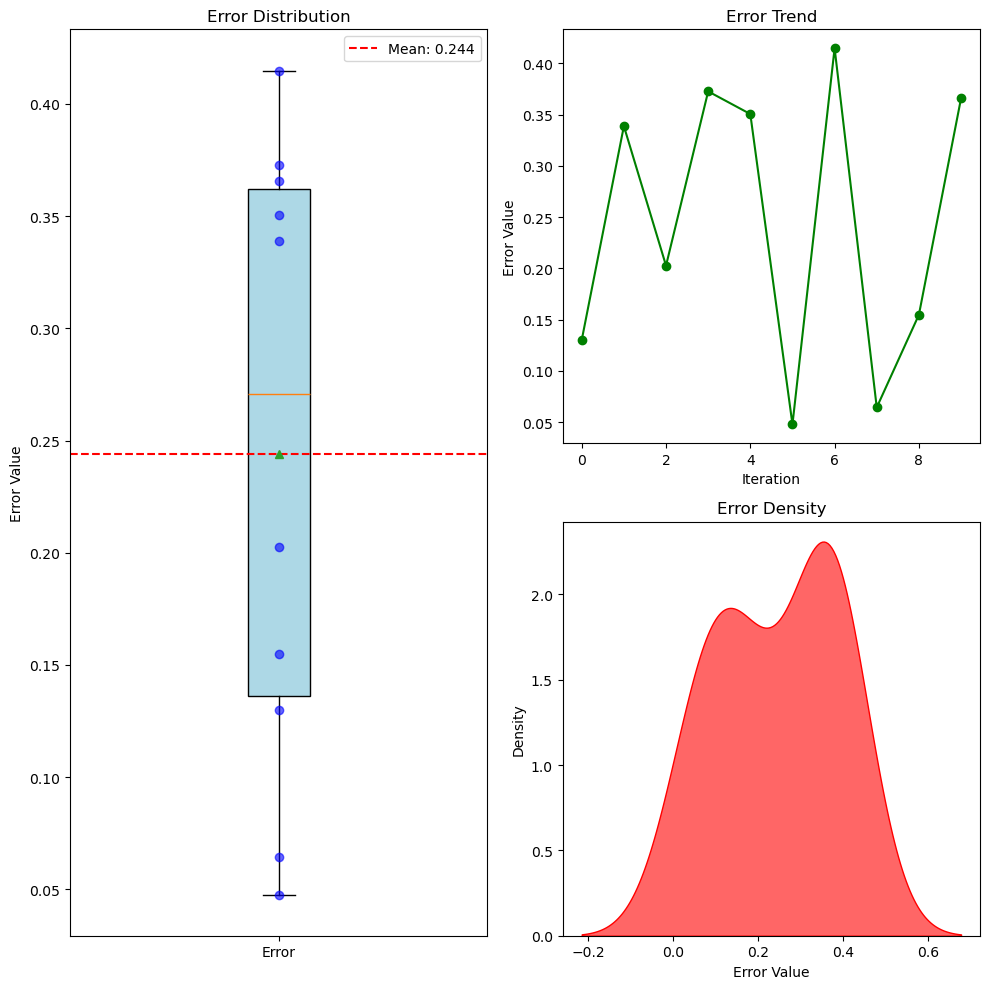

In [9]:

import seaborn as sns  # 导入seaborn库用于绘制密度图



plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列

mean_error = np.mean(error) #计算error数组的均值
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

In [10]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


15063


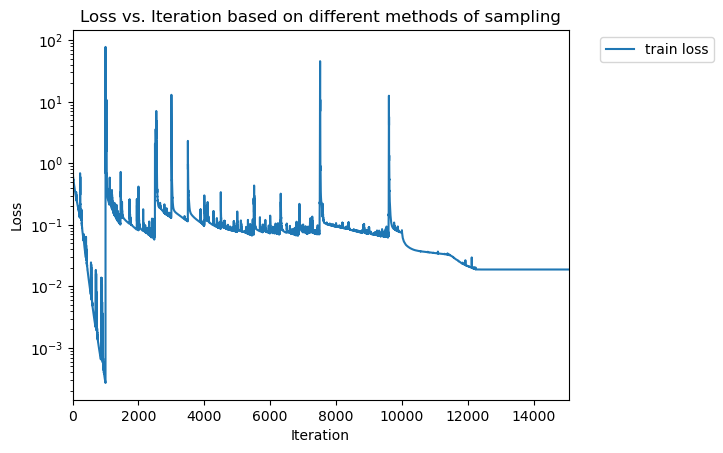

In [11]:
print(len(trainloss))

# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

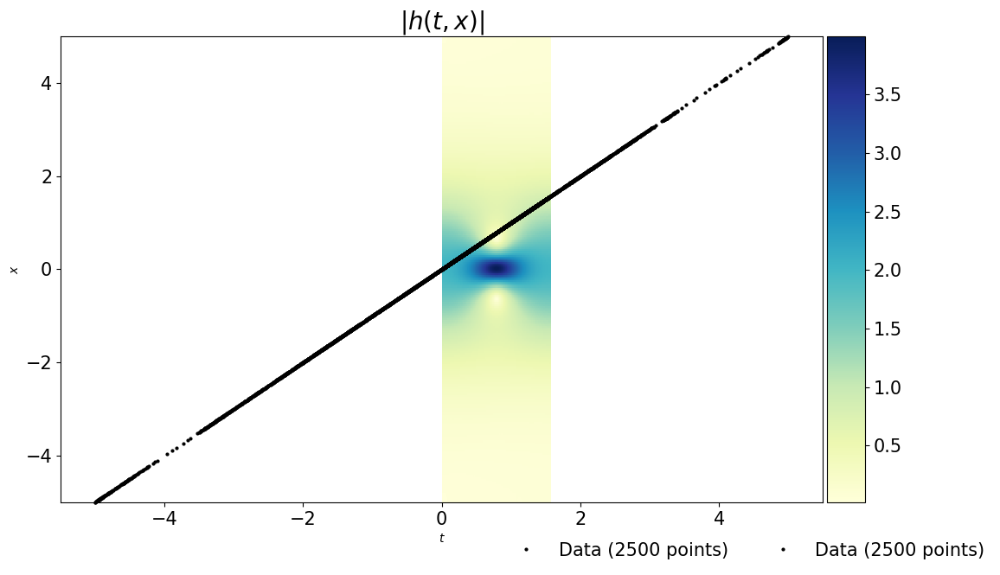

In [12]:


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(12, 7)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘制热图
h = ax.imshow(H_star.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')  #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是H_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                #第三个参数是颜色映射，这里是从黄色Yl到绿色Gn再到蓝色Bu；第四个参数是图像的范围，这里lb和ub分别是数据的下界和上界；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.05) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.05）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的

ax.plot(
    X_f[:,1], 
    X_f[:,0], 
    'ko', label = 'Data (%d points)' % (X_f.shape[0]), 
    markersize = 2,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  

# #绘制三条虚线
# line = np.linspace(x.min(), x.max(), 2)[:,None] #生成了一个包含2个等间距的数值的数组，这些数值在 x.min() 到 x.max() 之间。[:,None] 是一个索引操作，用于将一维数组转换为二维数组。这里其实就是[-5;5]
# #第一个参数是虚线的x坐标，line是虚线y的坐标，第三个参数是虚线的样式，k表示黑色，--表示虚线，最后一个参数表示虚线的参数是1
# ax.plot(t[75]*np.ones((2,1)),line,'k--',linewidth=1) 
# ax.plot(t[100]*np.ones((2,1)),line,'k--',linewidth=1)
# ax.plot(t[125]*np.ones((2,1)),line,'k--',linewidth=1)    

#设置标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$')
ax.set_ylabel('$x$')
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)

#    plt.setp(leg.get_texts(), color='w')   #用来设置图例中文本的颜色，这里是白色，取消注释后文本会变为白色
ax.set_title('$|h(t,x)|$', fontsize = 20) #设置子图ax的标题为$|h(t,x)|$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为10
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数


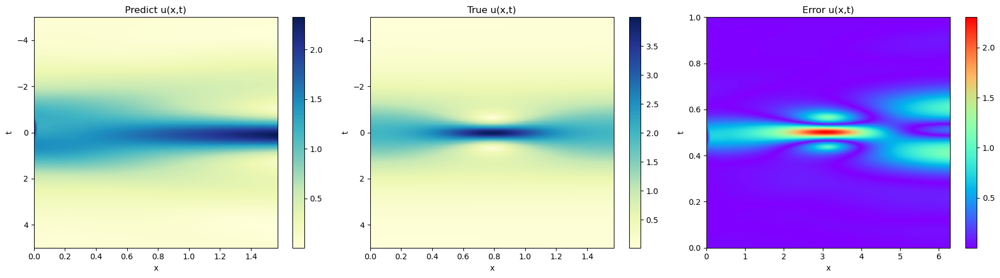

In [13]:


# 创建一个包含两个子图的图形
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 1行2列的子图，图形大小为宽18英寸高5英寸

# 绘制第一幅图像
axes[0].imshow(H_pred.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predict u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(H_star.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])


# 绘制第三幅图像
axes[2].imshow(np.abs(H_pred - H_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])


# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [14]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

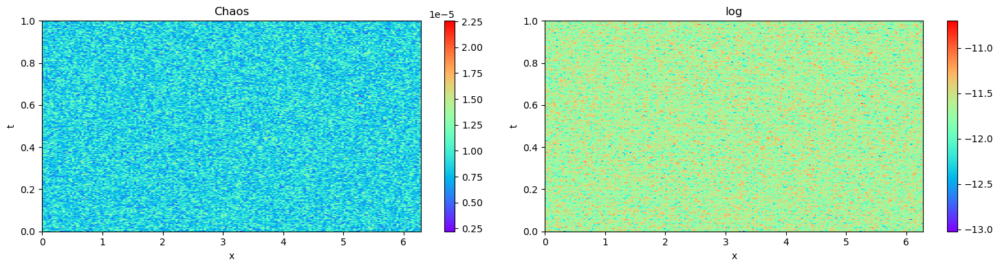

In [15]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()